In [1]:
import os

import numpy as np

import tensorflow as tf
from tensorflow import keras



from RoadDataset import RoadDataset

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
val_datasets_path = "../notebooks/datasets/validation/"
sub_dirs = os.listdir(val_datasets_path)
val_dataset_paths = [[val_datasets_path + sub_dir + "/" + sub_dir + ".csv", val_datasets_path + sub_dir + "/frames/"] for sub_dir in sub_dirs]
val_dataset_paths

[['../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/Tag-Sonne-Wolken-Ausserorts.csv',
  '../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/frames/'],
 ['../notebooks/datasets/validation/Nacht-Schneechaos/Nacht-Schneechaos.csv',
  '../notebooks/datasets/validation/Nacht-Schneechaos/frames/']]

In [4]:
dataset_index = 0
column_names = ['filename','steering_wheel_angle','speed', 'blink_l', 'blink_r']
val_set = RoadDataset(val_dataset_paths[dataset_index][0], val_dataset_paths[dataset_index][1], column_names, batch_size=16)
val_set.clean()

Reading csv file: ../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/Tag-Sonne-Wolken-Ausserorts.csv
Loaded dataset with 10474 samples
Cleaning dataset. Starting with 10474 samples.
Removing 0 rows for reason: SWA is NaN
Removing 3 rows for reason: No frame after cam latency compensation
Removing 290 rows for reason: High SWA (> +180/ < -180 deg)
Removing 915 rows for reason: Low speed (< 25 km/h)
Removing 66 rows for reason: Left blinker on
Removing 363 rows for reason: Right blinker on
8837 samples remaining.


In [5]:
stats = val_set.get_csv().describe()
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
steering_wheel_angle,8837.0,-1.781201,19.729146,-141.060,-3.940,-0.630,2.500,154.270
speed,8837.0,54.322306,11.746980,25.017,45.725,55.056,62.558,77.066
blink_l,8837.0,0.000000,0.000000,0.000,0.000,0.000,0.000,0.000
blink_r,8837.0,0.000000,0.000000,0.000,0.000,0.000,0.000,0.000


In [6]:
#val_set.balance()
#val_set.normalize()

In [7]:
stats = val_set.get_csv().describe()
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
steering_wheel_angle,8837.0,-1.781201,19.729146,-141.060,-3.940,-0.630,2.500,154.270
speed,8837.0,54.322306,11.746980,25.017,45.725,55.056,62.558,77.066
blink_l,8837.0,0.000000,0.000000,0.000,0.000,0.000,0.000,0.000
blink_r,8837.0,0.000000,0.000000,0.000,0.000,0.000,0.000,0.000


In [8]:
#model_name = 'diypilot_v1'
#model_name = 'diypilot_v2_epoch_10'
#model_name = 'diypilot_v3_epoch_5'
#model_name = 'openpilot_replica_epoch_59'
#model_name = 'openpilot_replica_mae_epoch_100'
#model_name = 'diypilot_v9_small_FC_epoch_3'
#model_name = 'diypilot_v11_random_shifts_epoch_3'
#model_name = 'diypilot_v11_random_shifts_full_balance_epoch_3'
#model_name = 'diypilot_v11_full_balance_epoch_163'
#model_name = 'diypilot_v12_epoch_58'
#model_name = 'diypilot_v13_sum_min5_overrepr_epoch_10'
#model_name = 'diypilot_v14_smaller_crop_epoch_3'
#model_name = 'diypilot_v14_smaller_crop_wider_epoch_3'
#model_name = 'diypilot_v14_smaller_crop_wider_white_corners_epoch_10'
#model_name = 'diypilot_v14_smaller_crop_wider_white_corners_random_shift_epoch_5'
#model_name = 'diypilot_v15_random_shift_and_offset_epoch_5'
#model_name = 'v17_epoch_1'
#model_name = 'v17.1_epoch_144'
#model_name = 'v17.1_epoch_13'
#model_name = 'v17.2_epoch_49'
model_name = 'v17.3_no_balance_epoch_1'
model_name = 'v17.4_flip_augmentation_epoch_1'
loaded_model = keras.models.load_model('./trained_models/' + model_name + '.h5')
loaded_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
frame_in (InputLayer)           [(None, 170, 640, 3) 0                                            
__________________________________________________________________________________________________
frame_normalize (Lambda)        (None, 170, 640, 3)  0           frame_in[0][0]                   
__________________________________________________________________________________________________
frame_downsample (MaxPooling2D) (None, 85, 213, 3)   0           frame_normalize[0][0]            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 27, 70, 24)   1824        frame_downsample[0][0]           
____________________________________________________________________________________________

In [9]:
import sys
sys.path.append("..") # Adds higher directory to python modules path.
from Jetson.autopilot.record.AutopilotGUI import AutopilotGUI

In [10]:
gui = AutopilotGUI()

In [11]:
def show_frame(test_image_index):

    test_sample = val_set.get_frame(test_image_index)
    test_image = test_sample[0]
    test_image_cropped = val_set.get_cropped_frame(test_image_index, shift=0, offset=0)[0]
    test_labels = test_sample[1]

    print("Test csv: " + str(test_labels))

    test_data = np.expand_dims(test_image_cropped, axis=0)
    predictions = loaded_model.predict(test_data)

    gui.set_frame(test_image)
    gui.set_show_overlay(True)
    gui.set_engaged(False)
    gui.set_recording(True)

    timestamp = test_labels['filename']
    gui.set_timestring(timestamp)

    velocity = test_labels['speed']
    gui.set_velocity(velocity)

    actual_swa = test_labels['steering_wheel_angle']*90
    gui.set_actual_swa(actual_swa)

    predicted_swa = predictions[0][0]*90
    print("Ground-truth: " +str(actual_swa))
    print("Prediction: " + str(predicted_swa))
    gui.set_predicted_swa(predicted_swa)

    gui.show_jupyter()

In [12]:
import ipywidgets as widgets
frame_slider = widgets.IntSlider(min=0, max=val_set.get_batch_size()*len(val_set)-1, continuous_update=False)

In [13]:
from ipywidgets import interact

interact(show_frame, test_image_index=frame_slider);

interactive(children=(IntSlider(value=0, continuous_update=False, description='test_image_index', max=8831), O…

In [14]:
import cv2
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(model_name + '.avi',fourcc, 15.0, (848,480))

In [15]:
framecount = val_set.get_batch_size()*len(val_set)
print(framecount)
ground_truth = []
predictions_list = []
velocity_list = []
#for i in range(1000):
for i in range(framecount):
    sample = val_set.get_sample(i)
    frame = sample['frame']
    
    sample = val_set.get_sample(i, augment=False, crop=True, normalize=False)
    cropped_frame = sample['frame']
    actual_swa = sample['swa']
    v_vehicle = sample['v_vehicle']
    blink_l = sample['blink_l']
    blink_r = sample['blink_r']
    timestamp = sample['filename']

    test_data = [np.array([cropped_frame]), np.array([v_vehicle/250])]
    print(test_data)
    predictions = loaded_model.predict(test_data)

    gui.set_frame(frame)
    gui.set_show_overlay(True)
    gui.set_engaged(False)
    gui.set_recording(True)

    
    gui.set_timestring(timestamp)
    
    velocity_list.append(v_vehicle)
    gui.set_velocity(v_vehicle)

    ground_truth.append(actual_swa)
    gui.set_actual_swa(actual_swa)

    predicted_swa = val_set.denormalize_swa(predictions[0][0])
    #predicted_swa = predictions[0][0]
    predictions_list.append(predicted_swa)
    print("Predictions: " + str(predictions))
    print("Ground-truth: " +str(actual_swa))
    print("Prediction: " + str(predicted_swa))
    gui.set_predicted_swa(predicted_swa)
    
    gui.render()
    frame = gui.get_rendered_gui()
    
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    out.write(rgb_frame.astype(np.uint8))
    
out.release()

8832
[array([[[[30, 30, 32],
         [31, 32, 34],
         [32, 34, 33],
         ...,
         [87, 77, 67],
         [98, 85, 77],
         [99, 84, 77]],

        [[31, 32, 34],
         [33, 34, 36],
         [31, 35, 36],
         ...,
         [85, 75, 66],
         [95, 85, 76],
         [98, 85, 77]],

        [[29, 28, 33],
         [31, 32, 34],
         [33, 34, 36],
         ...,
         [78, 69, 60],
         [91, 81, 72],
         [98, 88, 79]],

        ...,

        [[63, 53, 44],
         [64, 54, 45],
         [64, 54, 45],
         ...,
         [90, 74, 58],
         [91, 75, 59],
         [92, 76, 60]],

        [[61, 52, 43],
         [61, 52, 43],
         [62, 53, 44],
         ...,
         [88, 75, 58],
         [89, 76, 59],
         [90, 77, 60]],

        [[59, 50, 41],
         [61, 52, 43],
         [62, 53, 44],
         ...,
         [87, 74, 58],
         [88, 75, 59],
         [89, 76, 60]]]], dtype=uint8), array([0.100812])]
Predictions: [[-0.5677

Predictions: [[-0.2415805]]
Ground-truth: -1.88
Prediction: -3.2565198660398025
[array([[[[197, 191, 179],
         [196, 190, 178],
         [196, 190, 178],
         ...,
         [ 71,  72,  67],
         [ 74,  75,  69],
         [ 78,  79,  73]],

        [[197, 191, 179],
         [198, 192, 180],
         [200, 194, 182],
         ...,
         [ 64,  63,  58],
         [ 69,  70,  64],
         [ 77,  77,  69]],

        [[201, 195, 183],
         [201, 195, 183],
         [201, 195, 183],
         ...,
         [ 62,  61,  56],
         [ 65,  65,  57],
         [ 68,  68,  60]],

        ...,

        [[ 54,  49,  43],
         [ 54,  49,  43],
         [ 53,  48,  42],
         ...,
         [ 79,  69,  59],
         [ 78,  68,  58],
         [ 76,  66,  56]],

        [[ 54,  49,  43],
         [ 54,  49,  43],
         [ 54,  49,  43],
         ...,
         [ 77,  67,  57],
         [ 76,  66,  56],
         [ 76,  66,  56]],

        [[ 54,  49,  43],
         [ 54,  49,

[array([[[[ 45,  45,  47],
         [ 53,  51,  54],
         [ 56,  51,  55],
         ...,
         [108,  88,  79],
         [106,  83,  75],
         [103,  80,  72]],

        [[115, 109, 111],
         [125, 116, 117],
         [130, 120, 121],
         ...,
         [112,  90,  79],
         [108,  84,  74],
         [104,  77,  68]],

        [[ 58,  42,  42],
         [ 56,  38,  38],
         [ 54,  34,  35],
         ...,
         [110,  86,  76],
         [109,  82,  73],
         [107,  78,  70]],

        ...,

        [[ 76,  61,  56],
         [ 76,  61,  56],
         [ 73,  58,  51],
         ...,
         [ 84,  69,  62],
         [ 83,  68,  61],
         [ 82,  67,  60]],

        [[ 76,  61,  56],
         [ 76,  61,  56],
         [ 74,  59,  54],
         ...,
         [ 83,  68,  61],
         [ 82,  67,  60],
         [ 81,  66,  59]],

        [[ 73,  58,  53],
         [ 75,  60,  55],
         [ 73,  58,  53],
         ...,
         [ 82,  67,  60],
       

[array([[[[79, 37, 38],
         [80, 36, 37],
         [79, 33, 35],
         ...,
         [46, 40, 50],
         [47, 42, 49],
         [50, 45, 51]],

        [[82, 33, 36],
         [78, 30, 30],
         [81, 33, 33],
         ...,
         [47, 42, 49],
         [47, 42, 49],
         [50, 45, 51]],

        [[81, 33, 33],
         [80, 32, 32],
         [77, 31, 31],
         ...,
         [50, 45, 52],
         [53, 48, 55],
         [55, 50, 56]],

        ...,

        [[73, 64, 55],
         [72, 63, 54],
         [69, 60, 51],
         ...,
         [81, 71, 61],
         [81, 71, 61],
         [81, 73, 62]],

        [[71, 62, 53],
         [71, 62, 53],
         [71, 62, 53],
         ...,
         [81, 71, 61],
         [81, 71, 61],
         [80, 72, 61]],

        [[69, 60, 51],
         [72, 63, 54],
         [74, 65, 56],
         ...,
         [80, 70, 60],
         [81, 71, 61],
         [80, 72, 61]]]], dtype=uint8), array([0.104904])]
Predictions: [[0.07612204]]

[array([[[[ 30,  31,  33],
         [ 29,  30,  32],
         [ 28,  29,  31],
         ...,
         [255, 255, 253],
         [255, 255, 253],
         [255, 255, 253]],

        [[ 31,  32,  34],
         [ 29,  30,  32],
         [ 28,  29,  31],
         ...,
         [255, 255, 253],
         [255, 255, 253],
         [255, 255, 253]],

        [[ 29,  30,  32],
         [ 29,  29,  31],
         [ 28,  28,  28],
         ...,
         [255, 255, 253],
         [255, 255, 253],
         [255, 255, 253]],

        ...,

        [[ 50,  50,  48],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [ 92,  83,  74],
         [ 90,  81,  72],
         [ 86,  77,  68]],

        [[ 50,  50,  50],
         [ 49,  49,  49],
         [ 49,  49,  49],
         ...,
         [ 87,  78,  69],
         [ 86,  77,  68],
         [ 84,  75,  66]],

        [[ 51,  49,  50],
         [ 49,  49,  49],
         [ 48,  48,  48],
         ...,
         [ 81,  72,  63],
       

Predictions: [[0.3488863]]
Ground-truth: 4.19
Prediction: 6.074350438147398
[array([[[[ 98,  85,  76],
         [ 94,  81,  72],
         [ 83,  73,  64],
         ...,
         [117,  17,  27],
         [137,  13,  24],
         [155,  11,  20]],

        [[ 79,  66,  57],
         [ 81,  68,  60],
         [ 50,  37,  31],
         ...,
         [117,  23,  37],
         [126,  18,  31],
         [139,  19,  29]],

        [[ 86,  73,  67],
         [ 88,  74,  71],
         [ 52,  38,  35],
         ...,
         [124,  36,  50],
         [132,  39,  50],
         [136,  39,  46]],

        ...,

        [[ 74,  65,  58],
         [ 74,  65,  58],
         [ 73,  64,  57],
         ...,
         [101,  89,  77],
         [101,  89,  77],
         [102,  88,  77]],

        [[ 73,  64,  57],
         [ 73,  64,  57],
         [ 73,  64,  57],
         ...,
         [103,  91,  79],
         [103,  91,  79],
         [103,  91,  79]],

        [[ 73,  64,  57],
         [ 73,  64,  57

[array([[[[254, 255, 245],
         [255, 255, 243],
         [246, 244, 232],
         ...,
         [ 74,  50,  26],
         [ 77,  53,  29],
         [ 79,  54,  32]],

        [[255, 255, 246],
         [253, 253, 241],
         [252, 250, 238],
         ...,
         [ 73,  49,  25],
         [ 75,  51,  27],
         [ 79,  55,  31]],

        [[254, 254, 244],
         [255, 255, 242],
         [253, 249, 238],
         ...,
         [ 71,  47,  23],
         [ 74,  50,  26],
         [ 80,  54,  31]],

        ...,

        [[ 65,  56,  47],
         [ 63,  54,  45],
         [ 63,  53,  44],
         ...,
         [ 35,  34,  30],
         [ 35,  34,  30],
         [ 34,  35,  30]],

        [[ 62,  53,  44],
         [ 60,  51,  42],
         [ 60,  51,  42],
         ...,
         [ 36,  35,  31],
         [ 34,  35,  30],
         [ 34,  35,  30]],

        [[ 60,  51,  42],
         [ 59,  50,  41],
         [ 60,  51,  42],
         ...,
         [ 35,  36,  31],
       

[array([[[[222, 203, 186],
         [226, 205, 188],
         [232, 211, 192],
         ...,
         [ 93,  64,  34],
         [ 93,  64,  34],
         [ 95,  65,  37]],

        [[243, 225, 203],
         [244, 223, 202],
         [247, 226, 205],
         ...,
         [ 93,  62,  33],
         [ 94,  63,  34],
         [ 98,  67,  38]],

        [[250, 234, 208],
         [247, 231, 205],
         [251, 235, 209],
         ...,
         [ 92,  61,  32],
         [ 93,  62,  33],
         [ 94,  63,  34]],

        ...,

        [[ 70,  62,  49],
         [ 68,  60,  47],
         [ 69,  61,  48],
         ...,
         [ 49,  45,  33],
         [ 51,  45,  33],
         [ 52,  46,  34]],

        [[ 70,  62,  49],
         [ 68,  60,  47],
         [ 69,  61,  48],
         ...,
         [ 49,  45,  33],
         [ 48,  44,  32],
         [ 51,  45,  33]],

        [[ 70,  62,  49],
         [ 68,  60,  47],
         [ 69,  61,  48],
         ...,
         [ 48,  46,  33],
       

[array([[[[254, 255, 247],
         [254, 255, 247],
         [252, 253, 245],
         ...,
         [ 41,  42,  37],
         [ 42,  43,  37],
         [ 41,  42,  36]],

        [[222, 223, 215],
         [217, 218, 210],
         [212, 213, 205],
         ...,
         [ 41,  42,  37],
         [ 41,  42,  37],
         [ 41,  42,  36]],

        [[252, 253, 247],
         [253, 254, 246],
         [253, 254, 248],
         ...,
         [ 41,  42,  37],
         [ 41,  42,  37],
         [ 42,  43,  37]],

        ...,

        [[ 80,  70,  58],
         [ 80,  70,  58],
         [ 78,  68,  56],
         ...,
         [ 56,  50,  38],
         [ 56,  50,  38],
         [ 57,  51,  39]],

        [[ 79,  69,  57],
         [ 79,  69,  57],
         [ 77,  67,  55],
         ...,
         [ 53,  49,  38],
         [ 53,  49,  38],
         [ 54,  50,  39]],

        [[ 78,  68,  56],
         [ 78,  68,  56],
         [ 77,  67,  55],
         ...,
         [ 52,  48,  37],
       

[array([[[[46, 42, 43],
         [45, 41, 42],
         [47, 43, 44],
         ...,
         [39, 32, 26],
         [39, 32, 26],
         [40, 33, 27]],

        [[42, 40, 41],
         [46, 44, 45],
         [44, 40, 41],
         ...,
         [40, 33, 27],
         [40, 33, 27],
         [41, 34, 28]],

        [[41, 39, 40],
         [42, 40, 41],
         [42, 40, 41],
         ...,
         [43, 36, 30],
         [42, 35, 29],
         [42, 34, 31]],

        ...,

        [[84, 67, 57],
         [82, 65, 55],
         [82, 65, 55],
         ...,
         [52, 45, 37],
         [51, 42, 35],
         [51, 42, 35]],

        [[86, 69, 59],
         [85, 68, 58],
         [84, 67, 57],
         ...,
         [52, 45, 37],
         [51, 44, 36],
         [52, 43, 36]],

        [[87, 70, 60],
         [86, 69, 59],
         [86, 69, 59],
         ...,
         [52, 45, 37],
         [52, 45, 37],
         [53, 44, 37]]]], dtype=uint8), array([0.105524])]
Predictions: [[-0.32874036]

[array([[[[253,  71,  50],
         [250,  71,  48],
         [250,  70,  45],
         ...,
         [ 92,  82,  73],
         [ 92,  82,  73],
         [ 90,  80,  71]],

        [[252,  70,  49],
         [249,  70,  48],
         [250,  70,  45],
         ...,
         [ 92,  82,  72],
         [ 92,  82,  72],
         [ 91,  81,  72]],

        [[252,  70,  49],
         [252,  71,  50],
         [253,  73,  50],
         ...,
         [ 93,  83,  73],
         [ 93,  83,  73],
         [ 89,  79,  69]],

        ...,

        [[ 76,  62,  49],
         [ 76,  64,  50],
         [ 77,  65,  51],
         ...,
         [ 69,  56,  47],
         [ 68,  55,  46],
         [ 67,  54,  45]],

        [[ 77,  63,  52],
         [ 77,  65,  51],
         [ 77,  65,  51],
         ...,
         [ 69,  56,  47],
         [ 68,  55,  46],
         [ 66,  56,  46]],

        [[ 76,  64,  52],
         [ 76,  64,  50],
         [ 76,  64,  50],
         ...,
         [ 67,  54,  45],
       

Predictions: [[-0.11694817]]
Ground-truth: -10.89
Prediction: -1.192932809218771
[array([[[[155, 130,  99],
         [115,  92,  61],
         [ 99,  79,  52],
         ...,
         [ 80,  69,  63],
         [ 83,  74,  67],
         [ 79,  70,  65]],

        [[ 91,  71,  46],
         [ 86,  68,  44],
         [ 76,  58,  36],
         ...,
         [ 82,  71,  65],
         [ 85,  74,  68],
         [ 79,  70,  65]],

        [[ 65,  48,  30],
         [ 72,  56,  40],
         [ 65,  52,  36],
         ...,
         [ 83,  73,  64],
         [ 86,  75,  69],
         [ 78,  69,  64]],

        ...,

        [[ 59,  49,  40],
         [ 59,  49,  40],
         [ 58,  48,  39],
         ...,
         [ 48,  40,  37],
         [ 47,  39,  36],
         [ 47,  39,  36]],

        [[ 58,  48,  39],
         [ 58,  48,  39],
         [ 58,  48,  39],
         ...,
         [ 48,  40,  37],
         [ 47,  39,  36],
         [ 47,  39,  36]],

        [[ 57,  47,  38],
         [ 57,  48

Predictions: [[-0.22049741]]
Ground-truth: -8.58
Prediction: -2.831402694480947
[array([[[[ 80,  56,  28],
         [ 80,  56,  32],
         [ 70,  48,  25],
         ...,
         [ 49,  46,  41],
         [ 40,  39,  34],
         [ 45,  44,  39]],

        [[ 86,  62,  34],
         [ 80,  56,  30],
         [ 77,  52,  30],
         ...,
         [ 48,  45,  40],
         [ 41,  38,  33],
         [ 45,  44,  39]],

        [[110,  84,  57],
         [ 85,  61,  35],
         [ 73,  49,  25],
         ...,
         [ 46,  43,  38],
         [ 42,  39,  34],
         [ 47,  44,  39]],

        ...,

        [[ 57,  47,  38],
         [ 59,  46,  38],
         [ 59,  46,  38],
         ...,
         [ 49,  41,  38],
         [ 49,  41,  38],
         [ 48,  40,  37]],

        [[ 59,  46,  38],
         [ 59,  46,  38],
         [ 60,  47,  39],
         ...,
         [ 49,  41,  38],
         [ 49,  41,  38],
         [ 48,  40,  37]],

        [[ 59,  46,  38],
         [ 59,  46,

Predictions: [[-0.28479946]]
Ground-truth: -4.76
Prediction: -4.248522319692749
[array([[[[183, 166, 138],
         [182, 160, 139],
         [118,  95,  79],
         ...,
         [ 87,  72,  65],
         [ 89,  74,  67],
         [ 89,  72,  65]],

        [[177, 162, 139],
         [131, 114,  98],
         [123, 105,  91],
         ...,
         [ 86,  71,  64],
         [ 89,  74,  67],
         [ 90,  73,  66]],

        [[154, 142, 120],
         [118, 106,  92],
         [119, 109,  97],
         ...,
         [ 88,  73,  66],
         [ 89,  74,  67],
         [ 91,  74,  67]],

        ...,

        [[ 69,  55,  44],
         [ 68,  56,  44],
         [ 67,  55,  43],
         ...,
         [ 52,  43,  36],
         [ 51,  42,  35],
         [ 51,  42,  35]],

        [[ 70,  56,  45],
         [ 68,  56,  44],
         [ 68,  56,  44],
         ...,
         [ 53,  44,  37],
         [ 52,  43,  36],
         [ 52,  43,  36]],

        [[ 70,  56,  45],
         [ 68,  56,

[array([[[[156, 130, 103],
         [153, 126,  97],
         [158, 129,  99],
         ...,
         [119,  68,  51],
         [127,  80,  62],
         [120,  73,  57]],

        [[158, 132, 105],
         [157, 132, 102],
         [157, 130, 101],
         ...,
         [119,  72,  56],
         [126,  83,  66],
         [121,  78,  61]],

        [[160, 134, 107],
         [158, 132, 105],
         [158, 133, 103],
         ...,
         [116,  73,  56],
         [122,  83,  66],
         [119,  80,  63]],

        ...,

        [[ 65,  52,  43],
         [ 65,  52,  43],
         [ 65,  52,  43],
         ...,
         [ 55,  42,  34],
         [ 55,  42,  34],
         [ 55,  42,  34]],

        [[ 65,  52,  43],
         [ 65,  52,  43],
         [ 65,  52,  43],
         ...,
         [ 55,  42,  34],
         [ 55,  42,  34],
         [ 55,  42,  34]],

        [[ 65,  52,  43],
         [ 65,  52,  43],
         [ 63,  53,  43],
         ...,
         [ 55,  42,  34],
       

Predictions: [[-0.28396118]]
Ground-truth: -4.19
Prediction: -4.2276053695360405
[array([[[[180, 168, 156],
         [180, 168, 156],
         [180, 168, 156],
         ...,
         [105,  88,  78],
         [105,  88,  78],
         [107,  90,  80]],

        [[181, 169, 155],
         [178, 168, 156],
         [176, 166, 154],
         ...,
         [136, 123, 114],
         [145, 132, 123],
         [158, 145, 136]],

        [[166, 144, 133],
         [179, 161, 151],
         [176, 162, 151],
         ...,
         [181, 172, 163],
         [179, 170, 161],
         [180, 173, 163]],

        ...,

        [[ 62,  49,  41],
         [ 59,  49,  40],
         [ 59,  49,  40],
         ...,
         [ 51,  42,  37],
         [ 50,  41,  34],
         [ 51,  42,  35]],

        [[ 64,  51,  43],
         [ 60,  50,  41],
         [ 60,  50,  41],
         ...,
         [ 50,  41,  36],
         [ 50,  41,  36],
         [ 51,  42,  37]],

        [[ 65,  52,  44],
         [ 61,  51

Predictions: [[-0.06412585]]
Ground-truth: -5.2
Prediction: -0.5848063281631628
[array([[[[170, 143, 116],
         [150, 126,  98],
         [200, 180, 153],
         ...,
         [ 31,  23,  20],
         [ 30,  23,  17],
         [ 30,  23,  17]],

        [[156, 125,  97],
         [170, 143, 116],
         [199, 178, 151],
         ...,
         [ 30,  23,  17],
         [ 30,  23,  17],
         [ 30,  23,  17]],

        [[158, 126, 101],
         [161, 133, 109],
         [170, 148, 124],
         ...,
         [ 30,  23,  17],
         [ 30,  23,  17],
         [ 30,  23,  17]],

        ...,

        [[ 58,  48,  39],
         [ 58,  48,  39],
         [ 56,  46,  37],
         ...,
         [ 49,  38,  32],
         [ 49,  38,  32],
         [ 50,  39,  33]],

        [[ 57,  47,  38],
         [ 58,  48,  39],
         [ 57,  47,  38],
         ...,
         [ 49,  38,  32],
         [ 49,  38,  32],
         [ 49,  38,  32]],

        [[ 57,  47,  38],
         [ 58,  48,

Predictions: [[0.06210193]]
Ground-truth: -4.57
Prediction: 0.563965035024232
[array([[[[ 93, 117, 121],
         [ 91, 115, 117],
         [ 91, 112, 113],
         ...,
         [ 53,  40,  24],
         [ 54,  41,  25],
         [ 55,  41,  28]],

        [[ 93, 117, 121],
         [ 92, 113, 116],
         [ 94, 115, 116],
         ...,
         [ 50,  37,  21],
         [ 52,  39,  23],
         [ 55,  42,  26]],

        [[ 96, 111, 114],
         [ 91, 107, 107],
         [ 94, 110, 109],
         ...,
         [ 51,  38,  21],
         [ 53,  40,  24],
         [ 59,  46,  30]],

        ...,

        [[ 50,  50,  38],
         [ 50,  50,  38],
         [ 50,  50,  38],
         ...,
         [ 53,  54,  46],
         [ 49,  50,  44],
         [ 44,  45,  39]],

        [[ 49,  49,  37],
         [ 50,  50,  38],
         [ 50,  50,  38],
         ...,
         [ 53,  54,  46],
         [ 49,  50,  44],
         [ 44,  47,  40]],

        [[ 49,  49,  37],
         [ 49,  49,  

[array([[[[ 71, 127, 150],
         [ 70, 128, 150],
         [ 69, 127, 149],
         ...,
         [ 62,  41,  20],
         [ 57,  36,  17],
         [ 58,  37,  20]],

        [[ 70, 128, 150],
         [ 68, 129, 150],
         [ 69, 127, 147],
         ...,
         [ 48,  31,  13],
         [ 59,  42,  26],
         [ 56,  38,  24]],

        [[ 69, 129, 153],
         [ 65, 127, 148],
         [ 65, 128, 146],
         ...,
         [ 46,  33,  17],
         [ 53,  39,  26],
         [ 49,  35,  22]],

        ...,

        [[ 52,  49,  40],
         [ 52,  49,  40],
         [ 52,  49,  40],
         ...,
         [ 38,  39,  34],
         [ 38,  39,  34],
         [ 39,  38,  34]],

        [[ 52,  49,  40],
         [ 52,  49,  40],
         [ 52,  49,  40],
         ...,
         [ 39,  40,  35],
         [ 40,  39,  35],
         [ 39,  38,  34]],

        [[ 52,  49,  40],
         [ 52,  49,  40],
         [ 52,  49,  40],
         ...,
         [ 40,  39,  35],
       

[array([[[[100,  95,  91],
         [ 81,  78,  73],
         [ 73,  75,  70],
         ...,
         [ 83,  64,  47],
         [ 75,  58,  42],
         [ 66,  52,  39]],

        [[112, 113, 108],
         [104, 109, 105],
         [ 98, 109, 105],
         ...,
         [ 88,  67,  50],
         [ 76,  59,  43],
         [ 65,  51,  38]],

        [[ 98, 104, 104],
         [ 94, 104, 103],
         [ 94, 110, 110],
         ...,
         [ 84,  63,  46],
         [ 69,  52,  36],
         [ 65,  51,  38]],

        ...,

        [[ 61,  52,  47],
         [ 61,  52,  47],
         [ 61,  52,  47],
         ...,
         [ 44,  37,  31],
         [ 44,  37,  31],
         [ 46,  37,  32]],

        [[ 61,  52,  47],
         [ 61,  52,  47],
         [ 61,  52,  47],
         ...,
         [ 44,  36,  33],
         [ 44,  36,  33],
         [ 44,  36,  33]],

        [[ 62,  53,  48],
         [ 62,  53,  48],
         [ 62,  53,  48],
         ...,
         [ 42,  37,  33],
       

[array([[[[181, 158, 127],
         [250, 225, 195],
         [165, 139, 114],
         ...,
         [ 90,  72,  60],
         [ 91,  71,  60],
         [ 92,  72,  61]],

        [[218, 197, 168],
         [255, 246, 215],
         [177, 153, 127],
         ...,
         [ 89,  71,  59],
         [ 90,  70,  59],
         [ 91,  71,  60]],

        [[199, 180, 150],
         [255, 247, 215],
         [188, 167, 140],
         ...,
         [ 89,  71,  59],
         [ 91,  71,  60],
         [ 88,  68,  57]],

        ...,

        [[ 76,  60,  47],
         [ 74,  58,  45],
         [ 73,  57,  44],
         ...,
         [ 45,  31,  22],
         [ 46,  32,  23],
         [ 46,  32,  23]],

        [[ 76,  60,  47],
         [ 74,  58,  45],
         [ 73,  57,  44],
         ...,
         [ 47,  32,  25],
         [ 47,  33,  24],
         [ 45,  31,  22]],

        [[ 74,  58,  45],
         [ 72,  56,  43],
         [ 72,  56,  43],
         ...,
         [ 46,  31,  24],
       

[array([[[[ 89,  81,  68],
         [106,  98,  85],
         [115, 107,  94],
         ...,
         [ 47,  43,  32],
         [ 41,  38,  29],
         [ 40,  37,  30]],

        [[ 86,  78,  65],
         [106,  98,  85],
         [115, 107,  94],
         ...,
         [ 42,  38,  27],
         [ 43,  39,  30],
         [ 40,  35,  29]],

        [[ 80,  72,  59],
         [109, 101,  88],
         [113, 105,  92],
         ...,
         [ 45,  38,  28],
         [ 43,  36,  28],
         [ 45,  38,  32]],

        ...,

        [[ 68,  62,  48],
         [ 67,  61,  47],
         [ 68,  62,  48],
         ...,
         [ 43,  43,  35],
         [ 43,  43,  35],
         [ 42,  42,  34]],

        [[ 68,  62,  50],
         [ 67,  61,  47],
         [ 68,  62,  48],
         ...,
         [ 43,  43,  35],
         [ 43,  43,  35],
         [ 42,  42,  34]],

        [[ 68,  62,  50],
         [ 67,  61,  47],
         [ 67,  61,  47],
         ...,
         [ 42,  42,  34],
       

[array([[[[255, 247, 216],
         [255, 247, 214],
         [255, 239, 209],
         ...,
         [ 47,  38,  31],
         [ 47,  40,  32],
         [ 48,  41,  33]],

        [[255, 241, 212],
         [255, 237, 206],
         [249, 228, 199],
         ...,
         [ 46,  42,  33],
         [ 45,  41,  32],
         [ 46,  41,  35]],

        [[246, 219, 192],
         [249, 222, 193],
         [244, 218, 191],
         ...,
         [ 47,  44,  37],
         [ 44,  41,  34],
         [ 45,  42,  35]],

        ...,

        [[ 73,  65,  54],
         [ 72,  64,  53],
         [ 72,  62,  52],
         ...,
         [ 31,  38,  31],
         [ 32,  39,  32],
         [ 33,  40,  33]],

        [[ 73,  65,  54],
         [ 73,  63,  53],
         [ 72,  62,  52],
         ...,
         [ 32,  39,  32],
         [ 33,  40,  33],
         [ 33,  40,  33]],

        [[ 75,  65,  55],
         [ 74,  64,  54],
         [ 73,  63,  53],
         ...,
         [ 32,  39,  32],
       

[array([[[[255, 255, 253],
         [255, 255, 253],
         [255, 255, 253],
         ...,
         [ 60,  57,  48],
         [ 53,  51,  39],
         [ 54,  52,  40]],

        [[252, 255, 253],
         [254, 255, 253],
         [255, 255, 253],
         ...,
         [ 67,  64,  55],
         [ 57,  55,  43],
         [ 52,  50,  38]],

        [[249, 255, 251],
         [251, 255, 250],
         [254, 255, 250],
         ...,
         [ 82,  82,  72],
         [ 58,  58,  46],
         [ 53,  53,  41]],

        ...,

        [[ 53,  53,  45],
         [ 52,  51,  46],
         [ 51,  50,  45],
         ...,
         [ 33,  35,  32],
         [ 33,  35,  32],
         [ 33,  35,  32]],

        [[ 53,  52,  47],
         [ 52,  51,  46],
         [ 51,  50,  45],
         ...,
         [ 33,  35,  32],
         [ 33,  35,  32],
         [ 33,  35,  32]],

        [[ 53,  52,  47],
         [ 51,  50,  45],
         [ 51,  50,  45],
         ...,
         [ 33,  35,  32],
       

Predictions: [[-0.5924552]]
Ground-truth: -0.5
Prediction: -19.39095167664018
[array([[[[106,  96,  97],
         [110,  99, 103],
         [108,  99, 102],
         ...,
         [ 61,  47,  38],
         [ 58,  44,  35],
         [ 59,  44,  37]],

        [[ 97,  87,  88],
         [108,  98,  99],
         [111, 102, 105],
         ...,
         [ 59,  45,  36],
         [ 57,  43,  34],
         [ 60,  45,  38]],

        [[ 99,  87,  87],
         [121, 109, 109],
         [128, 118, 117],
         ...,
         [ 59,  45,  36],
         [ 59,  45,  36],
         [ 59,  44,  37]],

        ...,

        [[ 54,  49,  46],
         [ 54,  49,  46],
         [ 54,  49,  46],
         ...,
         [ 41,  40,  38],
         [ 42,  41,  39],
         [ 43,  42,  40]],

        [[ 54,  49,  46],
         [ 54,  49,  46],
         [ 54,  49,  46],
         ...,
         [ 41,  40,  38],
         [ 42,  41,  39],
         [ 43,  42,  40]],

        [[ 55,  50,  47],
         [ 55,  50,  

Predictions: [[-0.576044]]
Ground-truth: -2.38
Prediction: -18.03184530928825
[array([[[[181, 168, 152],
         [181, 168, 152],
         [181, 168, 152],
         ...,
         [ 57,  34,  20],
         [ 66,  40,  27],
         [ 69,  43,  28]],

        [[181, 167, 154],
         [180, 167, 151],
         [180, 166, 153],
         ...,
         [ 60,  34,  21],
         [ 66,  40,  25],
         [ 71,  43,  29]],

        [[184, 170, 159],
         [183, 169, 158],
         [182, 168, 157],
         ...,
         [ 68,  42,  27],
         [ 68,  41,  24],
         [ 72,  43,  27]],

        ...,

        [[ 50,  45,  42],
         [ 51,  46,  43],
         [ 51,  46,  43],
         ...,
         [ 34,  33,  31],
         [ 36,  35,  33],
         [ 36,  35,  33]],

        [[ 53,  45,  43],
         [ 54,  46,  44],
         [ 54,  46,  44],
         ...,
         [ 33,  32,  30],
         [ 34,  33,  31],
         [ 34,  33,  31]],

        [[ 54,  44,  43],
         [ 55,  45,  

Predictions: [[-0.07101722]]
Ground-truth: -2.69
Prediction: -0.6570488792795528
[array([[[[ 63,  57,  59],
         [ 62,  56,  58],
         [ 66,  60,  62],
         ...,
         [ 39,  26,  18],
         [ 44,  31,  23],
         [ 49,  36,  27]],

        [[ 70,  59,  65],
         [ 73,  62,  68],
         [ 72,  61,  67],
         ...,
         [ 37,  24,  16],
         [ 39,  26,  18],
         [ 42,  29,  20]],

        [[100,  87,  94],
         [ 91,  76,  83],
         [ 83,  71,  75],
         ...,
         [ 35,  22,  14],
         [ 38,  25,  17],
         [ 40,  27,  18]],

        ...,

        [[ 54,  50,  49],
         [ 54,  50,  49],
         [ 53,  49,  48],
         ...,
         [ 37,  37,  35],
         [ 38,  38,  36],
         [ 37,  37,  35]],

        [[ 54,  50,  49],
         [ 54,  50,  49],
         [ 53,  49,  48],
         ...,
         [ 37,  37,  35],
         [ 38,  38,  36],
         [ 38,  38,  36]],

        [[ 54,  50,  49],
         [ 54,  50

Predictions: [[-0.07479003]]
Ground-truth: -2.69
Prediction: -0.6974511359885942
[array([[[[203, 192, 188],
         [204, 197, 189],
         [198, 196, 184],
         ...,
         [ 68,  51,  41],
         [ 70,  53,  43],
         [ 68,  54,  43]],

        [[201, 192, 187],
         [202, 195, 185],
         [202, 198, 186],
         ...,
         [ 68,  52,  39],
         [ 65,  49,  36],
         [ 66,  50,  37]],

        [[198, 193, 187],
         [205, 198, 188],
         [206, 196, 186],
         ...,
         [ 65,  47,  35],
         [ 66,  48,  36],
         [ 66,  48,  36]],

        ...,

        [[ 78,  68,  66],
         [ 78,  68,  66],
         [ 78,  68,  66],
         ...,
         [ 62,  54,  51],
         [ 63,  55,  52],
         [ 64,  56,  53]],

        [[ 79,  68,  66],
         [ 80,  69,  67],
         [ 78,  68,  66],
         ...,
         [ 62,  54,  51],
         [ 62,  54,  51],
         [ 64,  56,  53]],

        [[ 80,  69,  67],
         [ 80,  69

Predictions: [[0.10281308]]
Ground-truth: -1.82
Prediction: 1.0174119698953015
[array([[[[41, 40, 36],
         [39, 38, 34],
         [38, 37, 33],
         ...,
         [40, 35, 31],
         [44, 36, 33],
         [48, 40, 37]],

        [[44, 40, 37],
         [39, 38, 34],
         [38, 37, 33],
         ...,
         [39, 34, 30],
         [41, 33, 30],
         [47, 39, 36]],

        [[44, 41, 36],
         [43, 39, 36],
         [43, 39, 36],
         ...,
         [39, 34, 30],
         [39, 31, 28],
         [40, 32, 29]],

        ...,

        [[68, 63, 57],
         [69, 64, 58],
         [69, 64, 58],
         ...,
         [56, 51, 45],
         [55, 52, 45],
         [55, 52, 45]],

        [[67, 62, 56],
         [68, 63, 57],
         [69, 64, 58],
         ...,
         [58, 53, 47],
         [56, 53, 46],
         [56, 53, 46]],

        [[69, 64, 58],
         [70, 65, 59],
         [70, 65, 59],
         ...,
         [59, 54, 48],
         [57, 54, 47],
       

Predictions: [[-0.04720122]]
Ground-truth: -1.82
Prediction: -0.4156104885380638
[array([[[[45, 42, 37],
         [58, 55, 50],
         [61, 58, 53],
         ...,
         [76, 73, 66],
         [45, 42, 37],
         [36, 35, 30]],

        [[45, 42, 37],
         [56, 53, 48],
         [57, 53, 50],
         ...,
         [81, 76, 70],
         [41, 38, 33],
         [39, 36, 31]],

        [[43, 39, 36],
         [59, 58, 54],
         [60, 59, 55],
         ...,
         [69, 64, 58],
         [43, 38, 34],
         [37, 34, 29]],

        ...,

        [[76, 72, 63],
         [76, 72, 63],
         [76, 71, 65],
         ...,
         [61, 59, 47],
         [62, 60, 48],
         [63, 61, 49]],

        [[78, 74, 65],
         [76, 72, 63],
         [76, 71, 65],
         ...,
         [58, 56, 44],
         [60, 58, 46],
         [64, 62, 50]],

        [[79, 75, 66],
         [77, 73, 64],
         [76, 71, 65],
         ...,
         [59, 57, 45],
         [59, 57, 45],
     

[array([[[[120, 122, 121],
         [121, 123, 122],
         [123, 125, 124],
         ...,
         [ 55,  51,  42],
         [ 52,  48,  39],
         [ 49,  42,  34]],

        [[126, 128, 125],
         [120, 122, 119],
         [118, 123, 119],
         ...,
         [ 55,  51,  42],
         [ 50,  46,  37],
         [ 47,  42,  36]],

        [[123, 125, 120],
         [116, 121, 115],
         [118, 123, 119],
         ...,
         [ 57,  53,  44],
         [ 48,  43,  37],
         [ 47,  42,  36]],

        ...,

        [[ 62,  61,  57],
         [ 61,  62,  57],
         [ 61,  61,  59],
         ...,
         [ 37,  39,  34],
         [ 36,  38,  33],
         [ 35,  37,  32]],

        [[ 63,  62,  58],
         [ 62,  61,  57],
         [ 62,  62,  60],
         ...,
         [ 37,  39,  34],
         [ 37,  39,  34],
         [ 37,  39,  34]],

        [[ 64,  63,  59],
         [ 63,  62,  58],
         [ 62,  62,  60],
         ...,
         [ 37,  39,  34],
       

Predictions: [[0.09442995]]
Ground-truth: -1.31
Prediction: 0.9179081433975185
[array([[[[119,  78,  60],
         [107,  68,  51],
         [106,  68,  55],
         ...,
         [ 35,  28,  18],
         [ 33,  29,  18],
         [ 32,  28,  16]],

        [[118,  76,  60],
         [106,  67,  52],
         [102,  66,  52],
         ...,
         [ 36,  29,  19],
         [ 34,  30,  18],
         [ 34,  30,  18]],

        [[112,  75,  59],
         [104,  68,  54],
         [ 94,  62,  49],
         ...,
         [ 33,  29,  18],
         [ 35,  31,  19],
         [ 34,  30,  18]],

        ...,

        [[ 61,  61,  59],
         [ 61,  61,  59],
         [ 60,  60,  58],
         ...,
         [ 38,  39,  31],
         [ 38,  39,  31],
         [ 38,  39,  31]],

        [[ 61,  61,  59],
         [ 61,  61,  59],
         [ 61,  61,  61],
         ...,
         [ 36,  39,  30],
         [ 38,  39,  31],
         [ 38,  39,  31]],

        [[ 61,  61,  59],
         [ 62,  62, 

Ground-truth: 1.57
Prediction: -0.25684312087946237
[array([[[[74, 69, 63],
         [74, 69, 63],
         [76, 71, 65],
         ...,
         [35, 31, 20],
         [35, 31, 20],
         [31, 27, 16]],

        [[74, 69, 63],
         [74, 69, 63],
         [79, 72, 66],
         ...,
         [34, 30, 19],
         [35, 31, 20],
         [31, 27, 16]],

        [[77, 70, 62],
         [75, 68, 60],
         [82, 75, 67],
         ...,
         [31, 29, 17],
         [33, 29, 18],
         [33, 29, 17]],

        ...,

        [[60, 59, 55],
         [62, 61, 57],
         [62, 61, 57],
         ...,
         [31, 36, 29],
         [34, 37, 30],
         [34, 37, 30]],

        [[61, 60, 56],
         [63, 62, 58],
         [63, 62, 58],
         ...,
         [32, 37, 30],
         [35, 38, 31],
         [36, 39, 32]],

        [[59, 58, 54],
         [61, 60, 56],
         [61, 60, 56],
         ...,
         [35, 38, 31],
         [37, 40, 33],
         [39, 42, 35]]]], dtype=ui

[array([[[[34, 31, 22],
         [35, 31, 22],
         [39, 35, 26],
         ...,
         [40, 36, 24],
         [64, 60, 48],
         [81, 77, 66]],

        [[34, 31, 24],
         [35, 32, 25],
         [39, 36, 29],
         ...,
         [36, 32, 20],
         [33, 29, 18],
         [44, 42, 30]],

        [[33, 33, 25],
         [35, 35, 27],
         [39, 39, 31],
         ...,
         [33, 29, 17],
         [33, 31, 19],
         [36, 34, 22]],

        ...,

        [[59, 58, 54],
         [58, 57, 53],
         [57, 56, 52],
         ...,
         [30, 32, 27],
         [30, 32, 27],
         [30, 32, 27]],

        [[59, 58, 54],
         [58, 57, 53],
         [58, 57, 53],
         ...,
         [31, 33, 28],
         [31, 33, 28],
         [31, 33, 28]],

        [[59, 58, 54],
         [59, 58, 54],
         [59, 58, 54],
         ...,
         [32, 34, 29],
         [31, 33, 28],
         [30, 32, 27]]]], dtype=uint8), array([0.165664])]
Predictions: [[-0.18377359]

[array([[[[169, 159, 149],
         [169, 159, 150],
         [170, 160, 151],
         ...,
         [ 20,  23,  16],
         [ 19,  22,  15],
         [ 19,  22,  15]],

        [[168, 158, 148],
         [169, 159, 150],
         [170, 160, 151],
         ...,
         [ 19,  22,  15],
         [ 18,  21,  14],
         [ 18,  21,  14]],

        [[167, 157, 147],
         [168, 158, 149],
         [169, 159, 150],
         ...,
         [ 16,  19,  12],
         [ 16,  19,  12],
         [ 18,  21,  14]],

        ...,

        [[ 58,  57,  52],
         [ 59,  58,  53],
         [ 58,  58,  50],
         ...,
         [ 31,  32,  26],
         [ 32,  35,  28],
         [ 32,  35,  28]],

        [[ 58,  57,  52],
         [ 59,  58,  53],
         [ 58,  58,  50],
         ...,
         [ 31,  32,  26],
         [ 32,  35,  28],
         [ 32,  35,  28]],

        [[ 59,  58,  53],
         [ 60,  59,  54],
         [ 58,  57,  52],
         ...,
         [ 32,  33,  27],
       

Predictions: [[-0.28438234]]
Ground-truth: -0.63
Prediction: -4.238105644813549
[array([[[[149, 121,  99],
         [135, 108,  87],
         [165, 140, 120],
         ...,
         [ 18,  17,  13],
         [ 18,  17,  13],
         [ 17,  16,  12]],

        [[176, 151, 129],
         [139, 114,  92],
         [185, 162, 144],
         ...,
         [ 19,  18,  16],
         [ 18,  17,  15],
         [ 18,  17,  15]],

        [[187, 165, 144],
         [147, 126, 107],
         [178, 159, 142],
         ...,
         [ 20,  19,  17],
         [ 20,  19,  17],
         [ 19,  18,  16]],

        ...,

        [[ 61,  51,  49],
         [ 61,  51,  49],
         [ 60,  50,  48],
         ...,
         [ 42,  35,  29],
         [ 41,  34,  28],
         [ 41,  34,  28]],

        [[ 61,  51,  49],
         [ 61,  51,  49],
         [ 60,  50,  48],
         ...,
         [ 43,  36,  30],
         [ 42,  35,  29],
         [ 41,  34,  28]],

        [[ 61,  51,  49],
         [ 61,  51,

Predictions: [[-0.3554322]]
Ground-truth: -0.31
Prediction: -6.288558169627937
[array([[[[188, 171, 151],
         [156, 141, 120],
         [149, 134, 113],
         ...,
         [186, 177, 172],
         [193, 183, 181],
         [193, 183, 181]],

        [[194, 179, 156],
         [191, 179, 155],
         [199, 189, 164],
         ...,
         [188, 178, 176],
         [192, 182, 180],
         [192, 182, 180]],

        [[255, 251, 224],
         [255, 249, 220],
         [255, 250, 220],
         ...,
         [189, 179, 177],
         [192, 182, 180],
         [192, 182, 180]],

        ...,

        [[ 50,  53,  46],
         [ 49,  52,  45],
         [ 47,  52,  45],
         ...,
         [ 39,  51,  49],
         [ 39,  51,  49],
         [ 40,  52,  50]],

        [[ 50,  53,  46],
         [ 49,  52,  45],
         [ 49,  52,  45],
         ...,
         [ 36,  51,  48],
         [ 38,  50,  48],
         [ 39,  51,  49]],

        [[ 49,  52,  45],
         [ 49,  52, 

Predictions: [[0.4397577]]
Ground-truth: 2.25
Prediction: 9.613613638254197
[array([[[[134, 108,  83],
         [126, 102,  78],
         [127, 100,  79],
         ...,
         [104,  96,  94],
         [108,  99, 100],
         [112, 102, 103]],

        [[138, 111,  84],
         [124,  96,  74],
         [125,  97,  75],
         ...,
         [103,  95,  93],
         [107,  98,  99],
         [112, 102, 103]],

        [[164, 134, 108],
         [128,  98,  74],
         [132, 100,  79],
         ...,
         [102,  97,  94],
         [107,  98,  99],
         [111, 101, 102]],

        ...,

        [[ 51,  43,  40],
         [ 51,  43,  40],
         [ 52,  44,  41],
         ...,
         [ 46,  38,  35],
         [ 45,  37,  34],
         [ 45,  37,  34]],

        [[ 51,  43,  40],
         [ 52,  44,  41],
         [ 53,  45,  42],
         ...,
         [ 46,  38,  35],
         [ 45,  37,  34],
         [ 44,  36,  33]],

        [[ 51,  43,  40],
         [ 52,  44,  41

Predictions: [[0.7291475]]
Ground-truth: 11.52
Prediction: 34.9563377833935
[array([[[[193, 156, 114],
         [191, 153, 114],
         [183, 148, 110],
         ...,
         [192, 177, 170],
         [195, 178, 171],
         [205, 188, 180]],

        [[190, 149, 103],
         [190, 152, 107],
         [187, 148, 105],
         ...,
         [195, 178, 170],
         [195, 178, 170],
         [209, 192, 184]],

        [[187, 145,  95],
         [189, 147,  99],
         [188, 145, 100],
         ...,
         [206, 187, 180],
         [205, 187, 177],
         [204, 186, 176]],

        ...,

        [[ 35,  40,  34],
         [ 34,  39,  33],
         [ 34,  39,  33],
         ...,
         [110, 103,  95],
         [111, 104,  96],
         [111, 104,  96]],

        [[ 36,  41,  35],
         [ 34,  39,  33],
         [ 35,  40,  34],
         ...,
         [105,  98,  90],
         [106,  99,  91],
         [107, 100,  92]],

        [[ 36,  41,  35],
         [ 34,  39,  33

Predictions: [[0.6481908]]
Ground-truth: 21.54
Prediction: 24.733310338845264
[array([[[[146, 124, 113],
         [161, 138, 124],
         [178, 152, 135],
         ...,
         [213, 194, 187],
         [215, 196, 189],
         [218, 199, 192]],

        [[198, 176, 165],
         [212, 189, 175],
         [210, 184, 167],
         ...,
         [217, 198, 191],
         [220, 201, 194],
         [220, 201, 194]],

        [[234, 210, 198],
         [222, 199, 185],
         [216, 190, 175],
         ...,
         [217, 198, 191],
         [215, 196, 189],
         [217, 198, 191]],

        ...,

        [[ 61,  48,  42],
         [ 60,  47,  41],
         [ 60,  47,  41],
         ...,
         [182, 160, 149],
         [177, 155, 144],
         [173, 151, 140]],

        [[ 61,  48,  42],
         [ 58,  47,  41],
         [ 57,  46,  42],
         ...,
         [182, 160, 149],
         [179, 157, 146],
         [175, 153, 140]],

        [[ 59,  48,  42],
         [ 58,  47,  

Predictions: [[0.44260877]]
Ground-truth: 22.6
Prediction: 9.746816590253133
[array([[[[121,  95,  80],
         [125, 102,  84],
         [131, 108,  90],
         ...,
         [210, 195, 188],
         [210, 195, 188],
         [208, 193, 186]],

        [[138, 112,  97],
         [148, 122, 105],
         [138, 112,  95],
         ...,
         [204, 189, 182],
         [203, 188, 181],
         [207, 192, 185]],

        [[211, 183, 169],
         [232, 206, 191],
         [232, 206, 191],
         ...,
         [201, 188, 182],
         [196, 181, 176],
         [195, 180, 175]],

        ...,

        [[ 58,  47,  43],
         [ 58,  47,  43],
         [ 58,  47,  43],
         ...,
         [141, 118, 110],
         [146, 123, 115],
         [145, 122, 114]],

        [[ 58,  47,  43],
         [ 58,  47,  43],
         [ 58,  47,  43],
         ...,
         [146, 123, 115],
         [138, 115, 107],
         [138, 115, 107]],

        [[ 58,  47,  45],
         [ 58,  47,  4

Predictions: [[0.46115613]]
Ground-truth: 22.73
Prediction: 10.651448314795578
[array([[[[ 85,  59,  44],
         [ 81,  55,  40],
         [ 81,  54,  37],
         ...,
         [215, 202, 194],
         [214, 201, 193],
         [214, 201, 193]],

        [[ 99,  71,  49],
         [102,  74,  52],
         [103,  72,  51],
         ...,
         [216, 203, 195],
         [213, 200, 192],
         [210, 197, 189]],

        [[104,  74,  48],
         [109,  79,  53],
         [110,  79,  51],
         ...,
         [210, 197, 188],
         [212, 199, 191],
         [210, 197, 189]],

        ...,

        [[ 54,  49,  43],
         [ 54,  49,  43],
         [ 53,  48,  42],
         ...,
         [192, 175, 165],
         [190, 173, 163],
         [189, 172, 162]],

        [[ 54,  49,  43],
         [ 53,  48,  42],
         [ 53,  48,  42],
         ...,
         [189, 172, 162],
         [188, 171, 161],
         [186, 169, 159]],

        [[ 54,  49,  43],
         [ 53,  48, 

Predictions: [[0.52226496]]
Ground-truth: 22.73
Prediction: 14.154635078752271
[array([[[[125,  91,  66],
         [128,  96,  71],
         [131,  99,  74],
         ...,
         [199, 184, 177],
         [195, 180, 173],
         [189, 174, 167]],

        [[127,  92,  70],
         [134,  99,  77],
         [134, 102,  79],
         ...,
         [201, 186, 179],
         [201, 186, 179],
         [202, 187, 180]],

        [[127,  92,  72],
         [142, 107,  87],
         [152, 120,  99],
         ...,
         [200, 187, 179],
         [204, 191, 183],
         [205, 192, 184]],

        ...,

        [[ 50,  45,  41],
         [ 50,  45,  41],
         [ 49,  44,  40],
         ...,
         [166, 152, 143],
         [163, 149, 140],
         [158, 144, 135]],

        [[ 51,  46,  42],
         [ 51,  46,  42],
         [ 50,  45,  41],
         ...,
         [170, 156, 147],
         [165, 151, 142],
         [158, 144, 135]],

        [[ 49,  46,  41],
         [ 50,  45, 

Predictions: [[0.5195592]]
Ground-truth: 22.41
Prediction: 13.980736032346094
[array([[[[123,  96,  67],
         [127, 100,  73],
         [129, 102,  81],
         ...,
         [196, 183, 174],
         [198, 185, 176],
         [193, 180, 171]],

        [[127, 100,  71],
         [129, 102,  75],
         [128, 102,  79],
         ...,
         [189, 175, 166],
         [197, 183, 172],
         [195, 181, 170]],

        [[130, 100,  74],
         [130, 103,  76],
         [126, 100,  77],
         ...,
         [181, 163, 153],
         [179, 161, 151],
         [192, 174, 164]],

        ...,

        [[ 54,  46,  43],
         [ 51,  46,  42],
         [ 51,  46,  42],
         ...,
         [175, 158, 150],
         [177, 160, 150],
         [189, 172, 162]],

        [[ 51,  46,  42],
         [ 50,  45,  41],
         [ 52,  47,  43],
         ...,
         [170, 153, 143],
         [178, 160, 150],
         [188, 170, 160]],

        [[ 50,  45,  41],
         [ 50,  45,  

Predictions: [[0.28406554]]
Ground-truth: 20.66
Prediction: 4.230205756509051
[array([[[[131,  97,  70],
         [132,  98,  71],
         [127,  93,  66],
         ...,
         [160, 138, 127],
         [156, 132, 122],
         [160, 136, 124]],

        [[127,  96,  68],
         [129,  98,  70],
         [124,  93,  65],
         ...,
         [179, 157, 146],
         [177, 155, 142],
         [186, 164, 151]],

        [[126,  95,  67],
         [123,  92,  64],
         [127,  96,  68],
         ...,
         [172, 150, 137],
         [174, 152, 139],
         [173, 151, 138]],

        ...,

        [[ 51,  43,  40],
         [ 52,  44,  41],
         [ 51,  43,  40],
         ...,
         [171, 154, 146],
         [169, 152, 144],
         [169, 152, 144]],

        [[ 51,  43,  40],
         [ 51,  43,  40],
         [ 51,  43,  40],
         ...,
         [167, 150, 142],
         [167, 150, 142],
         [170, 153, 145]],

        [[ 51,  43,  40],
         [ 52,  44,  

Predictions: [[0.47804964]]
Ground-truth: 20.66
Prediction: 11.53590418230688
[array([[[[114,  83,  54],
         [115,  84,  55],
         [120,  89,  60],
         ...,
         [182, 166, 153],
         [177, 160, 150],
         [181, 164, 154]],

        [[115,  84,  56],
         [111,  80,  52],
         [118,  87,  59],
         ...,
         [193, 177, 164],
         [189, 172, 162],
         [190, 173, 163]],

        [[118,  86,  61],
         [108,  76,  51],
         [122,  90,  65],
         ...,
         [189, 172, 162],
         [188, 174, 163],
         [183, 169, 160]],

        ...,

        [[ 51,  43,  40],
         [ 48,  43,  39],
         [ 47,  42,  38],
         ...,
         [174, 156, 146],
         [173, 155, 143],
         [173, 155, 143]],

        [[ 51,  43,  40],
         [ 48,  43,  39],
         [ 48,  43,  39],
         ...,
         [172, 154, 144],
         [174, 156, 144],
         [179, 161, 149]],

        [[ 48,  43,  39],
         [ 48,  43,  

[array([[[[116,  84,  59],
         [113,  81,  56],
         [108,  76,  51],
         ...,
         [197, 178, 164],
         [190, 171, 157],
         [180, 161, 147]],

        [[124,  94,  68],
         [125,  95,  69],
         [121,  91,  65],
         ...,
         [200, 182, 170],
         [198, 180, 166],
         [191, 173, 159]],

        [[132, 102,  78],
         [129,  99,  75],
         [122,  92,  68],
         ...,
         [190, 174, 161],
         [192, 174, 162],
         [192, 174, 162]],

        ...,

        [[ 57,  46,  40],
         [ 56,  45,  39],
         [ 56,  45,  41],
         ...,
         [166, 146, 139],
         [164, 144, 137],
         [166, 146, 139]],

        [[ 57,  46,  40],
         [ 57,  46,  40],
         [ 57,  46,  42],
         ...,
         [167, 147, 140],
         [167, 147, 140],
         [171, 151, 144]],

        [[ 57,  46,  40],
         [ 57,  46,  40],
         [ 57,  46,  42],
         ...,
         [169, 149, 142],
       

[array([[[[118,  88,  60],
         [118,  88,  60],
         [117,  88,  58],
         ...,
         [186, 163, 147],
         [186, 163, 147],
         [186, 163, 147]],

        [[121,  94,  67],
         [116,  89,  60],
         [116,  87,  57],
         ...,
         [187, 164, 146],
         [184, 161, 143],
         [181, 158, 140]],

        [[121,  94,  67],
         [115,  88,  59],
         [115,  88,  59],
         ...,
         [170, 144, 127],
         [170, 144, 127],
         [174, 148, 131]],

        ...,

        [[ 54,  47,  41],
         [ 56,  48,  45],
         [ 57,  49,  46],
         ...,
         [173, 153, 146],
         [179, 159, 150],
         [183, 163, 154]],

        [[ 54,  46,  43],
         [ 56,  48,  45],
         [ 57,  49,  46],
         ...,
         [181, 161, 152],
         [182, 162, 153],
         [180, 160, 151]],

        [[ 55,  47,  44],
         [ 57,  49,  46],
         [ 58,  50,  47],
         ...,
         [180, 160, 151],
       

[array([[[[147, 118,  88],
         [133, 103,  75],
         [106,  76,  48],
         ...,
         [197, 184, 175],
         [203, 190, 181],
         [203, 190, 181]],

        [[124,  94,  66],
         [125,  95,  69],
         [108,  78,  52],
         ...,
         [192, 181, 175],
         [204, 193, 187],
         [201, 190, 184]],

        [[107,  77,  51],
         [107,  80,  53],
         [106,  78,  54],
         ...,
         [203, 189, 186],
         [203, 189, 186],
         [205, 191, 188]],

        ...,

        [[ 57,  46,  44],
         [ 58,  47,  45],
         [ 59,  48,  46],
         ...,
         [179, 165, 156],
         [176, 163, 154],
         [176, 163, 154]],

        [[ 58,  47,  45],
         [ 59,  48,  46],
         [ 59,  48,  46],
         ...,
         [175, 162, 153],
         [173, 160, 151],
         [175, 162, 153]],

        [[ 59,  48,  46],
         [ 59,  48,  46],
         [ 59,  48,  46],
         ...,
         [173, 160, 151],
       

Predictions: [[0.52684206]]
Ground-truth: 22.41
Prediction: 14.45312471380355
[array([[[[131,  98,  67],
         [137, 104,  73],
         [135, 102,  69],
         ...,
         [ 90,  59,  38],
         [107,  75,  54],
         [115,  83,  62]],

        [[134, 101,  70],
         [139, 106,  75],
         [137, 104,  73],
         ...,
         [126,  92,  64],
         [123,  89,  61],
         [123,  89,  62]],

        [[133, 100,  69],
         [139, 106,  75],
         [131,  98,  67],
         ...,
         [139, 103,  69],
         [138, 102,  68],
         [135,  99,  67]],

        ...,

        [[ 50,  45,  41],
         [ 51,  46,  42],
         [ 50,  45,  41],
         ...,
         [188, 174, 165],
         [190, 176, 165],
         [189, 175, 164]],

        [[ 50,  45,  41],
         [ 50,  45,  41],
         [ 49,  44,  40],
         ...,
         [187, 173, 162],
         [189, 175, 164],
         [188, 174, 163]],

        [[ 49,  44,  40],
         [ 49,  44,  

Predictions: [[0.23411037]]
Ground-truth: 17.78
Prediction: 3.101775730977332
[array([[[[122,  92,  58],
         [123,  90,  57],
         [121,  88,  55],
         ...,
         [101,  86,  67],
         [102,  87,  68],
         [113,  98,  79]],

        [[123,  93,  57],
         [122,  92,  58],
         [120,  90,  56],
         ...,
         [113,  97,  81],
         [112,  97,  78],
         [120, 105,  86]],

        [[126,  98,  61],
         [129, 100,  66],
         [123,  94,  60],
         ...,
         [127, 111,  95],
         [145, 129, 113],
         [126, 109,  93]],

        ...,

        [[105,  90,  83],
         [119, 102,  94],
         [117,  99,  89],
         ...,
         [173, 160, 152],
         [179, 166, 157],
         [181, 168, 159]],

        [[113,  98,  93],
         [107,  90,  83],
         [101,  84,  77],
         ...,
         [175, 162, 153],
         [183, 170, 161],
         [189, 176, 167]],

        [[ 76,  61,  56],
         [ 82,  67,  

[array([[[[132,  98,  60],
         [135, 103,  64],
         [134, 102,  63],
         ...,
         [ 42,  38,  27],
         [ 42,  38,  27],
         [ 41,  37,  26]],

        [[133,  99,  61],
         [138, 104,  66],
         [137, 103,  65],
         ...,
         [ 44,  40,  29],
         [ 43,  39,  28],
         [ 45,  38,  28]],

        [[139, 105,  67],
         [141, 107,  69],
         [141, 107,  69],
         ...,
         [ 44,  37,  27],
         [ 46,  39,  29],
         [ 45,  38,  28]],

        ...,

        [[ 48,  49,  44],
         [ 45,  46,  41],
         [ 45,  46,  41],
         ...,
         [173, 163, 154],
         [177, 167, 158],
         [178, 168, 159]],

        [[ 45,  46,  41],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [172, 162, 153],
         [176, 166, 157],
         [178, 168, 159]],

        [[ 44,  45,  40],
         [ 42,  43,  38],
         [ 42,  43,  38],
         ...,
         [175, 165, 156],
       

Predictions: [[-0.28120732]]
Ground-truth: -1.94
Prediction: -4.15938215410812
[array([[[[139, 102,  73],
         [138, 101,  74],
         [113,  77,  53],
         ...,
         [252, 152,  54],
         [246, 147,  80],
         [212, 130,  93]],

        [[146, 110,  78],
         [139, 102,  73],
         [118,  83,  55],
         ...,
         [240, 158,  82],
         [233, 155, 106],
         [166, 100,  78]],

        [[149, 113,  79],
         [136, 100,  66],
         [129,  93,  61],
         ...,
         [176, 116,  66],
         [163, 108,  77],
         [104,  60,  47]],

        ...,

        [[ 51,  46,  42],
         [ 51,  46,  42],
         [ 50,  45,  41],
         ...,
         [187, 173, 164],
         [188, 174, 165],
         [188, 173, 166]],

        [[ 49,  44,  40],
         [ 50,  45,  41],
         [ 49,  44,  41],
         ...,
         [185, 171, 162],
         [186, 172, 163],
         [187, 173, 164]],

        [[ 47,  42,  38],
         [ 48,  43, 

Predictions: [[-0.3462491]]
Ground-truth: -6.76
Prediction: -5.989623160267895
[array([[[[121,  90,  59],
         [132, 101,  70],
         [133, 102,  71],
         ...,
         [ 60,  40,  33],
         [ 60,  40,  33],
         [ 61,  41,  32]],

        [[123,  92,  61],
         [125,  94,  63],
         [133, 102,  71],
         ...,
         [ 62,  42,  33],
         [ 62,  42,  33],
         [ 63,  43,  34]],

        [[125,  94,  63],
         [130, 100,  66],
         [133, 102,  71],
         ...,
         [ 64,  44,  35],
         [ 62,  42,  33],
         [ 67,  47,  38]],

        ...,

        [[ 64,  53,  49],
         [ 64,  53,  49],
         [ 65,  54,  50],
         ...,
         [192, 175, 167],
         [192, 175, 167],
         [186, 169, 159]],

        [[ 63,  52,  48],
         [ 63,  52,  48],
         [ 64,  53,  49],
         ...,
         [189, 172, 162],
         [187, 170, 160],
         [183, 166, 156]],

        [[ 62,  51,  47],
         [ 63,  52, 

Predictions: [[-0.47103494]]
Ground-truth: -8.77
Prediction: -11.161382279136781
[array([[[[106,  72,  45],
         [106,  72,  47],
         [106,  72,  47],
         ...,
         [ 58,  46,  32],
         [ 57,  45,  31],
         [ 57,  45,  33]],

        [[107,  73,  46],
         [106,  72,  45],
         [105,  71,  46],
         ...,
         [ 57,  45,  31],
         [ 57,  45,  31],
         [ 57,  45,  31]],

        [[110,  76,  48],
         [107,  73,  46],
         [106,  72,  45],
         ...,
         [ 55,  43,  29],
         [ 56,  44,  30],
         [ 58,  46,  32]],

        ...,

        [[ 61,  58,  49],
         [ 61,  58,  49],
         [ 60,  60,  50],
         ...,
         [193, 178, 171],
         [191, 176, 169],
         [189, 174, 167]],

        [[ 61,  58,  49],
         [ 61,  58,  49],
         [ 62,  59,  50],
         ...,
         [195, 180, 173],
         [194, 179, 172],
         [191, 176, 169]],

        [[ 61,  58,  49],
         [ 61,  58

[array([[[[114,  81,  48],
         [111,  78,  45],
         [114,  84,  50],
         ...,
         [ 55,  47,  28],
         [ 55,  47,  28],
         [ 55,  47,  28]],

        [[116,  83,  52],
         [117,  86,  55],
         [115,  84,  53],
         ...,
         [ 60,  49,  31],
         [ 60,  49,  31],
         [ 58,  47,  29]],

        [[112,  81,  50],
         [112,  81,  50],
         [120,  89,  58],
         ...,
         [ 59,  48,  28],
         [ 61,  50,  30],
         [ 62,  51,  33]],

        ...,

        [[ 60,  58,  46],
         [ 60,  58,  46],
         [ 62,  60,  48],
         ...,
         [ 95,  79,  64],
         [ 98,  82,  67],
         [ 99,  83,  68]],

        [[ 60,  58,  46],
         [ 60,  58,  46],
         [ 62,  60,  48],
         ...,
         [ 99,  83,  68],
         [ 98,  82,  67],
         [ 98,  82,  67]],

        [[ 60,  58,  46],
         [ 61,  59,  47],
         [ 62,  60,  48],
         ...,
         [ 99,  83,  67],
       

Predictions: [[-0.44583446]]
Ground-truth: -12.46
Prediction: -9.899364699040778
[array([[[[100,  69,  38],
         [102,  73,  43],
         [ 96,  69,  40],
         ...,
         [ 71,  63,  52],
         [ 72,  63,  54],
         [ 81,  72,  63]],

        [[101,  71,  37],
         [105,  76,  44],
         [101,  72,  42],
         ...,
         [ 87,  79,  68],
         [ 85,  76,  67],
         [ 86,  77,  68]],

        [[105,  75,  41],
         [107,  77,  43],
         [ 97,  66,  35],
         ...,
         [104,  96,  85],
         [ 95,  86,  77],
         [118, 109, 100]],

        ...,

        [[ 69,  60,  53],
         [ 65,  55,  46],
         [ 80,  66,  57],
         ...,
         [139, 125, 114],
         [141, 127, 118],
         [145, 131, 122]],

        [[ 71,  61,  52],
         [ 80,  67,  59],
         [ 82,  65,  55],
         ...,
         [135, 121, 110],
         [138, 124, 115],
         [141, 127, 118]],

        [[ 77,  64,  56],
         [ 78,  64

Predictions: [[-0.5186862]]
Ground-truth: -13.71
Prediction: -13.925026761781407
[array([[[[111,  78,  45],
         [114,  81,  46],
         [114,  82,  44],
         ...,
         [ 48,  40,  27],
         [ 44,  36,  23],
         [ 43,  35,  22]],

        [[121,  88,  55],
         [123,  90,  55],
         [121,  87,  52],
         ...,
         [ 48,  40,  29],
         [ 44,  36,  25],
         [ 44,  36,  25]],

        [[120,  87,  54],
         [124,  91,  56],
         [125,  91,  56],
         ...,
         [ 50,  42,  31],
         [ 47,  39,  28],
         [ 42,  36,  24]],

        ...,

        [[ 70,  61,  54],
         [ 83,  70,  62],
         [ 79,  65,  56],
         ...,
         [131, 118, 109],
         [133, 120, 111],
         [133, 120, 111]],

        [[ 75,  66,  61],
         [ 82,  69,  61],
         [ 90,  73,  65],
         ...,
         [125, 115, 105],
         [127, 114, 105],
         [125, 112, 103]],

        [[ 78,  69,  64],
         [ 74,  61

Predictions: [[-0.66631883]]
Ground-truth: -15.9
Prediction: -26.743812189059962
[array([[[[ 91,  66,  36],
         [ 92,  68,  40],
         [ 92,  71,  42],
         ...,
         [ 50,  44,  30],
         [ 46,  40,  26],
         [ 42,  39,  24]],

        [[ 93,  67,  40],
         [ 95,  71,  43],
         [ 97,  73,  45],
         ...,
         [ 52,  46,  32],
         [ 46,  40,  26],
         [ 43,  37,  23]],

        [[ 99,  73,  46],
         [ 95,  69,  42],
         [ 96,  72,  46],
         ...,
         [ 55,  49,  35],
         [ 49,  43,  29],
         [ 43,  37,  23]],

        ...,

        [[ 66,  63,  54],
         [ 64,  61,  52],
         [ 65,  62,  53],
         ...,
         [143, 128, 121],
         [141, 126, 121],
         [139, 124, 119]],

        [[ 65,  62,  55],
         [ 64,  61,  52],
         [ 65,  62,  53],
         ...,
         [144, 129, 122],
         [142, 127, 120],
         [139, 124, 119]],

        [[ 63,  63,  55],
         [ 64,  61

[array([[[[ 91,  70,  51],
         [ 89,  67,  46],
         [ 83,  58,  36],
         ...,
         [ 52,  39,  31],
         [ 52,  39,  30],
         [ 52,  39,  30]],

        [[ 84,  63,  44],
         [ 84,  62,  41],
         [ 76,  51,  29],
         ...,
         [ 50,  40,  31],
         [ 53,  40,  32],
         [ 53,  40,  31]],

        [[ 88,  67,  48],
         [ 83,  62,  41],
         [ 69,  44,  22],
         ...,
         [ 51,  41,  32],
         [ 54,  44,  35],
         [ 55,  42,  34]],

        ...,

        [[ 66,  61,  55],
         [ 66,  61,  55],
         [ 66,  61,  55],
         ...,
         [131, 118, 112],
         [134, 121, 115],
         [141, 126, 121]],

        [[ 65,  60,  54],
         [ 65,  60,  54],
         [ 67,  60,  54],
         ...,
         [143, 130, 124],
         [142, 129, 123],
         [144, 131, 125]],

        [[ 66,  61,  57],
         [ 68,  61,  55],
         [ 69,  62,  56],
         ...,
         [145, 132, 126],
       

Predictions: [[-0.63277966]]
Ground-truth: -18.28
Prediction: -23.135113479209288
[array([[[[ 55,  41,  28],
         [ 60,  46,  33],
         [ 64,  50,  37],
         ...,
         [ 38,  31,  23],
         [ 42,  35,  27],
         [ 47,  40,  32]],

        [[ 54,  40,  27],
         [ 60,  46,  33],
         [ 63,  49,  36],
         ...,
         [ 41,  36,  30],
         [ 46,  39,  33],
         [ 48,  41,  35]],

        [[ 57,  43,  30],
         [ 58,  44,  31],
         [ 60,  46,  33],
         ...,
         [ 46,  41,  35],
         [ 45,  40,  34],
         [ 57,  50,  44]],

        ...,

        [[ 68,  63,  57],
         [ 68,  63,  57],
         [ 67,  63,  54],
         ...,
         [ 99,  99,  91],
         [101, 101,  93],
         [108, 108,  98]],

        [[ 67,  62,  56],
         [ 68,  63,  57],
         [ 67,  63,  54],
         ...,
         [102, 102,  94],
         [ 98,  99,  91],
         [102, 102,  94]],

        [[ 67,  62,  56],
         [ 68,  6

Predictions: [[-0.6601106]]
Ground-truth: -18.22
Prediction: -26.038808038260946
[array([[[[ 73,  53,  29],
         [ 84,  64,  40],
         [ 86,  66,  42],
         ...,
         [ 67,  58,  49],
         [ 71,  64,  56],
         [ 74,  67,  59]],

        [[ 69,  48,  27],
         [ 83,  63,  39],
         [ 85,  65,  41],
         ...,
         [ 87,  78,  69],
         [ 87,  80,  72],
         [ 86,  79,  73]],

        [[ 68,  47,  28],
         [ 78,  57,  36],
         [ 85,  64,  43],
         ...,
         [ 94,  85,  78],
         [ 90,  83,  75],
         [ 86,  79,  73]],

        ...,

        [[ 65,  62,  57],
         [ 65,  62,  57],
         [ 65,  62,  57],
         ...,
         [101,  94,  88],
         [101,  94,  88],
         [105,  96,  91]],

        [[ 65,  62,  57],
         [ 65,  62,  57],
         [ 65,  62,  57],
         ...,
         [ 99,  92,  86],
         [100,  93,  87],
         [102,  93,  88]],

        [[ 66,  63,  58],
         [ 66,  63

Predictions: [[-0.57288295]]
Ground-truth: -18.28
Prediction: -17.78015142813271
[array([[[[147, 104,  59],
         [151, 110,  66],
         [153, 111,  69],
         ...,
         [ 48,  37,  33],
         [ 46,  35,  31],
         [ 47,  36,  32]],

        [[150, 107,  62],
         [151, 110,  66],
         [152, 110,  68],
         ...,
         [ 48,  37,  33],
         [ 50,  39,  35],
         [ 47,  36,  32]],

        [[163, 120,  75],
         [153, 112,  68],
         [151, 109,  69],
         ...,
         [ 54,  43,  39],
         [ 50,  39,  35],
         [ 52,  41,  37]],

        ...,

        [[ 64,  63,  59],
         [ 63,  62,  58],
         [ 65,  61,  58],
         ...,
         [ 86,  75,  69],
         [ 86,  75,  69],
         [ 85,  74,  70]],

        [[ 64,  63,  59],
         [ 63,  62,  58],
         [ 65,  61,  58],
         ...,
         [ 81,  70,  64],
         [ 81,  70,  66],
         [ 85,  74,  70]],

        [[ 63,  62,  58],
         [ 63,  62

Predictions: [[-0.44360113]]
Ground-truth: -18.28
Prediction: -9.793537433512782
[array([[[[120,  91,  61],
         [119,  90,  60],
         [118,  89,  59],
         ...,
         [ 46,  37,  32],
         [ 72,  63,  58],
         [107,  98,  91]],

        [[120,  91,  61],
         [120,  91,  61],
         [120,  91,  61],
         ...,
         [ 47,  38,  33],
         [ 63,  54,  49],
         [ 89,  82,  74]],

        [[119,  90,  60],
         [120,  91,  61],
         [122,  93,  63],
         ...,
         [ 59,  49,  47],
         [ 65,  58,  52],
         [108, 101,  93]],

        ...,

        [[ 68,  65,  60],
         [ 68,  65,  60],
         [ 66,  65,  61],
         ...,
         [101,  97,  94],
         [ 98,  94,  91],
         [ 95,  91,  88]],

        [[ 68,  65,  60],
         [ 68,  64,  61],
         [ 67,  66,  62],
         ...,
         [ 98,  94,  91],
         [ 95,  91,  88],
         [ 90,  86,  83]],

        [[ 68,  65,  60],
         [ 68,  64

Predictions: [[-0.43199962]]
Ground-truth: -18.22
Prediction: -9.258750805519217
[array([[[[105,  81,  55],
         [105,  79,  54],
         [106,  80,  55],
         ...,
         [ 66,  59,  53],
         [ 63,  55,  52],
         [ 59,  49,  47]],

        [[105,  81,  55],
         [105,  79,  54],
         [105,  79,  54],
         ...,
         [ 59,  52,  46],
         [ 55,  45,  43],
         [ 53,  43,  41]],

        [[105,  81,  55],
         [106,  80,  55],
         [107,  81,  56],
         ...,
         [ 59,  52,  46],
         [ 58,  48,  46],
         [ 64,  53,  51]],

        ...,

        [[ 59,  58,  56],
         [ 59,  58,  56],
         [ 59,  59,  57],
         ...,
         [ 63,  56,  50],
         [ 60,  53,  47],
         [ 59,  52,  46]],

        [[ 58,  58,  56],
         [ 59,  59,  57],
         [ 59,  59,  57],
         ...,
         [ 66,  57,  52],
         [ 63,  54,  49],
         [ 63,  54,  49]],

        [[ 59,  59,  57],
         [ 59,  59

[array([[[[102,  78,  52],
         [102,  78,  52],
         [ 96,  72,  48],
         ...,
         [103,  95,  92],
         [ 97,  92,  88],
         [ 90,  85,  82]],

        [[104,  80,  56],
         [102,  78,  54],
         [ 96,  72,  48],
         ...,
         [112, 107, 103],
         [108, 103,  99],
         [114, 109, 106]],

        [[105,  81,  57],
         [102,  78,  54],
         [ 95,  71,  47],
         ...,
         [128, 123, 117],
         [120, 115, 111],
         [115, 110, 107]],

        ...,

        [[ 59,  58,  56],
         [ 58,  57,  55],
         [ 57,  56,  54],
         ...,
         [ 67,  57,  48],
         [ 69,  56,  48],
         [ 68,  55,  47]],

        [[ 58,  57,  55],
         [ 58,  57,  55],
         [ 58,  57,  55],
         ...,
         [ 77,  67,  58],
         [ 71,  60,  54],
         [ 69,  58,  52]],

        [[ 57,  56,  54],
         [ 58,  57,  55],
         [ 58,  57,  55],
         ...,
         [ 90,  79,  73],
       

Predictions: [[-0.69206214]]
Ground-truth: -16.65
Prediction: -29.86141570259462
[array([[[[ 92,  64,  43],
         [ 91,  62,  44],
         [ 89,  60,  42],
         ...,
         [ 71,  61,  60],
         [ 87,  77,  76],
         [ 84,  72,  72]],

        [[ 93,  62,  44],
         [ 88,  59,  41],
         [ 85,  56,  38],
         ...,
         [ 71,  61,  60],
         [ 90,  80,  79],
         [ 95,  83,  83]],

        [[ 92,  61,  43],
         [ 89,  58,  40],
         [ 86,  57,  39],
         ...,
         [ 72,  60,  60],
         [ 85,  73,  73],
         [ 99,  87,  89]],

        ...,

        [[ 71,  68,  61],
         [ 69,  66,  59],
         [ 68,  65,  58],
         ...,
         [111, 101,  92],
         [110, 101,  92],
         [108,  99,  90]],

        [[ 71,  68,  61],
         [ 70,  67,  60],
         [ 68,  65,  58],
         ...,
         [104,  95,  86],
         [104,  95,  86],
         [103,  94,  85]],

        [[ 70,  67,  60],
         [ 69,  66

[array([[[[ 84,  59,  37],
         [ 84,  59,  37],
         [ 83,  58,  36],
         ...,
         [ 83,  74,  69],
         [ 61,  52,  45],
         [ 57,  48,  41]],

        [[ 87,  62,  40],
         [ 87,  62,  40],
         [ 87,  62,  40],
         ...,
         [ 98,  89,  84],
         [ 68,  57,  51],
         [ 64,  53,  47]],

        [[ 86,  64,  41],
         [ 89,  64,  42],
         [ 92,  67,  45],
         ...,
         [ 93,  82,  78],
         [ 92,  81,  75],
         [102,  89,  83]],

        ...,

        [[138, 121, 103],
         [134, 117, 101],
         [127, 111,  96],
         ...,
         [114, 106,  95],
         [117, 109,  98],
         [118, 112, 100]],

        [[133, 116,  98],
         [129, 112,  96],
         [127, 111,  96],
         ...,
         [115, 107,  96],
         [115, 109,  97],
         [118, 112, 100]],

        [[128, 111,  93],
         [128, 111,  95],
         [115,  99,  84],
         ...,
         [116, 110,  98],
       

Predictions: [[-0.50029397]]
Ground-truth: -23.35
Prediction: -12.795499711633708
[array([[[[155, 116,  77],
         [154, 115,  76],
         [156, 118,  79],
         ...,
         [ 84,  56,  35],
         [ 81,  54,  33],
         [ 78,  53,  33]],

        [[155, 116,  77],
         [149, 111,  74],
         [149, 111,  74],
         ...,
         [ 94,  68,  45],
         [ 95,  69,  46],
         [ 92,  67,  45]],

        [[153, 115,  78],
         [149, 111,  74],
         [147, 112,  74],
         ...,
         [108,  83,  61],
         [111,  86,  66],
         [109,  87,  66]],

        ...,

        [[119, 107,  93],
         [121, 109,  95],
         [120, 108,  94],
         ...,
         [103,  96,  88],
         [100,  93,  85],
         [ 97,  90,  82]],

        [[120, 108,  94],
         [121, 109,  95],
         [119, 107,  93],
         ...,
         [103,  96,  88],
         [ 97,  90,  82],
         [ 94,  87,  79]],

        [[118, 106,  92],
         [118, 10

[array([[[[148, 116,  75],
         [152, 120,  79],
         [148, 116,  77],
         ...,
         [ 95,  82,  66],
         [ 93,  80,  64],
         [ 92,  80,  66]],

        [[140, 111,  69],
         [139, 107,  68],
         [141, 109,  71],
         ...,
         [ 99,  83,  68],
         [ 98,  85,  69],
         [ 97,  85,  71]],

        [[136, 107,  67],
         [141, 111,  73],
         [139, 107,  69],
         ...,
         [102,  86,  71],
         [ 97,  84,  68],
         [ 97,  85,  71]],

        ...,

        [[114, 102,  88],
         [111,  97,  84],
         [110,  96,  83],
         ...,
         [ 91,  87,  78],
         [ 92,  88,  79],
         [ 95,  91,  82]],

        [[113, 101,  87],
         [111,  98,  82],
         [111,  97,  84],
         ...,
         [ 94,  90,  81],
         [ 95,  91,  82],
         [ 98,  94,  85]],

        [[111,  99,  83],
         [110,  98,  82],
         [110,  98,  82],
         ...,
         [ 95,  92,  83],
       

Predictions: [[-0.6425717]]
Ground-truth: -27.86
Prediction: -24.139143227373744
[array([[[[133,  99,  61],
         [137, 103,  65],
         [136, 102,  65],
         ...,
         [ 81,  77,  68],
         [ 82,  78,  69],
         [ 83,  79,  70]],

        [[135, 103,  64],
         [137, 105,  66],
         [134, 102,  64],
         ...,
         [ 75,  71,  62],
         [ 73,  69,  60],
         [ 76,  72,  63]],

        [[133, 101,  62],
         [138, 106,  67],
         [136, 104,  66],
         ...,
         [ 76,  69,  61],
         [ 77,  70,  62],
         [ 78,  71,  63]],

        ...,

        [[ 53,  52,  50],
         [ 53,  52,  50],
         [ 52,  51,  49],
         ...,
         [139, 135, 134],
         [139, 135, 134],
         [139, 133, 133]],

        [[ 54,  53,  51],
         [ 54,  53,  51],
         [ 52,  51,  49],
         ...,
         [138, 132, 132],
         [137, 131, 131],
         [137, 131, 131]],

        [[ 54,  53,  51],
         [ 54,  53

[array([[[[ 91,  66,  44],
         [ 92,  67,  45],
         [ 94,  69,  47],
         ...,
         [ 71,  66,  60],
         [ 69,  64,  58],
         [ 65,  60,  54]],

        [[ 91,  64,  45],
         [ 91,  66,  46],
         [ 90,  65,  43],
         ...,
         [ 72,  69,  62],
         [ 65,  62,  57],
         [ 67,  64,  59]],

        [[ 89,  62,  43],
         [ 91,  64,  43],
         [ 93,  66,  45],
         ...,
         [ 70,  67,  62],
         [ 68,  65,  60],
         [ 67,  64,  59]],

        ...,

        [[ 95,  81,  72],
         [ 99,  85,  76],
         [103,  89,  80],
         ...,
         [ 80,  76,  65],
         [ 82,  78,  67],
         [ 84,  80,  69]],

        [[ 90,  77,  68],
         [ 97,  84,  75],
         [103,  90,  81],
         ...,
         [ 75,  71,  60],
         [ 79,  75,  64],
         [ 82,  78,  67]],

        [[ 95,  82,  73],
         [ 99,  86,  77],
         [104,  91,  82],
         ...,
         [ 70,  66,  55],
       

Predictions: [[-0.7137645]]
Ground-truth: -129.1
Prediction: -32.750888337327375
[array([[[[104,  99,  80],
         [103,  98,  78],
         [106, 101,  81],
         ...,
         [ 83,  85,  80],
         [ 87,  88,  83],
         [ 83,  84,  78]],

        [[106, 101,  82],
         [ 97,  92,  72],
         [ 98,  93,  73],
         ...,
         [ 86,  88,  85],
         [ 87,  89,  84],
         [ 82,  85,  78]],

        [[108, 103,  84],
         [ 99,  94,  75],
         [ 94,  89,  69],
         ...,
         [ 87,  92,  88],
         [ 87,  92,  88],
         [ 81,  86,  80]],

        ...,

        [[136, 146, 145],
         [139, 149, 148],
         [127, 139, 137],
         ...,
         [119, 134, 131],
         [117, 132, 129],
         [119, 134, 131]],

        [[118, 128, 127],
         [ 88, 100,  98],
         [ 60,  72,  70],
         ...,
         [119, 134, 131],
         [116, 131, 128],
         [119, 134, 131]],

        [[ 87,  99,  97],
         [ 74,  86

[array([[[[115,  73,  49],
         [119,  65,  41],
         [119,  57,  36],
         ...,
         [100,  86,  85],
         [ 99,  85,  85],
         [ 96,  82,  82]],

        [[118,  77,  55],
         [121,  66,  45],
         [122,  55,  38],
         ...,
         [101,  87,  87],
         [100,  86,  86],
         [ 96,  82,  82]],

        [[122,  84,  63],
         [123,  67,  50],
         [122,  55,  39],
         ...,
         [103,  89,  89],
         [100,  86,  86],
         [102,  87,  90]],

        ...,

        [[ 72,  64,  61],
         [ 70,  62,  59],
         [ 71,  63,  60],
         ...,
         [147, 137, 135],
         [145, 135, 133],
         [147, 137, 135]],

        [[ 69,  61,  59],
         [ 68,  60,  58],
         [ 70,  62,  60],
         ...,
         [143, 133, 131],
         [143, 133, 131],
         [147, 137, 135]],

        [[ 67,  59,  57],
         [ 67,  59,  57],
         [ 71,  63,  61],
         ...,
         [139, 129, 127],
       

Predictions: [[-0.46179312]]
Ground-truth: -34.43
Prediction: -10.683725046671722
[array([[[[ 94,  80,  67],
         [ 92,  78,  65],
         [ 91,  77,  64],
         ...,
         [ 96,  81,  78],
         [ 96,  78,  76],
         [ 94,  76,  74]],

        [[ 96,  82,  69],
         [ 94,  80,  67],
         [ 91,  77,  64],
         ...,
         [ 95,  80,  77],
         [ 96,  78,  76],
         [ 93,  75,  73]],

        [[ 96,  82,  69],
         [ 93,  79,  66],
         [ 90,  76,  63],
         ...,
         [ 96,  81,  78],
         [ 98,  80,  78],
         [ 95,  77,  75]],

        ...,

        [[ 61,  58,  53],
         [ 63,  60,  55],
         [ 64,  60,  57],
         ...,
         [193, 185, 182],
         [192, 187, 183],
         [193, 188, 184]],

        [[ 62,  59,  54],
         [ 63,  60,  55],
         [ 64,  60,  57],
         ...,
         [190, 182, 179],
         [191, 186, 182],
         [195, 190, 186]],

        [[ 62,  59,  54],
         [ 63,  6

[array([[[[ 55,  45,  36],
         [ 55,  44,  38],
         [ 58,  45,  39],
         ...,
         [ 96,  78,  78],
         [ 97,  79,  79],
         [ 95,  76,  78]],

        [[ 55,  45,  36],
         [ 56,  45,  39],
         [ 57,  46,  40],
         ...,
         [ 98,  80,  80],
         [ 97,  79,  79],
         [ 95,  76,  78]],

        [[ 55,  45,  36],
         [ 57,  47,  38],
         [ 57,  46,  40],
         ...,
         [ 97,  79,  79],
         [ 96,  77,  79],
         [ 97,  78,  80]],

        ...,

        [[ 49,  47,  48],
         [ 48,  46,  47],
         [ 48,  46,  47],
         ...,
         [174, 165, 158],
         [172, 163, 156],
         [173, 166, 158]],

        [[ 48,  46,  47],
         [ 48,  46,  47],
         [ 49,  47,  48],
         ...,
         [171, 162, 155],
         [172, 165, 157],
         [174, 167, 159]],

        [[ 48,  46,  47],
         [ 49,  47,  48],
         [ 50,  48,  49],
         ...,
         [169, 160, 153],
       

Predictions: [[-0.19317307]]
Ground-truth: -8.7
Prediction: -2.331177494313496
[array([[[[ 61,  48,  40],
         [ 63,  50,  42],
         [ 74,  64,  55],
         ...,
         [ 89,  73,  76],
         [ 87,  71,  74],
         [ 86,  70,  73]],

        [[ 61,  48,  40],
         [ 62,  49,  41],
         [102,  89,  81],
         ...,
         [ 89,  73,  76],
         [ 90,  71,  75],
         [ 88,  69,  73]],

        [[ 59,  46,  38],
         [ 60,  47,  39],
         [ 56,  46,  37],
         ...,
         [ 90,  71,  75],
         [ 89,  70,  74],
         [ 89,  70,  74]],

        ...,

        [[ 42,  42,  42],
         [ 42,  42,  42],
         [ 42,  42,  42],
         ...,
         [162, 154, 151],
         [162, 155, 149],
         [163, 156, 150]],

        [[ 43,  43,  43],
         [ 43,  43,  43],
         [ 43,  43,  43],
         ...,
         [159, 151, 148],
         [163, 156, 150],
         [165, 158, 152]],

        [[ 43,  43,  43],
         [ 43,  43, 

[array([[[[ 47,  43,  32],
         [ 53,  49,  38],
         [ 49,  45,  33],
         ...,
         [ 85,  65,  64],
         [ 85,  65,  64],
         [ 85,  66,  62]],

        [[ 48,  44,  33],
         [ 54,  50,  39],
         [ 51,  47,  35],
         ...,
         [ 85,  65,  64],
         [ 85,  66,  62],
         [ 85,  66,  62]],

        [[ 46,  42,  31],
         [ 55,  51,  39],
         [ 54,  48,  36],
         ...,
         [ 85,  66,  62],
         [ 85,  66,  62],
         [ 85,  66,  62]],

        ...,

        [[ 54,  51,  46],
         [ 54,  51,  46],
         [ 54,  51,  46],
         ...,
         [148, 139, 132],
         [151, 142, 135],
         [154, 145, 138]],

        [[ 55,  52,  47],
         [ 55,  52,  47],
         [ 52,  51,  46],
         ...,
         [151, 142, 135],
         [155, 146, 139],
         [158, 149, 142]],

        [[ 55,  52,  47],
         [ 54,  51,  46],
         [ 50,  49,  44],
         ...,
         [151, 142, 135],
       

[array([[[[ 47,  37,  25],
         [ 46,  36,  24],
         [ 46,  36,  24],
         ...,
         [ 81,  61,  60],
         [ 81,  63,  61],
         [ 82,  64,  62]],

        [[ 50,  40,  28],
         [ 48,  38,  26],
         [ 48,  38,  26],
         ...,
         [ 82,  62,  61],
         [ 81,  63,  61],
         [ 82,  64,  62]],

        [[ 49,  39,  27],
         [ 49,  39,  27],
         [ 49,  39,  27],
         ...,
         [ 81,  61,  60],
         [ 82,  64,  62],
         [ 83,  65,  63]],

        ...,

        [[ 39,  40,  35],
         [ 39,  40,  35],
         [ 40,  41,  36],
         ...,
         [152, 142, 140],
         [153, 143, 141],
         [153, 143, 141]],

        [[ 39,  40,  35],
         [ 40,  41,  36],
         [ 41,  42,  37],
         ...,
         [151, 141, 139],
         [153, 143, 141],
         [152, 142, 140]],

        [[ 39,  40,  35],
         [ 40,  41,  36],
         [ 42,  43,  38],
         ...,
         [149, 139, 137],
       

[array([[[[ 47,  35,  23],
         [ 47,  35,  23],
         [ 48,  36,  24],
         ...,
         [ 80,  62,  58],
         [ 80,  62,  58],
         [ 78,  60,  56]],

        [[ 46,  34,  22],
         [ 46,  34,  22],
         [ 48,  36,  24],
         ...,
         [ 81,  63,  59],
         [ 81,  63,  59],
         [ 78,  60,  56]],

        [[ 50,  38,  26],
         [ 50,  38,  26],
         [ 51,  39,  27],
         ...,
         [ 80,  62,  58],
         [ 79,  61,  57],
         [ 78,  60,  56]],

        ...,

        [[ 38,  39,  34],
         [ 38,  39,  34],
         [ 38,  39,  34],
         ...,
         [140, 132, 130],
         [140, 132, 130],
         [141, 133, 130]],

        [[ 39,  40,  35],
         [ 38,  39,  34],
         [ 38,  39,  34],
         ...,
         [140, 132, 130],
         [142, 134, 132],
         [143, 135, 132]],

        [[ 39,  40,  35],
         [ 39,  40,  35],
         [ 38,  39,  34],
         ...,
         [139, 131, 129],
       

[array([[[[ 56,  42,  29],
         [ 56,  42,  31],
         [ 54,  42,  30],
         ...,
         [ 79,  61,  59],
         [ 78,  60,  58],
         [ 78,  60,  56]],

        [[ 57,  43,  30],
         [ 58,  44,  33],
         [ 58,  44,  33],
         ...,
         [ 79,  61,  59],
         [ 79,  61,  57],
         [ 79,  61,  57]],

        [[ 59,  43,  30],
         [ 57,  43,  30],
         [ 59,  45,  34],
         ...,
         [ 79,  61,  59],
         [ 79,  61,  57],
         [ 78,  60,  56]],

        ...,

        [[ 38,  40,  37],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [144, 136, 134],
         [144, 134, 133],
         [142, 132, 131]],

        [[ 37,  39,  36],
         [ 38,  40,  37],
         [ 40,  42,  39],
         ...,
         [144, 134, 133],
         [145, 135, 134],
         [144, 134, 133]],

        [[ 38,  40,  37],
         [ 39,  41,  38],
         [ 41,  43,  40],
         ...,
         [143, 133, 132],
       

Predictions: [[-0.11040728]]
Ground-truth: 0.06
Prediction: -1.1104776273545265
[array([[[[ 48,  38,  28],
         [ 45,  35,  23],
         [ 43,  33,  21],
         ...,
         [ 83,  63,  64],
         [ 84,  64,  65],
         [ 84,  64,  65]],

        [[ 50,  40,  30],
         [ 46,  36,  24],
         [ 43,  33,  21],
         ...,
         [ 84,  64,  65],
         [ 84,  64,  65],
         [ 84,  64,  63]],

        [[ 50,  40,  30],
         [ 48,  38,  28],
         [ 44,  34,  22],
         ...,
         [ 84,  64,  65],
         [ 86,  66,  65],
         [ 83,  63,  62]],

        ...,

        [[ 38,  39,  34],
         [ 40,  41,  36],
         [ 40,  41,  36],
         ...,
         [152, 141, 137],
         [158, 147, 143],
         [155, 144, 140]],

        [[ 38,  39,  34],
         [ 40,  41,  36],
         [ 41,  42,  37],
         ...,
         [154, 143, 139],
         [160, 149, 145],
         [158, 147, 143]],

        [[ 38,  39,  34],
         [ 40,  41,

Predictions: [[0.05017186]]
Ground-truth: -0.81
Prediction: 0.44448537160079526
[array([[[[ 30,  30,  18],
         [ 28,  28,  16],
         [ 26,  26,  14],
         ...,
         [ 83,  64,  66],
         [ 82,  63,  65],
         [ 81,  63,  63]],

        [[ 29,  29,  17],
         [ 28,  28,  16],
         [ 26,  26,  14],
         ...,
         [ 81,  65,  66],
         [ 81,  62,  64],
         [ 81,  63,  63]],

        [[ 29,  30,  16],
         [ 28,  28,  16],
         [ 28,  28,  16],
         ...,
         [ 82,  66,  67],
         [ 80,  64,  65],
         [ 80,  62,  62]],

        ...,

        [[ 45,  44,  40],
         [ 43,  44,  39],
         [ 42,  43,  38],
         ...,
         [153, 146, 140],
         [152, 144, 141],
         [151, 143, 140]],

        [[ 45,  44,  40],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [152, 145, 139],
         [155, 147, 144],
         [154, 146, 143]],

        [[ 45,  44,  40],
         [ 43,  44,

Predictions: [[0.02364009]]
Ground-truth: -1.25
Prediction: 0.19835100362267788
[array([[[[ 41,  34,  26],
         [ 42,  35,  27],
         [ 43,  39,  30],
         ...,
         [ 78,  66,  68],
         [ 76,  64,  66],
         [ 73,  61,  63]],

        [[ 39,  35,  26],
         [ 39,  35,  26],
         [ 46,  42,  33],
         ...,
         [ 78,  66,  68],
         [ 76,  64,  66],
         [ 73,  61,  63]],

        [[ 38,  34,  25],
         [ 39,  36,  27],
         [ 38,  35,  26],
         ...,
         [ 78,  66,  68],
         [ 77,  65,  67],
         [ 73,  61,  63]],

        ...,

        [[ 39,  43,  42],
         [ 38,  42,  41],
         [ 38,  42,  41],
         ...,
         [130, 125, 121],
         [129, 124, 120],
         [130, 125, 121]],

        [[ 39,  43,  42],
         [ 38,  42,  41],
         [ 38,  42,  41],
         ...,
         [128, 123, 119],
         [130, 125, 121],
         [131, 126, 122]],

        [[ 39,  43,  42],
         [ 38,  42,

[array([[[[ 47,  38,  33],
         [ 48,  37,  33],
         [ 48,  37,  33],
         ...,
         [ 96,  79,  85],
         [ 96,  79,  85],
         [ 95,  78,  84]],

        [[ 48,  39,  34],
         [ 49,  38,  34],
         [ 47,  36,  32],
         ...,
         [ 96,  79,  85],
         [ 96,  79,  85],
         [ 94,  77,  83]],

        [[ 50,  40,  38],
         [ 51,  40,  36],
         [ 50,  39,  35],
         ...,
         [ 95,  78,  84],
         [ 95,  78,  84],
         [ 94,  77,  83]],

        ...,

        [[ 53,  49,  50],
         [ 52,  48,  49],
         [ 53,  49,  50],
         ...,
         [166, 155, 153],
         [166, 155, 153],
         [165, 155, 153]],

        [[ 53,  49,  50],
         [ 52,  48,  49],
         [ 53,  49,  50],
         ...,
         [164, 153, 151],
         [167, 156, 154],
         [166, 156, 154]],

        [[ 52,  48,  49],
         [ 52,  48,  49],
         [ 53,  49,  50],
         ...,
         [163, 149, 148],
       

Predictions: [[0.1247223]]
Ground-truth: 1.69
Prediction: 1.2937818016140366
[array([[[[ 57,  49,  46],
         [ 54,  49,  45],
         [ 95,  90,  86],
         ...,
         [ 77,  65,  67],
         [ 77,  65,  67],
         [ 77,  65,  67]],

        [[ 58,  50,  47],
         [ 57,  52,  48],
         [ 63,  58,  54],
         ...,
         [ 78,  66,  66],
         [ 78,  66,  68],
         [ 78,  66,  68]],

        [[ 56,  48,  45],
         [ 56,  48,  45],
         [ 57,  52,  48],
         ...,
         [ 77,  65,  65],
         [ 77,  65,  67],
         [ 78,  66,  68]],

        ...,

        [[ 41,  45,  44],
         [ 41,  45,  44],
         [ 40,  44,  43],
         ...,
         [146, 141, 137],
         [147, 142, 138],
         [146, 141, 137]],

        [[ 41,  45,  44],
         [ 41,  45,  44],
         [ 41,  45,  44],
         ...,
         [146, 141, 137],
         [149, 144, 140],
         [150, 145, 141]],

        [[ 41,  45,  44],
         [ 41,  45,  4

[array([[[[111,  97,  86],
         [129, 115, 104],
         [161, 147, 136],
         ...,
         [ 39,  34,  30],
         [ 39,  34,  28],
         [ 39,  34,  28]],

        [[102,  85,  77],
         [101,  84,  76],
         [162, 145, 137],
         ...,
         [ 40,  35,  29],
         [ 40,  35,  29],
         [ 39,  34,  28]],

        [[101,  81,  74],
         [105,  86,  79],
         [144, 127, 119],
         ...,
         [ 40,  35,  29],
         [ 40,  35,  29],
         [ 39,  34,  28]],

        ...,

        [[ 51,  47,  46],
         [ 50,  46,  45],
         [ 51,  47,  46],
         ...,
         [109, 105, 104],
         [107, 103, 102],
         [105, 101, 102]],

        [[ 51,  47,  46],
         [ 50,  46,  45],
         [ 52,  48,  47],
         ...,
         [108, 104, 103],
         [108, 104, 103],
         [106, 104, 105]],

        [[ 52,  48,  47],
         [ 51,  47,  46],
         [ 52,  48,  47],
         ...,
         [103,  99,  98],
       

[array([[[[ 85,  69,  56],
         [ 87,  71,  56],
         [ 87,  71,  56],
         ...,
         [ 38,  37,  33],
         [ 38,  37,  33],
         [ 38,  37,  33]],

        [[146, 130, 117],
         [107,  91,  78],
         [ 83,  67,  52],
         ...,
         [ 38,  37,  33],
         [ 38,  37,  33],
         [ 38,  37,  33]],

        [[162, 148, 137],
         [114, 100,  87],
         [ 83,  69,  56],
         ...,
         [ 38,  37,  33],
         [ 38,  37,  33],
         [ 38,  37,  33]],

        ...,

        [[ 50,  52,  49],
         [ 51,  51,  49],
         [ 51,  51,  49],
         ...,
         [ 89,  85,  84],
         [ 92,  88,  87],
         [ 95,  91,  90]],

        [[ 50,  52,  49],
         [ 51,  51,  49],
         [ 51,  51,  49],
         ...,
         [ 87,  83,  82],
         [ 90,  86,  85],
         [ 93,  89,  88]],

        [[ 50,  52,  49],
         [ 50,  50,  48],
         [ 50,  50,  48],
         ...,
         [ 88,  84,  83],
       

Predictions: [[0.01668705]]
Ground-truth: 1.82
Prediction: 0.13805256274611155
[array([[[[ 88,  66,  55],
         [ 85,  63,  50],
         [ 84,  62,  48],
         ...,
         [ 58,  49,  42],
         [ 58,  49,  42],
         [ 57,  48,  41]],

        [[ 91,  69,  58],
         [ 89,  67,  54],
         [ 87,  65,  52],
         ...,
         [ 58,  49,  42],
         [ 58,  49,  42],
         [ 57,  48,  41]],

        [[ 95,  72,  64],
         [104,  82,  71],
         [ 91,  72,  58],
         ...,
         [ 58,  49,  42],
         [ 59,  50,  43],
         [ 57,  48,  41]],

        ...,

        [[ 56,  56,  56],
         [ 55,  55,  55],
         [ 56,  56,  56],
         ...,
         [135, 128, 122],
         [134, 127, 121],
         [132, 125, 119]],

        [[ 56,  56,  56],
         [ 56,  56,  56],
         [ 56,  56,  56],
         ...,
         [132, 125, 119],
         [131, 124, 118],
         [129, 122, 116]],

        [[ 56,  56,  56],
         [ 56,  56, 

[array([[[[ 95,  74,  55],
         [ 93,  75,  55],
         [ 87,  69,  49],
         ...,
         [ 71,  60,  64],
         [ 66,  55,  59],
         [ 67,  55,  59]],

        [[ 91,  73,  53],
         [ 93,  75,  55],
         [ 92,  74,  54],
         ...,
         [ 75,  64,  68],
         [ 67,  56,  60],
         [ 68,  56,  60]],

        [[ 95,  77,  57],
         [ 98,  79,  62],
         [ 94,  75,  58],
         ...,
         [ 77,  66,  70],
         [ 75,  64,  68],
         [ 66,  54,  58]],

        ...,

        [[ 73,  68,  65],
         [ 74,  69,  66],
         [ 75,  70,  67],
         ...,
         [155, 146, 141],
         [156, 147, 142],
         [156, 147, 142]],

        [[ 73,  68,  65],
         [ 74,  69,  66],
         [ 75,  70,  67],
         ...,
         [154, 145, 140],
         [155, 146, 141],
         [156, 147, 142]],

        [[ 74,  69,  66],
         [ 74,  69,  66],
         [ 75,  70,  67],
         ...,
         [152, 143, 138],
       

[array([[[[ 95,  77,  73],
         [ 75,  57,  53],
         [ 88,  70,  66],
         ...,
         [142, 112, 114],
         [143, 113, 115],
         [143, 113, 115]],

        [[ 79,  64,  61],
         [ 78,  63,  60],
         [ 81,  66,  63],
         ...,
         [146, 117, 119],
         [147, 118, 120],
         [145, 116, 118]],

        [[ 73,  59,  56],
         [ 73,  59,  58],
         [ 73,  59,  58],
         ...,
         [154, 128, 131],
         [153, 127, 130],
         [148, 119, 121]],

        ...,

        [[ 88,  72,  75],
         [ 86,  70,  73],
         [ 85,  69,  72],
         ...,
         [234, 217, 209],
         [231, 212, 205],
         [231, 212, 205]],

        [[ 88,  72,  75],
         [ 87,  71,  74],
         [ 86,  70,  73],
         ...,
         [227, 210, 202],
         [232, 213, 206],
         [238, 219, 212]],

        [[ 86,  70,  73],
         [ 86,  70,  73],
         [ 86,  70,  73],
         ...,
         [216, 199, 191],
       

[array([[[[ 76,  65,  47],
         [ 81,  70,  50],
         [ 82,  71,  49],
         ...,
         [116, 102, 102],
         [116, 102, 102],
         [112,  97, 100]],

        [[ 79,  68,  48],
         [ 83,  72,  52],
         [ 81,  70,  48],
         ...,
         [115, 103, 103],
         [114, 102, 104],
         [111,  99, 101]],

        [[ 76,  68,  45],
         [ 79,  71,  48],
         [ 82,  74,  51],
         ...,
         [114, 102, 102],
         [115, 103, 105],
         [112, 100, 102]],

        ...,

        [[ 49,  53,  54],
         [ 50,  54,  55],
         [ 52,  56,  57],
         ...,
         [176, 187, 179],
         [174, 184, 176],
         [174, 184, 176]],

        [[ 51,  52,  54],
         [ 52,  53,  55],
         [ 54,  55,  57],
         ...,
         [172, 183, 175],
         [175, 186, 178],
         [178, 189, 181]],

        [[ 51,  52,  54],
         [ 52,  53,  55],
         [ 54,  55,  57],
         ...,
         [171, 182, 174],
       

[array([[[[ 61,  47,  36],
         [ 60,  46,  35],
         [ 58,  44,  33],
         ...,
         [ 94,  82,  86],
         [ 92,  80,  84],
         [ 87,  75,  79]],

        [[ 62,  46,  33],
         [ 61,  45,  32],
         [ 58,  44,  31],
         ...,
         [ 95,  83,  87],
         [ 92,  80,  84],
         [ 86,  74,  78]],

        [[ 62,  46,  33],
         [ 62,  46,  33],
         [ 56,  40,  27],
         ...,
         [ 96,  84,  88],
         [ 97,  85,  89],
         [ 88,  76,  80]],

        ...,

        [[ 48,  44,  43],
         [ 49,  45,  44],
         [ 46,  45,  43],
         ...,
         [140, 130, 129],
         [138, 130, 128],
         [136, 128, 126]],

        [[ 48,  44,  43],
         [ 49,  45,  44],
         [ 49,  45,  44],
         ...,
         [138, 130, 128],
         [140, 132, 130],
         [139, 131, 129]],

        [[ 48,  44,  43],
         [ 49,  45,  44],
         [ 50,  46,  45],
         ...,
         [138, 130, 128],
       

[array([[[[ 70,  53,  33],
         [ 68,  51,  31],
         [ 70,  53,  33],
         ...,
         [ 75,  61,  60],
         [ 71,  57,  56],
         [ 69,  55,  54]],

        [[ 74,  57,  37],
         [ 71,  54,  34],
         [ 72,  55,  35],
         ...,
         [ 77,  63,  62],
         [ 72,  58,  57],
         [ 68,  54,  53]],

        [[ 78,  62,  39],
         [ 76,  60,  37],
         [ 73,  56,  36],
         ...,
         [ 77,  63,  62],
         [ 71,  57,  56],
         [ 70,  56,  55]],

        ...,

        [[ 43,  43,  41],
         [ 43,  43,  43],
         [ 43,  43,  43],
         ...,
         [131, 128, 123],
         [136, 133, 128],
         [140, 137, 132]],

        [[ 43,  43,  43],
         [ 43,  43,  43],
         [ 43,  43,  43],
         ...,
         [131, 128, 123],
         [135, 132, 127],
         [140, 137, 132]],

        [[ 43,  43,  43],
         [ 43,  43,  43],
         [ 43,  43,  43],
         ...,
         [131, 128, 123],
       

[array([[[[ 30,  26,  15],
         [ 31,  27,  16],
         [ 31,  29,  17],
         ...,
         [ 84,  73,  71],
         [ 85,  74,  72],
         [ 85,  74,  72]],

        [[ 31,  27,  16],
         [ 31,  27,  16],
         [ 30,  28,  16],
         ...,
         [ 83,  72,  70],
         [ 84,  73,  71],
         [ 81,  70,  68]],

        [[ 31,  27,  18],
         [ 31,  27,  16],
         [ 29,  27,  15],
         ...,
         [ 87,  76,  74],
         [ 83,  72,  70],
         [ 79,  68,  64]],

        ...,

        [[ 36,  40,  39],
         [ 36,  40,  39],
         [ 35,  39,  38],
         ...,
         [154, 147, 139],
         [154, 147, 141],
         [156, 149, 143]],

        [[ 36,  40,  39],
         [ 36,  40,  39],
         [ 36,  40,  39],
         ...,
         [149, 145, 136],
         [152, 148, 139],
         [155, 148, 142]],

        [[ 36,  40,  39],
         [ 36,  40,  39],
         [ 37,  41,  40],
         ...,
         [146, 142, 133],
       

[array([[[[ 63,  53,  44],
         [ 50,  41,  32],
         [ 48,  39,  30],
         ...,
         [ 48,  43,  39],
         [ 52,  47,  43],
         [ 49,  44,  40]],

        [[ 62,  52,  43],
         [ 49,  38,  32],
         [ 47,  38,  29],
         ...,
         [ 49,  44,  38],
         [ 52,  47,  41],
         [ 50,  45,  39]],

        [[ 58,  47,  41],
         [ 49,  40,  33],
         [ 49,  40,  33],
         ...,
         [ 48,  43,  37],
         [ 52,  47,  41],
         [ 50,  45,  39]],

        ...,

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [117, 112, 106],
         [120, 115, 109],
         [123, 118, 112]],

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [118, 113, 107],
         [120, 115, 109],
         [122, 117, 111]],

        [[ 43,  44,  38],
         [ 43,  44,  38],
         [ 43,  44,  38],
         ...,
         [118, 113, 107],
       

Predictions: [[-0.18310045]]
Ground-truth: 0.38
Prediction: -2.1601410035989854
[array([[[[ 68,  51,  33],
         [ 66,  49,  31],
         [ 69,  50,  33],
         ...,
         [101,  97,  98],
         [ 98,  94,  95],
         [ 93,  89,  90]],

        [[ 68,  51,  33],
         [ 69,  52,  36],
         [ 69,  50,  35],
         ...,
         [ 99,  95,  96],
         [ 96,  92,  93],
         [ 95,  91,  92]],

        [[ 68,  51,  35],
         [ 68,  51,  35],
         [ 69,  51,  37],
         ...,
         [112, 108, 109],
         [104, 100, 101],
         [ 95,  91,  92]],

        ...,

        [[ 49,  48,  44],
         [ 48,  47,  43],
         [ 47,  47,  45],
         ...,
         [113, 112, 108],
         [115, 114, 110],
         [116, 115, 111]],

        [[ 48,  49,  44],
         [ 46,  47,  42],
         [ 47,  47,  45],
         ...,
         [110, 109, 105],
         [112, 111, 107],
         [113, 112, 108]],

        [[ 48,  49,  44],
         [ 46,  47,

Predictions: [[-0.18263315]]
Ground-truth: -1.13
Prediction: -2.1523721241917
[array([[[[ 71,  57,  46],
         [ 74,  60,  51],
         [ 74,  60,  51],
         ...,
         [ 98,  80,  76],
         [ 99,  81,  77],
         [ 99,  81,  77]],

        [[ 69,  55,  46],
         [ 69,  55,  46],
         [ 68,  54,  45],
         ...,
         [100,  82,  78],
         [101,  83,  79],
         [101,  83,  79]],

        [[ 69,  55,  46],
         [ 65,  51,  42],
         [ 62,  48,  39],
         ...,
         [101,  83,  79],
         [100,  82,  78],
         [ 99,  81,  77]],

        ...,

        [[ 70,  66,  63],
         [ 69,  65,  62],
         [ 68,  64,  61],
         ...,
         [192, 181, 175],
         [186, 175, 169],
         [190, 179, 173]],

        [[ 69,  65,  62],
         [ 69,  65,  62],
         [ 68,  64,  61],
         ...,
         [187, 176, 170],
         [190, 179, 173],
         [193, 182, 176]],

        [[ 68,  64,  61],
         [ 69,  65,  

[array([[[[ 34,  31,  22],
         [ 41,  38,  29],
         [ 57,  53,  44],
         ...,
         [ 98,  88,  79],
         [ 99,  88,  82],
         [ 99,  88,  82]],

        [[ 32,  29,  20],
         [ 35,  32,  23],
         [ 49,  45,  36],
         ...,
         [ 98,  89,  80],
         [ 98,  89,  80],
         [ 97,  88,  81]],

        [[ 34,  31,  22],
         [ 36,  33,  24],
         [ 38,  34,  25],
         ...,
         [ 99,  90,  81],
         [ 99,  90,  81],
         [ 99,  90,  83]],

        ...,

        [[ 56,  58,  53],
         [ 57,  58,  53],
         [ 57,  58,  53],
         ...,
         [195, 184, 178],
         [190, 179, 173],
         [192, 181, 177]],

        [[ 56,  58,  53],
         [ 57,  58,  53],
         [ 57,  58,  53],
         ...,
         [189, 178, 172],
         [193, 182, 176],
         [194, 183, 179]],

        [[ 56,  58,  53],
         [ 57,  58,  53],
         [ 58,  59,  54],
         ...,
         [181, 170, 164],
       

[array([[[[ 30,  27,  18],
         [ 29,  26,  17],
         [ 33,  30,  21],
         ...,
         [ 73,  62,  58],
         [ 73,  62,  58],
         [ 72,  61,  57]],

        [[ 34,  30,  19],
         [ 30,  28,  16],
         [ 34,  32,  20],
         ...,
         [ 74,  63,  59],
         [ 74,  63,  59],
         [ 73,  62,  58]],

        [[ 35,  31,  20],
         [ 33,  29,  18],
         [ 34,  30,  19],
         ...,
         [ 73,  62,  58],
         [ 74,  63,  59],
         [ 74,  63,  59]],

        ...,

        [[ 47,  46,  44],
         [ 47,  46,  44],
         [ 48,  47,  45],
         ...,
         [190, 181, 174],
         [190, 181, 174],
         [195, 186, 179]],

        [[ 47,  46,  44],
         [ 47,  46,  44],
         [ 47,  46,  44],
         ...,
         [188, 179, 172],
         [191, 182, 175],
         [193, 184, 177]],

        [[ 48,  47,  45],
         [ 47,  46,  44],
         [ 46,  46,  44],
         ...,
         [179, 170, 163],
       

Predictions: [[-0.30717295]]
Ground-truth: -7.76
Prediction: -4.833513731707794
[array([[[[ 57,  50,  40],
         [ 65,  58,  48],
         [ 49,  42,  32],
         ...,
         [ 64,  60,  57],
         [ 62,  61,  57],
         [ 60,  59,  55]],

        [[ 52,  45,  35],
         [ 65,  58,  48],
         [ 49,  42,  32],
         ...,
         [ 62,  61,  57],
         [ 62,  61,  57],
         [ 60,  59,  55]],

        [[ 50,  43,  35],
         [ 49,  42,  34],
         [ 44,  37,  29],
         ...,
         [ 63,  62,  58],
         [ 63,  62,  58],
         [ 63,  62,  58]],

        ...,

        [[ 37,  39,  36],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [160, 165, 158],
         [159, 164, 157],
         [163, 168, 161]],

        [[ 39,  41,  38],
         [ 39,  41,  38],
         [ 40,  42,  39],
         ...,
         [162, 167, 160],
         [169, 174, 167],
         [175, 180, 173]],

        [[ 41,  43,  40],
         [ 40,  42,

Predictions: [[-0.373388]]
Ground-truth: -7.76
Prediction: -6.905767941061336
[array([[[[ 32,  21,  15],
         [ 29,  18,  14],
         [ 29,  18,  12],
         ...,
         [ 77,  59,  57],
         [ 78,  60,  56],
         [ 78,  60,  56]],

        [[ 34,  21,  15],
         [ 31,  17,  14],
         [ 31,  18,  12],
         ...,
         [ 79,  61,  59],
         [ 81,  63,  59],
         [ 80,  62,  58]],

        [[ 35,  20,  15],
         [ 31,  18,  12],
         [ 32,  19,  13],
         ...,
         [ 84,  66,  64],
         [ 82,  64,  62],
         [ 81,  63,  59]],

        ...,

        [[ 48,  38,  36],
         [ 48,  38,  36],
         [ 48,  38,  36],
         ...,
         [132, 119, 111],
         [133, 120, 112],
         [132, 122, 113]],

        [[ 48,  38,  36],
         [ 48,  38,  36],
         [ 48,  38,  36],
         ...,
         [132, 119, 111],
         [132, 122, 113],
         [132, 122, 113]],

        [[ 47,  37,  35],
         [ 48,  38,  

[array([[[[ 52,  35,  28],
         [ 50,  35,  28],
         [ 44,  29,  24],
         ...,
         [134, 119, 122],
         [133, 117, 120],
         [131, 115, 118]],

        [[ 55,  38,  31],
         [ 56,  39,  32],
         [ 49,  31,  27],
         ...,
         [142, 127, 132],
         [139, 124, 129],
         [137, 122, 127]],

        [[ 63,  44,  37],
         [ 58,  41,  34],
         [ 57,  40,  33],
         ...,
         [143, 131, 135],
         [143, 131, 135],
         [144, 132, 136]],

        ...,

        [[ 62,  51,  47],
         [ 63,  52,  48],
         [ 64,  53,  49],
         ...,
         [161, 147, 138],
         [162, 148, 139],
         [157, 144, 135]],

        [[ 63,  52,  48],
         [ 63,  52,  48],
         [ 64,  53,  49],
         ...,
         [161, 147, 138],
         [166, 152, 143],
         [162, 149, 140]],

        [[ 63,  52,  48],
         [ 64,  53,  49],
         [ 65,  54,  50],
         ...,
         [160, 146, 137],
       

[array([[[[ 33,  30,  23],
         [ 33,  29,  20],
         [ 34,  30,  21],
         ...,
         [167, 152, 157],
         [169, 154, 161],
         [175, 160, 167]],

        [[ 33,  30,  23],
         [ 32,  29,  20],
         [ 33,  29,  20],
         ...,
         [178, 163, 170],
         [176, 163, 170],
         [172, 159, 168]],

        [[ 32,  29,  22],
         [ 32,  29,  20],
         [ 33,  30,  21],
         ...,
         [181, 168, 175],
         [177, 164, 171],
         [178, 167, 175]],

        ...,

        [[ 77,  66,  62],
         [ 76,  65,  61],
         [ 76,  65,  63],
         ...,
         [204, 193, 187],
         [204, 193, 187],
         [202, 191, 185]],

        [[ 76,  65,  61],
         [ 77,  66,  62],
         [ 77,  66,  62],
         ...,
         [203, 192, 186],
         [209, 196, 190],
         [205, 194, 188]],

        [[ 75,  64,  60],
         [ 76,  65,  61],
         [ 77,  66,  62],
         ...,
         [199, 188, 182],
       

[array([[[[ 38,  41,  34],
         [ 42,  45,  38],
         [ 40,  43,  36],
         ...,
         [136, 145, 150],
         [134, 143, 148],
         [132, 139, 145]],

        [[ 39,  42,  35],
         [ 43,  46,  39],
         [ 41,  44,  37],
         ...,
         [147, 155, 158],
         [143, 148, 152],
         [135, 140, 144]],

        [[ 42,  45,  38],
         [ 43,  46,  39],
         [ 41,  44,  37],
         ...,
         [211, 215, 218],
         [207, 211, 214],
         [197, 201, 204]],

        ...,

        [[ 44,  46,  45],
         [ 45,  47,  46],
         [ 45,  49,  48],
         ...,
         [188, 199, 191],
         [184, 195, 187],
         [186, 197, 189]],

        [[ 46,  48,  47],
         [ 47,  49,  48],
         [ 46,  50,  49],
         ...,
         [190, 201, 193],
         [187, 198, 190],
         [187, 198, 190]],

        [[ 48,  50,  49],
         [ 49,  51,  50],
         [ 48,  52,  51],
         ...,
         [183, 194, 186],
       

[array([[[[ 30,  30,  28],
         [ 31,  31,  29],
         [ 33,  33,  31],
         ...,
         [239, 230, 231],
         [175, 166, 169],
         [165, 154, 160]],

        [[ 29,  29,  27],
         [ 31,  31,  29],
         [ 33,  33,  31],
         ...,
         [203, 202, 200],
         [188, 184, 183],
         [185, 179, 183]],

        [[ 29,  29,  27],
         [ 32,  32,  30],
         [ 35,  35,  35],
         ...,
         [255, 255, 251],
         [252, 251, 249],
         [252, 250, 253]],

        ...,

        [[ 58,  50,  47],
         [ 60,  52,  49],
         [ 59,  54,  50],
         ...,
         [196, 187, 180],
         [191, 182, 175],
         [191, 180, 174]],

        [[ 58,  50,  47],
         [ 61,  53,  50],
         [ 59,  54,  50],
         ...,
         [193, 184, 177],
         [196, 187, 180],
         [193, 182, 176]],

        [[ 58,  50,  47],
         [ 60,  52,  49],
         [ 59,  54,  50],
         ...,
         [192, 183, 176],
       

[array([[[[ 33,  30,  21],
         [ 34,  31,  22],
         [ 35,  32,  23],
         ...,
         [165, 155, 153],
         [163, 153, 151],
         [164, 154, 153]],

        [[ 34,  31,  22],
         [ 35,  32,  23],
         [ 35,  32,  23],
         ...,
         [164, 154, 152],
         [167, 157, 155],
         [163, 155, 152]],

        [[ 34,  31,  22],
         [ 35,  32,  23],
         [ 35,  32,  23],
         ...,
         [163, 152, 148],
         [170, 160, 158],
         [169, 159, 157]],

        ...,

        [[ 56,  53,  46],
         [ 56,  53,  46],
         [ 56,  53,  46],
         ...,
         [173, 166, 158],
         [176, 167, 160],
         [176, 167, 160]],

        [[ 56,  53,  46],
         [ 57,  54,  47],
         [ 56,  53,  46],
         ...,
         [175, 168, 162],
         [179, 170, 165],
         [175, 166, 161]],

        [[ 56,  53,  46],
         [ 57,  54,  47],
         [ 56,  53,  46],
         ...,
         [168, 161, 155],
       

[array([[[[ 26,  27,  22],
         [ 26,  27,  22],
         [ 27,  27,  25],
         ...,
         [102,  90,  90],
         [101,  89,  89],
         [ 98,  86,  86]],

        [[ 27,  26,  22],
         [ 27,  27,  25],
         [ 28,  28,  26],
         ...,
         [134, 124, 123],
         [130, 120, 119],
         [123, 113, 112]],

        [[ 28,  27,  25],
         [ 29,  28,  26],
         [ 29,  29,  29],
         ...,
         [128, 118, 117],
         [126, 116, 115],
         [123, 113, 112]],

        ...,

        [[ 56,  55,  53],
         [ 55,  54,  50],
         [ 58,  54,  51],
         ...,
         [177, 168, 161],
         [175, 164, 158],
         [178, 167, 161]],

        [[ 56,  55,  53],
         [ 55,  54,  52],
         [ 59,  55,  52],
         ...,
         [177, 168, 163],
         [178, 167, 161],
         [176, 163, 157]],

        [[ 57,  56,  54],
         [ 57,  56,  54],
         [ 60,  56,  55],
         ...,
         [173, 164, 159],
       

Predictions: [[-0.28463918]]
Ground-truth: -11.71
Prediction: -4.244517628655753
[array([[[[ 45,  48,  53],
         [ 68,  71,  76],
         [ 86,  89,  94],
         ...,
         [ 86,  69,  75],
         [ 84,  67,  73],
         [ 84,  67,  73]],

        [[ 75,  80,  83],
         [ 78,  83,  86],
         [ 80,  85,  88],
         ...,
         [ 89,  72,  78],
         [ 86,  69,  75],
         [ 86,  69,  75]],

        [[ 72,  77,  80],
         [ 79,  84,  87],
         [ 67,  73,  73],
         ...,
         [ 87,  70,  76],
         [ 86,  69,  77],
         [ 87,  70,  78]],

        ...,

        [[ 58,  54,  53],
         [ 56,  52,  51],
         [ 55,  51,  50],
         ...,
         [168, 159, 154],
         [170, 161, 156],
         [173, 164, 157]],

        [[ 60,  56,  55],
         [ 58,  54,  53],
         [ 57,  53,  52],
         ...,
         [173, 166, 160],
         [175, 168, 162],
         [175, 166, 159]],

        [[ 58,  54,  53],
         [ 58,  54

Predictions: [[-0.1889733]]
Ground-truth: -14.15
Prediction: -2.2590253856426674
[array([[[[ 32,  29,  20],
         [ 32,  29,  20],
         [ 30,  27,  18],
         ...,
         [ 72,  58,  57],
         [ 72,  58,  57],
         [ 73,  59,  58]],

        [[ 32,  29,  20],
         [ 31,  28,  19],
         [ 30,  27,  18],
         ...,
         [ 74,  60,  59],
         [ 74,  60,  59],
         [ 74,  60,  59]],

        [[ 32,  29,  20],
         [ 31,  28,  19],
         [ 30,  27,  18],
         ...,
         [ 74,  60,  59],
         [ 75,  59,  59],
         [ 76,  60,  60]],

        ...,

        [[ 51,  47,  44],
         [ 47,  46,  42],
         [ 45,  44,  40],
         ...,
         [189, 182, 174],
         [188, 181, 173],
         [187, 180, 172]],

        [[ 47,  46,  42],
         [ 47,  46,  42],
         [ 46,  45,  43],
         ...,
         [190, 183, 175],
         [188, 181, 173],
         [183, 176, 168]],

        [[ 47,  46,  44],
         [ 47,  46

[array([[[[174, 160, 177],
         [244, 226, 240],
         [206, 186, 197],
         ...,
         [ 67,  52,  57],
         [ 66,  51,  56],
         [ 67,  52,  57]],

        [[ 58,  44,  57],
         [145, 128, 138],
         [151, 134, 140],
         ...,
         [ 67,  52,  57],
         [ 66,  51,  56],
         [ 68,  53,  58]],

        [[ 54,  43,  49],
         [ 53,  41,  45],
         [109,  94,  97],
         ...,
         [ 69,  54,  59],
         [ 69,  54,  59],
         [ 68,  53,  58]],

        ...,

        [[ 45,  45,  45],
         [ 45,  45,  45],
         [ 44,  44,  44],
         ...,
         [178, 173, 169],
         [174, 166, 163],
         [179, 171, 168]],

        [[ 45,  45,  45],
         [ 45,  45,  45],
         [ 44,  44,  44],
         ...,
         [183, 178, 175],
         [187, 179, 176],
         [183, 175, 172]],

        [[ 45,  45,  45],
         [ 45,  45,  45],
         [ 45,  45,  45],
         ...,
         [188, 183, 180],
       

[array([[[[ 28,  33,  39],
         [ 28,  33,  39],
         [ 29,  34,  40],
         ...,
         [ 74,  54,  56],
         [ 73,  53,  55],
         [ 73,  51,  54]],

        [[ 28,  33,  39],
         [ 28,  33,  39],
         [ 29,  34,  40],
         ...,
         [ 76,  56,  58],
         [ 74,  54,  56],
         [ 73,  53,  55]],

        [[ 31,  34,  41],
         [ 29,  32,  39],
         [ 31,  36,  42],
         ...,
         [ 76,  57,  59],
         [ 75,  56,  58],
         [ 74,  55,  57]],

        ...,

        [[ 45,  47,  46],
         [ 45,  47,  46],
         [ 45,  47,  46],
         ...,
         [169, 165, 162],
         [167, 164, 159],
         [168, 165, 160]],

        [[ 46,  48,  47],
         [ 45,  47,  46],
         [ 45,  47,  46],
         ...,
         [172, 169, 164],
         [175, 172, 167],
         [173, 170, 165]],

        [[ 45,  47,  46],
         [ 45,  47,  46],
         [ 45,  47,  46],
         ...,
         [168, 165, 160],
       

[array([[[[ 31,  31,  23],
         [ 32,  32,  24],
         [ 32,  32,  24],
         ...,
         [ 65,  54,  58],
         [ 64,  53,  57],
         [ 64,  52,  56]],

        [[ 29,  28,  23],
         [ 30,  29,  24],
         [ 32,  31,  26],
         ...,
         [ 67,  56,  60],
         [ 66,  55,  59],
         [ 65,  54,  58]],

        [[ 30,  29,  24],
         [ 30,  29,  24],
         [ 30,  29,  24],
         ...,
         [ 67,  56,  60],
         [ 66,  55,  59],
         [ 65,  54,  58]],

        ...,

        [[ 45,  47,  46],
         [ 46,  48,  47],
         [ 45,  47,  46],
         ...,
         [144, 143, 141],
         [150, 149, 147],
         [150, 149, 145]],

        [[ 44,  46,  45],
         [ 46,  48,  47],
         [ 45,  47,  46],
         ...,
         [141, 141, 139],
         [147, 147, 145],
         [149, 150, 145]],

        [[ 44,  46,  45],
         [ 46,  48,  47],
         [ 45,  47,  46],
         ...,
         [140, 140, 138],
       

Predictions: [[-0.46282434]]
Ground-truth: -17.84
Prediction: -10.736151941360312
[array([[[[ 26,  28,  25],
         [ 26,  28,  25],
         [ 26,  28,  25],
         ...,
         [ 59,  54,  58],
         [ 54,  52,  53],
         [ 51,  49,  50]],

        [[ 26,  28,  25],
         [ 26,  28,  25],
         [ 26,  28,  25],
         ...,
         [ 58,  56,  59],
         [ 54,  52,  55],
         [ 50,  48,  49]],

        [[ 26,  28,  25],
         [ 27,  29,  26],
         [ 27,  29,  26],
         ...,
         [ 58,  56,  59],
         [ 55,  53,  56],
         [ 52,  50,  53]],

        ...,

        [[ 43,  52,  51],
         [ 44,  53,  52],
         [ 44,  53,  52],
         ...,
         [114, 118, 117],
         [113, 117, 116],
         [106, 111, 107]],

        [[ 44,  52,  54],
         [ 44,  52,  54],
         [ 43,  51,  53],
         ...,
         [119, 123, 122],
         [117, 121, 120],
         [109, 114, 110]],

        [[ 45,  53,  55],
         [ 44,  5

Predictions: [[-0.46767652]]
Ground-truth: -17.22
Prediction: -10.985758564766716
[array([[[[32, 31, 29],
         [31, 31, 29],
         [37, 37, 35],
         ...,
         [63, 43, 45],
         [63, 43, 45],
         [65, 45, 47]],

        [[31, 30, 28],
         [31, 31, 29],
         [36, 36, 34],
         ...,
         [64, 44, 46],
         [64, 44, 46],
         [66, 46, 48]],

        [[31, 30, 28],
         [31, 31, 29],
         [33, 33, 31],
         ...,
         [64, 45, 47],
         [67, 47, 49],
         [67, 47, 49]],

        ...,

        [[54, 54, 54],
         [56, 56, 56],
         [55, 55, 55],
         ...,
         [91, 89, 90],
         [92, 90, 91],
         [94, 90, 91]],

        [[55, 55, 55],
         [57, 57, 57],
         [55, 55, 55],
         ...,
         [95, 93, 94],
         [95, 93, 94],
         [93, 89, 90]],

        [[56, 56, 56],
         [57, 57, 57],
         [56, 56, 56],
         ...,
         [93, 91, 94],
         [97, 95, 98],
    

Predictions: [[-0.38079393]]
Ground-truth: -16.15
Prediction: -7.17353673190005
[array([[[[ 28,  27,  23],
         [ 28,  27,  23],
         [ 29,  28,  24],
         ...,
         [ 71,  60,  66],
         [ 73,  62,  68],
         [ 75,  64,  70]],

        [[ 30,  26,  23],
         [ 28,  27,  23],
         [ 29,  28,  24],
         ...,
         [ 72,  61,  67],
         [ 72,  61,  67],
         [ 74,  63,  69]],

        [[ 30,  26,  23],
         [ 28,  27,  23],
         [ 28,  27,  23],
         ...,
         [ 76,  65,  71],
         [ 75,  64,  70],
         [ 74,  63,  67]],

        ...,

        [[ 57,  57,  57],
         [ 56,  58,  57],
         [ 56,  58,  57],
         ...,
         [114, 113, 109],
         [123, 122, 118],
         [114, 113, 109]],

        [[ 57,  57,  57],
         [ 57,  59,  58],
         [ 57,  59,  58],
         ...,
         [109, 108, 104],
         [101, 100,  96],
         [ 98,  97,  93]],

        [[ 59,  59,  59],
         [ 59,  59,

Predictions: [[-0.505332]]
Ground-truth: -13.71
Prediction: -13.096684542218176
[array([[[[ 29,  28,  24],
         [ 30,  29,  25],
         [ 30,  29,  25],
         ...,
         [ 90,  88,  99],
         [ 90,  88,  99],
         [ 90,  88,  99]],

        [[ 28,  27,  23],
         [ 29,  28,  24],
         [ 29,  28,  24],
         ...,
         [ 93,  93, 103],
         [ 92,  92, 102],
         [ 91,  91, 101]],

        [[ 31,  30,  26],
         [ 29,  28,  24],
         [ 29,  28,  24],
         ...,
         [ 94,  94, 104],
         [ 93,  93, 103],
         [ 92,  92, 102]],

        ...,

        [[ 59,  59,  57],
         [ 61,  61,  59],
         [ 62,  62,  60],
         ...,
         [ 90,  89,  85],
         [ 87,  86,  82],
         [ 84,  83,  79]],

        [[ 61,  61,  59],
         [ 62,  62,  60],
         [ 63,  63,  61],
         ...,
         [ 92,  91,  87],
         [ 90,  89,  85],
         [ 85,  84,  82]],

        [[ 61,  61,  59],
         [ 62,  62,

Predictions: [[-0.56919736]]
Ground-truth: -15.65
Prediction: -17.49068399102269
[array([[[[ 33,  33,  31],
         [ 30,  30,  28],
         [ 29,  29,  27],
         ...,
         [109, 117, 120],
         [109, 117, 120],
         [107, 115, 118]],

        [[ 30,  30,  28],
         [ 28,  28,  26],
         [ 29,  29,  27],
         ...,
         [108, 116, 119],
         [108, 116, 119],
         [108, 116, 119]],

        [[ 30,  29,  27],
         [ 30,  29,  27],
         [ 30,  29,  27],
         ...,
         [108, 115, 121],
         [107, 114, 120],
         [113, 120, 126]],

        ...,

        [[ 61,  67,  65],
         [ 65,  71,  69],
         [ 63,  69,  67],
         ...,
         [113, 119, 115],
         [109, 115, 111],
         [102, 108, 104]],

        [[ 57,  63,  61],
         [ 60,  66,  64],
         [ 62,  68,  68],
         ...,
         [111, 117, 113],
         [105, 111, 107],
         [ 95, 101,  97]],

        [[ 61,  67,  65],
         [ 59,  65

[array([[[[ 31,  35,  36],
         [ 31,  35,  36],
         [ 30,  34,  35],
         ...,
         [ 89,  93,  94],
         [ 90,  94,  95],
         [ 97, 101, 102]],

        [[ 33,  37,  38],
         [ 33,  37,  38],
         [ 31,  35,  36],
         ...,
         [ 77,  81,  82],
         [ 86,  90,  91],
         [ 93,  94,  96]],

        [[ 38,  42,  43],
         [ 32,  36,  39],
         [ 34,  38,  41],
         ...,
         [ 96, 100, 101],
         [ 92,  96,  97],
         [ 94,  95,  97]],

        ...,

        [[ 57,  66,  65],
         [ 58,  67,  64],
         [ 58,  67,  64],
         ...,
         [102, 108, 104],
         [101, 107, 103],
         [ 98, 104, 100]],

        [[ 58,  67,  66],
         [ 59,  68,  65],
         [ 59,  68,  65],
         ...,
         [101, 107, 103],
         [ 99, 105, 103],
         [ 95, 101,  99]],

        [[ 58,  67,  66],
         [ 59,  68,  65],
         [ 59,  68,  65],
         ...,
         [ 97, 103, 101],
       

[array([[[[ 91,  95, 104],
         [ 91,  95, 104],
         [ 91,  95, 104],
         ...,
         [ 72,  60,  60],
         [ 72,  60,  60],
         [ 73,  63,  62]],

        [[ 90,  94, 103],
         [ 91,  95, 104],
         [ 90,  94, 103],
         ...,
         [ 74,  64,  63],
         [ 74,  64,  63],
         [ 76,  66,  65]],

        [[ 92,  96, 105],
         [ 94,  98, 107],
         [ 94,  98, 107],
         ...,
         [118, 108, 107],
         [ 81,  71,  70],
         [ 81,  71,  70]],

        ...,

        [[ 69,  69,  69],
         [ 72,  72,  72],
         [ 70,  70,  70],
         ...,
         [103, 102,  98],
         [105, 104, 100],
         [102, 101,  97]],

        [[ 70,  70,  70],
         [ 73,  73,  73],
         [ 71,  71,  71],
         ...,
         [ 93,  92,  87],
         [ 95,  94,  90],
         [ 91,  90,  86]],

        [[ 70,  70,  70],
         [ 73,  73,  73],
         [ 71,  71,  71],
         ...,
         [ 92,  91,  86],
       

[array([[[[ 67,  68,  72],
         [ 66,  67,  71],
         [ 74,  75,  79],
         ...,
         [161, 157, 154],
         [162, 158, 155],
         [164, 160, 157]],

        [[ 58,  57,  62],
         [ 53,  52,  57],
         [ 60,  59,  64],
         ...,
         [161, 158, 153],
         [166, 163, 158],
         [169, 166, 161]],

        [[ 60,  58,  63],
         [ 55,  53,  58],
         [ 55,  54,  59],
         ...,
         [154, 151, 144],
         [154, 151, 144],
         [150, 147, 140]],

        ...,

        [[ 64,  63,  61],
         [ 66,  65,  63],
         [ 68,  67,  65],
         ...,
         [ 73,  72,  68],
         [ 71,  70,  66],
         [ 70,  69,  65]],

        [[ 69,  65,  64],
         [ 70,  66,  65],
         [ 70,  69,  67],
         ...,
         [ 76,  75,  71],
         [ 72,  71,  67],
         [ 71,  70,  66]],

        [[ 71,  67,  66],
         [ 72,  68,  67],
         [ 71,  70,  68],
         ...,
         [ 76,  75,  71],
       

Predictions: [[-0.54804164]]
Ground-truth: -22.29
Prediction: -15.90918567474247
[array([[[[ 89,  99, 101],
         [ 86,  96,  98],
         [ 82,  92,  94],
         ...,
         [126, 141, 138],
         [139, 154, 151],
         [139, 154, 151]],

        [[ 86,  96,  98],
         [ 86,  96,  98],
         [ 89,  99, 101],
         ...,
         [143, 159, 156],
         [138, 153, 150],
         [130, 145, 142]],

        [[ 85,  95,  97],
         [ 88,  98, 100],
         [ 89,  99, 101],
         ...,
         [145, 160, 157],
         [143, 158, 155],
         [143, 158, 155]],

        ...,

        [[ 61,  70,  69],
         [ 61,  70,  69],
         [ 59,  68,  67],
         ...,
         [ 73,  79,  75],
         [ 70,  79,  74],
         [ 66,  77,  71]],

        [[ 58,  67,  66],
         [ 58,  67,  66],
         [ 58,  67,  66],
         ...,
         [ 72,  78,  74],
         [ 70,  79,  74],
         [ 63,  74,  68]],

        [[ 53,  62,  61],
         [ 55,  64

[array([[[[107,  92,  95],
         [109,  94,  99],
         [110,  95, 100],
         ...,
         [142, 132, 130],
         [146, 136, 134],
         [144, 134, 132]],

        [[106,  90,  93],
         [108,  92,  95],
         [108,  93,  96],
         ...,
         [135, 125, 124],
         [143, 133, 132],
         [143, 133, 132]],

        [[112,  96,  99],
         [114,  98, 101],
         [111,  95,  98],
         ...,
         [129, 119, 120],
         [107,  97,  98],
         [112, 102, 103]],

        ...,

        [[ 84,  74,  73],
         [ 92,  82,  81],
         [ 92,  82,  81],
         ...,
         [ 84,  74,  72],
         [ 85,  75,  73],
         [ 84,  74,  72]],

        [[ 85,  75,  74],
         [ 93,  83,  82],
         [ 93,  83,  82],
         ...,
         [ 92,  81,  79],
         [ 93,  82,  80],
         [ 91,  80,  78]],

        [[ 83,  73,  72],
         [ 91,  81,  80],
         [ 91,  81,  80],
         ...,
         [ 94,  83,  81],
       

Predictions: [[-0.24283658]]
Ground-truth: -21.04
Prediction: -3.28299673034987
[array([[[[ 78,  63,  68],
         [ 77,  62,  67],
         [ 77,  60,  66],
         ...,
         [139, 141, 140],
         [128, 130, 129],
         [130, 132, 131]],

        [[ 81,  70,  76],
         [ 83,  72,  78],
         [ 86,  73,  80],
         ...,
         [126, 128, 127],
         [125, 127, 126],
         [134, 136, 135]],

        [[ 88,  79,  84],
         [ 86,  77,  82],
         [ 86,  75,  81],
         ...,
         [123, 125, 122],
         [131, 133, 132],
         [145, 147, 146]],

        ...,

        [[ 92,  91,  89],
         [ 92,  91,  87],
         [ 92,  91,  87],
         ...,
         [ 69,  68,  66],
         [ 66,  65,  63],
         [ 66,  65,  63]],

        [[ 93,  92,  90],
         [ 92,  91,  87],
         [ 93,  92,  88],
         ...,
         [ 71,  70,  66],
         [ 68,  67,  63],
         [ 68,  67,  63]],

        [[ 93,  92,  90],
         [ 91,  90,

[array([[[[ 82,  61,  68],
         [ 78,  57,  64],
         [ 68,  48,  57],
         ...,
         [ 52,  47,  44],
         [ 67,  61,  61],
         [ 67,  61,  61]],

        [[ 85,  65,  74],
         [ 81,  61,  70],
         [ 68,  51,  59],
         ...,
         [113, 108, 105],
         [ 99,  94,  91],
         [ 67,  62,  59]],

        [[ 86,  69,  77],
         [ 83,  66,  74],
         [ 72,  57,  64],
         ...,
         [ 96,  91,  87],
         [ 59,  54,  51],
         [ 75,  70,  67]],

        ...,

        [[103,  98,  94],
         [109, 104, 100],
         [104,  99,  95],
         ...,
         [ 95,  91,  88],
         [ 95,  91,  88],
         [ 93,  89,  86]],

        [[107, 102,  99],
         [115, 110, 106],
         [109, 104, 100],
         ...,
         [ 93,  89,  86],
         [ 92,  88,  85],
         [ 90,  86,  83]],

        [[103,  98,  95],
         [115, 110, 106],
         [111, 106, 102],
         ...,
         [ 90,  86,  83],
       

Predictions: [[0.09893523]]
Ground-truth: -7.2
Prediction: 0.9709688353990167
[array([[[[ 46,  31,  34],
         [ 43,  31,  33],
         [ 42,  30,  32],
         ...,
         [ 36,  35,  33],
         [ 29,  28,  26],
         [ 30,  29,  27]],

        [[ 48,  33,  38],
         [ 46,  31,  36],
         [ 43,  31,  35],
         ...,
         [ 41,  40,  38],
         [ 36,  35,  33],
         [ 40,  39,  37]],

        [[ 49,  34,  39],
         [ 47,  32,  37],
         [ 47,  32,  37],
         ...,
         [ 38,  37,  35],
         [ 44,  43,  41],
         [ 47,  43,  42]],

        ...,

        [[113, 103, 101],
         [116, 106, 104],
         [111, 101,  99],
         ...,
         [ 88,  80,  77],
         [ 91,  83,  80],
         [ 93,  83,  81]],

        [[118, 108, 106],
         [117, 107, 105],
         [112, 102, 100],
         ...,
         [ 94,  84,  82],
         [ 97,  87,  85],
         [ 96,  86,  84]],

        [[120, 110, 108],
         [115, 105, 1

Predictions: [[0.15221286]]
Ground-truth: -6.07
Prediction: 1.6766375062673706
[array([[[[ 45,  34,  38],
         [ 45,  36,  39],
         [ 46,  37,  40],
         ...,
         [ 24,  23,  21],
         [ 25,  24,  22],
         [ 27,  26,  24]],

        [[ 50,  41,  46],
         [ 50,  41,  46],
         [ 50,  41,  46],
         ...,
         [ 24,  23,  21],
         [ 25,  24,  22],
         [ 27,  26,  24]],

        [[ 67,  58,  63],
         [ 64,  55,  60],
         [ 64,  55,  60],
         ...,
         [ 26,  25,  23],
         [ 26,  25,  23],
         [ 26,  25,  23]],

        ...,

        [[110, 101,  96],
         [118, 109, 104],
         [115, 106, 101],
         ...,
         [ 87,  81,  83],
         [ 83,  79,  80],
         [ 80,  76,  77]],

        [[113, 104,  99],
         [120, 111, 106],
         [118, 109, 104],
         ...,
         [ 86,  80,  82],
         [ 79,  73,  75],
         [ 72,  66,  68]],

        [[116, 107, 102],
         [122, 113, 

Predictions: [[0.19144638]]
Ground-truth: -5.89
Prediction: 2.3013662116187756
[array([[[[ 36,  26,  27],
         [ 36,  26,  27],
         [ 36,  26,  27],
         ...,
         [ 21,  20,  18],
         [ 21,  20,  18],
         [ 23,  22,  20]],

        [[ 36,  26,  27],
         [ 36,  26,  27],
         [ 36,  27,  28],
         ...,
         [ 21,  20,  18],
         [ 21,  20,  18],
         [ 23,  22,  20]],

        [[ 36,  26,  27],
         [ 36,  26,  27],
         [ 35,  26,  27],
         ...,
         [ 21,  20,  18],
         [ 22,  21,  19],
         [ 23,  22,  20]],

        ...,

        [[114, 106, 104],
         [117, 109, 107],
         [117, 109, 107],
         ...,
         [ 88,  84,  81],
         [ 86,  82,  79],
         [ 82,  77,  74]],

        [[116, 108, 106],
         [120, 112, 110],
         [119, 111, 109],
         ...,
         [ 77,  73,  70],
         [ 77,  73,  72],
         [ 73,  69,  68]],

        [[116, 108, 106],
         [121, 113, 

Predictions: [[0.26866388]]
Ground-truth: -5.32
Prediction: 3.857967576008873
[array([[[[ 41,  29,  29],
         [ 42,  30,  30],
         [ 43,  31,  31],
         ...,
         [ 26,  23,  16],
         [ 25,  22,  15],
         [ 25,  20,  14]],

        [[ 41,  29,  29],
         [ 42,  30,  30],
         [ 42,  30,  30],
         ...,
         [ 27,  22,  16],
         [ 26,  21,  15],
         [ 25,  20,  14]],

        [[ 42,  30,  30],
         [ 42,  30,  30],
         [ 42,  30,  30],
         ...,
         [ 27,  22,  16],
         [ 26,  21,  15],
         [ 26,  21,  15]],

        ...,

        [[116, 111, 105],
         [121, 116, 110],
         [123, 116, 110],
         ...,
         [ 78,  73,  70],
         [ 84,  79,  76],
         [ 87,  82,  78]],

        [[118, 113, 107],
         [123, 118, 112],
         [122, 117, 111],
         ...,
         [ 81,  76,  73],
         [ 85,  80,  76],
         [ 85,  80,  76]],

        [[114, 109, 103],
         [120, 115, 1

Predictions: [[0.20830396]]
Ground-truth: -3.44
Prediction: 2.601411081350906
[array([[[[ 41,  33,  31],
         [ 42,  34,  32],
         [ 43,  35,  33],
         ...,
         [ 21,  23,  18],
         [ 24,  25,  20],
         [ 21,  22,  17]],

        [[ 41,  33,  31],
         [ 42,  34,  32],
         [ 44,  36,  34],
         ...,
         [ 22,  24,  19],
         [ 25,  26,  21],
         [ 22,  23,  18]],

        [[ 42,  34,  32],
         [ 42,  34,  32],
         [ 42,  34,  32],
         ...,
         [ 22,  24,  19],
         [ 23,  24,  19],
         [ 22,  23,  18]],

        ...,

        [[123, 124, 119],
         [130, 131, 126],
         [125, 126, 121],
         ...,
         [ 91,  97,  95],
         [ 83,  89,  87],
         [ 78,  84,  82]],

        [[126, 128, 125],
         [123, 123, 121],
         [123, 124, 119],
         ...,
         [ 89,  95,  93],
         [ 84,  90,  88],
         [ 78,  87,  84]],

        [[127, 129, 126],
         [121, 121, 1

Predictions: [[0.32612386]]
Ground-truth: -1.69
Prediction: 5.371657907232183
[array([[[[ 40,  31,  32],
         [ 40,  31,  32],
         [ 41,  32,  33],
         ...,
         [ 22,  23,  18],
         [ 22,  23,  18],
         [ 21,  22,  17]],

        [[ 41,  32,  33],
         [ 41,  32,  33],
         [ 42,  33,  34],
         ...,
         [ 23,  24,  19],
         [ 23,  24,  19],
         [ 21,  22,  17]],

        [[ 43,  34,  35],
         [ 42,  33,  34],
         [ 42,  33,  34],
         ...,
         [ 22,  23,  18],
         [ 22,  23,  18],
         [ 21,  22,  17]],

        ...,

        [[127, 117, 115],
         [129, 119, 117],
         [124, 114, 112],
         ...,
         [ 82,  81,  79],
         [ 86,  85,  83],
         [ 91,  90,  88]],

        [[129, 119, 118],
         [130, 120, 119],
         [126, 116, 115],
         ...,
         [ 76,  72,  73],
         [ 78,  76,  77],
         [ 83,  82,  80]],

        [[130, 120, 119],
         [129, 119, 1

Predictions: [[0.2323662]]
Ground-truth: -0.69
Prediction: 3.0663062288307907
[array([[[[ 40,  31,  32],
         [ 40,  31,  32],
         [ 40,  31,  32],
         ...,
         [ 22,  21,  16],
         [ 22,  21,  16],
         [ 23,  22,  17]],

        [[ 40,  31,  32],
         [ 40,  31,  32],
         [ 41,  32,  33],
         ...,
         [ 22,  21,  16],
         [ 22,  21,  16],
         [ 24,  23,  18]],

        [[ 40,  31,  32],
         [ 40,  31,  32],
         [ 40,  31,  32],
         ...,
         [ 22,  21,  16],
         [ 23,  22,  17],
         [ 26,  25,  20]],

        ...,

        [[123, 118, 115],
         [143, 138, 135],
         [133, 129, 126],
         ...,
         [ 86,  82,  81],
         [ 85,  81,  80],
         [ 83,  82,  80]],

        [[134, 126, 124],
         [144, 139, 136],
         [135, 131, 128],
         ...,
         [ 84,  80,  79],
         [ 82,  78,  77],
         [ 79,  75,  74]],

        [[146, 138, 136],
         [136, 131, 1

Predictions: [[0.39943832]]
Ground-truth: 1.5
Prediction: 7.883833740610854
[array([[[[ 40,  32,  30],
         [ 39,  31,  29],
         [ 38,  30,  28],
         ...,
         [ 21,  23,  18],
         [ 22,  23,  18],
         [ 23,  24,  18]],

        [[ 40,  32,  30],
         [ 38,  30,  28],
         [ 38,  30,  28],
         ...,
         [ 23,  24,  19],
         [ 23,  24,  18],
         [ 24,  25,  19]],

        [[ 39,  31,  29],
         [ 38,  30,  28],
         [ 39,  29,  28],
         ...,
         [ 25,  26,  20],
         [ 25,  26,  20],
         [ 25,  26,  20]],

        ...,

        [[120, 113, 107],
         [127, 118, 113],
         [131, 121, 119],
         ...,
         [ 90,  89,  87],
         [ 86,  85,  83],
         [ 80,  79,  77]],

        [[125, 118, 112],
         [128, 121, 115],
         [134, 124, 122],
         ...,
         [ 89,  88,  86],
         [ 85,  84,  82],
         [ 81,  80,  78]],

        [[130, 123, 117],
         [130, 123, 117

Predictions: [[0.38892788]]
Ground-truth: 3.69
Prediction: 7.476913549960038
[array([[[[ 34,  29,  26],
         [ 32,  27,  23],
         [ 34,  29,  25],
         ...,
         [ 24,  25,  17],
         [ 21,  22,  16],
         [ 20,  21,  15]],

        [[ 34,  29,  25],
         [ 32,  27,  23],
         [ 35,  30,  26],
         ...,
         [ 27,  28,  20],
         [ 23,  24,  16],
         [ 23,  24,  18]],

        [[ 34,  29,  25],
         [ 34,  29,  25],
         [ 34,  29,  25],
         ...,
         [ 30,  31,  23],
         [ 28,  29,  21],
         [ 24,  25,  17]],

        ...,

        [[114, 105, 106],
         [117, 109, 107],
         [123, 115, 113],
         ...,
         [ 94,  90,  87],
         [ 91,  87,  84],
         [ 90,  86,  83]],

        [[113, 107, 107],
         [115, 106, 107],
         [121, 112, 113],
         ...,
         [ 97,  93,  92],
         [ 95,  91,  90],
         [ 93,  89,  88]],

        [[118, 112, 112],
         [115, 109, 10

Predictions: [[0.515955]]
Ground-truth: 6.26
Prediction: 13.75199565996273
[array([[[[ 35,  30,  26],
         [ 35,  30,  26],
         [ 36,  31,  28],
         ...,
         [ 25,  27,  16],
         [ 24,  26,  15],
         [ 26,  27,  19]],

        [[ 34,  29,  25],
         [ 34,  29,  25],
         [ 35,  30,  26],
         ...,
         [ 25,  27,  16],
         [ 23,  25,  14],
         [ 24,  25,  17]],

        [[ 33,  28,  24],
         [ 36,  31,  27],
         [ 34,  29,  25],
         ...,
         [ 25,  27,  16],
         [ 24,  26,  15],
         [ 24,  25,  17]],

        ...,

        [[108, 103,  99],
         [111, 106, 102],
         [105, 100,  94],
         ...,
         [ 92,  88,  85],
         [ 95,  91,  88],
         [ 99,  95,  92]],

        [[110, 105, 101],
         [114, 109, 105],
         [109, 104,  98],
         ...,
         [ 93,  90,  85],
         [ 93,  89,  86],
         [ 93,  89,  86]],

        [[111, 106, 102],
         [116, 111, 107]

Predictions: [[0.43434685]]
Ground-truth: 8.64
Prediction: 9.364956153941709
[array([[[[ 83,  69,  66],
         [ 78,  64,  61],
         [ 80,  64,  64],
         ...,
         [ 35,  28,  18],
         [ 36,  29,  19],
         [ 36,  29,  19]],

        [[ 88,  74,  71],
         [ 91,  76,  73],
         [ 92,  77,  74],
         ...,
         [ 35,  28,  18],
         [ 36,  29,  19],
         [ 36,  29,  19]],

        [[ 84,  69,  64],
         [ 93,  78,  73],
         [ 92,  74,  70],
         ...,
         [ 33,  26,  16],
         [ 35,  28,  18],
         [ 37,  30,  20]],

        ...,

        [[ 96,  91,  87],
         [103,  95,  92],
         [100,  92,  89],
         ...,
         [ 93,  88,  84],
         [ 93,  90,  85],
         [ 94,  90,  87]],

        [[ 95,  90,  86],
         [102,  94,  91],
         [100,  92,  89],
         ...,
         [ 88,  83,  79],
         [ 89,  85,  82],
         [ 92,  88,  85]],

        [[ 96,  91,  88],
         [101,  96,  9

Predictions: [[0.48583883]]
Ground-truth: 11.33
Prediction: 11.964278070711737
[array([[[[166, 156, 155],
         [167, 159, 157],
         [165, 157, 155],
         ...,
         [ 37,  33,  24],
         [ 37,  33,  24],
         [ 37,  33,  24]],

        [[167, 157, 156],
         [170, 160, 159],
         [168, 160, 158],
         ...,
         [ 38,  31,  21],
         [ 38,  31,  23],
         [ 39,  32,  24]],

        [[171, 161, 160],
         [168, 158, 157],
         [168, 158, 157],
         ...,
         [ 38,  31,  21],
         [ 38,  31,  21],
         [ 36,  29,  19]],

        ...,

        [[ 92,  81,  77],
         [ 96,  85,  81],
         [ 97,  86,  82],
         ...,
         [ 93,  88,  84],
         [ 88,  83,  79],
         [ 83,  80,  75]],

        [[ 92,  81,  77],
         [ 94,  83,  79],
         [ 97,  86,  82],
         ...,
         [ 94,  89,  85],
         [ 90,  87,  82],
         [ 88,  85,  78]],

        [[ 91,  80,  76],
         [ 93,  82, 

Predictions: [[0.61238974]]
Ground-truth: 12.9
Prediction: 21.16647415176431
[array([[[[168, 159, 154],
         [169, 160, 155],
         [164, 155, 150],
         ...,
         [ 47,  38,  31],
         [ 45,  36,  29],
         [ 42,  35,  27]],

        [[164, 155, 150],
         [167, 158, 153],
         [168, 158, 156],
         ...,
         [ 46,  37,  30],
         [ 44,  35,  28],
         [ 41,  34,  26]],

        [[165, 155, 153],
         [164, 154, 152],
         [167, 157, 155],
         ...,
         [ 44,  35,  28],
         [ 41,  34,  26],
         [ 40,  33,  25]],

        ...,

        [[ 77,  74,  69],
         [ 80,  77,  72],
         [ 82,  79,  74],
         ...,
         [ 78,  72,  72],
         [ 79,  73,  73],
         [ 80,  74,  74]],

        [[ 81,  78,  73],
         [ 84,  81,  76],
         [ 85,  82,  77],
         ...,
         [ 78,  72,  72],
         [ 77,  71,  71],
         [ 76,  70,  70]],

        [[ 86,  83,  78],
         [ 88,  85,  8

[array([[[[83, 79, 68],
         [88, 84, 73],
         [95, 91, 80],
         ...,
         [32, 37, 33],
         [30, 35, 31],
         [28, 32, 31]],

        [[74, 70, 59],
         [69, 65, 54],
         [73, 66, 56],
         ...,
         [33, 38, 34],
         [30, 34, 33],
         [29, 33, 32]],

        [[74, 67, 57],
         [72, 65, 55],
         [69, 62, 52],
         ...,
         [33, 38, 34],
         [30, 34, 33],
         [29, 31, 30]],

        ...,

        [[59, 58, 56],
         [60, 59, 57],
         [60, 59, 57],
         ...,
         [72, 72, 72],
         [77, 77, 77],
         [82, 80, 81]],

        [[60, 59, 57],
         [61, 60, 58],
         [61, 60, 56],
         ...,
         [70, 70, 70],
         [75, 73, 74],
         [78, 76, 77]],

        [[61, 60, 58],
         [62, 61, 59],
         [62, 61, 57],
         ...,
         [76, 76, 76],
         [78, 76, 77],
         [79, 77, 78]]]], dtype=uint8), array([0.188232])]
Predictions: [[0.52295566]]

Predictions: [[0.45889652]]
Ground-truth: 19.16
Prediction: 10.537614070283354
[array([[[[69, 62, 46],
         [64, 57, 41],
         [62, 56, 42],
         ...,
         [43, 48, 51],
         [42, 47, 50],
         [43, 48, 51]],

        [[82, 76, 62],
         [81, 75, 61],
         [86, 80, 66],
         ...,
         [42, 47, 50],
         [41, 46, 49],
         [42, 47, 50]],

        [[87, 81, 67],
         [88, 85, 70],
         [89, 85, 73],
         ...,
         [40, 45, 48],
         [39, 44, 47],
         [43, 47, 50]],

        ...,

        [[51, 53, 50],
         [53, 55, 52],
         [54, 56, 53],
         ...,
         [89, 85, 84],
         [90, 86, 85],
         [90, 86, 85]],

        [[53, 55, 50],
         [55, 57, 52],
         [56, 58, 53],
         ...,
         [88, 84, 81],
         [90, 86, 85],
         [90, 86, 85]],

        [[54, 56, 51],
         [56, 58, 53],
         [58, 60, 55],
         ...,
         [88, 87, 83],
         [93, 89, 88],
       

Predictions: [[0.60222465]]
Ground-truth: 19.16
Prediction: 20.24340972391721
[array([[[[62, 50, 28],
         [58, 43, 22],
         [62, 47, 28],
         ...,
         [27, 35, 37],
         [27, 35, 37],
         [31, 36, 39]],

        [[61, 48, 29],
         [62, 49, 30],
         [61, 48, 29],
         ...,
         [24, 34, 35],
         [25, 33, 35],
         [30, 35, 38]],

        [[68, 57, 37],
         [63, 52, 34],
         [66, 55, 37],
         ...,
         [23, 31, 33],
         [24, 32, 34],
         [31, 36, 39]],

        ...,

        [[45, 47, 44],
         [46, 48, 45],
         [46, 48, 45],
         ...,
         [86, 85, 81],
         [90, 86, 83],
         [92, 88, 85]],

        [[46, 48, 45],
         [47, 49, 46],
         [47, 49, 46],
         ...,
         [88, 87, 83],
         [91, 87, 84],
         [91, 87, 84]],

        [[47, 49, 46],
         [48, 50, 47],
         [48, 50, 47],
         ...,
         [89, 88, 84],
         [91, 87, 84],
        

Predictions: [[0.5291889]]
Ground-truth: 17.91
Prediction: 14.608301589256023
[array([[[[ 64,  48,  33],
         [ 62,  46,  31],
         [ 67,  51,  38],
         ...,
         [ 39,  35,  36],
         [ 39,  35,  36],
         [ 39,  35,  36]],

        [[ 62,  46,  30],
         [ 61,  45,  29],
         [ 65,  49,  33],
         ...,
         [ 37,  35,  36],
         [ 37,  35,  36],
         [ 39,  35,  36]],

        [[ 61,  46,  25],
         [ 62,  47,  28],
         [ 63,  48,  29],
         ...,
         [ 37,  35,  38],
         [ 38,  36,  39],
         [ 39,  37,  40]],

        ...,

        [[ 47,  46,  44],
         [ 49,  48,  46],
         [ 49,  48,  44],
         ...,
         [104, 100,  99],
         [107, 103, 102],
         [106, 105, 103]],

        [[ 46,  45,  43],
         [ 48,  47,  45],
         [ 49,  48,  44],
         ...,
         [108, 104, 103],
         [109, 105, 104],
         [109, 105, 104]],

        [[ 45,  44,  42],
         [ 49,  48,  

Predictions: [[0.36702383]]
Ground-truth: 15.28
Prediction: 6.681918096693247
[array([[[[ 92,  88,  89],
         [ 59,  55,  56],
         [ 91,  87,  88],
         ...,
         [ 70,  64,  68],
         [ 71,  65,  69],
         [ 71,  65,  69]],

        [[ 99,  97,  98],
         [ 53,  53,  53],
         [ 95,  95,  95],
         ...,
         [ 69,  64,  68],
         [ 71,  65,  69],
         [ 71,  65,  69]],

        [[112, 114, 111],
         [ 68,  70,  67],
         [116, 118, 115],
         ...,
         [ 68,  64,  65],
         [ 69,  64,  68],
         [ 70,  65,  69]],

        ...,

        [[ 47,  46,  44],
         [ 45,  44,  42],
         [ 44,  44,  42],
         ...,
         [ 98,  94,  93],
         [ 98,  94,  93],
         [ 96,  92,  91]],

        [[ 47,  46,  44],
         [ 46,  45,  43],
         [ 45,  45,  45],
         ...,
         [ 99,  95,  94],
         [ 97,  93,  92],
         [ 93,  92,  90]],

        [[ 47,  46,  44],
         [ 46,  45,  

Predictions: [[0.4068349]]
Ground-truth: 15.09
Prediction: 8.180628847736758
[array([[[[ 69,  65,  64],
         [ 72,  68,  67],
         [ 73,  69,  68],
         ...,
         [ 42,  30,  34],
         [ 42,  30,  34],
         [ 42,  31,  35]],

        [[ 73,  67,  67],
         [ 73,  69,  68],
         [ 77,  73,  72],
         ...,
         [ 43,  31,  35],
         [ 42,  31,  35],
         [ 44,  33,  37]],

        [[ 96,  91,  88],
         [ 94,  89,  86],
         [ 89,  83,  83],
         ...,
         [ 46,  35,  39],
         [ 46,  35,  39],
         [ 42,  33,  36]],

        ...,

        [[ 41,  40,  38],
         [ 42,  41,  39],
         [ 45,  44,  42],
         ...,
         [124, 116, 113],
         [124, 116, 113],
         [123, 115, 112]],

        [[ 42,  41,  39],
         [ 43,  42,  40],
         [ 44,  43,  41],
         ...,
         [122, 114, 111],
         [121, 113, 110],
         [116, 108, 106]],

        [[ 41,  40,  38],
         [ 42,  41,  3

Predictions: [[0.21197091]]
Ground-truth: 13.65
Prediction: 2.6694011137013574
[array([[[[111, 103, 101],
         [112, 104, 102],
         [110, 102, 100],
         ...,
         [ 55,  43,  43],
         [ 55,  43,  43],
         [ 54,  42,  42]],

        [[129, 125, 122],
         [131, 127, 124],
         [130, 126, 123],
         ...,
         [ 55,  43,  43],
         [ 54,  42,  42],
         [ 54,  42,  42]],

        [[125, 126, 121],
         [126, 127, 122],
         [125, 127, 122],
         ...,
         [ 54,  42,  42],
         [ 53,  41,  41],
         [ 52,  40,  40]],

        ...,

        [[ 37,  35,  36],
         [ 40,  38,  39],
         [ 39,  39,  39],
         ...,
         [109, 104, 100],
         [109, 104, 100],
         [109, 104, 100]],

        [[ 38,  36,  37],
         [ 40,  38,  39],
         [ 40,  40,  40],
         ...,
         [110, 105, 101],
         [112, 104, 101],
         [111, 103, 101]],

        [[ 38,  36,  37],
         [ 41,  39, 

[array([[[[ 69,  64,  61],
         [ 63,  58,  54],
         [ 67,  62,  58],
         ...,
         [ 76,  71,  75],
         [ 88,  83,  87],
         [ 73,  66,  73]],

        [[123, 119, 116],
         [107, 102,  99],
         [104,  99,  96],
         ...,
         [129, 129, 131],
         [173, 171, 174],
         [175, 173, 178]],

        [[123, 122, 120],
         [131, 127, 126],
         [128, 124, 121],
         ...,
         [162, 162, 164],
         [213, 213, 215],
         [180, 178, 183]],

        ...,

        [[ 35,  37,  36],
         [ 36,  38,  37],
         [ 37,  39,  38],
         ...,
         [ 82,  76,  76],
         [ 85,  79,  79],
         [ 81,  75,  75]],

        [[ 35,  37,  36],
         [ 37,  39,  38],
         [ 37,  39,  38],
         ...,
         [ 82,  76,  76],
         [ 84,  78,  78],
         [ 82,  76,  76]],

        [[ 35,  37,  36],
         [ 36,  38,  37],
         [ 37,  39,  38],
         ...,
         [ 84,  78,  78],
       

[array([[[[65, 65, 63],
         [65, 65, 63],
         [64, 64, 62],
         ...,
         [41, 28, 35],
         [41, 30, 36],
         [48, 37, 45]],

        [[57, 57, 55],
         [59, 59, 57],
         [63, 63, 61],
         ...,
         [42, 29, 36],
         [41, 30, 38],
         [48, 37, 45]],

        [[53, 53, 51],
         [52, 52, 50],
         [52, 52, 50],
         ...,
         [42, 29, 38],
         [43, 32, 40],
         [49, 38, 46]],

        ...,

        [[35, 35, 33],
         [36, 36, 34],
         [37, 37, 35],
         ...,
         [89, 85, 82],
         [88, 84, 81],
         [89, 85, 82]],

        [[36, 36, 34],
         [37, 37, 35],
         [37, 37, 35],
         ...,
         [89, 85, 82],
         [88, 84, 81],
         [90, 86, 83]],

        [[37, 37, 35],
         [37, 37, 35],
         [37, 37, 35],
         ...,
         [90, 86, 83],
         [89, 85, 82],
         [90, 86, 83]]]], dtype=uint8), array([0.146816])]
Predictions: [[-0.16910678]

[array([[[[ 60,  58,  61],
         [ 59,  57,  60],
         [ 56,  56,  58],
         ...,
         [ 60,  47,  56],
         [ 60,  49,  57],
         [ 61,  49,  59]],

        [[128, 128, 130],
         [119, 121, 120],
         [ 49,  51,  50],
         ...,
         [ 60,  46,  59],
         [ 60,  46,  59],
         [ 61,  49,  63]],

        [[124, 126, 125],
         [110, 114, 113],
         [ 50,  54,  53],
         ...,
         [ 65,  51,  66],
         [ 65,  51,  66],
         [ 65,  54,  70]],

        ...,

        [[ 35,  35,  33],
         [ 35,  35,  33],
         [ 36,  36,  34],
         ...,
         [122, 117, 113],
         [121, 116, 112],
         [119, 114, 110]],

        [[ 35,  35,  33],
         [ 36,  36,  34],
         [ 36,  36,  34],
         ...,
         [125, 120, 116],
         [126, 121, 117],
         [124, 119, 115]],

        [[ 35,  35,  33],
         [ 36,  36,  34],
         [ 37,  37,  35],
         ...,
         [122, 117, 111],
       

[array([[[[44, 40, 37],
         [49, 45, 42],
         [45, 41, 38],
         ...,
         [50, 41, 42],
         [48, 39, 42],
         [51, 41, 49]],

        [[45, 44, 40],
         [43, 42, 38],
         [53, 52, 47],
         ...,
         [53, 44, 45],
         [51, 42, 43],
         [53, 47, 49]],

        [[76, 75, 71],
         [78, 77, 73],
         [72, 71, 66],
         ...,
         [60, 51, 52],
         [57, 48, 51],
         [68, 62, 64]],

        ...,

        [[33, 33, 31],
         [34, 34, 32],
         [35, 35, 33],
         ...,
         [84, 83, 81],
         [83, 82, 80],
         [84, 80, 79]],

        [[34, 34, 32],
         [35, 35, 33],
         [35, 35, 33],
         ...,
         [84, 83, 81],
         [83, 82, 80],
         [82, 81, 79]],

        [[34, 34, 32],
         [35, 35, 33],
         [35, 35, 33],
         ...,
         [85, 84, 82],
         [85, 84, 82],
         [84, 83, 81]]]], dtype=uint8), array([0.1147])]
Predictions: [[-0.55085]]
Gro

Predictions: [[-0.50086457]]
Ground-truth: -47.39
Prediction: -12.829307246077411
[array([[[[35, 34, 39],
         [37, 36, 41],
         [64, 63, 68],
         ...,
         [48, 36, 40],
         [59, 47, 51],
         [64, 52, 56]],

        [[42, 41, 46],
         [41, 40, 45],
         [82, 81, 86],
         ...,
         [51, 39, 43],
         [61, 49, 53],
         [65, 53, 57]],

        [[43, 43, 45],
         [59, 59, 61],
         [71, 71, 73],
         ...,
         [49, 38, 44],
         [64, 53, 57],
         [65, 54, 58]],

        ...,

        [[38, 37, 33],
         [41, 40, 36],
         [42, 41, 37],
         ...,
         [78, 72, 72],
         [76, 72, 71],
         [78, 74, 73]],

        [[39, 38, 34],
         [42, 41, 37],
         [44, 43, 39],
         ...,
         [78, 72, 72],
         [76, 72, 71],
         [76, 72, 71]],

        [[38, 37, 33],
         [41, 40, 36],
         [43, 42, 38],
         ...,
         [80, 74, 76],
         [77, 73, 72],
    

Predictions: [[-0.5336357]]
Ground-truth: -82.14
Prediction: -14.90636002862917
[array([[[[ 51,  51,  53],
         [ 50,  50,  52],
         [ 50,  50,  52],
         ...,
         [ 74,  68,  72],
         [ 75,  69,  73],
         [ 72,  67,  71]],

        [[ 55,  55,  57],
         [ 54,  54,  56],
         [ 53,  53,  55],
         ...,
         [ 76,  71,  77],
         [ 80,  75,  81],
         [ 80,  75,  79]],

        [[ 55,  55,  57],
         [ 56,  56,  58],
         [ 56,  56,  58],
         ...,
         [ 97,  91, 101],
         [ 96,  93, 100],
         [ 91,  86,  92]],

        ...,

        [[ 40,  40,  38],
         [ 41,  41,  39],
         [ 41,  41,  39],
         ...,
         [ 63,  62,  60],
         [ 63,  62,  60],
         [ 65,  64,  62]],

        [[ 41,  41,  39],
         [ 41,  41,  39],
         [ 41,  41,  39],
         ...,
         [ 62,  61,  59],
         [ 64,  63,  61],
         [ 64,  63,  61]],

        [[ 41,  41,  39],
         [ 41,  41,

Predictions: [[0.5300557]]
Ground-truth: 99.11
Prediction: 14.665987859331274
[array([[[[ 45,  39,  43],
         [ 44,  38,  42],
         [ 45,  38,  45],
         ...,
         [ 98,  96,  97],
         [101,  95,  95],
         [101,  95,  95]],

        [[ 44,  38,  40],
         [ 43,  37,  41],
         [ 43,  37,  41],
         ...,
         [101, 101, 101],
         [104, 100,  99],
         [106, 100, 100]],

        [[ 46,  40,  42],
         [ 44,  38,  42],
         [ 43,  38,  42],
         ...,
         [101, 103, 102],
         [111, 110, 108],
         [112, 108, 107]],

        ...,

        [[110, 103,  97],
         [110, 103,  97],
         [109, 102,  96],
         ...,
         [ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30]],

        [[110, 103,  97],
         [110, 103,  97],
         [109, 102,  96],
         ...,
         [ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30]],

        [[110, 103,  97],
         [109, 102,  

Predictions: [[0.15828776]]
Ground-truth: 120.9
Prediction: 1.767072727279364
[array([[[[ 47,  41,  53],
         [ 47,  41,  53],
         [ 58,  52,  64],
         ...,
         [ 82,  65,  81],
         [ 69,  55,  72],
         [ 55,  43,  57]],

        [[ 48,  40,  53],
         [ 46,  38,  51],
         [ 55,  49,  61],
         ...,
         [ 86,  72,  89],
         [ 71,  58,  76],
         [ 57,  46,  63]],

        [[ 46,  38,  51],
         [ 49,  41,  54],
         [ 54,  48,  58],
         ...,
         [ 96,  85, 101],
         [ 68,  56,  78],
         [ 54,  45,  66]],

        ...,

        [[ 69,  69,  67],
         [ 69,  69,  67],
         [ 70,  70,  68],
         ...,
         [ 38,  38,  38],
         [ 39,  39,  39],
         [ 41,  41,  41]],

        [[ 68,  70,  67],
         [ 69,  69,  67],
         [ 70,  70,  68],
         ...,
         [ 38,  38,  38],
         [ 40,  40,  40],
         [ 41,  41,  41]],

        [[ 67,  69,  66],
         [ 68,  70,  

[array([[[[ 29,  26,  19],
         [ 24,  21,  14],
         [ 28,  25,  18],
         ...,
         [ 91,  82,  85],
         [ 94,  85,  88],
         [100,  91,  94]],

        [[ 30,  26,  17],
         [ 27,  24,  17],
         [ 29,  26,  19],
         ...,
         [110, 104, 108],
         [109, 103, 107],
         [107, 101, 105]],

        [[ 31,  27,  18],
         [ 29,  25,  16],
         [ 31,  28,  21],
         ...,
         [114, 109, 115],
         [112, 107, 113],
         [115, 109, 113]],

        ...,

        [[ 28,  30,  27],
         [ 29,  31,  28],
         [ 28,  30,  27],
         ...,
         [150, 143, 135],
         [152, 145, 137],
         [155, 148, 140]],

        [[ 28,  30,  27],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [151, 144, 136],
         [152, 145, 137],
         [155, 148, 140]],

        [[ 28,  30,  27],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [149, 142, 134],
       

[array([[[[ 24,  26,  21],
         [ 24,  26,  21],
         [ 23,  25,  22],
         ...,
         [110, 107, 102],
         [120, 119, 115],
         [126, 125, 121]],

        [[ 24,  26,  21],
         [ 24,  26,  21],
         [ 22,  24,  19],
         ...,
         [ 96,  92,  89],
         [ 90,  89,  85],
         [ 74,  73,  71]],

        [[ 24,  26,  21],
         [ 24,  26,  21],
         [ 24,  26,  21],
         ...,
         [ 89,  85,  82],
         [ 86,  82,  81],
         [ 76,  75,  73]],

        ...,

        [[ 19,  30,  26],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [117, 112, 106],
         [119, 114, 108],
         [121, 116, 110]],

        [[ 19,  30,  26],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [116, 111, 105],
         [118, 113, 107],
         [121, 116, 110]],

        [[ 20,  29,  26],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [116, 109, 103],
       

[array([[[[60, 60, 62],
         [60, 60, 62],
         [60, 60, 62],
         ...,
         [75, 70, 76],
         [75, 70, 76],
         [75, 70, 76]],

        [[61, 61, 63],
         [61, 61, 63],
         [60, 60, 62],
         ...,
         [82, 77, 83],
         [82, 77, 83],
         [81, 76, 82]],

        [[60, 60, 62],
         [61, 61, 63],
         [59, 59, 61],
         ...,
         [81, 79, 84],
         [80, 78, 83],
         [82, 80, 85]],

        ...,

        [[40, 41, 43],
         [40, 41, 43],
         [40, 41, 43],
         ...,
         [72, 70, 73],
         [72, 70, 73],
         [73, 71, 74]],

        [[41, 42, 44],
         [40, 41, 43],
         [40, 41, 43],
         ...,
         [72, 70, 73],
         [73, 71, 74],
         [73, 71, 74]],

        [[41, 42, 44],
         [41, 42, 44],
         [40, 41, 43],
         ...,
         [72, 70, 73],
         [73, 71, 74],
         [72, 70, 73]]]], dtype=uint8), array([0.116684])]
Predictions: [[-0.36845118]

[array([[[[47, 43, 44],
         [51, 47, 48],
         [38, 32, 34],
         ...,
         [67, 61, 63],
         [69, 60, 63],
         [69, 60, 63]],

        [[51, 47, 48],
         [52, 48, 49],
         [47, 41, 43],
         ...,
         [74, 68, 72],
         [74, 68, 72],
         [75, 69, 71]],

        [[64, 60, 61],
         [73, 69, 70],
         [78, 72, 74],
         ...,
         [78, 72, 76],
         [79, 73, 77],
         [78, 72, 76]],

        ...,

        [[40, 41, 43],
         [40, 41, 43],
         [41, 42, 44],
         ...,
         [83, 81, 82],
         [82, 80, 81],
         [75, 75, 75]],

        [[41, 42, 44],
         [40, 41, 43],
         [40, 41, 43],
         ...,
         [90, 88, 91],
         [85, 83, 86],
         [78, 78, 80]],

        [[42, 43, 45],
         [41, 42, 44],
         [41, 42, 44],
         ...,
         [95, 93, 96],
         [92, 90, 93],
         [89, 89, 91]]]], dtype=uint8), array([0.120156])]
Predictions: [[-0.0302461]]

[array([[[[29, 24, 21],
         [27, 22, 19],
         [27, 22, 19],
         ...,
         [44, 34, 35],
         [42, 32, 33],
         [43, 33, 34]],

        [[31, 26, 23],
         [28, 23, 20],
         [28, 23, 20],
         ...,
         [42, 33, 34],
         [37, 27, 28],
         [37, 27, 28]],

        [[32, 27, 24],
         [29, 24, 21],
         [28, 23, 20],
         ...,
         [45, 36, 39],
         [38, 29, 30],
         [37, 28, 29]],

        ...,

        [[41, 41, 41],
         [41, 41, 41],
         [42, 42, 42],
         ...,
         [95, 91, 90],
         [94, 90, 89],
         [92, 88, 87]],

        [[41, 41, 41],
         [42, 42, 42],
         [42, 42, 42],
         ...,
         [95, 91, 90],
         [95, 91, 90],
         [95, 91, 90]],

        [[42, 42, 42],
         [42, 42, 42],
         [42, 42, 42],
         ...,
         [95, 91, 90],
         [97, 93, 92],
         [98, 94, 93]]]], dtype=uint8), array([0.122636])]
Predictions: [[-0.09094606]

[array([[[[27, 23, 20],
         [25, 21, 18],
         [24, 19, 16],
         ...,
         [67, 68, 73],
         [68, 69, 74],
         [70, 71, 76]],

        [[28, 24, 21],
         [25, 21, 18],
         [24, 19, 16],
         ...,
         [67, 68, 73],
         [69, 70, 75],
         [70, 71, 76]],

        [[29, 25, 22],
         [27, 23, 20],
         [25, 20, 17],
         ...,
         [67, 68, 73],
         [68, 69, 74],
         [69, 70, 74]],

        ...,

        [[47, 47, 47],
         [48, 48, 48],
         [47, 47, 47],
         ...,
         [52, 52, 52],
         [52, 52, 52],
         [53, 53, 53]],

        [[48, 48, 48],
         [48, 48, 48],
         [48, 48, 48],
         ...,
         [51, 51, 51],
         [51, 51, 51],
         [51, 51, 51]],

        [[48, 48, 48],
         [48, 48, 48],
         [48, 48, 48],
         ...,
         [50, 50, 50],
         [50, 50, 50],
         [49, 49, 49]]]], dtype=uint8), array([0.125116])]
Predictions: [[0.23140566]]

Predictions: [[0.13310236]]
Ground-truth: 3.94
Prediction: 1.4060614034774104
[array([[[[18, 18, 16],
         [17, 17, 15],
         [18, 17, 15],
         ...,
         [76, 74, 79],
         [77, 75, 80],
         [77, 75, 80]],

        [[19, 19, 17],
         [18, 18, 16],
         [18, 18, 16],
         ...,
         [76, 74, 79],
         [79, 74, 80],
         [79, 74, 80]],

        [[19, 19, 17],
         [20, 20, 18],
         [17, 17, 15],
         ...,
         [79, 74, 80],
         [80, 75, 81],
         [80, 75, 81]],

        ...,

        [[43, 43, 45],
         [45, 45, 47],
         [44, 44, 46],
         ...,
         [62, 62, 64],
         [65, 65, 67],
         [66, 66, 68]],

        [[43, 43, 45],
         [45, 45, 47],
         [45, 45, 47],
         ...,
         [60, 60, 62],
         [60, 60, 62],
         [61, 61, 63]],

        [[43, 43, 45],
         [46, 46, 48],
         [45, 45, 47],
         ...,
         [59, 59, 61],
         [59, 59, 61],
        

[array([[[[26, 22, 21],
         [26, 22, 21],
         [27, 23, 22],
         ...,
         [54, 35, 37],
         [53, 34, 36],
         [53, 34, 36]],

        [[27, 23, 22],
         [26, 22, 21],
         [28, 24, 23],
         ...,
         [55, 35, 37],
         [53, 35, 35],
         [52, 34, 34]],

        [[27, 23, 22],
         [27, 23, 22],
         [28, 24, 23],
         ...,
         [55, 35, 36],
         [54, 34, 35],
         [54, 34, 35]],

        ...,

        [[52, 50, 53],
         [54, 52, 55],
         [55, 53, 56],
         ...,
         [85, 81, 80],
         [84, 80, 79],
         [83, 79, 78]],

        [[54, 52, 55],
         [55, 53, 56],
         [56, 54, 57],
         ...,
         [85, 81, 80],
         [84, 80, 79],
         [82, 78, 77]],

        [[56, 54, 57],
         [56, 54, 57],
         [56, 54, 57],
         ...,
         [87, 81, 81],
         [86, 82, 81],
         [85, 81, 80]]]], dtype=uint8), array([0.12648])]
Predictions: [[0.12765586]]


Predictions: [[0.29169923]]
Ground-truth: 18.72
Prediction: 4.423377715415164
[array([[[[ 27,  26,  24],
         [ 26,  25,  23],
         [ 24,  23,  21],
         ...,
         [ 46,  31,  34],
         [ 50,  35,  38],
         [ 49,  34,  37]],

        [[ 28,  27,  25],
         [ 26,  25,  23],
         [ 25,  24,  22],
         ...,
         [ 46,  31,  34],
         [ 53,  38,  41],
         [ 49,  34,  37]],

        [[ 28,  27,  25],
         [ 28,  27,  25],
         [ 25,  24,  22],
         ...,
         [ 50,  35,  38],
         [ 51,  36,  39],
         [ 52,  37,  40]],

        ...,

        [[ 51,  51,  53],
         [ 52,  52,  54],
         [ 53,  53,  55],
         ...,
         [117, 112, 108],
         [115, 110, 106],
         [115, 110, 106]],

        [[ 52,  52,  54],
         [ 53,  53,  55],
         [ 54,  54,  56],
         ...,
         [116, 111, 107],
         [114, 109, 105],
         [114, 109, 105]],

        [[ 53,  53,  55],
         [ 54,  54,  

Predictions: [[0.7730014]]
Ground-truth: 22.1
Prediction: 42.04239407780481
[array([[[[ 26,  26,  26],
         [ 24,  24,  24],
         [ 24,  24,  24],
         ...,
         [ 51,  36,  39],
         [ 51,  36,  39],
         [ 52,  37,  40]],

        [[ 26,  26,  26],
         [ 25,  25,  25],
         [ 25,  25,  25],
         ...,
         [ 51,  36,  39],
         [ 51,  36,  39],
         [ 52,  37,  40]],

        [[ 28,  28,  28],
         [ 27,  27,  27],
         [ 27,  27,  27],
         ...,
         [ 52,  37,  40],
         [ 52,  37,  40],
         [ 53,  38,  41]],

        ...,

        [[ 49,  48,  53],
         [ 49,  48,  53],
         [ 50,  49,  54],
         ...,
         [ 98,  97,  95],
         [ 99,  98,  96],
         [ 97,  96,  94]],

        [[ 50,  49,  54],
         [ 50,  49,  54],
         [ 51,  50,  55],
         ...,
         [ 99,  95,  94],
         [ 99,  98,  96],
         [ 95,  94,  92]],

        [[ 50,  49,  54],
         [ 51,  50,  55

Predictions: [[0.81910855]]
Ground-truth: 32.18
Prediction: 50.96235423299455
[array([[[[ 24,  26,  25],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 57,  45,  49],
         [ 57,  45,  49],
         [ 59,  47,  51]],

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 26,  28,  27],
         ...,
         [ 59,  47,  51],
         [ 58,  46,  50],
         [ 60,  48,  52]],

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 61,  50,  56],
         [ 60,  49,  53],
         [ 63,  52,  56]],

        ...,

        [[ 44,  48,  49],
         [ 45,  49,  50],
         [ 46,  50,  51],
         ...,
         [108, 108, 106],
         [111, 111, 109],
         [108, 108, 106]],

        [[ 45,  49,  50],
         [ 46,  50,  51],
         [ 47,  51,  52],
         ...,
         [109, 109, 107],
         [111, 111, 109],
         [107, 107, 105]],

        [[ 46,  50,  51],
         [ 47,  51,  

Predictions: [[0.7981163]]
Ground-truth: 52.47
Prediction: 46.69675940527141
[array([[[[ 34,  35,  30],
         [ 35,  36,  31],
         [ 34,  35,  30],
         ...,
         [155, 150, 156],
         [156, 154, 159],
         [155, 153, 158]],

        [[ 35,  34,  30],
         [ 36,  35,  31],
         [ 34,  35,  30],
         ...,
         [155, 152, 159],
         [156, 153, 160],
         [156, 153, 162]],

        [[ 38,  37,  35],
         [ 35,  34,  32],
         [ 35,  34,  32],
         ...,
         [147, 144, 153],
         [146, 143, 152],
         [144, 141, 150]],

        ...,

        [[ 47,  47,  45],
         [ 47,  47,  45],
         [ 48,  48,  46],
         ...,
         [137, 133, 130],
         [132, 131, 127],
         [131, 130, 126]],

        [[ 48,  48,  46],
         [ 47,  47,  45],
         [ 47,  47,  45],
         ...,
         [137, 133, 130],
         [133, 132, 128],
         [132, 131, 127]],

        [[ 49,  49,  47],
         [ 48,  48,  4

Predictions: [[0.7745072]]
Ground-truth: 64.11
Prediction: 42.30847990894482
[array([[[[ 53,  53,  53],
         [ 48,  48,  48],
         [ 53,  53,  53],
         ...,
         [128, 130, 143],
         [127, 129, 142],
         [127, 129, 141]],

        [[ 55,  55,  55],
         [ 55,  55,  55],
         [ 51,  51,  51],
         ...,
         [126, 128, 140],
         [126, 128, 140],
         [126, 128, 140]],

        [[ 55,  55,  55],
         [ 54,  54,  54],
         [ 53,  53,  53],
         ...,
         [125, 127, 139],
         [124, 126, 138],
         [124, 126, 138]],

        ...,

        [[ 38,  39,  41],
         [ 39,  40,  42],
         [ 39,  40,  42],
         ...,
         [104, 103,  99],
         [105, 104, 100],
         [105, 104, 100]],

        [[ 39,  40,  42],
         [ 39,  40,  42],
         [ 40,  41,  43],
         ...,
         [104, 103,  99],
         [104, 103,  99],
         [104, 103,  99]],

        [[ 39,  40,  42],
         [ 40,  41,  4

Predictions: [[0.92754793]]
Ground-truth: 64.11
Prediction: 79.72328008558155
[array([[[[ 74,  59,  54],
         [ 70,  56,  53],
         [ 72,  61,  59],
         ...,
         [ 81,  74,  68],
         [ 81,  74,  68],
         [ 76,  69,  63]],

        [[ 79,  61,  57],
         [ 74,  59,  54],
         [ 76,  62,  61],
         ...,
         [ 81,  76,  72],
         [ 81,  76,  72],
         [ 77,  72,  68]],

        [[ 78,  63,  58],
         [ 78,  63,  58],
         [ 82,  68,  65],
         ...,
         [ 82,  78,  75],
         [ 82,  79,  74],
         [ 79,  76,  71]],

        ...,

        [[ 35,  44,  43],
         [ 35,  44,  43],
         [ 35,  44,  43],
         ...,
         [131, 127, 118],
         [135, 131, 122],
         [134, 129, 123]],

        [[ 35,  44,  43],
         [ 36,  45,  44],
         [ 36,  45,  44],
         ...,
         [130, 126, 117],
         [134, 129, 123],
         [136, 131, 125]],

        [[ 35,  44,  43],
         [ 36,  45,  

Predictions: [[0.9378573]]
Ground-truth: 56.54
Prediction: 83.16378301877583
[array([[[[197, 192, 188],
         [185, 180, 176],
         [183, 178, 174],
         ...,
         [ 48,  45,  40],
         [ 49,  44,  40],
         [ 46,  41,  38]],

        [[202, 197, 193],
         [193, 188, 184],
         [197, 192, 188],
         ...,
         [ 52,  49,  44],
         [ 52,  47,  44],
         [ 48,  43,  40]],

        [[195, 190, 186],
         [200, 195, 191],
         [196, 191, 187],
         ...,
         [ 51,  47,  44],
         [ 49,  44,  41],
         [ 47,  42,  39]],

        ...,

        [[ 38,  39,  41],
         [ 38,  39,  41],
         [ 38,  39,  41],
         ...,
         [ 94,  90,  89],
         [ 94,  90,  89],
         [ 98,  94,  93]],

        [[ 38,  40,  39],
         [ 38,  39,  41],
         [ 38,  39,  41],
         ...,
         [ 95,  91,  92],
         [ 95,  91,  90],
         [ 97,  96,  94]],

        [[ 38,  40,  39],
         [ 38,  39,  4

[array([[[[206, 192, 189],
         [225, 211, 210],
         [203, 189, 188],
         ...,
         [171, 169, 174],
         [ 84,  83,  97],
         [ 63,  62,  76]],

        [[221, 210, 206],
         [222, 211, 209],
         [231, 217, 216],
         ...,
         [ 87,  84,  91],
         [ 64,  66,  81],
         [ 67,  66,  82]],

        [[211, 200, 198],
         [219, 208, 206],
         [220, 209, 207],
         ...,
         [146, 144, 155],
         [ 71,  72,  90],
         [ 68,  67,  83]],

        ...,

        [[ 41,  45,  44],
         [ 42,  46,  45],
         [ 42,  46,  45],
         ...,
         [157, 150, 144],
         [154, 147, 141],
         [155, 148, 142]],

        [[ 42,  46,  47],
         [ 43,  47,  46],
         [ 43,  47,  46],
         ...,
         [152, 145, 139],
         [149, 142, 136],
         [149, 144, 138]],

        [[ 44,  48,  49],
         [ 45,  49,  48],
         [ 45,  49,  48],
         ...,
         [149, 142, 136],
       

Predictions: [[0.2546616]]
Ground-truth: 9.58
Prediction: 3.538886789273654
[array([[[[219, 207, 209],
         [225, 213, 213],
         [218, 206, 206],
         ...,
         [168, 154, 153],
         [131, 116, 123],
         [ 83,  68,  75]],

        [[203, 188, 191],
         [219, 207, 207],
         [221, 210, 208],
         ...,
         [163, 149, 149],
         [128, 111, 121],
         [ 87,  70,  80]],

        [[133, 117, 118],
         [181, 170, 168],
         [214, 203, 199],
         ...,
         [143, 127, 128],
         [109,  91, 103],
         [ 90,  72,  84]],

        ...,

        [[ 48,  46,  47],
         [ 48,  46,  47],
         [ 48,  46,  47],
         ...,
         [169, 158, 154],
         [165, 151, 150],
         [163, 149, 148]],

        [[ 48,  46,  47],
         [ 48,  46,  47],
         [ 48,  46,  47],
         ...,
         [176, 165, 161],
         [165, 151, 150],
         [162, 148, 147]],

        [[ 49,  47,  48],
         [ 48,  46,  47

Predictions: [[0.10746997]]
Ground-truth: 2.75
Prediction: 1.074145740056518
[array([[[[192, 177, 170],
         [196, 183, 175],
         [194, 181, 173],
         ...,
         [ 90,  73,  66],
         [ 87,  70,  63],
         [ 85,  68,  61]],

        [[203, 188, 181],
         [201, 188, 180],
         [201, 188, 179],
         ...,
         [ 91,  74,  67],
         [ 87,  70,  63],
         [ 84,  67,  60]],

        [[197, 180, 172],
         [194, 180, 171],
         [179, 165, 156],
         ...,
         [ 92,  74,  70],
         [ 86,  68,  64],
         [ 86,  68,  64]],

        ...,

        [[ 51,  51,  51],
         [ 51,  51,  51],
         [ 52,  52,  52],
         ...,
         [118, 103,  96],
         [120, 105,  98],
         [119, 105,  96]],

        [[ 52,  52,  52],
         [ 52,  52,  52],
         [ 53,  53,  53],
         ...,
         [117, 103,  94],
         [117, 103,  94],
         [118, 104,  93]],

        [[ 52,  52,  52],
         [ 53,  53,  5

[array([[[[213, 203, 201],
         [202, 192, 190],
         [205, 195, 193],
         ...,
         [ 47,  36,  30],
         [ 48,  38,  29],
         [ 49,  39,  30]],

        [[210, 202, 199],
         [217, 207, 205],
         [210, 200, 198],
         ...,
         [ 47,  36,  30],
         [ 49,  38,  32],
         [ 50,  40,  31]],

        [[208, 198, 196],
         [212, 202, 200],
         [207, 197, 195],
         ...,
         [ 48,  37,  31],
         [ 52,  41,  35],
         [ 50,  39,  33]],

        ...,

        [[ 45,  43,  44],
         [ 45,  43,  44],
         [ 45,  43,  44],
         ...,
         [ 96,  86,  77],
         [ 96,  85,  79],
         [ 93,  82,  76]],

        [[ 45,  43,  44],
         [ 45,  43,  44],
         [ 46,  44,  45],
         ...,
         [ 95,  85,  76],
         [ 94,  84,  75],
         [ 94,  84,  75]],

        [[ 46,  44,  45],
         [ 46,  44,  45],
         [ 46,  44,  45],
         ...,
         [ 94,  84,  75],
       

Predictions: [[0.09897064]]
Ground-truth: 3.38
Prediction: 0.9713896156898643
[array([[[[ 87,  60,  51],
         [ 89,  65,  55],
         [119,  95,  85],
         ...,
         [ 61,  43,  33],
         [ 63,  45,  35],
         [ 61,  44,  36]],

        [[ 91,  64,  53],
         [ 87,  63,  51],
         [ 88,  64,  52],
         ...,
         [ 63,  46,  36],
         [ 65,  48,  40],
         [ 64,  47,  39]],

        [[ 91,  68,  54],
         [ 93,  71,  57],
         [ 96,  73,  59],
         ...,
         [ 62,  45,  35],
         [ 66,  49,  41],
         [ 64,  47,  39]],

        ...,

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 43,  43,  43],
         ...,
         [109,  94,  87],
         [110,  93,  86],
         [112,  95,  88]],

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 43,  43,  43],
         ...,
         [110,  95,  88],
         [107,  92,  85],
         [109,  94,  87]],

        [[ 44,  46,  45],
         [ 43,  45,  

Predictions: [[0.42400008]]
Ground-truth: 5.63
Prediction: 8.904194352081102
[array([[[[169, 145, 133],
         [192, 170, 157],
         [184, 162, 149],
         ...,
         [ 82,  64,  52],
         [ 82,  64,  52],
         [ 83,  65,  53]],

        [[ 83,  61,  48],
         [ 81,  59,  46],
         [ 86,  64,  51],
         ...,
         [ 83,  65,  53],
         [ 84,  66,  54],
         [ 84,  66,  54]],

        [[ 66,  44,  30],
         [ 61,  39,  25],
         [ 75,  52,  38],
         ...,
         [ 83,  65,  53],
         [ 83,  65,  53],
         [ 85,  67,  55]],

        ...,

        [[ 36,  38,  37],
         [ 36,  38,  37],
         [ 36,  38,  37],
         ...,
         [121, 106,  99],
         [122, 108,  99],
         [122, 108,  99]],

        [[ 36,  38,  37],
         [ 36,  38,  37],
         [ 36,  38,  37],
         ...,
         [118, 103,  96],
         [119, 105,  96],
         [122, 108,  99]],

        [[ 36,  38,  37],
         [ 36,  38,  3

Prediction: 7.868942529403133
[array([[[[112,  78,  53],
         [107,  73,  48],
         [111,  77,  52],
         ...,
         [ 44,  35,  28],
         [ 45,  36,  29],
         [ 45,  36,  29]],

        [[109,  77,  52],
         [100,  68,  43],
         [115,  81,  56],
         ...,
         [ 44,  35,  28],
         [ 45,  36,  29],
         [ 45,  36,  29]],

        [[102,  70,  45],
         [101,  69,  44],
         [105,  73,  48],
         ...,
         [ 44,  35,  28],
         [ 44,  35,  28],
         [ 45,  36,  29]],

        ...,

        [[ 49,  45,  44],
         [ 49,  45,  44],
         [ 49,  45,  44],
         ...,
         [110, 101,  96],
         [109, 100,  93],
         [110, 101,  94]],

        [[ 49,  45,  44],
         [ 48,  44,  43],
         [ 48,  44,  43],
         ...,
         [102,  93,  88],
         [105,  96,  91],
         [106,  97,  92]],

        [[ 47,  46,  44],
         [ 49,  45,  44],
         [ 49,  45,  44],
         ...,
   

[array([[[[ 94,  64,  38],
         [ 94,  64,  40],
         [ 92,  64,  40],
         ...,
         [ 76,  64,  52],
         [ 78,  65,  56],
         [ 79,  66,  57]],

        [[ 96,  66,  42],
         [ 91,  63,  39],
         [ 88,  60,  38],
         ...,
         [ 76,  64,  52],
         [ 78,  65,  56],
         [ 79,  66,  57]],

        [[104,  76,  52],
         [102,  74,  52],
         [ 85,  59,  36],
         ...,
         [ 78,  66,  54],
         [ 76,  63,  54],
         [ 80,  67,  58]],

        ...,

        [[ 49,  51,  48],
         [ 49,  51,  48],
         [ 48,  50,  47],
         ...,
         [ 99,  90,  85],
         [ 98,  89,  84],
         [ 99,  88,  84]],

        [[ 49,  51,  48],
         [ 49,  51,  48],
         [ 49,  51,  48],
         ...,
         [ 94,  85,  80],
         [ 96,  87,  82],
         [100,  91,  86]],

        [[ 49,  51,  48],
         [ 49,  51,  48],
         [ 49,  51,  48],
         ...,
         [ 94,  85,  80],
       

Predictions: [[0.36542374]]
Ground-truth: 9.02
Prediction: 6.626528256543583
[array([[[[ 97,  64,  47],
         [ 98,  62,  46],
         [ 99,  63,  47],
         ...,
         [ 59,  45,  42],
         [ 59,  45,  42],
         [ 56,  42,  39]],

        [[106,  73,  56],
         [ 97,  64,  47],
         [ 97,  64,  47],
         ...,
         [ 60,  46,  43],
         [ 59,  45,  42],
         [ 56,  42,  39]],

        [[ 94,  63,  45],
         [ 97,  64,  47],
         [ 96,  63,  46],
         ...,
         [ 61,  47,  44],
         [ 59,  45,  42],
         [ 57,  43,  40]],

        ...,

        [[ 58,  54,  53],
         [ 58,  54,  53],
         [ 57,  53,  52],
         ...,
         [ 75,  69,  69],
         [ 74,  68,  68],
         [ 73,  67,  67]],

        [[ 59,  55,  54],
         [ 58,  54,  53],
         [ 57,  53,  52],
         ...,
         [ 75,  69,  69],
         [ 73,  67,  67],
         [ 72,  66,  66]],

        [[ 60,  56,  55],
         [ 59,  55,  5

[array([[[[80, 60, 53],
         [78, 59, 52],
         [80, 63, 56],
         ...,
         [75, 62, 54],
         [74, 61, 53],
         [76, 63, 55]],

        [[84, 64, 57],
         [86, 66, 59],
         [82, 63, 56],
         ...,
         [74, 61, 53],
         [73, 60, 52],
         [75, 62, 54]],

        [[84, 61, 55],
         [84, 64, 57],
         [92, 72, 65],
         ...,
         [73, 60, 52],
         [71, 58, 50],
         [75, 62, 54]],

        ...,

        [[71, 77, 65],
         [72, 75, 64],
         [70, 73, 62],
         ...,
         [96, 88, 85],
         [94, 86, 83],
         [94, 86, 83]],

        [[73, 76, 65],
         [73, 76, 65],
         [72, 75, 64],
         ...,
         [95, 88, 82],
         [93, 86, 80],
         [95, 87, 84]],

        [[74, 78, 64],
         [74, 77, 66],
         [70, 76, 64],
         ...,
         [94, 87, 81],
         [93, 86, 80],
         [98, 91, 85]]]], dtype=uint8), array([0.17298])]
Predictions: [[0.35576534]]


Predictions: [[0.26316944]]
Ground-truth: 3.69
Prediction: 3.730626898701824
[array([[[[104,  83,  78],
         [102,  83,  77],
         [148, 129, 123],
         ...,
         [ 78,  65,  57],
         [ 80,  70,  61],
         [ 73,  63,  54]],

        [[102,  81,  76],
         [ 89,  70,  64],
         [155, 136, 132],
         ...,
         [ 80,  70,  61],
         [ 83,  73,  64],
         [ 73,  63,  54]],

        [[109,  90,  86],
         [ 94,  75,  71],
         [ 91,  73,  69],
         ...,
         [ 79,  68,  62],
         [ 80,  69,  63],
         [ 71,  60,  54]],

        ...,

        [[ 78,  81,  64],
         [ 72,  74,  60],
         [ 67,  71,  57],
         ...,
         [ 63,  63,  61],
         [ 64,  63,  61],
         [ 65,  64,  62]],

        [[ 78,  81,  64],
         [ 72,  74,  60],
         [ 67,  69,  56],
         ...,
         [ 64,  63,  61],
         [ 64,  63,  61],
         [ 65,  64,  62]],

        [[ 79,  80,  64],
         [ 72,  74,  6

Predictions: [[0.1976913]]
Ground-truth: 2.88
Prediction: 2.410166335056047
[array([[[[97, 67, 41],
         [95, 65, 41],
         [97, 66, 45],
         ...,
         [74, 67, 61],
         [61, 54, 48],
         [54, 47, 41]],

        [[96, 66, 42],
         [92, 64, 42],
         [96, 67, 49],
         ...,
         [75, 68, 62],
         [61, 54, 48],
         [55, 48, 42]],

        [[94, 66, 44],
         [94, 65, 47],
         [96, 69, 52],
         ...,
         [74, 67, 61],
         [62, 55, 49],
         [55, 48, 42]],

        ...,

        [[59, 59, 47],
         [62, 62, 50],
         [61, 61, 49],
         ...,
         [63, 59, 58],
         [63, 59, 58],
         [62, 58, 57]],

        [[58, 60, 47],
         [61, 61, 49],
         [63, 63, 51],
         ...,
         [63, 59, 58],
         [63, 59, 58],
         [62, 58, 57]],

        [[58, 60, 47],
         [57, 57, 45],
         [60, 60, 48],
         ...,
         [63, 59, 58],
         [63, 59, 58],
         [

[array([[[[118,  83,  53],
         [131,  96,  66],
         [103,  70,  39],
         ...,
         [ 51,  40,  34],
         [ 54,  41,  35],
         [ 57,  44,  38]],

        [[ 99,  65,  37],
         [119,  86,  55],
         [113,  82,  51],
         ...,
         [ 51,  40,  34],
         [ 55,  42,  36],
         [ 58,  45,  39]],

        [[101,  70,  42],
         [105,  74,  46],
         [114,  83,  55],
         ...,
         [ 50,  39,  33],
         [ 52,  41,  35],
         [ 58,  45,  39]],

        ...,

        [[ 47,  46,  42],
         [ 47,  46,  44],
         [ 45,  45,  43],
         ...,
         [ 65,  65,  63],
         [ 64,  64,  62],
         [ 63,  63,  61]],

        [[ 40,  40,  38],
         [ 45,  45,  45],
         [ 46,  48,  47],
         ...,
         [ 65,  65,  63],
         [ 64,  64,  62],
         [ 63,  63,  61]],

        [[ 46,  46,  46],
         [ 40,  42,  41],
         [ 47,  49,  48],
         ...,
         [ 64,  64,  62],
       

[array([[[[ 79,  46,  29],
         [100,  67,  48],
         [ 97,  65,  44],
         ...,
         [103,  95,  84],
         [105,  97,  86],
         [100,  91,  82]],

        [[ 72,  39,  24],
         [ 94,  61,  44],
         [ 92,  59,  40],
         ...,
         [106,  98,  87],
         [107,  98,  89],
         [100,  91,  82]],

        [[ 76,  44,  29],
         [ 84,  51,  34],
         [ 91,  58,  41],
         ...,
         [111, 101,  92],
         [108,  99,  90],
         [ 99,  90,  83]],

        ...,

        [[ 58,  57,  52],
         [ 57,  56,  51],
         [ 53,  54,  48],
         ...,
         [ 97,  89,  87],
         [ 96,  88,  86],
         [ 97,  89,  87]],

        [[ 52,  53,  47],
         [ 58,  59,  54],
         [ 58,  59,  54],
         ...,
         [ 97,  89,  87],
         [ 95,  87,  85],
         [ 97,  89,  87]],

        [[ 52,  53,  48],
         [ 55,  56,  51],
         [ 54,  55,  50],
         ...,
         [ 97,  89,  87],
       

[array([[[[100,  72,  50],
         [103,  75,  53],
         [108,  80,  56],
         ...,
         [131, 120, 114],
         [134, 123, 117],
         [135, 124, 118]],

        [[ 98,  70,  46],
         [ 99,  71,  47],
         [105,  77,  53],
         ...,
         [132, 121, 115],
         [135, 124, 118],
         [132, 121, 115]],

        [[ 99,  71,  47],
         [105,  78,  51],
         [112,  85,  58],
         ...,
         [130, 119, 113],
         [134, 123, 117],
         [133, 122, 116]],

        ...,

        [[ 77,  85,  64],
         [ 82,  87,  67],
         [ 85,  88,  67],
         ...,
         [107, 104,  99],
         [105, 102,  95],
         [105, 102,  95]],

        [[ 75,  82,  64],
         [ 80,  85,  65],
         [ 82,  85,  66],
         ...,
         [105, 102,  97],
         [103, 100,  93],
         [106, 103,  96]],

        [[ 73,  80,  62],
         [ 78,  83,  63],
         [ 80,  83,  64],
         ...,
         [103, 100,  95],
       

Predictions: [[-0.71766233]]
Ground-truth: -40.76
Prediction: -33.296948601832376
[array([[[[ 83,  83,  81],
         [ 87,  87,  85],
         [ 88,  88,  86],
         ...,
         [131, 120, 114],
         [132, 121, 115],
         [134, 123, 117]],

        [[ 83,  82,  78],
         [ 87,  86,  82],
         [ 88,  85,  80],
         ...,
         [129, 118, 112],
         [131, 120, 114],
         [133, 122, 116]],

        [[ 89,  84,  80],
         [ 89,  84,  78],
         [ 91,  84,  78],
         ...,
         [129, 118, 112],
         [133, 122, 116],
         [133, 122, 116]],

        ...,

        [[ 57,  63,  53],
         [ 55,  61,  51],
         [ 55,  60,  53],
         ...,
         [108, 104, 105],
         [124, 120, 121],
         [135, 131, 132]],

        [[ 59,  65,  55],
         [ 57,  63,  53],
         [ 56,  61,  54],
         ...,
         [102,  98,  99],
         [110, 106, 107],
         [124, 120, 121]],

        [[ 60,  66,  56],
         [ 58,  6

Predictions: [[-0.7177022]]
Ground-truth: -70.75
Prediction: -33.30257898578356
[array([[[[ 52,  48,  45],
         [ 54,  53,  49],
         [ 58,  57,  53],
         ...,
         [145, 134, 128],
         [146, 135, 129],
         [148, 137, 133]],

        [[ 60,  59,  55],
         [ 60,  59,  55],
         [ 60,  59,  55],
         ...,
         [142, 133, 128],
         [144, 135, 130],
         [146, 137, 132]],

        [[ 52,  51,  49],
         [ 50,  49,  47],
         [ 48,  47,  43],
         ...,
         [143, 134, 129],
         [144, 135, 130],
         [144, 135, 130]],

        ...,

        [[ 46,  55,  52],
         [ 46,  55,  52],
         [ 45,  54,  51],
         ...,
         [127, 122, 119],
         [126, 122, 119],
         [124, 120, 117]],

        [[ 45,  54,  51],
         [ 46,  55,  52],
         [ 45,  54,  53],
         ...,
         [121, 116, 113],
         [119, 115, 114],
         [120, 116, 115]],

        [[ 45,  54,  51],
         [ 45,  54,

Predictions: [[-0.71722865]]
Ground-truth: -86.46
Prediction: -33.23577087863407
[array([[[[ 73,  69,  66],
         [ 49,  48,  44],
         [ 45,  44,  40],
         ...,
         [184, 173, 169],
         [185, 174, 170],
         [185, 174, 172]],

        [[ 64,  60,  59],
         [ 47,  43,  42],
         [ 45,  44,  42],
         ...,
         [185, 174, 170],
         [186, 175, 171],
         [186, 175, 173]],

        [[ 46,  42,  41],
         [ 47,  43,  42],
         [ 42,  41,  39],
         ...,
         [182, 171, 167],
         [186, 175, 171],
         [185, 174, 172]],

        ...,

        [[ 54,  58,  57],
         [ 57,  59,  58],
         [ 58,  60,  59],
         ...,
         [178, 169, 162],
         [175, 166, 159],
         [181, 172, 165]],

        [[ 53,  57,  56],
         [ 55,  59,  58],
         [ 58,  60,  59],
         ...,
         [177, 168, 163],
         [174, 165, 160],
         [181, 172, 167]],

        [[ 54,  58,  57],
         [ 55,  59

Predictions: [[-0.70784813]]
Ground-truth: -101.61
Prediction: -31.93814853459415
[array([[[[ 35,  40,  34],
         [ 34,  39,  33],
         [ 35,  40,  34],
         ...,
         [253, 244, 237],
         [255, 248, 240],
         [252, 247, 241]],

        [[ 31,  36,  30],
         [ 30,  35,  29],
         [ 31,  36,  30],
         ...,
         [254, 245, 238],
         [254, 247, 239],
         [250, 246, 237]],

        [[ 28,  33,  27],
         [ 28,  33,  27],
         [ 29,  34,  28],
         ...,
         [254, 244, 235],
         [251, 242, 235],
         [254, 247, 239]],

        ...,

        [[ 59,  63,  64],
         [ 59,  63,  64],
         [ 58,  62,  63],
         ...,
         [222, 215, 209],
         [214, 207, 201],
         [213, 206, 200]],

        [[ 59,  63,  64],
         [ 59,  63,  64],
         [ 59,  63,  64],
         ...,
         [212, 207, 201],
         [212, 205, 199],
         [222, 215, 209]],

        [[ 59,  63,  64],
         [ 59,  6

Predictions: [[-0.6774568]]
Ground-truth: -110.38
Prediction: -28.053356900374915
[array([[[[ 32,  31,  29],
         [ 33,  32,  30],
         [ 33,  32,  30],
         ...,
         [255, 255, 253],
         [255, 255, 253],
         [255, 255, 253]],

        [[ 37,  36,  34],
         [ 39,  38,  36],
         [ 39,  38,  36],
         ...,
         [255, 255, 253],
         [255, 255, 253],
         [255, 255, 253]],

        [[ 50,  50,  48],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [255, 255, 253],
         [255, 255, 253],
         [255, 255, 253]],

        ...,

        [[ 57,  53,  54],
         [ 58,  54,  53],
         [ 58,  54,  53],
         ...,
         [255, 255, 251],
         [255, 255, 251],
         [254, 255, 250]],

        [[ 58,  54,  55],
         [ 58,  54,  55],
         [ 59,  55,  54],
         ...,
         [252, 253, 248],
         [255, 255, 251],
         [255, 255, 251]],

        [[ 58,  54,  55],
         [ 59,  5

Predictions: [[-0.5875515]]
Ground-truth: -115.76
Prediction: -18.975457815657286
[array([[[[ 30,  30,  32],
         [ 25,  26,  28],
         [ 26,  27,  29],
         ...,
         [248, 228, 221],
         [254, 230, 226],
         [254, 230, 228]],

        [[ 29,  30,  32],
         [ 26,  27,  29],
         [ 27,  28,  30],
         ...,
         [253, 233, 226],
         [253, 232, 227],
         [250, 229, 224]],

        [[ 30,  34,  35],
         [ 27,  31,  32],
         [ 26,  30,  31],
         ...,
         [248, 228, 219],
         [248, 227, 222],
         [248, 227, 222]],

        ...,

        [[ 47,  47,  47],
         [ 49,  49,  49],
         [ 48,  48,  48],
         ...,
         [171, 166, 162],
         [172, 167, 163],
         [175, 170, 166]],

        [[ 47,  47,  47],
         [ 49,  49,  49],
         [ 48,  48,  48],
         ...,
         [173, 168, 164],
         [174, 169, 165],
         [171, 166, 162]],

        [[ 48,  48,  48],
         [ 50,  5

Predictions: [[-0.6403177]]
Ground-truth: -117.39
Prediction: -23.90453097088967
[array([[[[ 19,  18,  16],
         [ 19,  18,  16],
         [ 19,  18,  16],
         ...,
         [ 87,  69,  69],
         [ 83,  65,  65],
         [ 85,  65,  66]],

        [[ 18,  17,  15],
         [ 17,  16,  14],
         [ 16,  16,  14],
         ...,
         [ 86,  68,  66],
         [ 82,  64,  62],
         [ 84,  64,  63]],

        [[ 18,  17,  15],
         [ 18,  17,  15],
         [ 17,  17,  15],
         ...,
         [ 88,  70,  66],
         [ 88,  70,  66],
         [ 88,  69,  65]],

        ...,

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 45,  45,  45],
         ...,
         [ 94,  90,  89],
         [ 92,  88,  87],
         [ 85,  81,  80]],

        [[ 45,  45,  45],
         [ 45,  45,  45],
         [ 45,  45,  45],
         ...,
         [ 96,  92,  91],
         [ 96,  92,  91],
         [ 89,  85,  84]],

        [[ 46,  46,  46],
         [ 45,  45

Predictions: [[-0.6012612]]
Ground-truth: -79.2
Prediction: -20.15785308284536
[array([[[[36, 26, 25],
         [35, 25, 24],
         [36, 26, 25],
         ...,
         [37, 32, 28],
         [37, 32, 28],
         [37, 32, 28]],

        [[37, 27, 26],
         [36, 26, 25],
         [37, 27, 26],
         ...,
         [37, 32, 28],
         [36, 31, 27],
         [36, 31, 27]],

        [[36, 26, 25],
         [39, 29, 28],
         [35, 25, 24],
         ...,
         [35, 30, 26],
         [36, 31, 27],
         [38, 33, 29]],

        ...,

        [[67, 63, 64],
         [69, 65, 66],
         [70, 66, 67],
         ...,
         [67, 63, 62],
         [63, 59, 58],
         [62, 58, 57]],

        [[68, 64, 65],
         [70, 66, 67],
         [71, 67, 68],
         ...,
         [63, 59, 58],
         [62, 58, 57],
         [63, 59, 58]],

        [[68, 64, 65],
         [71, 67, 68],
         [71, 67, 68],
         ...,
         [59, 55, 56],
         [61, 57, 56],
       

Predictions: [[-0.23013164]]
Ground-truth: -26.05
Prediction: -3.0212240803233668
[array([[[[ 36,  26,  27],
         [ 36,  26,  27],
         [ 36,  26,  27],
         ...,
         [ 31,  26,  20],
         [ 32,  27,  21],
         [ 34,  29,  23]],

        [[ 36,  27,  28],
         [ 36,  27,  28],
         [ 36,  27,  28],
         ...,
         [ 32,  27,  21],
         [ 33,  28,  22],
         [ 35,  30,  24]],

        [[ 38,  29,  30],
         [ 39,  30,  31],
         [ 38,  29,  30],
         ...,
         [ 38,  31,  25],
         [ 36,  29,  23],
         [ 37,  30,  24]],

        ...,

        [[103,  98,  94],
         [107, 102,  98],
         [115, 110, 106],
         ...,
         [ 36,  34,  35],
         [ 39,  38,  36],
         [ 40,  39,  37]],

        [[105, 100,  96],
         [105, 100,  96],
         [109, 106, 101],
         ...,
         [ 37,  36,  34],
         [ 40,  39,  37],
         [ 41,  40,  38]],

        [[104,  99,  95],
         [101,  9

Predictions: [[-0.09972483]]
Ground-truth: -9.39
Prediction: -0.9803671491697918
[array([[[[ 46,  40,  42],
         [ 46,  40,  42],
         [ 45,  40,  44],
         ...,
         [ 29,  26,  17],
         [ 29,  26,  17],
         [ 29,  26,  17]],

        [[ 48,  42,  46],
         [ 46,  41,  45],
         [ 45,  40,  44],
         ...,
         [ 29,  26,  17],
         [ 29,  26,  17],
         [ 29,  26,  17]],

        [[ 49,  43,  47],
         [ 47,  42,  46],
         [ 46,  41,  45],
         ...,
         [ 32,  28,  19],
         [ 31,  27,  18],
         [ 32,  28,  19]],

        ...,

        [[130, 123, 117],
         [128, 121, 115],
         [126, 119, 113],
         ...,
         [ 36,  35,  31],
         [ 39,  38,  34],
         [ 39,  38,  33]],

        [[130, 125, 119],
         [128, 121, 115],
         [123, 116, 110],
         ...,
         [ 38,  37,  32],
         [ 40,  39,  34],
         [ 41,  40,  35]],

        [[125, 120, 114],
         [122, 115

Predictions: [[0.05687426]]
Ground-truth: -1.88
Prediction: 0.5109074502881632
[array([[[[ 72,  61,  67],
         [ 73,  64,  69],
         [ 73,  64,  69],
         ...,
         [ 26,  23,  18],
         [ 28,  25,  20],
         [ 30,  27,  22]],

        [[ 78,  69,  74],
         [ 76,  70,  74],
         [ 76,  70,  74],
         ...,
         [ 26,  23,  18],
         [ 28,  25,  20],
         [ 32,  27,  23]],

        [[ 81,  76,  82],
         [ 84,  79,  85],
         [ 85,  80,  86],
         ...,
         [ 26,  23,  16],
         [ 31,  26,  20],
         [ 30,  25,  19]],

        ...,

        [[121, 114, 108],
         [121, 114, 108],
         [122, 115, 109],
         ...,
         [ 34,  33,  28],
         [ 36,  35,  30],
         [ 38,  37,  32]],

        [[121, 114, 108],
         [123, 116, 110],
         [123, 116, 110],
         ...,
         [ 32,  33,  28],
         [ 34,  35,  30],
         [ 37,  36,  32]],

        [[121, 114, 108],
         [123, 116, 

Predictions: [[0.07552893]]
Ground-truth: -2.44
Prediction: 0.7054355580603158
[array([[[[ 77,  74,  81],
         [ 82,  79,  86],
         [ 86,  83,  90],
         ...,
         [ 37,  30,  20],
         [ 34,  27,  17],
         [ 32,  25,  17]],

        [[ 86,  83,  90],
         [ 90,  87,  94],
         [ 91,  88,  95],
         ...,
         [ 39,  32,  22],
         [ 34,  27,  17],
         [ 32,  25,  15]],

        [[ 90,  87,  94],
         [ 90,  89,  95],
         [ 90,  89,  95],
         ...,
         [ 39,  30,  21],
         [ 37,  28,  19],
         [ 38,  29,  20]],

        ...,

        [[126, 116, 114],
         [126, 116, 114],
         [129, 119, 117],
         ...,
         [ 34,  33,  28],
         [ 34,  33,  28],
         [ 35,  34,  29]],

        [[128, 118, 116],
         [128, 118, 116],
         [130, 120, 118],
         ...,
         [ 33,  32,  27],
         [ 34,  33,  28],
         [ 34,  33,  28]],

        [[131, 121, 119],
         [130, 120, 

[array([[[[ 89,  87,  92],
         [ 90,  88,  93],
         [ 91,  89,  94],
         ...,
         [ 21,  21,  13],
         [ 20,  20,  12],
         [ 22,  22,  14]],

        [[ 89,  87,  92],
         [ 89,  87,  92],
         [ 91,  89,  94],
         ...,
         [ 22,  22,  14],
         [ 21,  21,  13],
         [ 23,  23,  15]],

        [[ 89,  87,  92],
         [ 87,  85,  90],
         [ 92,  90,  95],
         ...,
         [ 24,  21,  14],
         [ 22,  22,  14],
         [ 22,  22,  14]],

        ...,

        [[130, 123, 117],
         [131, 124, 118],
         [131, 124, 118],
         ...,
         [ 44,  41,  36],
         [ 46,  43,  36],
         [ 44,  41,  34]],

        [[131, 123, 120],
         [132, 125, 119],
         [132, 125, 119],
         ...,
         [ 41,  40,  35],
         [ 43,  40,  35],
         [ 43,  40,  33]],

        [[131, 123, 120],
         [132, 125, 119],
         [133, 126, 120],
         ...,
         [ 39,  38,  33],
       

Predictions: [[0.11007644]]
Ground-truth: -6.57
Prediction: 1.1063641230520398
[array([[[[104,  99, 103],
         [ 99,  94,  98],
         [ 91,  86,  90],
         ...,
         [ 36,  27,  18],
         [ 36,  27,  18],
         [ 35,  26,  17]],

        [[ 85,  80,  84],
         [ 92,  87,  91],
         [ 87,  82,  86],
         ...,
         [ 37,  28,  19],
         [ 37,  28,  19],
         [ 38,  29,  20]],

        [[ 81,  76,  80],
         [ 90,  85,  89],
         [ 90,  85,  89],
         ...,
         [ 38,  30,  19],
         [ 36,  28,  17],
         [ 38,  29,  20]],

        ...,

        [[131, 126, 120],
         [134, 129, 123],
         [134, 129, 123],
         ...,
         [ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31]],

        [[130, 125, 119],
         [132, 127, 121],
         [130, 125, 119],
         ...,
         [ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31]],

        [[128, 123, 117],
         [128, 123, 

Predictions: [[0.19624284]]
Ground-truth: -3.51
Prediction: 2.3846882863748062
[array([[[[117, 112, 116],
         [110, 105, 109],
         [101,  96, 100],
         ...,
         [ 23,  20,  15],
         [ 23,  20,  15],
         [ 23,  20,  15]],

        [[114, 109, 113],
         [110, 105, 109],
         [105, 101, 102],
         ...,
         [ 22,  21,  16],
         [ 23,  20,  13],
         [ 23,  20,  13]],

        [[117, 111, 115],
         [110, 104, 106],
         [102,  96,  98],
         ...,
         [ 23,  22,  17],
         [ 24,  21,  14],
         [ 24,  21,  14]],

        ...,

        [[134, 125, 120],
         [136, 127, 122],
         [136, 127, 122],
         ...,
         [ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30]],

        [[133, 126, 120],
         [135, 128, 122],
         [135, 128, 122],
         ...,
         [ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30]],

        [[134, 127, 121],
         [136, 129, 

Predictions: [[0.22748238]]
Ground-truth: -2.13
Prediction: 2.9682948588545184
[array([[[[128, 126, 129],
         [116, 114, 117],
         [110, 108, 111],
         ...,
         [ 17,  17,   7],
         [ 18,  18,  10],
         [ 18,  18,  10]],

        [[123, 121, 124],
         [129, 127, 130],
         [136, 134, 137],
         ...,
         [ 17,  17,   9],
         [ 17,  17,   9],
         [ 18,  18,  10]],

        [[119, 119, 121],
         [127, 127, 129],
         [145, 145, 147],
         ...,
         [ 17,  17,   9],
         [ 17,  18,  10],
         [ 19,  19,  11]],

        ...,

        [[134, 125, 120],
         [136, 127, 120],
         [138, 129, 122],
         ...,
         [ 28,  30,  25],
         [ 27,  29,  24],
         [ 27,  29,  24]],

        [[138, 129, 124],
         [139, 130, 123],
         [140, 131, 124],
         ...,
         [ 28,  30,  25],
         [ 28,  30,  25],
         [ 28,  30,  25]],

        [[137, 128, 121],
         [139, 130, 

Predictions: [[0.2747475]]
Ground-truth: -1.13
Prediction: 4.002266477149091
[array([[[[114, 113, 121],
         [113, 112, 120],
         [113, 112, 120],
         ...,
         [ 13,  18,  11],
         [ 12,  17,  10],
         [ 12,  17,  10]],

        [[115, 114, 122],
         [110, 109, 117],
         [110, 109, 117],
         ...,
         [ 13,  18,  11],
         [ 12,  17,  10],
         [ 12,  17,  10]],

        [[113, 113, 121],
         [110, 109, 117],
         [107, 106, 114],
         ...,
         [ 13,  18,  11],
         [ 12,  17,  10],
         [ 12,  17,  10]],

        ...,

        [[132, 127, 121],
         [134, 129, 123],
         [137, 132, 126],
         ...,
         [ 21,  34,  27],
         [ 21,  34,  27],
         [ 21,  34,  27]],

        [[135, 130, 124],
         [137, 132, 126],
         [139, 134, 128],
         ...,
         [ 21,  34,  27],
         [ 21,  34,  27],
         [ 21,  34,  27]],

        [[139, 135, 126],
         [140, 136, 12

[array([[[[101,  99, 104],
         [104, 102, 107],
         [ 99,  97, 102],
         ...,
         [ 22,  21,  17],
         [ 27,  23,  20],
         [ 28,  24,  21]],

        [[100,  98, 103],
         [109, 107, 112],
         [100,  98, 103],
         ...,
         [ 22,  21,  17],
         [ 27,  23,  20],
         [ 29,  25,  22]],

        [[110, 108, 113],
         [108, 106, 111],
         [106, 104, 109],
         ...,
         [ 21,  20,  16],
         [ 22,  21,  17],
         [ 25,  24,  20]],

        ...,

        [[134, 124, 122],
         [136, 127, 122],
         [131, 122, 117],
         ...,
         [ 28,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31]],

        [[135, 125, 123],
         [138, 129, 124],
         [136, 127, 122],
         ...,
         [ 28,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31]],

        [[135, 125, 123],
         [141, 132, 127],
         [142, 133, 128],
         ...,
         [ 28,  32,  31],
       

[array([[[[124, 118, 122],
         [119, 113, 117],
         [116, 110, 114],
         ...,
         [ 22,  18,  15],
         [ 21,  17,  14],
         [ 21,  17,  14]],

        [[124, 122, 125],
         [117, 112, 116],
         [123, 118, 122],
         ...,
         [ 22,  18,  15],
         [ 22,  18,  15],
         [ 21,  17,  14]],

        [[123, 123, 125],
         [126, 126, 128],
         [124, 122, 125],
         ...,
         [ 22,  18,  15],
         [ 21,  17,  14],
         [ 21,  17,  14]],

        ...,

        [[127, 117, 116],
         [127, 117, 116],
         [128, 118, 117],
         ...,
         [ 35,  35,  33],
         [ 34,  34,  32],
         [ 34,  34,  32]],

        [[126, 116, 115],
         [126, 116, 115],
         [128, 118, 117],
         ...,
         [ 35,  35,  33],
         [ 34,  34,  32],
         [ 33,  33,  31]],

        [[125, 115, 114],
         [125, 115, 114],
         [129, 119, 118],
         ...,
         [ 35,  35,  33],
       

[array([[[[106, 101, 105],
         [106, 101, 105],
         [ 92,  87,  91],
         ...,
         [ 27,  26,  22],
         [ 28,  27,  23],
         [ 28,  27,  23]],

        [[104,  98, 102],
         [ 94,  88,  92],
         [ 80,  71,  76],
         ...,
         [ 26,  25,  21],
         [ 27,  26,  22],
         [ 26,  27,  22]],

        [[112, 103, 108],
         [ 98,  89,  94],
         [ 86,  75,  81],
         ...,
         [ 23,  22,  18],
         [ 26,  25,  21],
         [ 27,  28,  23]],

        ...,

        [[117, 109, 107],
         [119, 111, 109],
         [121, 113, 111],
         ...,
         [ 41,  41,  39],
         [ 40,  39,  37],
         [ 41,  40,  38]],

        [[117, 109, 107],
         [119, 111, 109],
         [120, 112, 110],
         ...,
         [ 38,  38,  36],
         [ 36,  36,  34],
         [ 37,  37,  35]],

        [[119, 111, 109],
         [119, 111, 109],
         [119, 111, 109],
         ...,
         [ 33,  33,  31],
       

[array([[[[126, 121, 127],
         [114, 109, 115],
         [120, 115, 121],
         ...,
         [ 29,  28,  26],
         [ 27,  26,  24],
         [ 29,  28,  24]],

        [[119, 117, 122],
         [122, 120, 125],
         [123, 118, 124],
         ...,
         [ 28,  27,  25],
         [ 26,  25,  23],
         [ 28,  27,  23]],

        [[101,  99, 104],
         [119, 117, 122],
         [123, 121, 126],
         ...,
         [ 30,  29,  27],
         [ 25,  24,  22],
         [ 28,  27,  23]],

        ...,

        [[110, 105, 101],
         [113, 108, 104],
         [110, 105, 101],
         ...,
         [ 37,  37,  35],
         [ 36,  36,  34],
         [ 35,  35,  33]],

        [[111, 106, 103],
         [114, 109, 106],
         [112, 107, 103],
         ...,
         [ 35,  37,  36],
         [ 34,  36,  35],
         [ 35,  35,  33]],

        [[111, 106, 103],
         [115, 110, 107],
         [114, 109, 105],
         ...,
         [ 35,  37,  36],
       

[array([[[[116, 117, 122],
         [114, 115, 120],
         [115, 116, 121],
         ...,
         [ 38,  32,  20],
         [ 37,  31,  19],
         [ 36,  30,  18]],

        [[114, 113, 119],
         [112, 111, 117],
         [105, 104, 110],
         ...,
         [ 40,  34,  22],
         [ 40,  32,  21],
         [ 38,  30,  19]],

        [[115, 114, 120],
         [115, 114, 120],
         [112, 111, 117],
         ...,
         [ 43,  35,  24],
         [ 43,  35,  24],
         [ 40,  32,  21]],

        ...,

        [[120, 112, 110],
         [118, 113, 110],
         [117, 112, 109],
         ...,
         [ 27,  31,  30],
         [ 30,  32,  31],
         [ 31,  33,  32]],

        [[120, 112, 110],
         [119, 114, 111],
         [118, 113, 110],
         ...,
         [ 27,  31,  30],
         [ 30,  32,  31],
         [ 31,  33,  32]],

        [[120, 112, 110],
         [120, 115, 112],
         [121, 116, 113],
         ...,
         [ 28,  32,  31],
       

[array([[[[118, 115, 124],
         [120, 117, 126],
         [117, 114, 123],
         ...,
         [ 30,  27,  22],
         [ 28,  25,  20],
         [ 30,  27,  22]],

        [[119, 118, 126],
         [119, 118, 126],
         [118, 117, 125],
         ...,
         [ 32,  29,  24],
         [ 29,  26,  21],
         [ 30,  27,  22]],

        [[120, 119, 127],
         [122, 121, 129],
         [119, 118, 126],
         ...,
         [ 30,  29,  24],
         [ 32,  29,  24],
         [ 30,  27,  22]],

        ...,

        [[126, 118, 116],
         [125, 117, 115],
         [124, 116, 114],
         ...,
         [ 31,  33,  32],
         [ 31,  31,  31],
         [ 30,  30,  30]],

        [[127, 119, 117],
         [126, 117, 118],
         [125, 116, 117],
         ...,
         [ 31,  33,  32],
         [ 31,  31,  31],
         [ 30,  30,  30]],

        [[126, 117, 118],
         [125, 116, 117],
         [125, 116, 117],
         ...,
         [ 31,  33,  32],
       

[array([[[[111, 106, 110],
         [ 91,  86,  90],
         [ 75,  70,  74],
         ...,
         [ 79,  76,  71],
         [ 74,  71,  66],
         [ 30,  27,  22]],

        [[107, 102, 108],
         [101,  96, 102],
         [ 78,  73,  79],
         ...,
         [ 27,  24,  19],
         [ 26,  23,  18],
         [ 30,  27,  22]],

        [[101,  96, 102],
         [100,  95, 101],
         [ 91,  86,  92],
         ...,
         [ 28,  25,  20],
         [ 28,  25,  20],
         [ 26,  23,  18]],

        ...,

        [[123, 118, 115],
         [123, 118, 115],
         [123, 118, 114],
         ...,
         [ 36,  36,  36],
         [ 35,  35,  35],
         [ 36,  36,  36]],

        [[123, 118, 115],
         [122, 118, 115],
         [123, 119, 116],
         ...,
         [ 38,  38,  38],
         [ 37,  37,  37],
         [ 36,  36,  36]],

        [[120, 116, 113],
         [122, 118, 115],
         [124, 120, 117],
         ...,
         [ 40,  40,  40],
       

[array([[[[113, 112, 118],
         [116, 115, 121],
         [119, 118, 124],
         ...,
         [ 36,  32,  23],
         [ 32,  28,  19],
         [ 34,  30,  21]],

        [[117, 116, 122],
         [119, 118, 124],
         [121, 120, 126],
         ...,
         [ 36,  33,  24],
         [ 32,  29,  20],
         [ 35,  31,  22]],

        [[120, 119, 125],
         [121, 118, 125],
         [120, 117, 124],
         ...,
         [ 36,  33,  24],
         [ 36,  33,  24],
         [ 34,  31,  22]],

        ...,

        [[123, 118, 115],
         [125, 120, 117],
         [124, 119, 116],
         ...,
         [ 34,  36,  33],
         [ 35,  37,  34],
         [ 36,  38,  35]],

        [[126, 121, 118],
         [127, 122, 119],
         [125, 120, 117],
         ...,
         [ 34,  36,  33],
         [ 34,  36,  33],
         [ 36,  38,  35]],

        [[125, 120, 117],
         [126, 121, 118],
         [125, 120, 117],
         ...,
         [ 34,  36,  33],
       

[array([[[[ 87,  85,  90],
         [ 98,  96, 101],
         [108, 106, 111],
         ...,
         [ 45,  46,  41],
         [ 33,  34,  29],
         [ 24,  25,  20]],

        [[ 92,  90,  95],
         [ 99,  97, 102],
         [106, 105, 110],
         ...,
         [ 30,  29,  25],
         [ 29,  28,  24],
         [ 27,  26,  22]],

        [[101,  99, 104],
         [101, 100, 105],
         [106, 105, 110],
         ...,
         [ 30,  29,  25],
         [ 29,  28,  23],
         [ 26,  25,  20]],

        ...,

        [[123, 119, 116],
         [126, 122, 119],
         [129, 124, 121],
         ...,
         [ 34,  36,  35],
         [ 33,  35,  34],
         [ 33,  35,  34]],

        [[125, 121, 118],
         [127, 123, 120],
         [128, 124, 121],
         ...,
         [ 32,  34,  33],
         [ 32,  34,  33],
         [ 31,  33,  32]],

        [[126, 122, 121],
         [127, 123, 122],
         [128, 124, 123],
         ...,
         [ 32,  34,  33],
       

[array([[[[ 64,  48,  48],
         [ 62,  46,  46],
         [ 62,  46,  46],
         ...,
         [ 24,  23,  21],
         [ 26,  25,  23],
         [ 28,  27,  25]],

        [[ 65,  49,  49],
         [ 63,  47,  47],
         [ 62,  47,  44],
         ...,
         [ 25,  24,  22],
         [ 27,  26,  24],
         [ 28,  28,  26]],

        [[ 65,  50,  47],
         [ 61,  46,  43],
         [ 61,  46,  43],
         ...,
         [ 26,  25,  23],
         [ 26,  26,  24],
         [ 28,  28,  26]],

        ...,

        [[132, 126, 126],
         [132, 126, 126],
         [133, 127, 127],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 35,  37,  36]],

        [[133, 127, 127],
         [132, 126, 126],
         [133, 127, 127],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 34,  36,  35]],

        [[133, 127, 127],
         [133, 127, 127],
         [134, 128, 128],
         ...,
         [ 34,  36,  35],
       

[array([[[[ 79,  69,  70],
         [ 71,  61,  62],
         [ 64,  55,  56],
         ...,
         [ 75,  73,  76],
         [ 76,  74,  79],
         [ 71,  69,  74]],

        [[ 81,  71,  72],
         [ 73,  63,  64],
         [ 68,  59,  60],
         ...,
         [ 79,  77,  78],
         [ 69,  67,  70],
         [ 68,  66,  69]],

        [[ 86,  76,  77],
         [ 88,  79,  80],
         [ 72,  63,  64],
         ...,
         [ 69,  67,  68],
         [ 71,  67,  68],
         [ 58,  53,  57]],

        ...,

        [[133, 125, 123],
         [134, 129, 126],
         [137, 132, 129],
         ...,
         [ 35,  36,  38],
         [ 35,  37,  36],
         [ 35,  37,  36]],

        [[135, 127, 125],
         [136, 131, 128],
         [137, 132, 129],
         ...,
         [ 35,  36,  38],
         [ 35,  37,  36],
         [ 36,  38,  37]],

        [[138, 130, 128],
         [138, 133, 130],
         [137, 132, 129],
         ...,
         [ 35,  36,  38],
       

Predictions: [[0.18371208]]
Ground-truth: -0.06
Prediction: 2.1703313831898114
[array([[[[ 49,  37,  37],
         [ 50,  36,  36],
         [ 51,  37,  37],
         ...,
         [121, 122, 127],
         [124, 125, 130],
         [118, 119, 124]],

        [[ 50,  38,  38],
         [ 51,  37,  37],
         [ 52,  38,  38],
         ...,
         [131, 132, 137],
         [129, 130, 135],
         [129, 130, 135]],

        [[ 48,  36,  36],
         [ 52,  38,  38],
         [ 53,  39,  39],
         ...,
         [141, 142, 147],
         [136, 139, 144],
         [131, 134, 139]],

        ...,

        [[105, 100,  96],
         [107, 102,  98],
         [107, 102,  98],
         ...,
         [ 48,  48,  50],
         [ 49,  49,  51],
         [ 50,  50,  52]],

        [[107, 102,  98],
         [109, 104, 100],
         [108, 103,  99],
         ...,
         [ 48,  48,  50],
         [ 50,  50,  52],
         [ 50,  50,  52]],

        [[107, 102,  98],
         [109, 104, 

[array([[[[130, 128, 133],
         [129, 127, 132],
         [105, 100, 107],
         ...,
         [ 35,  29,  29],
         [ 33,  27,  27],
         [ 30,  24,  26]],

        [[129, 127, 132],
         [128, 126, 131],
         [122, 120, 125],
         ...,
         [ 33,  27,  27],
         [ 31,  25,  27],
         [ 34,  28,  30]],

        [[124, 123, 128],
         [121, 120, 125],
         [123, 121, 126],
         ...,
         [ 32,  26,  28],
         [ 30,  24,  26],
         [ 34,  28,  30]],

        ...,

        [[120, 112, 110],
         [121, 113, 111],
         [123, 115, 113],
         ...,
         [ 44,  46,  45],
         [ 44,  46,  45],
         [ 41,  43,  42]],

        [[121, 113, 111],
         [122, 114, 112],
         [124, 116, 114],
         ...,
         [ 43,  47,  46],
         [ 44,  48,  47],
         [ 40,  44,  43]],

        [[123, 115, 113],
         [124, 116, 114],
         [126, 118, 116],
         ...,
         [ 44,  48,  47],
       

[array([[[[133, 132, 138],
         [124, 125, 130],
         [124, 125, 130],
         ...,
         [103, 103, 105],
         [106, 106, 108],
         [109, 109, 111]],

        [[126, 125, 131],
         [122, 121, 127],
         [121, 122, 127],
         ...,
         [125, 125, 127],
         [119, 119, 121],
         [113, 113, 115]],

        [[119, 118, 123],
         [106, 105, 110],
         [121, 120, 126],
         ...,
         [132, 132, 134],
         [110, 110, 112],
         [108, 108, 110]],

        ...,

        [[119, 109, 108],
         [118, 108, 106],
         [117, 107, 105],
         ...,
         [ 55,  55,  55],
         [ 56,  56,  56],
         [ 56,  56,  56]],

        [[119, 109, 108],
         [119, 109, 108],
         [119, 109, 107],
         ...,
         [ 55,  55,  55],
         [ 56,  56,  56],
         [ 56,  56,  56]],

        [[120, 110, 109],
         [120, 110, 109],
         [122, 112, 111],
         ...,
         [ 54,  54,  54],
       

[array([[[[127, 125, 130],
         [128, 127, 132],
         [129, 128, 133],
         ...,
         [ 94,  95, 100],
         [113, 114, 119],
         [124, 125, 130]],

        [[124, 122, 127],
         [126, 125, 130],
         [123, 122, 127],
         ...,
         [126, 127, 132],
         [126, 127, 132],
         [127, 128, 133]],

        [[106, 104, 109],
         [117, 116, 121],
         [114, 113, 118],
         ...,
         [124, 125, 130],
         [131, 132, 137],
         [132, 133, 138]],

        ...,

        [[ 75,  70,  67],
         [ 74,  69,  66],
         [ 73,  69,  66],
         ...,
         [ 34,  34,  34],
         [ 34,  34,  34],
         [ 34,  34,  34]],

        [[ 75,  70,  67],
         [ 75,  70,  67],
         [ 74,  70,  67],
         ...,
         [ 35,  35,  35],
         [ 35,  35,  35],
         [ 35,  35,  35]],

        [[ 76,  71,  68],
         [ 75,  71,  68],
         [ 75,  71,  68],
         ...,
         [ 35,  35,  35],
       

Predictions: [[-0.03011133]]
Ground-truth: -0.06
Prediction: -0.2559981004344096
[array([[[[137, 136, 142],
         [140, 139, 145],
         [136, 135, 141],
         ...,
         [136, 135, 141],
         [135, 136, 141],
         [134, 135, 140]],

        [[136, 133, 140],
         [137, 136, 142],
         [132, 131, 137],
         ...,
         [135, 136, 141],
         [137, 138, 143],
         [133, 134, 139]],

        [[133, 130, 137],
         [137, 136, 142],
         [132, 131, 137],
         ...,
         [139, 138, 144],
         [136, 137, 142],
         [134, 135, 140]],

        ...,

        [[ 68,  64,  65],
         [ 70,  66,  67],
         [ 70,  64,  66],
         ...,
         [ 37,  37,  39],
         [ 36,  36,  38],
         [ 35,  35,  37]],

        [[ 69,  65,  66],
         [ 72,  66,  68],
         [ 71,  65,  67],
         ...,
         [ 38,  38,  40],
         [ 37,  37,  39],
         [ 36,  36,  38]],

        [[ 70,  66,  67],
         [ 72,  66

[array([[[[128, 129, 133],
         [128, 129, 133],
         [129, 130, 134],
         ...,
         [128, 127, 133],
         [130, 129, 135],
         [135, 134, 140]],

        [[122, 123, 127],
         [123, 124, 128],
         [125, 126, 130],
         ...,
         [126, 125, 130],
         [140, 139, 144],
         [149, 148, 153]],

        [[122, 123, 127],
         [128, 129, 133],
         [121, 122, 126],
         ...,
         [128, 126, 129],
         [146, 144, 147],
         [148, 146, 149]],

        ...,

        [[ 70,  71,  66],
         [ 71,  72,  67],
         [ 71,  72,  67],
         ...,
         [ 27,  36,  31],
         [ 27,  36,  31],
         [ 27,  36,  31]],

        [[ 70,  71,  66],
         [ 71,  72,  67],
         [ 72,  73,  68],
         ...,
         [ 28,  39,  33],
         [ 29,  38,  33],
         [ 28,  37,  32]],

        [[ 69,  70,  65],
         [ 71,  72,  67],
         [ 72,  73,  68],
         ...,
         [ 28,  39,  33],
       

[array([[[[141, 133, 131],
         [152, 144, 142],
         [131, 123, 121],
         ...,
         [123, 113, 112],
         [ 62,  50,  50],
         [ 83,  73,  72]],

        [[121, 112, 113],
         [142, 133, 134],
         [139, 130, 131],
         ...,
         [ 61,  51,  50],
         [ 53,  43,  42],
         [ 45,  35,  34]],

        [[100,  94,  94],
         [107, 101, 101],
         [105,  99,  99],
         ...,
         [ 35,  25,  23],
         [ 40,  30,  28],
         [ 36,  26,  24]],

        ...,

        [[ 50,  48,  49],
         [ 51,  49,  50],
         [ 51,  49,  50],
         ...,
         [ 29,  29,  31],
         [ 29,  29,  31],
         [ 29,  29,  31]],

        [[ 51,  49,  50],
         [ 52,  50,  51],
         [ 52,  50,  51],
         ...,
         [ 29,  29,  31],
         [ 29,  29,  31],
         [ 29,  29,  31]],

        [[ 52,  50,  51],
         [ 52,  50,  51],
         [ 53,  51,  52],
         ...,
         [ 30,  30,  32],
       

[array([[[[113, 108, 112],
         [111, 106, 110],
         [103,  97, 101],
         ...,
         [101,  86,  89],
         [ 87,  72,  77],
         [ 88,  73,  78]],

        [[116, 111, 115],
         [104,  98, 102],
         [ 96,  90,  94],
         ...,
         [ 88,  73,  76],
         [ 90,  75,  78],
         [ 92,  77,  80]],

        [[114, 108, 112],
         [115, 109, 113],
         [104,  98, 102],
         ...,
         [ 91,  76,  79],
         [ 95,  80,  83],
         [128, 113, 116]],

        ...,

        [[ 58,  52,  52],
         [ 58,  52,  52],
         [ 59,  53,  53],
         ...,
         [ 34,  34,  32],
         [ 34,  34,  32],
         [ 35,  35,  33]],

        [[ 59,  53,  53],
         [ 59,  53,  53],
         [ 59,  53,  53],
         ...,
         [ 34,  34,  32],
         [ 34,  34,  32],
         [ 35,  35,  33]],

        [[ 60,  54,  54],
         [ 60,  54,  54],
         [ 60,  54,  54],
         ...,
         [ 33,  33,  31],
       

Predictions: [[0.11096121]]
Ground-truth: -0.44
Prediction: 1.1173771947951683
[array([[[[135, 128, 135],
         [139, 132, 139],
         [139, 132, 139],
         ...,
         [ 40,  35,  31],
         [ 39,  34,  28],
         [ 40,  35,  29]],

        [[133, 126, 133],
         [138, 131, 138],
         [139, 132, 139],
         ...,
         [ 40,  35,  29],
         [ 38,  33,  27],
         [ 38,  34,  25]],

        [[110, 103, 110],
         [129, 122, 129],
         [136, 129, 136],
         ...,
         [ 45,  40,  34],
         [ 41,  34,  26],
         [ 43,  36,  28]],

        ...,

        [[107, 100,  94],
         [106, 101,  95],
         [107, 102,  96],
         ...,
         [ 39,  48,  43],
         [ 38,  47,  42],
         [ 38,  47,  42]],

        [[108, 101,  95],
         [107, 102,  96],
         [108, 103,  97],
         ...,
         [ 39,  48,  43],
         [ 38,  47,  42],
         [ 38,  47,  42]],

        [[109, 102,  96],
         [109, 104, 

[array([[[[122, 116, 120],
         [104,  98, 102],
         [113, 106, 113],
         ...,
         [ 36,  34,  37],
         [ 39,  37,  40],
         [ 36,  35,  40]],

        [[118, 112, 114],
         [108, 102, 106],
         [119, 113, 117],
         ...,
         [ 37,  35,  36],
         [ 39,  39,  41],
         [ 38,  38,  40]],

        [[136, 127, 132],
         [119, 113, 117],
         [123, 117, 121],
         ...,
         [ 37,  36,  34],
         [ 45,  43,  44],
         [ 48,  46,  47]],

        ...,

        [[154, 140, 140],
         [152, 140, 140],
         [150, 138, 138],
         ...,
         [ 47,  49,  48],
         [ 46,  48,  47],
         [ 46,  48,  47]],

        [[155, 141, 141],
         [154, 142, 142],
         [151, 139, 139],
         ...,
         [ 46,  48,  47],
         [ 47,  49,  48],
         [ 47,  49,  48]],

        [[153, 139, 139],
         [153, 141, 141],
         [151, 139, 139],
         ...,
         [ 46,  48,  47],
       

[array([[[[129, 126, 133],
         [131, 128, 135],
         [132, 129, 136],
         ...,
         [ 56,  61,  64],
         [ 48,  53,  56],
         [ 36,  42,  42]],

        [[117, 114, 121],
         [125, 122, 129],
         [130, 127, 134],
         ...,
         [ 53,  58,  61],
         [ 43,  48,  51],
         [ 29,  35,  35]],

        [[108, 105, 112],
         [124, 121, 128],
         [124, 123, 129],
         ...,
         [ 45,  50,  54],
         [ 33,  38,  41],
         [ 30,  35,  38]],

        ...,

        [[153, 145, 142],
         [153, 145, 142],
         [153, 145, 142],
         ...,
         [ 34,  43,  40],
         [ 34,  43,  40],
         [ 33,  42,  39]],

        [[154, 146, 143],
         [155, 147, 144],
         [155, 147, 144],
         ...,
         [ 33,  42,  39],
         [ 34,  43,  40],
         [ 34,  43,  40]],

        [[152, 144, 141],
         [153, 145, 142],
         [154, 146, 143],
         ...,
         [ 33,  42,  39],
       

[array([[[[124, 118, 128],
         [120, 115, 122],
         [114, 109, 116],
         ...,
         [ 45,  37,  34],
         [ 44,  36,  34],
         [ 42,  34,  32]],

        [[121, 118, 127],
         [117, 114, 123],
         [118, 113, 120],
         ...,
         [ 61,  53,  50],
         [ 50,  42,  40],
         [ 39,  31,  29]],

        [[121, 118, 129],
         [116, 113, 122],
         [115, 112, 121],
         ...,
         [ 36,  31,  27],
         [ 33,  28,  25],
         [ 32,  27,  24]],

        ...,

        [[151, 143, 141],
         [151, 143, 141],
         [153, 145, 143],
         ...,
         [ 37,  36,  34],
         [ 38,  37,  35],
         [ 38,  37,  33]],

        [[153, 145, 143],
         [153, 145, 143],
         [155, 147, 145],
         ...,
         [ 37,  36,  34],
         [ 38,  37,  35],
         [ 39,  38,  34]],

        [[155, 147, 145],
         [155, 147, 145],
         [156, 148, 146],
         ...,
         [ 37,  36,  34],
       

[array([[[[ 66,  57,  58],
         [ 67,  58,  59],
         [ 65,  59,  59],
         ...,
         [ 24,  28,  27],
         [ 20,  22,  21],
         [ 20,  22,  21]],

        [[ 66,  57,  58],
         [ 65,  59,  59],
         [ 65,  59,  59],
         ...,
         [ 27,  29,  28],
         [ 18,  20,  19],
         [ 22,  24,  23]],

        [[ 67,  58,  59],
         [ 65,  59,  59],
         [ 65,  59,  59],
         ...,
         [ 24,  26,  25],
         [ 21,  23,  22],
         [ 19,  21,  20]],

        ...,

        [[119, 115, 114],
         [120, 116, 115],
         [118, 114, 113],
         ...,
         [ 30,  39,  38],
         [ 30,  39,  38],
         [ 30,  39,  38]],

        [[120, 116, 115],
         [122, 118, 117],
         [120, 116, 115],
         ...,
         [ 30,  39,  36],
         [ 30,  39,  38],
         [ 30,  39,  38]],

        [[121, 117, 116],
         [123, 119, 118],
         [122, 118, 117],
         ...,
         [ 30,  39,  36],
       

[array([[[[27, 29, 26],
         [27, 29, 26],
         [27, 29, 26],
         ...,
         [32, 33, 35],
         [33, 34, 36],
         [33, 34, 38]],

        [[27, 29, 26],
         [27, 29, 26],
         [27, 29, 26],
         ...,
         [32, 33, 35],
         [33, 34, 38],
         [33, 34, 38]],

        [[27, 29, 26],
         [27, 29, 26],
         [26, 28, 25],
         ...,
         [34, 35, 39],
         [34, 35, 39],
         [37, 38, 43]],

        ...,

        [[78, 78, 76],
         [79, 79, 77],
         [80, 80, 78],
         ...,
         [35, 41, 41],
         [34, 40, 40],
         [34, 40, 40]],

        [[78, 78, 76],
         [79, 79, 77],
         [79, 81, 78],
         ...,
         [35, 41, 41],
         [34, 40, 40],
         [34, 40, 40]],

        [[80, 80, 78],
         [80, 80, 78],
         [79, 81, 78],
         ...,
         [35, 41, 41],
         [34, 40, 40],
         [33, 39, 39]]]], dtype=uint8), array([0.251968])]
Predictions: [[-0.17866798]

Predictions: [[-0.0744911]]
Ground-truth: -1.19
Prediction: -0.694227643631141
[array([[[[105,  89,  89],
         [107,  91,  91],
         [109,  91,  91],
         ...,
         [ 63,  62,  60],
         [ 64,  63,  61],
         [ 64,  63,  61]],

        [[104,  88,  88],
         [106,  90,  90],
         [107,  91,  91],
         ...,
         [ 63,  62,  60],
         [ 63,  62,  60],
         [ 64,  63,  61]],

        [[103,  87,  87],
         [106,  90,  90],
         [108,  92,  92],
         ...,
         [ 61,  61,  59],
         [ 60,  60,  58],
         [ 60,  60,  58]],

        ...,

        [[147, 139, 137],
         [149, 141, 139],
         [146, 138, 136],
         ...,
         [ 50,  51,  53],
         [ 52,  53,  55],
         [ 48,  49,  51]],

        [[147, 139, 137],
         [149, 141, 139],
         [148, 140, 138],
         ...,
         [ 49,  50,  52],
         [ 52,  53,  55],
         [ 48,  49,  51]],

        [[147, 139, 137],
         [148, 140, 

Predictions: [[0.06485365]]
Ground-truth: -0.81
Prediction: 0.5923422062889747
[array([[[[55, 57, 54],
         [55, 57, 54],
         [54, 56, 53],
         ...,
         [35, 49, 50],
         [34, 48, 48],
         [34, 48, 48]],

        [[56, 58, 55],
         [56, 58, 55],
         [55, 57, 54],
         ...,
         [35, 49, 50],
         [35, 49, 50],
         [35, 49, 49]],

        [[56, 58, 55],
         [56, 58, 55],
         [56, 58, 55],
         ...,
         [36, 50, 51],
         [36, 50, 51],
         [37, 51, 51]],

        ...,

        [[56, 66, 68],
         [57, 67, 69],
         [57, 67, 69],
         ...,
         [48, 69, 74],
         [49, 70, 75],
         [49, 70, 75]],

        [[57, 67, 69],
         [58, 68, 70],
         [58, 68, 70],
         ...,
         [48, 69, 74],
         [49, 70, 75],
         [49, 70, 75]],

        [[58, 68, 70],
         [59, 69, 71],
         [59, 69, 71],
         ...,
         [48, 69, 74],
         [49, 70, 75],
       

Predictions: [[0.04247139]]
Ground-truth: -0.44
Prediction: 0.3703384629725237
[array([[[[180, 179, 195],
         [157, 154, 171],
         [146, 143, 160],
         ...,
         [153, 144, 129],
         [151, 142, 127],
         [149, 140, 125]],

        [[213, 215, 230],
         [187, 186, 202],
         [137, 136, 152],
         ...,
         [152, 143, 128],
         [149, 140, 125],
         [147, 138, 123]],

        [[202, 204, 219],
         [197, 196, 212],
         [183, 182, 200],
         ...,
         [149, 140, 125],
         [148, 139, 124],
         [149, 140, 125]],

        ...,

        [[245, 230, 225],
         [245, 230, 227],
         [243, 228, 225],
         ...,
         [ 21,  27,  23],
         [ 20,  26,  22],
         [ 20,  26,  22]],

        [[246, 231, 226],
         [242, 227, 224],
         [251, 237, 234],
         ...,
         [ 22,  28,  24],
         [ 21,  27,  23],
         [ 21,  27,  23]],

        [[245, 227, 225],
         [238, 223, 

Predictions: [[-0.71772313]]
Ground-truth: -42.57
Prediction: -33.30553340294479
[array([[[[180, 159, 138],
         [167, 149, 127],
         [174, 156, 134],
         ...,
         [ 67,  64,  57],
         [ 69,  64,  58],
         [ 68,  63,  57]],

        [[198, 180, 156],
         [193, 175, 151],
         [184, 166, 142],
         ...,
         [ 66,  61,  55],
         [ 70,  63,  57],
         [ 69,  62,  56]],

        [[188, 170, 146],
         [190, 172, 148],
         [186, 168, 144],
         ...,
         [ 72,  63,  56],
         [ 73,  64,  57],
         [ 76,  65,  59]],

        ...,

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [ 35,  37,  32],
         [ 35,  37,  34],
         [ 36,  38,  35]],

        [[ 43,  42,  38],
         [ 44,  43,  39],
         [ 44,  43,  39],
         ...,
         [ 36,  38,  33],
         [ 35,  37,  34],
         [ 36,  38,  35]],

        [[ 43,  42,  38],
         [ 44,  43

Predictions: [[-0.71769863]]
Ground-truth: -45.14
Prediction: -33.30207398195242
[array([[[[193, 178, 159],
         [196, 181, 162],
         [189, 174, 155],
         ...,
         [ 72,  59,  53],
         [ 71,  60,  54],
         [ 74,  63,  57]],

        [[193, 176, 158],
         [198, 181, 163],
         [197, 180, 162],
         ...,
         [ 75,  60,  55],
         [ 75,  60,  55],
         [ 75,  62,  56]],

        [[199, 181, 161],
         [200, 182, 162],
         [194, 177, 157],
         ...,
         [ 84,  65,  59],
         [ 79,  62,  55],
         [ 83,  66,  59]],

        ...,

        [[ 41,  42,  37],
         [ 41,  42,  37],
         [ 40,  41,  36],
         ...,
         [ 40,  41,  36],
         [ 40,  41,  36],
         [ 40,  41,  36]],

        [[ 41,  42,  37],
         [ 40,  41,  36],
         [ 40,  41,  36],
         ...,
         [ 40,  41,  36],
         [ 41,  42,  37],
         [ 40,  41,  36]],

        [[ 41,  42,  37],
         [ 40,  41

Predictions: [[-0.7177272]]
Ground-truth: -50.9
Prediction: -33.3061057972521
[array([[[[183, 164, 149],
         [191, 172, 157],
         [190, 171, 154],
         ...,
         [ 85,  72,  63],
         [ 79,  65,  56],
         [ 74,  60,  51]],

        [[183, 164, 147],
         [185, 166, 149],
         [185, 166, 149],
         ...,
         [ 70,  57,  49],
         [ 69,  56,  48],
         [ 71,  58,  50]],

        [[183, 164, 147],
         [178, 160, 140],
         [172, 154, 134],
         ...,
         [ 69,  56,  48],
         [ 70,  57,  51],
         [ 72,  59,  53]],

        ...,

        [[ 39,  40,  35],
         [ 38,  39,  34],
         [ 39,  40,  35],
         ...,
         [ 41,  40,  36],
         [ 41,  40,  36],
         [ 41,  40,  36]],

        [[ 40,  41,  36],
         [ 39,  40,  35],
         [ 39,  40,  35],
         ...,
         [ 41,  40,  36],
         [ 41,  40,  36],
         [ 41,  40,  36]],

        [[ 40,  41,  36],
         [ 40,  41,  

Predictions: [[-0.71772754]]
Ground-truth: -63.49
Prediction: -33.30615630307769
[array([[[[153, 132, 113],
         [145, 127, 107],
         [144, 126, 106],
         ...,
         [104,  86,  76],
         [101,  83,  73],
         [101,  81,  70]],

        [[154, 133, 114],
         [154, 133, 114],
         [144, 123, 104],
         ...,
         [151, 133, 123],
         [160, 142, 132],
         [169, 151, 139]],

        [[160, 139, 120],
         [166, 145, 126],
         [160, 139, 120],
         ...,
         [177, 160, 150],
         [184, 166, 156],
         [185, 167, 155]],

        ...,

        [[ 39,  38,  34],
         [ 37,  38,  33],
         [ 36,  37,  32],
         ...,
         [ 54,  47,  37],
         [ 53,  44,  35],
         [ 53,  45,  34]],

        [[ 39,  38,  34],
         [ 37,  38,  33],
         [ 37,  38,  33],
         ...,
         [ 52,  45,  35],
         [ 52,  44,  33],
         [ 53,  45,  34]],

        [[ 38,  37,  33],
         [ 37,  38

Predictions: [[-0.717728]]
Ground-truth: -63.8
Prediction: -33.306223644290874
[array([[[[196, 182, 169],
         [194, 180, 167],
         [191, 177, 164],
         ...,
         [ 92,  74,  64],
         [ 99,  81,  71],
         [101,  83,  73]],

        [[199, 185, 174],
         [198, 184, 173],
         [197, 183, 172],
         ...,
         [109,  91,  81],
         [124, 106,  96],
         [134, 116, 104]],

        [[195, 181, 170],
         [198, 184, 173],
         [201, 187, 176],
         ...,
         [154, 136, 124],
         [157, 139, 127],
         [161, 143, 131]],

        ...,

        [[ 38,  39,  34],
         [ 38,  39,  34],
         [ 37,  38,  33],
         ...,
         [ 42,  39,  32],
         [ 40,  40,  32],
         [ 40,  40,  32]],

        [[ 38,  39,  34],
         [ 38,  39,  34],
         [ 37,  38,  33],
         ...,
         [ 41,  41,  33],
         [ 41,  41,  33],
         [ 41,  41,  33]],

        [[ 38,  39,  34],
         [ 38,  39, 

Predictions: [[-0.7177262]]
Ground-truth: -62.92
Prediction: -33.305962697805285
[array([[[[217, 195, 174],
         [213, 191, 170],
         [207, 185, 164],
         ...,
         [ 84,  67,  57],
         [ 86,  68,  58],
         [ 88,  70,  60]],

        [[117,  96,  77],
         [113,  92,  73],
         [113,  92,  73],
         ...,
         [ 88,  70,  60],
         [ 88,  70,  60],
         [ 90,  72,  62]],

        [[121,  98,  82],
         [117,  94,  78],
         [109,  86,  70],
         ...,
         [ 90,  72,  62],
         [ 87,  69,  57],
         [ 94,  74,  63]],

        ...,

        [[ 36,  35,  31],
         [ 37,  36,  32],
         [ 38,  37,  33],
         ...,
         [ 46,  43,  36],
         [ 46,  43,  36],
         [ 45,  42,  35]],

        [[ 36,  35,  31],
         [ 37,  36,  32],
         [ 38,  37,  33],
         ...,
         [ 46,  43,  36],
         [ 45,  42,  35],
         [ 45,  42,  35]],

        [[ 38,  34,  31],
         [ 37,  36

[array([[[[ 98,  69,  53],
         [ 95,  66,  50],
         [ 97,  68,  52],
         ...,
         [159, 137, 124],
         [166, 144, 131],
         [175, 155, 144]],

        [[190, 164, 151],
         [189, 163, 150],
         [195, 169, 156],
         ...,
         [152, 130, 117],
         [162, 143, 129],
         [177, 158, 144]],

        [[196, 178, 164],
         [199, 181, 167],
         [196, 177, 162],
         ...,
         [194, 175, 161],
         [194, 175, 161],
         [186, 167, 153]],

        ...,

        [[ 35,  36,  31],
         [ 35,  36,  31],
         [ 36,  37,  32],
         ...,
         [ 53,  46,  40],
         [ 50,  45,  39],
         [ 51,  47,  38]],

        [[ 35,  36,  31],
         [ 36,  37,  32],
         [ 36,  37,  32],
         ...,
         [ 51,  46,  40],
         [ 50,  45,  39],
         [ 51,  46,  40]],

        [[ 36,  37,  32],
         [ 36,  37,  32],
         [ 36,  37,  32],
         ...,
         [ 51,  46,  40],
       

[array([[[[181, 163, 143],
         [162, 144, 124],
         [145, 127, 105],
         ...,
         [181, 152, 118],
         [163, 135,  98],
         [135, 107,  67]],

        [[102,  87,  66],
         [102,  87,  66],
         [108,  91,  71],
         ...,
         [137, 109,  70],
         [132, 104,  64],
         [133, 104,  62]],

        [[114,  99,  78],
         [113,  98,  77],
         [119, 102,  82],
         ...,
         [133, 105,  66],
         [139, 110,  70],
         [132, 103,  61]],

        ...,

        [[ 42,  39,  34],
         [ 43,  40,  35],
         [ 39,  36,  31],
         ...,
         [ 59,  49,  40],
         [ 60,  50,  41],
         [ 59,  49,  40]],

        [[ 42,  39,  34],
         [ 43,  40,  35],
         [ 39,  36,  31],
         ...,
         [ 59,  49,  40],
         [ 61,  51,  42],
         [ 60,  50,  41]],

        [[ 41,  38,  33],
         [ 43,  40,  35],
         [ 39,  36,  31],
         ...,
         [ 59,  49,  39],
       

[array([[[[ 87,  59,  37],
         [ 83,  55,  33],
         [ 78,  50,  26],
         ...,
         [140, 116,  82],
         [131, 107,  71],
         [137, 111,  74]],

        [[ 87,  57,  31],
         [ 84,  54,  28],
         [ 81,  51,  25],
         ...,
         [132, 108,  74],
         [129, 105,  69],
         [120,  94,  57]],

        [[ 93,  63,  35],
         [105,  74,  46],
         [115,  84,  56],
         ...,
         [124, 100,  66],
         [122,  98,  62],
         [118,  92,  55]],

        ...,

        [[ 49,  39,  38],
         [ 48,  40,  38],
         [ 48,  40,  38],
         ...,
         [ 57,  48,  43],
         [ 57,  48,  43],
         [ 55,  48,  42]],

        [[ 49,  39,  38],
         [ 48,  40,  38],
         [ 48,  40,  38],
         ...,
         [ 59,  50,  45],
         [ 57,  48,  43],
         [ 55,  48,  42]],

        [[ 49,  39,  38],
         [ 47,  39,  37],
         [ 47,  39,  37],
         ...,
         [ 59,  50,  45],
       

[array([[[[101,  75,  52],
         [ 97,  70,  49],
         [ 97,  69,  47],
         ...,
         [165, 147, 127],
         [157, 139, 117],
         [164, 146, 124]],

        [[103,  75,  53],
         [100,  72,  50],
         [ 99,  68,  47],
         ...,
         [159, 141, 121],
         [161, 143, 121],
         [161, 140, 119]],

        [[105,  73,  52],
         [104,  72,  51],
         [102,  67,  47],
         ...,
         [154, 136, 116],
         [137, 116,  95],
         [132, 111,  90]],

        ...,

        [[ 48,  40,  38],
         [ 48,  40,  38],
         [ 47,  39,  37],
         ...,
         [ 59,  50,  45],
         [ 60,  51,  46],
         [ 60,  51,  46]],

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 56,  49,  43],
         [ 59,  50,  45],
         [ 58,  49,  44]],

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 55,  48,  42],
       

[array([[[[121,  85,  51],
         [122,  86,  52],
         [119,  84,  52],
         ...,
         [152, 132, 105],
         [146, 127,  97],
         [149, 130, 100]],

        [[119,  83,  49],
         [120,  85,  53],
         [119,  84,  52],
         ...,
         [139, 120,  90],
         [121, 102,  72],
         [123, 104,  72]],

        [[120,  85,  53],
         [118,  85,  52],
         [117,  84,  53],
         ...,
         [111,  92,  62],
         [100,  81,  49],
         [ 98,  79,  47]],

        ...,

        [[ 49,  39,  38],
         [ 48,  40,  38],
         [ 48,  40,  38],
         ...,
         [ 58,  49,  42],
         [ 59,  50,  43],
         [ 59,  52,  44]],

        [[ 49,  39,  38],
         [ 49,  39,  38],
         [ 48,  40,  38],
         ...,
         [ 54,  47,  39],
         [ 54,  47,  39],
         [ 55,  48,  42]],

        [[ 49,  39,  38],
         [ 49,  39,  38],
         [ 48,  40,  38],
         ...,
         [ 53,  46,  40],
       

[array([[[[102,  75,  48],
         [ 99,  71,  47],
         [ 96,  68,  46],
         ...,
         [135, 113,  89],
         [126, 105,  78],
         [129, 105,  79]],

        [[101,  74,  47],
         [ 97,  71,  46],
         [ 93,  67,  44],
         ...,
         [143, 121,  98],
         [140, 118,  94],
         [148, 126, 102]],

        [[101,  75,  50],
         [ 99,  73,  48],
         [ 94,  68,  43],
         ...,
         [173, 153, 129],
         [195, 173, 149],
         [200, 178, 154]],

        ...,

        [[ 61,  45,  45],
         [ 68,  52,  52],
         [ 64,  46,  42],
         ...,
         [ 52,  45,  39],
         [ 52,  45,  39],
         [ 52,  45,  39]],

        [[ 60,  44,  44],
         [ 69,  51,  49],
         [ 67,  50,  43],
         ...,
         [ 52,  45,  39],
         [ 51,  44,  38],
         [ 52,  45,  39]],

        [[ 69,  53,  54],
         [ 65,  47,  45],
         [107,  90,  83],
         ...,
         [ 51,  44,  38],
       

[array([[[[ 80,  52,  40],
         [ 88,  60,  49],
         [ 92,  63,  55],
         ...,
         [129,  99,  71],
         [131, 104,  75],
         [131, 104,  75]],

        [[ 83,  55,  43],
         [ 89,  62,  51],
         [ 93,  66,  59],
         ...,
         [125,  98,  71],
         [142, 115,  88],
         [158, 132, 107]],

        [[ 89,  63,  50],
         [ 91,  64,  55],
         [ 93,  68,  63],
         ...,
         [128, 102,  77],
         [133, 107,  82],
         [135, 111,  87]],

        ...,

        [[ 45,  40,  37],
         [ 45,  40,  37],
         [ 44,  39,  36],
         ...,
         [ 57,  46,  42],
         [ 58,  47,  43],
         [ 58,  47,  43]],

        [[ 45,  40,  37],
         [ 45,  40,  37],
         [ 45,  40,  37],
         ...,
         [ 57,  46,  42],
         [ 58,  47,  43],
         [ 57,  46,  42]],

        [[ 45,  40,  37],
         [ 45,  40,  37],
         [ 45,  40,  37],
         ...,
         [ 57,  46,  42],
       

[array([[[[121,  91,  65],
         [120,  90,  62],
         [111,  81,  53],
         ...,
         [ 79,  66,  58],
         [ 74,  61,  53],
         [ 70,  57,  49]],

        [[120,  90,  62],
         [117,  87,  59],
         [110,  80,  52],
         ...,
         [ 79,  66,  58],
         [ 74,  61,  53],
         [ 69,  56,  48]],

        [[127,  97,  69],
         [124,  94,  66],
         [110,  80,  52],
         ...,
         [ 81,  68,  60],
         [ 75,  62,  54],
         [ 69,  56,  48]],

        ...,

        [[ 62,  48,  45],
         [ 60,  46,  43],
         [ 61,  50,  46],
         ...,
         [ 70,  54,  41],
         [ 71,  55,  42],
         [ 73,  57,  44]],

        [[ 62,  48,  45],
         [ 59,  45,  42],
         [ 60,  49,  45],
         ...,
         [ 70,  54,  41],
         [ 72,  56,  43],
         [ 74,  58,  45]],

        [[ 63,  49,  46],
         [ 60,  46,  43],
         [ 60,  49,  45],
         ...,
         [ 71,  55,  42],
       

[array([[[[101,  71,  45],
         [100,  70,  44],
         [100,  70,  44],
         ...,
         [ 67,  54,  46],
         [ 74,  61,  53],
         [ 78,  65,  57]],

        [[118,  88,  62],
         [117,  87,  61],
         [122,  92,  66],
         ...,
         [ 67,  54,  46],
         [ 73,  60,  54],
         [ 78,  65,  59]],

        [[120,  93,  66],
         [125,  98,  71],
         [121,  91,  63],
         ...,
         [ 68,  55,  49],
         [ 73,  60,  54],
         [ 76,  63,  57]],

        ...,

        [[ 61,  50,  46],
         [ 63,  52,  48],
         [ 64,  53,  47],
         ...,
         [102,  89,  81],
         [103,  90,  82],
         [102,  89,  81]],

        [[ 61,  50,  46],
         [ 62,  51,  47],
         [ 64,  53,  47],
         ...,
         [101,  88,  80],
         [102,  89,  81],
         [101,  88,  80]],

        [[ 60,  49,  45],
         [ 62,  51,  45],
         [ 64,  53,  47],
         ...,
         [100,  87,  81],
       

[array([[[[136, 107,  77],
         [135, 108,  78],
         [137, 110,  80],
         ...,
         [ 93,  79,  70],
         [ 96,  82,  73],
         [ 98,  84,  75]],

        [[142, 113,  83],
         [139, 110,  80],
         [135, 106,  76],
         ...,
         [ 93,  79,  70],
         [ 94,  80,  71],
         [ 89,  75,  66]],

        [[139, 108,  77],
         [138, 107,  76],
         [136, 107,  75],
         ...,
         [ 82,  68,  59],
         [ 87,  74,  65],
         [ 92,  79,  71]],

        ...,

        [[ 60,  51,  44],
         [ 59,  50,  43],
         [ 58,  49,  42],
         ...,
         [ 67,  53,  42],
         [ 67,  53,  42],
         [ 69,  52,  42]],

        [[ 60,  51,  44],
         [ 60,  51,  44],
         [ 59,  50,  43],
         ...,
         [ 66,  54,  42],
         [ 68,  54,  43],
         [ 71,  54,  44]],

        [[ 60,  51,  44],
         [ 61,  52,  45],
         [ 61,  52,  45],
         ...,
         [ 66,  53,  44],
       

[array([[[[108,  79,  47],
         [107,  78,  46],
         [110,  81,  51],
         ...,
         [ 91,  77,  68],
         [ 74,  60,  51],
         [ 68,  54,  45]],

        [[113,  82,  51],
         [107,  78,  46],
         [107,  78,  46],
         ...,
         [ 71,  57,  48],
         [ 61,  47,  38],
         [ 65,  51,  42]],

        [[127,  97,  63],
         [126,  96,  62],
         [116,  85,  54],
         ...,
         [ 61,  47,  38],
         [ 60,  46,  37],
         [ 64,  50,  41]],

        ...,

        [[ 60,  47,  41],
         [ 60,  47,  41],
         [ 61,  48,  42],
         ...,
         [ 69,  55,  44],
         [ 68,  56,  44],
         [ 67,  55,  43]],

        [[ 60,  47,  41],
         [ 61,  48,  42],
         [ 61,  48,  42],
         ...,
         [ 66,  54,  42],
         [ 66,  54,  42],
         [ 67,  55,  43]],

        [[ 60,  47,  41],
         [ 61,  48,  42],
         [ 61,  48,  42],
         ...,
         [ 64,  52,  40],
       

[array([[[[ 96,  66,  40],
         [ 97,  67,  39],
         [100,  70,  42],
         ...,
         [ 69,  52,  42],
         [ 74,  57,  47],
         [ 69,  52,  42]],

        [[115,  85,  57],
         [119,  89,  61],
         [124,  94,  66],
         ...,
         [ 72,  58,  49],
         [ 78,  64,  55],
         [ 74,  57,  49]],

        [[127, 100,  71],
         [120,  93,  63],
         [125,  98,  68],
         ...,
         [ 79,  64,  57],
         [ 83,  68,  61],
         [ 75,  61,  52]],

        ...,

        [[ 57,  48,  41],
         [ 56,  49,  41],
         [ 56,  49,  43],
         ...,
         [ 59,  46,  37],
         [ 60,  47,  38],
         [ 60,  47,  38]],

        [[ 56,  47,  40],
         [ 55,  48,  40],
         [ 56,  49,  43],
         ...,
         [ 60,  47,  38],
         [ 60,  47,  38],
         [ 61,  48,  39]],

        [[ 56,  47,  40],
         [ 55,  48,  40],
         [ 56,  49,  43],
         ...,
         [ 59,  49,  40],
       

[array([[[[ 72,  49,  33],
         [ 72,  49,  33],
         [ 71,  48,  32],
         ...,
         [154, 151, 144],
         [154, 151, 144],
         [151, 148, 141]],

        [[ 71,  48,  32],
         [ 72,  49,  33],
         [ 72,  49,  33],
         ...,
         [147, 144, 137],
         [146, 143, 136],
         [151, 146, 140]],

        [[ 73,  50,  34],
         [ 74,  51,  35],
         [ 72,  49,  33],
         ...,
         [137, 128, 121],
         [145, 136, 129],
         [149, 138, 132]],

        ...,

        [[ 55,  48,  42],
         [ 56,  49,  43],
         [ 56,  49,  43],
         ...,
         [ 69,  53,  38],
         [ 70,  52,  38],
         [ 72,  54,  40]],

        [[ 55,  48,  42],
         [ 56,  49,  43],
         [ 57,  50,  44],
         ...,
         [ 68,  52,  37],
         [ 69,  51,  37],
         [ 70,  52,  38]],

        [[ 55,  48,  42],
         [ 56,  49,  43],
         [ 57,  50,  44],
         ...,
         [ 68,  52,  37],
       

[array([[[[ 81,  59,  36],
         [ 83,  61,  38],
         [ 83,  61,  38],
         ...,
         [186, 173, 167],
         [179, 166, 160],
         [182, 169, 163]],

        [[ 81,  59,  36],
         [ 83,  61,  38],
         [ 83,  61,  38],
         ...,
         [157, 139, 135],
         [147, 132, 127],
         [138, 123, 118]],

        [[ 82,  60,  37],
         [ 83,  61,  38],
         [ 83,  61,  38],
         ...,
         [100,  81,  77],
         [ 96,  77,  73],
         [ 88,  69,  65]],

        ...,

        [[ 53,  50,  43],
         [ 53,  50,  43],
         [ 53,  50,  43],
         ...,
         [ 77,  65,  49],
         [ 76,  64,  50],
         [ 71,  62,  47]],

        [[ 51,  51,  43],
         [ 51,  51,  43],
         [ 51,  51,  43],
         ...,
         [ 75,  63,  47],
         [ 75,  63,  47],
         [ 73,  61,  47]],

        [[ 51,  51,  43],
         [ 52,  52,  44],
         [ 51,  50,  45],
         ...,
         [ 74,  62,  46],
       

[array([[[[138, 109,  77],
         [142, 113,  81],
         [139, 110,  78],
         ...,
         [ 63,  53,  43],
         [ 60,  50,  40],
         [ 58,  45,  36]],

        [[147, 118,  86],
         [144, 115,  83],
         [136, 107,  75],
         ...,
         [ 60,  47,  38],
         [ 60,  47,  38],
         [ 58,  45,  36]],

        [[140, 111,  79],
         [137, 108,  76],
         [136, 107,  77],
         ...,
         [ 58,  45,  36],
         [ 61,  48,  39],
         [ 55,  41,  32]],

        ...,

        [[ 58,  53,  49],
         [ 59,  54,  50],
         [ 59,  54,  50],
         ...,
         [ 65,  56,  41],
         [ 65,  56,  41],
         [ 66,  57,  42]],

        [[ 59,  54,  50],
         [ 59,  54,  50],
         [ 59,  54,  50],
         ...,
         [ 63,  54,  39],
         [ 64,  55,  40],
         [ 65,  56,  41]],

        [[ 61,  56,  52],
         [ 61,  56,  52],
         [ 61,  56,  52],
         ...,
         [ 63,  54,  39],
       

[array([[[[146, 128, 104],
         [147, 129, 105],
         [147, 129, 105],
         ...,
         [ 69,  55,  44],
         [ 73,  59,  48],
         [ 79,  65,  54]],

        [[167, 149, 125],
         [171, 153, 129],
         [165, 147, 123],
         ...,
         [ 71,  57,  44],
         [ 77,  61,  48],
         [ 82,  66,  53]],

        [[175, 155, 131],
         [166, 148, 124],
         [151, 133, 109],
         ...,
         [ 69,  53,  38],
         [ 80,  64,  49],
         [ 84,  68,  55]],

        ...,

        [[ 61,  58,  53],
         [ 61,  57,  54],
         [ 61,  56,  53],
         ...,
         [ 71,  59,  45],
         [ 73,  61,  47],
         [ 79,  65,  52]],

        [[ 61,  57,  54],
         [ 61,  57,  54],
         [ 62,  57,  54],
         ...,
         [ 66,  56,  44],
         [ 69,  59,  47],
         [ 76,  64,  52]],

        [[ 61,  57,  54],
         [ 61,  57,  54],
         [ 63,  58,  55],
         ...,
         [ 63,  53,  43],
       

[array([[[[ 81,  65,  49],
         [ 92,  76,  60],
         [ 82,  66,  50],
         ...,
         [ 92,  73,  66],
         [ 81,  62,  55],
         [ 75,  56,  49]],

        [[104,  88,  72],
         [115,  99,  83],
         [110,  94,  78],
         ...,
         [ 87,  69,  59],
         [ 82,  64,  54],
         [ 78,  60,  50]],

        [[163, 148, 129],
         [160, 144, 128],
         [163, 147, 131],
         ...,
         [125, 105,  96],
         [112,  92,  83],
         [102,  84,  72]],

        ...,

        [[ 52,  54,  53],
         [ 51,  53,  50],
         [ 52,  54,  51],
         ...,
         [114, 100,  87],
         [119, 105,  92],
         [122, 108,  95]],

        [[ 53,  55,  54],
         [ 53,  53,  53],
         [ 54,  54,  52],
         ...,
         [114, 102,  88],
         [117, 105,  91],
         [121, 107,  94]],

        [[ 54,  56,  55],
         [ 54,  54,  54],
         [ 54,  54,  52],
         ...,
         [112, 100,  86],
       

[array([[[[121, 101,  77],
         [123, 103,  79],
         [130, 110,  86],
         ...,
         [141, 124, 108],
         [135, 118, 102],
         [132, 115,  99]],

        [[194, 174, 150],
         [196, 178, 154],
         [196, 178, 154],
         ...,
         [129, 108,  89],
         [124, 106,  86],
         [128, 110,  90]],

        [[165, 147, 123],
         [165, 147, 125],
         [152, 134, 112],
         ...,
         [111,  89,  66],
         [111,  89,  66],
         [113,  91,  68]],

        ...,

        [[ 51,  51,  51],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [102,  92,  83],
         [103,  93,  84],
         [102,  92,  83]],

        [[ 51,  51,  51],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [106,  96,  87],
         [106,  96,  87],
         [106,  96,  87]],

        [[ 51,  51,  51],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [113, 103,  94],
       

[array([[[[105,  69,  45],
         [108,  70,  47],
         [107,  69,  46],
         ...,
         [ 59,  45,  32],
         [ 60,  46,  35],
         [ 61,  47,  34]],

        [[102,  70,  45],
         [100,  68,  43],
         [100,  66,  41],
         ...,
         [ 62,  48,  35],
         [ 61,  47,  34],
         [ 61,  47,  34]],

        [[147, 121,  96],
         [154, 128, 103],
         [163, 135, 111],
         ...,
         [ 62,  48,  35],
         [ 60,  46,  33],
         [ 63,  49,  36]],

        ...,

        [[ 65,  56,  51],
         [ 66,  57,  52],
         [ 67,  58,  53],
         ...,
         [ 96,  82,  69],
         [ 93,  79,  66],
         [ 89,  75,  62]],

        [[ 65,  56,  51],
         [ 66,  57,  52],
         [ 66,  57,  52],
         ...,
         [ 80,  66,  53],
         [ 80,  66,  53],
         [ 78,  64,  51]],

        [[ 65,  56,  51],
         [ 66,  57,  52],
         [ 66,  57,  52],
         ...,
         [ 76,  64,  50],
       

Predictions: [[-0.03382473]]
Ground-truth: 0.94
Prediction: -0.28975789281801045
[array([[[[110,  72,  49],
         [112,  76,  54],
         [109,  74,  52],
         ...,
         [ 48,  44,  33],
         [ 55,  51,  40],
         [ 55,  51,  40]],

        [[114,  78,  56],
         [115,  80,  58],
         [109,  78,  57],
         ...,
         [ 54,  47,  37],
         [ 61,  54,  44],
         [ 61,  54,  44]],

        [[112,  81,  60],
         [112,  84,  62],
         [118,  93,  71],
         ...,
         [ 57,  48,  39],
         [ 56,  47,  38],
         [ 61,  52,  43]],

        ...,

        [[ 67,  62,  58],
         [ 65,  60,  56],
         [ 64,  61,  56],
         ...,
         [130, 114,  99],
         [126, 113,  97],
         [121, 108,  92]],

        [[ 66,  61,  57],
         [ 66,  61,  57],
         [ 64,  61,  56],
         ...,
         [117, 104,  87],
         [118, 105,  88],
         [115, 102,  85]],

        [[ 66,  61,  57],
         [ 65,  60

Predictions: [[-0.06673743]]
Ground-truth: 1.13
Prediction: -0.6119495428531923
[array([[[[127, 110,  90],
         [123, 106,  86],
         [125, 108,  90],
         ...,
         [ 63,  54,  45],
         [ 63,  54,  45],
         [ 56,  47,  38]],

        [[156, 143, 124],
         [151, 138, 119],
         [151, 138, 119],
         ...,
         [ 83,  74,  65],
         [ 73,  64,  55],
         [ 72,  63,  54]],

        [[127, 116,  96],
         [127, 116,  98],
         [123, 112,  94],
         ...,
         [138, 128, 119],
         [138, 128, 119],
         [ 81,  71,  62]],

        ...,

        [[ 70,  67,  62],
         [ 70,  67,  62],
         [ 69,  66,  61],
         ...,
         [ 87,  74,  65],
         [ 86,  74,  62],
         [ 87,  75,  63]],

        [[ 70,  67,  62],
         [ 70,  67,  62],
         [ 70,  67,  62],
         ...,
         [ 87,  74,  65],
         [ 88,  76,  64],
         [ 88,  76,  64]],

        [[ 70,  67,  62],
         [ 70,  67,

[array([[[[145, 120, 100],
         [148, 123, 103],
         [140, 115,  95],
         ...,
         [ 54,  44,  32],
         [ 48,  38,  26],
         [ 46,  36,  24]],

        [[140, 113,  92],
         [142, 117,  95],
         [135, 110,  90],
         ...,
         [ 57,  45,  33],
         [ 51,  39,  27],
         [ 48,  38,  26]],

        [[137, 110,  89],
         [137, 110,  89],
         [129, 102,  81],
         ...,
         [ 58,  46,  32],
         [ 48,  36,  22],
         [ 51,  39,  27]],

        ...,

        [[ 63,  62,  60],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [102,  85,  69],
         [100,  83,  65],
         [ 97,  80,  62]],

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [111,  94,  76],
         [111,  94,  74],
         [110,  93,  73]],

        [[ 61,  60,  58],
         [ 61,  60,  58],
         [ 61,  60,  58],
         ...,
         [116,  99,  79],
       

[array([[[[132, 105,  84],
         [123,  96,  75],
         [127, 100,  79],
         ...,
         [ 74,  62,  64],
         [120, 109, 103],
         [164, 153, 147]],

        [[131, 106,  86],
         [123,  96,  77],
         [125,  98,  79],
         ...,
         [ 81,  70,  74],
         [ 78,  68,  66],
         [163, 154, 147]],

        [[138, 113,  93],
         [124,  99,  79],
         [118,  93,  73],
         ...,
         [ 79,  70,  75],
         [ 73,  64,  65],
         [126, 119, 113]],

        ...,

        [[ 53,  57,  56],
         [ 55,  57,  56],
         [ 54,  56,  55],
         ...,
         [ 71,  64,  54],
         [ 76,  69,  59],
         [ 78,  70,  59]],

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 55,  57,  56],
         ...,
         [ 63,  59,  50],
         [ 72,  65,  55],
         [ 76,  69,  59]],

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 56,  58,  57],
         ...,
         [ 56,  52,  43],
       

[array([[[[110,  74,  50],
         [112,  76,  50],
         [116,  80,  54],
         ...,
         [170, 157, 149],
         [189, 176, 168],
         [188, 175, 167]],

        [[115,  79,  55],
         [116,  80,  56],
         [119,  85,  60],
         ...,
         [144, 131, 123],
         [187, 174, 166],
         [184, 171, 163]],

        [[148, 113,  91],
         [144, 109,  87],
         [125,  91,  66],
         ...,
         [140, 127, 119],
         [187, 174, 166],
         [187, 174, 166]],

        ...,

        [[ 61,  53,  50],
         [ 61,  51,  49],
         [ 61,  51,  49],
         ...,
         [ 84,  66,  54],
         [ 86,  68,  56],
         [ 85,  67,  55]],

        [[ 61,  53,  50],
         [ 62,  52,  50],
         [ 61,  51,  49],
         ...,
         [ 77,  57,  46],
         [ 78,  58,  47],
         [ 76,  56,  45]],

        [[ 60,  52,  49],
         [ 61,  51,  49],
         [ 60,  50,  48],
         ...,
         [ 72,  52,  41],
       

Predictions: [[0.08233295]]
Ground-truth: 0.63
Prediction: 0.780078030413542
[array([[[[100,  68,  47],
         [106,  74,  53],
         [104,  71,  52],
         ...,
         [164, 154, 155],
         [179, 169, 170],
         [182, 172, 173]],

        [[102,  71,  51],
         [108,  77,  57],
         [107,  76,  58],
         ...,
         [175, 165, 166],
         [182, 172, 173],
         [185, 175, 174]],

        [[107,  78,  60],
         [113,  84,  66],
         [110,  81,  63],
         ...,
         [182, 172, 171],
         [185, 175, 174],
         [185, 175, 174]],

        ...,

        [[ 53,  48,  45],
         [ 53,  48,  45],
         [ 53,  48,  45],
         ...,
         [ 56,  47,  38],
         [ 56,  47,  38],
         [ 57,  48,  39]],

        [[ 53,  48,  45],
         [ 53,  48,  45],
         [ 53,  48,  45],
         ...,
         [ 56,  47,  38],
         [ 56,  47,  38],
         [ 57,  48,  39]],

        [[ 53,  48,  45],
         [ 53,  47,  4

Predictions: [[0.01079372]]
Ground-truth: -1.88
Prediction: 0.08824097579334778
[array([[[[ 68,  51,  41],
         [ 69,  51,  39],
         [ 79,  61,  47],
         ...,
         [ 93,  75,  65],
         [ 95,  77,  67],
         [100,  80,  71]],

        [[ 71,  53,  43],
         [ 71,  51,  40],
         [ 81,  62,  48],
         ...,
         [181, 163, 153],
         [186, 168, 158],
         [192, 174, 164]],

        [[ 75,  55,  46],
         [ 74,  52,  41],
         [ 89,  67,  54],
         ...,
         [202, 186, 173],
         [211, 193, 181],
         [208, 190, 178]],

        ...,

        [[ 64,  59,  55],
         [ 57,  52,  49],
         [ 56,  52,  49],
         ...,
         [ 66,  62,  53],
         [ 65,  61,  52],
         [ 67,  63,  54]],

        [[ 57,  53,  50],
         [ 58,  54,  53],
         [ 60,  56,  55],
         ...,
         [ 65,  61,  52],
         [ 65,  61,  52],
         [ 67,  63,  54]],

        [[ 57,  53,  52],
         [ 57,  56,

Predictions: [[0.05477969]]
Ground-truth: -1.94
Prediction: 0.48995827796072833
[array([[[[ 89,  67,  44],
         [ 87,  65,  42],
         [ 94,  72,  51],
         ...,
         [109,  92,  85],
         [108,  91,  84],
         [104,  87,  80]],

        [[ 90,  68,  45],
         [ 88,  66,  43],
         [ 95,  75,  51],
         ...,
         [157, 140, 132],
         [149, 132, 124],
         [142, 125, 117]],

        [[ 92,  70,  47],
         [ 90,  68,  45],
         [ 97,  75,  52],
         ...,
         [201, 184, 174],
         [208, 191, 181],
         [202, 185, 175]],

        ...,

        [[ 57,  54,  49],
         [ 58,  55,  50],
         [ 59,  56,  51],
         ...,
         [ 57,  57,  47],
         [ 59,  56,  47],
         [ 59,  56,  47]],

        [[ 56,  53,  48],
         [ 58,  55,  50],
         [ 59,  56,  51],
         ...,
         [ 57,  57,  47],
         [ 59,  56,  47],
         [ 59,  56,  47]],

        [[ 56,  53,  48],
         [ 58,  55,

Predictions: [[0.14806882]]
Ground-truth: -0.94
Prediction: 1.6161952689430863
[array([[[[ 73,  51,  37],
         [ 76,  53,  37],
         [ 77,  54,  36],
         ...,
         [ 81,  60,  43],
         [ 79,  58,  41],
         [ 74,  53,  36]],

        [[ 73,  50,  36],
         [ 79,  56,  40],
         [ 81,  55,  38],
         ...,
         [128, 112,  89],
         [129, 111,  89],
         [125, 107,  85]],

        [[ 74,  51,  37],
         [ 81,  55,  40],
         [ 84,  58,  43],
         ...,
         [182, 167, 144],
         [172, 157, 134],
         [179, 163, 140]],

        ...,

        [[ 74,  60,  49],
         [ 72,  60,  48],
         [ 80,  68,  56],
         ...,
         [ 63,  56,  48],
         [ 62,  55,  47],
         [ 64,  55,  48]],

        [[ 80,  66,  55],
         [ 80,  66,  55],
         [ 85,  71,  58],
         ...,
         [ 62,  55,  47],
         [ 62,  55,  47],
         [ 63,  54,  47]],

        [[ 78,  64,  53],
         [ 84,  70, 

Predictions: [[0.06305216]]
Ground-truth: -0.63
Prediction: 0.5737290274003151
[array([[[[77, 53, 43],
         [82, 59, 51],
         [73, 50, 42],
         ...,
         [64, 47, 37],
         [64, 47, 37],
         [60, 46, 35]],

        [[80, 55, 48],
         [86, 61, 54],
         [78, 55, 47],
         ...,
         [63, 49, 40],
         [63, 49, 40],
         [63, 49, 40]],

        [[86, 63, 55],
         [87, 64, 58],
         [82, 59, 53],
         ...,
         [67, 54, 45],
         [64, 51, 43],
         [64, 51, 43]],

        ...,

        [[63, 59, 48],
         [64, 60, 49],
         [64, 60, 49],
         ...,
         [61, 58, 49],
         [60, 57, 48],
         [61, 58, 49]],

        [[63, 59, 48],
         [64, 60, 49],
         [66, 62, 51],
         ...,
         [61, 58, 49],
         [60, 57, 48],
         [61, 58, 49]],

        [[63, 59, 48],
         [65, 61, 50],
         [67, 63, 52],
         ...,
         [59, 59, 49],
         [60, 57, 48],
       

[array([[[[ 90,  72,  58],
         [ 92,  74,  64],
         [108,  89,  82],
         ...,
         [ 47,  43,  31],
         [ 47,  43,  31],
         [ 47,  43,  32]],

        [[ 92,  76,  63],
         [ 94,  77,  69],
         [100,  85,  78],
         ...,
         [ 85,  81,  69],
         [ 48,  45,  30],
         [ 62,  58,  47]],

        [[124, 110,  99],
         [124, 109, 102],
         [101,  88,  82],
         ...,
         [135, 132, 117],
         [108, 105,  88],
         [130, 126, 114]],

        ...,

        [[113,  97,  82],
         [113,  97,  82],
         [109,  93,  78],
         ...,
         [ 67,  57,  47],
         [ 71,  61,  49],
         [ 74,  64,  52]],

        [[113,  97,  82],
         [111,  95,  80],
         [110,  94,  79],
         ...,
         [ 60,  52,  41],
         [ 63,  55,  44],
         [ 67,  57,  45]],

        [[113,  95,  81],
         [112,  94,  80],
         [111,  93,  79],
         ...,
         [ 57,  50,  40],
       

Predictions: [[-0.04686417]]
Ground-truth: -0.63
Prediction: -0.4123559629771556
[array([[[[126, 107,  90],
         [ 77,  58,  41],
         [ 78,  57,  38],
         ...,
         [ 66,  47,  41],
         [ 64,  44,  33],
         [ 67,  48,  33]],

        [[128, 109,  92],
         [ 80,  59,  42],
         [ 81,  60,  41],
         ...,
         [ 64,  45,  39],
         [ 63,  43,  32],
         [ 67,  48,  33]],

        [[122, 103,  88],
         [ 89,  68,  51],
         [ 84,  63,  44],
         ...,
         [ 66,  45,  40],
         [ 63,  43,  32],
         [ 69,  50,  35]],

        ...,

        [[ 72,  61,  55],
         [ 72,  61,  55],
         [ 74,  61,  55],
         ...,
         [ 67,  55,  43],
         [ 68,  56,  44],
         [ 72,  58,  47]],

        [[ 71,  60,  54],
         [ 72,  61,  55],
         [ 72,  61,  55],
         ...,
         [ 67,  55,  43],
         [ 68,  56,  44],
         [ 72,  58,  47]],

        [[ 70,  59,  53],
         [ 71,  60

Predictions: [[0.08538604]]
Ground-truth: -0.44
Prediction: 0.8142374361278346
[array([[[[131, 109,  86],
         [ 87,  67,  43],
         [ 84,  64,  40],
         ...,
         [ 27,  27,  15],
         [ 27,  27,  15],
         [ 28,  28,  16]],

        [[135, 113,  90],
         [ 87,  67,  43],
         [ 87,  67,  43],
         ...,
         [ 27,  27,  15],
         [ 27,  27,  15],
         [ 28,  28,  16]],

        [[132, 110,  89],
         [ 90,  69,  48],
         [ 86,  65,  44],
         ...,
         [ 27,  27,  15],
         [ 27,  27,  15],
         [ 28,  28,  16]],

        ...,

        [[ 71,  68,  63],
         [ 70,  67,  62],
         [ 68,  64,  61],
         ...,
         [ 54,  52,  40],
         [ 54,  52,  40],
         [ 56,  54,  42]],

        [[ 71,  68,  63],
         [ 69,  66,  61],
         [ 67,  64,  59],
         ...,
         [ 53,  51,  39],
         [ 53,  51,  39],
         [ 54,  52,  40]],

        [[ 71,  68,  63],
         [ 69,  66, 

Predictions: [[-0.07667896]]
Ground-truth: -0.44
Prediction: -0.7179095217123375
[array([[[[75, 59, 43],
         [65, 52, 35],
         [62, 49, 33],
         ...,
         [28, 26, 14],
         [28, 26, 14],
         [27, 27, 17]],

        [[71, 55, 39],
         [64, 51, 34],
         [64, 51, 35],
         ...,
         [27, 25, 13],
         [28, 25, 16],
         [27, 27, 17]],

        [[68, 52, 36],
         [64, 51, 34],
         [65, 49, 34],
         ...,
         [27, 24, 15],
         [27, 24, 15],
         [26, 26, 18]],

        ...,

        [[69, 65, 66],
         [69, 65, 66],
         [66, 64, 65],
         ...,
         [46, 46, 38],
         [46, 46, 38],
         [46, 47, 39]],

        [[69, 65, 66],
         [69, 65, 66],
         [66, 64, 65],
         ...,
         [46, 46, 38],
         [47, 47, 39],
         [48, 48, 40]],

        [[70, 66, 67],
         [69, 65, 66],
         [68, 64, 65],
         ...,
         [46, 46, 38],
         [47, 47, 39],
     

[array([[[[114,  84,  60],
         [114,  84,  60],
         [115,  85,  61],
         ...,
         [ 21,  24,  13],
         [ 20,  23,  12],
         [ 19,  22,  11]],

        [[114,  84,  60],
         [113,  83,  59],
         [114,  84,  60],
         ...,
         [ 23,  26,  15],
         [ 21,  24,  13],
         [ 20,  23,  12]],

        [[112,  82,  58],
         [112,  82,  58],
         [111,  81,  57],
         ...,
         [ 26,  29,  18],
         [ 23,  26,  15],
         [ 21,  24,  13]],

        ...,

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [100,  93,  87],
         [ 99,  92,  86],
         [ 99,  92,  86]],

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [ 92,  85,  79],
         [ 93,  86,  80],
         [ 95,  88,  82]],

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [ 83,  76,  70],
       

[array([[[[ 99,  70,  52],
         [ 99,  70,  52],
         [107,  78,  60],
         ...,
         [ 11,  16,   9],
         [ 12,  15,   8],
         [ 12,  15,   8]],

        [[ 99,  71,  50],
         [100,  71,  53],
         [108,  79,  61],
         ...,
         [ 13,  16,   7],
         [ 13,  16,   7],
         [ 14,  15,   7]],

        [[103,  72,  52],
         [100,  69,  49],
         [106,  75,  57],
         ...,
         [ 16,  19,  10],
         [ 17,  19,   8],
         [ 17,  17,   7]],

        ...,

        [[ 61,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [100,  91,  84],
         [ 99,  90,  83],
         [ 98,  89,  82]],

        [[ 60,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [ 97,  88,  81],
         [ 96,  87,  80],
         [ 96,  87,  80]],

        [[ 59,  60,  62],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [ 92,  83,  76],
       

Predictions: [[-0.16473907]]
Ground-truth: 1.44
Prediction: -1.8655480487455538
[array([[[[ 80,  60,  49],
         [ 81,  63,  51],
         [ 83,  65,  53],
         ...,
         [ 51,  43,  30],
         [ 58,  50,  37],
         [ 59,  51,  38]],

        [[ 80,  60,  49],
         [ 81,  63,  51],
         [ 83,  65,  53],
         ...,
         [ 56,  48,  35],
         [ 64,  56,  43],
         [ 65,  57,  44]],

        [[ 81,  61,  50],
         [ 82,  64,  52],
         [ 81,  63,  51],
         ...,
         [ 72,  64,  53],
         [ 71,  63,  50],
         [ 65,  57,  44]],

        ...,

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [160, 141, 126],
         [160, 141, 126],
         [159, 140, 125]],

        [[ 61,  60,  58],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [163, 144, 129],
         [162, 143, 128],
         [161, 142, 127]],

        [[ 61,  60,  58],
         [ 62,  61,

Predictions: [[0.04254297]]
Ground-truth: -0.06
Prediction: 0.3710172138999206
[array([[[[ 88,  59,  41],
         [ 81,  50,  30],
         [ 78,  46,  25],
         ...,
         [161, 150, 146],
         [101,  87,  87],
         [ 69,  54,  57]],

        [[111,  75,  51],
         [120,  83,  56],
         [156, 119,  90],
         ...,
         [180, 167, 159],
         [103,  89,  88],
         [ 72,  56,  57]],

        [[178, 137, 105],
         [172, 132,  97],
         [171, 131,  95],
         ...,
         [164, 150, 141],
         [ 95,  80,  77],
         [ 61,  45,  45]],

        ...,

        [[ 61,  61,  61],
         [ 60,  60,  60],
         [ 59,  59,  59],
         ...,
         [111, 106, 100],
         [110, 105,  99],
         [109, 106,  99]],

        [[ 60,  60,  60],
         [ 60,  60,  60],
         [ 60,  60,  60],
         ...,
         [110, 105,  99],
         [106, 103,  96],
         [103, 100,  93]],

        [[ 59,  59,  59],
         [ 59,  59, 

Predictions: [[-0.0906525]]
Ground-truth: -0.75
Prediction: -0.8741505308233761
[array([[[[ 60,  46,  33],
         [ 61,  49,  35],
         [ 46,  37,  22],
         ...,
         [129, 111,  97],
         [126, 108,  94],
         [126, 108,  96]],

        [[ 64,  48,  33],
         [ 65,  51,  38],
         [ 49,  37,  23],
         ...,
         [121, 105,  92],
         [122, 106,  93],
         [124, 107,  97]],

        [[ 70,  52,  38],
         [ 67,  51,  36],
         [ 54,  38,  25],
         ...,
         [117, 103,  92],
         [116, 102,  93],
         [115, 101,  92]],

        ...,

        [[ 59,  59,  57],
         [ 58,  58,  56],
         [ 57,  57,  55],
         ...,
         [115, 108, 102],
         [116, 107, 102],
         [115, 106, 101]],

        [[ 59,  59,  57],
         [ 58,  58,  56],
         [ 57,  57,  55],
         ...,
         [116, 109, 103],
         [117, 108, 103],
         [117, 108, 103]],

        [[ 60,  60,  58],
         [ 59,  59,

[array([[[[ 61,  45,  29],
         [ 67,  51,  36],
         [ 64,  48,  33],
         ...,
         [127, 116, 112],
         [126, 115, 109],
         [126, 117, 110]],

        [[ 63,  46,  28],
         [ 71,  55,  39],
         [ 69,  53,  37],
         ...,
         [180, 167, 161],
         [178, 167, 161],
         [179, 168, 162]],

        [[ 63,  46,  28],
         [ 73,  56,  38],
         [ 70,  53,  35],
         ...,
         [186, 171, 166],
         [187, 174, 166],
         [190, 177, 169]],

        ...,

        [[ 70,  67,  60],
         [ 70,  67,  60],
         [ 70,  67,  60],
         ...,
         [ 84,  74,  62],
         [ 86,  77,  62],
         [ 87,  78,  63]],

        [[ 68,  68,  60],
         [ 67,  67,  59],
         [ 67,  67,  59],
         ...,
         [ 85,  75,  63],
         [ 85,  76,  61],
         [ 87,  78,  63]],

        [[ 67,  67,  59],
         [ 67,  67,  59],
         [ 66,  66,  58],
         ...,
         [ 85,  75,  63],
       

Predictions: [[-0.32281756]]
Ground-truth: -2.88
Prediction: -5.274808113819576
[array([[[[ 63,  44,  30],
         [ 67,  48,  34],
         [ 71,  49,  36],
         ...,
         [ 42,  36,  22],
         [ 43,  37,  25],
         [ 43,  37,  25]],

        [[ 68,  46,  32],
         [ 72,  50,  36],
         [ 75,  52,  38],
         ...,
         [ 41,  35,  21],
         [ 42,  36,  24],
         [ 43,  37,  25]],

        [[ 74,  51,  37],
         [ 82,  56,  41],
         [ 84,  58,  43],
         ...,
         [ 41,  35,  21],
         [ 43,  37,  25],
         [ 44,  38,  26]],

        ...,

        [[ 73,  68,  62],
         [ 75,  68,  62],
         [ 75,  68,  62],
         ...,
         [138, 124, 111],
         [139, 125, 112],
         [132, 118, 105]],

        [[ 72,  67,  61],
         [ 72,  67,  61],
         [ 74,  66,  63],
         ...,
         [136, 124, 110],
         [140, 128, 114],
         [135, 123, 109]],

        [[ 71,  66,  60],
         [ 71,  66,

Predictions: [[-0.24603109]]
Ground-truth: -4.26
Prediction: -3.350936236255925
[array([[[[107,  78,  60],
         [152, 123, 105],
         [133, 105,  84],
         ...,
         [ 37,  27,  15],
         [ 37,  27,  15],
         [ 37,  27,  15]],

        [[112,  84,  63],
         [155, 127, 106],
         [131, 103,  82],
         ...,
         [ 37,  27,  15],
         [ 37,  27,  15],
         [ 37,  27,  15]],

        [[119,  91,  70],
         [146, 118,  97],
         [139, 111,  90],
         ...,
         [ 37,  27,  15],
         [ 37,  27,  15],
         [ 36,  26,  14]],

        ...,

        [[ 80,  66,  65],
         [ 81,  67,  66],
         [ 80,  66,  65],
         ...,
         [141, 126, 119],
         [134, 119, 112],
         [124, 109, 102]],

        [[ 80,  66,  65],
         [ 81,  67,  66],
         [ 80,  66,  65],
         ...,
         [142, 125, 118],
         [130, 113, 106],
         [115,  98,  91]],

        [[ 80,  66,  65],
         [ 81,  67,

[array([[[[127, 106,  79],
         [129, 108,  79],
         [131, 110,  81],
         ...,
         [ 65,  53,  31],
         [ 67,  56,  34],
         [ 62,  54,  35]],

        [[128, 107,  78],
         [126, 105,  76],
         [134, 113,  84],
         ...,
         [ 65,  53,  31],
         [ 67,  56,  36],
         [ 61,  53,  34]],

        [[128, 107,  78],
         [130, 109,  80],
         [129, 108,  77],
         ...,
         [ 64,  51,  32],
         [ 68,  55,  38],
         [ 64,  55,  38]],

        ...,

        [[ 62,  64,  63],
         [ 62,  64,  63],
         [ 62,  64,  63],
         ...,
         [126, 117, 110],
         [124, 115, 108],
         [121, 112, 103]],

        [[ 62,  64,  63],
         [ 62,  64,  63],
         [ 62,  64,  63],
         ...,
         [127, 118, 109],
         [125, 116, 107],
         [123, 114, 105]],

        [[ 62,  64,  63],
         [ 62,  64,  63],
         [ 62,  64,  63],
         ...,
         [125, 116, 107],
       

[array([[[[140, 105,  77],
         [125,  90,  62],
         [131,  96,  68],
         ...,
         [160, 150, 148],
         [117, 112, 118],
         [ 50,  48,  62]],

        [[144, 109,  81],
         [129,  94,  66],
         [137, 102,  74],
         ...,
         [247, 237, 236],
         [211, 205, 215],
         [105, 102, 121]],

        [[146, 112,  84],
         [143, 109,  82],
         [146, 112,  85],
         ...,
         [255, 248, 246],
         [232, 226, 236],
         [ 95,  92, 113]],

        ...,

        [[ 64,  62,  63],
         [ 64,  62,  63],
         [ 65,  63,  64],
         ...,
         [107,  98,  91],
         [107,  96,  90],
         [107,  96,  90]],

        [[ 64,  62,  63],
         [ 64,  62,  63],
         [ 65,  63,  64],
         ...,
         [106,  97,  90],
         [105,  96,  89],
         [107,  98,  91]],

        [[ 65,  63,  64],
         [ 65,  63,  64],
         [ 65,  63,  64],
         ...,
         [100,  91,  84],
       

Predictions: [[-0.3443746]]
Ground-truth: -5.07
Prediction: -5.9299407885255615
[array([[[[113,  83,  57],
         [113,  83,  57],
         [109,  79,  53],
         ...,
         [188, 166, 142],
         [187, 165, 141],
         [190, 166, 142]],

        [[111,  81,  57],
         [112,  82,  58],
         [109,  79,  55],
         ...,
         [192, 170, 146],
         [191, 169, 145],
         [189, 167, 143]],

        [[117,  87,  63],
         [115,  85,  61],
         [112,  82,  58],
         ...,
         [195, 173, 149],
         [194, 173, 146],
         [194, 173, 146]],

        ...,

        [[ 60,  60,  60],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [112, 103,  96],
         [113, 104,  97],
         [113, 104,  97]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [116, 107, 100],
         [115, 106,  99],
         [114, 105,  98]],

        [[ 61,  61,  61],
         [ 62,  62,

[array([[[[123,  93,  65],
         [117,  87,  59],
         [113,  83,  55],
         ...,
         [146, 120,  97],
         [144, 118,  95],
         [142, 116,  93]],

        [[128,  96,  71],
         [119,  87,  62],
         [113,  83,  57],
         ...,
         [148, 122,  99],
         [144, 118,  95],
         [142, 116,  93]],

        [[132, 100,  75],
         [120,  88,  65],
         [119,  89,  65],
         ...,
         [148, 120,  98],
         [146, 118,  96],
         [144, 116,  94]],

        ...,

        [[ 62,  60,  61],
         [ 63,  61,  62],
         [ 62,  62,  62],
         ...,
         [114, 104,  95],
         [114, 103,  97],
         [113, 102,  96]],

        [[ 62,  60,  61],
         [ 63,  61,  62],
         [ 62,  62,  62],
         ...,
         [114, 104,  95],
         [113, 103,  94],
         [112, 101,  95]],

        [[ 62,  60,  61],
         [ 63,  61,  62],
         [ 64,  62,  63],
         ...,
         [114, 104,  95],
       

[array([[[[ 80,  53,  36],
         [ 85,  58,  41],
         [106,  79,  62],
         ...,
         [ 99,  85,  76],
         [100,  86,  77],
         [101,  87,  78]],

        [[ 89,  60,  42],
         [ 93,  64,  46],
         [109,  80,  62],
         ...,
         [103,  89,  80],
         [103,  89,  80],
         [105,  91,  82]],

        [[102,  71,  51],
         [104,  73,  52],
         [109,  78,  57],
         ...,
         [101,  89,  77],
         [101,  89,  77],
         [103,  91,  79]],

        ...,

        [[ 55,  54,  52],
         [ 56,  55,  53],
         [ 55,  54,  52],
         ...,
         [140, 130, 121],
         [139, 130, 121],
         [140, 131, 122]],

        [[ 54,  54,  52],
         [ 54,  54,  52],
         [ 55,  54,  52],
         ...,
         [130, 120, 111],
         [132, 123, 114],
         [135, 126, 117]],

        [[ 54,  54,  52],
         [ 54,  54,  52],
         [ 54,  54,  52],
         ...,
         [126, 116, 107],
       

[array([[[[ 99,  69,  41],
         [ 95,  65,  37],
         [130, 100,  74],
         ...,
         [ 96,  83,  74],
         [ 95,  82,  73],
         [ 92,  82,  72]],

        [[103,  73,  45],
         [ 99,  69,  41],
         [129,  99,  71],
         ...,
         [ 96,  84,  72],
         [ 93,  83,  73],
         [ 92,  82,  72]],

        [[105,  74,  45],
         [112,  81,  52],
         [124,  93,  65],
         ...,
         [ 92,  82,  70],
         [ 91,  81,  71],
         [ 92,  82,  72]],

        ...,

        [[ 90,  80,  70],
         [ 91,  81,  72],
         [ 91,  81,  72],
         ...,
         [103,  96,  88],
         [106,  99,  93],
         [109, 102,  96]],

        [[ 89,  79,  69],
         [ 89,  79,  70],
         [ 89,  79,  70],
         ...,
         [105,  98,  90],
         [108, 101,  95],
         [111, 104,  98]],

        [[ 88,  78,  68],
         [ 88,  78,  69],
         [ 87,  77,  68],
         ...,
         [108, 101,  93],
       

Predictions: [[-0.22783567]]
Ground-truth: -2.88
Prediction: -2.9753208501038912
[array([[[[101,  75,  52],
         [ 92,  66,  41],
         [ 92,  66,  39],
         ...,
         [ 85,  69,  54],
         [ 85,  69,  54],
         [ 86,  70,  55]],

        [[108,  82,  57],
         [101,  74,  47],
         [101,  74,  45],
         ...,
         [ 86,  70,  55],
         [ 85,  69,  54],
         [ 85,  69,  54]],

        [[117,  90,  63],
         [116,  89,  60],
         [114,  87,  57],
         ...,
         [ 85,  69,  54],
         [ 86,  70,  55],
         [ 88,  72,  57]],

        ...,

        [[ 55,  54,  52],
         [ 55,  54,  52],
         [ 56,  55,  53],
         ...,
         [105,  94,  90],
         [102,  91,  87],
         [ 99,  88,  84]],

        [[ 56,  55,  53],
         [ 56,  55,  53],
         [ 57,  56,  54],
         ...,
         [105,  94,  90],
         [104,  93,  89],
         [102,  91,  87]],

        [[ 58,  57,  55],
         [ 58,  57

Predictions: [[-0.2826019]]
Ground-truth: -2.75
Prediction: -4.193836919091623
[array([[[[101,  70,  42],
         [ 98,  68,  40],
         [ 98,  70,  46],
         ...,
         [ 97,  83,  70],
         [ 96,  82,  69],
         [ 95,  81,  68]],

        [[104,  73,  44],
         [102,  72,  44],
         [102,  75,  48],
         ...,
         [ 95,  81,  68],
         [ 94,  80,  67],
         [ 93,  79,  66]],

        [[105,  74,  45],
         [108,  77,  48],
         [108,  78,  50],
         ...,
         [ 93,  79,  66],
         [ 93,  79,  66],
         [ 95,  81,  68]],

        ...,

        [[ 52,  54,  53],
         [ 53,  53,  51],
         [ 54,  54,  52],
         ...,
         [111, 104,  98],
         [109, 104,  98],
         [109, 104,  98]],

        [[ 52,  54,  53],
         [ 54,  54,  52],
         [ 56,  55,  53],
         ...,
         [111, 104,  98],
         [109, 104,  98],
         [109, 104,  98]],

        [[ 54,  56,  55],
         [ 55,  55, 

Predictions: [[-0.3515529]]
Ground-truth: -2.63
Prediction: -6.160935403342224
[array([[[[117,  87,  63],
         [114,  86,  64],
         [104,  76,  55],
         ...,
         [ 77,  65,  49],
         [ 78,  66,  50],
         [ 79,  67,  53]],

        [[126,  94,  71],
         [124,  93,  72],
         [112,  84,  62],
         ...,
         [ 76,  64,  48],
         [ 78,  66,  50],
         [ 79,  67,  53]],

        [[136, 104,  81],
         [129,  98,  77],
         [122,  94,  73],
         ...,
         [ 76,  64,  48],
         [ 78,  66,  50],
         [ 79,  67,  53]],

        ...,

        [[ 54,  56,  55],
         [ 53,  55,  54],
         [ 52,  54,  53],
         ...,
         [111, 102,  95],
         [110, 101,  94],
         [109, 100,  93]],

        [[ 53,  55,  54],
         [ 54,  56,  55],
         [ 53,  55,  54],
         ...,
         [109, 100,  93],
         [108,  99,  92],
         [108,  99,  92]],

        [[ 53,  55,  54],
         [ 54,  56, 

Predictions: [[-0.13640939]]
Ground-truth: -2.38
Prediction: -1.451416507044808
[array([[[[ 38,  33,  30],
         [ 36,  31,  28],
         [ 33,  28,  25],
         ...,
         [ 87,  68,  53],
         [ 87,  68,  53],
         [ 84,  65,  50]],

        [[ 38,  33,  30],
         [ 35,  30,  27],
         [ 32,  27,  24],
         ...,
         [ 85,  66,  51],
         [ 85,  66,  51],
         [ 82,  63,  48]],

        [[ 38,  33,  30],
         [ 35,  30,  27],
         [ 33,  28,  25],
         ...,
         [ 76,  59,  43],
         [ 78,  59,  44],
         [ 77,  58,  43]],

        ...,

        [[ 63,  52,  50],
         [ 62,  51,  49],
         [ 62,  51,  49],
         ...,
         [109,  92,  85],
         [118, 101,  94],
         [125, 108, 101]],

        [[ 62,  52,  50],
         [ 63,  52,  50],
         [ 62,  51,  49],
         ...,
         [113,  96,  89],
         [120, 103,  96],
         [125, 108, 101]],

        [[ 63,  53,  51],
         [ 63,  52,

Predictions: [[-0.26793152]]
Ground-truth: -2.63
Prediction: -3.84083206932577
[array([[[[117,  90,  63],
         [116,  89,  62],
         [114,  86,  62],
         ...,
         [135, 113,  92],
         [135, 113,  92],
         [135, 113,  92]],

        [[120,  90,  62],
         [120,  90,  64],
         [119,  89,  63],
         ...,
         [134, 112,  91],
         [135, 113,  92],
         [136, 114,  93]],

        [[126,  95,  67],
         [120,  89,  61],
         [127,  97,  71],
         ...,
         [135, 113,  92],
         [134, 112,  91],
         [136, 114,  93]],

        ...,

        [[ 68,  60,  57],
         [ 69,  61,  58],
         [ 68,  60,  57],
         ...,
         [127, 113, 104],
         [126, 112, 103],
         [125, 111, 102]],

        [[ 68,  60,  57],
         [ 69,  61,  58],
         [ 69,  61,  58],
         ...,
         [127, 113, 104],
         [126, 112, 103],
         [125, 111, 102]],

        [[ 67,  59,  56],
         [ 68,  60, 

[array([[[[110,  80,  56],
         [106,  76,  52],
         [103,  73,  49],
         ...,
         [ 75,  61,  48],
         [ 91,  75,  60],
         [100,  84,  68]],

        [[113,  83,  57],
         [110,  80,  56],
         [108,  78,  54],
         ...,
         [ 72,  58,  45],
         [ 89,  73,  58],
         [ 99,  83,  67]],

        [[116,  86,  60],
         [116,  86,  60],
         [117,  87,  61],
         ...,
         [ 74,  58,  45],
         [ 88,  72,  57],
         [ 98,  81,  65]],

        ...,

        [[ 81,  66,  59],
         [ 82,  67,  60],
         [ 82,  67,  60],
         ...,
         [ 83,  66,  56],
         [ 84,  67,  57],
         [ 85,  68,  58]],

        [[ 81,  66,  59],
         [ 81,  66,  59],
         [ 82,  67,  60],
         ...,
         [ 83,  66,  56],
         [ 83,  66,  56],
         [ 84,  67,  57]],

        [[ 81,  66,  59],
         [ 81,  66,  59],
         [ 82,  67,  60],
         ...,
         [ 83,  66,  56],
       

Predictions: [[-0.19022949]]
Ground-truth: -1.5
Prediction: -2.2804799542813106
[array([[[[115,  85,  57],
         [113,  84,  54],
         [121,  90,  59],
         ...,
         [ 32,  28,  17],
         [ 33,  29,  20],
         [ 34,  31,  22]],

        [[118,  87,  58],
         [116,  85,  56],
         [123,  92,  61],
         ...,
         [ 31,  27,  16],
         [ 32,  28,  17],
         [ 33,  30,  21]],

        [[120,  89,  60],
         [123,  92,  63],
         [124,  93,  62],
         ...,
         [ 33,  29,  18],
         [ 32,  28,  17],
         [ 31,  28,  19]],

        ...,

        [[ 68,  65,  58],
         [ 69,  66,  59],
         [ 68,  65,  58],
         ...,
         [135, 125, 116],
         [135, 125, 116],
         [136, 126, 117]],

        [[ 67,  64,  57],
         [ 69,  66,  59],
         [ 68,  65,  58],
         ...,
         [137, 127, 118],
         [136, 126, 117],
         [137, 127, 118]],

        [[ 67,  64,  57],
         [ 69,  66,

[array([[[[144, 108,  76],
         [146, 107,  76],
         [142, 103,  74],
         ...,
         [ 79,  66,  57],
         [ 80,  67,  58],
         [ 80,  67,  58]],

        [[144, 108,  76],
         [147, 108,  77],
         [144, 105,  74],
         ...,
         [ 79,  66,  57],
         [ 80,  67,  58],
         [ 79,  66,  57]],

        [[148, 109,  78],
         [153, 114,  83],
         [147, 108,  77],
         ...,
         [ 78,  65,  56],
         [ 80,  66,  57],
         [ 79,  65,  56]],

        ...,

        [[ 71,  62,  57],
         [ 71,  62,  57],
         [ 71,  60,  56],
         ...,
         [ 82,  63,  49],
         [ 86,  64,  53],
         [ 80,  58,  47]],

        [[ 70,  61,  56],
         [ 71,  62,  57],
         [ 72,  61,  57],
         ...,
         [127, 108,  94],
         [130, 108,  97],
         [101,  79,  68]],

        [[ 70,  61,  56],
         [ 71,  62,  57],
         [ 72,  61,  57],
         ...,
         [115,  96,  82],
       

[array([[[[133,  99,  71],
         [136, 103,  72],
         [140, 105,  73],
         ...,
         [ 54,  41,  33],
         [ 56,  43,  34],
         [ 58,  44,  33]],

        [[139, 104,  72],
         [145, 110,  78],
         [150, 114,  80],
         ...,
         [ 54,  41,  33],
         [ 56,  43,  34],
         [ 60,  46,  35]],

        [[146, 110,  76],
         [148, 112,  78],
         [153, 117,  81],
         ...,
         [ 54,  41,  33],
         [ 58,  45,  36],
         [ 60,  46,  35]],

        ...,

        [[ 60,  60,  60],
         [ 59,  59,  59],
         [ 58,  58,  58],
         ...,
         [ 48,  43,  37],
         [ 49,  44,  38],
         [ 51,  47,  38]],

        [[ 60,  60,  60],
         [ 60,  60,  60],
         [ 59,  59,  59],
         ...,
         [ 48,  45,  38],
         [ 49,  46,  39],
         [ 52,  48,  39]],

        [[ 60,  60,  62],
         [ 59,  59,  61],
         [ 58,  58,  60],
         ...,
         [ 48,  45,  38],
       

Predictions: [[-0.12637357]]
Ground-truth: -0.63
Prediction: -1.3156095302929787
[array([[[[152, 123,  93],
         [125,  94,  65],
         [122,  91,  62],
         ...,
         [ 97,  85,  85],
         [114, 102, 102],
         [141, 129, 129]],

        [[154, 123,  94],
         [133, 100,  69],
         [128,  95,  64],
         ...,
         [117, 107, 108],
         [154, 144, 143],
         [146, 136, 135]],

        [[152, 119,  88],
         [138, 103,  71],
         [140, 105,  73],
         ...,
         [130, 121, 122],
         [150, 141, 142],
         [148, 138, 137]],

        ...,

        [[ 62,  59,  52],
         [ 64,  59,  53],
         [ 65,  60,  54],
         ...,
         [113, 110, 103],
         [107, 104,  97],
         [103, 100,  93]],

        [[ 63,  60,  53],
         [ 65,  60,  54],
         [ 65,  60,  54],
         ...,
         [122, 117, 111],
         [118, 115, 108],
         [114, 111, 104]],

        [[ 65,  62,  55],
         [ 65,  60

Predictions: [[-0.00527309]]
Ground-truth: -1.19
Prediction: -0.0426327424242805
[array([[[[ 80,  59,  40],
         [ 79,  58,  41],
         [ 67,  48,  31],
         ...,
         [ 81,  59,  45],
         [ 80,  58,  45],
         [ 79,  60,  46]],

        [[ 80,  59,  38],
         [ 82,  61,  42],
         [ 72,  51,  34],
         ...,
         [ 88,  61,  42],
         [ 87,  60,  41],
         [ 92,  66,  49]],

        [[ 83,  62,  41],
         [ 83,  62,  43],
         [ 77,  56,  37],
         ...,
         [ 90,  60,  36],
         [ 90,  59,  38],
         [ 89,  61,  40]],

        ...,

        [[ 56,  51,  45],
         [ 57,  52,  46],
         [ 56,  53,  46],
         ...,
         [132, 124, 121],
         [133, 125, 122],
         [133, 125, 122]],

        [[ 55,  52,  45],
         [ 56,  53,  46],
         [ 57,  54,  47],
         ...,
         [133, 125, 122],
         [133, 125, 122],
         [131, 123, 120]],

        [[ 55,  52,  45],
         [ 56,  53

Predictions: [[-0.12927227]]
Ground-truth: -1.19
Prediction: -1.3542770050450428
[array([[[[108,  88,  63],
         [107,  87,  62],
         [ 89,  69,  44],
         ...,
         [112, 103,  96],
         [109, 100,  91],
         [101,  93,  82]],

        [[110,  89,  62],
         [120,  99,  72],
         [103,  83,  56],
         ...,
         [147, 138, 129],
         [121, 113, 102],
         [ 98,  88,  76]],

        [[116,  92,  64],
         [118,  97,  68],
         [110,  89,  60],
         ...,
         [ 84,  74,  62],
         [ 87,  77,  65],
         [ 91,  82,  67]],

        ...,

        [[ 47,  48,  42],
         [ 46,  47,  39],
         [ 45,  46,  38],
         ...,
         [129, 120, 113],
         [130, 121, 114],
         [131, 122, 115]],

        [[ 47,  48,  40],
         [ 47,  48,  40],
         [ 46,  47,  39],
         ...,
         [127, 118, 109],
         [128, 119, 110],
         [129, 120, 111]],

        [[ 47,  48,  40],
         [ 47,  48

Predictions: [[-0.09470105]]
Ground-truth: 0.5
Prediction: -0.9210740891908569
[array([[[[ 77,  57,  33],
         [ 77,  57,  32],
         [ 76,  54,  30],
         ...,
         [ 41,  38,  29],
         [ 40,  38,  25],
         [ 43,  40,  23]],

        [[ 76,  54,  30],
         [ 77,  55,  31],
         [ 76,  54,  30],
         ...,
         [ 43,  41,  29],
         [ 38,  36,  23],
         [ 41,  39,  24]],

        [[ 76,  54,  30],
         [ 77,  55,  31],
         [ 78,  57,  30],
         ...,
         [ 39,  40,  26],
         [ 43,  41,  28],
         [ 42,  40,  25]],

        ...,

        [[ 50,  50,  40],
         [ 52,  49,  40],
         [ 51,  48,  39],
         ...,
         [123, 116, 110],
         [122, 115, 109],
         [124, 117, 111]],

        [[ 50,  50,  40],
         [ 52,  49,  40],
         [ 52,  49,  40],
         ...,
         [123, 115, 112],
         [124, 116, 113],
         [123, 115, 112]],

        [[ 52,  49,  42],
         [ 52,  49, 

[array([[[[ 76,  59,  33],
         [ 75,  59,  33],
         [ 72,  57,  34],
         ...,
         [ 51,  47,  38],
         [ 52,  48,  39],
         [ 54,  47,  39]],

        [[ 78,  61,  33],
         [ 80,  64,  38],
         [ 77,  63,  37],
         ...,
         [ 51,  47,  38],
         [ 51,  47,  38],
         [ 51,  46,  40]],

        [[ 82,  62,  35],
         [ 83,  66,  40],
         [ 78,  62,  37],
         ...,
         [ 48,  43,  37],
         [ 54,  49,  43],
         [ 50,  45,  39]],

        ...,

        [[ 57,  53,  42],
         [ 57,  53,  42],
         [ 57,  53,  42],
         ...,
         [128, 119, 114],
         [127, 118, 113],
         [127, 118, 113]],

        [[ 58,  54,  43],
         [ 57,  53,  42],
         [ 56,  52,  41],
         ...,
         [125, 116, 111],
         [126, 117, 112],
         [127, 118, 113]],

        [[ 58,  54,  43],
         [ 57,  53,  42],
         [ 56,  52,  41],
         ...,
         [122, 113, 108],
       

[array([[[[ 58,  51,  41],
         [ 56,  52,  41],
         [ 56,  52,  41],
         ...,
         [171, 150, 145],
         [222, 199, 193],
         [234, 211, 205]],

        [[ 61,  54,  44],
         [ 60,  53,  43],
         [ 60,  53,  43],
         ...,
         [179, 158, 153],
         [197, 176, 171],
         [233, 209, 205]],

        [[ 61,  55,  43],
         [ 62,  56,  44],
         [ 61,  55,  43],
         ...,
         [209, 188, 183],
         [219, 198, 193],
         [229, 208, 203]],

        ...,

        [[ 55,  48,  38],
         [ 56,  49,  39],
         [ 56,  49,  39],
         ...,
         [104,  95,  88],
         [101,  94,  86],
         [ 97,  90,  82]],

        [[ 55,  48,  38],
         [ 56,  49,  39],
         [ 56,  49,  39],
         ...,
         [108,  99,  92],
         [107, 100,  92],
         [104,  97,  89]],

        [[ 55,  48,  38],
         [ 57,  50,  40],
         [ 54,  50,  39],
         ...,
         [112, 103,  96],
       

[array([[[[ 31,  28,  11],
         [ 28,  27,   9],
         [ 27,  26,   8],
         ...,
         [127, 110, 103],
         [137, 120, 113],
         [144, 129, 122]],

        [[ 31,  28,  11],
         [ 27,  26,   8],
         [ 26,  25,   7],
         ...,
         [128, 111, 104],
         [138, 121, 114],
         [145, 130, 123]],

        [[ 29,  26,  11],
         [ 26,  24,   9],
         [ 26,  24,   9],
         ...,
         [129, 112, 105],
         [137, 120, 113],
         [146, 131, 124]],

        ...,

        [[ 42,  41,  36],
         [ 43,  42,  37],
         [ 43,  42,  37],
         ...,
         [ 60,  56,  47],
         [ 58,  54,  43],
         [ 58,  54,  43]],

        [[ 42,  41,  36],
         [ 43,  42,  37],
         [ 43,  42,  37],
         ...,
         [ 59,  55,  44],
         [ 57,  53,  42],
         [ 57,  53,  42]],

        [[ 41,  40,  35],
         [ 43,  42,  37],
         [ 42,  41,  36],
         ...,
         [ 59,  55,  44],
       

[array([[[[ 55,  40,  33],
         [ 77,  65,  53],
         [134, 126, 107],
         ...,
         [194, 184, 175],
         [194, 184, 175],
         [201, 188, 180]],

        [[ 54,  39,  32],
         [104,  92,  78],
         [135, 124, 106],
         ...,
         [187, 178, 171],
         [193, 182, 176],
         [198, 185, 179]],

        [[ 61,  46,  39],
         [117, 103,  90],
         [128, 115,  98],
         ...,
         [181, 172, 165],
         [187, 178, 171],
         [192, 181, 175]],

        ...,

        [[ 57,  46,  42],
         [ 56,  45,  41],
         [ 56,  45,  41],
         ...,
         [113,  97,  84],
         [117, 101,  88],
         [120, 104,  91]],

        [[ 56,  45,  41],
         [ 56,  45,  41],
         [ 55,  44,  40],
         ...,
         [106,  90,  75],
         [112,  96,  83],
         [116, 100,  87]],

        [[ 56,  45,  41],
         [ 56,  45,  41],
         [ 55,  44,  40],
         ...,
         [108,  92,  77],
       

[array([[[[ 35,  25,  15],
         [ 36,  26,  14],
         [ 41,  29,  17],
         ...,
         [191, 178, 172],
         [194, 181, 175],
         [192, 179, 173]],

        [[ 36,  26,  16],
         [ 37,  27,  15],
         [ 42,  30,  18],
         ...,
         [193, 179, 176],
         [202, 189, 183],
         [199, 186, 180]],

        [[ 35,  25,  15],
         [ 39,  29,  17],
         [ 44,  32,  20],
         ...,
         [170, 159, 155],
         [186, 172, 169],
         [187, 174, 168]],

        ...,

        [[ 58,  47,  43],
         [ 56,  45,  41],
         [ 57,  46,  44],
         ...,
         [ 99,  88,  84],
         [ 96,  85,  81],
         [ 97,  86,  82]],

        [[ 57,  46,  42],
         [ 55,  44,  40],
         [ 55,  44,  42],
         ...,
         [100,  89,  85],
         [ 98,  87,  83],
         [ 99,  88,  84]],

        [[ 56,  45,  41],
         [ 53,  42,  40],
         [ 54,  43,  41],
         ...,
         [100,  89,  85],
       

[array([[[[ 27,  18,   9],
         [ 28,  20,   9],
         [ 29,  21,  10],
         ...,
         [193, 176, 168],
         [200, 183, 175],
         [197, 180, 172]],

        [[ 28,  20,   9],
         [ 29,  21,  10],
         [ 28,  20,   9],
         ...,
         [187, 174, 166],
         [182, 169, 160],
         [192, 178, 169]],

        [[ 31,  23,  10],
         [ 34,  24,  12],
         [ 30,  20,   8],
         ...,
         [181, 168, 160],
         [185, 172, 164],
         [186, 173, 165]],

        ...,

        [[ 62,  53,  48],
         [ 63,  54,  49],
         [ 61,  54,  48],
         ...,
         [ 91,  76,  69],
         [103,  89,  80],
         [110,  96,  87]],

        [[ 60,  51,  46],
         [ 62,  53,  48],
         [ 61,  52,  47],
         ...,
         [114,  99,  92],
         [117, 103,  94],
         [116, 102,  93]],

        [[ 59,  50,  45],
         [ 61,  52,  47],
         [ 61,  52,  47],
         ...,
         [123, 108, 101],
       

Predictions: [[-0.02374124]]
Ground-truth: -0.19
Prediction: -0.19924062832532385
[array([[[[ 38,  31,  15],
         [ 37,  30,  14],
         [ 36,  29,  13],
         ...,
         [203, 188, 181],
         [207, 193, 184],
         [196, 182, 173]],

        [[ 38,  31,  15],
         [ 37,  30,  14],
         [ 36,  29,  13],
         ...,
         [199, 189, 179],
         [197, 187, 177],
         [192, 182, 172]],

        [[ 36,  29,  13],
         [ 37,  30,  14],
         [ 37,  30,  14],
         ...,
         [196, 183, 174],
         [178, 165, 156],
         [194, 181, 173]],

        ...,

        [[ 65,  54,  48],
         [ 65,  54,  48],
         [ 66,  57,  50],
         ...,
         [116, 101,  94],
         [113,  98,  91],
         [116,  99,  92]],

        [[ 65,  54,  48],
         [ 63,  54,  47],
         [ 64,  55,  48],
         ...,
         [114,  99,  92],
         [112,  97,  90],
         [115, 100,  93]],

        [[ 63,  54,  47],
         [ 62,  5

Predictions: [[-0.15960504]]
Ground-truth: -0.56
Prediction: -1.7869742341932464
[array([[[[ 32,  22,  12],
         [ 36,  26,  14],
         [ 35,  25,  13],
         ...,
         [193, 172, 167],
         [189, 170, 164],
         [189, 170, 164]],

        [[ 30,  20,  10],
         [ 34,  24,  14],
         [ 34,  24,  12],
         ...,
         [167, 146, 141],
         [169, 148, 143],
         [185, 164, 159]],

        [[ 30,  20,  10],
         [ 32,  22,  10],
         [ 35,  25,  13],
         ...,
         [169, 150, 144],
         [164, 147, 140],
         [183, 166, 159]],

        ...,

        [[ 62,  51,  47],
         [ 62,  51,  47],
         [ 62,  51,  47],
         ...,
         [ 99,  80,  74],
         [ 96,  77,  71],
         [ 92,  75,  68]],

        [[ 62,  51,  47],
         [ 62,  51,  47],
         [ 61,  50,  46],
         ...,
         [ 94,  75,  71],
         [ 96,  77,  73],
         [101,  83,  79]],

        [[ 62,  51,  47],
         [ 62,  51

Predictions: [[0.03536547]]
Ground-truth: -0.56
Prediction: 0.3039131794077363
[array([[[[ 56,  37,  22],
         [ 52,  30,  19],
         [ 53,  30,  22],
         ...,
         [186, 171, 166],
         [190, 175, 170],
         [192, 177, 172]],

        [[ 55,  36,  21],
         [ 51,  28,  20],
         [ 52,  29,  21],
         ...,
         [192, 177, 170],
         [190, 175, 168],
         [188, 175, 169]],

        [[ 54,  35,  20],
         [ 47,  27,  18],
         [ 52,  29,  21],
         ...,
         [190, 175, 168],
         [175, 160, 153],
         [181, 168, 160]],

        ...,

        [[ 64,  53,  47],
         [ 63,  52,  46],
         [ 63,  54,  47],
         ...,
         [112, 101,  95],
         [110,  99,  93],
         [108,  97,  93]],

        [[ 65,  54,  50],
         [ 64,  53,  49],
         [ 63,  54,  49],
         ...,
         [109,  98,  92],
         [105,  94,  88],
         [101,  90,  86]],

        [[ 65,  54,  50],
         [ 64,  53, 

Predictions: [[-0.05962779]]
Ground-truth: -0.44
Prediction: -0.538715706193384
[array([[[[ 42,  29,  20],
         [ 39,  25,  14],
         [ 39,  23,  10],
         ...,
         [201, 188, 182],
         [198, 185, 179],
         [196, 183, 177]],

        [[ 45,  31,  22],
         [ 42,  25,  15],
         [ 39,  23,  10],
         ...,
         [198, 185, 177],
         [196, 183, 175],
         [196, 183, 175]],

        [[ 48,  34,  25],
         [ 42,  25,  15],
         [ 41,  25,  12],
         ...,
         [197, 182, 175],
         [192, 177, 170],
         [197, 182, 175]],

        ...,

        [[ 57,  48,  43],
         [ 57,  48,  43],
         [ 56,  47,  42],
         ...,
         [ 73,  59,  48],
         [ 73,  59,  48],
         [ 71,  59,  47]],

        [[ 57,  48,  43],
         [ 57,  48,  43],
         [ 58,  49,  44],
         ...,
         [ 72,  58,  47],
         [ 73,  59,  48],
         [ 72,  60,  48]],

        [[ 57,  48,  43],
         [ 58,  49,

Predictions: [[0.11436913]]
Ground-truth: -0.75
Prediction: 1.1601633113132284
[array([[[[ 27,  20,  12],
         [ 27,  20,  12],
         [ 29,  22,  14],
         ...,
         [153, 139, 130],
         [139, 125, 116],
         [140, 126, 117]],

        [[ 27,  20,  12],
         [ 27,  20,  12],
         [ 29,  22,  12],
         ...,
         [171, 158, 150],
         [187, 172, 165],
         [195, 180, 173]],

        [[ 29,  20,  13],
         [ 29,  20,  13],
         [ 29,  20,  11],
         ...,
         [167, 154, 146],
         [184, 171, 163],
         [194, 181, 173]],

        ...,

        [[ 61,  50,  44],
         [ 60,  49,  43],
         [ 61,  50,  44],
         ...,
         [ 63,  52,  46],
         [ 59,  50,  43],
         [ 61,  52,  45]],

        [[ 60,  49,  43],
         [ 59,  48,  42],
         [ 60,  49,  43],
         ...,
         [ 65,  56,  49],
         [ 64,  55,  48],
         [ 67,  58,  51]],

        [[ 60,  49,  43],
         [ 59,  48, 

Predictions: [[-0.0483125]]
Ground-truth: -1.31
Prediction: -0.42637210540347503
[array([[[[ 41,  29,  15],
         [ 38,  26,  12],
         [ 36,  24,  10],
         ...,
         [181, 168, 162],
         [178, 164, 161],
         [182, 168, 165]],

        [[ 42,  30,  16],
         [ 39,  27,  13],
         [ 36,  24,  10],
         ...,
         [167, 154, 148],
         [166, 153, 147],
         [156, 143, 137]],

        [[ 41,  32,  17],
         [ 41,  29,  15],
         [ 39,  27,  13],
         ...,
         [190, 177, 171],
         [186, 173, 167],
         [180, 167, 161]],

        ...,

        [[ 59,  50,  43],
         [ 59,  50,  43],
         [ 59,  50,  43],
         ...,
         [ 70,  56,  43],
         [ 72,  58,  45],
         [ 73,  59,  46]],

        [[ 59,  50,  45],
         [ 60,  51,  46],
         [ 59,  50,  45],
         ...,
         [ 66,  54,  42],
         [ 70,  56,  43],
         [ 72,  58,  45]],

        [[ 58,  49,  44],
         [ 58,  49

[array([[[[ 21,  17,   6],
         [ 22,  18,   7],
         [ 27,  20,  10],
         ...,
         [177, 162, 155],
         [176, 161, 154],
         [185, 170, 163]],

        [[ 21,  17,   6],
         [ 23,  19,   8],
         [ 27,  21,   9],
         ...,
         [196, 181, 174],
         [191, 176, 169],
         [189, 174, 167]],

        [[ 24,  20,   9],
         [ 26,  19,   9],
         [ 27,  21,   9],
         ...,
         [193, 180, 174],
         [187, 174, 168],
         [186, 173, 167]],

        ...,

        [[ 63,  52,  48],
         [ 63,  52,  48],
         [ 62,  51,  47],
         ...,
         [ 64,  51,  42],
         [ 67,  54,  45],
         [ 67,  53,  44]],

        [[ 62,  51,  47],
         [ 62,  51,  47],
         [ 62,  51,  47],
         ...,
         [ 63,  50,  42],
         [ 65,  52,  43],
         [ 66,  52,  43]],

        [[ 61,  50,  46],
         [ 62,  51,  47],
         [ 62,  51,  47],
         ...,
         [ 61,  48,  40],
       

[array([[[[ 34,  20,  11],
         [ 40,  23,  13],
         [ 53,  37,  22],
         ...,
         [193, 176, 168],
         [192, 175, 167],
         [195, 181, 172]],

        [[ 35,  21,  12],
         [ 41,  24,  14],
         [ 53,  37,  22],
         ...,
         [154, 137, 129],
         [148, 131, 123],
         [162, 145, 137]],

        [[ 33,  18,  11],
         [ 41,  24,  14],
         [ 50,  34,  19],
         ...,
         [170, 153, 145],
         [166, 149, 141],
         [178, 161, 153]],

        ...,

        [[ 64,  53,  49],
         [ 64,  53,  49],
         [ 63,  52,  48],
         ...,
         [ 63,  45,  41],
         [ 66,  48,  44],
         [ 66,  49,  42]],

        [[ 63,  52,  50],
         [ 63,  52,  48],
         [ 62,  51,  47],
         ...,
         [ 66,  48,  44],
         [ 70,  52,  48],
         [ 70,  52,  48]],

        [[ 61,  50,  48],
         [ 61,  50,  46],
         [ 60,  51,  46],
         ...,
         [ 85,  67,  63],
       

[array([[[[ 50,  31,  17],
         [ 52,  33,  19],
         [ 51,  32,  18],
         ...,
         [194, 179, 172],
         [195, 180, 173],
         [196, 181, 174]],

        [[ 50,  31,  17],
         [ 52,  33,  19],
         [ 52,  33,  19],
         ...,
         [146, 131, 124],
         [150, 135, 128],
         [171, 156, 149]],

        [[ 54,  32,  18],
         [ 53,  34,  20],
         [ 53,  34,  20],
         ...,
         [139, 124, 117],
         [148, 133, 126],
         [172, 157, 152]],

        ...,

        [[ 61,  50,  44],
         [ 61,  50,  44],
         [ 60,  49,  43],
         ...,
         [ 64,  54,  45],
         [ 62,  52,  43],
         [ 60,  50,  41]],

        [[ 62,  51,  45],
         [ 62,  51,  45],
         [ 61,  50,  44],
         ...,
         [ 62,  52,  43],
         [ 61,  51,  42],
         [ 59,  49,  40]],

        [[ 63,  52,  46],
         [ 63,  52,  46],
         [ 62,  51,  45],
         ...,
         [ 60,  49,  43],
       

[array([[[[ 37,  24,  16],
         [ 31,  20,  16],
         [ 30,  19,  13],
         ...,
         [169, 155, 146],
         [172, 158, 149],
         [175, 161, 152]],

        [[ 38,  25,  17],
         [ 31,  20,  16],
         [ 29,  18,  12],
         ...,
         [185, 171, 162],
         [185, 171, 162],
         [188, 174, 165]],

        [[ 44,  31,  23],
         [ 32,  19,  13],
         [ 29,  18,  12],
         ...,
         [193, 179, 170],
         [179, 165, 156],
         [183, 169, 160]],

        ...,

        [[ 54,  44,  42],
         [ 52,  44,  41],
         [ 51,  43,  40],
         ...,
         [111,  96,  89],
         [108,  93,  86],
         [111,  94,  87]],

        [[ 53,  45,  42],
         [ 52,  44,  41],
         [ 51,  43,  40],
         ...,
         [109,  94,  87],
         [105,  90,  83],
         [106,  89,  82]],

        [[ 52,  44,  41],
         [ 52,  44,  41],
         [ 51,  43,  40],
         ...,
         [111,  96,  89],
       

[array([[[[ 41,  23,  19],
         [ 40,  22,  18],
         [ 42,  25,  18],
         ...,
         [190, 175, 170],
         [188, 173, 168],
         [186, 171, 166]],

        [[ 40,  22,  18],
         [ 42,  24,  20],
         [ 43,  26,  19],
         ...,
         [171, 156, 151],
         [174, 159, 154],
         [187, 172, 167]],

        [[ 39,  21,  17],
         [ 44,  26,  22],
         [ 46,  27,  21],
         ...,
         [182, 167, 162],
         [190, 175, 170],
         [190, 175, 170]],

        ...,

        [[ 50,  42,  40],
         [ 49,  41,  39],
         [ 50,  42,  40],
         ...,
         [ 59,  49,  37],
         [ 63,  53,  41],
         [ 66,  54,  42]],

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 50,  42,  40],
         ...,
         [ 59,  49,  37],
         [ 63,  53,  41],
         [ 65,  53,  41]],

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 50,  41,  42],
         ...,
         [ 60,  50,  38],
       

Predictions: [[-0.16647968]]
Ground-truth: 0.81
Prediction: -1.8925555217763046
[array([[[[ 71,  48,  34],
         [ 63,  41,  27],
         [ 61,  42,  28],
         ...,
         [201, 188, 182],
         [201, 188, 182],
         [198, 185, 179]],

        [[ 71,  48,  32],
         [ 64,  42,  28],
         [ 63,  44,  29],
         ...,
         [199, 186, 180],
         [199, 186, 180],
         [202, 189, 183]],

        [[ 68,  45,  29],
         [ 68,  46,  32],
         [ 63,  41,  27],
         ...,
         [183, 168, 161],
         [187, 172, 165],
         [193, 180, 172]],

        ...,

        [[ 41,  40,  35],
         [ 42,  41,  36],
         [ 42,  41,  37],
         ...,
         [ 64,  52,  38],
         [ 66,  54,  40],
         [ 67,  55,  41]],

        [[ 42,  41,  36],
         [ 42,  41,  37],
         [ 43,  42,  38],
         ...,
         [ 61,  52,  37],
         [ 63,  54,  39],
         [ 67,  55,  41]],

        [[ 43,  42,  38],
         [ 43,  42,

Predictions: [[-0.06935383]]
Ground-truth: 1.82
Prediction: -0.6394287620620323
[array([[[[ 42,  28,  15],
         [ 42,  28,  15],
         [ 42,  28,  15],
         ...,
         [190, 172, 168],
         [189, 171, 167],
         [201, 184, 177]],

        [[ 43,  29,  18],
         [ 42,  28,  17],
         [ 41,  29,  17],
         ...,
         [158, 143, 138],
         [153, 136, 129],
         [163, 146, 139]],

        [[ 40,  28,  16],
         [ 40,  28,  16],
         [ 38,  26,  14],
         ...,
         [180, 165, 160],
         [167, 152, 145],
         [156, 139, 132]],

        ...,

        [[ 48,  43,  40],
         [ 48,  43,  40],
         [ 47,  42,  39],
         ...,
         [112,  99,  91],
         [114, 101,  93],
         [110,  97,  89]],

        [[ 47,  42,  39],
         [ 48,  43,  40],
         [ 46,  42,  39],
         ...,
         [105,  92,  84],
         [109,  96,  88],
         [111,  98,  90]],

        [[ 47,  42,  39],
         [ 48,  43,

Predictions: [[-0.16067308]]
Ground-truth: 1.0
Prediction: -1.8031874130852845
[array([[[[ 36,  23,  14],
         [ 32,  22,  13],
         [ 30,  19,  13],
         ...,
         [192, 181, 175],
         [195, 184, 178],
         [196, 185, 179]],

        [[ 38,  25,  16],
         [ 34,  24,  15],
         [ 30,  19,  13],
         ...,
         [187, 176, 170],
         [193, 180, 174],
         [196, 183, 177]],

        [[ 42,  29,  20],
         [ 38,  25,  17],
         [ 33,  23,  14],
         ...,
         [183, 170, 164],
         [184, 171, 165],
         [185, 172, 166]],

        ...,

        [[ 48,  40,  38],
         [ 49,  41,  39],
         [ 49,  41,  39],
         ...,
         [ 66,  54,  40],
         [ 66,  54,  40],
         [ 66,  54,  40]],

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 50,  42,  40],
         ...,
         [ 65,  53,  39],
         [ 65,  53,  39],
         [ 66,  54,  40]],

        [[ 49,  41,  39],
         [ 49,  41, 

Predictions: [[-0.20376559]]
Ground-truth: -0.63
Prediction: -2.518633045912231
[array([[[[ 46,  32,  19],
         [ 44,  30,  17],
         [ 42,  30,  18],
         ...,
         [194, 179, 172],
         [181, 166, 161],
         [175, 160, 155]],

        [[ 45,  31,  18],
         [ 43,  29,  16],
         [ 42,  30,  18],
         ...,
         [197, 182, 177],
         [187, 172, 167],
         [191, 176, 171]],

        [[ 46,  32,  19],
         [ 43,  29,  16],
         [ 43,  31,  19],
         ...,
         [156, 138, 134],
         [167, 152, 147],
         [166, 151, 146]],

        ...,

        [[ 47,  42,  39],
         [ 46,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 80,  66,  55],
         [ 78,  64,  53],
         [ 75,  61,  50]],

        [[ 47,  42,  39],
         [ 46,  40,  40],
         [ 48,  39,  40],
         ...,
         [ 72,  58,  47],
         [ 73,  59,  46],
         [ 73,  59,  46]],

        [[ 47,  41,  41],
         [ 46,  40,

Predictions: [[-0.14481321]]
Ground-truth: -0.63
Prediction: -1.5694089421028043
[array([[[[ 48,  29,  22],
         [ 46,  27,  21],
         [ 48,  31,  21],
         ...,
         [181, 168, 162],
         [188, 175, 169],
         [191, 178, 172]],

        [[ 49,  30,  23],
         [ 47,  28,  22],
         [ 49,  32,  22],
         ...,
         [172, 159, 153],
         [180, 167, 161],
         [188, 175, 169]],

        [[ 49,  30,  23],
         [ 48,  29,  23],
         [ 49,  31,  21],
         ...,
         [160, 147, 141],
         [167, 154, 148],
         [177, 164, 158]],

        ...,

        [[ 46,  43,  38],
         [ 47,  43,  40],
         [ 47,  43,  40],
         ...,
         [ 70,  57,  48],
         [ 64,  51,  42],
         [ 66,  52,  43]],

        [[ 45,  41,  38],
         [ 46,  42,  39],
         [ 47,  43,  40],
         ...,
         [ 61,  48,  39],
         [ 62,  49,  40],
         [ 67,  53,  44]],

        [[ 44,  40,  37],
         [ 45,  41

Predictions: [[-0.12085685]]
Ground-truth: -0.75
Prediction: -1.2432456944208767
[array([[[[ 35,  27,  16],
         [ 36,  28,  17],
         [ 37,  29,  18],
         ...,
         [192, 174, 170],
         [184, 166, 162],
         [183, 166, 159]],

        [[ 36,  28,  17],
         [ 37,  29,  18],
         [ 37,  29,  18],
         ...,
         [189, 174, 171],
         [185, 167, 163],
         [181, 163, 159]],

        [[ 36,  28,  17],
         [ 38,  30,  19],
         [ 37,  29,  18],
         ...,
         [185, 170, 167],
         [182, 167, 164],
         [184, 166, 162]],

        ...,

        [[ 45,  41,  38],
         [ 45,  41,  38],
         [ 44,  40,  37],
         ...,
         [ 67,  53,  40],
         [ 66,  54,  38],
         [ 68,  55,  39]],

        [[ 42,  41,  37],
         [ 42,  41,  37],
         [ 42,  41,  37],
         ...,
         [ 65,  53,  39],
         [ 65,  53,  39],
         [ 66,  54,  38]],

        [[ 42,  41,  37],
         [ 42,  41

Predictions: [[-0.13620225]]
Ground-truth: -0.75
Prediction: -1.4485579714052368
[array([[[[ 38,  28,  16],
         [ 38,  28,  16],
         [ 40,  30,  18],
         ...,
         [196, 183, 177],
         [198, 185, 179],
         [188, 175, 169]],

        [[ 41,  29,  17],
         [ 38,  28,  16],
         [ 40,  30,  18],
         ...,
         [192, 179, 173],
         [196, 183, 177],
         [189, 176, 170]],

        [[ 42,  30,  16],
         [ 42,  30,  18],
         [ 45,  33,  21],
         ...,
         [186, 173, 167],
         [185, 172, 166],
         [189, 176, 170]],

        ...,

        [[ 45,  41,  38],
         [ 44,  40,  37],
         [ 43,  39,  36],
         ...,
         [ 77,  59,  45],
         [ 77,  59,  45],
         [ 77,  59,  45]],

        [[ 44,  40,  37],
         [ 44,  40,  37],
         [ 43,  39,  36],
         ...,
         [ 84,  66,  52],
         [ 82,  64,  50],
         [ 79,  61,  47]],

        [[ 44,  40,  37],
         [ 44,  40

[array([[[[ 38,  28,  18],
         [ 38,  28,  18],
         [ 41,  28,  19],
         ...,
         [165, 152, 144],
         [181, 168, 160],
         [188, 175, 167]],

        [[ 37,  27,  17],
         [ 37,  27,  17],
         [ 41,  28,  19],
         ...,
         [182, 169, 161],
         [192, 179, 171],
         [191, 178, 170]],

        [[ 36,  23,  14],
         [ 40,  27,  18],
         [ 42,  29,  20],
         ...,
         [170, 155, 148],
         [176, 163, 155],
         [174, 161, 153]],

        ...,

        [[ 44,  40,  37],
         [ 42,  41,  37],
         [ 42,  41,  37],
         ...,
         [112,  99,  90],
         [118, 105,  97],
         [122, 109, 101]],

        [[ 42,  41,  37],
         [ 42,  41,  37],
         [ 42,  41,  37],
         ...,
         [140, 127, 118],
         [135, 122, 113],
         [130, 117, 109]],

        [[ 44,  43,  39],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [143, 130, 121],
       

[array([[[[ 43,  31,  19],
         [ 42,  30,  18],
         [ 44,  32,  20],
         ...,
         [201, 192, 185],
         [202, 193, 186],
         [201, 192, 185]],

        [[ 42,  30,  18],
         [ 42,  30,  18],
         [ 45,  31,  20],
         ...,
         [200, 191, 184],
         [201, 192, 185],
         [200, 191, 184]],

        [[ 44,  30,  17],
         [ 44,  30,  17],
         [ 45,  31,  18],
         ...,
         [202, 193, 186],
         [201, 192, 185],
         [200, 191, 184]],

        ...,

        [[ 43,  42,  40],
         [ 43,  42,  40],
         [ 44,  43,  39],
         ...,
         [ 74,  62,  46],
         [ 76,  64,  48],
         [ 81,  69,  55]],

        [[ 43,  42,  40],
         [ 44,  43,  41],
         [ 44,  43,  39],
         ...,
         [ 69,  57,  41],
         [ 69,  57,  41],
         [ 73,  61,  45]],

        [[ 44,  43,  41],
         [ 44,  43,  41],
         [ 44,  43,  39],
         ...,
         [ 69,  57,  41],
       

[array([[[[ 40,  30,  18],
         [ 40,  30,  18],
         [ 41,  29,  17],
         ...,
         [175, 162, 153],
         [174, 161, 152],
         [167, 154, 145]],

        [[ 39,  29,  17],
         [ 40,  30,  18],
         [ 41,  29,  17],
         ...,
         [176, 162, 153],
         [174, 160, 151],
         [166, 152, 143]],

        [[ 39,  29,  17],
         [ 38,  28,  16],
         [ 40,  28,  16],
         ...,
         [182, 168, 159],
         [179, 165, 156],
         [162, 148, 139]],

        ...,

        [[ 43,  42,  40],
         [ 43,  42,  40],
         [ 46,  42,  41],
         ...,
         [ 73,  61,  47],
         [ 73,  61,  47],
         [ 73,  61,  47]],

        [[ 43,  42,  40],
         [ 44,  43,  41],
         [ 44,  43,  41],
         ...,
         [ 69,  57,  43],
         [ 69,  57,  43],
         [ 70,  58,  44]],

        [[ 43,  42,  40],
         [ 44,  43,  41],
         [ 44,  43,  41],
         ...,
         [ 65,  53,  39],
       

[array([[[[ 32,  24,  13],
         [ 31,  25,  13],
         [ 31,  25,  13],
         ...,
         [187, 176, 174],
         [185, 174, 172],
         [185, 174, 172]],

        [[ 33,  25,  14],
         [ 32,  24,  13],
         [ 30,  24,  12],
         ...,
         [184, 173, 169],
         [183, 172, 168],
         [185, 174, 170]],

        [[ 34,  26,  15],
         [ 33,  25,  14],
         [ 33,  25,  14],
         ...,
         [180, 169, 165],
         [178, 167, 163],
         [177, 166, 162]],

        ...,

        [[ 46,  42,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [ 76,  66,  56],
         [ 71,  61,  51],
         [ 63,  53,  43]],

        [[ 46,  42,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [ 73,  63,  53],
         [ 69,  59,  49],
         [ 60,  50,  40]],

        [[ 46,  42,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [ 66,  56,  46],
       

Predictions: [[-0.27254492]]
Ground-truth: -0.5
Prediction: -3.949617086864893
[array([[[[ 40,  28,  16],
         [ 41,  29,  17],
         [ 41,  29,  17],
         ...,
         [169, 158, 152],
         [167, 154, 148],
         [175, 162, 156]],

        [[ 38,  28,  16],
         [ 39,  29,  17],
         [ 41,  29,  17],
         ...,
         [177, 166, 160],
         [180, 169, 165],
         [189, 175, 172]],

        [[ 37,  27,  15],
         [ 37,  27,  15],
         [ 37,  27,  15],
         ...,
         [183, 172, 168],
         [183, 172, 168],
         [190, 179, 175]],

        ...,

        [[ 45,  41,  40],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [ 68,  55,  46],
         [ 64,  54,  42],
         [ 61,  51,  39]],

        [[ 46,  42,  41],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [ 66,  53,  44],
         [ 62,  52,  40],
         [ 61,  51,  39]],

        [[ 44,  43,  41],
         [ 43,  41, 

Predictions: [[-0.02430809]]
Ground-truth: -1.75
Prediction: -0.20423288879025314
[array([[[[ 37,  27,  17],
         [ 37,  27,  17],
         [ 39,  26,  17],
         ...,
         [175, 162, 156],
         [151, 138, 132],
         [162, 149, 143]],

        [[ 36,  26,  17],
         [ 37,  27,  17],
         [ 39,  26,  17],
         ...,
         [153, 140, 134],
         [156, 143, 137],
         [156, 143, 137]],

        [[ 35,  25,  16],
         [ 34,  24,  14],
         [ 37,  24,  15],
         ...,
         [143, 130, 122],
         [162, 149, 141],
         [139, 126, 118]],

        ...,

        [[ 45,  41,  38],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [134, 117, 109],
         [124, 107,  99],
         [108,  91,  83]],

        [[ 45,  41,  38],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [144, 127, 119],
         [139, 122, 114],
         [128, 111, 103]],

        [[ 45,  41,  38],
         [ 45,  4

Predictions: [[-0.20779677]]
Ground-truth: -1.75
Prediction: -2.5920853704760276
[array([[[[ 35,  27,  16],
         [ 33,  25,  14],
         [ 37,  27,  17],
         ...,
         [172, 164, 162],
         [133, 125, 123],
         [175, 167, 165]],

        [[ 36,  28,  17],
         [ 33,  25,  14],
         [ 36,  28,  17],
         ...,
         [166, 158, 156],
         [140, 132, 130],
         [171, 161, 160]],

        [[ 33,  25,  14],
         [ 34,  26,  15],
         [ 34,  24,  14],
         ...,
         [163, 153, 151],
         [146, 136, 135],
         [176, 166, 165]],

        ...,

        [[ 46,  41,  38],
         [ 49,  44,  41],
         [ 46,  41,  38],
         ...,
         [126, 112, 103],
         [105,  91,  82],
         [ 93,  76,  68]],

        [[ 46,  41,  38],
         [ 49,  44,  41],
         [ 47,  41,  41],
         ...,
         [129, 115, 106],
         [107,  93,  84],
         [ 94,  77,  69]],

        [[ 46,  41,  38],
         [ 49,  43

[array([[[[ 62,  40,  26],
         [ 61,  39,  25],
         [ 60,  38,  24],
         ...,
         [151, 143, 141],
         [164, 156, 154],
         [140, 130, 129]],

        [[ 58,  39,  24],
         [ 58,  39,  24],
         [ 57,  38,  23],
         ...,
         [155, 147, 145],
         [159, 151, 149],
         [144, 134, 133]],

        [[ 59,  40,  25],
         [ 56,  37,  22],
         [ 55,  36,  21],
         ...,
         [158, 150, 148],
         [161, 153, 151],
         [141, 131, 129]],

        ...,

        [[ 47,  41,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [119, 109, 100],
         [124, 114, 105],
         [125, 114, 108]],

        [[ 47,  41,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [112, 102,  93],
         [114, 104,  95],
         [117, 107,  98]],

        [[ 46,  40,  40],
         [ 47,  41,  41],
         [ 47,  43,  42],
         ...,
         [105,  95,  85],
       

[array([[[[ 36,  30,  14],
         [ 35,  29,  13],
         [ 36,  30,  16],
         ...,
         [142, 136, 136],
         [139, 133, 133],
         [153, 147, 147]],

        [[ 32,  29,  14],
         [ 31,  28,  13],
         [ 33,  30,  15],
         ...,
         [116, 110, 110],
         [131, 125, 125],
         [145, 139, 139]],

        [[ 32,  29,  14],
         [ 32,  29,  14],
         [ 33,  30,  15],
         ...,
         [118, 112, 112],
         [112, 106, 106],
         [113, 107, 107]],

        ...,

        [[ 37,  39,  36],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [ 68,  56,  42],
         [ 68,  59,  44],
         [ 68,  59,  44]],

        [[ 38,  40,  37],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [ 67,  55,  41],
         [ 67,  58,  43],
         [ 65,  56,  41]],

        [[ 38,  40,  37],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [ 63,  54,  39],
       

[array([[[[ 41,  35,  21],
         [ 39,  33,  21],
         [ 34,  28,  16],
         ...,
         [141, 135, 135],
         [156, 150, 150],
         [152, 146, 146]],

        [[ 41,  35,  23],
         [ 37,  33,  21],
         [ 31,  27,  15],
         ...,
         [137, 133, 132],
         [155, 149, 149],
         [147, 141, 141]],

        [[ 38,  34,  22],
         [ 36,  32,  20],
         [ 33,  29,  17],
         ...,
         [131, 127, 126],
         [151, 147, 146],
         [149, 145, 144]],

        ...,

        [[ 39,  41,  38],
         [ 38,  40,  37],
         [ 38,  40,  37],
         ...,
         [ 62,  56,  40],
         [ 62,  56,  40],
         [ 63,  57,  41]],

        [[ 38,  40,  37],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [ 63,  57,  41],
         [ 63,  57,  41],
         [ 64,  58,  42]],

        [[ 37,  39,  36],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [ 64,  58,  42],
       

[array([[[[ 54,  41,  25],
         [ 55,  42,  26],
         [ 55,  42,  26],
         ...,
         [136, 132, 131],
         [156, 152, 151],
         [147, 143, 142]],

        [[ 54,  41,  25],
         [ 56,  43,  27],
         [ 55,  41,  28],
         ...,
         [134, 130, 129],
         [155, 151, 150],
         [149, 145, 144]],

        [[ 56,  43,  27],
         [ 55,  41,  28],
         [ 53,  41,  27],
         ...,
         [138, 134, 133],
         [161, 157, 156],
         [149, 145, 144]],

        ...,

        [[ 35,  40,  36],
         [ 36,  41,  37],
         [ 36,  41,  37],
         ...,
         [129, 122, 114],
         [130, 121, 114],
         [129, 120, 113]],

        [[ 35,  40,  36],
         [ 36,  41,  37],
         [ 36,  41,  37],
         ...,
         [130, 121, 114],
         [130, 121, 114],
         [130, 121, 114]],

        [[ 35,  40,  36],
         [ 36,  41,  37],
         [ 36,  41,  37],
         ...,
         [130, 121, 114],
       

Predictions: [[-0.07670638]]
Ground-truth: -3.38
Prediction: -0.7182076181166295
[array([[[[ 58,  42,  26],
         [ 58,  43,  24],
         [ 60,  45,  26],
         ...,
         [166, 157, 158],
         [161, 152, 153],
         [156, 147, 148]],

        [[ 57,  42,  23],
         [ 60,  45,  26],
         [ 64,  49,  30],
         ...,
         [162, 153, 154],
         [155, 146, 147],
         [154, 148, 148]],

        [[ 58,  41,  23],
         [ 63,  48,  29],
         [ 64,  49,  30],
         ...,
         [166, 157, 158],
         [147, 141, 141],
         [154, 148, 148]],

        ...,

        [[ 39,  41,  38],
         [ 38,  40,  37],
         [ 36,  41,  37],
         ...,
         [121, 113, 102],
         [126, 118, 107],
         [131, 123, 112]],

        [[ 39,  41,  38],
         [ 38,  40,  37],
         [ 36,  41,  37],
         ...,
         [121, 112, 103],
         [126, 118, 107],
         [132, 124, 113]],

        [[ 39,  41,  38],
         [ 39,  41

[array([[[[ 52,  43,  28],
         [ 50,  41,  26],
         [ 49,  41,  28],
         ...,
         [165, 154, 148],
         [201, 187, 186],
         [159, 145, 144]],

        [[ 52,  43,  28],
         [ 48,  40,  27],
         [ 48,  40,  27],
         ...,
         [174, 163, 157],
         [191, 177, 176],
         [159, 145, 144]],

        [[ 49,  41,  28],
         [ 47,  41,  27],
         [ 45,  39,  25],
         ...,
         [177, 166, 160],
         [196, 182, 181],
         [159, 145, 144]],

        ...,

        [[ 37,  39,  36],
         [ 36,  38,  35],
         [ 35,  37,  34],
         ...,
         [141, 127, 118],
         [145, 131, 122],
         [147, 133, 122]],

        [[ 37,  39,  36],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [138, 124, 115],
         [144, 130, 121],
         [145, 131, 122]],

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [138, 124, 115],
       

[array([[[[ 34,  28,  16],
         [ 36,  30,  18],
         [ 35,  29,  17],
         ...,
         [138, 134, 133],
         [124, 120, 119],
         [148, 144, 143]],

        [[ 33,  26,  16],
         [ 36,  30,  18],
         [ 35,  29,  17],
         ...,
         [153, 149, 148],
         [120, 116, 115],
         [152, 148, 147]],

        [[ 34,  27,  17],
         [ 34,  28,  16],
         [ 34,  28,  16],
         ...,
         [150, 146, 145],
         [127, 123, 122],
         [165, 159, 159]],

        ...,

        [[ 40,  42,  39],
         [ 40,  42,  39],
         [ 40,  42,  39],
         ...,
         [102,  94,  83],
         [ 90,  82,  71],
         [ 78,  70,  59]],

        [[ 39,  41,  38],
         [ 39,  41,  38],
         [ 39,  41,  38],
         ...,
         [ 96,  88,  77],
         [ 92,  84,  73],
         [ 82,  74,  63]],

        [[ 37,  39,  36],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [ 96,  86,  76],
       

[array([[[[ 57,  41,  26],
         [ 56,  43,  27],
         [ 54,  42,  26],
         ...,
         [110, 103,  93],
         [135, 126, 117],
         [136, 127, 118]],

        [[ 57,  41,  26],
         [ 56,  43,  27],
         [ 54,  42,  28],
         ...,
         [124, 115, 106],
         [173, 165, 154],
         [158, 150, 139]],

        [[ 55,  42,  26],
         [ 55,  41,  28],
         [ 53,  41,  27],
         ...,
         [135, 126, 117],
         [178, 170, 159],
         [161, 153, 142]],

        ...,

        [[ 33,  38,  34],
         [ 33,  38,  34],
         [ 33,  38,  34],
         ...,
         [ 92,  77,  70],
         [ 92,  79,  70],
         [ 93,  80,  71]],

        [[ 33,  38,  34],
         [ 33,  38,  34],
         [ 36,  38,  35],
         ...,
         [ 96,  81,  74],
         [ 97,  83,  74],
         [ 98,  85,  76]],

        [[ 33,  38,  34],
         [ 35,  37,  34],
         [ 36,  38,  35],
         ...,
         [ 99,  84,  77],
       

Predictions: [[-0.21652906]]
Ground-truth: -6.07
Prediction: -2.75531721797185
[array([[[[ 41,  31,  19],
         [ 40,  32,  19],
         [ 40,  32,  19],
         ...,
         [ 48,  41,  31],
         [ 46,  42,  33],
         [ 36,  36,  28]],

        [[ 40,  32,  19],
         [ 40,  32,  19],
         [ 40,  32,  19],
         ...,
         [ 49,  42,  32],
         [ 44,  41,  32],
         [ 35,  34,  29]],

        [[ 39,  31,  18],
         [ 40,  32,  19],
         [ 41,  33,  20],
         ...,
         [ 48,  44,  33],
         [ 45,  42,  35],
         [ 34,  33,  28]],

        ...,

        [[ 33,  38,  34],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [103,  96,  90],
         [102,  95,  89],
         [101,  94,  88]],

        [[ 34,  39,  35],
         [ 35,  40,  36],
         [ 35,  40,  36],
         ...,
         [103,  96,  88],
         [101,  94,  86],
         [101,  94,  86]],

        [[ 36,  41,  37],
         [ 36,  41, 

Predictions: [[-0.230738]]
Ground-truth: -5.01
Prediction: -3.0334175000962738
[array([[[[ 50,  38,  22],
         [ 51,  39,  23],
         [ 53,  40,  24],
         ...,
         [138, 130, 128],
         [117, 111, 111],
         [135, 129, 129]],

        [[ 49,  37,  23],
         [ 50,  38,  22],
         [ 52,  40,  24],
         ...,
         [129, 120, 121],
         [107,  98,  99],
         [122, 116, 118]],

        [[ 49,  37,  23],
         [ 51,  39,  25],
         [ 52,  40,  26],
         ...,
         [104,  95,  96],
         [ 96,  87,  90],
         [125, 116, 119]],

        ...,

        [[ 47,  46,  44],
         [ 49,  48,  46],
         [ 48,  47,  45],
         ...,
         [136, 122, 113],
         [134, 119, 112],
         [133, 118, 111]],

        [[ 47,  46,  44],
         [ 49,  48,  46],
         [ 48,  47,  45],
         ...,
         [131, 118, 109],
         [130, 115, 108],
         [128, 113, 106]],

        [[ 49,  45,  44],
         [ 49,  48, 

Predictions: [[-0.28499675]]
Ground-truth: -2.88
Prediction: -4.253455384159715
[array([[[[ 60,  43,  25],
         [ 59,  42,  26],
         [ 59,  40,  25],
         ...,
         [110, 101, 102],
         [ 94,  88,  88],
         [ 94,  88,  88]],

        [[ 60,  43,  25],
         [ 58,  41,  25],
         [ 56,  38,  24],
         ...,
         [107, 101, 101],
         [ 96,  90,  92],
         [ 95,  91,  92]],

        [[ 60,  43,  27],
         [ 57,  40,  24],
         [ 55,  37,  23],
         ...,
         [101,  95,  97],
         [ 94,  90,  91],
         [ 96,  92,  93]],

        ...,

        [[ 50,  41,  34],
         [ 50,  43,  35],
         [ 50,  43,  35],
         ...,
         [136, 124, 112],
         [134, 121, 112],
         [127, 114, 105]],

        [[ 50,  41,  34],
         [ 50,  43,  35],
         [ 50,  43,  35],
         ...,
         [133, 121, 109],
         [133, 121, 109],
         [131, 118, 109]],

        [[ 50,  41,  34],
         [ 50,  43,

Predictions: [[-0.16238192]]
Ground-truth: -1.44
Prediction: -1.8292725465002961
[array([[[[ 48,  35,  19],
         [ 47,  33,  20],
         [ 49,  35,  22],
         ...,
         [111, 105, 109],
         [107, 101, 105],
         [133, 127, 129]],

        [[ 49,  36,  20],
         [ 48,  34,  21],
         [ 51,  37,  24],
         ...,
         [130, 125, 129],
         [131, 126, 130],
         [133, 129, 130]],

        [[ 50,  37,  21],
         [ 51,  38,  22],
         [ 53,  39,  26],
         ...,
         [132, 127, 131],
         [129, 124, 128],
         [133, 128, 132]],

        ...,

        [[ 46,  41,  37],
         [ 46,  41,  37],
         [ 45,  40,  36],
         ...,
         [108,  94,  85],
         [110,  96,  87],
         [109,  95,  86]],

        [[ 46,  43,  38],
         [ 45,  42,  37],
         [ 45,  42,  37],
         ...,
         [105,  91,  82],
         [104,  90,  81],
         [103,  89,  80]],

        [[ 46,  43,  38],
         [ 45,  42

Predictions: [[-0.16307777]]
Ground-truth: -0.94
Prediction: -1.8399458587431763
[array([[[[ 50,  34,  21],
         [ 49,  33,  20],
         [ 49,  33,  20],
         ...,
         [126, 120, 122],
         [122, 116, 118],
         [124, 118, 120]],

        [[ 48,  32,  19],
         [ 48,  32,  19],
         [ 48,  32,  19],
         ...,
         [118, 112, 114],
         [107, 101, 103],
         [111, 105, 107]],

        [[ 48,  32,  19],
         [ 48,  32,  19],
         [ 48,  32,  19],
         ...,
         [129, 123, 125],
         [131, 125, 127],
         [135, 129, 131]],

        ...,

        [[ 40,  36,  33],
         [ 40,  36,  33],
         [ 40,  36,  33],
         ...,
         [100,  87,  79],
         [ 98,  85,  77],
         [ 97,  84,  76]],

        [[ 40,  36,  33],
         [ 40,  36,  33],
         [ 41,  37,  34],
         ...,
         [ 96,  83,  75],
         [ 96,  83,  75],
         [ 99,  86,  78]],

        [[ 41,  37,  34],
         [ 40,  36

Predictions: [[0.11697351]]
Ground-truth: 0.88
Prediction: 1.1932564539412538
[array([[[[ 62,  44,  30],
         [ 61,  45,  30],
         [ 55,  39,  26],
         ...,
         [100,  91,  84],
         [100,  91,  84],
         [100,  91,  82]],

        [[ 61,  45,  32],
         [ 61,  45,  32],
         [ 52,  38,  25],
         ...,
         [100,  91,  84],
         [100,  91,  82],
         [ 99,  90,  81]],

        [[ 61,  45,  32],
         [ 62,  46,  33],
         [ 52,  38,  25],
         ...,
         [ 98,  89,  80],
         [ 99,  90,  81],
         [ 99,  90,  81]],

        ...,

        [[ 39,  35,  32],
         [ 39,  35,  32],
         [ 39,  35,  32],
         ...,
         [ 64,  54,  45],
         [ 65,  55,  46],
         [ 66,  56,  47]],

        [[ 39,  35,  32],
         [ 39,  35,  32],
         [ 39,  35,  32],
         ...,
         [ 64,  54,  45],
         [ 65,  55,  46],
         [ 66,  56,  47]],

        [[ 39,  35,  32],
         [ 39,  35,  

Predictions: [[0.11583208]]
Ground-truth: 3.69
Prediction: 1.1787100901298873
[array([[[[ 55,  43,  27],
         [ 54,  42,  26],
         [ 51,  42,  25],
         ...,
         [107,  96,  90],
         [105,  92,  86],
         [ 99,  86,  80]],

        [[ 56,  44,  28],
         [ 54,  42,  26],
         [ 52,  43,  26],
         ...,
         [127, 116, 112],
         [132, 121, 117],
         [135, 121, 118]],

        [[ 56,  44,  28],
         [ 56,  45,  27],
         [ 53,  45,  26],
         ...,
         [140, 131, 126],
         [136, 125, 121],
         [134, 123, 119]],

        ...,

        [[ 34,  36,  33],
         [ 34,  36,  33],
         [ 35,  37,  34],
         ...,
         [ 54,  54,  46],
         [ 56,  53,  46],
         [ 56,  53,  46]],

        [[ 34,  36,  33],
         [ 35,  35,  33],
         [ 35,  37,  34],
         ...,
         [ 53,  53,  45],
         [ 56,  53,  46],
         [ 56,  53,  46]],

        [[ 35,  35,  33],
         [ 35,  35,  

[array([[[[48, 32, 19],
         [51, 33, 21],
         [60, 42, 28],
         ...,
         [66, 52, 52],
         [68, 54, 53],
         [75, 61, 60]],

        [[49, 33, 20],
         [52, 34, 22],
         [62, 44, 30],
         ...,
         [67, 52, 55],
         [68, 54, 54],
         [67, 53, 52]],

        [[50, 34, 21],
         [54, 36, 24],
         [61, 43, 31],
         ...,
         [86, 70, 73],
         [67, 53, 53],
         [67, 51, 51]],

        ...,

        [[43, 39, 38],
         [42, 41, 39],
         [41, 40, 38],
         ...,
         [63, 58, 52],
         [64, 59, 53],
         [64, 59, 53]],

        [[43, 39, 38],
         [42, 41, 39],
         [42, 41, 39],
         ...,
         [63, 58, 52],
         [63, 58, 52],
         [62, 59, 52]],

        [[42, 38, 37],
         [44, 40, 39],
         [42, 41, 39],
         ...,
         [63, 58, 52],
         [62, 59, 52],
         [62, 59, 52]]]], dtype=uint8), array([0.240064])]
Predictions: [[0.30732176]]

[array([[[[36, 36, 38],
         [35, 36, 38],
         [35, 36, 40],
         ...,
         [52, 47, 41],
         [71, 66, 60],
         [81, 78, 71]],

        [[41, 42, 44],
         [42, 43, 45],
         [39, 40, 42],
         ...,
         [55, 50, 44],
         [72, 67, 61],
         [80, 77, 70]],

        [[53, 57, 58],
         [57, 61, 62],
         [60, 64, 67],
         ...,
         [65, 60, 54],
         [76, 71, 65],
         [81, 76, 70]],

        ...,

        [[54, 49, 43],
         [47, 44, 37],
         [41, 40, 35],
         ...,
         [62, 59, 52],
         [61, 56, 50],
         [63, 60, 53]],

        [[46, 45, 40],
         [43, 44, 39],
         [41, 43, 38],
         ...,
         [62, 59, 52],
         [61, 56, 50],
         [63, 60, 53]],

        [[41, 42, 37],
         [40, 42, 39],
         [38, 43, 39],
         ...,
         [62, 59, 52],
         [60, 55, 49],
         [63, 58, 52]]]], dtype=uint8), array([0.239568])]
Predictions: [[0.24125023]]

[array([[[[67, 50, 34],
         [67, 50, 34],
         [65, 46, 31],
         ...,
         [46, 47, 42],
         [47, 48, 43],
         [44, 44, 42]],

        [[67, 50, 34],
         [68, 49, 34],
         [65, 46, 31],
         ...,
         [48, 49, 44],
         [47, 48, 43],
         [44, 45, 40]],

        [[65, 48, 32],
         [69, 50, 35],
         [68, 49, 32],
         ...,
         [47, 48, 43],
         [46, 47, 42],
         [44, 45, 40]],

        ...,

        [[45, 50, 46],
         [45, 50, 46],
         [44, 48, 47],
         ...,
         [71, 64, 54],
         [72, 63, 54],
         [72, 63, 54]],

        [[45, 50, 46],
         [45, 49, 48],
         [44, 48, 47],
         ...,
         [70, 63, 53],
         [71, 64, 54],
         [73, 64, 55]],

        [[45, 50, 46],
         [45, 49, 48],
         [45, 49, 48],
         ...,
         [70, 63, 53],
         [71, 64, 54],
         [73, 64, 55]]]], dtype=uint8), array([0.238452])]
Predictions: [[0.07582461]]

[array([[[[ 98,  71,  44],
         [101,  74,  47],
         [105,  75,  49],
         ...,
         [ 52,  42,  33],
         [ 52,  42,  33],
         [ 51,  38,  30]],

        [[ 99,  69,  43],
         [103,  73,  47],
         [106,  76,  48],
         ...,
         [ 54,  44,  35],
         [ 56,  46,  37],
         [ 56,  43,  35]],

        [[ 98,  68,  42],
         [103,  72,  44],
         [107,  76,  48],
         ...,
         [ 57,  47,  38],
         [ 63,  50,  42],
         [ 62,  49,  41]],

        ...,

        [[ 50,  52,  51],
         [ 51,  51,  51],
         [ 51,  51,  51],
         ...,
         [ 59,  57,  45],
         [ 60,  58,  46],
         [ 61,  59,  47]],

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 52,  52,  52],
         ...,
         [ 59,  57,  45],
         [ 59,  57,  45],
         [ 60,  58,  46]],

        [[ 49,  51,  50],
         [ 51,  53,  52],
         [ 53,  53,  53],
         ...,
         [ 59,  57,  45],
       

[array([[[[92, 67, 47],
         [84, 61, 45],
         [71, 47, 35],
         ...,
         [62, 52, 42],
         [62, 52, 42],
         [62, 52, 42]],

        [[92, 67, 47],
         [84, 61, 45],
         [69, 47, 34],
         ...,
         [63, 53, 43],
         [63, 53, 43],
         [64, 54, 44]],

        [[90, 65, 45],
         [82, 59, 43],
         [70, 48, 35],
         ...,
         [63, 53, 43],
         [65, 55, 45],
         [65, 55, 45]],

        ...,

        [[52, 53, 55],
         [52, 53, 55],
         [52, 53, 55],
         ...,
         [43, 44, 38],
         [43, 44, 38],
         [43, 44, 38]],

        [[52, 53, 55],
         [52, 53, 55],
         [52, 53, 55],
         ...,
         [43, 44, 38],
         [44, 45, 39],
         [44, 45, 39]],

        [[51, 52, 54],
         [52, 53, 55],
         [52, 53, 55],
         ...,
         [44, 45, 40],
         [44, 45, 40],
         [44, 45, 40]]]], dtype=uint8), array([0.23932])]
Predictions: [[0.05221152]]


[array([[[[100,  76,  52],
         [ 96,  72,  48],
         [ 93,  69,  45],
         ...,
         [ 44,  46,  33],
         [ 42,  44,  33],
         [ 41,  41,  33]],

        [[100,  76,  52],
         [ 97,  73,  49],
         [ 95,  70,  48],
         ...,
         [ 45,  47,  34],
         [ 43,  45,  34],
         [ 42,  42,  32]],

        [[100,  74,  51],
         [101,  75,  52],
         [ 93,  68,  46],
         ...,
         [ 47,  49,  38],
         [ 44,  46,  35],
         [ 42,  42,  32]],

        ...,

        [[ 50,  51,  55],
         [ 48,  52,  55],
         [ 46,  51,  54],
         ...,
         [ 36,  38,  33],
         [ 36,  38,  33],
         [ 36,  38,  33]],

        [[ 50,  51,  55],
         [ 48,  52,  55],
         [ 46,  51,  54],
         ...,
         [ 36,  38,  33],
         [ 36,  38,  33],
         [ 36,  38,  33]],

        [[ 51,  52,  56],
         [ 48,  52,  55],
         [ 47,  52,  55],
         ...,
         [ 34,  39,  33],
       

Predictions: [[0.13045469]]
Ground-truth: 5.63
Prediction: 1.3701792660299845
[array([[[[117,  86,  57],
         [118,  89,  57],
         [112,  83,  51],
         ...,
         [ 51,  41,  31],
         [ 52,  42,  32],
         [ 50,  40,  30]],

        [[116,  85,  56],
         [117,  88,  56],
         [112,  83,  51],
         ...,
         [ 52,  42,  32],
         [ 54,  44,  34],
         [ 53,  43,  33]],

        [[114,  83,  54],
         [114,  85,  53],
         [112,  83,  51],
         ...,
         [ 56,  48,  37],
         [ 57,  47,  37],
         [ 57,  47,  37]],

        ...,

        [[ 45,  49,  50],
         [ 45,  49,  50],
         [ 45,  51,  51],
         ...,
         [112, 103,  96],
         [109, 102,  94],
         [111, 104,  96]],

        [[ 44,  50,  50],
         [ 45,  51,  51],
         [ 45,  51,  51],
         ...,
         [109, 102,  94],
         [108, 101,  93],
         [110, 103,  95]],

        [[ 45,  51,  51],
         [ 46,  52,  

[array([[[[135,  97,  60],
         [131,  93,  56],
         [133,  95,  58],
         ...,
         [ 45,  31,  18],
         [ 45,  31,  18],
         [ 44,  30,  17]],

        [[137,  99,  62],
         [130,  92,  55],
         [132,  94,  57],
         ...,
         [ 43,  31,  17],
         [ 43,  31,  17],
         [ 43,  29,  16]],

        [[134,  96,  59],
         [131,  96,  58],
         [135,  97,  60],
         ...,
         [ 41,  29,  15],
         [ 42,  30,  16],
         [ 42,  30,  16]],

        ...,

        [[ 91,  77,  76],
         [ 91,  77,  76],
         [ 91,  80,  78],
         ...,
         [110,  97,  88],
         [108,  95,  86],
         [108,  94,  85]],

        [[ 90,  76,  75],
         [ 91,  77,  76],
         [ 93,  79,  78],
         ...,
         [108,  95,  86],
         [109,  96,  87],
         [109,  95,  86]],

        [[ 90,  76,  75],
         [ 90,  76,  75],
         [ 92,  78,  77],
         ...,
         [107,  94,  85],
       

[array([[[[ 99,  70,  54],
         [ 98,  70,  58],
         [105,  79,  66],
         ...,
         [ 55,  39,  26],
         [ 55,  39,  26],
         [ 53,  37,  24]],

        [[100,  71,  55],
         [ 98,  70,  58],
         [104,  78,  65],
         ...,
         [ 56,  40,  27],
         [ 56,  40,  27],
         [ 54,  38,  25]],

        [[100,  71,  55],
         [100,  72,  61],
         [105,  79,  66],
         ...,
         [ 59,  43,  30],
         [ 58,  42,  29],
         [ 55,  39,  26]],

        ...,

        [[ 67,  61,  61],
         [ 67,  61,  61],
         [ 67,  63,  62],
         ...,
         [132, 116, 103],
         [128, 112,  99],
         [120, 104,  89]],

        [[ 67,  61,  61],
         [ 67,  61,  61],
         [ 67,  63,  62],
         ...,
         [112,  96,  83],
         [114,  98,  83],
         [111,  95,  79]],

        [[ 67,  61,  61],
         [ 67,  61,  61],
         [ 67,  63,  62],
         ...,
         [109,  93,  78],
       

[array([[[[132, 111,  80],
         [138, 118,  91],
         [100,  79,  58],
         ...,
         [ 73,  53,  44],
         [ 65,  45,  34],
         [ 68,  48,  37]],

        [[138, 118,  85],
         [136, 115,  86],
         [ 97,  77,  53],
         ...,
         [ 88,  68,  57],
         [ 68,  48,  37],
         [ 62,  42,  31]],

        [[138, 115,  83],
         [144, 123,  94],
         [102,  80,  56],
         ...,
         [ 87,  67,  56],
         [ 66,  46,  35],
         [ 62,  42,  31]],

        ...,

        [[125, 108,  98],
         [130, 114, 101],
         [127, 111,  98],
         ...,
         [155, 140, 133],
         [157, 142, 135],
         [159, 142, 135]],

        [[125, 109,  96],
         [131, 115, 102],
         [128, 112,  99],
         ...,
         [152, 137, 130],
         [156, 139, 132],
         [157, 140, 133]],

        [[127, 111,  96],
         [123, 107,  92],
         [125, 109,  96],
         ...,
         [151, 134, 127],
       

[array([[[[140, 111,  77],
         [131, 104,  75],
         [104,  78,  55],
         ...,
         [ 48,  45,  30],
         [ 47,  43,  31],
         [ 47,  41,  29]],

        [[136, 108,  71],
         [130, 103,  73],
         [110,  84,  61],
         ...,
         [ 49,  46,  31],
         [ 47,  43,  31],
         [ 45,  41,  29]],

        [[144, 114,  78],
         [128,  99,  69],
         [123,  95,  71],
         ...,
         [ 50,  47,  32],
         [ 50,  46,  34],
         [ 43,  39,  27]],

        ...,

        [[ 53,  59,  57],
         [ 52,  58,  56],
         [ 51,  57,  55],
         ...,
         [147, 138, 131],
         [144, 135, 130],
         [145, 136, 131]],

        [[ 53,  59,  57],
         [ 52,  58,  56],
         [ 52,  58,  56],
         ...,
         [145, 136, 129],
         [142, 133, 128],
         [142, 133, 128]],

        [[ 53,  59,  57],
         [ 53,  59,  57],
         [ 52,  58,  56],
         ...,
         [138, 131, 123],
       

Predictions: [[-0.2928896]]
Ground-truth: -6.64
Prediction: -4.454035284483158
[array([[[[ 48,  48,  48],
         [ 39,  43,  46],
         [ 33,  38,  42],
         ...,
         [ 35,  34,  29],
         [ 36,  35,  31],
         [ 35,  34,  30]],

        [[ 40,  41,  43],
         [ 34,  39,  43],
         [ 31,  38,  44],
         ...,
         [ 36,  35,  30],
         [ 36,  35,  31],
         [ 35,  34,  30]],

        [[ 37,  41,  44],
         [ 33,  38,  42],
         [ 28,  37,  44],
         ...,
         [ 37,  36,  32],
         [ 36,  35,  31],
         [ 35,  34,  30]],

        ...,

        [[ 36,  40,  39],
         [ 35,  39,  38],
         [ 35,  39,  38],
         ...,
         [114, 109, 113],
         [121, 116, 120],
         [123, 118, 122]],

        [[ 38,  42,  41],
         [ 37,  41,  40],
         [ 37,  41,  40],
         ...,
         [117, 112, 116],
         [126, 121, 125],
         [128, 123, 127]],

        [[ 39,  43,  42],
         [ 39,  43, 

Predictions: [[-0.16428468]]
Ground-truth: -4.01
Prediction: -1.8585284715830768
[array([[[[ 87,  59,  37],
         [127, 100,  73],
         [138, 109,  77],
         ...,
         [ 77,  63,  50],
         [ 79,  65,  52],
         [ 79,  65,  52]],

        [[ 97,  69,  47],
         [109,  82,  55],
         [140, 111,  79],
         ...,
         [ 74,  62,  48],
         [ 78,  64,  51],
         [ 79,  65,  52]],

        [[101,  73,  51],
         [102,  75,  48],
         [117,  88,  58],
         ...,
         [ 73,  61,  47],
         [ 76,  64,  50],
         [ 79,  65,  52]],

        ...,

        [[ 59,  58,  56],
         [ 59,  58,  56],
         [ 59,  58,  56],
         ...,
         [138, 128, 127],
         [138, 128, 127],
         [139, 129, 128]],

        [[ 58,  57,  55],
         [ 59,  58,  56],
         [ 59,  58,  56],
         ...,
         [137, 127, 126],
         [137, 127, 126],
         [137, 127, 126]],

        [[ 58,  57,  55],
         [ 58,  57

[array([[[[119,  88,  60],
         [132, 101,  72],
         [121,  90,  61],
         ...,
         [ 62,  46,  31],
         [ 65,  52,  36],
         [ 70,  57,  41]],

        [[128,  97,  69],
         [123,  92,  63],
         [120,  89,  60],
         ...,
         [ 62,  46,  31],
         [ 65,  52,  36],
         [ 68,  56,  40]],

        [[127,  96,  68],
         [116,  85,  57],
         [124,  93,  64],
         ...,
         [ 64,  48,  33],
         [ 66,  53,  37],
         [ 67,  55,  39]],

        ...,

        [[ 56,  56,  54],
         [ 56,  56,  54],
         [ 57,  57,  55],
         ...,
         [126, 114, 114],
         [133, 123, 122],
         [135, 125, 124]],

        [[ 54,  54,  52],
         [ 56,  56,  54],
         [ 57,  57,  55],
         ...,
         [122, 112, 111],
         [133, 123, 122],
         [136, 126, 125]],

        [[ 53,  53,  51],
         [ 55,  55,  53],
         [ 57,  57,  55],
         ...,
         [122, 112, 111],
       

Predictions: [[-0.17084698]]
Ground-truth: -3.44
Prediction: -1.9611528859912948
[array([[[[126,  91,  59],
         [127,  92,  62],
         [140, 105,  77],
         ...,
         [150, 127, 111],
         [191, 168, 152],
         [185, 162, 146]],

        [[122,  87,  57],
         [119,  84,  54],
         [125,  91,  63],
         ...,
         [134, 116, 104],
         [192, 174, 162],
         [202, 184, 174]],

        [[121,  86,  56],
         [117,  83,  55],
         [117,  83,  55],
         ...,
         [167, 153, 144],
         [125, 111, 102],
         [105,  90,  83]],

        ...,

        [[ 54,  53,  51],
         [ 54,  53,  51],
         [ 54,  53,  51],
         ...,
         [133, 122, 116],
         [133, 122, 116],
         [135, 125, 116]],

        [[ 54,  53,  51],
         [ 54,  53,  51],
         [ 55,  54,  52],
         ...,
         [130, 119, 113],
         [129, 118, 112],
         [129, 119, 110]],

        [[ 55,  54,  52],
         [ 55,  54

[array([[[[112,  79,  48],
         [107,  76,  47],
         [103,  71,  46],
         ...,
         [ 98,  67,  38],
         [101,  74,  45],
         [ 89,  63,  36]],

        [[113,  78,  46],
         [110,  77,  46],
         [105,  74,  46],
         ...,
         [ 97,  68,  38],
         [ 98,  71,  42],
         [ 84,  59,  29]],

        [[116,  80,  44],
         [115,  80,  48],
         [110,  76,  48],
         ...,
         [ 88,  59,  29],
         [102,  75,  46],
         [ 88,  63,  33]],

        ...,

        [[ 60,  59,  54],
         [ 63,  60,  55],
         [ 63,  60,  55],
         ...,
         [216, 189, 168],
         [221, 194, 173],
         [225, 199, 176]],

        [[ 59,  58,  53],
         [ 62,  59,  54],
         [ 63,  60,  55],
         ...,
         [200, 175, 153],
         [215, 190, 168],
         [225, 198, 177]],

        [[ 58,  57,  52],
         [ 61,  58,  53],
         [ 63,  60,  55],
         ...,
         [158, 133, 111],
       

[array([[[[134,  98,  62],
         [130,  94,  58],
         [130,  96,  59],
         ...,
         [ 55,  42,  25],
         [ 56,  43,  26],
         [ 59,  46,  30]],

        [[135,  99,  63],
         [130,  94,  58],
         [131,  95,  59],
         ...,
         [ 54,  41,  25],
         [ 55,  42,  25],
         [ 58,  45,  29]],

        [[138, 102,  66],
         [129,  93,  57],
         [129,  93,  57],
         ...,
         [ 58,  45,  29],
         [ 56,  43,  27],
         [ 56,  43,  27]],

        ...,

        [[ 66,  65,  61],
         [ 66,  65,  61],
         [ 66,  65,  61],
         ...,
         [ 95,  75,  64],
         [ 91,  73,  61],
         [ 92,  73,  58]],

        [[ 66,  65,  61],
         [ 66,  65,  61],
         [ 66,  65,  61],
         ...,
         [ 92,  73,  59],
         [ 94,  75,  61],
         [ 95,  76,  61]],

        [[ 66,  65,  61],
         [ 67,  66,  62],
         [ 67,  66,  62],
         ...,
         [ 98,  79,  65],
       

Predictions: [[-0.13010924]]
Ground-truth: -0.75
Prediction: -1.3655255195681844
[array([[[[145, 102,  67],
         [147, 104,  69],
         [150, 108,  70],
         ...,
         [ 66,  46,  22],
         [ 97,  75,  51],
         [109,  88,  61]],

        [[144, 100,  65],
         [152, 108,  73],
         [147, 105,  67],
         ...,
         [ 63,  43,  19],
         [ 75,  55,  30],
         [ 87,  66,  39]],

        [[147, 103,  66],
         [153, 109,  72],
         [156, 112,  73],
         ...,
         [ 67,  49,  27],
         [ 73,  53,  29],
         [ 79,  57,  33]],

        ...,

        [[ 56,  57,  59],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [ 76,  66,  56],
         [ 77,  67,  57],
         [ 79,  69,  60]],

        [[ 55,  56,  58],
         [ 53,  54,  56],
         [ 54,  55,  57],
         ...,
         [ 76,  66,  56],
         [ 78,  68,  59],
         [ 81,  71,  62]],

        [[ 55,  56,  58],
         [ 53,  54

[array([[[[144, 101,  69],
         [151, 108,  74],
         [135,  95,  60],
         ...,
         [104,  78,  55],
         [ 97,  69,  45],
         [ 96,  68,  44]],

        [[138,  97,  65],
         [150, 110,  75],
         [136,  96,  61],
         ...,
         [104,  76,  54],
         [ 95,  67,  43],
         [ 98,  70,  46]],

        [[136,  97,  64],
         [139, 100,  67],
         [137,  99,  63],
         ...,
         [104,  76,  54],
         [ 95,  65,  41],
         [100,  70,  46]],

        ...,

        [[ 44,  48,  47],
         [ 42,  46,  45],
         [ 41,  45,  44],
         ...,
         [ 89,  78,  72],
         [ 90,  79,  73],
         [ 95,  84,  78]],

        [[ 44,  48,  47],
         [ 43,  47,  46],
         [ 42,  46,  45],
         ...,
         [121, 110, 106],
         [116, 105, 101],
         [110,  99,  95]],

        [[ 43,  47,  46],
         [ 43,  47,  46],
         [ 43,  47,  46],
         ...,
         [125, 114, 110],
       

[array([[[[117,  81,  49],
         [121,  86,  54],
         [122,  87,  55],
         ...,
         [ 67,  50,  40],
         [ 66,  52,  41],
         [ 70,  56,  47]],

        [[111,  76,  46],
         [117,  82,  52],
         [117,  84,  51],
         ...,
         [ 64,  47,  37],
         [ 63,  49,  38],
         [ 70,  56,  47]],

        [[114,  79,  51],
         [114,  81,  50],
         [115,  82,  51],
         ...,
         [ 61,  47,  36],
         [ 62,  48,  37],
         [ 72,  55,  47]],

        ...,

        [[ 59,  60,  55],
         [ 58,  59,  54],
         [ 57,  58,  53],
         ...,
         [221, 196, 176],
         [220, 194, 177],
         [216, 190, 173]],

        [[ 59,  60,  55],
         [ 58,  59,  54],
         [ 56,  57,  52],
         ...,
         [219, 192, 171],
         [222, 195, 176],
         [211, 184, 165]],

        [[ 58,  59,  54],
         [ 57,  58,  53],
         [ 56,  57,  52],
         ...,
         [223, 196, 175],
       

Predictions: [[-0.0642373]]
Ground-truth: -6.07
Prediction: -0.5859588481078579
[array([[[[106,  70,  44],
         [110,  73,  46],
         [123,  86,  57],
         ...,
         [102,  76,  59],
         [157, 131, 104],
         [201, 176, 145]],

        [[102,  66,  40],
         [107,  70,  43],
         [120,  83,  54],
         ...,
         [ 98,  73,  53],
         [135, 109,  82],
         [143, 118,  87]],

        [[102,  66,  40],
         [108,  71,  44],
         [101,  64,  35],
         ...,
         [ 89,  64,  42],
         [112,  86,  59],
         [119,  94,  64]],

        ...,

        [[ 41,  43,  42],
         [ 41,  43,  42],
         [ 41,  43,  42],
         ...,
         [125, 115, 113],
         [125, 117, 114],
         [127, 119, 116]],

        [[ 41,  43,  42],
         [ 41,  43,  42],
         [ 41,  43,  42],
         ...,
         [123, 115, 112],
         [125, 117, 114],
         [127, 119, 116]],

        [[ 42,  44,  43],
         [ 42,  44,

[array([[[[147, 103,  66],
         [160, 116,  79],
         [159, 115,  78],
         ...,
         [105,  83,  69],
         [106,  83,  67],
         [111,  85,  68]],

        [[149, 105,  68],
         [149, 105,  68],
         [145, 101,  62],
         ...,
         [ 93,  70,  56],
         [ 94,  71,  55],
         [101,  75,  58]],

        [[163, 119,  80],
         [145, 101,  62],
         [153, 109,  70],
         ...,
         [ 90,  67,  53],
         [ 91,  65,  50],
         [ 94,  68,  51]],

        ...,

        [[ 51,  47,  44],
         [ 51,  47,  44],
         [ 52,  48,  45],
         ...,
         [143, 132, 130],
         [143, 132, 130],
         [143, 131, 131]],

        [[ 50,  46,  43],
         [ 51,  47,  44],
         [ 51,  47,  44],
         ...,
         [141, 130, 128],
         [141, 130, 128],
         [141, 129, 129]],

        [[ 50,  46,  43],
         [ 50,  46,  43],
         [ 51,  47,  44],
         ...,
         [137, 126, 124],
       

Predictions: [[-0.37144566]]
Ground-truth: -6.95
Prediction: -6.8368440399477315
[array([[[[ 99,  69,  45],
         [110,  80,  56],
         [118,  86,  61],
         ...,
         [134, 121, 115],
         [129, 116, 108],
         [131, 117, 108]],

        [[ 99,  69,  45],
         [108,  78,  52],
         [114,  83,  55],
         ...,
         [135, 121, 118],
         [123, 108, 101],
         [125, 111, 102]],

        [[102,  72,  46],
         [117,  85,  60],
         [124,  93,  65],
         ...,
         [132, 117, 114],
         [119, 104,  99],
         [120, 105,  98]],

        ...,

        [[ 48,  49,  44],
         [ 47,  48,  43],
         [ 45,  46,  41],
         ...,
         [148, 143, 139],
         [151, 144, 138],
         [153, 146, 140]],

        [[ 48,  49,  44],
         [ 47,  48,  43],
         [ 46,  47,  42],
         ...,
         [145, 140, 136],
         [147, 142, 136],
         [151, 144, 138]],

        [[ 48,  49,  44],
         [ 48,  49

[array([[[[ 39,  45,  43],
         [ 41,  45,  44],
         [ 42,  47,  43],
         ...,
         [ 90,  73,  66],
         [122, 105,  98],
         [178, 161, 154]],

        [[ 40,  46,  44],
         [ 42,  46,  45],
         [ 43,  48,  44],
         ...,
         [ 94,  77,  70],
         [119, 102,  95],
         [127, 110, 102]],

        [[ 41,  47,  45],
         [ 44,  49,  45],
         [ 45,  50,  46],
         ...,
         [110,  91,  85],
         [125, 106, 100],
         [126, 107, 100]],

        ...,

        [[ 67,  63,  54],
         [ 68,  64,  55],
         [ 69,  65,  56],
         ...,
         [115, 104,  98],
         [122, 111, 107],
         [131, 120, 116]],

        [[ 67,  63,  54],
         [ 68,  64,  55],
         [ 69,  65,  56],
         ...,
         [111, 100,  94],
         [113, 102,  96],
         [122, 111, 107]],

        [[ 68,  64,  55],
         [ 69,  65,  56],
         [ 70,  66,  57],
         ...,
         [109,  98,  92],
       

[array([[[[ 81,  53,  31],
         [ 87,  61,  38],
         [ 86,  61,  39],
         ...,
         [ 74,  56,  44],
         [ 77,  59,  47],
         [ 77,  59,  47]],

        [[ 82,  54,  32],
         [ 91,  65,  42],
         [ 91,  66,  44],
         ...,
         [ 76,  58,  46],
         [ 79,  61,  49],
         [ 77,  59,  47]],

        [[ 81,  53,  29],
         [ 96,  70,  47],
         [ 96,  71,  51],
         ...,
         [ 78,  60,  48],
         [ 78,  60,  48],
         [ 77,  59,  47]],

        ...,

        [[ 66,  53,  44],
         [ 67,  54,  45],
         [ 66,  53,  44],
         ...,
         [123, 108, 101],
         [122, 107, 100],
         [123, 108, 101]],

        [[ 66,  53,  44],
         [ 67,  54,  45],
         [ 67,  54,  45],
         ...,
         [104,  89,  82],
         [108,  94,  85],
         [113,  98,  91]],

        [[ 66,  53,  44],
         [ 67,  54,  45],
         [ 67,  54,  45],
         ...,
         [ 94,  80,  71],
       

[array([[[[ 85,  65,  40],
         [ 82,  62,  38],
         [ 80,  62,  40],
         ...,
         [ 93,  73,  66],
         [ 92,  72,  65],
         [ 93,  73,  66]],

        [[ 86,  66,  41],
         [ 83,  63,  39],
         [ 80,  62,  40],
         ...,
         [ 92,  73,  66],
         [ 92,  73,  66],
         [ 95,  76,  70]],

        [[ 86,  66,  41],
         [ 87,  67,  43],
         [ 83,  65,  41],
         ...,
         [ 97,  80,  73],
         [ 95,  78,  71],
         [ 99,  82,  75]],

        ...,

        [[ 59,  55,  46],
         [ 55,  51,  42],
         [ 55,  51,  42],
         ...,
         [137, 129, 126],
         [128, 120, 117],
         [125, 117, 114]],

        [[ 59,  56,  47],
         [ 56,  52,  43],
         [ 55,  51,  42],
         ...,
         [126, 118, 115],
         [114, 106, 103],
         [112, 104, 101]],

        [[ 59,  56,  47],
         [ 55,  52,  43],
         [ 55,  51,  42],
         ...,
         [120, 112, 109],
       

[array([[[[ 51,  39,  27],
         [ 47,  35,  21],
         [ 45,  33,  19],
         ...,
         [ 65,  55,  43],
         [ 65,  56,  41],
         [ 66,  54,  40]],

        [[ 53,  41,  29],
         [ 45,  33,  19],
         [ 44,  32,  18],
         ...,
         [ 65,  55,  43],
         [ 66,  56,  44],
         [ 66,  54,  40]],

        [[ 55,  43,  29],
         [ 46,  34,  20],
         [ 44,  32,  18],
         ...,
         [ 62,  52,  40],
         [ 63,  53,  41],
         [ 63,  54,  39]],

        ...,

        [[ 56,  52,  41],
         [ 57,  53,  42],
         [ 59,  52,  42],
         ...,
         [144, 138, 142],
         [143, 137, 141],
         [142, 136, 140]],

        [[ 55,  51,  40],
         [ 57,  53,  42],
         [ 60,  53,  43],
         ...,
         [145, 139, 143],
         [144, 138, 142],
         [144, 138, 142]],

        [[ 55,  51,  40],
         [ 57,  53,  42],
         [ 59,  55,  44],
         ...,
         [145, 139, 143],
       

[array([[[[ 87,  71,  55],
         [ 62,  49,  32],
         [ 61,  48,  31],
         ...,
         [129, 125, 122],
         [129, 125, 122],
         [129, 125, 122]],

        [[ 71,  56,  37],
         [ 67,  54,  37],
         [ 59,  46,  29],
         ...,
         [128, 124, 121],
         [128, 124, 121],
         [128, 124, 121]],

        [[ 73,  58,  39],
         [ 64,  51,  32],
         [ 62,  49,  32],
         ...,
         [127, 123, 120],
         [126, 122, 119],
         [128, 124, 121]],

        ...,

        [[ 49,  51,  46],
         [ 49,  51,  46],
         [ 49,  51,  46],
         ...,
         [140, 123, 115],
         [135, 118, 108],
         [158, 141, 131]],

        [[ 49,  51,  46],
         [ 49,  51,  46],
         [ 49,  51,  46],
         ...,
         [130, 113, 103],
         [133, 116, 106],
         [141, 124, 114]],

        [[ 49,  51,  46],
         [ 49,  51,  46],
         [ 49,  51,  46],
         ...,
         [141, 124, 114],
       

[array([[[[ 54,  42,  30],
         [ 53,  41,  27],
         [ 52,  40,  26],
         ...,
         [ 74,  61,  52],
         [ 74,  61,  52],
         [ 74,  61,  52]],

        [[ 54,  42,  30],
         [ 52,  40,  28],
         [ 51,  39,  25],
         ...,
         [ 74,  61,  52],
         [ 74,  61,  52],
         [ 72,  59,  50]],

        [[ 54,  42,  30],
         [ 53,  41,  29],
         [ 50,  38,  24],
         ...,
         [ 74,  61,  52],
         [ 76,  63,  54],
         [ 75,  62,  53]],

        ...,

        [[ 50,  55,  51],
         [ 50,  55,  51],
         [ 50,  54,  53],
         ...,
         [132, 119, 111],
         [125, 115, 106],
         [108,  98,  88]],

        [[ 49,  54,  50],
         [ 49,  53,  52],
         [ 49,  53,  52],
         ...,
         [127, 114, 105],
         [132, 122, 113],
         [124, 114, 104]],

        [[ 48,  52,  51],
         [ 49,  53,  52],
         [ 49,  53,  52],
         ...,
         [110,  97,  88],
       

Predictions: [[-0.14016189]]
Ground-truth: -1.63
Prediction: -1.5036130211471996
[array([[[[70, 54, 39],
         [83, 66, 50],
         [79, 62, 44],
         ...,
         [74, 62, 48],
         [80, 68, 54],
         [81, 69, 55]],

        [[68, 52, 37],
         [81, 64, 48],
         [77, 60, 42],
         ...,
         [75, 63, 49],
         [81, 69, 55],
         [78, 66, 52]],

        [[66, 50, 35],
         [79, 62, 46],
         [76, 59, 41],
         ...,
         [76, 64, 52],
         [79, 67, 53],
         [76, 64, 50]],

        ...,

        [[54, 54, 54],
         [55, 55, 55],
         [55, 55, 55],
         ...,
         [83, 79, 70],
         [74, 70, 61],
         [66, 63, 56]],

        [[53, 53, 53],
         [55, 55, 55],
         [56, 54, 55],
         ...,
         [80, 76, 67],
         [73, 69, 60],
         [69, 66, 59]],

        [[53, 53, 53],
         [54, 54, 54],
         [56, 54, 55],
         ...,
         [76, 72, 63],
         [71, 68, 61],
     

[array([[[[ 83,  61,  40],
         [ 79,  56,  38],
         [ 76,  55,  34],
         ...,
         [ 31,  27,  16],
         [ 31,  27,  16],
         [ 31,  27,  16]],

        [[ 80,  58,  37],
         [ 76,  55,  36],
         [ 74,  56,  36],
         ...,
         [ 31,  27,  16],
         [ 31,  27,  16],
         [ 32,  28,  17]],

        [[ 79,  58,  37],
         [ 75,  57,  37],
         [ 70,  53,  33],
         ...,
         [ 31,  27,  16],
         [ 31,  27,  16],
         [ 33,  29,  18]],

        ...,

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [100,  88,  88],
         [ 91,  81,  80],
         [ 85,  75,  74]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [100,  88,  88],
         [ 84,  74,  73],
         [ 93,  83,  82]],

        [[ 45,  51,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [145, 133, 133],
       

Predictions: [[-0.07698911]]
Ground-truth: -1.5
Prediction: -0.7212834828235244
[array([[[[ 93,  68,  46],
         [101,  74,  53],
         [ 99,  72,  51],
         ...,
         [ 44,  36,  25],
         [ 44,  36,  25],
         [ 43,  35,  24]],

        [[104,  79,  57],
         [113,  88,  66],
         [107,  82,  60],
         ...,
         [ 44,  36,  25],
         [ 44,  36,  25],
         [ 43,  35,  24]],

        [[142, 120,  97],
         [135, 113,  90],
         [119,  94,  72],
         ...,
         [ 46,  36,  26],
         [ 45,  35,  25],
         [ 45,  35,  25]],

        ...,

        [[ 36,  40,  39],
         [ 37,  41,  40],
         [ 38,  42,  41],
         ...,
         [153, 142, 136],
         [157, 148, 141],
         [161, 152, 145]],

        [[ 36,  40,  39],
         [ 37,  41,  40],
         [ 38,  42,  41],
         ...,
         [139, 130, 123],
         [151, 142, 135],
         [157, 148, 141]],

        [[ 36,  40,  39],
         [ 37,  41,

[array([[[[101,  71,  43],
         [ 98,  68,  40],
         [100,  70,  44],
         ...,
         [ 60,  46,  35],
         [ 59,  45,  34],
         [ 59,  45,  36]],

        [[102,  72,  44],
         [ 97,  67,  39],
         [101,  71,  43],
         ...,
         [ 60,  46,  35],
         [ 59,  45,  34],
         [ 59,  45,  36]],

        [[101,  71,  43],
         [100,  70,  42],
         [ 98,  71,  42],
         ...,
         [ 62,  48,  37],
         [ 59,  45,  34],
         [ 61,  47,  38]],

        ...,

        [[ 56,  62,  60],
         [ 57,  61,  60],
         [ 57,  61,  60],
         ...,
         [ 97,  82,  75],
         [ 95,  80,  73],
         [ 92,  79,  71]],

        [[ 55,  61,  59],
         [ 57,  61,  60],
         [ 57,  61,  60],
         ...,
         [109,  96,  88],
         [110,  97,  89],
         [111,  98,  90]],

        [[ 54,  60,  58],
         [ 55,  59,  58],
         [ 55,  59,  58],
         ...,
         [113, 100,  92],
       

[array([[[[55, 49, 35],
         [53, 47, 35],
         [44, 38, 26],
         ...,
         [77, 61, 46],
         [75, 59, 46],
         [68, 54, 41]],

        [[59, 53, 39],
         [58, 52, 38],
         [47, 41, 27],
         ...,
         [78, 62, 47],
         [78, 62, 49],
         [73, 59, 46]],

        [[57, 49, 36],
         [59, 53, 39],
         [52, 46, 32],
         ...,
         [87, 71, 56],
         [81, 65, 52],
         [85, 69, 56]],

        ...,

        [[56, 60, 61],
         [56, 60, 59],
         [56, 60, 59],
         ...,
         [71, 67, 58],
         [75, 71, 60],
         [78, 74, 63]],

        [[55, 59, 60],
         [56, 60, 59],
         [57, 61, 60],
         ...,
         [72, 68, 57],
         [72, 68, 57],
         [73, 69, 57]],

        [[55, 59, 60],
         [56, 60, 59],
         [57, 61, 60],
         ...,
         [71, 67, 56],
         [70, 66, 55],
         [70, 66, 54]]]], dtype=uint8), array([0.235104])]
Predictions: [[-0.12021707]

Predictions: [[-0.01513463]]
Ground-truth: 0.5
Prediction: -0.12481706350800348
[array([[[[132, 116, 103],
         [135, 119, 104],
         [112,  99,  83],
         ...,
         [102,  89,  80],
         [ 98,  85,  76],
         [ 81,  68,  59]],

        [[125, 107,  95],
         [107,  91,  76],
         [ 93,  77,  62],
         ...,
         [128, 115, 106],
         [130, 117, 108],
         [108,  95,  86]],

        [[103,  85,  73],
         [ 99,  81,  67],
         [ 92,  74,  60],
         ...,
         [122, 109, 100],
         [106,  93,  84],
         [ 95,  82,  73]],

        ...,

        [[ 65,  68,  75],
         [ 67,  70,  77],
         [ 68,  71,  78],
         ...,
         [162, 152, 151],
         [160, 152, 150],
         [159, 150, 151]],

        [[ 64,  69,  75],
         [ 66,  69,  76],
         [ 67,  70,  77],
         ...,
         [161, 151, 150],
         [160, 150, 149],
         [159, 150, 151]],

        [[ 64,  69,  75],
         [ 64,  69,

[array([[[[ 80,  66,  57],
         [100,  86,  75],
         [130, 116, 105],
         ...,
         [ 72,  60,  46],
         [ 64,  52,  40],
         [ 58,  46,  34]],

        [[ 77,  63,  54],
         [ 99,  85,  74],
         [128, 114, 103],
         ...,
         [ 64,  52,  38],
         [ 64,  50,  37],
         [ 59,  45,  32]],

        [[ 70,  53,  45],
         [ 93,  79,  68],
         [127, 113, 102],
         ...,
         [ 68,  55,  39],
         [ 65,  51,  38],
         [ 58,  44,  31]],

        ...,

        [[ 53,  59,  59],
         [ 53,  59,  59],
         [ 54,  58,  59],
         ...,
         [140, 129, 127],
         [139, 129, 128],
         [138, 128, 127]],

        [[ 53,  59,  59],
         [ 53,  59,  59],
         [ 54,  58,  59],
         ...,
         [139, 128, 126],
         [137, 127, 126],
         [136, 126, 125]],

        [[ 53,  59,  59],
         [ 53,  59,  59],
         [ 54,  58,  59],
         ...,
         [138, 127, 125],
       

[array([[[[ 76,  77,  81],
         [ 62,  63,  68],
         [ 60,  63,  70],
         ...,
         [ 43,  35,  24],
         [ 46,  36,  26],
         [ 48,  38,  28]],

        [[ 77,  81,  84],
         [ 64,  65,  70],
         [ 62,  63,  68],
         ...,
         [ 42,  34,  23],
         [ 44,  34,  24],
         [ 46,  36,  26]],

        [[ 87,  91,  94],
         [ 70,  71,  75],
         [ 60,  61,  65],
         ...,
         [ 43,  33,  23],
         [ 44,  34,  24],
         [ 44,  34,  24]],

        ...,

        [[ 43,  43,  41],
         [ 43,  43,  41],
         [ 44,  44,  42],
         ...,
         [149, 136, 130],
         [150, 137, 131],
         [148, 135, 129]],

        [[ 44,  44,  42],
         [ 44,  44,  42],
         [ 44,  44,  42],
         ...,
         [150, 137, 131],
         [151, 138, 132],
         [149, 135, 132]],

        [[ 44,  44,  42],
         [ 44,  44,  42],
         [ 44,  44,  42],
         ...,
         [153, 140, 134],
       

Predictions: [[-0.210829]]
Ground-truth: 4.95
Prediction: -2.648121684335157
[array([[[[ 88,  63,  41],
         [ 93,  68,  46],
         [ 94,  68,  45],
         ...,
         [149, 138, 134],
         [158, 145, 139],
         [160, 147, 141]],

        [[ 90,  65,  43],
         [ 96,  70,  47],
         [ 96,  70,  47],
         ...,
         [161, 150, 144],
         [161, 148, 142],
         [156, 143, 137]],

        [[ 94,  67,  46],
         [ 98,  72,  49],
         [ 98,  70,  46],
         ...,
         [179, 166, 160],
         [175, 162, 156],
         [168, 155, 149]],

        ...,

        [[ 51,  51,  51],
         [ 51,  51,  51],
         [ 51,  51,  51],
         ...,
         [149, 131, 127],
         [159, 141, 137],
         [164, 149, 144]],

        [[ 50,  50,  50],
         [ 51,  51,  51],
         [ 51,  51,  51],
         ...,
         [123, 105, 103],
         [141, 123, 119],
         [161, 146, 141]],

        [[ 51,  51,  53],
         [ 51,  51,  5

[array([[[[ 83,  77,  65],
         [100,  92,  81],
         [ 58,  50,  37],
         ...,
         [125, 113, 113],
         [129, 117, 117],
         [137, 125, 125]],

        [[ 49,  41,  28],
         [ 78,  70,  57],
         [ 56,  46,  34],
         ...,
         [153, 144, 145],
         [156, 147, 148],
         [146, 137, 138]],

        [[ 51,  42,  27],
         [ 52,  43,  28],
         [ 57,  48,  33],
         ...,
         [153, 144, 145],
         [153, 144, 147],
         [156, 147, 150]],

        ...,

        [[ 52,  53,  55],
         [ 53,  54,  56],
         [ 53,  54,  56],
         ...,
         [168, 158, 156],
         [170, 160, 158],
         [168, 158, 156]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 52,  53,  55],
         ...,
         [170, 160, 158],
         [173, 163, 161],
         [169, 159, 157]],

        [[ 53,  54,  56],
         [ 52,  53,  55],
         [ 52,  53,  55],
         ...,
         [165, 155, 153],
       

[array([[[[ 68,  54,  45],
         [ 63,  49,  40],
         [ 71,  57,  46],
         ...,
         [126, 118, 115],
         [124, 119, 115],
         [123, 118, 114]],

        [[ 69,  55,  46],
         [ 63,  49,  40],
         [ 74,  60,  49],
         ...,
         [127, 117, 115],
         [124, 116, 113],
         [121, 113, 110]],

        [[ 74,  57,  49],
         [ 69,  52,  44],
         [ 78,  64,  55],
         ...,
         [124, 115, 110],
         [118, 109, 104],
         [123, 114, 109]],

        ...,

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 76,  69,  63],
         [ 74,  67,  61],
         [ 75,  68,  62]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 47,  51,  52],
         ...,
         [ 77,  70,  64],
         [ 76,  69,  63],
         [ 76,  69,  63]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 47,  51,  52],
         ...,
         [ 77,  70,  64],
       

Predictions: [[-0.07046983]]
Ground-truth: 1.82
Prediction: -0.6512374317863991
[array([[[[75, 57, 43],
         [82, 64, 50],
         [93, 75, 61],
         ...,
         [64, 52, 40],
         [62, 50, 38],
         [58, 46, 34]],

        [[72, 54, 40],
         [80, 62, 48],
         [89, 71, 57],
         ...,
         [60, 48, 36],
         [62, 50, 38],
         [59, 47, 35]],

        [[76, 58, 44],
         [78, 60, 46],
         [84, 65, 50],
         ...,
         [59, 47, 35],
         [59, 47, 35],
         [59, 47, 35]],

        ...,

        [[39, 43, 44],
         [39, 43, 44],
         [39, 43, 44],
         ...,
         [67, 67, 65],
         [66, 66, 64],
         [69, 68, 66]],

        [[39, 43, 44],
         [39, 43, 44],
         [39, 43, 44],
         ...,
         [66, 66, 64],
         [66, 66, 64],
         [69, 68, 66]],

        [[40, 44, 45],
         [39, 43, 44],
         [40, 44, 45],
         ...,
         [67, 67, 65],
         [67, 67, 65],
      

Predictions: [[0.21285763]]
Ground-truth: 1.94
Prediction: 2.6859923889619113
[array([[[[93, 67, 44],
         [95, 69, 46],
         [94, 67, 46],
         ...,
         [93, 76, 69],
         [89, 72, 65],
         [73, 56, 49]],

        [[96, 69, 48],
         [96, 69, 48],
         [94, 67, 46],
         ...,
         [76, 59, 52],
         [83, 66, 59],
         [71, 54, 47]],

        [[95, 68, 47],
         [96, 69, 48],
         [94, 67, 46],
         ...,
         [60, 43, 36],
         [65, 48, 41],
         [63, 46, 38]],

        ...,

        [[51, 42, 43],
         [52, 43, 44],
         [52, 43, 44],
         ...,
         [68, 57, 53],
         [71, 57, 54],
         [72, 58, 55]],

        [[52, 43, 44],
         [53, 44, 45],
         [53, 44, 45],
         ...,
         [69, 58, 54],
         [69, 58, 54],
         [70, 59, 55]],

        [[53, 44, 45],
         [54, 45, 46],
         [53, 44, 45],
         ...,
         [69, 58, 54],
         [69, 58, 54],
        

[array([[[[ 58,  34,  24],
         [ 64,  41,  33],
         [ 67,  44,  36],
         ...,
         [ 47,  36,  32],
         [ 48,  37,  33],
         [ 53,  39,  36]],

        [[ 69,  45,  33],
         [ 72,  48,  38],
         [ 72,  48,  38],
         ...,
         [ 52,  41,  39],
         [ 54,  43,  39],
         [ 58,  47,  43]],

        [[ 86,  60,  47],
         [ 87,  60,  49],
         [ 81,  54,  43],
         ...,
         [ 62,  52,  50],
         [ 62,  51,  49],
         [ 61,  50,  46]],

        ...,

        [[ 53,  49,  50],
         [ 54,  50,  51],
         [ 55,  51,  52],
         ...,
         [121, 106, 103],
         [109,  94,  91],
         [ 99,  84,  81]],

        [[ 53,  49,  50],
         [ 54,  50,  51],
         [ 55,  51,  52],
         ...,
         [121, 106, 101],
         [121, 106, 101],
         [115, 100,  97]],

        [[ 54,  50,  51],
         [ 54,  50,  51],
         [ 54,  50,  51],
         ...,
         [121, 106, 101],
       

Predictions: [[-0.02806989]]
Ground-truth: 2.0
Prediction: -0.23765120089376346
[array([[[[ 75,  48,  31],
         [ 72,  44,  30],
         [ 72,  44,  30],
         ...,
         [ 59,  48,  42],
         [ 60,  49,  43],
         [ 57,  48,  41]],

        [[ 78,  49,  31],
         [ 77,  48,  32],
         [ 78,  49,  33],
         ...,
         [ 67,  56,  50],
         [ 75,  66,  59],
         [ 74,  65,  58]],

        [[ 82,  54,  33],
         [ 77,  48,  30],
         [ 78,  49,  31],
         ...,
         [ 73,  62,  56],
         [ 81,  70,  64],
         [ 79,  70,  63]],

        ...,

        [[ 55,  55,  57],
         [ 57,  55,  58],
         [ 56,  54,  57],
         ...,
         [136, 125, 119],
         [134, 123, 117],
         [132, 121, 115]],

        [[ 55,  55,  57],
         [ 56,  54,  57],
         [ 56,  54,  57],
         ...,
         [137, 127, 118],
         [135, 124, 118],
         [134, 123, 117]],

        [[ 55,  55,  57],
         [ 56,  54,

[array([[[[ 84,  63,  44],
         [ 80,  59,  42],
         [ 80,  59,  42],
         ...,
         [ 43,  30,  21],
         [ 43,  30,  21],
         [ 44,  31,  22]],

        [[ 84,  63,  44],
         [ 77,  56,  37],
         [ 81,  60,  43],
         ...,
         [ 44,  31,  22],
         [ 44,  31,  22],
         [ 44,  31,  22]],

        [[ 82,  61,  42],
         [ 77,  54,  36],
         [ 79,  56,  38],
         ...,
         [ 43,  30,  21],
         [ 44,  34,  24],
         [ 42,  32,  22]],

        ...,

        [[ 59,  59,  61],
         [ 59,  59,  61],
         [ 61,  59,  62],
         ...,
         [132, 119, 113],
         [126, 113, 107],
         [118, 107, 101]],

        [[ 59,  59,  61],
         [ 59,  59,  61],
         [ 61,  59,  62],
         ...,
         [136, 123, 117],
         [131, 118, 112],
         [123, 112, 106]],

        [[ 59,  59,  61],
         [ 60,  58,  61],
         [ 61,  59,  62],
         ...,
         [136, 123, 117],
       

Predictions: [[-0.02992705]]
Ground-truth: 0.44
Prediction: -0.2543358150516477
[array([[[[ 57,  43,  30],
         [ 58,  44,  31],
         [ 62,  48,  35],
         ...,
         [ 39,  31,  20],
         [ 41,  33,  22],
         [ 46,  38,  27]],

        [[ 56,  42,  29],
         [ 58,  44,  31],
         [ 54,  40,  27],
         ...,
         [ 40,  32,  19],
         [ 41,  33,  20],
         [ 43,  35,  22]],

        [[ 59,  43,  28],
         [ 62,  46,  33],
         [ 56,  40,  27],
         ...,
         [ 39,  31,  18],
         [ 41,  33,  20],
         [ 42,  34,  21]],

        ...,

        [[ 65,  66,  70],
         [ 64,  65,  69],
         [ 63,  64,  68],
         ...,
         [114, 109, 105],
         [117, 112, 108],
         [120, 115, 111]],

        [[ 64,  65,  69],
         [ 64,  65,  69],
         [ 64,  65,  69],
         ...,
         [115, 110, 106],
         [119, 114, 110],
         [122, 117, 113]],

        [[ 64,  65,  69],
         [ 64,  65,

Predictions: [[-0.1327196]]
Ground-truth: 0.31
Prediction: -1.4008506965862892
[array([[[[ 79,  69,  57],
         [100,  90,  80],
         [100,  92,  81],
         ...,
         [ 27,  16,  12],
         [ 28,  17,  13],
         [ 28,  17,  13]],

        [[ 77,  67,  55],
         [ 97,  87,  77],
         [101,  93,  82],
         ...,
         [ 26,  15,  11],
         [ 27,  16,  12],
         [ 25,  16,  11]],

        [[ 79,  67,  55],
         [ 92,  82,  70],
         [ 98,  88,  76],
         ...,
         [ 27,  18,  13],
         [ 27,  18,  13],
         [ 26,  17,  12]],

        ...,

        [[ 65,  66,  70],
         [ 64,  65,  69],
         [ 63,  64,  68],
         ...,
         [107,  98,  91],
         [105,  96,  87],
         [104,  95,  86]],

        [[ 65,  66,  70],
         [ 64,  65,  69],
         [ 64,  65,  69],
         ...,
         [106,  97,  88],
         [109, 100,  91],
         [110, 103,  93]],

        [[ 65,  66,  70],
         [ 64,  65, 

[array([[[[114, 104,  95],
         [127, 117, 108],
         [ 63,  55,  44],
         ...,
         [ 49,  49,  41],
         [ 48,  47,  42],
         [ 50,  47,  42]],

        [[120, 110, 101],
         [ 73,  63,  54],
         [ 73,  65,  54],
         ...,
         [ 44,  43,  38],
         [ 42,  41,  36],
         [ 53,  49,  46]],

        [[ 99,  89,  79],
         [ 71,  61,  51],
         [ 69,  61,  50],
         ...,
         [ 38,  37,  32],
         [ 43,  42,  38],
         [ 47,  43,  40]],

        ...,

        [[ 53,  58,  62],
         [ 51,  56,  60],
         [ 50,  58,  61],
         ...,
         [ 92,  93,  87],
         [ 91,  92,  86],
         [ 90,  91,  86]],

        [[ 53,  58,  62],
         [ 51,  56,  60],
         [ 49,  56,  62],
         ...,
         [ 93,  94,  86],
         [ 93,  94,  88],
         [ 94,  95,  89]],

        [[ 54,  59,  63],
         [ 51,  56,  60],
         [ 51,  56,  62],
         ...,
         [ 99, 100,  92],
       

[array([[[[65, 52, 33],
         [67, 54, 35],
         [68, 55, 36],
         ...,
         [30, 27, 18],
         [30, 27, 18],
         [31, 29, 17]],

        [[65, 52, 35],
         [66, 53, 36],
         [66, 53, 36],
         ...,
         [29, 26, 17],
         [30, 27, 18],
         [31, 29, 17]],

        [[66, 53, 36],
         [66, 53, 36],
         [64, 51, 34],
         ...,
         [28, 25, 16],
         [30, 28, 16],
         [30, 28, 16]],

        ...,

        [[47, 56, 61],
         [47, 56, 61],
         [48, 55, 61],
         ...,
         [80, 80, 78],
         [86, 86, 84],
         [91, 90, 88]],

        [[47, 56, 63],
         [47, 56, 63],
         [48, 55, 61],
         ...,
         [75, 75, 73],
         [83, 82, 80],
         [89, 88, 86]],

        [[47, 56, 63],
         [48, 57, 64],
         [48, 57, 62],
         ...,
         [75, 75, 73],
         [85, 84, 82],
         [91, 90, 88]]]], dtype=uint8), array([0.225928])]
Predictions: [[-0.12028541]

[array([[[[52, 42, 30],
         [51, 41, 29],
         [48, 40, 27],
         ...,
         [39, 36, 31],
         [39, 36, 31],
         [40, 36, 33]],

        [[53, 43, 31],
         [50, 42, 29],
         [48, 40, 29],
         ...,
         [39, 36, 31],
         [39, 36, 31],
         [39, 36, 31]],

        [[55, 45, 35],
         [50, 42, 31],
         [49, 41, 30],
         ...,
         [39, 36, 31],
         [39, 36, 31],
         [39, 36, 31]],

        ...,

        [[44, 52, 54],
         [44, 52, 54],
         [44, 52, 54],
         ...,
         [86, 85, 83],
         [84, 83, 81],
         [82, 81, 79]],

        [[44, 52, 54],
         [45, 53, 55],
         [44, 52, 54],
         ...,
         [88, 87, 85],
         [88, 87, 85],
         [87, 86, 84]],

        [[44, 52, 54],
         [45, 53, 55],
         [44, 52, 54],
         ...,
         [89, 88, 86],
         [87, 86, 84],
         [85, 84, 82]]]], dtype=uint8), array([0.226548])]
Predictions: [[0.01496234]]

Predictions: [[-0.07537049]]
Ground-truth: -0.38
Prediction: -0.7037214606601614
[array([[[[76, 61, 42],
         [78, 63, 44],
         [69, 56, 39],
         ...,
         [33, 32, 28],
         [35, 34, 30],
         [36, 35, 31]],

        [[77, 62, 43],
         [80, 65, 46],
         [71, 58, 39],
         ...,
         [33, 32, 28],
         [35, 34, 30],
         [37, 36, 32]],

        [[81, 66, 47],
         [80, 65, 46],
         [77, 62, 43],
         ...,
         [35, 34, 30],
         [36, 35, 31],
         [37, 36, 32]],

        ...,

        [[42, 48, 48],
         [42, 48, 48],
         [42, 48, 48],
         ...,
         [49, 48, 46],
         [47, 47, 47],
         [45, 45, 45]],

        [[42, 48, 48],
         [42, 48, 48],
         [42, 48, 48],
         ...,
         [49, 48, 46],
         [53, 53, 53],
         [56, 56, 56]],

        [[43, 49, 49],
         [43, 49, 49],
         [42, 48, 48],
         ...,
         [50, 49, 47],
         [55, 55, 55],
     

Predictions: [[0.03337859]]
Ground-truth: -0.38
Prediction: 0.28567538746248555
[array([[[[ 62,  43,  29],
         [ 60,  41,  26],
         [ 65,  46,  31],
         ...,
         [ 78,  59,  53],
         [ 77,  57,  56],
         [ 73,  53,  54]],

        [[ 63,  44,  29],
         [ 61,  42,  27],
         [ 65,  46,  31],
         ...,
         [101,  82,  76],
         [ 73,  53,  54],
         [ 70,  49,  54]],

        [[ 63,  44,  29],
         [ 61,  42,  27],
         [ 66,  45,  28],
         ...,
         [106,  87,  81],
         [ 75,  55,  56],
         [ 70,  49,  54]],

        ...,

        [[ 56,  47,  48],
         [ 54,  48,  48],
         [ 54,  48,  48],
         ...,
         [131, 119, 119],
         [132, 120, 120],
         [131, 119, 119]],

        [[ 57,  48,  49],
         [ 57,  48,  49],
         [ 55,  49,  49],
         ...,
         [131, 119, 119],
         [132, 120, 120],
         [131, 119, 119]],

        [[ 57,  48,  49],
         [ 57,  48,

[array([[[[ 88,  73,  52],
         [ 65,  49,  34],
         [ 58,  44,  33],
         ...,
         [ 77,  61,  46],
         [ 77,  61,  46],
         [ 77,  61,  46]],

        [[ 89,  73,  50],
         [ 64,  48,  32],
         [ 57,  43,  30],
         ...,
         [ 79,  63,  48],
         [ 76,  60,  45],
         [ 74,  58,  43]],

        [[ 90,  74,  51],
         [ 67,  51,  35],
         [ 58,  44,  31],
         ...,
         [ 78,  64,  51],
         [ 78,  62,  49],
         [ 77,  61,  48]],

        ...,

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [114, 109, 106],
         [114, 109, 106],
         [113, 108, 105]],

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 49,  51,  50],
         ...,
         [117, 112, 108],
         [114, 109, 106],
         [113, 108, 105]],

        [[ 47,  49,  48],
         [ 49,  51,  50],
         [ 50,  52,  51],
         ...,
         [118, 113, 109],
       

[array([[[[ 48,  36,  20],
         [ 50,  38,  22],
         [ 49,  37,  21],
         ...,
         [109, 101,  80],
         [111, 103,  82],
         [117, 106,  86]],

        [[ 48,  36,  20],
         [ 49,  37,  21],
         [ 48,  36,  20],
         ...,
         [157, 149, 130],
         [154, 146, 127],
         [148, 137, 119]],

        [[ 51,  39,  23],
         [ 50,  38,  22],
         [ 51,  39,  23],
         ...,
         [157, 148, 133],
         [140, 131, 114],
         [141, 129, 113]],

        ...,

        [[ 48,  49,  43],
         [ 48,  49,  43],
         [ 48,  49,  43],
         ...,
         [ 74,  67,  59],
         [ 75,  68,  60],
         [ 74,  67,  59]],

        [[ 47,  48,  42],
         [ 48,  49,  43],
         [ 48,  49,  43],
         ...,
         [ 74,  67,  59],
         [ 75,  68,  60],
         [ 74,  67,  59]],

        [[ 47,  48,  43],
         [ 47,  48,  43],
         [ 48,  49,  44],
         ...,
         [ 74,  67,  59],
       

[array([[[[ 45,  36,  21],
         [ 44,  35,  20],
         [ 43,  34,  19],
         ...,
         [128, 112,  96],
         [132, 117,  98],
         [123, 108,  89]],

        [[ 45,  36,  21],
         [ 45,  36,  21],
         [ 44,  35,  20],
         ...,
         [133, 120, 104],
         [135, 122, 106],
         [126, 113,  97]],

        [[ 45,  36,  21],
         [ 45,  36,  21],
         [ 45,  36,  21],
         ...,
         [161, 149, 135],
         [162, 148, 135],
         [167, 153, 140]],

        ...,

        [[ 44,  45,  40],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [ 78,  69,  62],
         [ 77,  68,  61],
         [ 77,  68,  61]],

        [[ 44,  45,  40],
         [ 44,  45,  40],
         [ 43,  44,  39],
         ...,
         [ 78,  69,  64],
         [ 78,  69,  64],
         [ 78,  69,  64]],

        [[ 44,  45,  40],
         [ 44,  45,  40],
         [ 44,  45,  40],
         ...,
         [ 80,  71,  66],
       

Predictions: [[-0.17381664]]
Ground-truth: -0.38
Prediction: -2.0084864467951924
[array([[[[ 46,  29,  13],
         [ 48,  29,  14],
         [ 56,  37,  22],
         ...,
         [124, 112,  90],
         [119, 107,  85],
         [121, 109,  87]],

        [[ 47,  30,  14],
         [ 47,  30,  14],
         [ 55,  36,  21],
         ...,
         [123, 111,  89],
         [120, 108,  86],
         [125, 110,  89]],

        [[ 48,  31,  15],
         [ 48,  31,  15],
         [ 55,  36,  21],
         ...,
         [127, 115,  93],
         [119, 107,  85],
         [133, 118,  97]],

        ...,

        [[ 42,  38,  35],
         [ 42,  38,  35],
         [ 42,  38,  35],
         ...,
         [ 67,  54,  46],
         [ 67,  54,  45],
         [ 67,  54,  45]],

        [[ 42,  38,  35],
         [ 42,  39,  34],
         [ 42,  39,  34],
         ...,
         [ 67,  54,  46],
         [ 67,  54,  46],
         [ 67,  54,  46]],

        [[ 42,  39,  34],
         [ 42,  39

Predictions: [[-0.18083109]]
Ground-truth: -0.5
Prediction: -2.1225484956092266
[array([[[[ 53,  36,  20],
         [ 53,  36,  20],
         [ 53,  36,  20],
         ...,
         [150, 135, 128],
         [154, 139, 132],
         [138, 123, 116]],

        [[ 54,  37,  21],
         [ 54,  37,  21],
         [ 52,  36,  20],
         ...,
         [172, 157, 150],
         [156, 141, 134],
         [140, 125, 118]],

        [[ 56,  39,  21],
         [ 55,  38,  20],
         [ 52,  36,  20],
         ...,
         [189, 176, 168],
         [181, 168, 160],
         [158, 143, 136]],

        ...,

        [[ 49,  42,  34],
         [ 49,  42,  34],
         [ 49,  42,  34],
         ...,
         [ 61,  51,  39],
         [ 60,  50,  38],
         [ 60,  51,  36]],

        [[ 47,  40,  32],
         [ 48,  41,  33],
         [ 47,  43,  34],
         ...,
         [ 59,  49,  37],
         [ 60,  50,  38],
         [ 60,  51,  36]],

        [[ 46,  39,  31],
         [ 47,  40,

Predictions: [[-0.24415652]]
Ground-truth: -0.38
Prediction: -3.310963552196089
[array([[[[ 74,  51,  33],
         [ 74,  53,  34],
         [ 61,  40,  23],
         ...,
         [176, 166, 154],
         [184, 172, 160],
         [192, 180, 168]],

        [[ 77,  55,  34],
         [ 75,  54,  35],
         [ 61,  40,  23],
         ...,
         [161, 151, 139],
         [154, 142, 130],
         [138, 124, 113]],

        [[ 76,  54,  33],
         [ 76,  55,  36],
         [ 62,  41,  24],
         ...,
         [162, 150, 138],
         [163, 149, 138],
         [145, 131, 120]],

        ...,

        [[ 49,  42,  34],
         [ 49,  42,  34],
         [ 49,  42,  34],
         ...,
         [ 76,  61,  54],
         [ 72,  57,  50],
         [ 69,  54,  47]],

        [[ 49,  42,  34],
         [ 49,  42,  34],
         [ 49,  42,  34],
         ...,
         [ 90,  75,  68],
         [ 95,  80,  73],
         [ 93,  78,  71]],

        [[ 49,  42,  34],
         [ 49,  42,

[array([[[[ 70,  45,  25],
         [ 69,  47,  26],
         [ 75,  53,  32],
         ...,
         [182, 168, 157],
         [177, 160, 150],
         [180, 163, 153]],

        [[ 68,  43,  23],
         [ 70,  45,  25],
         [ 75,  53,  32],
         ...,
         [161, 147, 136],
         [162, 148, 137],
         [168, 151, 141]],

        [[ 68,  43,  21],
         [ 72,  47,  25],
         [ 76,  54,  33],
         ...,
         [164, 150, 141],
         [170, 156, 147],
         [167, 150, 142]],

        ...,

        [[ 50,  41,  34],
         [ 49,  40,  33],
         [ 50,  41,  34],
         ...,
         [ 69,  56,  40],
         [ 66,  53,  37],
         [ 65,  52,  36]],

        [[ 50,  41,  34],
         [ 49,  40,  33],
         [ 50,  41,  34],
         ...,
         [ 67,  54,  38],
         [ 66,  53,  37],
         [ 65,  52,  36]],

        [[ 50,  41,  34],
         [ 49,  40,  33],
         [ 50,  41,  34],
         ...,
         [ 66,  53,  37],
       

[array([[[[ 58,  39,  22],
         [ 57,  38,  21],
         [ 53,  34,  17],
         ...,
         [158, 144, 131],
         [158, 144, 131],
         [165, 149, 136]],

        [[ 57,  38,  21],
         [ 56,  37,  20],
         [ 53,  34,  17],
         ...,
         [155, 141, 130],
         [159, 145, 134],
         [160, 146, 135]],

        [[ 56,  37,  20],
         [ 57,  38,  21],
         [ 53,  34,  17],
         ...,
         [186, 172, 163],
         [182, 168, 159],
         [177, 163, 152]],

        ...,

        [[ 53,  44,  37],
         [ 52,  43,  36],
         [ 50,  41,  34],
         ...,
         [ 80,  65,  46],
         [ 80,  65,  46],
         [ 79,  64,  45]],

        [[ 52,  43,  36],
         [ 51,  42,  35],
         [ 50,  41,  34],
         ...,
         [ 80,  65,  46],
         [ 79,  64,  45],
         [ 79,  62,  44]],

        [[ 52,  43,  36],
         [ 52,  43,  36],
         [ 51,  42,  35],
         ...,
         [ 79,  64,  45],
       

Predictions: [[-0.41572154]]
Ground-truth: -5.32
Prediction: -8.54902378370713
[array([[[[ 66,  44,  23],
         [ 65,  40,  20],
         [ 67,  42,  20],
         ...,
         [161, 147, 136],
         [165, 151, 140],
         [177, 160, 150]],

        [[ 64,  42,  21],
         [ 63,  38,  16],
         [ 67,  40,  19],
         ...,
         [173, 161, 149],
         [177, 163, 152],
         [179, 165, 156]],

        [[ 64,  39,  19],
         [ 64,  37,  16],
         [ 72,  45,  24],
         ...,
         [173, 161, 149],
         [164, 151, 142],
         [172, 159, 150]],

        ...,

        [[ 54,  43,  37],
         [ 53,  44,  37],
         [ 52,  43,  36],
         ...,
         [ 98,  80,  70],
         [ 79,  61,  51],
         [ 80,  62,  52]],

        [[ 53,  42,  36],
         [ 53,  44,  37],
         [ 53,  44,  37],
         ...,
         [ 97,  79,  69],
         [ 79,  61,  51],
         [ 77,  59,  49]],

        [[ 53,  42,  36],
         [ 52,  43, 

[array([[[[ 62,  40,  19],
         [ 64,  41,  23],
         [ 60,  37,  19],
         ...,
         [146, 127, 112],
         [148, 129, 114],
         [146, 127, 112]],

        [[ 64,  39,  19],
         [ 64,  41,  23],
         [ 59,  36,  18],
         ...,
         [139, 121, 107],
         [165, 147, 133],
         [164, 146, 132]],

        [[ 63,  38,  18],
         [ 64,  42,  21],
         [ 59,  36,  18],
         ...,
         [174, 158, 145],
         [178, 162, 149],
         [184, 166, 154]],

        ...,

        [[ 57,  44,  36],
         [ 56,  43,  35],
         [ 54,  44,  35],
         ...,
         [ 78,  63,  44],
         [ 80,  65,  46],
         [ 79,  64,  45]],

        [[ 57,  44,  36],
         [ 55,  42,  34],
         [ 54,  44,  35],
         ...,
         [ 78,  63,  44],
         [ 79,  64,  45],
         [ 78,  63,  44]],

        [[ 56,  43,  35],
         [ 55,  42,  34],
         [ 55,  45,  36],
         ...,
         [ 77,  62,  43],
       

[array([[[[ 55,  38,  20],
         [ 58,  41,  23],
         [ 63,  46,  28],
         ...,
         [163, 149, 138],
         [172, 158, 147],
         [178, 164, 153]],

        [[ 57,  40,  22],
         [ 59,  42,  24],
         [ 65,  48,  30],
         ...,
         [169, 153, 140],
         [177, 161, 148],
         [161, 145, 132]],

        [[ 57,  40,  22],
         [ 65,  46,  29],
         [ 65,  46,  29],
         ...,
         [178, 161, 151],
         [177, 160, 150],
         [182, 165, 155]],

        ...,

        [[ 44,  45,  37],
         [ 44,  45,  37],
         [ 44,  45,  37],
         ...,
         [ 56,  52,  40],
         [ 55,  51,  39],
         [ 55,  53,  40]],

        [[ 43,  44,  38],
         [ 43,  44,  36],
         [ 44,  45,  37],
         ...,
         [ 60,  54,  42],
         [ 56,  52,  40],
         [ 56,  52,  40]],

        [[ 43,  44,  38],
         [ 43,  44,  38],
         [ 44,  45,  37],
         ...,
         [ 62,  56,  44],
       

[array([[[[ 59,  44,  25],
         [ 58,  42,  26],
         [ 57,  41,  25],
         ...,
         [156, 139, 129],
         [154, 137, 127],
         [157, 140, 130]],

        [[ 58,  43,  24],
         [ 58,  42,  26],
         [ 58,  42,  26],
         ...,
         [162, 148, 139],
         [164, 150, 141],
         [160, 146, 137]],

        [[ 58,  41,  23],
         [ 60,  44,  28],
         [ 58,  42,  26],
         ...,
         [165, 150, 143],
         [179, 164, 157],
         [176, 161, 154]],

        ...,

        [[ 48,  49,  41],
         [ 47,  48,  40],
         [ 46,  48,  37],
         ...,
         [ 74,  61,  44],
         [ 75,  62,  45],
         [ 78,  65,  48]],

        [[ 47,  48,  40],
         [ 47,  48,  40],
         [ 46,  48,  37],
         ...,
         [ 71,  59,  43],
         [ 72,  60,  44],
         [ 73,  61,  45]],

        [[ 47,  48,  40],
         [ 47,  48,  40],
         [ 46,  48,  37],
         ...,
         [ 70,  58,  42],
       

[array([[[[ 42,  30,  18],
         [ 42,  28,  19],
         [ 45,  31,  18],
         ...,
         [199, 184, 177],
         [201, 186, 181],
         [192, 177, 172]],

        [[ 42,  30,  18],
         [ 42,  28,  19],
         [ 46,  32,  19],
         ...,
         [193, 180, 174],
         [195, 180, 175],
         [186, 171, 166]],

        [[ 41,  29,  17],
         [ 41,  27,  18],
         [ 45,  31,  18],
         ...,
         [196, 183, 177],
         [188, 175, 169],
         [176, 163, 157]],

        ...,

        [[ 48,  48,  38],
         [ 50,  47,  38],
         [ 49,  46,  37],
         ...,
         [ 74,  70,  61],
         [ 77,  73,  62],
         [ 78,  74,  63]],

        [[ 50,  47,  38],
         [ 51,  48,  39],
         [ 50,  47,  38],
         ...,
         [ 88,  84,  73],
         [ 92,  88,  77],
         [ 94,  92,  80]],

        [[ 50,  47,  38],
         [ 51,  48,  39],
         [ 49,  46,  37],
         ...,
         [107, 103,  92],
       

[array([[[[ 46,  34,  22],
         [ 49,  37,  25],
         [ 47,  35,  23],
         ...,
         [185, 171, 168],
         [184, 169, 166],
         [194, 179, 176]],

        [[ 46,  34,  22],
         [ 49,  37,  25],
         [ 45,  33,  21],
         ...,
         [192, 178, 175],
         [189, 174, 171],
         [198, 183, 180]],

        [[ 45,  33,  21],
         [ 48,  36,  24],
         [ 44,  30,  19],
         ...,
         [199, 185, 182],
         [192, 177, 174],
         [196, 181, 178]],

        ...,

        [[ 48,  47,  42],
         [ 48,  47,  42],
         [ 50,  47,  42],
         ...,
         [ 94,  79,  72],
         [ 91,  77,  68],
         [ 89,  75,  66]],

        [[ 48,  47,  42],
         [ 48,  47,  42],
         [ 50,  47,  42],
         ...,
         [ 96,  81,  74],
         [ 91,  77,  68],
         [ 88,  74,  65]],

        [[ 47,  46,  41],
         [ 48,  47,  42],
         [ 50,  47,  42],
         ...,
         [ 97,  82,  75],
       

[array([[[[ 55,  38,  22],
         [ 58,  41,  25],
         [ 59,  42,  26],
         ...,
         [177, 168, 163],
         [174, 165, 160],
         [174, 165, 160]],

        [[ 58,  39,  22],
         [ 61,  44,  26],
         [ 62,  45,  27],
         ...,
         [187, 178, 173],
         [182, 173, 168],
         [181, 171, 169]],

        [[ 63,  44,  27],
         [ 65,  47,  27],
         [ 68,  49,  32],
         ...,
         [189, 180, 175],
         [191, 182, 177],
         [192, 182, 180]],

        ...,

        [[ 53,  46,  38],
         [ 58,  49,  40],
         [ 60,  51,  42],
         ...,
         [ 90,  80,  70],
         [ 94,  84,  74],
         [ 98,  88,  78]],

        [[ 60,  53,  43],
         [ 60,  51,  42],
         [ 69,  59,  49],
         ...,
         [ 87,  77,  68],
         [ 90,  80,  70],
         [ 91,  81,  71]],

        [[ 58,  51,  41],
         [ 77,  69,  58],
         [ 92,  82,  70],
         ...,
         [ 86,  77,  68],
       

[array([[[[ 43,  37,  23],
         [ 41,  35,  21],
         [ 36,  32,  20],
         ...,
         [149, 139, 129],
         [148, 138, 128],
         [143, 133, 123]],

        [[ 43,  35,  22],
         [ 40,  34,  20],
         [ 38,  32,  18],
         ...,
         [129, 119, 110],
         [128, 118, 109],
         [144, 134, 124]],

        [[ 45,  38,  22],
         [ 42,  36,  22],
         [ 38,  32,  18],
         ...,
         [166, 156, 147],
         [164, 154, 145],
         [168, 158, 149]],

        ...,

        [[ 49,  44,  38],
         [ 51,  46,  40],
         [ 55,  48,  42],
         ...,
         [ 88,  78,  68],
         [ 76,  66,  57],
         [ 66,  57,  48]],

        [[ 54,  47,  41],
         [ 56,  49,  43],
         [ 58,  51,  43],
         ...,
         [ 84,  74,  64],
         [ 76,  66,  56],
         [ 65,  56,  47]],

        [[ 62,  55,  49],
         [ 65,  56,  49],
         [ 66,  57,  50],
         ...,
         [ 81,  71,  61],
       

[array([[[[ 79,  61,  41],
         [ 82,  65,  45],
         [ 69,  56,  39],
         ...,
         [137, 123, 112],
         [134, 122, 110],
         [133, 121, 109]],

        [[ 76,  58,  38],
         [ 81,  64,  44],
         [ 70,  54,  38],
         ...,
         [141, 128, 119],
         [146, 133, 124],
         [156, 143, 134]],

        [[ 70,  53,  33],
         [ 74,  57,  37],
         [ 71,  58,  41],
         ...,
         [147, 134, 126],
         [152, 139, 131],
         [159, 146, 138]],

        ...,

        [[ 40,  43,  36],
         [ 41,  44,  37],
         [ 41,  44,  37],
         ...,
         [ 75,  63,  47],
         [ 76,  63,  47],
         [ 76,  63,  47]],

        [[ 40,  43,  36],
         [ 41,  44,  37],
         [ 43,  44,  38],
         ...,
         [ 75,  63,  49],
         [ 75,  63,  49],
         [ 75,  62,  46]],

        [[ 40,  41,  35],
         [ 42,  43,  37],
         [ 42,  43,  37],
         ...,
         [ 75,  63,  49],
       

[array([[[[ 37,  35,  23],
         [ 31,  31,  19],
         [ 27,  27,  15],
         ...,
         [134, 121, 112],
         [135, 122, 113],
         [133, 120, 111]],

        [[ 35,  33,  21],
         [ 30,  30,  18],
         [ 27,  27,  15],
         ...,
         [143, 133, 124],
         [144, 134, 125],
         [141, 128, 120]],

        [[ 36,  34,  22],
         [ 31,  31,  19],
         [ 27,  27,  15],
         ...,
         [157, 148, 141],
         [156, 147, 140],
         [150, 139, 133]],

        ...,

        [[ 49,  42,  34],
         [ 57,  50,  40],
         [ 59,  51,  40],
         ...,
         [ 89,  83,  71],
         [ 89,  81,  70],
         [ 86,  78,  67]],

        [[ 60,  53,  43],
         [ 58,  49,  40],
         [ 64,  56,  45],
         ...,
         [ 79,  71,  60],
         [ 79,  71,  60],
         [ 79,  71,  60]],

        [[ 59,  52,  42],
         [ 78,  69,  60],
         [ 92,  82,  72],
         ...,
         [ 73,  65,  52],
       

[array([[[[ 39,  32,  16],
         [ 41,  32,  17],
         [ 42,  33,  18],
         ...,
         [171, 160, 154],
         [167, 156, 150],
         [164, 153, 147]],

        [[ 39,  30,  15],
         [ 40,  31,  16],
         [ 41,  32,  17],
         ...,
         [182, 171, 165],
         [181, 170, 166],
         [182, 171, 167]],

        [[ 41,  32,  17],
         [ 41,  32,  17],
         [ 42,  33,  18],
         ...,
         [175, 164, 160],
         [177, 166, 162],
         [178, 167, 163]],

        ...,

        [[ 42,  43,  37],
         [ 42,  43,  37],
         [ 41,  42,  36],
         ...,
         [ 80,  72,  59],
         [ 78,  70,  57],
         [ 77,  69,  56]],

        [[ 42,  43,  38],
         [ 42,  43,  38],
         [ 41,  42,  36],
         ...,
         [ 75,  67,  54],
         [ 75,  67,  54],
         [ 75,  67,  54]],

        [[ 42,  43,  38],
         [ 42,  43,  38],
         [ 41,  42,  36],
         ...,
         [ 74,  66,  53],
       

[array([[[[ 22,  22,  10],
         [ 21,  21,   9],
         [ 21,  21,   9],
         ...,
         [139, 129, 117],
         [133, 123, 111],
         [130, 121, 106]],

        [[ 22,  22,  10],
         [ 21,  21,   9],
         [ 21,  21,   9],
         ...,
         [135, 125, 113],
         [132, 122, 110],
         [128, 118, 106]],

        [[ 22,  22,  10],
         [ 22,  22,  10],
         [ 22,  22,  10],
         ...,
         [135, 125, 113],
         [128, 118, 106],
         [129, 119, 107]],

        ...,

        [[ 42,  43,  37],
         [ 42,  43,  37],
         [ 42,  43,  37],
         ...,
         [ 91,  75,  59],
         [ 91,  75,  59],
         [ 90,  74,  58]],

        [[ 42,  43,  37],
         [ 43,  44,  38],
         [ 42,  43,  37],
         ...,
         [ 89,  73,  57],
         [ 90,  74,  58],
         [ 89,  76,  59]],

        [[ 42,  43,  37],
         [ 43,  44,  38],
         [ 42,  43,  37],
         ...,
         [ 87,  71,  55],
       

[array([[[[ 31,  27,  15],
         [ 32,  28,  16],
         [ 33,  29,  17],
         ...,
         [129, 120, 105],
         [125, 113,  99],
         [120, 108,  94]],

        [[ 34,  28,  14],
         [ 35,  29,  15],
         [ 35,  29,  17],
         ...,
         [137, 127, 115],
         [142, 132, 120],
         [145, 132, 123]],

        [[ 34,  28,  14],
         [ 34,  28,  14],
         [ 35,  29,  15],
         ...,
         [142, 132, 122],
         [140, 130, 121],
         [141, 128, 120]],

        ...,

        [[ 63,  51,  39],
         [ 69,  57,  45],
         [ 87,  75,  61],
         ...,
         [ 83,  70,  54],
         [ 83,  70,  54],
         [ 83,  70,  54]],

        [[ 82,  68,  57],
         [ 92,  78,  65],
         [ 97,  83,  70],
         ...,
         [ 83,  70,  54],
         [ 83,  70,  54],
         [ 83,  70,  54]],

        [[ 98,  81,  71],
         [ 99,  83,  70],
         [102,  86,  71],
         ...,
         [ 81,  69,  53],
       

[array([[[[ 50,  44,  30],
         [ 51,  45,  31],
         [ 50,  47,  32],
         ...,
         [106,  91,  72],
         [105,  90,  71],
         [110,  95,  74]],

        [[ 50,  42,  29],
         [ 52,  46,  32],
         [ 54,  48,  34],
         ...,
         [110,  97,  78],
         [110,  98,  76],
         [108,  93,  72]],

        [[ 56,  47,  32],
         [ 57,  48,  33],
         [ 57,  49,  36],
         ...,
         [116, 108,  89],
         [115, 104,  86],
         [118, 107,  87]],

        ...,

        [[ 50,  52,  39],
         [ 50,  52,  39],
         [ 52,  52,  40],
         ...,
         [128, 115, 106],
         [111,  98,  89],
         [ 86,  73,  64]],

        [[ 50,  52,  39],
         [ 50,  52,  39],
         [ 51,  51,  39],
         ...,
         [125, 112, 104],
         [121, 108, 100],
         [112,  99,  90]],

        [[ 50,  52,  39],
         [ 50,  52,  39],
         [ 51,  51,  39],
         ...,
         [130, 117, 109],
       

[array([[[[ 53,  50,  41],
         [ 53,  50,  41],
         [ 52,  49,  40],
         ...,
         [101,  90,  68],
         [105,  95,  70],
         [107,  97,  72]],

        [[ 56,  53,  46],
         [ 54,  51,  44],
         [ 52,  49,  42],
         ...,
         [111,  99,  75],
         [110,  98,  74],
         [112, 100,  76]],

        [[ 55,  52,  47],
         [ 58,  55,  50],
         [ 55,  52,  47],
         ...,
         [115, 103,  81],
         [110,  98,  76],
         [113, 101,  77]],

        ...,

        [[ 70,  74,  51],
         [ 67,  70,  49],
         [ 64,  67,  48],
         ...,
         [ 85,  73,  59],
         [ 89,  77,  63],
         [ 91,  79,  65]],

        [[ 69,  73,  50],
         [ 68,  71,  50],
         [ 63,  68,  48],
         ...,
         [ 85,  73,  61],
         [ 87,  75,  63],
         [ 89,  77,  63]],

        [[ 69,  73,  50],
         [ 67,  72,  50],
         [ 64,  69,  49],
         ...,
         [ 85,  73,  61],
       

[array([[[[ 38,  34,  25],
         [ 33,  30,  23],
         [ 33,  30,  23],
         ...,
         [119, 115, 112],
         [117, 113, 110],
         [120, 116, 113]],

        [[ 37,  33,  24],
         [ 35,  32,  25],
         [ 36,  33,  28],
         ...,
         [115, 108, 100],
         [115, 108, 100],
         [119, 112, 104]],

        [[ 38,  33,  27],
         [ 36,  33,  28],
         [ 37,  36,  32],
         ...,
         [115, 105,  93],
         [111, 101,  89],
         [109, 101,  88]],

        ...,

        [[ 54,  54,  44],
         [ 56,  53,  44],
         [ 55,  52,  43],
         ...,
         [136, 127, 120],
         [135, 126, 119],
         [138, 129, 122]],

        [[ 54,  54,  44],
         [ 56,  53,  44],
         [ 56,  53,  44],
         ...,
         [139, 132, 124],
         [134, 130, 121],
         [131, 127, 118]],

        [[ 57,  54,  45],
         [ 57,  54,  45],
         [ 56,  53,  44],
         ...,
         [126, 122, 113],
       

[array([[[[ 47,  48,  42],
         [ 46,  47,  42],
         [ 46,  47,  42],
         ...,
         [122, 120, 121],
         [125, 123, 124],
         [127, 127, 127]],

        [[ 50,  51,  45],
         [ 49,  50,  45],
         [ 49,  49,  47],
         ...,
         [120, 117, 112],
         [121, 118, 113],
         [119, 116, 111]],

        [[ 51,  52,  46],
         [ 50,  51,  46],
         [ 50,  50,  48],
         ...,
         [114, 108,  96],
         [114, 108,  96],
         [113, 106,  96]],

        ...,

        [[ 48,  50,  45],
         [ 47,  50,  43],
         [ 48,  51,  44],
         ...,
         [ 77,  73,  62],
         [ 76,  69,  59],
         [ 82,  75,  65]],

        [[ 48,  50,  45],
         [ 47,  49,  44],
         [ 47,  50,  43],
         ...,
         [ 81,  77,  66],
         [ 82,  75,  65],
         [ 85,  78,  68]],

        [[ 48,  50,  45],
         [ 47,  49,  44],
         [ 47,  50,  43],
         ...,
         [110, 103,  93],
       

[array([[[[ 31,  40,  37],
         [ 31,  40,  39],
         [ 33,  43,  42],
         ...,
         [124, 124, 126],
         [120, 120, 120],
         [121, 121, 121]],

        [[ 31,  40,  37],
         [ 30,  41,  37],
         [ 35,  45,  44],
         ...,
         [127, 127, 127],
         [124, 124, 124],
         [120, 118, 119]],

        [[ 33,  42,  39],
         [ 29,  40,  36],
         [ 34,  44,  43],
         ...,
         [126, 125, 123],
         [126, 125, 123],
         [129, 128, 126]],

        ...,

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 48,  51,  44],
         ...,
         [154, 147, 139],
         [151, 144, 136],
         [148, 141, 133]],

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 48,  51,  44],
         ...,
         [148, 141, 133],
         [145, 141, 132],
         [145, 141, 132]],

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 48,  51,  44],
         ...,
         [140, 136, 127],
       

[array([[[[ 45,  50,  46],
         [ 73,  78,  74],
         [ 53,  58,  54],
         ...,
         [105, 107, 106],
         [104, 104, 104],
         [103, 103, 101]],

        [[ 39,  45,  41],
         [ 74,  79,  75],
         [ 53,  58,  54],
         ...,
         [117, 118, 120],
         [115, 117, 116],
         [102, 102, 102]],

        [[ 38,  44,  40],
         [ 66,  72,  68],
         [ 51,  56,  52],
         ...,
         [117, 118, 120],
         [116, 117, 119],
         [111, 112, 114]],

        ...,

        [[ 49,  52,  45],
         [ 48,  51,  44],
         [ 47,  50,  43],
         ...,
         [154, 145, 138],
         [151, 142, 135],
         [147, 138, 131]],

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 48,  51,  44],
         ...,
         [149, 142, 134],
         [147, 140, 132],
         [140, 133, 125]],

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 48,  51,  44],
         ...,
         [147, 140, 132],
       

[array([[[[ 54,  54,  52],
         [ 48,  48,  46],
         [ 44,  44,  42],
         ...,
         [ 76,  69,  63],
         [ 78,  71,  65],
         [ 70,  63,  57]],

        [[ 52,  52,  50],
         [ 46,  46,  46],
         [ 42,  42,  42],
         ...,
         [ 77,  69,  66],
         [ 79,  71,  68],
         [ 76,  68,  65]],

        [[ 52,  52,  52],
         [ 46,  46,  46],
         [ 45,  45,  45],
         ...,
         [ 79,  71,  69],
         [ 89,  81,  79],
         [111, 103, 101]],

        ...,

        [[ 54,  54,  46],
         [ 57,  57,  49],
         [ 58,  58,  50],
         ...,
         [121, 108, 100],
         [127, 114, 108],
         [144, 131, 125]],

        [[ 54,  54,  46],
         [ 57,  57,  49],
         [ 58,  58,  50],
         ...,
         [147, 134, 126],
         [143, 130, 124],
         [150, 137, 131]],

        [[ 55,  55,  47],
         [ 58,  58,  50],
         [ 59,  59,  51],
         ...,
         [151, 138, 130],
       

[array([[[[155, 134, 115],
         [173, 155, 133],
         [173, 156, 136],
         ...,
         [ 83,  76,  70],
         [ 82,  73,  68],
         [ 79,  70,  65]],

        [[148, 127, 108],
         [174, 153, 132],
         [173, 156, 136],
         ...,
         [ 80,  73,  67],
         [ 70,  63,  57],
         [ 69,  60,  55]],

        [[145, 124, 105],
         [174, 154, 130],
         [174, 156, 134],
         ...,
         [ 74,  67,  61],
         [ 67,  60,  54],
         [ 66,  59,  53]],

        ...,

        [[ 59,  60,  55],
         [ 59,  60,  55],
         [ 61,  60,  56],
         ...,
         [151, 140, 134],
         [156, 145, 139],
         [159, 148, 142]],

        [[ 59,  59,  57],
         [ 59,  59,  57],
         [ 60,  59,  57],
         ...,
         [151, 142, 135],
         [157, 148, 141],
         [160, 151, 144]],

        [[ 58,  58,  56],
         [ 58,  58,  56],
         [ 59,  58,  56],
         ...,
         [150, 141, 134],
       

[array([[[[ 85,  75,  66],
         [ 88,  79,  72],
         [ 85,  76,  69],
         ...,
         [ 83,  66,  56],
         [ 75,  58,  48],
         [ 71,  57,  46]],

        [[ 91,  81,  72],
         [ 89,  78,  72],
         [ 83,  74,  65],
         ...,
         [ 82,  68,  57],
         [ 74,  60,  49],
         [ 73,  59,  50]],

        [[100,  87,  78],
         [ 95,  85,  76],
         [ 87,  77,  68],
         ...,
         [ 77,  63,  54],
         [ 75,  61,  52],
         [ 73,  59,  50]],

        ...,

        [[ 60,  63,  54],
         [ 61,  64,  55],
         [ 59,  60,  52],
         ...,
         [103,  93,  91],
         [103,  93,  91],
         [102,  92,  90]],

        [[ 60,  63,  56],
         [ 61,  64,  57],
         [ 59,  62,  55],
         ...,
         [113, 103, 101],
         [111, 101,  99],
         [118, 108, 106]],

        [[ 60,  63,  56],
         [ 60,  63,  56],
         [ 59,  62,  55],
         ...,
         [134, 124, 122],
       

Predictions: [[-0.38554877]]
Ground-truth: -5.82
Prediction: -7.349681347801074
[array([[[[178, 168, 156],
         [102,  93,  84],
         [118, 111, 105],
         ...,
         [ 89,  74,  55],
         [ 84,  69,  48],
         [ 90,  75,  52]],

        [[184, 172, 158],
         [104,  94,  84],
         [120, 111, 104],
         ...,
         [ 86,  71,  52],
         [ 78,  63,  42],
         [ 85,  70,  47]],

        [[175, 161, 148],
         [120, 108,  96],
         [106,  95,  89],
         ...,
         [ 75,  60,  41],
         [ 76,  61,  40],
         [ 82,  67,  44]],

        ...,

        [[ 54,  55,  50],
         [ 57,  58,  53],
         [ 54,  55,  50],
         ...,
         [133, 119, 106],
         [133, 119, 106],
         [133, 117, 102]],

        [[ 58,  58,  56],
         [ 54,  54,  52],
         [ 50,  52,  49],
         ...,
         [131, 117, 104],
         [126, 112,  99],
         [125, 112,  96]],

        [[ 52,  52,  50],
         [ 55,  55,

[array([[[[105,  96,  89],
         [101,  90,  84],
         [ 95,  84,  78],
         ...,
         [ 35,  34,  29],
         [ 35,  34,  30],
         [ 34,  33,  29]],

        [[ 61,  52,  47],
         [ 69,  58,  54],
         [ 71,  60,  56],
         ...,
         [ 36,  35,  30],
         [ 35,  34,  30],
         [ 34,  33,  29]],

        [[ 64,  55,  50],
         [ 68,  59,  54],
         [ 75,  64,  60],
         ...,
         [ 36,  35,  30],
         [ 38,  37,  33],
         [ 32,  31,  27]],

        ...,

        [[ 42,  44,  41],
         [ 42,  44,  41],
         [ 42,  44,  41],
         ...,
         [103,  90,  81],
         [102,  90,  78],
         [101,  88,  79]],

        [[ 41,  43,  40],
         [ 41,  43,  40],
         [ 42,  44,  41],
         ...,
         [103,  90,  81],
         [102,  89,  80],
         [102,  89,  80]],

        [[ 41,  43,  40],
         [ 41,  43,  40],
         [ 42,  44,  41],
         ...,
         [102,  89,  80],
       

[array([[[[ 89,  85,  73],
         [ 90,  84,  70],
         [ 90,  84,  70],
         ...,
         [ 98,  88,  79],
         [ 97,  87,  78],
         [ 96,  86,  77]],

        [[ 87,  81,  69],
         [ 91,  85,  71],
         [ 94,  86,  73],
         ...,
         [ 94,  85,  78],
         [ 92,  83,  76],
         [ 92,  83,  76]],

        [[ 97,  91,  79],
         [ 95,  89,  75],
         [101,  93,  80],
         ...,
         [ 88,  79,  74],
         [ 82,  73,  66],
         [ 86,  77,  70]],

        ...,

        [[ 48,  43,  40],
         [ 48,  43,  40],
         [ 47,  42,  39],
         ...,
         [ 62,  55,  49],
         [ 62,  55,  49],
         [ 62,  55,  49]],

        [[ 47,  42,  39],
         [ 47,  42,  39],
         [ 47,  42,  39],
         ...,
         [ 61,  54,  48],
         [ 62,  55,  49],
         [ 63,  56,  50]],

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 47,  42,  39],
         ...,
         [ 61,  54,  48],
       

Predictions: [[-0.06943065]]
Ground-truth: -3.82
Prediction: -0.6402398826808979
[array([[[[ 81,  78,  69],
         [ 76,  73,  64],
         [ 67,  64,  55],
         ...,
         [ 39,  35,  24],
         [ 39,  35,  24],
         [ 39,  35,  24]],

        [[ 28,  25,  18],
         [ 34,  31,  24],
         [ 29,  26,  19],
         ...,
         [ 39,  35,  24],
         [ 39,  35,  24],
         [ 40,  36,  25]],

        [[ 29,  25,  22],
         [ 33,  29,  26],
         [ 28,  25,  20],
         ...,
         [ 40,  36,  27],
         [ 39,  35,  24],
         [ 38,  34,  23]],

        ...,

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [106, 100, 100],
         [105,  99,  99],
         [104,  98,  98]],

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [104,  98,  98],
         [104,  98,  98],
         [103,  97,  97]],

        [[ 43,  44,  39],
         [ 43,  44

Predictions: [[0.01394641]]
Ground-truth: -0.5
Prediction: 0.11474197354711757
[array([[[[168, 158, 149],
         [163, 153, 144],
         [102,  89,  81],
         ...,
         [ 54,  46,  43],
         [ 58,  50,  47],
         [ 58,  50,  47]],

        [[158, 148, 139],
         [162, 149, 141],
         [ 93,  80,  72],
         ...,
         [ 56,  48,  45],
         [ 59,  51,  48],
         [ 59,  51,  48]],

        [[102,  92,  83],
         [ 95,  82,  76],
         [ 95,  80,  75],
         ...,
         [ 51,  46,  42],
         [ 56,  51,  47],
         [ 57,  52,  48]],

        ...,

        [[ 54,  50,  47],
         [ 52,  51,  47],
         [ 51,  50,  46],
         ...,
         [111, 108, 103],
         [109, 106, 101],
         [112, 109, 104]],

        [[ 51,  50,  46],
         [ 51,  50,  46],
         [ 51,  50,  46],
         ...,
         [108, 105, 100],
         [104, 101,  96],
         [109, 106, 101]],

        [[ 51,  50,  46],
         [ 51,  50, 

Predictions: [[0.05116972]]
Ground-truth: 3.44
Prediction: 0.4542619229196383
[array([[[[ 75,  64,  60],
         [ 85,  71,  68],
         [ 77,  66,  60],
         ...,
         [155, 151, 152],
         [153, 147, 149],
         [148, 142, 144]],

        [[ 75,  64,  60],
         [ 84,  73,  69],
         [ 76,  65,  61],
         ...,
         [158, 152, 154],
         [152, 146, 148],
         [139, 133, 137]],

        [[ 77,  66,  64],
         [ 85,  74,  70],
         [ 79,  68,  64],
         ...,
         [162, 156, 158],
         [147, 141, 143],
         [110, 101, 106]],

        ...,

        [[ 62,  54,  51],
         [ 62,  54,  51],
         [ 63,  55,  52],
         ...,
         [131, 121, 120],
         [131, 121, 120],
         [133, 123, 122]],

        [[ 62,  54,  51],
         [ 62,  54,  51],
         [ 62,  54,  51],
         ...,
         [127, 117, 116],
         [130, 120, 119],
         [132, 122, 121]],

        [[ 63,  55,  52],
         [ 62,  54,  

Predictions: [[-0.02338773]]
Ground-truth: 5.95
Prediction: -0.19613303199777388
[array([[[[ 82,  71,  67],
         [124, 115, 110],
         [107,  98,  91],
         ...,
         [ 26,  23,  18],
         [ 26,  23,  18],
         [ 27,  24,  19]],

        [[ 79,  68,  64],
         [125, 116, 111],
         [106,  97,  92],
         ...,
         [ 25,  22,  17],
         [ 26,  23,  18],
         [ 27,  24,  19]],

        [[ 80,  69,  65],
         [125, 116, 111],
         [104,  95,  90],
         ...,
         [ 27,  24,  19],
         [ 28,  25,  20],
         [ 29,  26,  21]],

        ...,

        [[ 56,  54,  55],
         [ 56,  54,  55],
         [ 56,  54,  55],
         ...,
         [115, 111, 110],
         [117, 113, 112],
         [115, 111, 110]],

        [[ 56,  54,  55],
         [ 56,  54,  55],
         [ 56,  54,  55],
         ...,
         [115, 111, 110],
         [117, 113, 112],
         [115, 111, 110]],

        [[ 55,  53,  54],
         [ 56,  54

Predictions: [[0.03148498]]
Ground-truth: 6.14
Prediction: 0.2684280803525927
[array([[[[153, 139, 126],
         [140, 127, 111],
         [176, 160, 145],
         ...,
         [ 33,  27,  15],
         [ 32,  26,  14],
         [ 33,  27,  15]],

        [[153, 139, 126],
         [136, 123, 107],
         [166, 150, 135],
         ...,
         [ 32,  26,  14],
         [ 32,  26,  14],
         [ 34,  28,  16]],

        [[158, 144, 131],
         [127, 111,  96],
         [167, 151, 136],
         ...,
         [ 30,  24,  12],
         [ 30,  24,  12],
         [ 30,  24,  12]],

        ...,

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [ 38,  41,  32],
         [ 32,  38,  28],
         [ 30,  36,  26]],

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [ 39,  42,  31],
         [ 32,  38,  28],
         [ 27,  35,  24]],

        [[ 46,  48,  47],
         [ 47,  49,  

Predictions: [[0.23272249]]
Ground-truth: 7.39
Prediction: 3.073531607631283
[array([[[[107, 111, 122],
         [107, 111, 122],
         [109, 113, 122],
         ...,
         [ 24,  26,  15],
         [ 24,  26,  15],
         [ 23,  25,  14]],

        [[112, 115, 124],
         [112, 115, 124],
         [113, 116, 125],
         ...,
         [ 24,  26,  15],
         [ 23,  25,  14],
         [ 23,  25,  14]],

        [[116, 116, 124],
         [117, 117, 125],
         [116, 116, 124],
         ...,
         [ 24,  26,  15],
         [ 23,  25,  12],
         [ 23,  25,  12]],

        ...,

        [[ 54,  53,  51],
         [ 56,  55,  53],
         [ 57,  56,  54],
         ...,
         [ 76,  67,  60],
         [ 83,  76,  68],
         [ 90,  83,  75]],

        [[ 54,  53,  51],
         [ 56,  55,  53],
         [ 57,  56,  54],
         ...,
         [ 82,  73,  66],
         [ 85,  78,  70],
         [ 88,  81,  73]],

        [[ 55,  54,  52],
         [ 57,  56,  5

[array([[[[184, 158, 143],
         [255, 233, 212],
         [251, 224, 197],
         ...,
         [ 12,  17,  11],
         [ 11,  16,  10],
         [ 11,  16,  10]],

        [[173, 147, 130],
         [255, 235, 213],
         [255, 226, 200],
         ...,
         [ 12,  17,  11],
         [ 11,  16,  10],
         [ 10,  15,   9]],

        [[175, 148, 131],
         [255, 227, 206],
         [255, 231, 203],
         ...,
         [ 12,  17,  11],
         [ 12,  17,  11],
         [ 11,  16,  10]],

        ...,

        [[ 54,  54,  52],
         [ 55,  55,  53],
         [ 56,  56,  54],
         ...,
         [ 43,  45,  42],
         [ 46,  48,  45],
         [ 48,  50,  47]],

        [[ 54,  54,  52],
         [ 54,  54,  52],
         [ 55,  55,  53],
         ...,
         [ 40,  45,  41],
         [ 41,  46,  42],
         [ 44,  46,  43]],

        [[ 53,  53,  51],
         [ 54,  54,  52],
         [ 55,  55,  53],
         ...,
         [ 39,  44,  40],
       

Predictions: [[-0.07793789]]
Ground-truth: 8.2
Prediction: -0.7316306130234489
[array([[[[178, 160, 148],
         [213, 196, 178],
         [213, 195, 173],
         ...,
         [ 19,  16,  11],
         [ 18,  15,  10],
         [ 19,  16,  11]],

        [[169, 151, 137],
         [217, 198, 181],
         [212, 194, 170],
         ...,
         [ 20,  17,  12],
         [ 19,  16,  11],
         [ 20,  17,  12]],

        [[170, 152, 138],
         [218, 200, 180],
         [213, 195, 171],
         ...,
         [ 20,  17,  12],
         [ 19,  16,  11],
         [ 19,  16,   9]],

        ...,

        [[ 54,  50,  47],
         [ 53,  49,  46],
         [ 54,  50,  47],
         ...,
         [ 87,  79,  76],
         [ 89,  81,  78],
         [ 91,  83,  80]],

        [[ 54,  50,  47],
         [ 53,  49,  46],
         [ 54,  50,  47],
         ...,
         [ 88,  80,  77],
         [ 90,  82,  79],
         [ 90,  82,  79]],

        [[ 54,  50,  47],
         [ 53,  49, 

Predictions: [[0.03419237]]
Ground-truth: 8.2
Prediction: 0.2931276095438875
[array([[[[143, 130, 111],
         [167, 155, 139],
         [ 72,  63,  48],
         ...,
         [ 18,  21,  14],
         [ 17,  20,  13],
         [ 16,  19,  12]],

        [[142, 129, 110],
         [133, 122, 104],
         [ 76,  67,  52],
         ...,
         [ 18,  21,  14],
         [ 17,  20,  13],
         [ 16,  19,  12]],

        [[141, 129, 107],
         [107,  96,  78],
         [ 93,  84,  69],
         ...,
         [ 19,  22,  15],
         [ 18,  21,  14],
         [ 16,  19,  12]],

        ...,

        [[ 43,  45,  40],
         [ 44,  46,  41],
         [ 43,  45,  40],
         ...,
         [ 40,  42,  29],
         [ 42,  42,  30],
         [ 43,  43,  31]],

        [[ 44,  46,  41],
         [ 44,  46,  41],
         [ 41,  46,  40],
         ...,
         [ 41,  41,  29],
         [ 42,  42,  30],
         [ 44,  44,  32]],

        [[ 44,  46,  41],
         [ 44,  46,  4

Predictions: [[0.11503175]]
Ground-truth: 5.95
Prediction: 1.1685503377853945
[array([[[[ 97,  80,  64],
         [ 98,  81,  65],
         [ 95,  78,  62],
         ...,
         [144, 134, 132],
         [146, 136, 134],
         [145, 135, 133]],

        [[100,  84,  69],
         [103,  87,  72],
         [105,  89,  74],
         ...,
         [131, 121, 119],
         [135, 125, 123],
         [135, 125, 123]],

        [[159, 143, 128],
         [157, 144, 128],
         [156, 143, 127],
         ...,
         [112, 102, 100],
         [111, 101,  99],
         [111, 101,  99]],

        ...,

        [[ 62,  58,  47],
         [ 62,  58,  49],
         [ 63,  56,  48],
         ...,
         [ 82,  68,  57],
         [ 82,  68,  57],
         [ 85,  71,  60]],

        [[ 63,  59,  48],
         [ 63,  59,  50],
         [ 65,  58,  50],
         ...,
         [ 82,  68,  57],
         [ 83,  69,  58],
         [ 87,  73,  62]],

        [[ 65,  61,  50],
         [ 64,  60,  

[array([[[[150, 134, 119],
         [ 76,  62,  51],
         [ 74,  61,  52],
         ...,
         [ 68,  57,  51],
         [ 68,  57,  51],
         [ 70,  57,  51]],

        [[155, 142, 126],
         [ 68,  56,  44],
         [ 82,  69,  61],
         ...,
         [ 68,  57,  51],
         [ 69,  58,  52],
         [ 72,  59,  53]],

        [[161, 149, 135],
         [ 79,  69,  57],
         [ 79,  69,  60],
         ...,
         [ 66,  55,  49],
         [ 71,  58,  52],
         [ 69,  56,  48]],

        ...,

        [[ 47,  42,  39],
         [ 47,  42,  39],
         [ 46,  41,  38],
         ...,
         [ 93,  84,  85],
         [ 93,  84,  85],
         [ 92,  83,  84]],

        [[ 47,  42,  39],
         [ 47,  42,  39],
         [ 46,  41,  38],
         ...,
         [ 93,  84,  85],
         [ 91,  85,  85],
         [ 90,  84,  84]],

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 48,  40,  38],
         ...,
         [ 91,  85,  85],
       

[array([[[[132, 125, 115],
         [130, 123, 113],
         [131, 122, 113],
         ...,
         [175, 164, 158],
         [173, 162, 156],
         [174, 163, 157]],

        [[ 73,  69,  60],
         [ 77,  70,  62],
         [ 79,  72,  64],
         ...,
         [167, 156, 150],
         [160, 149, 143],
         [150, 141, 134]],

        [[ 57,  53,  44],
         [ 59,  54,  48],
         [ 79,  74,  68],
         ...,
         [ 68,  59,  52],
         [ 66,  57,  50],
         [ 61,  52,  45]],

        ...,

        [[ 51,  57,  45],
         [ 53,  56,  47],
         [ 52,  55,  46],
         ...,
         [ 92,  84,  81],
         [ 87,  79,  76],
         [ 86,  78,  75]],

        [[ 51,  57,  45],
         [ 53,  56,  47],
         [ 53,  56,  47],
         ...,
         [ 95,  87,  84],
         [ 91,  83,  80],
         [ 89,  84,  80]],

        [[ 51,  57,  47],
         [ 54,  57,  48],
         [ 54,  57,  48],
         ...,
         [ 94,  89,  85],
       

[array([[[[ 65,  58,  42],
         [ 65,  55,  43],
         [ 66,  56,  44],
         ...,
         [ 63,  46,  36],
         [ 61,  47,  36],
         [ 62,  48,  37]],

        [[100,  94,  80],
         [105,  97,  84],
         [113, 105,  92],
         ...,
         [ 61,  47,  36],
         [ 59,  45,  34],
         [ 59,  47,  35]],

        [[126, 120, 106],
         [124, 118, 104],
         [119, 111,  98],
         ...,
         [ 59,  47,  35],
         [ 58,  46,  34],
         [ 56,  46,  34]],

        ...,

        [[ 52,  58,  48],
         [ 51,  57,  47],
         [ 51,  56,  49],
         ...,
         [ 97,  93,  90],
         [ 96,  92,  89],
         [ 97,  92,  89]],

        [[ 52,  58,  48],
         [ 51,  56,  49],
         [ 52,  57,  50],
         ...,
         [ 96,  92,  91],
         [ 94,  90,  89],
         [ 95,  91,  90]],

        [[ 51,  57,  47],
         [ 51,  56,  49],
         [ 52,  57,  50],
         ...,
         [ 93,  89,  90],
       

[array([[[[ 67,  59,  57],
         [ 64,  54,  53],
         [ 65,  55,  53],
         ...,
         [ 59,  50,  45],
         [ 62,  53,  48],
         [ 65,  56,  51]],

        [[ 73,  65,  63],
         [ 80,  70,  69],
         [ 83,  73,  71],
         ...,
         [ 61,  52,  47],
         [ 63,  54,  49],
         [ 65,  56,  51]],

        [[118, 110, 108],
         [118, 108, 106],
         [119, 109, 107],
         ...,
         [ 63,  55,  52],
         [ 66,  57,  52],
         [ 71,  62,  57]],

        ...,

        [[ 58,  58,  48],
         [ 59,  59,  49],
         [ 59,  59,  49],
         ...,
         [ 98,  90,  88],
         [ 99,  91,  89],
         [ 99,  91,  89]],

        [[ 58,  58,  48],
         [ 59,  59,  49],
         [ 59,  59,  49],
         ...,
         [ 99,  89,  88],
         [ 99,  91,  89],
         [ 99,  91,  89]],

        [[ 59,  59,  49],
         [ 59,  59,  49],
         [ 58,  58,  48],
         ...,
         [100,  90,  89],
       

[array([[[[113,  99,  96],
         [107,  94,  88],
         [114, 100,  89],
         ...,
         [ 94,  87,  79],
         [ 94,  87,  79],
         [ 93,  84,  77]],

        [[118, 104, 103],
         [121, 108, 102],
         [134, 120, 111],
         ...,
         [ 91,  84,  78],
         [ 92,  83,  78],
         [ 89,  80,  75]],

        [[ 93,  79,  78],
         [120, 107, 101],
         [130, 116, 107],
         ...,
         [ 68,  59,  54],
         [ 68,  59,  54],
         [ 74,  65,  60]],

        ...,

        [[ 64,  66,  55],
         [ 63,  63,  53],
         [ 63,  63,  53],
         ...,
         [100,  86,  83],
         [100,  86,  83],
         [100,  89,  87]],

        [[ 64,  66,  55],
         [ 62,  64,  53],
         [ 62,  64,  53],
         ...,
         [ 98,  87,  83],
         [ 97,  86,  82],
         [100,  89,  87]],

        [[ 64,  66,  55],
         [ 62,  64,  53],
         [ 63,  65,  54],
         ...,
         [ 98,  87,  83],
       

[array([[[[124, 111,  92],
         [121, 109,  87],
         [119, 107,  83],
         ...,
         [ 43,  40,  35],
         [ 40,  37,  32],
         [ 40,  37,  32]],

        [[133, 120, 101],
         [134, 119,  98],
         [136, 121,  98],
         ...,
         [ 43,  38,  34],
         [ 43,  38,  34],
         [ 44,  39,  35]],

        [[151, 136, 117],
         [145, 130, 109],
         [147, 132, 109],
         ...,
         [ 46,  38,  35],
         [ 43,  35,  32],
         [ 45,  37,  34]],

        ...,

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 44,  44,  44],
         ...,
         [ 65,  58,  52],
         [ 66,  59,  53],
         [ 69,  62,  56]],

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 44,  44,  44],
         ...,
         [ 64,  57,  51],
         [ 65,  58,  52],
         [ 69,  62,  56]],

        [[ 43,  43,  43],
         [ 44,  44,  44],
         [ 44,  44,  44],
         ...,
         [ 61,  54,  48],
       

[array([[[[103,  93,  91],
         [ 97,  87,  85],
         [108,  98,  96],
         ...,
         [ 26,  22,  19],
         [ 25,  21,  18],
         [ 24,  20,  17]],

        [[103,  93,  91],
         [104,  94,  92],
         [109,  99,  97],
         ...,
         [ 25,  21,  18],
         [ 24,  20,  17],
         [ 24,  20,  17]],

        [[109,  99,  97],
         [112, 102, 100],
         [111, 101,  99],
         ...,
         [ 25,  21,  18],
         [ 25,  21,  18],
         [ 24,  20,  17]],

        ...,

        [[ 36,  36,  34],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 87,  79,  76],
         [ 88,  80,  77],
         [ 89,  79,  77]],

        [[ 36,  36,  34],
         [ 37,  37,  35],
         [ 38,  37,  35],
         ...,
         [ 86,  78,  75],
         [ 87,  79,  76],
         [ 89,  79,  77]],

        [[ 36,  36,  34],
         [ 38,  37,  35],
         [ 38,  37,  35],
         ...,
         [ 85,  77,  74],
       

[array([[[[ 29,  21,  18],
         [ 34,  29,  26],
         [ 26,  20,  22],
         ...,
         [171, 167, 168],
         [171, 167, 168],
         [172, 168, 169]],

        [[ 28,  23,  19],
         [ 26,  21,  18],
         [ 26,  20,  22],
         ...,
         [171, 167, 168],
         [172, 168, 169],
         [173, 169, 170]],

        [[ 24,  19,  15],
         [ 28,  23,  20],
         [ 24,  18,  20],
         ...,
         [171, 167, 168],
         [172, 168, 169],
         [172, 168, 169]],

        ...,

        [[ 41,  37,  34],
         [ 39,  38,  34],
         [ 39,  38,  34],
         ...,
         [ 86,  77,  72],
         [ 86,  76,  74],
         [ 87,  77,  75]],

        [[ 41,  37,  34],
         [ 39,  38,  34],
         [ 39,  38,  34],
         ...,
         [ 87,  78,  73],
         [ 85,  75,  73],
         [ 87,  77,  75]],

        [[ 41,  37,  34],
         [ 39,  38,  34],
         [ 40,  39,  35],
         ...,
         [ 85,  76,  71],
       

Predictions: [[-0.03799698]]
Ground-truth: -1.5
Prediction: -0.3282923242701177
[array([[[[ 92,  85,  79],
         [ 93,  86,  80],
         [ 92,  85,  79],
         ...,
         [158, 157, 163],
         [157, 156, 162],
         [156, 155, 161]],

        [[ 70,  56,  53],
         [ 73,  60,  54],
         [ 75,  62,  56],
         ...,
         [160, 157, 164],
         [159, 156, 163],
         [158, 155, 162]],

        [[104,  91,  85],
         [106,  93,  87],
         [106,  93,  87],
         ...,
         [161, 158, 165],
         [160, 157, 164],
         [160, 157, 164]],

        ...,

        [[ 49,  45,  42],
         [ 49,  45,  42],
         [ 47,  46,  42],
         ...,
         [ 98,  85,  77],
         [101,  88,  80],
         [102,  89,  81]],

        [[ 49,  45,  42],
         [ 48,  44,  41],
         [ 46,  45,  41],
         ...,
         [ 98,  83,  76],
         [ 99,  86,  78],
         [100,  87,  79]],

        [[ 48,  44,  41],
         [ 48,  44,

[array([[[[ 72,  65,  55],
         [ 81,  75,  63],
         [ 78,  72,  60],
         ...,
         [122, 121, 126],
         [122, 121, 126],
         [125, 124, 129]],

        [[ 66,  59,  49],
         [ 60,  53,  43],
         [ 50,  46,  35],
         ...,
         [126, 125, 130],
         [125, 124, 129],
         [127, 126, 131]],

        [[ 65,  58,  50],
         [ 49,  45,  36],
         [ 39,  35,  26],
         ...,
         [136, 135, 140],
         [136, 135, 140],
         [136, 135, 140]],

        ...,

        [[ 41,  40,  36],
         [ 42,  41,  37],
         [ 42,  41,  37],
         ...,
         [107,  98,  89],
         [110, 101,  92],
         [108, 101,  91]],

        [[ 41,  40,  36],
         [ 42,  41,  37],
         [ 43,  42,  38],
         ...,
         [103,  96,  86],
         [106,  99,  89],
         [106,  99,  89]],

        [[ 40,  39,  35],
         [ 42,  41,  37],
         [ 42,  41,  37],
         ...,
         [100,  93,  83],
       

Predictions: [[0.05292219]]
Ground-truth: -0.5
Prediction: 0.4715264049990675
[array([[[[ 24,  22,  10],
         [ 25,  21,  10],
         [ 24,  22,  10],
         ...,
         [ 97,  95,  98],
         [ 99,  97, 100],
         [ 99,  97, 100]],

        [[ 23,  21,   9],
         [ 23,  21,   9],
         [ 24,  22,  10],
         ...,
         [113, 112, 117],
         [116, 115, 120],
         [113, 112, 117]],

        [[ 23,  21,   9],
         [ 23,  21,   9],
         [ 24,  22,  10],
         ...,
         [123, 122, 128],
         [123, 122, 128],
         [123, 122, 128]],

        ...,

        [[ 27,  33,  29],
         [ 29,  34,  30],
         [ 29,  34,  30],
         ...,
         [ 92,  86,  86],
         [ 93,  87,  87],
         [ 95,  89,  89]],

        [[ 27,  33,  29],
         [ 29,  34,  30],
         [ 29,  34,  30],
         ...,
         [ 94,  88,  88],
         [ 95,  89,  89],
         [ 98,  92,  92]],

        [[ 26,  32,  28],
         [ 29,  34,  

Predictions: [[-0.13017318]]
Ground-truth: 1.19
Prediction: -1.366386408345119
[array([[[[ 40,  39,  35],
         [ 42,  43,  38],
         [ 49,  51,  46],
         ...,
         [ 49,  44,  38],
         [ 48,  43,  37],
         [ 47,  42,  36]],

        [[ 37,  36,  32],
         [ 40,  40,  38],
         [ 45,  47,  44],
         ...,
         [ 48,  43,  37],
         [ 47,  42,  36],
         [ 46,  41,  35]],

        [[ 34,  33,  31],
         [ 40,  40,  38],
         [ 42,  44,  43],
         ...,
         [ 48,  43,  37],
         [ 47,  42,  36],
         [ 47,  42,  36]],

        ...,

        [[ 35,  40,  34],
         [ 36,  41,  35],
         [ 36,  41,  35],
         ...,
         [121, 119, 120],
         [122, 120, 121],
         [122, 120, 121]],

        [[ 35,  40,  34],
         [ 36,  41,  35],
         [ 37,  42,  36],
         ...,
         [119, 117, 118],
         [119, 117, 118],
         [120, 119, 117]],

        [[ 36,  41,  35],
         [ 36,  41, 

Predictions: [[0.02953216]]
Ground-truth: 1.63
Prediction: 0.25077771611361666
[array([[[[ 93,  84,  75],
         [ 94,  86,  75],
         [ 40,  32,  21],
         ...,
         [ 52,  47,  41],
         [ 53,  48,  42],
         [ 46,  43,  36]],

        [[ 93,  83,  74],
         [ 97,  89,  78],
         [ 48,  40,  29],
         ...,
         [ 47,  43,  34],
         [ 57,  53,  44],
         [ 40,  36,  27]],

        [[ 89,  79,  70],
         [112, 104,  93],
         [ 66,  58,  47],
         ...,
         [ 36,  32,  23],
         [ 39,  35,  26],
         [ 42,  38,  29]],

        ...,

        [[ 39,  44,  38],
         [ 39,  44,  38],
         [ 38,  43,  37],
         ...,
         [114, 108, 108],
         [111, 105, 105],
         [107, 101, 101]],

        [[ 39,  44,  38],
         [ 39,  44,  38],
         [ 39,  44,  40],
         ...,
         [110, 104, 104],
         [106, 100, 100],
         [101,  95,  95]],

        [[ 39,  44,  38],
         [ 39,  44, 

[array([[[[ 76,  65,  59],
         [ 80,  70,  61],
         [ 80,  70,  60],
         ...,
         [122, 111, 109],
         [126, 115, 113],
         [133, 122, 118]],

        [[ 79,  69,  60],
         [ 81,  71,  61],
         [ 80,  70,  60],
         ...,
         [128, 118, 117],
         [122, 112, 111],
         [136, 126, 125]],

        [[ 81,  71,  61],
         [ 80,  70,  60],
         [ 83,  73,  63],
         ...,
         [184, 175, 176],
         [183, 177, 177],
         [185, 179, 179]],

        ...,

        [[ 36,  41,  37],
         [ 37,  42,  38],
         [ 38,  40,  37],
         ...,
         [115, 111, 110],
         [113, 109, 108],
         [112, 108, 107]],

        [[ 37,  42,  38],
         [ 37,  42,  38],
         [ 37,  42,  38],
         ...,
         [113, 107, 107],
         [112, 108, 107],
         [111, 107, 106]],

        [[ 36,  41,  37],
         [ 37,  42,  38],
         [ 37,  42,  38],
         ...,
         [111, 105, 105],
       

[array([[[[ 74,  61,  55],
         [ 73,  60,  54],
         [ 74,  61,  55],
         ...,
         [162, 151, 147],
         [161, 150, 146],
         [167, 156, 152]],

        [[ 76,  61,  54],
         [ 78,  63,  56],
         [ 77,  62,  57],
         ...,
         [161, 150, 146],
         [164, 153, 149],
         [164, 153, 149]],

        [[ 81,  66,  59],
         [ 80,  65,  58],
         [ 80,  65,  58],
         ...,
         [163, 152, 148],
         [166, 155, 151],
         [166, 155, 151]],

        ...,

        [[ 44,  43,  39],
         [ 44,  43,  39],
         [ 44,  43,  39],
         ...,
         [ 80,  66,  65],
         [ 78,  67,  65],
         [ 77,  66,  64]],

        [[ 43,  42,  38],
         [ 44,  43,  39],
         [ 44,  43,  41],
         ...,
         [ 78,  64,  63],
         [ 77,  66,  64],
         [ 77,  66,  64]],

        [[ 43,  42,  38],
         [ 44,  43,  39],
         [ 44,  43,  41],
         ...,
         [ 76,  62,  61],
       

[array([[[[ 66,  53,  45],
         [ 60,  47,  38],
         [ 59,  46,  37],
         ...,
         [137, 127, 125],
         [133, 123, 121],
         [135, 125, 123]],

        [[ 66,  53,  44],
         [ 60,  47,  38],
         [ 59,  46,  37],
         ...,
         [140, 132, 129],
         [137, 129, 126],
         [135, 127, 125]],

        [[ 65,  52,  43],
         [ 61,  48,  39],
         [ 60,  47,  38],
         ...,
         [139, 131, 129],
         [136, 128, 126],
         [132, 124, 122]],

        ...,

        [[ 37,  37,  35],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 81,  67,  66],
         [ 81,  67,  66],
         [ 81,  67,  66]],

        [[ 37,  37,  35],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 80,  66,  65],
         [ 81,  67,  66],
         [ 81,  67,  66]],

        [[ 37,  37,  35],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 80,  66,  65],
       

[array([[[[ 58,  56,  44],
         [ 55,  53,  41],
         [ 52,  50,  38],
         ...,
         [135, 131, 128],
         [136, 132, 129],
         [140, 135, 132]],

        [[ 59,  55,  43],
         [ 56,  52,  40],
         [ 54,  50,  38],
         ...,
         [142, 138, 137],
         [142, 138, 137],
         [143, 139, 136]],

        [[ 60,  56,  44],
         [ 55,  51,  39],
         [ 54,  50,  38],
         ...,
         [142, 138, 137],
         [143, 139, 138],
         [141, 137, 136]],

        ...,

        [[ 31,  38,  31],
         [ 30,  37,  30],
         [ 30,  37,  30],
         ...,
         [ 65,  64,  59],
         [ 65,  66,  60],
         [ 65,  66,  60]],

        [[ 31,  38,  31],
         [ 31,  38,  31],
         [ 30,  37,  30],
         ...,
         [ 65,  64,  59],
         [ 64,  65,  59],
         [ 64,  65,  59]],

        [[ 32,  39,  32],
         [ 31,  38,  31],
         [ 30,  37,  30],
         ...,
         [ 64,  63,  58],
       

[array([[[[ 54,  50,  41],
         [ 53,  49,  40],
         [ 51,  47,  38],
         ...,
         [135, 131, 128],
         [140, 136, 133],
         [139, 135, 132]],

        [[ 57,  53,  44],
         [ 54,  50,  41],
         [ 52,  48,  39],
         ...,
         [138, 134, 131],
         [141, 137, 134],
         [138, 134, 131]],

        [[ 56,  52,  43],
         [ 55,  51,  42],
         [ 52,  48,  39],
         ...,
         [138, 134, 131],
         [136, 132, 129],
         [138, 134, 131]],

        ...,

        [[ 29,  39,  30],
         [ 31,  38,  30],
         [ 31,  38,  31],
         ...,
         [ 87,  87,  89],
         [ 92,  92,  94],
         [ 96,  96,  98]],

        [[ 29,  39,  30],
         [ 31,  38,  30],
         [ 31,  38,  31],
         ...,
         [ 83,  83,  85],
         [ 87,  87,  89],
         [ 91,  91,  93]],

        [[ 29,  39,  30],
         [ 31,  38,  31],
         [ 31,  38,  31],
         ...,
         [ 84,  83,  88],
       

Predictions: [[0.10283364]]
Ground-truth: 3.32
Prediction: 1.0176601755438432
[array([[[[ 32,  35,  26],
         [ 34,  37,  28],
         [ 30,  33,  24],
         ...,
         [128, 120, 117],
         [131, 123, 120],
         [134, 126, 123]],

        [[ 32,  35,  26],
         [ 35,  38,  29],
         [ 31,  34,  25],
         ...,
         [120, 112, 109],
         [119, 111, 108],
         [124, 116, 113]],

        [[ 30,  33,  24],
         [ 37,  40,  31],
         [ 30,  33,  24],
         ...,
         [123, 115, 112],
         [123, 115, 112],
         [129, 121, 118]],

        ...,

        [[ 51,  52,  38],
         [ 51,  52,  38],
         [ 51,  52,  38],
         ...,
         [112, 108, 105],
         [107, 103, 100],
         [105, 101,  98]],

        [[ 50,  51,  37],
         [ 50,  51,  37],
         [ 50,  51,  37],
         ...,
         [114, 110, 107],
         [110, 106, 103],
         [112, 108, 105]],

        [[ 49,  50,  36],
         [ 49,  50,  

Predictions: [[0.06055512]]
Ground-truth: 3.44
Prediction: 0.5481501303398542
[array([[[[ 34,  37,  30],
         [ 29,  30,  24],
         [ 35,  36,  28],
         ...,
         [122, 114, 111],
         [121, 111, 109],
         [124, 114, 112]],

        [[ 37,  38,  32],
         [ 30,  31,  25],
         [ 36,  37,  29],
         ...,
         [125, 117, 114],
         [120, 110, 108],
         [121, 111, 109]],

        [[ 36,  37,  31],
         [ 31,  32,  26],
         [ 36,  37,  31],
         ...,
         [141, 133, 130],
         [126, 118, 115],
         [125, 115, 113]],

        ...,

        [[ 35,  40,  34],
         [ 35,  40,  34],
         [ 35,  40,  34],
         ...,
         [117, 113, 112],
         [118, 114, 113],
         [116, 112, 111]],

        [[ 35,  40,  34],
         [ 35,  40,  34],
         [ 35,  40,  34],
         ...,
         [115, 111, 108],
         [118, 114, 113],
         [119, 115, 114]],

        [[ 34,  39,  33],
         [ 34,  39,  

Predictions: [[-0.16378692]]
Ground-truth: 2.32
Prediction: -1.8508536548709755
[array([[[[ 30,  30,  22],
         [ 36,  36,  28],
         [ 30,  30,  22],
         ...,
         [153, 147, 147],
         [150, 145, 142],
         [145, 140, 137]],

        [[ 27,  27,  19],
         [ 33,  33,  25],
         [ 27,  27,  19],
         ...,
         [128, 123, 120],
         [128, 123, 120],
         [139, 134, 131]],

        [[ 28,  28,  20],
         [ 30,  30,  22],
         [ 28,  28,  20],
         ...,
         [133, 128, 125],
         [135, 130, 127],
         [133, 128, 125]],

        ...,

        [[ 35,  40,  34],
         [ 35,  40,  34],
         [ 35,  40,  34],
         ...,
         [102,  98,  99],
         [102,  98,  99],
         [103,  99, 100]],

        [[ 35,  40,  34],
         [ 35,  40,  34],
         [ 35,  40,  34],
         ...,
         [ 97,  93,  94],
         [ 95,  91,  92],
         [ 95,  91,  92]],

        [[ 34,  41,  34],
         [ 36,  41,

[array([[[[ 30,  30,  20],
         [ 33,  33,  23],
         [ 37,  37,  27],
         ...,
         [124, 120, 121],
         [124, 120, 121],
         [126, 122, 123]],

        [[ 30,  30,  20],
         [ 32,  32,  22],
         [ 36,  36,  26],
         ...,
         [130, 126, 127],
         [123, 119, 120],
         [127, 123, 124]],

        [[ 29,  29,  19],
         [ 32,  32,  22],
         [ 38,  38,  28],
         ...,
         [152, 148, 149],
         [166, 162, 163],
         [157, 153, 154]],

        ...,

        [[ 32,  37,  31],
         [ 32,  37,  31],
         [ 31,  36,  30],
         ...,
         [115, 109, 109],
         [112, 106, 106],
         [107, 101, 101]],

        [[ 33,  38,  32],
         [ 33,  38,  32],
         [ 32,  37,  31],
         ...,
         [120, 114, 114],
         [117, 111, 111],
         [110, 106, 105]],

        [[ 34,  39,  33],
         [ 33,  38,  32],
         [ 33,  38,  32],
         ...,
         [121, 115, 115],
       

[array([[[[ 63,  59,  56],
         [ 72,  68,  65],
         [ 90,  89,  85],
         ...,
         [120, 116, 113],
         [113, 109, 106],
         [115, 111, 108]],

        [[ 65,  61,  58],
         [ 72,  68,  65],
         [ 90,  86,  83],
         ...,
         [124, 119, 116],
         [115, 110, 107],
         [122, 117, 114]],

        [[ 68,  65,  60],
         [ 67,  64,  59],
         [ 88,  85,  80],
         ...,
         [152, 147, 144],
         [145, 140, 137],
         [149, 141, 139]],

        ...,

        [[ 35,  37,  34],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [111, 106, 102],
         [111, 106, 102],
         [114, 109, 105]],

        [[ 35,  37,  34],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [108, 105, 100],
         [110, 107, 102],
         [113, 108, 104]],

        [[ 35,  37,  34],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [105, 104,  99],
       

Predictions: [[-0.3933406]]
Ground-truth: -0.94
Prediction: -7.645674061157724
[array([[[[ 29,  25,  16],
         [ 29,  25,  16],
         [ 29,  25,  16],
         ...,
         [139, 134, 131],
         [136, 130, 130],
         [136, 130, 130]],

        [[ 29,  25,  16],
         [ 29,  25,  16],
         [ 29,  25,  16],
         ...,
         [138, 133, 130],
         [135, 129, 129],
         [136, 130, 130]],

        [[ 31,  27,  18],
         [ 30,  26,  17],
         [ 32,  28,  19],
         ...,
         [132, 127, 124],
         [131, 126, 123],
         [131, 125, 125]],

        ...,

        [[ 29,  35,  33],
         [ 30,  36,  34],
         [ 31,  37,  35],
         ...,
         [ 65,  61,  52],
         [ 67,  64,  55],
         [ 71,  68,  59]],

        [[ 30,  36,  34],
         [ 30,  36,  34],
         [ 31,  37,  35],
         ...,
         [ 65,  61,  52],
         [ 68,  65,  56],
         [ 73,  70,  61]],

        [[ 30,  36,  34],
         [ 30,  36, 

[array([[[[ 50,  42,  39],
         [ 54,  46,  43],
         [ 55,  47,  44],
         ...,
         [143, 142, 140],
         [140, 138, 139],
         [136, 134, 135]],

        [[ 50,  42,  39],
         [ 51,  46,  42],
         [ 52,  47,  43],
         ...,
         [143, 142, 140],
         [142, 140, 141],
         [141, 139, 140]],

        [[ 46,  41,  35],
         [ 52,  47,  43],
         [ 55,  50,  46],
         ...,
         [149, 148, 146],
         [144, 143, 141],
         [138, 137, 135]],

        ...,

        [[ 30,  35,  31],
         [ 31,  36,  32],
         [ 30,  35,  31],
         ...,
         [ 89,  81,  79],
         [ 88,  83,  80],
         [ 87,  82,  79]],

        [[ 30,  35,  31],
         [ 31,  36,  32],
         [ 30,  35,  31],
         ...,
         [ 81,  76,  73],
         [ 86,  81,  78],
         [ 86,  81,  78]],

        [[ 31,  36,  32],
         [ 31,  36,  32],
         [ 30,  35,  31],
         ...,
         [ 72,  67,  64],
       

[array([[[[120, 112, 109],
         [112, 106, 106],
         [ 82,  77,  81],
         ...,
         [149, 145, 144],
         [149, 145, 144],
         [148, 144, 145]],

        [[120, 112, 109],
         [112, 106, 106],
         [ 83,  78,  82],
         ...,
         [152, 148, 147],
         [152, 148, 149],
         [150, 146, 147]],

        [[120, 112, 109],
         [114, 108, 108],
         [ 81,  76,  80],
         ...,
         [152, 148, 147],
         [153, 149, 148],
         [152, 148, 149]],

        ...,

        [[ 29,  35,  31],
         [ 28,  34,  30],
         [ 25,  34,  29],
         ...,
         [ 66,  62,  53],
         [ 67,  63,  54],
         [ 69,  65,  56]],

        [[ 29,  35,  31],
         [ 28,  34,  30],
         [ 25,  34,  29],
         ...,
         [ 64,  61,  52],
         [ 65,  62,  53],
         [ 68,  64,  55]],

        [[ 28,  34,  30],
         [ 28,  34,  30],
         [ 25,  34,  29],
         ...,
         [ 63,  60,  51],
       

[array([[[[ 77,  77,  69],
         [ 68,  68,  60],
         [ 55,  55,  47],
         ...,
         [134, 126, 124],
         [134, 126, 124],
         [134, 126, 124]],

        [[ 75,  75,  67],
         [ 66,  66,  58],
         [ 54,  54,  46],
         ...,
         [134, 126, 124],
         [134, 126, 124],
         [134, 126, 124]],

        [[ 71,  71,  63],
         [ 66,  66,  58],
         [ 51,  51,  41],
         ...,
         [132, 127, 124],
         [132, 127, 124],
         [130, 124, 124]],

        ...,

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 24,  30,  26],
         ...,
         [ 59,  55,  44],
         [ 60,  56,  45],
         [ 62,  55,  45]],

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 22,  31,  26],
         ...,
         [ 58,  54,  43],
         [ 59,  55,  44],
         [ 60,  56,  45]],

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 22,  31,  26],
         ...,
         [ 56,  52,  41],
       

[array([[[[ 42,  38,  27],
         [ 45,  41,  30],
         [ 41,  37,  26],
         ...,
         [136, 132, 129],
         [134, 130, 127],
         [136, 132, 129]],

        [[ 41,  37,  28],
         [ 44,  40,  29],
         [ 40,  36,  25],
         ...,
         [136, 132, 129],
         [136, 132, 129],
         [139, 135, 132]],

        [[ 33,  29,  20],
         [ 42,  38,  29],
         [ 40,  36,  27],
         ...,
         [137, 134, 129],
         [138, 135, 130],
         [139, 134, 130]],

        ...,

        [[ 26,  31,  27],
         [ 25,  30,  26],
         [ 25,  30,  26],
         ...,
         [ 41,  42,  36],
         [ 42,  43,  37],
         [ 45,  44,  39]],

        [[ 26,  31,  27],
         [ 26,  31,  27],
         [ 27,  29,  26],
         ...,
         [ 41,  42,  36],
         [ 43,  44,  38],
         [ 45,  44,  39]],

        [[ 26,  31,  27],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 42,  43,  37],
       

[array([[[[ 70,  58,  46],
         [ 65,  53,  41],
         [ 68,  56,  44],
         ...,
         [137, 126, 124],
         [135, 125, 123],
         [134, 124, 122]],

        [[ 72,  59,  50],
         [ 66,  54,  42],
         [ 70,  58,  46],
         ...,
         [142, 132, 130],
         [142, 132, 130],
         [142, 132, 130]],

        [[ 78,  65,  56],
         [ 65,  53,  41],
         [ 72,  62,  50],
         ...,
         [147, 137, 135],
         [146, 136, 134],
         [144, 134, 132]],

        ...,

        [[ 36,  35,  30],
         [ 37,  36,  31],
         [ 38,  37,  32],
         ...,
         [ 70,  58,  46],
         [ 69,  57,  45],
         [ 69,  57,  45]],

        [[ 36,  35,  30],
         [ 37,  36,  31],
         [ 38,  37,  32],
         ...,
         [ 68,  56,  44],
         [ 68,  56,  44],
         [ 69,  57,  45]],

        [[ 36,  35,  30],
         [ 37,  36,  31],
         [ 39,  38,  33],
         ...,
         [ 67,  55,  41],
       

[array([[[[ 55,  51,  40],
         [ 45,  43,  31],
         [ 51,  49,  37],
         ...,
         [133, 128, 125],
         [131, 126, 123],
         [129, 124, 121]],

        [[ 54,  52,  40],
         [ 45,  43,  31],
         [ 51,  49,  37],
         ...,
         [135, 127, 125],
         [132, 127, 124],
         [129, 124, 121]],

        [[ 54,  52,  40],
         [ 42,  40,  28],
         [ 51,  49,  37],
         ...,
         [132, 124, 122],
         [131, 123, 121],
         [131, 123, 121]],

        ...,

        [[ 27,  33,  29],
         [ 27,  33,  29],
         [ 27,  33,  29],
         ...,
         [ 52,  49,  40],
         [ 50,  50,  40],
         [ 49,  49,  39]],

        [[ 27,  33,  29],
         [ 28,  34,  30],
         [ 28,  34,  30],
         ...,
         [ 52,  49,  40],
         [ 50,  50,  40],
         [ 49,  49,  39]],

        [[ 25,  34,  29],
         [ 26,  35,  30],
         [ 26,  35,  30],
         ...,
         [ 51,  48,  39],
       

Predictions: [[-0.03511073]]
Ground-truth: -0.38
Prediction: -0.30156675389270005
[array([[[[ 37,  33,  22],
         [ 42,  38,  27],
         [ 36,  32,  21],
         ...,
         [137, 133, 132],
         [138, 134, 133],
         [138, 134, 133]],

        [[ 38,  34,  23],
         [ 43,  39,  28],
         [ 37,  33,  22],
         ...,
         [138, 134, 133],
         [139, 135, 134],
         [138, 134, 133]],

        [[ 40,  36,  25],
         [ 43,  39,  28],
         [ 37,  33,  22],
         ...,
         [138, 134, 133],
         [137, 133, 132],
         [138, 134, 133]],

        ...,

        [[ 25,  31,  27],
         [ 24,  30,  26],
         [ 24,  30,  26],
         ...,
         [ 64,  58,  46],
         [ 63,  56,  46],
         [ 62,  55,  45]],

        [[ 25,  31,  27],
         [ 24,  30,  26],
         [ 24,  30,  26],
         ...,
         [ 64,  58,  46],
         [ 64,  57,  47],
         [ 63,  56,  46]],

        [[ 25,  31,  27],
         [ 24,  3

Predictions: [[0.0162394]]
Ground-truth: 0.69
Prediction: 0.13422759554019548
[array([[[[ 46,  39,  31],
         [ 53,  48,  42],
         [ 45,  40,  34],
         ...,
         [131, 125, 125],
         [131, 125, 125],
         [132, 126, 126]],

        [[ 41,  37,  28],
         [ 53,  48,  42],
         [ 44,  39,  33],
         ...,
         [132, 126, 126],
         [132, 126, 126],
         [133, 127, 127]],

        [[ 41,  37,  28],
         [ 49,  44,  38],
         [ 47,  42,  36],
         ...,
         [132, 126, 126],
         [133, 127, 127],
         [135, 129, 129]],

        ...,

        [[ 26,  32,  28],
         [ 26,  32,  28],
         [ 26,  32,  28],
         ...,
         [ 54,  54,  42],
         [ 54,  54,  42],
         [ 53,  53,  41]],

        [[ 26,  32,  28],
         [ 26,  32,  28],
         [ 26,  32,  28],
         ...,
         [ 55,  55,  43],
         [ 54,  54,  42],
         [ 56,  54,  42]],

        [[ 25,  31,  27],
         [ 25,  31,  

Predictions: [[-0.05821064]]
Ground-truth: 0.44
Prediction: -0.5243655028324907
[array([[[[ 38,  34,  25],
         [ 42,  38,  29],
         [ 47,  43,  34],
         ...,
         [131, 126, 123],
         [130, 125, 122],
         [131, 126, 123]],

        [[ 36,  32,  23],
         [ 36,  32,  23],
         [ 49,  46,  37],
         ...,
         [135, 130, 127],
         [133, 128, 125],
         [133, 128, 125]],

        [[ 40,  36,  25],
         [ 37,  33,  24],
         [ 43,  40,  31],
         ...,
         [131, 126, 123],
         [131, 126, 123],
         [132, 127, 124]],

        ...,

        [[ 25,  30,  26],
         [ 26,  31,  27],
         [ 26,  31,  27],
         ...,
         [ 57,  49,  38],
         [ 58,  48,  38],
         [ 59,  49,  39]],

        [[ 25,  30,  26],
         [ 26,  31,  27],
         [ 26,  31,  27],
         ...,
         [ 58,  50,  39],
         [ 59,  49,  39],
         [ 59,  49,  39]],

        [[ 25,  30,  26],
         [ 26,  31,

Predictions: [[-0.11172673]]
Ground-truth: 0.06
Prediction: -1.1269375429638604
[array([[[[ 71,  68,  61],
         [ 68,  65,  56],
         [ 65,  62,  53],
         ...,
         [133, 127, 127],
         [134, 130, 129],
         [135, 131, 130]],

        [[ 61,  58,  49],
         [ 60,  57,  48],
         [ 54,  51,  42],
         ...,
         [128, 123, 120],
         [129, 124, 121],
         [128, 123, 120]],

        [[ 54,  50,  41],
         [ 54,  50,  41],
         [ 50,  46,  37],
         ...,
         [129, 124, 121],
         [126, 121, 118],
         [124, 119, 116]],

        ...,

        [[ 30,  36,  34],
         [ 29,  35,  33],
         [ 29,  35,  33],
         ...,
         [ 74,  69,  66],
         [ 68,  63,  60],
         [ 61,  56,  52]],

        [[ 30,  36,  34],
         [ 29,  35,  33],
         [ 29,  35,  33],
         ...,
         [ 85,  81,  80],
         [ 77,  73,  70],
         [ 67,  63,  60]],

        [[ 29,  35,  33],
         [ 29,  35,

Predictions: [[-0.06925184]]
Ground-truth: 0.06
Prediction: -0.6383521111571371
[array([[[[ 15,  20,  26],
         [ 22,  25,  30],
         [ 83,  87,  90],
         ...,
         [141, 137, 136],
         [142, 138, 135],
         [141, 137, 134]],

        [[ 17,  21,  30],
         [ 14,  17,  24],
         [ 82,  86,  89],
         ...,
         [138, 134, 133],
         [140, 136, 133],
         [140, 136, 133]],

        [[ 17,  20,  29],
         [ 18,  21,  28],
         [ 70,  74,  77],
         ...,
         [126, 122, 121],
         [127, 123, 122],
         [127, 122, 119]],

        ...,

        [[ 31,  35,  34],
         [ 31,  37,  35],
         [ 31,  37,  35],
         ...,
         [ 48,  48,  40],
         [ 48,  48,  40],
         [ 50,  47,  40]],

        [[ 31,  35,  34],
         [ 31,  37,  35],
         [ 32,  38,  36],
         ...,
         [ 46,  47,  39],
         [ 48,  48,  40],
         [ 47,  47,  39]],

        [[ 31,  35,  34],
         [ 31,  37,

Predictions: [[-0.0680159]]
Ground-truth: 0.06
Prediction: -0.6253410029647282
[array([[[[ 38,  40,  37],
         [ 24,  26,  23],
         [ 18,  23,  17],
         ...,
         [126, 122, 121],
         [123, 119, 118],
         [120, 116, 115]],

        [[ 43,  45,  42],
         [ 26,  28,  23],
         [ 18,  23,  17],
         ...,
         [123, 119, 118],
         [125, 121, 120],
         [125, 121, 120]],

        [[ 42,  44,  39],
         [ 30,  32,  27],
         [ 19,  24,  18],
         ...,
         [123, 117, 117],
         [126, 120, 120],
         [132, 126, 126]],

        ...,

        [[ 28,  32,  31],
         [ 30,  34,  33],
         [ 30,  34,  33],
         ...,
         [100,  96,  93],
         [102,  97,  94],
         [ 98,  93,  90]],

        [[ 29,  33,  32],
         [ 31,  35,  34],
         [ 30,  34,  33],
         ...,
         [ 93,  89,  88],
         [ 96,  92,  91],
         [ 92,  88,  85]],

        [[ 29,  33,  32],
         [ 31,  35, 

Predictions: [[-0.24191697]]
Ground-truth: -0.5
Prediction: -3.263599236463291
[array([[[[126, 117, 112],
         [125, 116, 109],
         [124, 117, 109],
         ...,
         [122, 117, 111],
         [123, 118, 114],
         [125, 120, 116]],

        [[127, 118, 113],
         [126, 119, 111],
         [125, 118, 110],
         ...,
         [123, 118, 112],
         [123, 118, 112],
         [128, 123, 119]],

        [[126, 117, 112],
         [125, 118, 110],
         [123, 119, 110],
         ...,
         [127, 120, 114],
         [125, 118, 112],
         [129, 121, 118]],

        ...,

        [[ 25,  36,  32],
         [ 25,  36,  32],
         [ 24,  35,  29],
         ...,
         [ 57,  53,  44],
         [ 58,  54,  45],
         [ 60,  56,  47]],

        [[ 25,  37,  33],
         [ 25,  36,  32],
         [ 25,  36,  30],
         ...,
         [ 56,  53,  44],
         [ 58,  54,  45],
         [ 59,  55,  46]],

        [[ 25,  37,  33],
         [ 25,  37, 

Predictions: [[-0.19421326]]
Ground-truth: -2.32
Prediction: -2.3492360349155064
[array([[[[139, 131, 128],
         [139, 131, 128],
         [140, 132, 129],
         ...,
         [138, 128, 126],
         [136, 126, 124],
         [133, 123, 121]],

        [[139, 131, 128],
         [139, 131, 128],
         [139, 131, 128],
         ...,
         [139, 129, 128],
         [137, 127, 126],
         [133, 123, 122]],

        [[138, 130, 127],
         [139, 131, 128],
         [138, 130, 127],
         ...,
         [137, 127, 126],
         [135, 125, 124],
         [132, 122, 121]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 92,  87,  91],
         [ 93,  88,  92],
         [ 97,  92,  96]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 86,  81,  85],
         [ 88,  83,  87],
         [ 93,  88,  92]],

        [[ 28,  28,  28],
         [ 29,  29

Predictions: [[-0.2394989]]
Ground-truth: -1.88
Prediction: -3.2129336301840308
[array([[[[ 75,  77,  72],
         [ 79,  81,  76],
         [ 75,  77,  72],
         ...,
         [132, 128, 127],
         [133, 129, 128],
         [132, 126, 126]],

        [[ 77,  79,  74],
         [ 79,  81,  76],
         [ 74,  76,  73],
         ...,
         [134, 130, 129],
         [136, 132, 131],
         [135, 129, 129]],

        [[ 81,  83,  78],
         [ 81,  86,  80],
         [ 73,  78,  74],
         ...,
         [128, 124, 123],
         [129, 125, 124],
         [130, 124, 124]],

        ...,

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 71,  62,  57],
         [ 75,  64,  60],
         [ 77,  66,  62]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 70,  61,  56],
         [ 72,  63,  58],
         [ 74,  65,  60]],

        [[ 28,  30,  29],
         [ 29,  31,

[array([[[[ 14,  16,  13],
         [ 13,  15,  12],
         [ 11,  13,  10],
         ...,
         [136, 132, 133],
         [137, 133, 134],
         [139, 135, 136]],

        [[ 16,  16,  14],
         [ 13,  15,  12],
         [ 11,  13,  10],
         ...,
         [138, 134, 135],
         [138, 134, 135],
         [141, 137, 138]],

        [[ 17,  17,  15],
         [ 14,  14,  12],
         [ 14,  14,  12],
         ...,
         [140, 134, 136],
         [140, 134, 136],
         [139, 133, 135]],

        ...,

        [[ 28,  28,  26],
         [ 27,  29,  26],
         [ 27,  29,  26],
         ...,
         [ 66,  58,  56],
         [ 69,  61,  59],
         [ 73,  65,  63]],

        [[ 27,  29,  26],
         [ 27,  29,  26],
         [ 27,  29,  26],
         ...,
         [ 64,  56,  54],
         [ 65,  57,  55],
         [ 71,  63,  61]],

        [[ 27,  29,  26],
         [ 27,  29,  26],
         [ 27,  29,  26],
         ...,
         [ 62,  52,  51],
       

[array([[[[ 16,  13,   8],
         [ 16,  13,   8],
         [ 14,  13,   8],
         ...,
         [134, 130, 131],
         [133, 131, 132],
         [134, 132, 133]],

        [[ 16,  13,   8],
         [ 15,  14,   9],
         [ 14,  13,   8],
         ...,
         [136, 132, 133],
         [136, 132, 133],
         [135, 131, 132]],

        [[ 16,  13,   8],
         [ 13,  12,   7],
         [ 12,  11,   7],
         ...,
         [138, 134, 135],
         [136, 132, 133],
         [135, 131, 132]],

        ...,

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 60,  50,  41],
         [ 60,  50,  41],
         [ 65,  55,  46]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 59,  49,  40],
         [ 58,  48,  39],
         [ 63,  53,  44]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 60,  50,  41],
       

[array([[[[13,  9,  6],
         [ 9,  8,  4],
         [ 7,  7,  5],
         ...,
         [68, 63, 57],
         [68, 63, 57],
         [68, 63, 57]],

        [[10,  9,  5],
         [ 8,  9,  4],
         [ 7,  7,  5],
         ...,
         [70, 63, 57],
         [69, 62, 56],
         [69, 62, 56]],

        [[ 9,  8,  4],
         [ 8,  8,  6],
         [ 8,  8,  6],
         ...,
         [70, 63, 57],
         [69, 62, 56],
         [68, 61, 55]],

        ...,

        [[25, 27, 24],
         [26, 28, 25],
         [24, 26, 23],
         ...,
         [84, 84, 86],
         [87, 87, 89],
         [88, 88, 90]],

        [[25, 27, 24],
         [26, 28, 25],
         [25, 27, 24],
         ...,
         [83, 83, 85],
         [85, 85, 87],
         [86, 86, 88]],

        [[25, 27, 24],
         [27, 29, 26],
         [25, 27, 24],
         ...,
         [84, 84, 86],
         [85, 85, 87],
         [87, 87, 89]]]], dtype=uint8), array([0.228656])]
Predictions: [[-0.00343467]

[array([[[[ 24,  27,  20],
         [ 24,  27,  20],
         [ 24,  27,  20],
         ...,
         [142, 136, 136],
         [143, 137, 137],
         [143, 137, 137]],

        [[ 21,  24,  17],
         [ 22,  25,  18],
         [ 23,  26,  19],
         ...,
         [145, 141, 140],
         [145, 141, 140],
         [143, 139, 138]],

        [[ 22,  25,  18],
         [ 21,  24,  17],
         [ 22,  25,  18],
         ...,
         [150, 146, 145],
         [149, 145, 144],
         [148, 144, 143]],

        ...,

        [[ 20,  29,  24],
         [ 22,  31,  26],
         [ 21,  30,  25],
         ...,
         [101, 101,  99],
         [ 99,  99,  97],
         [ 98,  98,  96]],

        [[ 20,  29,  24],
         [ 22,  31,  26],
         [ 21,  30,  25],
         ...,
         [105, 105, 103],
         [103, 103, 101],
         [101, 101,  99]],

        [[ 21,  30,  25],
         [ 22,  31,  26],
         [ 22,  31,  26],
         ...,
         [104, 104, 102],
       

Predictions: [[-0.11199717]]
Ground-truth: -0.75
Prediction: -1.13032198386508
[array([[[[ 54,  47,  39],
         [ 54,  47,  39],
         [ 60,  53,  45],
         ...,
         [151, 145, 145],
         [152, 146, 146],
         [153, 147, 147]],

        [[ 52,  43,  38],
         [ 55,  46,  39],
         [ 62,  55,  47],
         ...,
         [147, 141, 141],
         [148, 142, 142],
         [149, 143, 143]],

        [[ 51,  42,  37],
         [ 57,  48,  43],
         [ 64,  55,  50],
         ...,
         [144, 139, 136],
         [147, 142, 139],
         [148, 143, 140]],

        ...,

        [[ 32,  32,  30],
         [ 30,  30,  28],
         [ 33,  33,  31],
         ...,
         [ 63,  52,  46],
         [ 60,  49,  43],
         [ 62,  49,  43]],

        [[ 32,  32,  30],
         [ 30,  30,  28],
         [ 33,  33,  31],
         ...,
         [ 59,  48,  42],
         [ 58,  47,  41],
         [ 60,  49,  43]],

        [[ 32,  32,  30],
         [ 30,  30, 

Predictions: [[-0.00477152]]
Ground-truth: -0.38
Prediction: -0.03853873225720417
[array([[[[ 33,  22,  18],
         [ 30,  21,  16],
         [ 30,  21,  16],
         ...,
         [140, 138, 139],
         [139, 137, 138],
         [138, 136, 137]],

        [[ 32,  23,  18],
         [ 30,  21,  16],
         [ 29,  20,  15],
         ...,
         [141, 139, 140],
         [140, 138, 139],
         [140, 136, 137]],

        [[ 32,  23,  18],
         [ 31,  22,  17],
         [ 29,  20,  15],
         ...,
         [132, 128, 129],
         [135, 131, 132],
         [137, 133, 134]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 60,  50,  41],
         [ 61,  51,  42],
         [ 61,  51,  42]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 60,  50,  41],
         [ 61,  51,  42],
         [ 60,  50,  41]],

        [[ 30,  32,  31],
         [ 29,  3

Predictions: [[-0.1564243]]
Ground-truth: -0.13
Prediction: -1.7390978886562167
[array([[[[ 29,  25,  16],
         [ 32,  29,  20],
         [ 33,  30,  21],
         ...,
         [138, 136, 137],
         [140, 138, 139],
         [141, 139, 140]],

        [[ 30,  26,  17],
         [ 32,  29,  20],
         [ 34,  31,  22],
         ...,
         [133, 131, 132],
         [136, 134, 135],
         [137, 135, 136]],

        [[ 30,  26,  17],
         [ 32,  29,  20],
         [ 34,  31,  22],
         ...,
         [135, 133, 134],
         [132, 130, 131],
         [134, 132, 133]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 60,  47,  39],
         [ 62,  49,  41],
         [ 64,  51,  43]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 60,  47,  39],
         [ 61,  48,  40],
         [ 63,  50,  42]],

        [[ 30,  32,  31],
         [ 30,  32,

Predictions: [[0.01056372]]
Ground-truth: -0.06
Prediction: 0.08632062020604847
[array([[[[ 23,  20,  13],
         [ 24,  19,  13],
         [ 24,  19,  13],
         ...,
         [133, 127, 127],
         [133, 127, 127],
         [133, 127, 127]],

        [[ 23,  20,  13],
         [ 23,  20,  13],
         [ 24,  19,  13],
         ...,
         [137, 133, 134],
         [137, 133, 134],
         [139, 135, 136]],

        [[ 23,  20,  15],
         [ 23,  20,  15],
         [ 24,  19,  13],
         ...,
         [137, 133, 134],
         [137, 133, 134],
         [136, 132, 133]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 48,  47,  43],
         [ 48,  47,  43],
         [ 51,  50,  45]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 26,  30,  29],
         ...,
         [ 49,  48,  44],
         [ 49,  48,  44],
         [ 52,  51,  46]],

        [[ 30,  32,  31],
         [ 29,  31,

Predictions: [[-0.1020755]]
Ground-truth: 0.06
Prediction: -1.0085227864272595
[array([[[[ 24,  21,  14],
         [ 22,  19,  14],
         [ 21,  18,  13],
         ...,
         [128, 120, 118],
         [127, 119, 117],
         [126, 117, 118]],

        [[ 24,  21,  14],
         [ 22,  19,  14],
         [ 21,  17,  14],
         ...,
         [127, 119, 117],
         [126, 117, 118],
         [124, 115, 116]],

        [[ 24,  21,  16],
         [ 23,  20,  15],
         [ 22,  18,  15],
         ...,
         [123, 114, 115],
         [125, 116, 117],
         [123, 114, 115]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 56,  52,  43],
         [ 57,  53,  44],
         [ 56,  52,  43]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 61,  54,  46],
         [ 62,  55,  47],
         [ 60,  53,  45]],

        [[ 29,  31,  30],
         [ 29,  31, 

Predictions: [[-0.16247526]]
Ground-truth: 0.19
Prediction: -1.8307025240151686
[array([[[[ 27,  22,  16],
         [ 26,  21,  15],
         [ 24,  19,  13],
         ...,
         [133, 127, 129],
         [132, 126, 128],
         [132, 126, 128]],

        [[ 27,  22,  16],
         [ 26,  21,  15],
         [ 25,  20,  14],
         ...,
         [132, 126, 128],
         [132, 126, 128],
         [135, 129, 131]],

        [[ 28,  23,  17],
         [ 25,  20,  14],
         [ 25,  20,  14],
         ...,
         [133, 127, 129],
         [134, 128, 130],
         [135, 129, 131]],

        ...,

        [[ 31,  31,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 47,  42,  39],
         [ 48,  43,  39],
         [ 49,  44,  40]],

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 50,  42,  40],
         [ 50,  42,  39],
         [ 51,  43,  40]],

        [[ 31,  33,  32],
         [ 31,  33,

Predictions: [[-0.10268489]]
Ground-truth: 0.06
Prediction: -1.015865101764434
[array([[[[ 24,  19,  13],
         [ 24,  19,  13],
         [ 26,  19,  13],
         ...,
         [128, 124, 123],
         [130, 126, 125],
         [129, 125, 124]],

        [[ 24,  19,  13],
         [ 24,  19,  13],
         [ 24,  19,  13],
         ...,
         [131, 127, 126],
         [130, 126, 125],
         [127, 123, 122]],

        [[ 24,  19,  13],
         [ 24,  20,  11],
         [ 24,  20,  11],
         ...,
         [135, 131, 130],
         [133, 129, 128],
         [130, 126, 125]],

        ...,

        [[ 29,  31,  30],
         [ 29,  33,  32],
         [ 28,  32,  31],
         ...,
         [ 60,  53,  45],
         [ 60,  53,  45],
         [ 59,  55,  46]],

        [[ 27,  31,  30],
         [ 29,  33,  32],
         [ 29,  33,  32],
         ...,
         [ 59,  52,  44],
         [ 58,  54,  45],
         [ 58,  54,  45]],

        [[ 28,  32,  31],
         [ 30,  34, 

Predictions: [[-0.21321176]]
Ground-truth: -0.63
Prediction: -2.6926348211264646
[array([[[[ 27,  20,  12],
         [ 26,  19,  11],
         [ 25,  18,  10],
         ...,
         [138, 136, 137],
         [137, 135, 136],
         [136, 134, 135]],

        [[ 27,  20,  12],
         [ 26,  19,  11],
         [ 26,  19,  11],
         ...,
         [140, 138, 139],
         [139, 137, 138],
         [138, 136, 137]],

        [[ 27,  20,  12],
         [ 26,  19,  11],
         [ 26,  19,  11],
         ...,
         [138, 134, 135],
         [132, 128, 129],
         [130, 126, 127]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 57,  53,  44],
         [ 58,  51,  43],
         [ 61,  52,  45]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 57,  53,  44],
         [ 57,  50,  42],
         [ 60,  51,  44]],

        [[ 28,  30,  29],
         [ 29,  31

Predictions: [[-0.15518719]]
Ground-truth: -0.63
Prediction: -1.7206409018009414
[array([[[[ 65,  59,  59],
         [ 69,  63,  65],
         [ 70,  66,  67],
         ...,
         [135, 131, 132],
         [136, 132, 133],
         [137, 133, 134]],

        [[ 54,  48,  48],
         [ 62,  56,  58],
         [ 70,  64,  66],
         ...,
         [135, 131, 132],
         [136, 132, 133],
         [137, 133, 134]],

        [[ 51,  45,  45],
         [ 54,  48,  50],
         [ 67,  61,  63],
         ...,
         [136, 132, 133],
         [137, 133, 134],
         [139, 135, 136]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 58,  51,  43],
         [ 57,  50,  44],
         [ 55,  50,  44]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 56,  49,  41],
         [ 57,  50,  44],
         [ 58,  53,  47]],

        [[ 28,  30,  29],
         [ 28,  30

Predictions: [[-0.2384613]]
Ground-truth: -0.69
Prediction: -3.1913427555915437
[array([[[[ 27,  23,  24],
         [ 29,  25,  26],
         [ 30,  26,  27],
         ...,
         [130, 124, 126],
         [130, 124, 126],
         [129, 123, 125]],

        [[ 30,  24,  26],
         [ 32,  26,  30],
         [ 33,  27,  31],
         ...,
         [136, 130, 132],
         [135, 129, 131],
         [134, 128, 130]],

        [[ 34,  29,  33],
         [ 35,  30,  34],
         [ 36,  31,  35],
         ...,
         [134, 128, 130],
         [133, 127, 129],
         [134, 128, 130]],

        ...,

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 57,  48,  39],
         [ 59,  50,  43],
         [ 59,  48,  42]],

        [[ 27,  29,  28],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 56,  47,  40],
         [ 58,  49,  42],
         [ 59,  48,  44]],

        [[ 27,  29,  28],
         [ 29,  31,

Predictions: [[-0.31342292]]
Ground-truth: -0.94
Prediction: -5.006503953142815
[array([[[[ 35,  33,  36],
         [ 34,  32,  35],
         [ 33,  31,  34],
         ...,
         [136, 132, 133],
         [135, 131, 132],
         [137, 133, 134]],

        [[ 57,  57,  59],
         [ 61,  61,  63],
         [ 69,  69,  71],
         ...,
         [136, 132, 133],
         [136, 132, 133],
         [137, 133, 134]],

        [[110, 110, 110],
         [107, 107, 107],
         [105, 106, 108],
         ...,
         [136, 132, 133],
         [134, 130, 131],
         [135, 131, 132]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 54,  47,  41],
         [ 56,  47,  42],
         [ 57,  48,  43]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 52,  45,  39],
         [ 54,  45,  40],
         [ 55,  46,  41]],

        [[ 29,  31,  30],
         [ 29,  31,

Predictions: [[-0.02187128]]
Ground-truth: -0.94
Prediction: -0.1828520796788906
[array([[[[ 28,  26,  27],
         [ 28,  26,  27],
         [ 27,  25,  26],
         ...,
         [130, 124, 124],
         [126, 120, 120],
         [127, 121, 121]],

        [[ 28,  26,  27],
         [ 29,  27,  28],
         [ 29,  27,  28],
         ...,
         [131, 127, 126],
         [128, 122, 122],
         [129, 123, 123]],

        [[ 32,  30,  31],
         [ 31,  29,  30],
         [ 31,  29,  30],
         ...,
         [134, 130, 129],
         [132, 128, 127],
         [129, 125, 124]],

        ...,

        [[ 30,  30,  30],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 92,  88,  85],
         [ 92,  88,  85],
         [ 92,  88,  85]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 29,  29,  29],
         ...,
         [ 96,  92,  89],
         [ 92,  91,  87],
         [ 92,  91,  87]],

        [[ 30,  30,  30],
         [ 30,  30

Predictions: [[-0.08621867]]
Ground-truth: -0.94
Prediction: -0.8236259604757188
[array([[[[ 33,  33,  35],
         [ 34,  34,  36],
         [ 37,  37,  39],
         ...,
         [123, 118, 122],
         [125, 120, 124],
         [124, 119, 123]],

        [[106, 106, 106],
         [106, 106, 106],
         [107, 107, 107],
         ...,
         [124, 120, 121],
         [128, 124, 125],
         [129, 125, 126]],

        [[ 97,  97,  95],
         [100, 100,  98],
         [ 90,  90,  88],
         ...,
         [133, 129, 128],
         [135, 129, 129],
         [131, 125, 125]],

        ...,

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 27,  31,  30],
         ...,
         [ 62,  56,  56],
         [ 63,  54,  55],
         [ 60,  52,  50]],

        [[ 26,  30,  29],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 91,  85,  85],
         [ 96,  87,  88],
         [ 96,  88,  86]],

        [[ 26,  30,  29],
         [ 27,  31

Predictions: [[-0.17547302]]
Ground-truth: -1.19
Prediction: -2.0351329827213753
[array([[[[103, 107, 106],
         [104, 108, 107],
         [104, 108, 107],
         ...,
         [134, 130, 131],
         [130, 126, 127],
         [128, 124, 125]],

        [[ 88,  94,  90],
         [ 88,  94,  90],
         [ 83,  89,  85],
         ...,
         [135, 133, 136],
         [133, 128, 132],
         [131, 126, 130]],

        [[ 71,  72,  67],
         [ 71,  71,  69],
         [ 71,  71,  69],
         ...,
         [141, 139, 142],
         [138, 136, 139],
         [140, 135, 139]],

        ...,

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 82,  77,  73],
         [ 76,  71,  67],
         [ 69,  61,  58]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 88,  83,  80],
         [ 84,  79,  75],
         [ 78,  70,  67]],

        [[ 28,  30,  29],
         [ 28,  30

Predictions: [[0.08669144]]
Ground-truth: -1.19
Prediction: 0.8289707054254531
[array([[[[ 99, 101, 100],
         [ 95,  97,  96],
         [ 94,  96,  95],
         ...,
         [ 91,  91,  93],
         [ 91,  91,  93],
         [ 89,  89,  91]],

        [[ 67,  69,  66],
         [ 65,  67,  64],
         [ 64,  66,  63],
         ...,
         [ 83,  83,  85],
         [ 84,  83,  88],
         [ 84,  83,  88]],

        [[ 70,  70,  68],
         [ 69,  69,  67],
         [ 68,  68,  66],
         ...,
         [ 80,  79,  84],
         [ 86,  85,  90],
         [ 90,  89,  94]],

        ...,

        [[ 30,  28,  29],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 78,  68,  67],
         [ 91,  81,  80],
         [ 94,  84,  85]],

        [[ 30,  28,  29],
         [ 31,  29,  30],
         [ 30,  30,  30],
         ...,
         [ 73,  63,  62],
         [ 86,  76,  75],
         [ 93,  83,  84]],

        [[ 30,  28,  29],
         [ 31,  29, 

[array([[[[ 96,  98,  95],
         [ 94,  96,  93],
         [ 90,  92,  89],
         ...,
         [106, 105, 110],
         [110, 109, 114],
         [107, 106, 112]],

        [[ 63,  64,  59],
         [ 64,  65,  60],
         [ 64,  65,  60],
         ...,
         [102, 101, 106],
         [107, 108, 112],
         [105, 106, 110]],

        [[ 66,  65,  61],
         [ 68,  65,  60],
         [ 69,  66,  61],
         ...,
         [ 89,  90,  94],
         [ 95,  96, 100],
         [102, 103, 107]],

        ...,

        [[ 28,  30,  27],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 63,  54,  49],
         [ 64,  57,  51],
         [ 65,  58,  52]],

        [[ 28,  30,  27],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 64,  55,  50],
         [ 63,  54,  49],
         [ 61,  52,  47]],

        [[ 29,  31,  28],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 66,  57,  52],
       

[array([[[[ 21,  21,  19],
         [ 20,  20,  18],
         [ 19,  19,  17],
         ...,
         [108, 109, 113],
         [110, 111, 115],
         [110, 111, 115]],

        [[ 22,  22,  22],
         [ 21,  21,  19],
         [ 20,  20,  18],
         ...,
         [100, 101, 105],
         [106, 107, 111],
         [109, 110, 114]],

        [[ 22,  22,  22],
         [ 23,  23,  23],
         [ 21,  21,  21],
         ...,
         [103, 104, 108],
         [106, 107, 111],
         [108, 109, 113]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [109, 105, 104],
         [110, 106, 105],
         [110, 106, 105]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [109, 105, 104],
         [109, 105, 104],
         [110, 106, 105]],

        [[ 30,  32,  31],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [108, 104, 103],
       

Predictions: [[-0.1672512]]
Ground-truth: -1.19
Prediction: -1.9045868541275612
[array([[[[ 22,  22,  20],
         [ 21,  21,  19],
         [ 20,  20,  18],
         ...,
         [120, 111, 112],
         [121, 112, 113],
         [121, 112, 113]],

        [[ 25,  24,  22],
         [ 24,  23,  21],
         [ 23,  22,  20],
         ...,
         [118, 112, 112],
         [119, 113, 113],
         [118, 112, 112]],

        [[ 31,  30,  28],
         [ 26,  25,  23],
         [ 26,  25,  23],
         ...,
         [128, 124, 125],
         [125, 121, 122],
         [125, 121, 122]],

        ...,

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 31,  31,  31],
         ...,
         [ 54,  47,  41],
         [ 54,  47,  41],
         [ 55,  50,  44]],

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 31,  31,  31],
         ...,
         [ 52,  47,  41],
         [ 53,  48,  42],
         [ 56,  51,  45]],

        [[ 30,  32,  31],
         [ 30,  32,

Predictions: [[-0.2204362]]
Ground-truth: -0.94
Prediction: -2.830219841939104
[array([[[[ 28,  27,  25],
         [ 29,  28,  26],
         [ 30,  29,  27],
         ...,
         [130, 125, 129],
         [133, 128, 132],
         [133, 128, 132]],

        [[ 42,  41,  37],
         [ 45,  44,  40],
         [ 48,  47,  43],
         ...,
         [132, 127, 131],
         [134, 129, 133],
         [134, 129, 133]],

        [[ 56,  55,  50],
         [ 56,  55,  50],
         [ 57,  56,  51],
         ...,
         [135, 130, 134],
         [137, 132, 136],
         [136, 131, 135]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 52,  45,  39],
         [ 54,  47,  41],
         [ 53,  46,  40]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 52,  45,  39],
         [ 54,  47,  41],
         [ 52,  45,  39]],

        [[ 27,  29,  28],
         [ 27,  29, 

Predictions: [[-0.20352806]]
Ground-truth: -0.94
Prediction: -2.514341940330424
[array([[[[ 20,  19,  17],
         [ 21,  20,  18],
         [ 21,  20,  18],
         ...,
         [126, 120, 122],
         [127, 118, 121],
         [126, 117, 120]],

        [[ 21,  20,  16],
         [ 22,  21,  17],
         [ 22,  21,  17],
         ...,
         [127, 118, 121],
         [126, 117, 120],
         [124, 115, 118]],

        [[ 25,  24,  20],
         [ 24,  23,  19],
         [ 24,  23,  19],
         ...,
         [128, 119, 122],
         [128, 119, 122],
         [127, 118, 121]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 30,  30,  30],
         ...,
         [ 50,  43,  35],
         [ 52,  45,  35],
         [ 54,  47,  37]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 30,  30,  30],
         ...,
         [ 50,  43,  35],
         [ 51,  44,  36],
         [ 53,  46,  38]],

        [[ 29,  29,  29],
         [ 29,  29,

Predictions: [[-0.06379294]]
Ground-truth: -0.94
Prediction: -0.5813666200262362
[array([[[[ 22,  22,  20],
         [ 22,  24,  21],
         [ 21,  23,  20],
         ...,
         [122, 116, 116],
         [123, 117, 117],
         [123, 119, 118]],

        [[ 29,  30,  25],
         [ 30,  31,  26],
         [ 29,  30,  25],
         ...,
         [120, 114, 114],
         [120, 114, 114],
         [122, 116, 116]],

        [[ 49,  48,  44],
         [ 53,  52,  48],
         [ 56,  55,  51],
         ...,
         [120, 112, 110],
         [120, 112, 110],
         [122, 114, 112]],

        ...,

        [[ 28,  28,  28],
         [ 28,  28,  26],
         [ 28,  28,  26],
         ...,
         [ 53,  44,  35],
         [ 53,  44,  35],
         [ 55,  46,  37]],

        [[ 28,  28,  26],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 55,  45,  36],
         [ 55,  45,  36],
         [ 57,  47,  38]],

        [[ 28,  28,  26],
         [ 29,  29

Predictions: [[-0.02766191]]
Ground-truth: -0.88
Prediction: -0.23400252103882924
[array([[[[ 13,  14,   9],
         [ 13,  14,   9],
         [ 13,  14,   9],
         ...,
         [ 90,  83,  77],
         [ 92,  87,  83],
         [ 94,  89,  85]],

        [[ 13,  14,   9],
         [ 13,  14,   9],
         [ 13,  14,   9],
         ...,
         [ 99,  92,  86],
         [ 98,  91,  85],
         [ 99,  91,  88]],

        [[ 13,  14,   9],
         [ 14,  15,  10],
         [ 14,  15,  10],
         ...,
         [ 97,  90,  82],
         [101,  94,  88],
         [103,  96,  90]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  28,  28],
         ...,
         [ 56,  47,  40],
         [ 55,  48,  40],
         [ 56,  49,  41]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  28,  28],
         ...,
         [ 56,  47,  38],
         [ 55,  48,  40],
         [ 55,  48,  40]],

        [[ 29,  29,  29],
         [ 29,  2

Predictions: [[-0.05763528]]
Ground-truth: -0.63
Prediction: -0.518562470643916
[array([[[[ 16,  16,  14],
         [ 14,  16,  13],
         [ 14,  16,  13],
         ...,
         [124, 120, 121],
         [123, 121, 122],
         [125, 123, 124]],

        [[ 17,  17,  15],
         [ 15,  15,  13],
         [ 14,  16,  13],
         ...,
         [130, 126, 127],
         [128, 126, 127],
         [128, 126, 127]],

        [[ 19,  19,  17],
         [ 16,  16,  14],
         [ 15,  15,  13],
         ...,
         [129, 125, 126],
         [130, 126, 127],
         [127, 123, 124]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 64,  55,  48],
         [ 65,  56,  49],
         [ 65,  58,  50]],

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 62,  53,  46],
         [ 64,  55,  48],
         [ 64,  55,  48]],

        [[ 30,  32,  31],
         [ 31,  33,

Predictions: [[-0.11878663]]
Ground-truth: -1.0
Prediction: -1.2164996807615651
[array([[[[ 31,  30,  25],
         [ 32,  31,  27],
         [ 30,  31,  26],
         ...,
         [126, 118, 115],
         [124, 116, 113],
         [122, 114, 111]],

        [[ 56,  56,  48],
         [ 55,  54,  49],
         [ 53,  52,  47],
         ...,
         [126, 118, 115],
         [124, 116, 113],
         [122, 114, 111]],

        [[ 58,  58,  48],
         [ 59,  59,  51],
         [ 58,  58,  50],
         ...,
         [119, 111, 109],
         [121, 113, 111],
         [120, 112, 110]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  47,  39],
         [ 53,  49,  38],
         [ 56,  49,  39]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 51,  47,  38],
         [ 52,  48,  37],
         [ 55,  48,  38]],

        [[ 29,  31,  30],
         [ 29,  31,

Predictions: [[-0.15314369]]
Ground-truth: -2.63
Prediction: -1.6903523330493964
[array([[[[ 16,  17,  12],
         [ 16,  17,  12],
         [ 16,  16,  14],
         ...,
         [121, 112, 107],
         [121, 110, 106],
         [120, 109, 103]],

        [[ 17,  18,  13],
         [ 17,  18,  13],
         [ 17,  18,  13],
         ...,
         [121, 112, 107],
         [118, 109, 102],
         [115, 106,  99]],

        [[ 18,  19,  14],
         [ 18,  19,  14],
         [ 17,  18,  13],
         ...,
         [121, 112, 105],
         [116, 107, 100],
         [113, 104,  97]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 30,  30,  30],
         ...,
         [ 57,  48,  43],
         [ 58,  49,  44],
         [ 57,  47,  45]],

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 56,  49,  43],
         [ 57,  48,  43],
         [ 57,  47,  45]],

        [[ 29,  29,  29],
         [ 29,  29

Predictions: [[-0.08764991]]
Ground-truth: -2.13
Prediction: -0.8398374855225601
[array([[[[ 14,  14,  12],
         [ 12,  12,  10],
         [ 12,  14,  11],
         ...,
         [125, 116, 111],
         [124, 115, 110],
         [122, 111, 107]],

        [[ 15,  15,  13],
         [ 12,  12,  10],
         [ 13,  13,  11],
         ...,
         [127, 116, 112],
         [126, 115, 111],
         [124, 113, 109]],

        [[ 13,  13,  11],
         [ 13,  13,  11],
         [ 13,  13,  11],
         ...,
         [122, 111, 107],
         [121, 110, 106],
         [121, 110, 106]],

        ...,

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 29,  31,  30],
         ...,
         [ 99,  95,  92],
         [ 97,  96,  92],
         [ 96,  95,  91]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 28,  30,  29],
         ...,
         [ 94,  93,  89],
         [ 92,  91,  87],
         [ 92,  91,  87]],

        [[ 30,  30,  30],
         [ 30,  30

Predictions: [[-0.23003839]]
Ground-truth: -1.88
Prediction: -3.019351483548366
[array([[[[ 26,  21,  18],
         [ 22,  17,  14],
         [ 18,  14,  11],
         ...,
         [129, 118, 116],
         [129, 118, 116],
         [130, 119, 117]],

        [[ 26,  21,  18],
         [ 23,  18,  15],
         [ 19,  15,  12],
         ...,
         [127, 116, 114],
         [127, 116, 114],
         [129, 118, 116]],

        [[ 23,  18,  15],
         [ 23,  18,  15],
         [ 20,  16,  13],
         ...,
         [129, 118, 116],
         [130, 119, 117],
         [129, 118, 116]],

        ...,

        [[ 33,  32,  30],
         [ 33,  32,  30],
         [ 32,  31,  29],
         ...,
         [113, 103, 102],
         [111, 101,  99],
         [107,  97,  95]],

        [[ 33,  32,  30],
         [ 33,  32,  30],
         [ 33,  32,  30],
         ...,
         [107,  97,  95],
         [105,  95,  93],
         [101,  91,  89]],

        [[ 34,  33,  31],
         [ 34,  33,

Predictions: [[-0.19385423]]
Ground-truth: -0.63
Prediction: -2.3429945176417597
[array([[[[ 12,  17,  11],
         [ 11,  16,  10],
         [ 10,  15,   9],
         ...,
         [131, 124, 118],
         [132, 125, 119],
         [131, 124, 118]],

        [[ 12,  17,  11],
         [ 11,  16,  10],
         [ 10,  15,   9],
         ...,
         [133, 125, 122],
         [133, 125, 122],
         [132, 124, 121]],

        [[ 12,  17,  11],
         [ 12,  17,  11],
         [ 10,  15,   9],
         ...,
         [134, 124, 122],
         [134, 124, 122],
         [132, 122, 120]],

        ...,

        [[ 27,  36,  33],
         [ 26,  35,  32],
         [ 26,  35,  32],
         ...,
         [ 72,  69,  64],
         [ 64,  61,  56],
         [ 57,  54,  49]],

        [[ 27,  36,  33],
         [ 26,  35,  32],
         [ 26,  35,  32],
         ...,
         [ 72,  68,  65],
         [ 68,  64,  61],
         [ 63,  60,  55]],

        [[ 26,  35,  32],
         [ 26,  35

Predictions: [[-0.08671796]]
Ground-truth: -0.69
Prediction: -0.8292708645813338
[array([[[[ 21,  20,  18],
         [ 20,  19,  17],
         [ 20,  19,  17],
         ...,
         [143, 129, 126],
         [144, 130, 127],
         [143, 129, 126]],

        [[ 22,  21,  19],
         [ 22,  20,  21],
         [ 21,  19,  20],
         ...,
         [141, 127, 126],
         [142, 128, 127],
         [140, 129, 127]],

        [[ 25,  23,  24],
         [ 23,  21,  22],
         [ 23,  21,  22],
         ...,
         [143, 129, 128],
         [143, 129, 128],
         [140, 129, 127]],

        ...,

        [[ 33,  35,  34],
         [ 34,  36,  35],
         [ 33,  35,  34],
         ...,
         [ 67,  58,  49],
         [ 70,  60,  51],
         [ 71,  61,  52]],

        [[ 33,  35,  34],
         [ 34,  36,  35],
         [ 33,  35,  34],
         ...,
         [ 68,  58,  49],
         [ 70,  60,  51],
         [ 72,  62,  53]],

        [[ 33,  35,  34],
         [ 33,  35

Predictions: [[-0.02951165]]
Ground-truth: -0.69
Prediction: -0.25059312391809385
[array([[[[ 24,  20,  17],
         [ 24,  20,  17],
         [ 24,  20,  17],
         ...,
         [157, 146, 142],
         [159, 148, 144],
         [160, 149, 145]],

        [[ 25,  21,  18],
         [ 25,  21,  18],
         [ 25,  21,  18],
         ...,
         [155, 146, 139],
         [155, 146, 139],
         [156, 147, 140]],

        [[ 25,  21,  18],
         [ 24,  20,  17],
         [ 28,  23,  20],
         ...,
         [153, 144, 137],
         [152, 143, 136],
         [153, 144, 137]],

        ...,

        [[ 41,  41,  39],
         [ 40,  40,  38],
         [ 41,  41,  39],
         ...,
         [ 94,  81,  73],
         [ 90,  80,  71],
         [ 88,  78,  69]],

        [[ 40,  40,  38],
         [ 40,  40,  38],
         [ 41,  41,  39],
         ...,
         [ 93,  80,  72],
         [ 88,  78,  69],
         [ 88,  78,  69]],

        [[ 38,  38,  36],
         [ 39,  3

Predictions: [[-0.19278993]]
Ground-truth: -0.69
Prediction: -2.3245448119787397
[array([[[[ 21,  22,  16],
         [ 21,  22,  16],
         [ 20,  21,  15],
         ...,
         [159, 149, 140],
         [159, 149, 140],
         [158, 148, 139]],

        [[ 22,  23,  17],
         [ 22,  23,  17],
         [ 21,  22,  16],
         ...,
         [159, 150, 143],
         [161, 151, 142],
         [160, 150, 141]],

        [[ 23,  22,  17],
         [ 24,  23,  18],
         [ 25,  24,  19],
         ...,
         [154, 145, 138],
         [157, 148, 139],
         [157, 148, 139]],

        ...,

        [[ 40,  45,  41],
         [ 39,  44,  40],
         [ 39,  44,  40],
         ...,
         [ 80,  68,  54],
         [ 81,  69,  55],
         [ 82,  70,  56]],

        [[ 40,  45,  41],
         [ 40,  45,  41],
         [ 39,  44,  40],
         ...,
         [ 78,  69,  54],
         [ 78,  69,  54],
         [ 79,  70,  55]],

        [[ 40,  45,  41],
         [ 40,  45

Predictions: [[-0.09856705]]
Ground-truth: -2.13
Prediction: -0.96659667549693
[array([[[[ 36,  22,  19],
         [ 35,  24,  22],
         [ 35,  24,  22],
         ...,
         [161, 148, 140],
         [156, 143, 135],
         [156, 143, 135]],

        [[ 36,  22,  21],
         [ 37,  23,  22],
         [ 38,  24,  23],
         ...,
         [157, 144, 136],
         [157, 144, 136],
         [163, 150, 142]],

        [[ 38,  24,  23],
         [ 38,  24,  23],
         [ 41,  27,  26],
         ...,
         [157, 144, 135],
         [159, 146, 137],
         [162, 149, 140]],

        ...,

        [[ 51,  46,  43],
         [ 51,  46,  43],
         [ 51,  46,  43],
         ...,
         [ 87,  69,  59],
         [ 86,  68,  58],
         [ 87,  68,  61]],

        [[ 51,  46,  43],
         [ 52,  47,  44],
         [ 52,  47,  44],
         ...,
         [ 87,  69,  59],
         [ 87,  69,  59],
         [ 88,  70,  60]],

        [[ 52,  47,  44],
         [ 52,  47, 

Predictions: [[-0.00198146]]
Ground-truth: -2.13
Prediction: -0.01591466166931177
[array([[[[ 47,  37,  35],
         [ 43,  33,  31],
         [ 43,  35,  32],
         ...,
         [139, 139, 139],
         [136, 136, 136],
         [137, 137, 137]],

        [[ 51,  41,  40],
         [ 45,  37,  35],
         [ 46,  38,  36],
         ...,
         [144, 143, 141],
         [140, 139, 137],
         [139, 138, 136]],

        [[ 56,  47,  48],
         [ 51,  45,  45],
         [ 49,  43,  43],
         ...,
         [146, 142, 139],
         [147, 143, 140],
         [145, 141, 138]],

        ...,

        [[ 57,  51,  51],
         [ 56,  50,  50],
         [ 56,  50,  50],
         ...,
         [ 86,  69,  61],
         [ 86,  69,  59],
         [ 87,  70,  60]],

        [[ 56,  50,  50],
         [ 56,  50,  50],
         [ 55,  49,  49],
         ...,
         [ 86,  69,  61],
         [ 85,  68,  58],
         [ 87,  70,  60]],

        [[ 55,  49,  49],
         [ 55,  4

Predictions: [[0.07600307]]
Ground-truth: 3.01
Prediction: 0.7105714481649512
[array([[[[ 32,  31,  26],
         [ 30,  29,  24],
         [ 29,  28,  23],
         ...,
         [163, 162, 167],
         [164, 163, 168],
         [163, 162, 167]],

        [[ 36,  32,  29],
         [ 32,  31,  27],
         [ 30,  29,  25],
         ...,
         [162, 161, 166],
         [162, 161, 166],
         [160, 159, 164]],

        [[ 41,  37,  34],
         [ 36,  32,  29],
         [ 37,  33,  30],
         ...,
         [161, 161, 163],
         [162, 162, 164],
         [163, 163, 165]],

        ...,

        [[ 59,  61,  60],
         [ 59,  61,  60],
         [ 59,  61,  60],
         ...,
         [122, 113, 104],
         [125, 118, 110],
         [130, 123, 117]],

        [[ 60,  62,  61],
         [ 60,  62,  61],
         [ 59,  61,  60],
         ...,
         [118, 108,  98],
         [123, 114, 105],
         [126, 119, 111]],

        [[ 60,  62,  61],
         [ 60,  62,  

Predictions: [[0.09736725]]
Ground-truth: 9.27
Prediction: 0.9523934437988628
[array([[[[ 43,  38,  34],
         [ 39,  34,  30],
         [ 37,  32,  28],
         ...,
         [ 99,  95,  94],
         [ 91,  87,  86],
         [ 87,  81,  81]],

        [[ 42,  39,  34],
         [ 39,  36,  31],
         [ 37,  34,  29],
         ...,
         [ 94,  90,  91],
         [ 90,  86,  87],
         [ 90,  86,  85]],

        [[ 40,  37,  32],
         [ 47,  44,  39],
         [ 37,  34,  29],
         ...,
         [ 94,  92,  93],
         [ 90,  86,  87],
         [ 97,  93,  94]],

        ...,

        [[ 67,  69,  66],
         [ 67,  69,  66],
         [ 66,  66,  66],
         ...,
         [168, 160, 158],
         [169, 161, 159],
         [170, 165, 162]],

        [[ 66,  68,  65],
         [ 67,  69,  68],
         [ 65,  67,  66],
         ...,
         [149, 141, 138],
         [154, 146, 143],
         [161, 156, 153]],

        [[ 65,  67,  64],
         [ 66,  68,  

[array([[[[ 63,  54,  47],
         [ 60,  53,  45],
         [ 57,  50,  42],
         ...,
         [ 78,  65,  57],
         [ 76,  65,  59],
         [ 77,  66,  60]],

        [[ 62,  53,  46],
         [ 61,  54,  46],
         [ 58,  51,  43],
         ...,
         [ 78,  65,  57],
         [ 78,  65,  57],
         [ 77,  67,  58]],

        [[ 60,  53,  45],
         [ 61,  54,  46],
         [ 57,  50,  42],
         ...,
         [ 80,  65,  58],
         [ 85,  72,  64],
         [ 80,  70,  61]],

        ...,

        [[ 71,  71,  71],
         [ 71,  71,  71],
         [ 71,  71,  71],
         ...,
         [119, 112, 106],
         [114, 105,  98],
         [124, 113, 107]],

        [[ 71,  71,  71],
         [ 72,  72,  72],
         [ 71,  71,  71],
         ...,
         [130, 126, 117],
         [126, 119, 111],
         [119, 110, 103]],

        [[ 71,  71,  71],
         [ 72,  72,  72],
         [ 71,  71,  71],
         ...,
         [121, 117, 108],
       

[array([[[[ 66,  58,  47],
         [ 56,  48,  37],
         [ 51,  43,  32],
         ...,
         [ 59,  50,  41],
         [ 65,  56,  47],
         [ 59,  50,  41]],

        [[ 69,  61,  50],
         [ 59,  51,  40],
         [ 51,  42,  33],
         ...,
         [ 59,  50,  41],
         [ 66,  58,  47],
         [ 60,  52,  41]],

        [[ 66,  58,  47],
         [ 63,  54,  45],
         [ 49,  42,  32],
         ...,
         [ 60,  51,  42],
         [ 66,  58,  47],
         [ 64,  56,  45]],

        ...,

        [[ 69,  69,  67],
         [ 69,  69,  67],
         [ 69,  69,  67],
         ...,
         [183, 179, 180],
         [187, 183, 184],
         [188, 186, 187]],

        [[ 69,  69,  67],
         [ 69,  69,  67],
         [ 69,  69,  67],
         ...,
         [183, 179, 180],
         [186, 182, 183],
         [187, 185, 186]],

        [[ 69,  69,  67],
         [ 69,  69,  67],
         [ 70,  70,  68],
         ...,
         [191, 187, 188],
       

Predictions: [[0.6107811]]
Ground-truth: 9.89
Prediction: 21.017883904283075
[array([[[[ 54,  40,  29],
         [ 54,  40,  29],
         [ 53,  39,  26],
         ...,
         [ 61,  48,  39],
         [ 63,  50,  41],
         [ 63,  50,  41]],

        [[ 56,  42,  31],
         [ 55,  41,  28],
         [ 54,  40,  27],
         ...,
         [ 61,  48,  39],
         [ 62,  49,  40],
         [ 64,  51,  42]],

        [[ 58,  44,  33],
         [ 56,  42,  29],
         [ 55,  41,  28],
         ...,
         [ 60,  48,  36],
         [ 61,  49,  37],
         [ 65,  51,  40]],

        ...,

        [[ 68,  63,  60],
         [ 67,  62,  59],
         [ 67,  62,  59],
         ...,
         [171, 167, 168],
         [169, 165, 166],
         [168, 162, 164]],

        [[ 68,  63,  60],
         [ 67,  62,  59],
         [ 67,  62,  59],
         ...,
         [174, 170, 171],
         [172, 168, 169],
         [172, 166, 168]],

        [[ 68,  63,  60],
         [ 69,  61,  5

Predictions: [[0.5015046]]
Ground-truth: 12.52
Prediction: 12.8673209689265
[array([[[[129,  45,  35],
         [147,  57,  46],
         [137,  55,  44],
         ...,
         [ 46,  31,  26],
         [ 44,  29,  24],
         [ 46,  29,  22]],

        [[123,  50,  43],
         [143,  65,  55],
         [133,  63,  55],
         ...,
         [ 47,  32,  27],
         [ 45,  30,  25],
         [ 47,  30,  23]],

        [[119,  60,  54],
         [137,  74,  65],
         [129,  72,  63],
         ...,
         [ 46,  31,  26],
         [ 44,  29,  24],
         [ 48,  31,  24]],

        ...,

        [[ 64,  56,  53],
         [ 64,  56,  53],
         [ 63,  58,  54],
         ...,
         [162, 153, 156],
         [162, 153, 156],
         [162, 153, 156]],

        [[ 64,  56,  53],
         [ 65,  57,  54],
         [ 64,  59,  55],
         ...,
         [162, 153, 156],
         [161, 152, 155],
         [162, 151, 155]],

        [[ 65,  57,  54],
         [ 65,  57,  54

Predictions: [[0.41565716]]
Ground-truth: 12.83
Prediction: 8.546307843466332
[array([[[[ 46,  36,  26],
         [ 45,  35,  25],
         [ 44,  34,  24],
         ...,
         [ 43,  37,  23],
         [ 45,  39,  25],
         [ 49,  43,  29]],

        [[ 44,  34,  24],
         [ 44,  34,  24],
         [ 43,  35,  24],
         ...,
         [ 42,  36,  22],
         [ 45,  39,  25],
         [ 50,  44,  30]],

        [[ 45,  35,  25],
         [ 44,  34,  24],
         [ 42,  34,  23],
         ...,
         [ 41,  35,  21],
         [ 45,  37,  24],
         [ 51,  43,  30]],

        ...,

        [[ 55,  56,  58],
         [ 54,  58,  59],
         [ 54,  58,  59],
         ...,
         [129, 127, 128],
         [128, 126, 127],
         [127, 125, 126]],

        [[ 55,  56,  58],
         [ 54,  58,  59],
         [ 55,  59,  60],
         ...,
         [130, 128, 129],
         [126, 124, 125],
         [124, 122, 123]],

        [[ 56,  57,  59],
         [ 55,  59,  

Predictions: [[0.22035733]]
Ground-truth: 11.46
Prediction: 2.8286962088693235
[array([[[[ 54,  37,  29],
         [ 52,  35,  27],
         [ 49,  35,  24],
         ...,
         [ 55,  41,  28],
         [ 58,  44,  31],
         [ 59,  45,  32]],

        [[ 55,  38,  30],
         [ 52,  35,  25],
         [ 49,  35,  24],
         ...,
         [ 54,  40,  27],
         [ 56,  42,  29],
         [ 57,  43,  30]],

        [[ 55,  38,  30],
         [ 52,  38,  27],
         [ 50,  36,  25],
         ...,
         [ 54,  40,  27],
         [ 57,  43,  30],
         [ 58,  44,  31]],

        ...,

        [[ 68,  67,  65],
         [ 68,  67,  65],
         [ 69,  68,  66],
         ...,
         [127, 125, 128],
         [128, 126, 129],
         [128, 126, 129]],

        [[ 68,  67,  65],
         [ 69,  68,  66],
         [ 69,  68,  66],
         ...,
         [127, 125, 128],
         [128, 126, 129],
         [129, 127, 130]],

        [[ 68,  67,  65],
         [ 68,  67, 

[array([[[[ 88,  74,  65],
         [103,  86,  76],
         [ 91,  74,  64],
         ...,
         [ 35,  35,  25],
         [ 34,  34,  24],
         [ 35,  35,  25]],

        [[138, 124, 113],
         [106,  90,  77],
         [ 93,  77,  64],
         ...,
         [ 35,  35,  25],
         [ 34,  34,  24],
         [ 35,  35,  25]],

        [[122, 108,  95],
         [ 88,  72,  59],
         [ 89,  73,  58],
         ...,
         [ 36,  36,  26],
         [ 33,  33,  23],
         [ 33,  35,  24]],

        ...,

        [[ 73,  74,  76],
         [ 74,  75,  77],
         [ 74,  75,  77],
         ...,
         [115, 115, 115],
         [115, 115, 115],
         [115, 115, 115]],

        [[ 73,  74,  76],
         [ 74,  75,  77],
         [ 73,  77,  78],
         ...,
         [112, 114, 113],
         [113, 115, 114],
         [114, 116, 115]],

        [[ 74,  75,  77],
         [ 75,  76,  78],
         [ 74,  78,  79],
         ...,
         [111, 113, 112],
       

[array([[[[110,  93,  86],
         [114,  96,  92],
         [125, 107, 105],
         ...,
         [ 26,  28,  17],
         [ 26,  29,  20],
         [ 30,  33,  24]],

        [[105,  88,  81],
         [107,  89,  85],
         [103,  85,  83],
         ...,
         [ 25,  28,  17],
         [ 26,  29,  20],
         [ 31,  34,  25]],

        [[105,  86,  80],
         [ 98,  79,  75],
         [ 95,  77,  75],
         ...,
         [ 26,  29,  20],
         [ 27,  30,  21],
         [ 30,  33,  24]],

        ...,

        [[ 86,  87,  91],
         [ 85,  86,  90],
         [ 85,  86,  90],
         ...,
         [120, 118, 121],
         [119, 117, 120],
         [119, 117, 120]],

        [[ 85,  86,  90],
         [ 85,  86,  90],
         [ 85,  86,  90],
         ...,
         [121, 119, 122],
         [120, 118, 121],
         [120, 118, 121]],

        [[ 85,  86,  90],
         [ 85,  86,  90],
         [ 85,  86,  90],
         ...,
         [121, 119, 122],
       

[array([[[[ 91,  73,  63],
         [ 94,  76,  66],
         [ 96,  78,  66],
         ...,
         [ 53,  44,  27],
         [ 48,  41,  25],
         [ 42,  36,  20]],

        [[ 89,  71,  61],
         [ 93,  76,  66],
         [ 94,  77,  67],
         ...,
         [ 55,  46,  29],
         [ 50,  41,  26],
         [ 42,  36,  20]],

        [[ 93,  76,  68],
         [ 96,  79,  71],
         [ 96,  79,  71],
         ...,
         [ 57,  45,  29],
         [ 51,  42,  27],
         [ 47,  40,  24]],

        ...,

        [[ 96,  97, 101],
         [ 96,  97, 101],
         [ 95,  96, 100],
         ...,
         [ 88,  83,  87],
         [ 91,  86,  90],
         [ 93,  88,  92]],

        [[ 96,  97, 101],
         [ 96,  97, 101],
         [ 96,  97, 101],
         ...,
         [ 97,  92,  96],
         [ 96,  91,  95],
         [ 97,  92,  96]],

        [[ 96,  97, 101],
         [ 96,  97, 101],
         [ 97,  98, 102],
         ...,
         [105, 101, 102],
       

Predictions: [[-0.06233887]]
Ground-truth: -0.69
Prediction: -0.5663962449641438
[array([[[[183, 162, 157],
         [170, 149, 144],
         [150, 130, 123],
         ...,
         [ 65,  47,  37],
         [ 64,  46,  36],
         [ 64,  46,  36]],

        [[155, 134, 129],
         [133, 112, 107],
         [130, 109, 104],
         ...,
         [ 64,  47,  37],
         [ 62,  45,  35],
         [ 64,  46,  36]],

        [[136, 116, 109],
         [130, 109, 104],
         [126, 105, 100],
         ...,
         [ 63,  46,  36],
         [ 63,  46,  36],
         [ 63,  46,  36]],

        ...,

        [[107, 102, 106],
         [108, 103, 107],
         [108, 103, 107],
         ...,
         [ 96,  87,  90],
         [106,  97, 100],
         [113, 104, 107]],

        [[107, 102, 106],
         [108, 103, 107],
         [109, 104, 108],
         ...,
         [ 83,  74,  77],
         [ 92,  83,  86],
         [100,  91,  94]],

        [[107, 102, 106],
         [108, 103

Predictions: [[-0.05432631]]
Ground-truth: -0.69
Prediction: -0.48544675376013124
[array([[[[158, 137, 132],
         [131, 110, 105],
         [102,  78,  74],
         ...,
         [ 59,  42,  34],
         [ 59,  42,  34],
         [ 58,  41,  33]],

        [[140, 116, 112],
         [139, 114, 110],
         [108,  83,  79],
         ...,
         [ 59,  42,  34],
         [ 58,  41,  33],
         [ 57,  40,  32]],

        [[126,  98,  95],
         [114,  86,  83],
         [105,  79,  78],
         ...,
         [ 59,  42,  34],
         [ 58,  41,  33],
         [ 58,  41,  33]],

        ...,

        [[114, 109, 113],
         [115, 109, 113],
         [114, 108, 112],
         ...,
         [144, 135, 138],
         [145, 136, 139],
         [148, 139, 144]],

        [[116, 110, 114],
         [115, 109, 113],
         [114, 108, 112],
         ...,
         [139, 130, 133],
         [139, 130, 135],
         [141, 132, 137]],

        [[117, 111, 115],
         [116, 11

Predictions: [[-0.08078477]]
Ground-truth: -1.0
Prediction: -0.7629149177179091
[array([[[[130, 116, 113],
         [129, 115, 112],
         [128, 114, 111],
         ...,
         [ 74,  62,  48],
         [ 68,  59,  44],
         [ 70,  62,  49]],

        [[125, 112, 106],
         [126, 113, 107],
         [129, 116, 110],
         ...,
         [ 74,  62,  48],
         [ 69,  60,  45],
         [ 71,  63,  50]],

        [[145, 132, 126],
         [139, 126, 120],
         [128, 115, 109],
         ...,
         [ 74,  62,  48],
         [ 70,  60,  48],
         [ 69,  61,  48]],

        ...,

        [[111, 111, 113],
         [111, 111, 113],
         [113, 111, 112],
         ...,
         [ 98,  99, 101],
         [103, 104, 106],
         [107, 108, 110]],

        [[112, 112, 114],
         [112, 110, 113],
         [114, 112, 113],
         ...,
         [ 95,  97,  96],
         [ 99, 100, 102],
         [101, 102, 104]],

        [[113, 111, 116],
         [116, 114,

[array([[[[148, 133, 138],
         [118, 106, 110],
         [130, 118, 122],
         ...,
         [ 44,  41,  32],
         [ 42,  39,  30],
         [ 41,  38,  29]],

        [[165, 154, 158],
         [133, 122, 126],
         [132, 121, 125],
         ...,
         [ 43,  43,  33],
         [ 41,  41,  31],
         [ 42,  39,  30]],

        [[176, 165, 169],
         [176, 165, 169],
         [183, 172, 176],
         ...,
         [ 44,  44,  36],
         [ 42,  42,  34],
         [ 41,  41,  31]],

        ...,

        [[104, 105, 109],
         [105, 106, 110],
         [106, 107, 111],
         ...,
         [143, 142, 148],
         [138, 137, 142],
         [133, 132, 137]],

        [[105, 106, 110],
         [106, 107, 111],
         [106, 107, 111],
         ...,
         [145, 142, 149],
         [140, 139, 145],
         [136, 135, 140]],

        [[107, 106, 111],
         [108, 107, 112],
         [108, 107, 112],
         ...,
         [147, 144, 151],
       

Predictions: [[-0.05199066]]
Ground-truth: -0.94
Prediction: -0.46233432531089935
[array([[[[202, 186, 186],
         [191, 176, 173],
         [176, 158, 154],
         ...,
         [ 62,  54,  43],
         [ 63,  55,  44],
         [ 65,  57,  46]],

        [[140, 122, 120],
         [125, 107, 105],
         [114,  95,  91],
         ...,
         [ 59,  49,  39],
         [ 59,  51,  40],
         [ 63,  55,  44]],

        [[126, 108, 106],
         [128, 109, 105],
         [119, 100,  96],
         ...,
         [ 59,  49,  39],
         [ 58,  50,  39],
         [ 60,  52,  41]],

        ...,

        [[160, 149, 143],
         [161, 150, 144],
         [160, 149, 143],
         ...,
         [156, 155, 161],
         [152, 151, 157],
         [148, 147, 153]],

        [[158, 147, 141],
         [161, 150, 144],
         [161, 150, 144],
         ...,
         [155, 154, 160],
         [153, 152, 158],
         [152, 151, 157]],

        [[158, 148, 139],
         [161, 15

[array([[[[140, 126, 123],
         [146, 132, 129],
         [138, 124, 121],
         ...,
         [ 44,  45,  37],
         [ 45,  45,  35],
         [ 40,  40,  30]],

        [[147, 133, 130],
         [135, 121, 118],
         [133, 119, 116],
         ...,
         [ 42,  44,  33],
         [ 44,  44,  34],
         [ 43,  43,  33]],

        [[130, 116, 113],
         [136, 123, 117],
         [134, 121, 115],
         ...,
         [ 45,  47,  36],
         [ 46,  46,  36],
         [ 44,  44,  34]],

        ...,

        [[112, 112, 114],
         [112, 112, 114],
         [111, 111, 113],
         ...,
         [160, 158, 161],
         [159, 157, 160],
         [159, 157, 160]],

        [[111, 110, 115],
         [111, 110, 115],
         [111, 110, 115],
         ...,
         [161, 159, 162],
         [161, 159, 162],
         [160, 158, 161]],

        [[111, 110, 115],
         [111, 110, 115],
         [111, 110, 115],
         ...,
         [161, 159, 162],
       

[array([[[[129, 110, 112],
         [161, 143, 143],
         [235, 217, 217],
         ...,
         [ 51,  49,  37],
         [ 48,  48,  38],
         [ 48,  48,  38]],

        [[119, 100, 104],
         [130, 111, 113],
         [220, 202, 202],
         ...,
         [ 50,  47,  38],
         [ 48,  48,  38],
         [ 48,  48,  38]],

        [[119, 103, 106],
         [125, 109, 110],
         [150, 134, 135],
         ...,
         [ 53,  50,  41],
         [ 51,  48,  41],
         [ 48,  48,  40]],

        ...,

        [[106, 104, 107],
         [106, 104, 107],
         [106, 104, 107],
         ...,
         [ 65,  66,  61],
         [ 66,  65,  61],
         [ 68,  67,  63]],

        [[106, 104, 107],
         [107, 105, 108],
         [107, 105, 108],
         ...,
         [ 66,  67,  62],
         [ 66,  67,  62],
         [ 65,  66,  61]],

        [[108, 106, 109],
         [108, 106, 109],
         [109, 107, 110],
         ...,
         [ 66,  68,  63],
       

Predictions: [[0.03833599]]
Ground-truth: 3.44
Prediction: 0.3314517128859804
[array([[[[153, 124, 126],
         [129, 103, 104],
         [132, 108, 108],
         ...,
         [ 67,  53,  40],
         [ 67,  53,  40],
         [ 66,  52,  39]],

        [[236, 210, 213],
         [161, 136, 139],
         [197, 175, 177],
         ...,
         [ 68,  54,  41],
         [ 68,  54,  41],
         [ 68,  54,  41]],

        [[235, 210, 214],
         [192, 170, 173],
         [159, 139, 141],
         ...,
         [ 69,  55,  42],
         [ 71,  57,  44],
         [ 69,  55,  42]],

        ...,

        [[113, 108, 112],
         [113, 108, 112],
         [113, 108, 112],
         ...,
         [ 75,  72,  65],
         [ 72,  69,  62],
         [ 70,  67,  60]],

        [[114, 109, 113],
         [113, 108, 112],
         [114, 109, 113],
         ...,
         [ 73,  70,  63],
         [ 70,  67,  60],
         [ 70,  67,  60]],

        [[114, 109, 113],
         [114, 109, 1

Predictions: [[0.14875787]]
Ground-truth: 4.13
Prediction: 1.626176112170865
[array([[[[147, 130, 140],
         [223, 209, 209],
         [247, 233, 233],
         ...,
         [ 59,  52,  42],
         [ 62,  56,  44],
         [ 65,  57,  44]],

        [[196, 188, 199],
         [254, 249, 253],
         [255, 254, 255],
         ...,
         [ 55,  51,  42],
         [ 60,  53,  43],
         [ 63,  55,  42]],

        [[210, 206, 220],
         [255, 254, 255],
         [254, 255, 255],
         ...,
         [ 53,  49,  40],
         [ 59,  52,  42],
         [ 60,  52,  39]],

        ...,

        [[106, 105, 110],
         [104, 103, 108],
         [105, 103, 108],
         ...,
         [ 94,  91,  86],
         [ 94,  91,  84],
         [ 92,  89,  82]],

        [[106, 105, 110],
         [105, 104, 109],
         [106, 104, 109],
         ...,
         [ 98,  95,  90],
         [ 96,  93,  88],
         [ 94,  91,  84]],

        [[106, 105, 110],
         [104, 103, 10

Predictions: [[0.10777093]]
Ground-truth: 3.51
Prediction: 1.0778488245018423
[array([[[[253, 253, 251],
         [254, 254, 252],
         [253, 255, 252],
         ...,
         [ 37,  30,  20],
         [ 42,  35,  25],
         [ 50,  43,  33]],

        [[250, 255, 249],
         [252, 255, 251],
         [252, 255, 251],
         ...,
         [ 37,  30,  20],
         [ 41,  34,  24],
         [ 48,  41,  31]],

        [[251, 255, 250],
         [250, 255, 250],
         [250, 255, 250],
         ...,
         [ 38,  31,  23],
         [ 42,  35,  25],
         [ 50,  43,  33]],

        ...,

        [[114, 113, 119],
         [114, 113, 119],
         [114, 113, 119],
         ...,
         [109, 105, 104],
         [109, 105, 104],
         [110, 106, 105]],

        [[114, 113, 119],
         [114, 113, 119],
         [115, 114, 120],
         ...,
         [113, 109, 108],
         [112, 108, 107],
         [112, 108, 107]],

        [[114, 113, 119],
         [115, 114, 1

Predictions: [[-0.09403753]]
Ground-truth: 3.63
Prediction: -0.9133316167576262
[array([[[[159, 130, 124],
         [178, 149, 141],
         [156, 127, 119],
         ...,
         [ 61,  54,  44],
         [ 62,  55,  45],
         [ 64,  57,  47]],

        [[155, 136, 130],
         [178, 159, 153],
         [152, 132, 125],
         ...,
         [ 62,  55,  47],
         [ 62,  55,  45],
         [ 62,  55,  45]],

        [[212, 204, 201],
         [214, 205, 200],
         [216, 207, 200],
         ...,
         [ 62,  55,  47],
         [ 63,  56,  46],
         [ 62,  55,  45]],

        ...,

        [[122, 123, 128],
         [122, 123, 128],
         [121, 122, 127],
         ...,
         [ 81,  80,  78],
         [ 79,  78,  76],
         [ 78,  77,  75]],

        [[122, 123, 128],
         [122, 123, 128],
         [122, 123, 128],
         ...,
         [ 83,  82,  80],
         [ 82,  81,  79],
         [ 81,  80,  78]],

        [[122, 123, 128],
         [122, 123,

Predictions: [[-0.10060355]]
Ground-truth: 3.51
Prediction: -0.9908612315935583
[array([[[[161, 135, 120],
         [160, 134, 121],
         [152, 126, 113],
         ...,
         [102,  98,  89],
         [ 97,  93,  84],
         [ 97,  90,  82]],

        [[163, 137, 122],
         [165, 139, 124],
         [157, 131, 118],
         ...,
         [ 99,  95,  86],
         [ 96,  92,  83],
         [ 92,  85,  77]],

        [[165, 136, 122],
         [174, 145, 131],
         [173, 145, 133],
         ...,
         [ 98,  93,  87],
         [ 95,  90,  84],
         [ 90,  83,  75]],

        ...,

        [[121, 122, 127],
         [120, 121, 126],
         [120, 121, 126],
         ...,
         [ 77,  78,  72],
         [ 75,  76,  70],
         [ 74,  75,  69]],

        [[123, 124, 129],
         [122, 123, 128],
         [122, 122, 130],
         ...,
         [ 81,  82,  76],
         [ 80,  81,  75],
         [ 79,  80,  74]],

        [[124, 125, 130],
         [123, 123,

Predictions: [[-0.02213337]]
Ground-truth: 3.26
Prediction: -0.18514162122665967
[array([[[[184, 161, 155],
         [204, 184, 177],
         [201, 182, 176],
         ...,
         [ 88,  74,  61],
         [ 85,  71,  58],
         [ 83,  69,  58]],

        [[185, 161, 151],
         [197, 172, 165],
         [205, 180, 173],
         ...,
         [ 89,  75,  62],
         [ 86,  72,  59],
         [ 85,  68,  58]],

        [[180, 156, 144],
         [193, 169, 157],
         [191, 167, 157],
         ...,
         [ 88,  74,  61],
         [ 86,  72,  59],
         [ 86,  72,  61]],

        ...,

        [[135, 139, 142],
         [134, 138, 141],
         [134, 137, 142],
         ...,
         [126, 125, 121],
         [127, 126, 122],
         [127, 126, 122]],

        [[135, 139, 142],
         [134, 137, 142],
         [132, 137, 141],
         ...,
         [127, 126, 122],
         [126, 125, 121],
         [126, 125, 121]],

        [[135, 139, 142],
         [134, 137

[array([[[[152, 133, 127],
         [201, 181, 174],
         [155, 135, 128],
         ...,
         [ 87,  80,  70],
         [ 86,  79,  69],
         [ 86,  79,  69]],

        [[142, 123, 117],
         [156, 136, 129],
         [159, 136, 128],
         ...,
         [ 85,  78,  68],
         [ 85,  78,  68],
         [ 86,  79,  69]],

        [[143, 123, 116],
         [156, 134, 123],
         [160, 136, 124],
         ...,
         [ 83,  79,  70],
         [ 79,  75,  64],
         [ 86,  79,  69]],

        ...,

        [[135, 135, 143],
         [135, 135, 143],
         [133, 133, 141],
         ...,
         [121, 118, 113],
         [122, 119, 114],
         [122, 119, 114]],

        [[134, 134, 142],
         [134, 134, 142],
         [133, 133, 141],
         ...,
         [119, 116, 111],
         [121, 118, 113],
         [121, 118, 113]],

        [[133, 133, 141],
         [134, 134, 142],
         [134, 134, 142],
         ...,
         [117, 114, 109],
       

Predictions: [[-0.05761604]]
Ground-truth: -0.06
Prediction: -0.5183686757345951
[array([[[[176, 150, 133],
         [171, 146, 126],
         [171, 149, 128],
         ...,
         [ 86,  86,  78],
         [ 84,  84,  76],
         [ 95,  94,  89]],

        [[173, 146, 127],
         [178, 153, 131],
         [173, 148, 126],
         ...,
         [ 85,  85,  77],
         [ 86,  86,  78],
         [119, 118, 113]],

        [[178, 149, 131],
         [179, 151, 130],
         [171, 143, 121],
         ...,
         [ 90,  90,  82],
         [116, 116, 108],
         [133, 133, 125]],

        ...,

        [[144, 144, 152],
         [144, 144, 152],
         [143, 143, 151],
         ...,
         [ 96,  95,  90],
         [ 92,  91,  86],
         [ 89,  88,  83]],

        [[144, 144, 154],
         [144, 144, 152],
         [143, 143, 151],
         ...,
         [ 97,  96,  91],
         [ 94,  93,  88],
         [ 93,  92,  88]],

        [[144, 144, 154],
         [144, 144

Predictions: [[-0.1624758]]
Ground-truth: -1.25
Prediction: -1.830710743819862
[array([[[[144, 121, 115],
         [188, 165, 157],
         [182, 158, 148],
         ...,
         [ 73,  66,  56],
         [ 73,  66,  56],
         [ 73,  66,  56]],

        [[147, 125, 114],
         [200, 178, 167],
         [196, 173, 159],
         ...,
         [ 72,  65,  55],
         [ 72,  65,  55],
         [ 74,  67,  57]],

        [[150, 128, 115],
         [195, 173, 160],
         [194, 171, 157],
         ...,
         [ 73,  66,  58],
         [ 74,  67,  57],
         [ 75,  68,  58]],

        ...,

        [[143, 146, 155],
         [143, 146, 155],
         [143, 146, 153],
         ...,
         [130, 129, 127],
         [127, 126, 124],
         [124, 123, 121]],

        [[145, 148, 157],
         [145, 148, 157],
         [148, 148, 158],
         ...,
         [131, 131, 129],
         [128, 127, 125],
         [124, 123, 121]],

        [[147, 150, 159],
         [147, 150, 

Predictions: [[-0.21433987]]
Ground-truth: -2.07
Prediction: -2.7138578513927714
[array([[[[164, 136, 125],
         [162, 132, 121],
         [180, 148, 135],
         ...,
         [ 86,  78,  65],
         [ 79,  69,  57],
         [ 75,  65,  53]],

        [[154, 127, 118],
         [163, 135, 124],
         [177, 147, 136],
         ...,
         [ 84,  76,  63],
         [ 80,  70,  58],
         [ 77,  67,  55]],

        [[152, 128, 118],
         [154, 127, 116],
         [174, 147, 136],
         ...,
         [ 86,  78,  65],
         [ 85,  75,  63],
         [ 83,  71,  59]],

        ...,

        [[168, 173, 179],
         [167, 172, 178],
         [167, 172, 178],
         ...,
         [118, 120, 115],
         [118, 120, 115],
         [117, 119, 114]],

        [[165, 172, 178],
         [165, 172, 178],
         [167, 172, 178],
         ...,
         [119, 121, 116],
         [118, 120, 115],
         [117, 119, 114]],

        [[165, 172, 178],
         [165, 172

Predictions: [[-0.4058447]]
Ground-truth: -3.69
Prediction: -8.140384678934995
[array([[[[169, 146, 128],
         [170, 149, 132],
         [170, 148, 134],
         ...,
         [ 32,  23,  18],
         [ 34,  25,  20],
         [ 43,  34,  29]],

        [[232, 213, 198],
         [232, 214, 200],
         [231, 215, 200],
         ...,
         [ 33,  24,  19],
         [ 35,  26,  21],
         [ 44,  35,  28]],

        [[225, 211, 198],
         [226, 214, 202],
         [224, 212, 200],
         ...,
         [ 33,  24,  19],
         [ 37,  28,  21],
         [ 44,  35,  28]],

        ...,

        [[ 80,  79,  85],
         [ 79,  78,  84],
         [ 78,  77,  83],
         ...,
         [ 61,  57,  54],
         [ 59,  55,  52],
         [ 58,  54,  51]],

        [[ 80,  79,  85],
         [ 78,  77,  83],
         [ 77,  76,  82],
         ...,
         [ 63,  59,  56],
         [ 60,  56,  53],
         [ 58,  54,  51]],

        [[ 78,  77,  83],
         [ 77,  76, 

[array([[[[195, 194, 190],
         [198, 197, 193],
         [197, 196, 192],
         ...,
         [ 20,  13,   3],
         [ 20,  13,   3],
         [ 20,  13,   3]],

        [[201, 197, 194],
         [204, 200, 197],
         [203, 199, 198],
         ...,
         [ 19,  12,   2],
         [ 20,  13,   3],
         [ 20,  13,   3]],

        [[206, 202, 201],
         [206, 202, 201],
         [204, 200, 199],
         ...,
         [ 19,  12,   2],
         [ 19,  12,   2],
         [ 20,  13,   3]],

        ...,

        [[ 52,  52,  52],
         [ 45,  47,  46],
         [ 42,  44,  43],
         ...,
         [ 48,  47,  43],
         [ 52,  51,  47],
         [ 53,  52,  48]],

        [[ 46,  48,  47],
         [ 43,  45,  44],
         [ 43,  44,  46],
         ...,
         [ 44,  43,  39],
         [ 44,  43,  39],
         [ 43,  42,  38]],

        [[ 45,  47,  46],
         [ 42,  43,  45],
         [ 41,  42,  44],
         ...,
         [ 40,  39,  35],
       

[array([[[[187, 185, 186],
         [188, 186, 187],
         [187, 187, 187],
         ...,
         [ 13,  15,   4],
         [ 13,  15,   4],
         [ 13,  15,   2]],

        [[195, 195, 195],
         [192, 192, 192],
         [192, 192, 192],
         ...,
         [ 12,  15,   4],
         [ 13,  15,   4],
         [ 13,  15,   4]],

        [[197, 197, 197],
         [196, 196, 196],
         [195, 195, 195],
         ...,
         [ 12,  15,   4],
         [ 12,  15,   4],
         [ 12,  15,   4]],

        ...,

        [[ 36,  46,  45],
         [ 36,  46,  45],
         [ 36,  46,  45],
         ...,
         [ 42,  47,  41],
         [ 44,  51,  44],
         [ 45,  52,  45]],

        [[ 35,  45,  44],
         [ 35,  47,  45],
         [ 35,  47,  45],
         ...,
         [ 38,  45,  38],
         [ 40,  47,  40],
         [ 40,  47,  40]],

        [[ 34,  46,  44],
         [ 35,  47,  45],
         [ 35,  47,  45],
         ...,
         [ 37,  44,  37],
       

[array([[[[185, 183, 184],
         [185, 183, 184],
         [186, 184, 185],
         ...,
         [ 31,  22,  15],
         [ 32,  23,  16],
         [ 33,  24,  17]],

        [[188, 186, 187],
         [187, 185, 186],
         [185, 183, 184],
         ...,
         [ 31,  22,  15],
         [ 31,  22,  15],
         [ 32,  23,  16]],

        [[186, 184, 185],
         [187, 185, 186],
         [185, 183, 184],
         ...,
         [ 32,  23,  16],
         [ 33,  24,  17],
         [ 34,  25,  18]],

        ...,

        [[ 41,  42,  44],
         [ 40,  41,  43],
         [ 39,  40,  42],
         ...,
         [ 65,  60,  57],
         [ 71,  66,  63],
         [ 75,  71,  68]],

        [[ 39,  43,  44],
         [ 38,  42,  43],
         [ 37,  41,  42],
         ...,
         [ 69,  64,  61],
         [ 71,  66,  63],
         [ 75,  70,  67]],

        [[ 37,  41,  42],
         [ 37,  41,  42],
         [ 37,  41,  42],
         ...,
         [ 73,  68,  65],
       

[array([[[[132, 128, 117],
         [136, 132, 121],
         [137, 133, 122],
         ...,
         [ 52,  53,  47],
         [ 62,  63,  57],
         [ 61,  62,  56]],

        [[124, 123, 118],
         [127, 126, 121],
         [124, 123, 118],
         ...,
         [ 53,  54,  48],
         [ 63,  64,  58],
         [ 64,  65,  59]],

        [[159, 159, 157],
         [160, 160, 158],
         [163, 163, 161],
         ...,
         [ 55,  56,  51],
         [ 65,  66,  61],
         [ 63,  64,  58]],

        ...,

        [[ 28,  37,  36],
         [ 28,  37,  36],
         [ 27,  37,  36],
         ...,
         [ 78,  78,  76],
         [ 79,  79,  77],
         [ 79,  79,  77]],

        [[ 28,  37,  36],
         [ 28,  37,  36],
         [ 27,  37,  36],
         ...,
         [ 79,  79,  79],
         [ 79,  79,  79],
         [ 79,  79,  79]],

        [[ 29,  38,  37],
         [ 29,  38,  37],
         [ 28,  38,  37],
         ...,
         [ 79,  79,  79],
       

[array([[[[ 82,  60,  49],
         [ 83,  61,  50],
         [ 81,  59,  48],
         ...,
         [ 21,  17,  14],
         [ 26,  22,  19],
         [ 18,  14,  11]],

        [[ 93,  74,  60],
         [ 90,  71,  57],
         [ 86,  67,  53],
         ...,
         [ 25,  21,  18],
         [ 20,  16,  13],
         [ 26,  22,  19]],

        [[140, 124, 111],
         [139, 123, 110],
         [135, 119, 106],
         ...,
         [ 23,  20,  15],
         [ 24,  21,  16],
         [ 23,  20,  15]],

        ...,

        [[ 37,  38,  40],
         [ 38,  39,  41],
         [ 38,  39,  41],
         ...,
         [ 99,  91,  88],
         [ 99,  91,  89],
         [ 99,  91,  89]],

        [[ 38,  39,  41],
         [ 38,  39,  41],
         [ 39,  40,  42],
         ...,
         [ 99,  91,  88],
         [ 99,  91,  89],
         [ 99,  91,  89]],

        [[ 38,  39,  41],
         [ 39,  40,  42],
         [ 39,  40,  42],
         ...,
         [ 98,  90,  87],
       

Predictions: [[0.08103054]]
Ground-truth: 1.75
Prediction: 0.7656324451248735
[array([[[[102,  84,  70],
         [106,  88,  74],
         [111,  95,  80],
         ...,
         [ 20,  22,  19],
         [ 20,  22,  19],
         [ 22,  22,  20]],

        [[126, 114, 100],
         [126, 114, 100],
         [128, 116, 102],
         ...,
         [ 16,  18,  15],
         [ 16,  18,  15],
         [ 16,  18,  13]],

        [[136, 128, 117],
         [135, 127, 116],
         [132, 124, 113],
         ...,
         [ 16,  18,  15],
         [ 16,  18,  15],
         [ 15,  17,  12]],

        ...,

        [[ 28,  37,  34],
         [ 28,  37,  34],
         [ 29,  38,  35],
         ...,
         [ 88,  79,  74],
         [ 89,  80,  75],
         [ 91,  82,  77]],

        [[ 28,  39,  35],
         [ 28,  39,  35],
         [ 30,  39,  36],
         ...,
         [ 88,  79,  74],
         [ 89,  80,  75],
         [ 90,  81,  76]],

        [[ 28,  39,  35],
         [ 28,  39,  

Predictions: [[-0.02741437]]
Ground-truth: 0.69
Prediction: -0.23179154640859467
[array([[[[104,  91,  75],
         [109,  95,  82],
         [110,  96,  83],
         ...,
         [ 33,  34,  28],
         [ 34,  33,  28],
         [ 31,  30,  25]],

        [[116, 104,  90],
         [116, 104,  90],
         [114, 102,  90],
         ...,
         [ 34,  35,  30],
         [ 35,  34,  29],
         [ 31,  30,  25]],

        [[119, 109,  99],
         [117, 107,  97],
         [115, 105,  95],
         ...,
         [ 35,  36,  31],
         [ 35,  34,  29],
         [ 32,  31,  26]],

        ...,

        [[ 25,  31,  29],
         [ 25,  31,  29],
         [ 25,  31,  29],
         ...,
         [ 88,  80,  77],
         [ 90,  82,  79],
         [ 90,  82,  80]],

        [[ 25,  31,  29],
         [ 26,  32,  30],
         [ 24,  33,  30],
         ...,
         [ 83,  78,  74],
         [ 85,  80,  76],
         [ 88,  80,  78]],

        [[ 23,  32,  29],
         [ 24,  33

Predictions: [[0.01330386]]
Ground-truth: 1.06
Prediction: 0.10931368045126488
[array([[[[ 43,  43,  31],
         [ 31,  31,  19],
         [ 27,  27,  15],
         ...,
         [ 62,  59,  54],
         [ 63,  59,  56],
         [ 64,  60,  57]],

        [[ 47,  45,  32],
         [ 32,  33,  19],
         [ 28,  28,  16],
         ...,
         [ 60,  57,  52],
         [ 59,  55,  52],
         [ 64,  60,  57]],

        [[ 51,  49,  34],
         [ 36,  37,  23],
         [ 30,  31,  17],
         ...,
         [ 56,  51,  48],
         [ 59,  54,  51],
         [ 64,  60,  57]],

        ...,

        [[ 29,  35,  33],
         [ 31,  35,  34],
         [ 31,  35,  34],
         ...,
         [100,  93,  87],
         [103,  96,  90],
         [105,  98,  92]],

        [[ 29,  35,  33],
         [ 30,  34,  33],
         [ 31,  35,  34],
         ...,
         [ 95,  87,  84],
         [ 98,  90,  87],
         [101,  93,  90]],

        [[ 30,  36,  34],
         [ 31,  35, 

[array([[[[58, 48, 46],
         [58, 48, 46],
         [56, 46, 44],
         ...,
         [75, 65, 64],
         [62, 52, 51],
         [57, 47, 46]],

        [[58, 49, 44],
         [58, 48, 46],
         [57, 47, 45],
         ...,
         [75, 65, 63],
         [65, 55, 54],
         [55, 47, 45]],

        [[60, 49, 45],
         [59, 48, 44],
         [59, 48, 44],
         ...,
         [77, 67, 66],
         [61, 53, 51],
         [57, 49, 47]],

        ...,

        [[29, 33, 32],
         [29, 33, 32],
         [29, 33, 32],
         ...,
         [70, 61, 54],
         [77, 68, 61],
         [87, 78, 71]],

        [[29, 33, 32],
         [29, 33, 32],
         [29, 33, 32],
         ...,
         [65, 56, 49],
         [72, 63, 56],
         [82, 75, 67]],

        [[29, 33, 32],
         [29, 33, 32],
         [30, 34, 33],
         ...,
         [65, 56, 49],
         [67, 58, 51],
         [73, 66, 58]]]], dtype=uint8), array([0.272552])]
Predictions: [[-0.01235919]

[array([[[[ 68,  53,  46],
         [ 67,  52,  45],
         [ 71,  56,  49],
         ...,
         [ 68,  45,  31],
         [ 73,  51,  37],
         [ 71,  52,  37]],

        [[ 82,  68,  59],
         [ 85,  71,  60],
         [ 94,  80,  69],
         ...,
         [ 68,  46,  32],
         [ 72,  53,  38],
         [ 72,  53,  39]],

        [[123, 111,  99],
         [120, 108,  96],
         [116, 104,  92],
         ...,
         [ 68,  46,  32],
         [ 73,  54,  40],
         [ 71,  53,  39]],

        ...,

        [[ 33,  31,  32],
         [ 35,  33,  34],
         [ 34,  34,  34],
         ...,
         [ 74,  62,  62],
         [ 77,  65,  65],
         [ 77,  65,  65]],

        [[ 33,  31,  32],
         [ 35,  33,  34],
         [ 34,  34,  34],
         ...,
         [ 76,  64,  64],
         [ 74,  62,  62],
         [ 75,  61,  61]],

        [[ 33,  31,  32],
         [ 35,  33,  34],
         [ 35,  35,  35],
         ...,
         [ 77,  65,  65],
       

Predictions: [[0.14606276]]
Ground-truth: 0.44
Prediction: 1.5872942471875304
[array([[[[114, 104,  92],
         [115, 105,  93],
         [112, 102,  90],
         ...,
         [ 65,  46,  29],
         [ 67,  46,  29],
         [ 67,  46,  29]],

        [[103,  93,  81],
         [104,  94,  82],
         [101,  91,  79],
         ...,
         [ 63,  44,  29],
         [ 63,  44,  27],
         [ 63,  44,  27]],

        [[107,  97,  85],
         [108,  98,  86],
         [105,  95,  83],
         ...,
         [ 59,  42,  26],
         [ 63,  44,  29],
         [ 63,  44,  27]],

        ...,

        [[ 29,  35,  35],
         [ 30,  36,  36],
         [ 27,  33,  33],
         ...,
         [115, 107, 105],
         [113, 105, 102],
         [111, 103, 100]],

        [[ 29,  35,  35],
         [ 30,  36,  36],
         [ 27,  33,  33],
         ...,
         [115, 107, 105],
         [113, 105, 102],
         [109, 104, 100]],

        [[ 27,  36,  35],
         [ 28,  37,  

Predictions: [[-0.00732827]]
Ground-truth: 0.13
Prediction: -0.05949388973891079
[array([[[[117, 107,  95],
         [118, 108,  96],
         [117, 107,  95],
         ...,
         [ 19,  20,  14],
         [ 20,  19,  14],
         [ 19,  19,  11]],

        [[117, 109,  98],
         [119, 109,  99],
         [118, 108,  98],
         ...,
         [ 19,  20,  14],
         [ 20,  19,  14],
         [ 19,  19,  11]],

        [[131, 122, 113],
         [129, 120, 111],
         [132, 123, 116],
         ...,
         [ 19,  20,  14],
         [ 21,  20,  15],
         [ 20,  20,  12]],

        ...,

        [[ 33,  35,  34],
         [ 32,  34,  33],
         [ 31,  33,  32],
         ...,
         [ 99,  91,  88],
         [101,  93,  90],
         [102,  94,  91]],

        [[ 33,  35,  34],
         [ 32,  34,  33],
         [ 31,  33,  32],
         ...,
         [ 98,  93,  89],
         [ 99,  91,  88],
         [ 99,  91,  88]],

        [[ 33,  35,  34],
         [ 32,  34

[array([[[[148, 143, 140],
         [149, 144, 141],
         [149, 145, 142],
         ...,
         [ 98,  88,  78],
         [ 92,  83,  74],
         [ 86,  79,  73]],

        [[153, 145, 143],
         [153, 148, 145],
         [151, 147, 144],
         ...,
         [ 71,  61,  51],
         [ 66,  55,  49],
         [ 57,  48,  43]],

        [[141, 131, 130],
         [142, 134, 132],
         [143, 138, 135],
         ...,
         [ 92,  79,  70],
         [ 82,  71,  65],
         [ 62,  53,  48]],

        ...,

        [[ 31,  35,  34],
         [ 32,  36,  35],
         [ 30,  34,  33],
         ...,
         [ 91,  84,  78],
         [ 92,  87,  81],
         [ 90,  85,  79]],

        [[ 29,  33,  32],
         [ 31,  35,  34],
         [ 31,  35,  34],
         ...,
         [ 87,  82,  76],
         [ 90,  85,  79],
         [ 89,  84,  78]],

        [[ 28,  32,  31],
         [ 31,  35,  34],
         [ 31,  35,  34],
         ...,
         [ 87,  82,  76],
       

[array([[[[157, 148, 141],
         [155, 148, 140],
         [153, 146, 138],
         ...,
         [ 21,  20,  15],
         [ 22,  21,  16],
         [ 20,  21,  15]],

        [[150, 143, 137],
         [151, 144, 138],
         [150, 145, 139],
         ...,
         [ 19,  18,  13],
         [ 21,  20,  15],
         [ 20,  21,  15]],

        [[147, 142, 138],
         [150, 145, 141],
         [151, 146, 142],
         ...,
         [ 19,  18,  13],
         [ 19,  18,  13],
         [ 18,  19,  13]],

        ...,

        [[ 30,  39,  38],
         [ 30,  39,  38],
         [ 30,  39,  38],
         ...,
         [ 58,  58,  58],
         [ 58,  58,  58],
         [ 57,  59,  58]],

        [[ 31,  37,  37],
         [ 32,  38,  38],
         [ 32,  38,  38],
         ...,
         [ 58,  58,  58],
         [ 58,  58,  58],
         [ 57,  59,  58]],

        [[ 31,  37,  37],
         [ 31,  37,  37],
         [ 32,  38,  38],
         ...,
         [ 58,  58,  58],
       

[array([[[[122, 117,  98],
         [121, 116,  97],
         [120, 115,  96],
         ...,
         [ 15,  18,  11],
         [ 15,  18,  11],
         [ 14,  17,  10]],

        [[125, 119, 103],
         [125, 119, 103],
         [126, 120, 104],
         ...,
         [ 14,  17,  10],
         [ 14,  17,  10],
         [ 14,  17,  10]],

        [[135, 129, 115],
         [133, 127, 113],
         [132, 126, 112],
         ...,
         [ 13,  16,   9],
         [ 13,  16,   9],
         [ 13,  16,   9]],

        ...,

        [[ 37,  43,  41],
         [ 37,  43,  41],
         [ 37,  43,  41],
         ...,
         [ 77,  77,  75],
         [ 78,  78,  76],
         [ 79,  79,  77]],

        [[ 36,  42,  40],
         [ 37,  43,  41],
         [ 37,  43,  41],
         ...,
         [ 77,  77,  75],
         [ 77,  77,  75],
         [ 77,  77,  75]],

        [[ 35,  44,  43],
         [ 37,  43,  41],
         [ 37,  43,  41],
         ...,
         [ 78,  78,  76],
       

[array([[[[116, 108,  95],
         [115, 107,  94],
         [114, 106,  93],
         ...,
         [154, 141, 133],
         [156, 143, 135],
         [158, 145, 137]],

        [[120, 112, 101],
         [120, 112, 101],
         [121, 113, 102],
         ...,
         [151, 138, 130],
         [151, 138, 130],
         [151, 138, 130]],

        [[121, 114, 104],
         [119, 112, 102],
         [120, 113, 103],
         ...,
         [148, 135, 129],
         [148, 135, 129],
         [149, 136, 130]],

        ...,

        [[ 34,  36,  35],
         [ 33,  35,  34],
         [ 33,  35,  34],
         ...,
         [ 96,  89,  83],
         [ 97,  90,  84],
         [ 99,  92,  86]],

        [[ 34,  36,  35],
         [ 33,  35,  34],
         [ 33,  35,  34],
         ...,
         [ 95,  87,  84],
         [ 96,  88,  85],
         [ 97,  89,  86]],

        [[ 35,  37,  36],
         [ 34,  36,  35],
         [ 34,  36,  35],
         ...,
         [ 96,  88,  85],
       

[array([[[[116, 107,  98],
         [116, 107,  98],
         [116, 107,  98],
         ...,
         [138, 131, 125],
         [139, 132, 126],
         [140, 132, 129]],

        [[115, 106,  99],
         [114, 107,  99],
         [115, 108, 100],
         ...,
         [133, 124, 119],
         [135, 126, 121],
         [137, 128, 123]],

        [[114, 107, 101],
         [115, 108, 102],
         [113, 106, 100],
         ...,
         [128, 119, 114],
         [129, 120, 115],
         [132, 123, 118]],

        ...,

        [[ 29,  31,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 52,  43,  34],
         [ 56,  46,  37],
         [ 57,  47,  38]],

        [[ 28,  30,  29],
         [ 29,  29,  29],
         [ 30,  30,  30],
         ...,
         [ 52,  43,  34],
         [ 54,  45,  36],
         [ 56,  46,  37]],

        [[ 27,  29,  28],
         [ 29,  29,  29],
         [ 30,  30,  30],
         ...,
         [ 54,  45,  36],
       

[array([[[[123, 118, 115],
         [123, 118, 115],
         [123, 118, 115],
         ...,
         [147, 137, 135],
         [150, 140, 138],
         [151, 141, 139]],

        [[123, 113, 111],
         [123, 113, 111],
         [125, 115, 114],
         ...,
         [142, 132, 130],
         [141, 131, 129],
         [139, 129, 127]],

        [[116, 106, 104],
         [116, 106, 104],
         [116, 106, 104],
         ...,
         [135, 127, 124],
         [136, 126, 124],
         [136, 126, 124]],

        ...,

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 26,  30,  29],
         ...,
         [ 56,  46,  37],
         [ 57,  47,  38],
         [ 60,  50,  40]],

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 56,  46,  37],
         [ 58,  48,  39],
         [ 61,  51,  42]],

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 57,  47,  38],
       

[array([[[[122, 117, 114],
         [121, 116, 113],
         [119, 114, 111],
         ...,
         [137, 127, 125],
         [137, 127, 125],
         [135, 125, 123]],

        [[125, 120, 117],
         [125, 120, 117],
         [124, 119, 116],
         ...,
         [131, 121, 119],
         [132, 122, 120],
         [132, 122, 120]],

        [[132, 124, 121],
         [130, 125, 122],
         [128, 123, 120],
         ...,
         [131, 120, 118],
         [131, 120, 118],
         [130, 119, 117]],

        ...,

        [[ 28,  32,  31],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 83,  73,  64],
         [ 83,  73,  64],
         [ 81,  71,  62]],

        [[ 28,  32,  31],
         [ 28,  32,  31],
         [ 27,  31,  30],
         ...,
         [ 87,  76,  70],
         [ 93,  83,  74],
         [ 94,  84,  75]],

        [[ 28,  32,  31],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 79,  68,  62],
       

[array([[[[104,  96,  83],
         [105,  97,  84],
         [107,  99,  86],
         ...,
         [137, 128, 123],
         [134, 125, 120],
         [132, 123, 118]],

        [[107,  99,  88],
         [109, 101,  90],
         [109, 101,  90],
         ...,
         [135, 126, 121],
         [134, 125, 120],
         [136, 127, 122]],

        [[109, 100,  91],
         [109, 100,  91],
         [108,  99,  90],
         ...,
         [136, 127, 122],
         [135, 126, 121],
         [138, 129, 124]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 58,  49,  42],
         [ 58,  51,  43],
         [ 60,  53,  45]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 62,  53,  46],
         [ 62,  55,  47],
         [ 63,  56,  48]],

        [[ 31,  33,  32],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [ 68,  61,  53],
       

Predictions: [[-0.03770141]]
Ground-truth: -2.94
Prediction: -0.3255412389621992
[array([[[[106,  98,  85],
         [105,  97,  84],
         [103,  95,  82],
         ...,
         [142, 132, 130],
         [142, 132, 130],
         [136, 126, 124]],

        [[107,  99,  88],
         [108, 100,  89],
         [108, 100,  89],
         ...,
         [135, 125, 123],
         [138, 128, 126],
         [134, 124, 122]],

        [[111, 105,  93],
         [111, 104,  94],
         [112, 105,  95],
         ...,
         [133, 125, 122],
         [137, 129, 126],
         [134, 124, 122]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 60,  47,  41],
         [ 59,  46,  40],
         [ 61,  48,  40]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 65,  50,  45],
         [ 59,  46,  40],
         [ 60,  47,  39]],

        [[ 29,  31,  30],
         [ 29,  31

Predictions: [[-0.14162177]]
Ground-truth: -3.01
Prediction: -1.524132315942348
[array([[[[111, 102,  93],
         [111, 102,  93],
         [110, 101,  92],
         ...,
         [151, 141, 139],
         [151, 141, 139],
         [151, 141, 139]],

        [[113, 104,  95],
         [113, 104,  95],
         [111, 104,  94],
         ...,
         [147, 137, 135],
         [146, 136, 134],
         [150, 139, 137]],

        [[115, 108, 100],
         [114, 107,  99],
         [112, 105,  97],
         ...,
         [143, 132, 130],
         [144, 133, 131],
         [143, 132, 130]],

        ...,

        [[ 32,  34,  33],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 56,  49,  43],
         [ 57,  48,  43],
         [ 60,  51,  44]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 58,  49,  42],
         [ 58,  49,  42],
         [ 59,  48,  42]],

        [[ 29,  31,  30],
         [ 30,  32,

Predictions: [[-0.04591797]]
Ground-truth: -3.01
Prediction: -0.4032429928192407
[array([[[[108, 100,  89],
         [108, 100,  89],
         [109, 101,  90],
         ...,
         [152, 142, 140],
         [152, 142, 140],
         [151, 141, 139]],

        [[112, 104,  93],
         [109, 101,  90],
         [108, 100,  89],
         ...,
         [149, 139, 137],
         [148, 138, 136],
         [148, 138, 136]],

        [[114, 105,  96],
         [113, 104,  95],
         [112, 103,  94],
         ...,
         [149, 139, 137],
         [148, 138, 136],
         [147, 137, 135]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 52,  43,  34],
         [ 49,  40,  33],
         [ 46,  37,  30]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 54,  45,  36],
         [ 51,  42,  35],
         [ 48,  39,  32]],

        [[ 30,  32,  31],
         [ 30,  32

Predictions: [[-0.05518699]]
Ground-truth: -1.88
Prediction: -0.4940181588675667
[array([[[[102,  93,  76],
         [102,  93,  76],
         [102,  93,  78],
         ...,
         [140, 131, 126],
         [140, 131, 126],
         [139, 130, 125]],

        [[105,  96,  81],
         [105,  96,  81],
         [106,  99,  83],
         ...,
         [137, 128, 123],
         [137, 128, 123],
         [135, 126, 121]],

        [[109, 101,  88],
         [109, 101,  88],
         [108, 100,  87],
         ...,
         [130, 121, 116],
         [128, 119, 114],
         [128, 119, 114]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 69,  56,  50],
         [ 75,  62,  56],
         [ 82,  69,  63]],

        [[ 29,  31,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 72,  57,  52],
         [ 77,  62,  57],
         [ 82,  69,  63]],

        [[ 29,  31,  30],
         [ 30,  30

Predictions: [[-0.35765886]]
Ground-truth: 0.56
Prediction: -6.362710799339528
[array([[[[ 58,  47,  43],
         [ 59,  48,  44],
         [ 56,  45,  43],
         ...,
         [135, 128, 122],
         [134, 127, 121],
         [132, 125, 119]],

        [[ 61,  50,  44],
         [ 61,  50,  44],
         [ 59,  48,  42],
         ...,
         [135, 126, 121],
         [135, 126, 121],
         [133, 124, 119]],

        [[ 79,  69,  59],
         [ 81,  71,  62],
         [ 84,  74,  65],
         ...,
         [132, 123, 118],
         [129, 120, 115],
         [130, 121, 116]],

        ...,

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [109,  99,  97],
         [111, 101,  99],
         [109,  99,  97]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [108,  98,  96],
         [108,  98,  96],
         [108,  98,  96]],

        [[ 29,  31,  30],
         [ 29,  31, 

Predictions: [[-0.23766397]]
Ground-truth: 0.44
Prediction: -3.1748122492241455
[array([[[[ 52,  41,  37],
         [ 53,  42,  40],
         [ 52,  42,  40],
         ...,
         [145, 140, 137],
         [146, 141, 138],
         [143, 138, 135]],

        [[ 54,  40,  37],
         [ 57,  43,  40],
         [ 56,  45,  41],
         ...,
         [144, 136, 133],
         [145, 137, 134],
         [142, 134, 131]],

        [[ 57,  42,  37],
         [ 55,  42,  36],
         [ 59,  45,  42],
         ...,
         [142, 135, 129],
         [141, 134, 128],
         [138, 131, 125]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 81,  70,  66],
         [ 76,  65,  61],
         [ 74,  63,  57]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 78,  67,  63],
         [ 82,  71,  67],
         [ 85,  74,  70]],

        [[ 30,  32,  31],
         [ 30,  32,

Predictions: [[-0.06000759]]
Ground-truth: -0.13
Prediction: -0.5425754623172181
[array([[[[ 82,  73,  66],
         [106,  97,  90],
         [124, 114, 105],
         ...,
         [142, 133, 128],
         [142, 133, 128],
         [142, 133, 128]],

        [[ 66,  57,  48],
         [ 72,  62,  53],
         [ 76,  66,  57],
         ...,
         [142, 133, 128],
         [141, 132, 127],
         [141, 132, 127]],

        [[ 71,  61,  52],
         [ 73,  63,  54],
         [ 78,  68,  59],
         ...,
         [140, 133, 127],
         [140, 133, 127],
         [139, 132, 126]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [120, 113, 107],
         [117, 110, 104],
         [110, 103,  97]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [115, 108, 102],
         [111, 104,  98],
         [103,  95,  92]],

        [[ 30,  30,  30],
         [ 31,  31

Predictions: [[-0.05436584]]
Ground-truth: -0.69
Prediction: -0.4858398113219362
[array([[[[ 70,  57,  51],
         [ 75,  62,  56],
         [ 82,  69,  63],
         ...,
         [145, 137, 134],
         [143, 135, 132],
         [143, 135, 132]],

        [[ 67,  54,  46],
         [ 73,  60,  52],
         [ 82,  69,  61],
         ...,
         [143, 135, 133],
         [142, 134, 132],
         [142, 134, 132]],

        [[129, 116, 107],
         [128, 115, 106],
         [130, 117, 108],
         ...,
         [141, 133, 131],
         [142, 134, 132],
         [141, 133, 131]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 67,  53,  50],
         [ 64,  53,  49],
         [ 63,  52,  48]],

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 80,  66,  63],
         [ 69,  58,  54],
         [ 62,  51,  47]],

        [[ 28,  32,  31],
         [ 27,  31

Predictions: [[-0.2272755]]
Ground-truth: -0.94
Prediction: -2.9641853386959243
[array([[[[ 75,  68,  60],
         [ 74,  67,  59],
         [ 74,  70,  61],
         ...,
         [154, 144, 142],
         [154, 144, 142],
         [154, 144, 142]],

        [[147, 143, 134],
         [145, 142, 133],
         [148, 145, 136],
         ...,
         [152, 142, 140],
         [151, 141, 139],
         [149, 139, 137]],

        [[125, 121, 112],
         [122, 119, 110],
         [119, 116, 107],
         ...,
         [149, 139, 137],
         [150, 140, 138],
         [149, 139, 137]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 61,  52,  45],
         [ 68,  59,  52],
         [ 72,  63,  56]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 58,  49,  42],
         [ 61,  52,  45],
         [ 64,  55,  48]],

        [[ 29,  31,  30],
         [ 29,  31,

Predictions: [[-0.10038741]]
Ground-truth: -0.56
Prediction: -0.988276554011235
[array([[[[ 57,  48,  41],
         [ 56,  47,  40],
         [ 55,  44,  38],
         ...,
         [154, 144, 143],
         [155, 143, 143],
         [156, 144, 144]],

        [[ 58,  49,  40],
         [ 57,  46,  40],
         [ 56,  45,  39],
         ...,
         [157, 145, 145],
         [157, 145, 145],
         [158, 146, 146]],

        [[ 67,  57,  48],
         [ 62,  52,  43],
         [ 58,  47,  41],
         ...,
         [156, 144, 144],
         [157, 145, 145],
         [159, 147, 147]],

        ...,

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 80,  71,  62],
         [ 76,  67,  58],
         [ 69,  59,  50]],

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 83,  74,  65],
         [ 78,  69,  60],
         [ 67,  57,  48]],

        [[ 31,  31,  31],
         [ 30,  30,

Predictions: [[-0.0518413]]
Ground-truth: 1.63
Prediction: -0.46086372337746884
[array([[[[ 56,  43,  37],
         [ 58,  45,  39],
         [ 58,  47,  43],
         ...,
         [142, 134, 131],
         [142, 134, 131],
         [142, 134, 131]],

        [[ 57,  42,  37],
         [ 61,  46,  41],
         [ 63,  49,  46],
         ...,
         [142, 137, 133],
         [143, 135, 132],
         [142, 134, 131]],

        [[ 61,  43,  41],
         [ 62,  47,  44],
         [ 64,  49,  46],
         ...,
         [143, 138, 134],
         [142, 134, 131],
         [142, 134, 131]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 65,  50,  45],
         [ 65,  50,  47],
         [ 67,  49,  47]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 70,  55,  50],
         [ 72,  54,  52],
         [ 72,  54,  52]],

        [[ 31,  33,  32],
         [ 31,  33,

Predictions: [[-0.05606662]]
Ground-truth: 3.07
Prediction: -0.5028088721826385
[array([[[[116, 107,  98],
         [119, 110, 101],
         [118, 111, 101],
         ...,
         [159, 145, 142],
         [159, 145, 142],
         [158, 144, 141]],

        [[115, 108,  98],
         [113, 106,  96],
         [113, 106,  96],
         ...,
         [154, 140, 137],
         [154, 140, 137],
         [152, 138, 135]],

        [[113, 106,  96],
         [113, 106,  96],
         [112, 103,  94],
         ...,
         [152, 138, 135],
         [154, 140, 137],
         [150, 136, 133]],

        ...,

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 30,  32,  31],
         ...,
         [ 58,  43,  36],
         [ 61,  48,  40],
         [ 59,  46,  38]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 30,  32,  31],
         ...,
         [ 59,  46,  40],
         [ 62,  49,  43],
         [ 61,  48,  40]],

        [[ 31,  31,  31],
         [ 31,  31,

Predictions: [[0.00886953]]
Ground-truth: 5.51
Prediction: 0.07222994517701053
[array([[[[150, 139, 135],
         [152, 143, 138],
         [152, 143, 138],
         ...,
         [ 92,  81,  75],
         [112, 101,  95],
         [135, 122, 116]],

        [[166, 159, 153],
         [164, 157, 151],
         [164, 159, 153],
         ...,
         [ 96,  87,  82],
         [118, 107, 101],
         [135, 124, 118]],

        [[147, 142, 136],
         [140, 135, 129],
         [140, 137, 130],
         ...,
         [ 96,  86,  84],
         [119, 110, 105],
         [133, 124, 119]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 68,  54,  45],
         [ 70,  56,  47],
         [ 71,  57,  48]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 30,  30,  30],
         ...,
         [ 77,  62,  55],
         [ 75,  61,  52],
         [ 74,  60,  51]],

        [[ 31,  31,  31],
         [ 31,  31, 

Predictions: [[0.0373178]]
Ground-truth: 7.51
Prediction: 0.3219756591891416
[array([[[[ 48,  40,  38],
         [ 49,  41,  39],
         [ 48,  40,  38],
         ...,
         [150, 142, 139],
         [146, 139, 133],
         [142, 135, 129]],

        [[ 50,  42,  39],
         [ 52,  44,  41],
         [ 52,  44,  41],
         ...,
         [152, 144, 141],
         [148, 140, 137],
         [145, 138, 132]],

        [[ 53,  46,  40],
         [ 57,  50,  44],
         [ 60,  53,  47],
         ...,
         [146, 138, 135],
         [140, 132, 129],
         [135, 127, 124]],

        ...,

        [[ 31,  33,  32],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 55,  48,  40],
         [ 56,  49,  41],
         [ 57,  50,  42]],

        [[ 31,  33,  32],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 54,  49,  43],
         [ 55,  51,  42],
         [ 56,  52,  43]],

        [[ 31,  33,  32],
         [ 29,  31,  3

Predictions: [[0.03471101]]
Ground-truth: 7.64
Prediction: 0.2978898000986612
[array([[[[ 51,  42,  43],
         [ 55,  46,  49],
         [ 53,  44,  47],
         ...,
         [145, 134, 132],
         [142, 132, 130],
         [139, 129, 127]],

        [[ 50,  42,  40],
         [ 56,  47,  48],
         [ 53,  44,  45],
         ...,
         [144, 134, 132],
         [143, 133, 131],
         [141, 131, 129]],

        [[ 55,  45,  43],
         [ 56,  46,  45],
         [ 60,  50,  49],
         ...,
         [147, 137, 135],
         [145, 135, 133],
         [143, 133, 131]],

        ...,

        [[ 28,  32,  33],
         [ 29,  33,  34],
         [ 30,  34,  35],
         ...,
         [116, 107, 100],
         [117, 106, 100],
         [117, 106, 100]],

        [[ 28,  32,  33],
         [ 29,  33,  34],
         [ 29,  33,  34],
         ...,
         [111, 102,  95],
         [113, 102,  96],
         [115, 104,  98]],

        [[ 28,  32,  33],
         [ 29,  33,  

Predictions: [[0.08136658]]
Ground-truth: 2.63
Prediction: 0.7693523538215303
[array([[[[167, 157, 155],
         [168, 158, 156],
         [166, 156, 154],
         ...,
         [154, 143, 137],
         [150, 139, 133],
         [147, 136, 130]],

        [[170, 162, 160],
         [171, 163, 161],
         [170, 162, 160],
         ...,
         [140, 131, 126],
         [139, 130, 125],
         [138, 129, 124]],

        [[173, 165, 163],
         [169, 161, 159],
         [170, 162, 160],
         ...,
         [138, 129, 124],
         [138, 129, 124],
         [139, 130, 125]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 57,  46,  40],
         [ 57,  46,  40],
         [ 57,  46,  40]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 60,  49,  43],
         [ 60,  49,  43],
         [ 60,  49,  43]],

        [[ 29,  31,  30],
         [ 28,  30,  

Predictions: [[-0.12053552]]
Ground-truth: -0.69
Prediction: -1.2390797813362764
[array([[[[166, 162, 161],
         [165, 161, 160],
         [163, 159, 158],
         ...,
         [127, 113, 104],
         [129, 115, 106],
         [130, 116, 107]],

        [[169, 165, 164],
         [169, 165, 164],
         [168, 164, 163],
         ...,
         [144, 131, 122],
         [145, 132, 123],
         [143, 130, 121]],

        [[172, 166, 166],
         [169, 163, 163],
         [170, 164, 164],
         ...,
         [142, 132, 123],
         [143, 133, 124],
         [143, 133, 124]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 57,  48,  43],
         [ 57,  48,  43],
         [ 54,  45,  40]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 52,  45,  39],
         [ 55,  48,  42],
         [ 58,  51,  45]],

        [[ 29,  31,  30],
         [ 29,  31

Predictions: [[-0.23612384]]
Ground-truth: -3.01
Prediction: -3.143030825650029
[array([[[[142, 131, 129],
         [146, 135, 133],
         [150, 139, 137],
         ...,
         [137, 128, 121],
         [136, 127, 120],
         [136, 125, 119]],

        [[165, 157, 155],
         [164, 156, 154],
         [163, 155, 153],
         ...,
         [136, 127, 120],
         [137, 128, 121],
         [137, 128, 121]],

        [[166, 162, 159],
         [166, 162, 159],
         [166, 162, 159],
         ...,
         [139, 130, 123],
         [136, 127, 122],
         [134, 125, 120]],

        ...,

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 58,  43,  38],
         [ 61,  46,  41],
         [ 59,  44,  39]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 30,  30,  30],
         ...,
         [ 53,  38,  33],
         [ 59,  44,  39],
         [ 60,  45,  40]],

        [[ 31,  31,  31],
         [ 30,  30,

Predictions: [[-0.23870276]]
Ground-truth: -4.45
Prediction: -3.196359151297914
[array([[[[ 96,  87,  82],
         [ 93,  84,  79],
         [ 94,  85,  80],
         ...,
         [144, 135, 130],
         [144, 135, 130],
         [143, 133, 131]],

        [[ 80,  71,  62],
         [ 82,  73,  64],
         [ 86,  77,  68],
         ...,
         [147, 137, 135],
         [146, 136, 134],
         [146, 136, 134]],

        [[ 81,  71,  61],
         [ 81,  71,  61],
         [ 81,  71,  61],
         ...,
         [150, 140, 138],
         [143, 133, 131],
         [144, 134, 132]],

        ...,

        [[ 32,  32,  32],
         [ 31,  31,  31],
         [ 30,  30,  30],
         ...,
         [114, 103,  97],
         [120, 110, 101],
         [122, 109, 101]],

        [[ 32,  32,  32],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [113, 103,  94],
         [118, 108,  99],
         [118, 108,  99]],

        [[ 32,  32,  32],
         [ 32,  32,

Predictions: [[-0.5252957]]
Ground-truth: -6.57
Prediction: -14.351667497596122
[array([[[[ 87,  78,  73],
         [ 90,  81,  76],
         [ 90,  81,  76],
         ...,
         [139, 128, 124],
         [137, 126, 122],
         [136, 125, 121]],

        [[ 86,  75,  69],
         [ 88,  77,  71],
         [ 93,  80,  74],
         ...,
         [144, 133, 129],
         [143, 132, 128],
         [142, 131, 127]],

        [[ 79,  71,  60],
         [ 81,  71,  61],
         [ 86,  73,  64],
         ...,
         [142, 131, 127],
         [142, 131, 127],
         [141, 130, 126]],

        ...,

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 30,  30,  30],
         ...,
         [ 90,  79,  75],
         [ 64,  53,  47],
         [ 66,  55,  49]],

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 31,  31,  31],
         ...,
         [115, 104, 100],
         [109,  98,  92],
         [ 82,  71,  65]],

        [[ 34,  34,  34],
         [ 33,  33,

Predictions: [[-0.5693274]]
Ground-truth: -9.39
Prediction: -17.500826254606487
[array([[[[164, 155, 156],
         [166, 157, 158],
         [165, 156, 157],
         ...,
         [160, 155, 151],
         [161, 156, 152],
         [161, 156, 152]],

        [[163, 157, 157],
         [165, 159, 159],
         [165, 159, 159],
         ...,
         [160, 155, 149],
         [159, 154, 148],
         [159, 154, 148]],

        [[166, 160, 160],
         [166, 160, 160],
         [166, 160, 160],
         ...,
         [158, 153, 147],
         [156, 151, 145],
         [151, 146, 140]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [103,  93,  91],
         [105,  95,  93],
         [104,  94,  92]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 99,  89,  87],
         [103,  93,  91],
         [102,  92,  90]],

        [[ 30,  32,  31],
         [ 29,  31,

Predictions: [[-0.43446225]]
Ground-truth: -9.33
Prediction: -9.370203182732936
[array([[[[ 73,  59,  50],
         [ 74,  60,  51],
         [ 72,  59,  51],
         ...,
         [145, 134, 128],
         [150, 139, 133],
         [148, 137, 131]],

        [[ 76,  59,  49],
         [ 77,  60,  50],
         [ 75,  61,  50],
         ...,
         [138, 129, 122],
         [140, 131, 124],
         [132, 123, 118]],

        [[ 84,  66,  54],
         [ 84,  67,  57],
         [ 82,  65,  55],
         ...,
         [150, 143, 137],
         [148, 141, 135],
         [142, 133, 128]],

        ...,

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 32,  32,  32],
         ...,
         [ 55,  45,  35],
         [ 57,  47,  37],
         [ 59,  49,  39]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 32,  32,  32],
         ...,
         [ 54,  44,  34],
         [ 56,  46,  36],
         [ 57,  47,  37]],

        [[ 30,  30,  30],
         [ 31,  31,

Predictions: [[-0.5635485]]
Ground-truth: -9.95
Prediction: -17.05522232473008
[array([[[[ 86,  72,  63],
         [ 88,  74,  65],
         [ 91,  74,  66],
         ...,
         [122, 105,  98],
         [118, 104,  95],
         [112,  98,  89]],

        [[ 78,  64,  53],
         [ 81,  67,  56],
         [ 83,  69,  58],
         ...,
         [122, 107, 100],
         [119, 104,  97],
         [111,  96,  89]],

        [[ 80,  67,  58],
         [ 79,  66,  57],
         [ 78,  65,  56],
         ...,
         [124, 109, 102],
         [120, 105,  98],
         [113, 100,  92]],

        ...,

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [ 76,  62,  59],
         [ 71,  58,  52],
         [ 70,  57,  51]],

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [ 88,  74,  71],
         [ 84,  70,  67],
         [ 74,  61,  55]],

        [[ 32,  32,  32],
         [ 32,  32, 

[array([[[[ 77,  60,  53],
         [ 77,  60,  53],
         [ 74,  59,  52],
         ...,
         [121, 108,  99],
         [116, 103,  94],
         [114, 100,  91]],

        [[ 76,  61,  56],
         [ 75,  60,  55],
         [ 73,  58,  53],
         ...,
         [120, 108,  96],
         [114, 102,  90],
         [113,  99,  88]],

        [[ 77,  63,  60],
         [ 76,  62,  59],
         [ 73,  59,  56],
         ...,
         [122, 110,  98],
         [121, 107,  96],
         [119, 105,  94]],

        ...,

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 31,  31,  31],
         ...,
         [ 63,  50,  41],
         [ 64,  51,  42],
         [ 67,  53,  44]],

        [[ 31,  31,  31],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [ 62,  52,  43],
         [ 64,  51,  43],
         [ 65,  50,  43]],

        [[ 32,  32,  32],
         [ 33,  33,  33],
         [ 32,  32,  32],
         ...,
         [ 62,  52,  43],
       

[array([[[[143, 135, 132],
         [145, 137, 134],
         [146, 138, 136],
         ...,
         [113, 100,  91],
         [113, 100,  92],
         [114, 101,  93]],

        [[159, 154, 151],
         [157, 152, 149],
         [158, 152, 152],
         ...,
         [113, 100,  91],
         [115, 102,  93],
         [117, 104,  96]],

        [[161, 155, 155],
         [161, 155, 155],
         [158, 154, 155],
         ...,
         [118, 105,  96],
         [119, 106,  97],
         [117, 104,  95]],

        ...,

        [[ 27,  31,  30],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [111, 102,  97],
         [109, 100,  95],
         [105,  98,  92]],

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 26,  30,  29],
         ...,
         [113, 105, 102],
         [117, 109, 106],
         [116, 109, 103]],

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 26,  30,  29],
         ...,
         [111, 103, 100],
       

[array([[[[ 71,  54,  46],
         [ 71,  54,  46],
         [ 72,  55,  47],
         ...,
         [112, 102,  93],
         [113, 100,  92],
         [115, 102,  94]],

        [[ 64,  47,  40],
         [ 64,  47,  40],
         [ 67,  50,  43],
         ...,
         [111, 100,  94],
         [112, 102,  93],
         [116, 105,  99]],

        [[ 64,  49,  44],
         [ 64,  49,  44],
         [ 65,  50,  45],
         ...,
         [112, 101,  95],
         [115, 104,  98],
         [115, 104,  98]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 90,  79,  77],
         [ 84,  73,  71],
         [ 89,  79,  78]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 96,  86,  84],
         [ 93,  83,  81],
         [ 97,  87,  85]],

        [[ 26,  30,  29],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [106,  96,  94],
       

Predictions: [[-0.28989917]]
Ground-truth: -2.94
Prediction: -4.377293953452536
[array([[[[ 68,  59,  54],
         [ 68,  59,  54],
         [ 78,  69,  64],
         ...,
         [107,  98,  93],
         [112, 103,  98],
         [117, 110, 104]],

        [[ 70,  60,  51],
         [ 68,  58,  49],
         [ 69,  56,  48],
         ...,
         [118, 109, 104],
         [123, 114, 109],
         [124, 117, 111]],

        [[ 76,  62,  53],
         [ 81,  67,  58],
         [ 77,  63,  54],
         ...,
         [123, 113, 111],
         [129, 119, 117],
         [128, 119, 114]],

        ...,

        [[ 29,  31,  30],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [ 78,  66,  66],
         [ 72,  58,  57],
         [ 66,  52,  51]],

        [[ 29,  31,  30],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [ 80,  66,  65],
         [ 74,  60,  59],
         [ 72,  58,  55]],

        [[ 29,  31,  30],
         [ 31,  33,

Predictions: [[-0.29651922]]
Ground-truth: -3.88
Prediction: -4.548421708396094
[array([[[[ 64,  50,  39],
         [ 65,  51,  40],
         [ 66,  52,  41],
         ...,
         [131, 123, 120],
         [122, 115, 109],
         [119, 112, 106]],

        [[ 61,  47,  38],
         [ 65,  51,  42],
         [ 65,  51,  40],
         ...,
         [127, 119, 116],
         [117, 110, 104],
         [119, 112, 106]],

        [[ 68,  53,  46],
         [ 68,  55,  47],
         [ 71,  58,  50],
         ...,
         [134, 126, 123],
         [129, 121, 118],
         [129, 122, 116]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 68,  54,  45],
         [ 72,  58,  49],
         [ 72,  59,  51]],

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 28,  30,  29],
         ...,
         [ 65,  50,  43],
         [ 68,  55,  47],
         [ 70,  57,  49]],

        [[ 32,  34,  33],
         [ 30,  32,

Predictions: [[-0.17632411]]
Ground-truth: -3.13
Prediction: -2.048893514011077
[array([[[[ 63,  49,  36],
         [ 63,  49,  36],
         [ 64,  50,  37],
         ...,
         [121, 112, 103],
         [118, 109, 100],
         [115, 105,  96]],

        [[ 67,  53,  42],
         [ 66,  52,  41],
         [ 65,  51,  40],
         ...,
         [124, 115, 106],
         [122, 113, 104],
         [119, 110, 101]],

        [[ 64,  51,  42],
         [ 65,  52,  43],
         [ 64,  51,  43],
         ...,
         [123, 116, 108],
         [122, 113, 106],
         [121, 112, 105]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 90,  77,  71],
         [ 89,  74,  69],
         [ 89,  74,  69]],

        [[ 31,  31,  33],
         [ 31,  31,  33],
         [ 30,  30,  32],
         ...,
         [ 91,  76,  71],
         [ 87,  72,  67],
         [ 88,  73,  68]],

        [[ 31,  31,  33],
         [ 31,  31,

Predictions: [[-0.28694773]]
Ground-truth: -2.13
Prediction: -4.302447748038786
[array([[[[ 91,  81,  69],
         [ 92,  82,  70],
         [ 92,  82,  70],
         ...,
         [117, 110, 102],
         [117, 110, 102],
         [115, 108, 100]],

        [[ 78,  68,  56],
         [ 78,  68,  56],
         [ 78,  68,  56],
         ...,
         [115, 106,  99],
         [113, 104,  97],
         [111, 102,  95]],

        [[ 67,  57,  45],
         [ 61,  51,  39],
         [ 62,  52,  40],
         ...,
         [108,  99,  90],
         [111, 102,  95],
         [105,  96,  89]],

        ...,

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 64,  50,  39],
         [ 66,  52,  41],
         [ 68,  54,  43]],

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 63,  49,  38],
         [ 66,  52,  41],
         [ 68,  54,  43]],

        [[ 26,  30,  29],
         [ 26,  30,

Predictions: [[-0.2532143]]
Ground-truth: -1.25
Prediction: -3.506913920727178
[array([[[[ 73,  64,  57],
         [ 73,  64,  57],
         [ 71,  64,  56],
         ...,
         [ 87,  74,  57],
         [ 86,  73,  56],
         [ 88,  75,  58]],

        [[ 92,  84,  73],
         [ 87,  81,  69],
         [ 98,  92,  80],
         ...,
         [ 95,  86,  69],
         [ 94,  85,  68],
         [ 95,  86,  69]],

        [[ 86,  78,  65],
         [ 90,  82,  69],
         [ 90,  84,  70],
         ...,
         [ 98,  91,  75],
         [ 98,  91,  73],
         [ 95,  88,  70]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 97,  89,  87],
         [ 92,  84,  82],
         [ 90,  82,  80]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 97,  89,  87],
         [ 98,  90,  88],
         [103,  95,  93]],

        [[ 29,  31,  30],
         [ 29,  31, 

Predictions: [[-0.19001763]]
Ground-truth: -1.44
Prediction: -2.27685396036442
[array([[[[ 64,  54,  52],
         [ 70,  60,  58],
         [ 66,  57,  52],
         ...,
         [ 77,  65,  53],
         [ 78,  64,  53],
         [ 78,  64,  53]],

        [[ 74,  63,  57],
         [ 76,  67,  60],
         [ 71,  62,  55],
         ...,
         [ 80,  64,  51],
         [ 82,  66,  53],
         [ 83,  67,  54]],

        [[106,  96,  87],
         [103,  93,  84],
         [100,  90,  81],
         ...,
         [ 85,  69,  56],
         [ 84,  68,  55],
         [ 85,  69,  56]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [104,  99,  95],
         [105, 100,  97],
         [107, 102,  99]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 97,  94,  89],
         [ 96,  93,  88],
         [ 97,  92,  88]],

        [[ 28,  30,  29],
         [ 28,  30, 

[array([[[[ 66,  54,  42],
         [ 67,  55,  43],
         [ 65,  53,  41],
         ...,
         [101,  91,  81],
         [ 97,  87,  77],
         [102,  92,  82]],

        [[ 59,  49,  37],
         [ 66,  54,  42],
         [ 66,  54,  42],
         ...,
         [106,  97,  90],
         [105,  96,  89],
         [116, 105,  99]],

        [[ 61,  51,  39],
         [ 63,  53,  41],
         [ 61,  51,  39],
         ...,
         [116, 107, 102],
         [118, 109, 104],
         [122, 113, 108]],

        ...,

        [[ 29,  30,  32],
         [ 29,  30,  32],
         [ 29,  30,  32],
         ...,
         [ 68,  61,  53],
         [ 71,  64,  56],
         [ 74,  65,  58]],

        [[ 29,  30,  32],
         [ 29,  30,  32],
         [ 30,  31,  33],
         ...,
         [ 69,  62,  54],
         [ 70,  63,  55],
         [ 72,  65,  57]],

        [[ 29,  30,  32],
         [ 29,  30,  32],
         [ 30,  31,  33],
         ...,
         [ 69,  62,  54],
       

[array([[[[64, 54, 44],
         [63, 53, 43],
         [64, 54, 44],
         ...,
         [87, 78, 69],
         [88, 79, 70],
         [92, 83, 74]],

        [[64, 54, 44],
         [64, 54, 44],
         [66, 56, 46],
         ...,
         [92, 84, 73],
         [87, 79, 68],
         [88, 80, 69]],

        [[68, 58, 48],
         [67, 59, 48],
         [67, 59, 48],
         ...,
         [97, 87, 75],
         [96, 86, 74],
         [95, 85, 73]],

        ...,

        [[31, 31, 31],
         [31, 31, 31],
         [30, 30, 30],
         ...,
         [57, 48, 43],
         [56, 47, 42],
         [56, 47, 40]],

        [[32, 32, 32],
         [32, 32, 32],
         [30, 32, 31],
         ...,
         [61, 50, 46],
         [61, 50, 46],
         [61, 50, 46]],

        [[33, 33, 33],
         [33, 33, 33],
         [31, 33, 32],
         ...,
         [66, 55, 51],
         [65, 54, 50],
         [66, 55, 51]]]], dtype=uint8), array([0.297848])]
Predictions: [[-0.24918889]

[array([[[[ 82,  74,  63],
         [ 80,  72,  61],
         [ 80,  74,  62],
         ...,
         [144, 138, 138],
         [146, 140, 140],
         [146, 140, 140]],

        [[ 86,  77,  68],
         [ 83,  74,  65],
         [ 83,  76,  66],
         ...,
         [138, 130, 128],
         [141, 133, 131],
         [141, 133, 131]],

        [[ 91,  82,  73],
         [ 88,  79,  72],
         [ 85,  78,  70],
         ...,
         [136, 127, 122],
         [132, 123, 118],
         [131, 122, 117]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 70,  57,  49],
         [ 66,  53,  45],
         [ 66,  53,  45]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 67,  54,  46],
         [ 63,  50,  42],
         [ 63,  50,  42]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 68,  53,  46],
       

[array([[[[ 81,  72,  65],
         [ 82,  73,  66],
         [ 83,  74,  67],
         ...,
         [125, 118, 112],
         [130, 125, 121],
         [136, 131, 127]],

        [[ 85,  74,  70],
         [ 85,  74,  70],
         [ 85,  74,  70],
         ...,
         [105,  98,  92],
         [104,  97,  91],
         [106,  99,  93]],

        [[ 89,  80,  75],
         [ 94,  84,  82],
         [ 93,  83,  81],
         ...,
         [ 94,  85,  78],
         [ 99,  92,  84],
         [103,  96,  88]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 54,  49,  43],
         [ 52,  47,  41],
         [ 51,  46,  40]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 57,  52,  46],
         [ 57,  52,  46],
         [ 58,  51,  45]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 61,  56,  50],
       

[array([[[[ 86,  76,  64],
         [ 84,  76,  63],
         [ 81,  73,  60],
         ...,
         [137, 131, 131],
         [136, 130, 130],
         [136, 130, 130]],

        [[ 84,  76,  65],
         [ 85,  77,  66],
         [ 85,  77,  66],
         ...,
         [133, 125, 123],
         [131, 123, 121],
         [132, 124, 122]],

        [[ 90,  81,  72],
         [ 88,  81,  71],
         [ 88,  81,  71],
         ...,
         [123, 113, 111],
         [121, 111, 109],
         [126, 116, 114]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 60,  47,  38],
         [ 61,  48,  39],
         [ 61,  48,  39]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 59,  49,  39],
         [ 62,  49,  40],
         [ 63,  50,  41]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 59,  49,  37],
       

[array([[[[ 85,  75,  65],
         [ 84,  74,  64],
         [ 85,  75,  65],
         ...,
         [144, 139, 136],
         [144, 139, 136],
         [144, 139, 136]],

        [[ 85,  75,  63],
         [ 83,  73,  61],
         [ 84,  74,  62],
         ...,
         [142, 134, 131],
         [142, 134, 131],
         [142, 134, 131]],

        [[ 86,  76,  64],
         [ 87,  77,  65],
         [ 86,  76,  64],
         ...,
         [144, 135, 130],
         [144, 135, 130],
         [135, 126, 121]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 62,  52,  43],
         [ 63,  53,  44],
         [ 65,  55,  45]],

        [[ 28,  30,  29],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 63,  53,  44],
         [ 65,  55,  46],
         [ 67,  57,  47]],

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 59,  49,  40],
       

[array([[[[ 85,  69,  56],
         [ 86,  72,  59],
         [ 89,  75,  62],
         ...,
         [144, 138, 138],
         [143, 137, 137],
         [143, 134, 135]],

        [[ 79,  65,  54],
         [ 80,  66,  55],
         [ 80,  68,  56],
         ...,
         [140, 132, 130],
         [140, 132, 130],
         [138, 130, 128]],

        [[ 79,  67,  55],
         [ 81,  69,  57],
         [ 79,  69,  59],
         ...,
         [134, 126, 123],
         [130, 122, 119],
         [127, 120, 114]],

        ...,

        [[ 29,  30,  32],
         [ 29,  30,  32],
         [ 28,  29,  31],
         ...,
         [ 62,  49,  41],
         [ 63,  50,  42],
         [ 61,  51,  42]],

        [[ 30,  31,  33],
         [ 29,  30,  32],
         [ 28,  29,  31],
         ...,
         [ 61,  51,  42],
         [ 63,  53,  44],
         [ 66,  56,  47]],

        [[ 30,  31,  33],
         [ 29,  30,  32],
         [ 28,  29,  31],
         ...,
         [ 67,  57,  48],
       

[array([[[[ 88,  76,  64],
         [ 88,  76,  64],
         [ 87,  75,  63],
         ...,
         [147, 138, 139],
         [144, 135, 136],
         [145, 135, 136]],

        [[ 88,  78,  66],
         [ 88,  78,  66],
         [ 90,  78,  66],
         ...,
         [146, 137, 138],
         [142, 133, 134],
         [142, 132, 133]],

        [[ 91,  81,  69],
         [ 92,  82,  70],
         [ 90,  80,  68],
         ...,
         [144, 135, 136],
         [140, 131, 132],
         [139, 129, 130]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 60,  50,  40],
         [ 62,  52,  42],
         [ 62,  52,  42]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 59,  49,  39],
         [ 61,  51,  41],
         [ 62,  52,  42]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 59,  49,  39],
       

[array([[[[ 91,  85,  73],
         [ 88,  82,  68],
         [ 87,  79,  66],
         ...,
         [144, 138, 138],
         [144, 138, 138],
         [144, 138, 138]],

        [[ 79,  71,  60],
         [ 78,  70,  59],
         [ 78,  70,  57],
         ...,
         [146, 140, 140],
         [147, 141, 141],
         [147, 141, 141]],

        [[ 76,  68,  57],
         [ 76,  68,  57],
         [ 78,  70,  59],
         ...,
         [147, 141, 141],
         [146, 140, 140],
         [148, 142, 142]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 67,  55,  43],
         [ 67,  55,  43],
         [ 67,  55,  43]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  29,  29],
         ...,
         [ 67,  55,  43],
         [ 67,  55,  43],
         [ 66,  54,  42]],

        [[ 28,  30,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 66,  53,  44],
       

[array([[[[ 94,  85,  76],
         [ 95,  87,  76],
         [ 94,  88,  76],
         ...,
         [148, 142, 142],
         [149, 143, 143],
         [153, 149, 148]],

        [[ 91,  81,  71],
         [ 90,  82,  71],
         [ 87,  79,  68],
         ...,
         [147, 141, 141],
         [144, 138, 138],
         [145, 139, 139]],

        [[ 91,  79,  67],
         [ 89,  77,  65],
         [ 86,  76,  64],
         ...,
         [140, 131, 132],
         [142, 136, 136],
         [145, 139, 139]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 28,  30,  29],
         ...,
         [ 59,  49,  40],
         [ 59,  49,  40],
         [ 58,  48,  39]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 28,  30,  29],
         ...,
         [ 60,  50,  41],
         [ 59,  49,  40],
         [ 58,  48,  39]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 27,  31,  30],
         ...,
         [ 60,  50,  41],
       

[array([[[[ 91,  79,  67],
         [ 91,  79,  67],
         [ 90,  78,  66],
         ...,
         [135, 131, 132],
         [134, 128, 130],
         [137, 131, 133]],

        [[ 95,  85,  73],
         [ 96,  84,  72],
         [ 94,  82,  70],
         ...,
         [140, 135, 139],
         [137, 131, 133],
         [135, 129, 131]],

        [[ 96,  86,  74],
         [ 94,  84,  72],
         [ 94,  84,  72],
         ...,
         [142, 136, 140],
         [138, 132, 134],
         [137, 131, 133]],

        ...,

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 62,  49,  40],
         [ 62,  49,  40],
         [ 62,  49,  40]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 61,  48,  39],
         [ 63,  50,  41],
         [ 61,  51,  41]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 61,  48,  39],
       

[array([[[[ 93,  84,  69],
         [ 94,  84,  72],
         [ 94,  84,  72],
         ...,
         [145, 139, 141],
         [150, 144, 146],
         [150, 144, 146]],

        [[ 96,  87,  72],
         [ 96,  87,  72],
         [ 96,  86,  74],
         ...,
         [141, 135, 137],
         [147, 141, 143],
         [147, 141, 143]],

        [[ 98,  89,  74],
         [ 98,  89,  74],
         [ 95,  85,  73],
         ...,
         [122, 118, 119],
         [123, 119, 120],
         [133, 129, 130]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 54,  45,  36],
         [ 54,  45,  38],
         [ 54,  45,  38]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 54,  45,  38],
         [ 54,  45,  38],
         [ 54,  45,  38]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 55,  44,  38],
       

[array([[[[100,  94,  82],
         [ 97,  91,  79],
         [ 98,  92,  80],
         ...,
         [144, 139, 143],
         [142, 137, 141],
         [145, 141, 142]],

        [[102,  95,  85],
         [ 97,  90,  80],
         [ 98,  91,  81],
         ...,
         [133, 128, 132],
         [131, 126, 130],
         [137, 132, 136]],

        [[ 97,  90,  80],
         [ 91,  87,  76],
         [ 94,  90,  81],
         ...,
         [133, 127, 131],
         [136, 130, 134],
         [140, 134, 138]],

        ...,

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 52,  44,  41],
         [ 52,  44,  41],
         [ 49,  44,  40]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 52,  44,  41],
         [ 50,  45,  41],
         [ 49,  44,  40]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 53,  45,  42],
       

[array([[[[ 72,  64,  53],
         [ 73,  63,  53],
         [ 75,  65,  55],
         ...,
         [136, 130, 130],
         [132, 126, 126],
         [134, 125, 126]],

        [[ 79,  71,  60],
         [ 77,  69,  58],
         [ 82,  74,  63],
         ...,
         [135, 129, 129],
         [132, 126, 126],
         [135, 126, 127]],

        [[ 76,  69,  59],
         [ 77,  70,  60],
         [ 80,  71,  62],
         ...,
         [135, 131, 132],
         [138, 132, 132],
         [140, 134, 134]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 61,  51,  42],
         [ 66,  53,  45],
         [ 66,  53,  45]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  30,  29],
         ...,
         [ 61,  51,  42],
         [ 66,  53,  45],
         [ 67,  54,  46]],

        [[ 29,  29,  29],
         [ 28,  28,  28],
         [ 27,  29,  28],
         ...,
         [ 63,  50,  42],
       

[array([[[[ 75,  66,  57],
         [ 76,  67,  58],
         [ 76,  67,  58],
         ...,
         [140, 136, 137],
         [137, 133, 134],
         [133, 129, 130]],

        [[ 76,  68,  57],
         [ 79,  71,  60],
         [ 82,  73,  64],
         ...,
         [136, 132, 133],
         [137, 133, 134],
         [139, 135, 136]],

        [[ 79,  71,  60],
         [ 81,  73,  62],
         [ 82,  74,  63],
         ...,
         [133, 129, 130],
         [133, 129, 130],
         [140, 136, 137]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 66,  51,  44],
         [ 66,  51,  44],
         [ 67,  52,  45]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 63,  50,  42],
         [ 65,  50,  43],
         [ 66,  51,  44]],

        [[ 31,  33,  32],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 61,  48,  40],
       

[array([[[[ 75,  66,  57],
         [ 76,  67,  58],
         [ 77,  68,  59],
         ...,
         [141, 136, 140],
         [139, 134, 138],
         [137, 132, 136]],

        [[ 79,  72,  62],
         [ 80,  73,  63],
         [ 81,  74,  64],
         ...,
         [141, 139, 142],
         [141, 136, 140],
         [137, 132, 136]],

        [[ 83,  79,  70],
         [ 85,  78,  70],
         [ 84,  77,  69],
         ...,
         [141, 139, 142],
         [138, 136, 139],
         [136, 134, 137]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 84,  75,  70],
         [ 77,  68,  63],
         [ 74,  65,  60]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 80,  71,  66],
         [ 74,  65,  60],
         [ 74,  65,  60]],

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 74,  65,  60],
       

[array([[[[ 33,  33,  33],
         [ 34,  32,  33],
         [ 35,  33,  34],
         ...,
         [127, 128, 132],
         [126, 125, 130],
         [129, 128, 133]],

        [[ 33,  33,  33],
         [ 34,  33,  31],
         [ 35,  34,  32],
         ...,
         [124, 123, 128],
         [123, 122, 127],
         [126, 125, 130]],

        [[ 32,  32,  30],
         [ 34,  33,  31],
         [ 36,  35,  33],
         ...,
         [103, 102, 107],
         [103, 101, 106],
         [ 93,  91,  96]],

        ...,

        [[ 24,  30,  28],
         [ 23,  29,  27],
         [ 23,  29,  27],
         ...,
         [ 43,  44,  39],
         [ 43,  44,  39],
         [ 42,  43,  38]],

        [[ 24,  30,  28],
         [ 24,  30,  28],
         [ 23,  29,  27],
         ...,
         [ 43,  44,  39],
         [ 43,  44,  39],
         [ 42,  43,  38]],

        [[ 24,  30,  28],
         [ 24,  30,  28],
         [ 23,  29,  27],
         ...,
         [ 44,  45,  40],
       

[array([[[[ 31,  31,  29],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [103, 103, 105],
         [120, 118, 121],
         [126, 124, 127]],

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [118, 118, 120],
         [126, 126, 128],
         [128, 128, 130]],

        [[ 35,  35,  33],
         [ 37,  36,  34],
         [ 36,  36,  36],
         ...,
         [133, 133, 135],
         [134, 134, 136],
         [128, 128, 130]],

        ...,

        [[ 20,  31,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 47,  47,  37],
         [ 48,  48,  38],
         [ 48,  45,  36]],

        [[ 20,  31,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 46,  46,  36],
         [ 50,  47,  38],
         [ 48,  46,  34]],

        [[ 19,  30,  26],
         [ 20,  31,  27],
         [ 20,  32,  28],
         ...,
         [ 46,  46,  36],
       

[array([[[[ 43,  41,  42],
         [ 43,  41,  42],
         [ 43,  41,  42],
         ...,
         [129, 126, 133],
         [133, 130, 137],
         [134, 131, 138]],

        [[ 50,  48,  49],
         [ 50,  48,  49],
         [ 48,  46,  47],
         ...,
         [130, 128, 133],
         [133, 131, 136],
         [134, 132, 137]],

        [[ 53,  49,  48],
         [ 49,  45,  44],
         [ 46,  42,  41],
         ...,
         [141, 139, 144],
         [139, 137, 142],
         [135, 133, 138]],

        ...,

        [[ 22,  28,  26],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 55,  51,  40],
         [ 57,  50,  40],
         [ 56,  49,  39]],

        [[ 22,  28,  26],
         [ 20,  29,  26],
         [ 21,  30,  27],
         ...,
         [ 57,  50,  40],
         [ 57,  50,  40],
         [ 57,  50,  40]],

        [[ 22,  28,  26],
         [ 20,  29,  26],
         [ 20,  29,  26],
         ...,
         [ 57,  50,  40],
       

[array([[[[ 29,  25,  26],
         [ 27,  25,  26],
         [ 27,  25,  26],
         ...,
         [124, 122, 127],
         [121, 119, 124],
         [119, 117, 122]],

        [[ 30,  26,  27],
         [ 29,  25,  26],
         [ 26,  24,  25],
         ...,
         [127, 125, 130],
         [120, 118, 123],
         [108, 106, 111]],

        [[ 30,  26,  25],
         [ 30,  26,  25],
         [ 34,  30,  29],
         ...,
         [125, 123, 128],
         [121, 119, 124],
         [111, 109, 114]],

        ...,

        [[ 28,  30,  29],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 56,  47,  42],
         [ 56,  47,  42],
         [ 56,  47,  42]],

        [[ 27,  29,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 56,  47,  42],
         [ 56,  47,  42],
         [ 56,  47,  42]],

        [[ 25,  29,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 56,  47,  42],
       

[array([[[[ 53,  54,  58],
         [ 58,  59,  63],
         [ 64,  63,  68],
         ...,
         [124, 122, 127],
         [126, 124, 129],
         [125, 123, 128]],

        [[ 32,  33,  37],
         [ 62,  63,  67],
         [ 75,  74,  79],
         ...,
         [124, 123, 128],
         [124, 122, 127],
         [122, 120, 125]],

        [[ 32,  33,  37],
         [ 36,  37,  41],
         [ 40,  40,  42],
         ...,
         [122, 121, 126],
         [125, 124, 129],
         [124, 123, 129]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 28,  30,  29],
         ...,
         [ 58,  47,  43],
         [ 58,  49,  42],
         [ 56,  47,  40]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 59,  48,  44],
         [ 58,  49,  42],
         [ 56,  49,  41]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 59,  48,  44],
       

[array([[[[ 32,  32,  32],
         [ 29,  29,  29],
         [ 31,  31,  31],
         ...,
         [116, 115, 123],
         [126, 125, 133],
         [130, 129, 137]],

        [[ 36,  36,  36],
         [ 29,  29,  29],
         [ 37,  37,  37],
         ...,
         [127, 126, 134],
         [134, 133, 141],
         [131, 130, 138]],

        [[ 72,  72,  72],
         [ 72,  72,  72],
         [ 71,  71,  71],
         ...,
         [128, 128, 136],
         [130, 130, 138],
         [128, 128, 136]],

        ...,

        [[ 25,  29,  30],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 46,  43,  38],
         [ 46,  43,  38],
         [ 48,  45,  40]],

        [[ 25,  29,  30],
         [ 25,  29,  30],
         [ 25,  31,  31],
         ...,
         [ 46,  43,  38],
         [ 47,  44,  39],
         [ 48,  45,  40]],

        [[ 25,  29,  30],
         [ 25,  29,  30],
         [ 25,  31,  31],
         ...,
         [ 46,  43,  38],
       

[array([[[[ 49,  45,  44],
         [ 43,  39,  40],
         [ 40,  36,  37],
         ...,
         [119, 118, 124],
         [118, 117, 123],
         [120, 119, 125]],

        [[ 54,  50,  49],
         [ 52,  48,  49],
         [ 62,  60,  61],
         ...,
         [115, 114, 120],
         [116, 115, 121],
         [122, 121, 127]],

        [[ 78,  77,  75],
         [ 79,  78,  76],
         [ 76,  74,  75],
         ...,
         [118, 117, 123],
         [117, 116, 122],
         [121, 120, 126]],

        ...,

        [[ 28,  28,  26],
         [ 28,  28,  26],
         [ 29,  29,  27],
         ...,
         [ 58,  49,  40],
         [ 58,  49,  40],
         [ 58,  49,  40]],

        [[ 28,  28,  26],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 57,  48,  39],
         [ 58,  49,  40],
         [ 59,  50,  41]],

        [[ 28,  28,  26],
         [ 28,  28,  26],
         [ 29,  29,  27],
         ...,
         [ 57,  48,  39],
       

[array([[[[ 59,  57,  58],
         [ 59,  57,  58],
         [ 59,  57,  58],
         ...,
         [111, 111, 119],
         [113, 113, 121],
         [116, 115, 123]],

        [[ 62,  60,  61],
         [ 61,  59,  60],
         [ 59,  57,  60],
         ...,
         [108, 108, 116],
         [110, 110, 118],
         [114, 113, 121]],

        [[ 59,  57,  58],
         [ 58,  56,  57],
         [ 57,  55,  58],
         ...,
         [121, 121, 129],
         [120, 120, 128],
         [120, 119, 127]],

        ...,

        [[ 29,  29,  27],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 54,  47,  39],
         [ 54,  50,  41],
         [ 53,  49,  40]],

        [[ 29,  29,  27],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 51,  46,  40],
         [ 52,  47,  41],
         [ 52,  47,  41]],

        [[ 29,  29,  27],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 49,  46,  39],
       

[array([[[[ 34,  29,  33],
         [ 40,  35,  39],
         [ 43,  38,  42],
         ...,
         [111, 110, 118],
         [115, 114, 122],
         [114, 113, 121]],

        [[ 29,  24,  28],
         [ 37,  32,  36],
         [ 42,  37,  41],
         ...,
         [116, 115, 123],
         [119, 118, 126],
         [114, 113, 121]],

        [[ 36,  31,  35],
         [ 46,  41,  45],
         [ 48,  43,  47],
         ...,
         [118, 117, 125],
         [120, 119, 127],
         [117, 116, 124]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 54,  47,  41],
         [ 54,  47,  41],
         [ 54,  47,  41]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 28,  30,  29],
         ...,
         [ 50,  45,  41],
         [ 51,  46,  40],
         [ 51,  46,  40]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 49,  44,  40],
       

[array([[[[ 57,  55,  60],
         [ 53,  51,  56],
         [ 47,  45,  50],
         ...,
         [110, 111, 116],
         [109, 110, 115],
         [105, 106, 111]],

        [[ 48,  48,  50],
         [ 48,  47,  52],
         [ 49,  48,  53],
         ...,
         [107, 107, 115],
         [107, 108, 113],
         [101, 102, 107]],

        [[ 80,  80,  82],
         [ 82,  82,  84],
         [ 82,  81,  86],
         ...,
         [101, 101, 109],
         [107, 107, 115],
         [104, 104, 112]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 26,  28,  27],
         ...,
         [ 60,  51,  42],
         [ 60,  51,  42],
         [ 60,  51,  44]],

        [[ 28,  28,  28],
         [ 28,  28,  28],
         [ 28,  28,  28],
         ...,
         [ 60,  51,  42],
         [ 61,  52,  43],
         [ 61,  52,  45]],

        [[ 28,  28,  28],
         [ 28,  28,  28],
         [ 28,  28,  28],
         ...,
         [ 59,  50,  41],
       

Predictions: [[-0.17260535]]
Ground-truth: 3.07
Prediction: -1.9891117338180364
[array([[[[ 43,  42,  48],
         [ 48,  47,  53],
         [ 71,  70,  76],
         ...,
         [114, 113, 121],
         [115, 114, 122],
         [113, 112, 120]],

        [[ 34,  33,  39],
         [ 33,  32,  38],
         [ 51,  50,  56],
         ...,
         [113, 112, 120],
         [112, 111, 119],
         [109, 108, 116]],

        [[ 32,  33,  38],
         [ 33,  34,  39],
         [ 35,  34,  40],
         ...,
         [114, 113, 121],
         [116, 115, 123],
         [104, 103, 111]],

        ...,

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 26,  27,  29],
         ...,
         [ 49,  46,  41],
         [ 49,  46,  41],
         [ 50,  45,  41]],

        [[ 27,  29,  28],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 48,  45,  40],
         [ 49,  46,  41],
         [ 51,  46,  42]],

        [[ 27,  29,  28],
         [ 26,  28,

[array([[[[ 69,  70,  75],
         [ 84,  85,  90],
         [ 80,  81,  86],
         ...,
         [112, 112, 122],
         [109, 109, 119],
         [109, 109, 119]],

        [[ 57,  58,  63],
         [ 76,  77,  81],
         [ 69,  70,  74],
         ...,
         [111, 111, 121],
         [106, 106, 116],
         [108, 108, 118]],

        [[ 36,  35,  40],
         [ 37,  36,  41],
         [ 30,  29,  34],
         ...,
         [109, 109, 117],
         [105, 105, 113],
         [105, 105, 113]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 48,  45,  40],
         [ 50,  47,  42],
         [ 49,  46,  41]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 48,  44,  41],
         [ 49,  45,  42],
         [ 49,  46,  41]],

        [[ 26,  28,  27],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 46,  42,  39],
       

[array([[[[ 43,  41,  44],
         [ 51,  49,  54],
         [ 43,  42,  47],
         ...,
         [105, 108, 117],
         [109, 109, 119],
         [112, 112, 120]],

        [[ 78,  78,  80],
         [ 82,  82,  84],
         [ 82,  83,  87],
         ...,
         [104, 107, 116],
         [108, 108, 118],
         [111, 111, 121]],

        [[ 81,  82,  84],
         [ 82,  83,  85],
         [ 82,  86,  89],
         ...,
         [103, 106, 115],
         [106, 109, 118],
         [113, 113, 123]],

        ...,

        [[ 28,  29,  31],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 48,  44,  41],
         [ 47,  43,  40],
         [ 45,  41,  38]],

        [[ 28,  29,  31],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 49,  45,  42],
         [ 48,  44,  41],
         [ 46,  42,  39]],

        [[ 27,  28,  30],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 49,  45,  42],
       

[array([[[[ 37,  36,  34],
         [ 32,  31,  29],
         [ 32,  30,  31],
         ...,
         [ 92,  92, 100],
         [ 96,  96, 104],
         [106, 106, 114]],

        [[ 42,  42,  40],
         [ 40,  40,  38],
         [ 41,  41,  41],
         ...,
         [ 72,  72,  80],
         [ 85,  85,  93],
         [106, 106, 114]],

        [[ 87,  89,  88],
         [ 86,  88,  87],
         [ 85,  87,  86],
         ...,
         [102, 102, 110],
         [106, 106, 114],
         [104, 104, 112]],

        ...,

        [[ 24,  30,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 56,  54,  57],
         [ 56,  54,  57],
         [ 53,  51,  54]],

        [[ 24,  30,  28],
         [ 25,  31,  29],
         [ 25,  29,  28],
         ...,
         [ 53,  53,  55],
         [ 55,  53,  56],
         [ 55,  53,  56]],

        [[ 23,  29,  27],
         [ 24,  30,  28],
         [ 25,  29,  28],
         ...,
         [ 55,  55,  57],
       

[array([[[[ 32,  32,  34],
         [ 32,  32,  34],
         [ 31,  31,  33],
         ...,
         [107, 110, 117],
         [109, 112, 119],
         [112, 112, 120]],

        [[ 35,  35,  35],
         [ 35,  35,  35],
         [ 36,  36,  38],
         ...,
         [110, 113, 120],
         [111, 114, 121],
         [112, 115, 122]],

        [[ 77,  79,  78],
         [ 77,  79,  78],
         [ 79,  80,  82],
         ...,
         [110, 113, 120],
         [113, 116, 123],
         [112, 115, 122]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 26,  28,  27],
         ...,
         [ 45,  44,  42],
         [ 46,  42,  41],
         [ 45,  41,  40]],

        [[ 27,  29,  28],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 45,  44,  42],
         [ 46,  42,  41],
         [ 45,  41,  40]],

        [[ 26,  28,  27],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 46,  45,  43],
       

[array([[[[ 36,  32,  33],
         [ 35,  31,  32],
         [ 35,  31,  32],
         ...,
         [108, 108, 118],
         [110, 110, 120],
         [113, 113, 123]],

        [[ 38,  36,  37],
         [ 38,  36,  37],
         [ 41,  39,  40],
         ...,
         [109, 109, 119],
         [112, 112, 122],
         [113, 113, 123]],

        [[ 77,  77,  79],
         [ 78,  80,  79],
         [ 83,  85,  84],
         ...,
         [110, 110, 120],
         [114, 114, 124],
         [113, 113, 123]],

        ...,

        [[ 26,  28,  27],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 51,  45,  45],
         [ 51,  45,  45],
         [ 52,  46,  46]],

        [[ 26,  28,  27],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 53,  47,  47],
         [ 56,  50,  50],
         [ 59,  53,  53]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 26,  28,  27],
         ...,
         [ 61,  57,  56],
       

[array([[[[ 29,  24,  28],
         [ 32,  27,  31],
         [ 30,  28,  31],
         ...,
         [112, 112, 122],
         [114, 114, 124],
         [113, 113, 123]],

        [[ 29,  24,  28],
         [ 27,  22,  26],
         [ 28,  23,  27],
         ...,
         [114, 117, 126],
         [118, 118, 128],
         [116, 116, 126]],

        [[ 33,  28,  32],
         [ 30,  25,  29],
         [ 29,  27,  30],
         ...,
         [114, 117, 126],
         [111, 114, 123],
         [114, 117, 126]],

        ...,

        [[ 27,  29,  28],
         [ 25,  27,  26],
         [ 26,  28,  27],
         ...,
         [ 42,  41,  39],
         [ 43,  42,  40],
         [ 43,  42,  38]],

        [[ 27,  29,  28],
         [ 25,  27,  26],
         [ 27,  29,  28],
         ...,
         [ 43,  42,  40],
         [ 43,  42,  40],
         [ 44,  43,  41]],

        [[ 26,  27,  29],
         [ 25,  27,  26],
         [ 27,  29,  28],
         ...,
         [ 45,  44,  42],
       

[array([[[[ 53,  54,  58],
         [ 67,  68,  72],
         [ 78,  79,  83],
         ...,
         [114, 112, 123],
         [115, 113, 124],
         [112, 110, 121]],

        [[ 61,  62,  66],
         [ 73,  74,  78],
         [ 81,  82,  86],
         ...,
         [113, 113, 123],
         [112, 112, 122],
         [114, 114, 124]],

        [[ 83,  84,  88],
         [ 86,  87,  91],
         [ 85,  89,  92],
         ...,
         [112, 112, 122],
         [112, 112, 122],
         [114, 114, 124]],

        ...,

        [[ 22,  26,  27],
         [ 23,  27,  28],
         [ 23,  27,  28],
         ...,
         [ 50,  45,  39],
         [ 48,  45,  38],
         [ 48,  45,  38]],

        [[ 21,  27,  27],
         [ 23,  27,  28],
         [ 23,  27,  28],
         ...,
         [ 50,  47,  42],
         [ 49,  46,  39],
         [ 49,  46,  39]],

        [[ 22,  28,  28],
         [ 22,  28,  28],
         [ 23,  27,  28],
         ...,
         [ 50,  47,  42],
       

[array([[[[ 87,  91,  92],
         [ 92,  96,  97],
         [ 91,  95,  96],
         ...,
         [116, 116, 126],
         [116, 116, 126],
         [115, 115, 125]],

        [[ 95,  96,  98],
         [ 97,  98, 100],
         [ 93,  94,  96],
         ...,
         [113, 113, 123],
         [113, 113, 123],
         [117, 117, 127]],

        [[ 94,  95,  97],
         [ 95,  96,  98],
         [ 95,  96,  98],
         ...,
         [113, 113, 123],
         [110, 110, 120],
         [114, 114, 122]],

        ...,

        [[ 23,  24,  26],
         [ 23,  24,  26],
         [ 23,  24,  26],
         ...,
         [ 45,  42,  35],
         [ 46,  43,  36],
         [ 46,  43,  36]],

        [[ 24,  25,  27],
         [ 24,  25,  27],
         [ 24,  25,  27],
         ...,
         [ 45,  42,  35],
         [ 45,  42,  35],
         [ 45,  42,  35]],

        [[ 24,  25,  27],
         [ 24,  25,  27],
         [ 24,  25,  27],
         ...,
         [ 45,  42,  35],
       

Predictions: [[0.09607619]]
Ground-truth: 4.19
Prediction: 0.9371858892881093
[array([[[[ 74,  74,  76],
         [ 76,  76,  78],
         [ 76,  76,  78],
         ...,
         [109, 109, 117],
         [109, 109, 117],
         [107, 107, 115]],

        [[ 73,  74,  78],
         [ 75,  76,  80],
         [ 77,  78,  82],
         ...,
         [108, 108, 118],
         [109, 109, 119],
         [108, 108, 118]],

        [[ 78,  79,  83],
         [ 77,  78,  82],
         [ 76,  77,  81],
         ...,
         [104, 107, 116],
         [106, 109, 118],
         [105, 108, 117]],

        ...,

        [[ 24,  25,  27],
         [ 21,  25,  26],
         [ 21,  25,  26],
         ...,
         [ 47,  42,  39],
         [ 47,  42,  39],
         [ 48,  43,  40]],

        [[ 24,  25,  27],
         [ 22,  26,  27],
         [ 21,  25,  26],
         ...,
         [ 47,  42,  39],
         [ 47,  42,  39],
         [ 48,  43,  40]],

        [[ 25,  26,  28],
         [ 22,  26,  

Predictions: [[0.05629932]]
Ground-truth: 4.13
Prediction: 0.5051396111396609
[array([[[[ 73,  71,  72],
         [ 74,  74,  74],
         [ 76,  76,  76],
         ...,
         [110, 114, 117],
         [107, 111, 114],
         [109, 110, 114]],

        [[ 76,  74,  75],
         [ 78,  78,  78],
         [ 81,  81,  81],
         ...,
         [105, 106, 110],
         [106, 107, 111],
         [105, 106, 110]],

        [[ 80,  78,  79],
         [ 81,  81,  83],
         [ 80,  80,  82],
         ...,
         [ 89,  86,  93],
         [ 91,  88,  95],
         [ 88,  85,  92]],

        ...,

        [[ 22,  23,  25],
         [ 21,  25,  26],
         [ 21,  25,  26],
         ...,
         [ 45,  42,  37],
         [ 46,  41,  37],
         [ 45,  40,  36]],

        [[ 22,  23,  25],
         [ 22,  26,  27],
         [ 22,  26,  27],
         ...,
         [ 47,  42,  38],
         [ 46,  41,  37],
         [ 45,  40,  36]],

        [[ 22,  23,  25],
         [ 22,  26,  

Predictions: [[0.11001469]]
Ground-truth: 6.01
Prediction: 1.105596940746063
[array([[[[ 78,  76,  77],
         [ 77,  75,  76],
         [ 74,  72,  73],
         ...,
         [116, 116, 126],
         [116, 116, 126],
         [119, 119, 127]],

        [[ 80,  78,  79],
         [ 82,  80,  81],
         [ 81,  79,  80],
         ...,
         [112, 112, 120],
         [111, 111, 119],
         [111, 111, 119]],

        [[ 88,  86,  87],
         [ 88,  88,  88],
         [ 83,  83,  83],
         ...,
         [106, 105, 113],
         [106, 105, 113],
         [106, 105, 113]],

        ...,

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 26,  28,  27],
         ...,
         [ 50,  45,  42],
         [ 50,  45,  42],
         [ 54,  46,  44]],

        [[ 26,  28,  27],
         [ 26,  28,  27],
         [ 27,  29,  28],
         ...,
         [ 51,  46,  43],
         [ 52,  44,  42],
         [ 54,  46,  44]],

        [[ 26,  28,  27],
         [ 26,  28,  2

Predictions: [[0.01166353]]
Ground-truth: 6.01
Prediction: 0.09551912606309321
[array([[[[ 99,  99,  99],
         [ 98,  98,  98],
         [ 96,  96,  96],
         ...,
         [ 84,  83,  91],
         [ 86,  85,  93],
         [ 87,  86,  94]],

        [[ 93,  93,  93],
         [ 93,  93,  93],
         [ 92,  92,  92],
         ...,
         [105, 107, 119],
         [107, 109, 121],
         [105, 107, 119]],

        [[ 93,  93,  93],
         [ 93,  93,  93],
         [ 94,  94,  94],
         ...,
         [103, 107, 118],
         [106, 110, 121],
         [106, 110, 121]],

        ...,

        [[ 24,  26,  25],
         [ 24,  26,  25],
         [ 22,  26,  25],
         ...,
         [ 47,  44,  39],
         [ 47,  44,  39],
         [ 47,  44,  39]],

        [[ 23,  25,  24],
         [ 22,  26,  25],
         [ 23,  27,  26],
         ...,
         [ 46,  43,  38],
         [ 46,  43,  38],
         [ 46,  43,  38]],

        [[ 22,  26,  25],
         [ 23,  27, 

Predictions: [[0.01870041]]
Ground-truth: 5.89
Prediction: 0.1553406911065931
[array([[[[101, 100,  96],
         [ 99,  98,  94],
         [ 98,  97,  93],
         ...,
         [ 43,  37,  39],
         [ 40,  34,  36],
         [ 42,  36,  38]],

        [[ 94,  90,  87],
         [ 92,  91,  87],
         [ 93,  92,  88],
         ...,
         [ 49,  40,  45],
         [ 45,  36,  39],
         [ 46,  37,  40]],

        [[ 90,  86,  85],
         [ 89,  88,  86],
         [ 91,  90,  88],
         ...,
         [ 51,  42,  47],
         [ 53,  44,  49],
         [ 53,  44,  49]],

        ...,

        [[ 23,  25,  24],
         [ 24,  26,  25],
         [ 23,  25,  24],
         ...,
         [ 54,  46,  43],
         [ 55,  47,  44],
         [ 54,  46,  43]],

        [[ 22,  24,  23],
         [ 25,  27,  26],
         [ 23,  25,  24],
         ...,
         [ 55,  47,  44],
         [ 56,  48,  45],
         [ 56,  48,  45]],

        [[ 22,  24,  23],
         [ 25,  27,  

Predictions: [[0.21869867]]
Ground-truth: 5.32
Prediction: 2.7967655285564907
[array([[[[ 94,  96,  95],
         [ 95,  97,  96],
         [ 95,  97,  96],
         ...,
         [ 84,  87,  94],
         [ 85,  88,  95],
         [ 90,  90,  98]],

        [[ 97,  99,  98],
         [ 99, 101, 100],
         [100, 102, 101],
         ...,
         [ 82,  82,  90],
         [ 79,  80,  85],
         [ 78,  77,  83]],

        [[ 94,  96,  95],
         [ 91,  93,  92],
         [ 91,  93,  92],
         ...,
         [ 77,  76,  82],
         [ 72,  70,  75],
         [ 67,  65,  70]],

        ...,

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 63,  54,  49],
         [ 60,  51,  46],
         [ 56,  47,  42]],

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 65,  56,  51],
         [ 61,  52,  47],
         [ 56,  47,  42]],

        [[ 25,  27,  26],
         [ 25,  27,  

Predictions: [[0.12069957]]
Ground-truth: 4.7
Prediction: 1.241205922608907
[array([[[[ 86,  88,  87],
         [ 89,  89,  89],
         [ 91,  91,  91],
         ...,
         [106, 110, 122],
         [103, 107, 119],
         [103, 107, 119]],

        [[ 87,  89,  88],
         [ 88,  90,  89],
         [ 90,  90,  90],
         ...,
         [108, 112, 124],
         [103, 107, 119],
         [104, 108, 120]],

        [[ 89,  91,  90],
         [ 89,  91,  90],
         [ 90,  90,  90],
         ...,
         [107, 111, 123],
         [108, 112, 124],
         [103, 107, 119]],

        ...,

        [[ 23,  25,  24],
         [ 22,  26,  25],
         [ 22,  26,  25],
         ...,
         [ 45,  41,  38],
         [ 46,  41,  38],
         [ 45,  40,  37]],

        [[ 23,  25,  24],
         [ 23,  25,  24],
         [ 22,  26,  25],
         ...,
         [ 45,  41,  38],
         [ 45,  41,  38],
         [ 45,  40,  37]],

        [[ 24,  26,  25],
         [ 24,  26,  25

Predictions: [[-0.05861998]]
Ground-truth: 4.88
Prediction: -0.5285021320241325
[array([[[[ 93,  93,  91],
         [ 93,  93,  91],
         [ 92,  92,  90],
         ...,
         [117, 119, 131],
         [116, 120, 131],
         [114, 118, 129]],

        [[ 87,  85,  86],
         [ 91,  91,  91],
         [ 92,  92,  92],
         ...,
         [118, 120, 132],
         [115, 117, 129],
         [114, 118, 129]],

        [[ 80,  78,  79],
         [ 90,  90,  90],
         [ 94,  94,  96],
         ...,
         [116, 118, 130],
         [116, 118, 130],
         [116, 118, 130]],

        ...,

        [[ 28,  29,  24],
         [ 28,  29,  24],
         [ 28,  29,  24],
         ...,
         [ 53,  43,  34],
         [ 56,  43,  35],
         [ 55,  45,  36]],

        [[ 28,  29,  24],
         [ 28,  29,  24],
         [ 28,  29,  24],
         ...,
         [ 54,  44,  35],
         [ 56,  43,  35],
         [ 55,  45,  36]],

        [[ 28,  29,  24],
         [ 28,  29,

Predictions: [[-0.20799471]]
Ground-truth: 5.01
Prediction: -2.5957227688663984
[array([[[[ 94,  93,  98],
         [ 96,  95, 100],
         [ 96,  95, 100],
         ...,
         [112, 116, 125],
         [ 83,  87,  96],
         [ 78,  81,  90]],

        [[ 86,  85,  90],
         [ 95,  94,  99],
         [104, 103, 108],
         ...,
         [107, 111, 120],
         [110, 114, 123],
         [108, 111, 120]],

        [[119, 119, 121],
         [113, 112, 117],
         [112, 111, 116],
         ...,
         [104, 108, 117],
         [106, 110, 119],
         [106, 108, 120]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 73,  69,  68],
         [ 74,  70,  71],
         [ 79,  74,  78]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 75,  71,  70],
         [ 77,  73,  74],
         [ 80,  78,  81]],

        [[ 27,  29,  28],
         [ 27,  29,

Predictions: [[-0.16406783]]
Ground-truth: 3.13
Prediction: -1.8551831631400337
[array([[[[122, 124, 123],
         [118, 120, 119],
         [113, 115, 114],
         ...,
         [ 31,  30,  46],
         [ 29,  32,  47],
         [ 30,  33,  48]],

        [[118, 122, 121],
         [117, 121, 120],
         [111, 115, 114],
         ...,
         [ 28,  27,  41],
         [ 27,  31,  43],
         [ 26,  32,  46]],

        [[118, 122, 123],
         [116, 120, 121],
         [113, 117, 118],
         ...,
         [ 24,  24,  34],
         [ 24,  28,  39],
         [ 25,  31,  43]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 98,  98,  98],
         [100, 100, 100],
         [100, 100, 100]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 97,  97,  97],
         [ 98,  98,  98],
         [ 99,  99,  97]],

        [[ 27,  29,  28],
         [ 27,  29,

Predictions: [[-0.05011658]]
Ground-truth: 3.01
Prediction: -0.44394494724809297
[array([[[[100, 100, 102],
         [103, 103, 105],
         [104, 104, 106],
         ...,
         [131, 129, 132],
         [133, 131, 134],
         [135, 133, 136]],

        [[104, 104, 106],
         [110, 110, 112],
         [110, 110, 112],
         ...,
         [135, 133, 138],
         [134, 132, 137],
         [134, 132, 137]],

        [[100, 100, 100],
         [104, 104, 104],
         [106, 106, 106],
         ...,
         [136, 135, 140],
         [135, 134, 139],
         [134, 133, 138]],

        ...,

        [[ 25,  29,  28],
         [ 25,  29,  28],
         [ 24,  28,  27],
         ...,
         [ 89,  85,  86],
         [ 87,  83,  84],
         [ 88,  84,  85]],

        [[ 25,  29,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 91,  87,  88],
         [ 90,  86,  87],
         [ 91,  87,  88]],

        [[ 25,  29,  28],
         [ 25,  29

Predictions: [[0.20980528]]
Ground-truth: 2.44
Prediction: 2.6291270140567216
[array([[[[ 56,  62,  58],
         [ 55,  61,  57],
         [ 55,  61,  57],
         ...,
         [115, 113, 114],
         [114, 112, 113],
         [114, 112, 113]],

        [[ 53,  59,  55],
         [ 56,  62,  58],
         [ 57,  63,  59],
         ...,
         [114, 110, 109],
         [113, 109, 108],
         [113, 109, 108]],

        [[ 55,  62,  55],
         [ 57,  64,  57],
         [ 61,  67,  63],
         ...,
         [110, 105, 102],
         [109, 104, 101],
         [109, 104, 101]],

        ...,

        [[ 24,  24,  24],
         [ 24,  24,  24],
         [ 24,  24,  24],
         ...,
         [ 84,  79,  83],
         [ 85,  80,  84],
         [ 87,  82,  86]],

        [[ 24,  24,  24],
         [ 24,  24,  24],
         [ 24,  24,  24],
         ...,
         [ 85,  80,  84],
         [ 86,  81,  85],
         [ 87,  82,  86]],

        [[ 24,  24,  24],
         [ 24,  24,  

Predictions: [[-0.079155]]
Ground-truth: 2.94
Prediction: -0.7449618388761823
[array([[[[ 82,  86,  87],
         [ 87,  91,  92],
         [ 82,  86,  87],
         ...,
         [108, 108, 108],
         [107, 107, 107],
         [109, 109, 109]],

        [[ 70,  74,  75],
         [ 87,  91,  92],
         [ 94,  98,  99],
         ...,
         [111, 111, 111],
         [109, 109, 109],
         [110, 110, 110]],

        [[ 94,  98,  99],
         [ 92,  98,  98],
         [ 95, 101, 101],
         ...,
         [110, 110, 110],
         [109, 109, 109],
         [109, 109, 109]],

        ...,

        [[ 16,  25,  22],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 86,  87,  89],
         [ 85,  86,  88],
         [ 84,  85,  87]],

        [[ 15,  26,  22],
         [ 16,  27,  23],
         [ 17,  28,  24],
         ...,
         [ 87,  86,  91],
         [ 88,  87,  92],
         [ 88,  88,  90]],

        [[ 15,  26,  22],
         [ 17,  28,  

Predictions: [[-0.11966167]]
Ground-truth: 2.0
Prediction: -1.2277776816290755
[array([[[[ 79,  81,  78],
         [ 76,  78,  75],
         [ 74,  76,  73],
         ...,
         [110, 110, 112],
         [111, 111, 113],
         [112, 112, 114]],

        [[ 84,  84,  82],
         [ 78,  78,  76],
         [ 73,  73,  71],
         ...,
         [115, 115, 117],
         [116, 116, 118],
         [118, 118, 120]],

        [[ 87,  87,  85],
         [ 83,  83,  81],
         [ 79,  79,  77],
         ...,
         [114, 114, 116],
         [118, 118, 120],
         [120, 120, 122]],

        ...,

        [[ 16,  25,  22],
         [ 17,  26,  23],
         [ 19,  28,  25],
         ...,
         [ 72,  70,  71],
         [ 75,  73,  74],
         [ 80,  76,  77]],

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 18,  27,  24],
         ...,
         [ 73,  71,  72],
         [ 76,  74,  75],
         [ 81,  77,  78]],

        [[ 17,  26,  23],
         [ 17,  26, 

Predictions: [[-0.12041453]]
Ground-truth: -1.13
Prediction: -1.2375124793437964
[array([[[[104, 105, 109],
         [104, 105, 109],
         [105, 106, 110],
         ...,
         [115, 111, 112],
         [113, 109, 110],
         [110, 106, 107]],

        [[100, 101, 103],
         [ 99, 100, 102],
         [100, 101, 103],
         ...,
         [115, 113, 114],
         [114, 112, 113],
         [111, 109, 110]],

        [[ 89,  89,  91],
         [ 89,  89,  91],
         [ 94,  95,  97],
         ...,
         [114, 112, 113],
         [113, 111, 112],
         [111, 109, 110]],

        ...,

        [[ 19,  25,  25],
         [ 18,  24,  24],
         [ 18,  24,  24],
         ...,
         [ 68,  68,  68],
         [ 66,  66,  66],
         [ 63,  63,  63]],

        [[ 19,  25,  25],
         [ 19,  25,  25],
         [ 18,  24,  24],
         ...,
         [ 70,  70,  70],
         [ 67,  67,  67],
         [ 65,  65,  65]],

        [[ 19,  25,  25],
         [ 19,  25

Predictions: [[-0.13429882]]
Ground-truth: -1.25
Prediction: -1.4224013227820267
[array([[[[ 95,  99, 100],
         [ 86,  90,  91],
         [ 75,  79,  80],
         ...,
         [110, 108, 109],
         [112, 110, 111],
         [111, 111, 111]],

        [[108, 110, 109],
         [104, 106, 105],
         [ 99, 103, 102],
         ...,
         [116, 116, 116],
         [117, 117, 117],
         [114, 114, 114]],

        [[105, 107, 106],
         [104, 106, 105],
         [103, 105, 104],
         ...,
         [115, 115, 115],
         [114, 114, 114],
         [115, 115, 115]],

        ...,

        [[ 21,  27,  25],
         [ 18,  27,  24],
         [ 18,  27,  24],
         ...,
         [ 59,  61,  58],
         [ 60,  62,  59],
         [ 57,  59,  56]],

        [[ 20,  26,  24],
         [ 18,  27,  24],
         [ 16,  27,  23],
         ...,
         [ 55,  57,  52],
         [ 55,  57,  54],
         [ 52,  52,  50]],

        [[ 19,  25,  23],
         [ 17,  26

Predictions: [[-0.11353616]]
Ground-truth: 0.25
Prediction: -1.1496515800695137
[array([[[[ 93,  98,  94],
         [ 96, 101,  97],
         [ 97, 102,  98],
         ...,
         [112, 112, 112],
         [111, 111, 111],
         [111, 111, 111]],

        [[ 90,  95,  91],
         [ 91,  96,  92],
         [ 90,  95,  91],
         ...,
         [111, 111, 111],
         [109, 109, 109],
         [107, 107, 107]],

        [[ 87,  89,  86],
         [ 88,  90,  87],
         [ 90,  92,  89],
         ...,
         [112, 112, 112],
         [108, 108, 108],
         [108, 108, 108]],

        ...,

        [[ 16,  25,  22],
         [ 17,  26,  23],
         [ 16,  27,  23],
         ...,
         [ 45,  44,  39],
         [ 46,  45,  40],
         [ 46,  45,  40]],

        [[ 17,  26,  23],
         [ 18,  27,  24],
         [ 17,  28,  24],
         ...,
         [ 47,  46,  41],
         [ 47,  46,  41],
         [ 48,  47,  42]],

        [[ 18,  27,  24],
         [ 19,  28,

Predictions: [[-0.05054852]]
Ground-truth: 1.19
Prediction: -0.4481711470523093
[array([[[[102, 108, 108],
         [103, 109, 109],
         [104, 108, 109],
         ...,
         [117, 117, 119],
         [117, 117, 119],
         [114, 114, 116]],

        [[100, 106, 106],
         [103, 107, 108],
         [103, 107, 108],
         ...,
         [115, 115, 117],
         [117, 117, 119],
         [115, 115, 117]],

        [[ 89,  93,  94],
         [ 81,  85,  86],
         [ 76,  80,  81],
         ...,
         [114, 114, 116],
         [112, 112, 114],
         [111, 111, 113]],

        ...,

        [[ 16,  25,  22],
         [ 16,  25,  22],
         [ 16,  25,  22],
         ...,
         [ 43,  44,  38],
         [ 43,  44,  38],
         [ 44,  45,  39]],

        [[ 16,  25,  22],
         [ 16,  25,  22],
         [ 16,  25,  22],
         ...,
         [ 43,  44,  38],
         [ 43,  44,  38],
         [ 43,  44,  38]],

        [[ 16,  25,  22],
         [ 16,  25,

Predictions: [[-0.1153627]]
Ground-truth: 0.63
Prediction: -1.1727477030967637
[array([[[[ 98,  98,  96],
         [100, 100,  98],
         [ 97,  97,  95],
         ...,
         [113, 111, 112],
         [117, 115, 116],
         [116, 114, 115]],

        [[100, 102,  99],
         [105, 105, 103],
         [ 99, 101,  98],
         ...,
         [113, 111, 112],
         [117, 115, 116],
         [115, 113, 114]],

        [[104, 106, 103],
         [101, 103, 102],
         [ 96,  98,  97],
         ...,
         [107, 105, 106],
         [108, 106, 107],
         [108, 106, 107]],

        ...,

        [[ 16,  27,  23],
         [ 15,  26,  22],
         [ 16,  27,  23],
         ...,
         [ 40,  41,  35],
         [ 40,  41,  33],
         [ 41,  42,  34]],

        [[ 16,  27,  23],
         [ 15,  26,  22],
         [ 16,  27,  23],
         ...,
         [ 40,  41,  35],
         [ 39,  40,  32],
         [ 40,  41,  33]],

        [[ 17,  26,  23],
         [ 16,  27, 

Predictions: [[-0.15706605]]
Ground-truth: -0.88
Prediction: -1.748708457502412
[array([[[[ 83,  77,  79],
         [ 78,  74,  75],
         [ 78,  76,  79],
         ...,
         [112, 110, 111],
         [112, 110, 111],
         [115, 113, 114]],

        [[ 84,  75,  78],
         [ 81,  75,  77],
         [ 85,  81,  82],
         ...,
         [113, 111, 112],
         [112, 110, 111],
         [114, 114, 114]],

        [[ 83,  77,  79],
         [ 85,  79,  81],
         [ 86,  82,  83],
         ...,
         [114, 112, 113],
         [112, 112, 112],
         [113, 113, 113]],

        ...,

        [[ 17,  26,  23],
         [ 18,  27,  24],
         [ 17,  28,  24],
         ...,
         [ 47,  47,  45],
         [ 51,  51,  49],
         [ 58,  58,  56]],

        [[ 17,  26,  23],
         [ 19,  28,  25],
         [ 17,  28,  24],
         ...,
         [ 49,  49,  47],
         [ 53,  53,  51],
         [ 61,  61,  59]],

        [[ 17,  26,  23],
         [ 19,  28,

Predictions: [[-0.1109632]]
Ground-truth: -0.69
Prediction: -1.117402000550264
[array([[[[ 88,  94,  94],
         [ 89,  95,  95],
         [ 86,  92,  90],
         ...,
         [104, 102, 103],
         [105, 103, 104],
         [105, 103, 104]],

        [[ 95, 101, 101],
         [ 94, 100, 100],
         [ 88,  94,  94],
         ...,
         [100,  98,  99],
         [102, 100, 101],
         [102, 100, 101]],

        [[106, 112, 110],
         [102, 108, 106],
         [103, 109, 107],
         ...,
         [103, 103, 103],
         [104, 104, 104],
         [102, 102, 102]],

        ...,

        [[ 18,  27,  24],
         [ 19,  28,  25],
         [ 18,  27,  24],
         ...,
         [ 66,  67,  61],
         [ 66,  67,  61],
         [ 68,  68,  60]],

        [[ 18,  27,  24],
         [ 19,  28,  25],
         [ 20,  26,  24],
         ...,
         [ 66,  67,  61],
         [ 67,  68,  62],
         [ 69,  70,  64]],

        [[ 18,  27,  24],
         [ 18,  27, 

Predictions: [[-0.04114939]]
Ground-truth: -0.56
Prediction: -0.3578371841672121
[array([[[[ 84,  86,  83],
         [ 86,  86,  84],
         [ 87,  87,  85],
         ...,
         [102, 101,  99],
         [101, 100,  98],
         [100,  99,  97]],

        [[ 79,  81,  78],
         [ 80,  80,  78],
         [ 79,  79,  77],
         ...,
         [108, 107, 105],
         [105, 104, 102],
         [101, 100,  98]],

        [[ 87,  89,  86],
         [ 90,  90,  88],
         [ 89,  89,  87],
         ...,
         [114, 113, 111],
         [111, 110, 108],
         [108, 107, 105]],

        ...,

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 18,  27,  24],
         ...,
         [ 43,  43,  35],
         [ 42,  42,  34],
         [ 44,  44,  36]],

        [[ 17,  28,  24],
         [ 19,  28,  25],
         [ 18,  27,  24],
         ...,
         [ 43,  43,  35],
         [ 42,  42,  34],
         [ 44,  44,  36]],

        [[ 17,  28,  24],
         [ 19,  28

Predictions: [[-0.12918037]]
Ground-truth: -0.13
Prediction: -1.3530442602983093
[array([[[[ 78,  80,  79],
         [ 81,  83,  82],
         [ 77,  81,  80],
         ...,
         [112, 112, 112],
         [113, 113, 113],
         [115, 115, 115]],

        [[101, 107, 105],
         [102, 108, 106],
         [ 97, 103, 101],
         ...,
         [114, 114, 114],
         [114, 114, 114],
         [116, 116, 116]],

        [[ 99, 105, 103],
         [ 98, 104, 102],
         [ 93,  99,  97],
         ...,
         [113, 111, 112],
         [113, 111, 112],
         [116, 114, 115]],

        ...,

        [[ 19,  29,  28],
         [ 18,  28,  27],
         [ 17,  27,  26],
         ...,
         [ 57,  53,  50],
         [ 52,  51,  47],
         [ 47,  46,  41]],

        [[ 19,  29,  28],
         [ 18,  28,  27],
         [ 16,  28,  26],
         ...,
         [ 65,  64,  60],
         [ 60,  59,  55],
         [ 54,  53,  48]],

        [[ 19,  29,  28],
         [ 18,  28

Predictions: [[-0.13595404]]
Ground-truth: 0.0
Prediction: -1.4451358229361473
[array([[[[ 44,  43,  41],
         [ 48,  46,  47],
         [ 47,  45,  46],
         ...,
         [111, 111, 111],
         [113, 113, 113],
         [114, 114, 114]],

        [[ 91,  90,  88],
         [ 91,  91,  89],
         [ 89,  89,  89],
         ...,
         [110, 110, 110],
         [112, 112, 112],
         [114, 114, 114]],

        [[ 94,  94,  92],
         [ 92,  92,  90],
         [ 92,  92,  92],
         ...,
         [109, 109, 109],
         [113, 113, 113],
         [115, 115, 113]],

        ...,

        [[ 15,  27,  23],
         [ 14,  26,  22],
         [ 14,  26,  22],
         ...,
         [ 78,  77,  73],
         [ 74,  73,  69],
         [ 70,  69,  65]],

        [[ 15,  27,  23],
         [ 14,  26,  22],
         [ 15,  27,  23],
         ...,
         [ 81,  80,  76],
         [ 76,  75,  71],
         [ 71,  70,  66]],

        [[ 15,  27,  23],
         [ 15,  27, 

Predictions: [[-0.06232248]]
Ground-truth: -0.06
Prediction: -0.5662279844300269
[array([[[[ 95,  95,  95],
         [ 87,  87,  87],
         [ 83,  83,  83],
         ...,
         [112, 112, 112],
         [108, 108, 108],
         [107, 107, 107]],

        [[ 90,  92,  91],
         [ 82,  84,  83],
         [ 84,  86,  85],
         ...,
         [112, 112, 112],
         [112, 112, 112],
         [114, 114, 114]],

        [[ 67,  71,  72],
         [ 73,  77,  78],
         [ 77,  81,  82],
         ...,
         [115, 115, 117],
         [116, 116, 118],
         [119, 119, 121]],

        ...,

        [[ 18,  27,  24],
         [ 17,  26,  23],
         [ 16,  25,  22],
         ...,
         [ 46,  43,  36],
         [ 47,  44,  37],
         [ 47,  47,  39]],

        [[ 19,  28,  25],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 45,  44,  39],
         [ 45,  45,  37],
         [ 47,  47,  39]],

        [[ 20,  29,  26],
         [ 18,  27

Predictions: [[-0.01011281]]
Ground-truth: -0.94
Prediction: -0.08256110961421825
[array([[[[ 97, 103, 103],
         [100, 106, 104],
         [ 95, 101,  99],
         ...,
         [118, 119, 121],
         [118, 119, 121],
         [119, 119, 121]],

        [[ 64,  70,  70],
         [ 65,  71,  71],
         [ 68,  74,  74],
         ...,
         [117, 118, 120],
         [117, 118, 120],
         [118, 118, 120]],

        [[ 95,  99, 100],
         [ 94,  98,  99],
         [ 86,  90,  91],
         ...,
         [119, 120, 122],
         [118, 119, 121],
         [119, 119, 121]],

        ...,

        [[ 18,  29,  25],
         [ 17,  28,  24],
         [ 16,  27,  23],
         ...,
         [ 75,  71,  70],
         [ 74,  70,  69],
         [ 76,  72,  71]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 16,  27,  23],
         ...,
         [ 77,  76,  74],
         [ 77,  73,  72],
         [ 81,  77,  76]],

        [[ 17,  28,  24],
         [ 17,  2

Predictions: [[0.08140875]]
Ground-truth: -2.07
Prediction: 0.7698195307475522
[array([[[[ 43,  42,  37],
         [ 44,  45,  39],
         [ 44,  45,  39],
         ...,
         [115, 113, 114],
         [113, 111, 112],
         [110, 108, 109]],

        [[ 48,  47,  42],
         [ 49,  48,  44],
         [ 46,  47,  42],
         ...,
         [117, 115, 116],
         [114, 112, 113],
         [112, 110, 111]],

        [[ 81,  80,  76],
         [ 85,  84,  80],
         [ 81,  82,  77],
         ...,
         [120, 118, 119],
         [118, 116, 117],
         [119, 117, 118]],

        ...,

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 17,  28,  24],
         ...,
         [ 54,  50,  49],
         [ 59,  55,  52],
         [ 62,  58,  55]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 53,  52,  50],
         [ 57,  56,  54],
         [ 61,  60,  56]],

        [[ 19,  28,  25],
         [ 19,  28, 

Predictions: [[-0.07282202]]
Ground-truth: -2.07
Prediction: -0.6763000395704424
[array([[[[ 79,  80,  75],
         [ 76,  78,  73],
         [ 81,  83,  78],
         ...,
         [115, 113, 114],
         [115, 113, 114],
         [116, 114, 115]],

        [[ 78,  80,  77],
         [ 80,  82,  79],
         [ 81,  83,  80],
         ...,
         [114, 112, 113],
         [114, 112, 113],
         [115, 113, 114]],

        [[ 84,  88,  87],
         [ 89,  93,  92],
         [ 90,  94,  93],
         ...,
         [117, 113, 114],
         [117, 113, 114],
         [114, 112, 113]],

        ...,

        [[ 15,  26,  22],
         [ 15,  26,  22],
         [ 15,  26,  22],
         ...,
         [ 88,  88,  86],
         [ 91,  91,  89],
         [ 94,  94,  92]],

        [[ 15,  26,  22],
         [ 15,  26,  22],
         [ 15,  26,  22],
         ...,
         [ 88,  88,  86],
         [ 91,  91,  89],
         [ 94,  94,  92]],

        [[ 16,  25,  22],
         [ 15,  26

Predictions: [[-0.0724881]]
Ground-truth: -1.25
Prediction: -0.6727277440899679
[array([[[[ 67,  72,  68],
         [ 70,  75,  71],
         [ 72,  77,  73],
         ...,
         [123, 123, 125],
         [124, 124, 126],
         [124, 124, 126]],

        [[ 74,  79,  73],
         [ 81,  86,  82],
         [ 84,  89,  85],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [124, 124, 126]],

        [[ 92,  97,  93],
         [ 92,  97,  93],
         [ 90,  95,  91],
         ...,
         [122, 122, 124],
         [124, 124, 126],
         [125, 125, 127]],

        ...,

        [[ 19,  28,  25],
         [ 18,  27,  24],
         [ 18,  27,  24],
         ...,
         [ 41,  43,  38],
         [ 43,  44,  39],
         [ 45,  46,  41]],

        [[ 19,  28,  25],
         [ 18,  27,  24],
         [ 18,  29,  25],
         ...,
         [ 41,  43,  38],
         [ 41,  43,  38],
         [ 43,  45,  40]],

        [[ 18,  27,  24],
         [ 17,  26,

Predictions: [[0.11971887]]
Ground-truth: -0.88
Prediction: 1.228516257212061
[array([[[[ 30,  31,  25],
         [ 28,  29,  23],
         [ 26,  28,  23],
         ...,
         [122, 120, 121],
         [121, 119, 120],
         [118, 116, 117]],

        [[ 54,  53,  48],
         [ 54,  55,  49],
         [ 53,  55,  50],
         ...,
         [121, 119, 120],
         [119, 117, 118],
         [115, 113, 114]],

        [[ 67,  66,  61],
         [ 63,  64,  58],
         [ 64,  65,  60],
         ...,
         [119, 117, 118],
         [118, 116, 117],
         [117, 115, 116]],

        ...,

        [[ 17,  27,  26],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 59,  60,  55],
         [ 53,  54,  49],
         [ 47,  48,  43]],

        [[ 16,  26,  25],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 54,  55,  50],
         [ 49,  50,  45],
         [ 46,  47,  42]],

        [[ 16,  26,  25],
         [ 16,  26,  

Predictions: [[-0.19647332]]
Ground-truth: 0.56
Prediction: -2.3887324164736263
[array([[[[ 20,  22,  19],
         [ 18,  20,  17],
         [ 18,  20,  17],
         ...,
         [120, 120, 122],
         [121, 121, 123],
         [120, 120, 122]],

        [[ 23,  25,  20],
         [ 23,  24,  19],
         [ 23,  24,  19],
         ...,
         [120, 120, 122],
         [119, 119, 121],
         [119, 119, 121]],

        [[ 31,  32,  26],
         [ 31,  32,  26],
         [ 30,  31,  26],
         ...,
         [120, 120, 122],
         [121, 121, 123],
         [119, 119, 121]],

        ...,

        [[ 20,  29,  26],
         [ 18,  29,  25],
         [ 17,  28,  24],
         ...,
         [ 47,  47,  39],
         [ 48,  48,  40],
         [ 47,  47,  39]],

        [[ 20,  29,  26],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 48,  48,  40],
         [ 49,  49,  41],
         [ 47,  47,  39]],

        [[ 19,  28,  25],
         [ 19,  28,

Predictions: [[-0.1949379]]
Ground-truth: 1.06
Prediction: -2.361860905084577
[array([[[[ 15,  20,  16],
         [ 13,  19,  15],
         [ 12,  18,  14],
         ...,
         [118, 119, 121],
         [118, 119, 121],
         [120, 120, 122]],

        [[ 17,  22,  18],
         [ 14,  20,  16],
         [ 12,  18,  14],
         ...,
         [118, 119, 121],
         [118, 119, 121],
         [120, 120, 122]],

        [[ 17,  22,  16],
         [ 20,  25,  19],
         [ 15,  22,  15],
         ...,
         [121, 122, 124],
         [120, 120, 122],
         [121, 121, 123]],

        ...,

        [[ 20,  29,  26],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 54,  53,  48],
         [ 60,  59,  55],
         [ 63,  62,  58]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 50,  49,  44],
         [ 55,  54,  49],
         [ 57,  56,  52]],

        [[ 19,  28,  25],
         [ 19,  28,  

Predictions: [[-0.19513716]]
Ground-truth: 0.75
Prediction: -2.3653388393498522
[array([[[[ 17,  16,  14],
         [ 18,  17,  15],
         [ 19,  18,  16],
         ...,
         [123, 123, 125],
         [120, 120, 122],
         [121, 121, 123]],

        [[ 21,  20,  16],
         [ 21,  20,  16],
         [ 23,  22,  20],
         ...,
         [124, 124, 126],
         [121, 121, 123],
         [122, 122, 124]],

        [[ 27,  26,  22],
         [ 29,  28,  24],
         [ 27,  26,  22],
         ...,
         [125, 125, 127],
         [122, 122, 124],
         [122, 122, 124]],

        ...,

        [[ 19,  28,  27],
         [ 17,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 65,  60,  57],
         [ 63,  55,  52],
         [ 62,  54,  51]],

        [[ 18,  27,  26],
         [ 17,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 79,  74,  71],
         [ 72,  64,  62],
         [ 68,  60,  57]],

        [[ 18,  27,  26],
         [ 17,  27,

Predictions: [[-0.19133006]]
Ground-truth: -1.82
Prediction: -2.2993653638777927
[array([[[[ 20,  22,  17],
         [ 19,  21,  16],
         [ 17,  19,  16],
         ...,
         [122, 122, 122],
         [121, 121, 123],
         [121, 121, 123]],

        [[ 22,  24,  19],
         [ 21,  23,  18],
         [ 18,  20,  15],
         ...,
         [120, 120, 120],
         [119, 119, 119],
         [120, 120, 122]],

        [[ 28,  30,  25],
         [ 24,  26,  21],
         [ 24,  26,  21],
         ...,
         [116, 116, 116],
         [115, 115, 115],
         [113, 113, 113]],

        ...,

        [[ 20,  29,  26],
         [ 19,  30,  26],
         [ 17,  29,  25],
         ...,
         [ 49,  48,  43],
         [ 50,  49,  44],
         [ 50,  49,  44]],

        [[ 19,  30,  26],
         [ 19,  30,  26],
         [ 17,  29,  25],
         ...,
         [ 49,  48,  43],
         [ 50,  49,  44],
         [ 51,  50,  45]],

        [[ 19,  30,  26],
         [ 17,  29

[array([[[[ 20,  21,  16],
         [ 17,  19,  14],
         [ 15,  17,  12],
         ...,
         [127, 127, 129],
         [126, 126, 128],
         [126, 126, 128]],

        [[ 21,  23,  18],
         [ 18,  20,  15],
         [ 16,  18,  13],
         ...,
         [128, 127, 132],
         [127, 126, 131],
         [126, 124, 129]],

        [[ 23,  25,  20],
         [ 21,  23,  18],
         [ 21,  23,  18],
         ...,
         [127, 126, 131],
         [128, 126, 131],
         [129, 127, 132]],

        ...,

        [[ 19,  28,  25],
         [ 18,  29,  25],
         [ 17,  28,  24],
         ...,
         [ 82,  82,  82],
         [ 72,  72,  72],
         [ 68,  68,  68]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 17,  28,  24],
         ...,
         [ 89,  89,  89],
         [ 86,  86,  86],
         [ 87,  87,  87]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 17,  28,  24],
         ...,
         [ 87,  87,  87],
       

[array([[[[ 14,  16,  13],
         [ 14,  16,  13],
         [ 13,  15,  12],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [125, 125, 127]],

        [[ 14,  16,  13],
         [ 14,  16,  13],
         [ 13,  15,  12],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [126, 126, 128]],

        [[ 17,  19,  16],
         [ 13,  15,  12],
         [ 14,  16,  13],
         ...,
         [127, 127, 129],
         [126, 126, 128],
         [125, 125, 127]],

        ...,

        [[ 19,  28,  25],
         [ 20,  29,  26],
         [ 19,  30,  26],
         ...,
         [ 87,  87,  89],
         [ 86,  86,  86],
         [ 86,  86,  86]],

        [[ 19,  28,  25],
         [ 20,  29,  26],
         [ 19,  30,  26],
         ...,
         [ 84,  84,  86],
         [ 85,  85,  87],
         [ 85,  85,  87]],

        [[ 19,  28,  25],
         [ 20,  29,  26],
         [ 19,  30,  26],
         ...,
         [ 82,  82,  84],
       

Predictions: [[-0.33149785]]
Ground-truth: -5.07
Prediction: -5.5318340108648165
[array([[[[ 11,  13,  10],
         [ 12,  14,  11],
         [ 12,  14,  11],
         ...,
         [127, 127, 129],
         [127, 127, 129],
         [129, 129, 131]],

        [[ 11,  13,  10],
         [ 11,  13,  10],
         [ 12,  14,  11],
         ...,
         [126, 126, 128],
         [126, 126, 128],
         [128, 128, 130]],

        [[ 12,  14,  11],
         [ 12,  14,  11],
         [ 12,  14,  11],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [127, 127, 129]],

        ...,

        [[ 19,  28,  25],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 90,  90,  90],
         [ 91,  91,  91],
         [ 93,  93,  93]],

        [[ 18,  29,  25],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 86,  87,  89],
         [ 85,  86,  88],
         [ 85,  86,  88]],

        [[ 18,  29,  25],
         [ 18,  29

Predictions: [[-0.4847129]]
Ground-truth: -5.7
Prediction: -11.901528185339597
[array([[[[ 16,  17,  12],
         [ 14,  16,  11],
         [ 15,  17,  12],
         ...,
         [130, 128, 131],
         [130, 128, 131],
         [130, 128, 131]],

        [[ 17,  18,  13],
         [ 15,  16,  11],
         [ 15,  16,  11],
         ...,
         [127, 127, 129],
         [128, 126, 129],
         [128, 126, 129]],

        [[ 17,  18,  13],
         [ 15,  16,  11],
         [ 18,  19,  14],
         ...,
         [127, 127, 129],
         [129, 129, 131],
         [129, 127, 130]],

        ...,

        [[ 18,  27,  24],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 46,  45,  40],
         [ 47,  46,  41],
         [ 48,  47,  42]],

        [[ 20,  26,  24],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 44,  43,  38],
         [ 46,  45,  40],
         [ 48,  47,  42]],

        [[ 20,  26,  24],
         [ 19,  28, 

[array([[[[ 16,  18,  13],
         [ 15,  17,  12],
         [ 14,  16,  11],
         ...,
         [125, 123, 126],
         [125, 123, 126],
         [126, 124, 127]],

        [[ 17,  19,  14],
         [ 16,  18,  13],
         [ 15,  17,  12],
         ...,
         [122, 122, 124],
         [122, 122, 124],
         [123, 121, 124]],

        [[ 20,  22,  17],
         [ 19,  21,  16],
         [ 17,  19,  14],
         ...,
         [121, 121, 123],
         [121, 121, 123],
         [123, 123, 125]],

        ...,

        [[ 17,  28,  24],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 62,  59,  52],
         [ 59,  56,  47],
         [ 56,  53,  44]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 17,  29,  25],
         ...,
         [ 65,  62,  55],
         [ 63,  60,  51],
         [ 58,  55,  46]],

        [[ 16,  27,  23],
         [ 16,  27,  23],
         [ 16,  28,  24],
         ...,
         [ 70,  67,  60],
       

[array([[[[ 41,  40,  45],
         [ 33,  32,  37],
         [ 37,  36,  41],
         ...,
         [121, 121, 123],
         [120, 120, 122],
         [119, 119, 121]],

        [[ 48,  47,  52],
         [ 39,  38,  43],
         [ 42,  41,  46],
         ...,
         [121, 121, 123],
         [122, 122, 124],
         [122, 122, 124]],

        [[ 48,  47,  52],
         [ 43,  42,  47],
         [ 41,  40,  45],
         ...,
         [122, 122, 124],
         [123, 123, 125],
         [124, 124, 126]],

        ...,

        [[ 19,  30,  26],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 84,  86,  83],
         [ 88,  88,  86],
         [ 91,  92,  87]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 83,  87,  86],
         [ 85,  87,  86],
         [ 86,  86,  84]],

        [[ 16,  27,  23],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 81,  85,  84],
       

Predictions: [[-0.487544]]
Ground-truth: -11.46
Prediction: -12.05984948530727
[array([[[[ 14,  19,  15],
         [ 13,  18,  14],
         [ 15,  17,  14],
         ...,
         [140, 140, 142],
         [140, 140, 142],
         [141, 141, 143]],

        [[ 14,  18,  17],
         [ 14,  18,  17],
         [ 16,  18,  17],
         ...,
         [136, 136, 138],
         [136, 136, 138],
         [136, 136, 138]],

        [[ 16,  20,  21],
         [ 17,  21,  22],
         [ 15,  19,  20],
         ...,
         [131, 131, 133],
         [132, 132, 134],
         [133, 133, 135]],

        ...,

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 51,  48,  43],
         [ 49,  46,  41],
         [ 50,  49,  44]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 50,  47,  42],
         [ 49,  46,  41],
         [ 49,  48,  43]],

        [[ 18,  29,  25],
         [ 18,  29, 

Predictions: [[-0.24160509]]
Ground-truth: -9.52
Prediction: -3.257036857910818
[array([[[[ 21,  25,  26],
         [ 22,  26,  27],
         [ 21,  25,  26],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [122, 122, 124]],

        [[ 25,  29,  30],
         [ 26,  30,  31],
         [ 25,  29,  30],
         ...,
         [126, 125, 130],
         [125, 125, 127],
         [122, 122, 124]],

        [[ 40,  41,  43],
         [ 43,  44,  46],
         [ 43,  44,  46],
         ...,
         [124, 123, 128],
         [123, 123, 125],
         [121, 121, 123]],

        ...,

        [[ 22,  28,  26],
         [ 20,  29,  26],
         [ 21,  30,  27],
         ...,
         [ 44,  45,  37],
         [ 45,  45,  37],
         [ 46,  46,  38]],

        [[ 22,  28,  26],
         [ 22,  28,  26],
         [ 21,  30,  27],
         ...,
         [ 44,  45,  37],
         [ 45,  46,  38],
         [ 46,  47,  39]],

        [[ 22,  28,  26],
         [ 23,  29,

Predictions: [[-0.1635205]]
Ground-truth: -6.07
Prediction: -1.8467520959414672
[array([[[[ 56,  58,  57],
         [ 62,  64,  63],
         [ 55,  57,  54],
         ...,
         [111, 109, 112],
         [100,  98, 101],
         [ 99,  97, 100]],

        [[ 41,  43,  42],
         [ 50,  52,  49],
         [ 47,  47,  45],
         ...,
         [121, 120, 125],
         [106, 105, 110],
         [107, 105, 110]],

        [[ 45,  45,  43],
         [ 43,  44,  39],
         [ 47,  48,  43],
         ...,
         [123, 122, 127],
         [122, 121, 126],
         [122, 121, 126]],

        ...,

        [[ 19,  28,  25],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 68,  70,  69],
         [ 62,  62,  60],
         [ 51,  52,  47]],

        [[ 20,  29,  26],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 65,  67,  66],
         [ 60,  60,  58],
         [ 54,  53,  51]],

        [[ 20,  29,  26],
         [ 19,  30,

Predictions: [[-0.21069236]]
Ground-truth: -6.01
Prediction: -2.6455818332914864
[array([[[[ 24,  26,  25],
         [ 24,  26,  25],
         [ 26,  28,  27],
         ...,
         [131, 130, 135],
         [130, 129, 134],
         [134, 133, 138]],

        [[ 20,  22,  19],
         [ 21,  23,  20],
         [ 24,  26,  23],
         ...,
         [129, 128, 133],
         [129, 128, 133],
         [130, 129, 134]],

        [[ 23,  23,  21],
         [ 23,  25,  22],
         [ 24,  26,  23],
         ...,
         [130, 128, 133],
         [125, 123, 128],
         [128, 126, 131]],

        ...,

        [[ 21,  30,  29],
         [ 20,  29,  28],
         [ 19,  28,  27],
         ...,
         [ 60,  59,  57],
         [ 59,  58,  54],
         [ 61,  60,  55]],

        [[ 21,  30,  29],
         [ 20,  29,  28],
         [ 19,  28,  27],
         ...,
         [ 60,  59,  55],
         [ 59,  58,  54],
         [ 61,  58,  53]],

        [[ 21,  30,  29],
         [ 20,  29

[array([[[[ 20,  20,  18],
         [ 19,  19,  17],
         [ 20,  20,  18],
         ...,
         [109, 108, 113],
         [113, 112, 117],
         [114, 113, 119]],

        [[ 21,  20,  18],
         [ 20,  20,  18],
         [ 21,  21,  19],
         ...,
         [121, 120, 125],
         [123, 122, 127],
         [122, 121, 127]],

        [[ 24,  23,  21],
         [ 24,  23,  21],
         [ 29,  28,  26],
         ...,
         [130, 129, 134],
         [132, 131, 136],
         [132, 131, 137]],

        ...,

        [[ 21,  30,  29],
         [ 20,  30,  29],
         [ 21,  31,  30],
         ...,
         [ 70,  71,  73],
         [ 67,  71,  74],
         [ 66,  70,  73]],

        [[ 20,  30,  29],
         [ 21,  31,  30],
         [ 21,  31,  30],
         ...,
         [ 67,  68,  70],
         [ 65,  69,  70],
         [ 65,  69,  70]],

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 21,  31,  30],
         ...,
         [ 66,  67,  69],
       

[array([[[[ 16,  16,  14],
         [ 15,  15,  13],
         [ 15,  15,  13],
         ...,
         [113, 111, 116],
         [108, 106, 111],
         [107, 105, 110]],

        [[ 18,  18,  16],
         [ 17,  17,  15],
         [ 17,  17,  15],
         ...,
         [123, 121, 126],
         [118, 116, 121],
         [118, 116, 121]],

        [[ 20,  20,  18],
         [ 18,  19,  14],
         [ 17,  19,  16],
         ...,
         [124, 122, 127],
         [123, 121, 126],
         [124, 122, 127]],

        ...,

        [[ 18,  28,  27],
         [ 20,  30,  29],
         [ 21,  31,  30],
         ...,
         [ 64,  62,  63],
         [ 60,  58,  59],
         [ 57,  56,  54]],

        [[ 19,  29,  28],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 75,  73,  74],
         [ 67,  65,  66],
         [ 62,  61,  59]],

        [[ 21,  31,  30],
         [ 20,  30,  29],
         [ 19,  29,  28],
         ...,
         [ 82,  80,  81],
       

[array([[[[ 17,  18,  13],
         [ 16,  17,  12],
         [ 16,  17,  12],
         ...,
         [ 69,  67,  72],
         [ 76,  74,  79],
         [ 86,  84,  89]],

        [[ 16,  18,  13],
         [ 16,  17,  12],
         [ 16,  17,  12],
         ...,
         [100,  99, 105],
         [ 99,  98, 104],
         [ 95,  94,  99]],

        [[ 18,  20,  15],
         [ 16,  18,  13],
         [ 16,  17,  12],
         ...,
         [124, 123, 129],
         [119, 118, 124],
         [115, 114, 120]],

        ...,

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 94,  94,  96],
         [ 95,  95,  97],
         [ 93,  93,  93]],

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 20,  30,  29],
         ...,
         [ 90,  91,  95],
         [ 89,  90,  92],
         [ 88,  89,  91]],

        [[ 21,  30,  29],
         [ 21,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 88,  89,  93],
       

[array([[[[ 24,  24,  22],
         [ 26,  26,  24],
         [ 33,  33,  31],
         ...,
         [115, 113, 118],
         [131, 129, 134],
         [134, 132, 137]],

        [[ 25,  25,  23],
         [ 30,  30,  28],
         [ 39,  39,  37],
         ...,
         [ 88,  86,  91],
         [ 95,  93,  98],
         [ 98,  96, 101]],

        [[ 26,  26,  24],
         [ 31,  31,  29],
         [ 39,  39,  37],
         ...,
         [106, 104, 109],
         [103, 102, 107],
         [ 99,  98, 103]],

        ...,

        [[ 19,  29,  28],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 54,  54,  46],
         [ 53,  53,  45],
         [ 54,  51,  44]],

        [[ 20,  30,  29],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 55,  55,  47],
         [ 55,  55,  47],
         [ 56,  53,  46]],

        [[ 21,  32,  28],
         [ 20,  31,  27],
         [ 19,  30,  26],
         ...,
         [ 56,  56,  48],
       

[array([[[[ 26,  28,  25],
         [ 22,  27,  23],
         [ 21,  26,  22],
         ...,
         [123, 123, 131],
         [122, 122, 130],
         [131, 131, 139]],

        [[ 27,  29,  28],
         [ 25,  27,  26],
         [ 24,  26,  25],
         ...,
         [125, 125, 133],
         [127, 127, 135],
         [127, 127, 135]],

        [[ 30,  32,  31],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [129, 130, 135],
         [127, 128, 133],
         [129, 130, 135]],

        ...,

        [[ 20,  29,  26],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 90,  88,  89],
         [ 93,  91,  92],
         [ 96,  96,  96]],

        [[ 20,  29,  26],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 88,  88,  88],
         [ 91,  91,  91],
         [ 93,  93,  93]],

        [[ 20,  29,  26],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 92,  92,  92],
       

[array([[[[ 21,  20,  16],
         [ 21,  20,  16],
         [ 21,  20,  16],
         ...,
         [138, 139, 143],
         [138, 139, 143],
         [139, 140, 144]],

        [[ 21,  20,  16],
         [ 21,  20,  16],
         [ 21,  20,  16],
         ...,
         [137, 138, 142],
         [137, 138, 142],
         [139, 140, 144]],

        [[ 23,  22,  18],
         [ 20,  19,  15],
         [ 21,  20,  16],
         ...,
         [135, 136, 140],
         [136, 137, 141],
         [138, 137, 142]],

        ...,

        [[ 18,  28,  29],
         [ 18,  28,  29],
         [ 18,  28,  29],
         ...,
         [ 92,  92,  94],
         [ 91,  90,  95],
         [ 94,  93,  98]],

        [[ 18,  28,  29],
         [ 18,  28,  29],
         [ 18,  28,  29],
         ...,
         [ 99,  99, 101],
         [ 94,  93,  98],
         [ 94,  93,  98]],

        [[ 18,  28,  29],
         [ 18,  28,  29],
         [ 18,  28,  29],
         ...,
         [102, 102, 104],
       

[array([[[[ 19,  19,  17],
         [ 19,  19,  17],
         [ 19,  19,  17],
         ...,
         [124, 123, 128],
         [125, 126, 130],
         [122, 123, 127]],

        [[ 18,  18,  16],
         [ 19,  19,  17],
         [ 19,  19,  17],
         ...,
         [120, 119, 124],
         [121, 122, 126],
         [124, 125, 129]],

        [[ 19,  19,  17],
         [ 19,  19,  17],
         [ 20,  20,  18],
         ...,
         [126, 125, 130],
         [126, 125, 130],
         [124, 125, 129]],

        ...,

        [[ 21,  29,  31],
         [ 21,  29,  31],
         [ 18,  26,  28],
         ...,
         [ 91,  89,  92],
         [ 87,  85,  88],
         [ 85,  83,  84]],

        [[ 23,  28,  31],
         [ 22,  30,  32],
         [ 20,  28,  30],
         ...,
         [ 96,  94,  97],
         [ 91,  89,  92],
         [ 88,  86,  87]],

        [[ 23,  28,  31],
         [ 23,  31,  33],
         [ 21,  29,  31],
         ...,
         [ 99,  97, 100],
       

[array([[[[ 27,  27,  17],
         [ 27,  27,  19],
         [ 26,  26,  18],
         ...,
         [122, 122, 124],
         [121, 121, 123],
         [120, 118, 121]],

        [[ 37,  34,  27],
         [ 36,  33,  26],
         [ 33,  30,  23],
         ...,
         [124, 123, 128],
         [122, 121, 126],
         [121, 120, 125]],

        [[ 47,  44,  37],
         [ 40,  37,  30],
         [ 37,  34,  27],
         ...,
         [119, 118, 123],
         [118, 117, 122],
         [119, 118, 123]],

        ...,

        [[ 19,  25,  23],
         [ 18,  27,  24],
         [ 19,  28,  25],
         ...,
         [ 51,  50,  48],
         [ 51,  50,  48],
         [ 52,  51,  49]],

        [[ 20,  26,  24],
         [ 18,  27,  24],
         [ 18,  29,  25],
         ...,
         [ 54,  50,  47],
         [ 51,  50,  48],
         [ 52,  51,  49]],

        [[ 21,  27,  25],
         [ 18,  27,  24],
         [ 17,  28,  24],
         ...,
         [ 54,  50,  47],
       

Predictions: [[-0.1843117]]
Ground-truth: -0.13
Prediction: -2.1803458901374047
[array([[[[  5,  11,  11],
         [  4,  10,  10],
         [  4,  10,  10],
         ...,
         [112, 110, 113],
         [114, 112, 115],
         [114, 112, 115]],

        [[  5,  11,  11],
         [  4,  10,  10],
         [  5,  11,  11],
         ...,
         [112, 110, 113],
         [111, 109, 112],
         [111, 111, 113]],

        [[  6,  12,  12],
         [  7,  13,  13],
         [  6,  12,  10],
         ...,
         [112, 112, 114],
         [112, 112, 114],
         [111, 110, 115]],

        ...,

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 20,  31,  27],
         ...,
         [ 44,  45,  39],
         [ 44,  45,  39],
         [ 44,  45,  39]],

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 20,  31,  27],
         ...,
         [ 44,  45,  39],
         [ 44,  45,  39],
         [ 45,  46,  40]],

        [[ 21,  30,  27],
         [ 21,  30,

Predictions: [[-0.0439045]]
Ground-truth: -0.13
Prediction: -0.38396525162901085
[array([[[[ 13,  18,  21],
         [ 11,  19,  21],
         [ 11,  19,  21],
         ...,
         [121, 121, 123],
         [120, 120, 122],
         [114, 114, 116]],

        [[ 13,  18,  21],
         [ 11,  19,  21],
         [ 11,  19,  21],
         ...,
         [119, 119, 121],
         [119, 119, 121],
         [114, 114, 116]],

        [[ 16,  20,  21],
         [ 13,  18,  21],
         [ 13,  22,  21],
         ...,
         [111, 109, 112],
         [114, 112, 115],
         [108, 106, 109]],

        ...,

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 19,  28,  27],
         ...,
         [ 47,  47,  47],
         [ 49,  49,  49],
         [ 49,  49,  49]],

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [ 47,  47,  47],
         [ 48,  48,  48],
         [ 50,  50,  50]],

        [[ 19,  28,  27],
         [ 20,  29

Predictions: [[-0.06304662]]
Ground-truth: -0.56
Prediction: -0.5736719609249361
[array([[[[ 51,  56,  60],
         [ 46,  51,  55],
         [ 45,  50,  54],
         ...,
         [114, 113, 118],
         [116, 115, 120],
         [118, 117, 122]],

        [[ 46,  51,  55],
         [ 43,  48,  52],
         [ 44,  49,  53],
         ...,
         [112, 111, 116],
         [116, 115, 120],
         [116, 115, 120]],

        [[ 44,  52,  55],
         [ 37,  45,  48],
         [ 41,  49,  52],
         ...,
         [114, 113, 118],
         [113, 112, 117],
         [113, 112, 117]],

        ...,

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  31],
         ...,
         [ 57,  56,  51],
         [ 59,  58,  53],
         [ 65,  64,  60]],

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 56,  55,  50],
         [ 58,  57,  52],
         [ 65,  64,  60]],

        [[ 20,  30,  29],
         [ 19,  29

Predictions: [[-0.23277213]]
Ground-truth: -1.13
Prediction: -3.0745390221855473
[array([[[[ 43,  54,  58],
         [ 39,  48,  53],
         [ 39,  48,  53],
         ...,
         [113, 114, 116],
         [112, 113, 115],
         [111, 111, 113]],

        [[ 40,  51,  55],
         [ 37,  48,  52],
         [ 37,  48,  52],
         ...,
         [117, 118, 120],
         [116, 117, 119],
         [113, 114, 116]],

        [[ 35,  46,  50],
         [ 34,  45,  49],
         [ 34,  45,  47],
         ...,
         [116, 117, 119],
         [112, 113, 115],
         [115, 116, 118]],

        ...,

        [[ 22,  28,  26],
         [ 23,  29,  29],
         [ 24,  30,  30],
         ...,
         [ 86,  86,  86],
         [ 86,  86,  86],
         [ 85,  85,  85]],

        [[ 22,  28,  28],
         [ 24,  30,  30],
         [ 24,  30,  30],
         ...,
         [ 79,  79,  79],
         [ 80,  80,  80],
         [ 79,  79,  79]],

        [[ 22,  28,  28],
         [ 24,  30

Predictions: [[-0.00796853]]
Ground-truth: -0.5
Prediction: -0.06477508084959105
[array([[[[ 37,  43,  43],
         [ 37,  43,  43],
         [ 32,  38,  38],
         ...,
         [116, 116, 118],
         [118, 118, 120],
         [120, 120, 122]],

        [[ 40,  46,  46],
         [ 39,  45,  45],
         [ 35,  41,  41],
         ...,
         [118, 119, 121],
         [119, 119, 121],
         [120, 120, 122]],

        [[ 41,  49,  51],
         [ 39,  47,  49],
         [ 39,  44,  47],
         ...,
         [117, 118, 122],
         [119, 120, 124],
         [121, 120, 125]],

        ...,

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 55,  56,  51],
         [ 53,  54,  49],
         [ 57,  56,  52]],

        [[ 18,  27,  26],
         [ 18,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 48,  49,  43],
         [ 47,  48,  42],
         [ 52,  51,  46]],

        [[ 19,  28,  27],
         [ 18,  27

Predictions: [[-0.09477033]]
Ground-truth: -2.13
Prediction: -0.9218836368027588
[array([[[[ 86,  96, 106],
         [ 85,  95, 105],
         [ 84,  94, 104],
         ...,
         [109, 113, 124],
         [110, 114, 125],
         [112, 116, 127]],

        [[ 87,  97, 107],
         [ 85,  95, 105],
         [ 81,  91, 101],
         ...,
         [108, 112, 121],
         [109, 113, 122],
         [113, 116, 125]],

        [[ 87,  95, 106],
         [ 87,  97, 107],
         [ 83,  93, 103],
         ...,
         [110, 113, 122],
         [112, 115, 124],
         [114, 117, 126]],

        ...,

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 55,  52,  43],
         [ 53,  50,  41],
         [ 53,  50,  41]],

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 18,  27,  26],
         ...,
         [ 55,  52,  43],
         [ 54,  51,  42],
         [ 54,  51,  42]],

        [[ 16,  25,  24],
         [ 17,  26

Predictions: [[-0.00767291]]
Ground-truth: -2.25
Prediction: -0.06233499592376068
[array([[[[ 30,  32,  29],
         [ 29,  31,  28],
         [ 26,  28,  25],
         ...,
         [114, 117, 126],
         [115, 118, 127],
         [114, 117, 126]],

        [[ 32,  34,  31],
         [ 29,  31,  28],
         [ 25,  27,  24],
         ...,
         [112, 116, 127],
         [115, 118, 127],
         [119, 122, 131]],

        [[ 29,  31,  28],
         [ 28,  30,  27],
         [ 27,  29,  26],
         ...,
         [111, 115, 126],
         [114, 118, 129],
         [117, 119, 131]],

        ...,

        [[ 15,  24,  23],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 47,  46,  41],
         [ 48,  48,  40],
         [ 49,  49,  41]],

        [[ 14,  24,  23],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 47,  46,  41],
         [ 47,  46,  41],
         [ 48,  47,  42]],

        [[ 14,  24,  23],
         [ 15,  2

Predictions: [[-0.0082602]]
Ground-truth: -1.13
Prediction: -0.06718540087275171
[array([[[[ 29,  31,  28],
         [ 25,  30,  26],
         [ 21,  26,  22],
         ...,
         [109, 112, 121],
         [110, 113, 120],
         [110, 113, 120]],

        [[ 30,  32,  29],
         [ 26,  31,  27],
         [ 22,  27,  23],
         ...,
         [113, 116, 125],
         [117, 120, 129],
         [117, 120, 129]],

        [[ 39,  41,  38],
         [ 28,  30,  27],
         [ 20,  25,  21],
         ...,
         [115, 115, 127],
         [116, 118, 130],
         [118, 121, 130]],

        ...,

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 62,  63,  58],
         [ 67,  68,  63],
         [ 71,  72,  67]],

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 54,  56,  51],
         [ 58,  58,  56],
         [ 61,  62,  57]],

        [[ 14,  24,  23],
         [ 13,  23

Predictions: [[0.13470283]]
Ground-truth: 0.25
Prediction: 1.4279366026445963
[array([[[[16, 17, 12],
         [16, 17, 12],
         [16, 17, 12],
         ...,
         [43, 41, 42],
         [47, 45, 48],
         [53, 51, 54]],

        [[16, 17, 12],
         [16, 17, 12],
         [16, 17, 12],
         ...,
         [51, 49, 52],
         [55, 55, 57],
         [60, 60, 62]],

        [[14, 15, 10],
         [15, 16, 11],
         [17, 18, 13],
         ...,
         [82, 82, 84],
         [87, 86, 91],
         [91, 92, 96]],

        ...,

        [[16, 27, 23],
         [15, 27, 23],
         [15, 27, 23],
         ...,
         [70, 69, 65],
         [71, 70, 66],
         [72, 71, 67]],

        [[15, 27, 23],
         [15, 27, 23],
         [14, 26, 22],
         ...,
         [68, 67, 63],
         [70, 69, 65],
         [71, 70, 66]],

        [[15, 27, 23],
         [15, 27, 23],
         [14, 26, 22],
         ...,
         [67, 66, 62],
         [68, 67, 63],
        

Predictions: [[0.42076325]]
Ground-truth: 7.83
Prediction: 8.76392426861467
[array([[[[59, 57, 58],
         [59, 57, 58],
         [58, 56, 57],
         ...,
         [71, 63, 61],
         [69, 61, 59],
         [67, 59, 57]],

        [[58, 54, 53],
         [60, 56, 55],
         [61, 57, 56],
         ...,
         [94, 88, 88],
         [92, 86, 86],
         [91, 85, 85]],

        [[63, 58, 54],
         [65, 60, 56],
         [66, 61, 58],
         ...,
         [95, 93, 94],
         [95, 93, 94],
         [92, 90, 91]],

        ...,

        [[31, 32, 34],
         [29, 33, 34],
         [28, 32, 33],
         ...,
         [66, 62, 51],
         [64, 60, 49],
         [66, 59, 49]],

        [[31, 32, 34],
         [29, 33, 34],
         [29, 33, 34],
         ...,
         [68, 64, 55],
         [66, 62, 53],
         [65, 61, 52]],

        [[31, 32, 34],
         [29, 33, 34],
         [29, 33, 34],
         ...,
         [68, 64, 55],
         [65, 61, 52],
         [

Predictions: [[-0.07205862]]
Ground-truth: 12.96
Prediction: -0.668140139797011
[array([[[[ 58,  59,  53],
         [ 57,  56,  51],
         [ 58,  57,  52],
         ...,
         [ 96,  89,  79],
         [ 96,  89,  79],
         [ 99,  92,  82]],

        [[ 57,  57,  49],
         [ 55,  55,  47],
         [ 53,  53,  45],
         ...,
         [110, 106,  94],
         [109, 105,  93],
         [112, 108,  96]],

        [[ 57,  57,  47],
         [ 54,  51,  42],
         [ 54,  51,  42],
         ...,
         [112, 105,  95],
         [111, 104,  94],
         [112, 105,  95]],

        ...,

        [[ 21,  30,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 52,  50,  38],
         [ 53,  51,  39],
         [ 54,  52,  40]],

        [[ 21,  30,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 53,  51,  39],
         [ 54,  52,  40],
         [ 55,  53,  41]],

        [[ 21,  30,  27],
         [ 21,  32,

Predictions: [[-0.02399447]]
Ground-truth: 17.53
Prediction: -0.2014694146769016
[array([[[[43, 42, 37],
         [45, 44, 39],
         [46, 45, 41],
         ...,
         [92, 84, 82],
         [92, 84, 82],
         [91, 83, 81]],

        [[42, 41, 37],
         [44, 43, 39],
         [46, 45, 41],
         ...,
         [92, 81, 79],
         [93, 82, 78],
         [89, 78, 74]],

        [[43, 44, 39],
         [40, 40, 38],
         [44, 44, 42],
         ...,
         [93, 82, 78],
         [93, 82, 78],
         [94, 80, 77]],

        ...,

        [[23, 29, 27],
         [22, 28, 26],
         [20, 29, 26],
         ...,
         [61, 54, 46],
         [62, 55, 47],
         [63, 56, 46]],

        [[23, 29, 27],
         [20, 29, 26],
         [20, 29, 26],
         ...,
         [62, 55, 47],
         [63, 56, 48],
         [63, 56, 46]],

        [[23, 29, 27],
         [20, 29, 26],
         [21, 30, 27],
         ...,
         [62, 55, 47],
         [63, 56, 48],
     

Predictions: [[-0.08009414]]
Ground-truth: 21.98
Prediction: -0.755292907741961
[array([[[[100, 100, 108],
         [100, 103, 112],
         [ 99, 102, 111],
         ...,
         [ 98,  87,  81],
         [ 99,  90,  85],
         [101,  93,  90]],

        [[ 97,  97, 105],
         [102, 102, 110],
         [ 98, 101, 110],
         ...,
         [ 96,  85,  79],
         [ 97,  88,  83],
         [ 99,  92,  86]],

        [[100,  99, 107],
         [101, 101, 109],
         [ 97,  97, 105],
         ...,
         [ 89,  80,  73],
         [ 92,  83,  76],
         [ 93,  84,  79]],

        ...,

        [[ 21,  30,  27],
         [ 19,  30,  26],
         [ 18,  30,  26],
         ...,
         [ 51,  51,  43],
         [ 53,  53,  45],
         [ 54,  53,  48]],

        [[ 21,  30,  27],
         [ 18,  30,  26],
         [ 18,  30,  26],
         ...,
         [ 51,  51,  43],
         [ 52,  51,  46],
         [ 53,  52,  47]],

        [[ 21,  30,  27],
         [ 18,  30,

Predictions: [[0.6299574]]
Ground-truth: 22.48
Prediction: 22.852955826324134
[array([[[[104, 111, 121],
         [104, 113, 122],
         [105, 114, 123],
         ...,
         [ 94,  85,  78],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        [[100, 107, 115],
         [104, 111, 119],
         [103, 110, 118],
         ...,
         [ 94,  85,  78],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        [[104, 109, 115],
         [103, 108, 114],
         [104, 109, 115],
         ...,
         [ 94,  83,  77],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        ...,

        [[ 30,  31,  33],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [ 96,  92,  91],
         [ 95,  91,  90],
         [ 96,  92,  91]],

        [[ 30,  31,  33],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [102,  96,  96],
         [ 99,  95,  94],
         [100,  96,  95]],

        [[ 31,  31,  33],
         [ 30,  30,  

Predictions: [[0.764944]]
Ground-truth: 26.98
Prediction: 40.64556353704129
[array([[[[110, 114, 117],
         [112, 117, 120],
         [115, 120, 123],
         ...,
         [102,  90,  78],
         [102,  90,  78],
         [103,  91,  79]],

        [[112, 116, 117],
         [110, 114, 117],
         [110, 114, 117],
         ...,
         [102,  90,  78],
         [102,  90,  78],
         [103,  91,  79]],

        [[113, 114, 116],
         [113, 117, 118],
         [108, 112, 113],
         ...,
         [102,  90,  78],
         [102,  90,  78],
         [103,  91,  79]],

        ...,

        [[ 32,  33,  28],
         [ 33,  33,  31],
         [ 33,  33,  31],
         ...,
         [ 74,  65,  56],
         [ 75,  66,  57],
         [ 76,  67,  58]],

        [[ 33,  32,  30],
         [ 33,  33,  31],
         [ 33,  33,  31],
         ...,
         [ 74,  65,  56],
         [ 75,  66,  57],
         [ 76,  67,  58]],

        [[ 33,  32,  30],
         [ 33,  33,  31

Predictions: [[0.7618611]]
Ground-truth: 30.8
Prediction: 40.12289950838345
[array([[[[117, 118, 123],
         [113, 116, 123],
         [115, 120, 126],
         ...,
         [ 43,  36,  30],
         [ 44,  37,  31],
         [ 44,  37,  31]],

        [[ 99, 100, 105],
         [ 92,  95, 102],
         [ 99, 104, 110],
         ...,
         [ 44,  35,  30],
         [ 45,  36,  31],
         [ 45,  36,  31]],

        [[ 78,  79,  84],
         [ 76,  79,  86],
         [ 82,  87,  93],
         ...,
         [ 48,  39,  32],
         [ 46,  37,  30],
         [ 48,  37,  31]],

        ...,

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 31,  32,  34],
         ...,
         [ 69,  61,  58],
         [ 70,  62,  59],
         [ 70,  62,  59]],

        [[ 32,  32,  32],
         [ 31,  31,  31],
         [ 30,  31,  33],
         ...,
         [ 69,  61,  58],
         [ 70,  62,  59],
         [ 70,  62,  59]],

        [[ 32,  32,  32],
         [ 32,  32,  32

Predictions: [[0.7273057]]
Ground-truth: 33.87
Prediction: 34.68507592543847
[array([[[[122, 120, 121],
         [120, 120, 120],
         [110, 110, 112],
         ...,
         [117, 105,  93],
         [116, 104,  92],
         [116, 104,  92]],

        [[ 74,  72,  75],
         [ 72,  72,  74],
         [ 74,  74,  76],
         ...,
         [116, 104,  92],
         [116, 104,  92],
         [115, 103,  91]],

        [[ 70,  70,  72],
         [ 77,  77,  79],
         [ 73,  74,  76],
         ...,
         [117, 105,  93],
         [116, 104,  92],
         [115, 103,  91]],

        ...,

        [[ 29,  38,  37],
         [ 29,  38,  37],
         [ 29,  38,  37],
         ...,
         [ 69,  65,  56],
         [ 70,  66,  57],
         [ 72,  68,  59]],

        [[ 28,  37,  36],
         [ 29,  38,  37],
         [ 29,  38,  37],
         ...,
         [ 70,  66,  55],
         [ 70,  66,  57],
         [ 71,  67,  58]],

        [[ 28,  37,  36],
         [ 29,  38,  3

Predictions: [[0.55550027]]
Ground-truth: 34.94
Prediction: 16.45154775825938
[array([[[[ 86,  75,  79],
         [ 87,  76,  80],
         [ 80,  69,  73],
         ...,
         [ 67,  52,  47],
         [ 69,  54,  49],
         [ 71,  56,  51]],

        [[ 91,  82,  83],
         [ 88,  82,  84],
         [ 81,  72,  75],
         ...,
         [ 72,  58,  57],
         [ 75,  61,  60],
         [ 76,  62,  61]],

        [[151, 150, 148],
         [152, 151, 149],
         [155, 154, 152],
         ...,
         [118, 108, 109],
         [115, 105, 106],
         [112, 102, 103]],

        ...,

        [[ 37,  37,  37],
         [ 39,  39,  39],
         [ 41,  41,  41],
         ...,
         [ 78,  69,  64],
         [ 82,  73,  68],
         [ 83,  74,  69]],

        [[ 38,  38,  38],
         [ 40,  40,  40],
         [ 42,  42,  42],
         ...,
         [ 79,  70,  65],
         [ 83,  74,  69],
         [ 84,  77,  71]],

        [[ 39,  39,  39],
         [ 41,  41,  

Predictions: [[0.8057042]]
Ground-truth: 34.94
Prediction: 48.19743281585708
[array([[[[ 62,  55,  49],
         [ 61,  54,  48],
         [ 64,  55,  48],
         ...,
         [136, 132, 131],
         [132, 131, 129],
         [127, 126, 124]],

        [[ 76,  69,  63],
         [ 80,  73,  67],
         [ 82,  73,  66],
         ...,
         [122, 118, 115],
         [118, 117, 113],
         [107, 106, 102]],

        [[ 89,  82,  76],
         [ 90,  83,  77],
         [ 87,  78,  71],
         ...,
         [ 72,  67,  61],
         [ 81,  78,  73],
         [ 84,  81,  76]],

        ...,

        [[ 36,  42,  42],
         [ 36,  42,  42],
         [ 34,  40,  40],
         ...,
         [ 83,  74,  65],
         [ 84,  75,  66],
         [ 85,  76,  67]],

        [[ 36,  42,  42],
         [ 36,  42,  42],
         [ 35,  41,  41],
         ...,
         [ 81,  72,  63],
         [ 82,  73,  64],
         [ 84,  75,  66]],

        [[ 36,  42,  42],
         [ 36,  42,  4

Predictions: [[0.856221]]
Ground-truth: 30.8
Prediction: 59.438167432327276
[array([[[[ 58,  45,  36],
         [ 71,  57,  48],
         [ 83,  69,  60],
         ...,
         [157, 148, 143],
         [158, 147, 143],
         [158, 147, 143]],

        [[ 60,  47,  39],
         [ 71,  58,  50],
         [ 83,  68,  61],
         ...,
         [157, 148, 143],
         [157, 148, 143],
         [158, 147, 143]],

        [[129, 118, 112],
         [118, 105,  99],
         [ 85,  72,  66],
         ...,
         [156, 147, 142],
         [158, 147, 143],
         [159, 148, 144]],

        ...,

        [[ 40,  46,  46],
         [ 40,  46,  46],
         [ 40,  46,  46],
         ...,
         [ 79,  70,  61],
         [ 78,  69,  60],
         [ 78,  69,  60]],

        [[ 40,  46,  46],
         [ 41,  47,  47],
         [ 41,  47,  47],
         ...,
         [ 78,  69,  60],
         [ 78,  69,  60],
         [ 79,  70,  61]],

        [[ 39,  45,  45],
         [ 41,  47,  47

[array([[[[189, 183, 183],
         [196, 191, 188],
         [194, 190, 187],
         ...,
         [ 96,  86,  84],
         [ 75,  66,  61],
         [102,  93,  86]],

        [[159, 153, 153],
         [185, 181, 178],
         [195, 191, 188],
         ...,
         [ 94,  86,  84],
         [ 74,  66,  63],
         [116, 108, 105]],

        [[197, 191, 191],
         [194, 189, 186],
         [195, 190, 187],
         ...,
         [ 95,  89,  89],
         [ 73,  68,  65],
         [124, 119, 115]],

        ...,

        [[ 54,  55,  59],
         [ 51,  55,  58],
         [ 51,  55,  58],
         ...,
         [128, 118, 116],
         [130, 120, 118],
         [138, 128, 126]],

        [[ 54,  55,  59],
         [ 53,  54,  58],
         [ 51,  55,  58],
         ...,
         [128, 118, 116],
         [130, 120, 118],
         [139, 128, 126]],

        [[ 53,  54,  58],
         [ 53,  54,  58],
         [ 51,  55,  58],
         ...,
         [129, 119, 117],
       

Predictions: [[0.19348286]]
Ground-truth: 11.27
Prediction: 2.336547932071321
[array([[[[ 72,  65,  72],
         [ 70,  63,  70],
         [ 93,  86,  93],
         ...,
         [ 51,  43,  32],
         [ 50,  42,  31],
         [ 49,  41,  30]],

        [[189, 183, 187],
         [177, 171, 175],
         [182, 176, 178],
         ...,
         [ 50,  42,  31],
         [ 50,  42,  31],
         [ 49,  40,  31]],

        [[203, 197, 199],
         [207, 201, 203],
         [206, 200, 200],
         ...,
         [ 50,  42,  31],
         [ 49,  40,  31],
         [ 48,  39,  30]],

        ...,

        [[ 62,  63,  65],
         [ 62,  63,  65],
         [ 61,  62,  64],
         ...,
         [ 98,  89,  84],
         [ 98,  89,  84],
         [ 95,  86,  81]],

        [[ 61,  62,  64],
         [ 61,  62,  64],
         [ 61,  62,  64],
         ...,
         [ 99,  90,  85],
         [106,  97,  92],
         [108, 101,  95]],

        [[ 58,  62,  63],
         [ 61,  62,  

Predictions: [[0.0608209]]
Ground-truth: 2.94
Prediction: 0.5508605687408239
[array([[[[ 59,  40,  23],
         [ 61,  43,  23],
         [ 64,  47,  27],
         ...,
         [ 42,  32,  20],
         [ 47,  35,  23],
         [ 49,  35,  24]],

        [[ 62,  43,  26],
         [ 63,  45,  25],
         [ 66,  48,  28],
         ...,
         [ 46,  34,  22],
         [ 48,  36,  24],
         [ 51,  37,  26]],

        [[ 68,  47,  28],
         [ 68,  50,  30],
         [ 71,  53,  31],
         ...,
         [ 44,  32,  20],
         [ 50,  36,  25],
         [ 52,  38,  27]],

        ...,

        [[ 65,  66,  68],
         [ 63,  64,  66],
         [ 61,  62,  64],
         ...,
         [118, 113, 109],
         [115, 110, 107],
         [108, 103, 100]],

        [[ 64,  65,  69],
         [ 62,  63,  67],
         [ 61,  62,  66],
         ...,
         [122, 117, 114],
         [118, 113, 110],
         [112, 107, 104]],

        [[ 63,  64,  68],
         [ 62,  63,  6

Predictions: [[-0.01468445]]
Ground-truth: 1.63
Prediction: -0.1209943144631267
[array([[[[44, 38, 22],
         [46, 39, 23],
         [47, 39, 26],
         ...,
         [51, 45, 29],
         [50, 42, 29],
         [49, 41, 28]],

        [[48, 41, 23],
         [51, 42, 25],
         [52, 43, 28],
         ...,
         [47, 40, 24],
         [51, 44, 28],
         [51, 44, 28]],

        [[59, 48, 30],
         [58, 47, 29],
         [57, 46, 28],
         ...,
         [49, 42, 26],
         [51, 42, 27],
         [52, 43, 28]],

        ...,

        [[67, 68, 70],
         [67, 68, 70],
         [67, 68, 70],
         ...,
         [74, 69, 63],
         [64, 61, 54],
         [65, 62, 55]],

        [[65, 66, 68],
         [66, 67, 69],
         [67, 68, 70],
         ...,
         [76, 71, 65],
         [70, 67, 60],
         [73, 70, 63]],

        [[64, 65, 69],
         [65, 66, 68],
         [66, 67, 69],
         ...,
         [83, 78, 72],
         [80, 77, 70],
      

Predictions: [[0.0457142]]
Ground-truth: -0.69
Prediction: 0.4012849589305785
[array([[[[ 36,  36,  24],
         [ 36,  36,  24],
         [ 37,  37,  25],
         ...,
         [109, 104, 100],
         [106, 101,  97],
         [118, 113, 109]],

        [[ 35,  35,  23],
         [ 35,  35,  23],
         [ 36,  36,  24],
         ...,
         [108, 103,  99],
         [105, 100,  96],
         [117, 112, 108]],

        [[ 35,  35,  23],
         [ 36,  36,  24],
         [ 35,  35,  23],
         ...,
         [106, 101,  97],
         [106, 101,  97],
         [120, 115, 111]],

        ...,

        [[ 64,  64,  66],
         [ 65,  65,  67],
         [ 64,  64,  66],
         ...,
         [ 60,  61,  55],
         [ 60,  61,  55],
         [ 59,  60,  55]],

        [[ 64,  64,  66],
         [ 66,  66,  68],
         [ 64,  64,  66],
         ...,
         [ 61,  62,  56],
         [ 61,  62,  56],
         [ 61,  62,  57]],

        [[ 64,  64,  66],
         [ 65,  65,  

[array([[[[ 40,  37,  30],
         [ 39,  36,  29],
         [ 41,  38,  31],
         ...,
         [100,  91,  82],
         [105,  98,  88],
         [107, 100,  90]],

        [[ 42,  39,  32],
         [ 40,  37,  28],
         [ 41,  38,  29],
         ...,
         [103,  94,  85],
         [107, 100,  90],
         [106,  99,  89]],

        [[ 42,  39,  30],
         [ 41,  38,  29],
         [ 44,  41,  32],
         ...,
         [106,  97,  88],
         [106,  99,  89],
         [109, 102,  92]],

        ...,

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 61,  60,  58],
         ...,
         [ 93,  89,  86],
         [ 93,  89,  86],
         [ 91,  87,  84]],

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [ 96,  92,  89],
         [ 95,  91,  88],
         [ 93,  89,  86]],

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [ 98,  94,  91],
       

[array([[[[ 64,  54,  44],
         [ 64,  54,  44],
         [ 59,  49,  39],
         ...,
         [128, 124, 123],
         [124, 120, 119],
         [126, 122, 121]],

        [[ 64,  54,  44],
         [ 64,  54,  44],
         [ 60,  50,  40],
         ...,
         [127, 123, 122],
         [125, 121, 120],
         [126, 122, 121]],

        [[ 65,  55,  45],
         [ 63,  53,  43],
         [ 61,  51,  41],
         ...,
         [127, 126, 124],
         [127, 123, 122],
         [124, 120, 119]],

        ...,

        [[ 57,  53,  50],
         [ 57,  53,  50],
         [ 57,  53,  50],
         ...,
         [ 68,  68,  66],
         [ 70,  70,  68],
         [ 69,  69,  67]],

        [[ 58,  54,  51],
         [ 57,  53,  50],
         [ 58,  54,  51],
         ...,
         [ 69,  69,  67],
         [ 70,  70,  68],
         [ 69,  69,  67]],

        [[ 55,  54,  50],
         [ 55,  54,  50],
         [ 56,  55,  51],
         ...,
         [ 69,  69,  67],
       

[array([[[[ 55,  41,  32],
         [ 58,  44,  35],
         [ 60,  43,  33],
         ...,
         [ 92,  81,  75],
         [ 92,  79,  73],
         [ 92,  79,  73]],

        [[ 53,  39,  30],
         [ 57,  43,  34],
         [ 59,  42,  34],
         ...,
         [ 93,  82,  76],
         [ 93,  80,  74],
         [ 93,  80,  74]],

        [[ 54,  40,  31],
         [ 60,  46,  37],
         [ 58,  41,  33],
         ...,
         [ 93,  82,  76],
         [ 94,  81,  75],
         [ 94,  81,  75]],

        ...,

        [[ 62,  50,  50],
         [ 63,  51,  51],
         [ 62,  50,  50],
         ...,
         [101,  92,  93],
         [104,  94,  95],
         [106,  96,  97]],

        [[ 62,  50,  50],
         [ 63,  51,  51],
         [ 62,  50,  50],
         ...,
         [ 98,  89,  90],
         [100,  91,  92],
         [104,  94,  95]],

        [[ 63,  51,  51],
         [ 63,  51,  51],
         [ 63,  51,  51],
         ...,
         [ 97,  88,  89],
       

Predictions: [[0.06393214]]
Ground-truth: 0.5
Prediction: 0.5828043168872905
[array([[[[ 35,  24,  20],
         [ 35,  26,  21],
         [ 35,  26,  21],
         ...,
         [118, 114, 113],
         [122, 118, 117],
         [127, 123, 122]],

        [[ 34,  25,  20],
         [ 36,  27,  22],
         [ 36,  26,  24],
         ...,
         [118, 114, 113],
         [122, 118, 117],
         [127, 123, 122]],

        [[ 35,  25,  23],
         [ 37,  27,  25],
         [ 35,  25,  23],
         ...,
         [118, 114, 113],
         [122, 118, 117],
         [128, 124, 123]],

        ...,

        [[ 61,  51,  50],
         [ 62,  52,  51],
         [ 60,  50,  49],
         ...,
         [ 81,  71,  72],
         [ 84,  74,  75],
         [ 86,  77,  78]],

        [[ 61,  51,  50],
         [ 62,  52,  51],
         [ 60,  50,  49],
         ...,
         [ 79,  69,  70],
         [ 81,  71,  72],
         [ 83,  73,  74]],

        [[ 62,  52,  51],
         [ 62,  52,  5

Predictions: [[-0.08824821]]
Ground-truth: 0.56
Prediction: -0.8466418839457681
[array([[[[ 22,  17,  14],
         [ 22,  17,  14],
         [ 22,  17,  14],
         ...,
         [120, 114, 116],
         [105,  99, 101],
         [ 80,  74,  78]],

        [[ 24,  19,  16],
         [ 24,  19,  16],
         [ 23,  18,  15],
         ...,
         [121, 112, 115],
         [105,  96,  99],
         [ 79,  70,  75]],

        [[ 24,  19,  16],
         [ 23,  18,  15],
         [ 23,  18,  15],
         ...,
         [121, 112, 115],
         [101,  92,  95],
         [ 77,  68,  73]],

        ...,

        [[ 58,  48,  49],
         [ 59,  49,  50],
         [ 60,  50,  51],
         ...,
         [ 86,  77,  78],
         [ 84,  75,  76],
         [ 82,  73,  74]],

        [[ 57,  47,  48],
         [ 58,  48,  49],
         [ 59,  49,  50],
         ...,
         [ 88,  78,  77],
         [ 85,  76,  77],
         [ 83,  74,  75]],

        [[ 56,  46,  47],
         [ 58,  48,

Predictions: [[-0.33672714]]
Ground-truth: 0.25
Prediction: -5.691037961492736
[array([[[[ 30,  30,  18],
         [ 34,  32,  20],
         [ 36,  34,  21],
         ...,
         [136, 137, 132],
         [137, 138, 133],
         [137, 138, 133]],

        [[ 32,  30,  18],
         [ 33,  31,  19],
         [ 36,  34,  21],
         ...,
         [136, 137, 132],
         [137, 138, 133],
         [137, 138, 133]],

        [[ 34,  32,  20],
         [ 35,  33,  21],
         [ 37,  33,  21],
         ...,
         [116, 115, 111],
         [114, 113, 109],
         [110, 109, 105]],

        ...,

        [[ 55,  56,  58],
         [ 55,  56,  58],
         [ 54,  55,  57],
         ...,
         [ 49,  51,  50],
         [ 49,  51,  50],
         [ 49,  51,  50]],

        [[ 55,  56,  58],
         [ 55,  56,  58],
         [ 55,  56,  58],
         ...,
         [ 48,  50,  49],
         [ 48,  50,  49],
         [ 47,  51,  50]],

        [[ 56,  57,  59],
         [ 56,  57, 

Predictions: [[-0.56773424]]
Ground-truth: -10.77
Prediction: -17.376948666207294
[array([[[[133, 119, 106],
         [134, 120, 107],
         [133, 117, 102],
         ...,
         [115, 114, 119],
         [118, 117, 122],
         [121, 122, 124]],

        [[126, 114, 100],
         [133, 119, 106],
         [130, 116, 103],
         ...,
         [114, 113, 118],
         [114, 113, 118],
         [111, 111, 113]],

        [[157, 147, 135],
         [135, 123, 109],
         [137, 123, 110],
         ...,
         [114, 113, 118],
         [107, 106, 111],
         [ 83,  83,  85]],

        ...,

        [[ 64,  69,  75],
         [ 64,  69,  75],
         [ 64,  69,  75],
         ...,
         [ 47,  53,  51],
         [ 47,  53,  53],
         [ 48,  52,  53]],

        [[ 63,  68,  74],
         [ 64,  69,  75],
         [ 64,  69,  75],
         ...,
         [ 48,  52,  51],
         [ 48,  52,  51],
         [ 48,  52,  53]],

        [[ 63,  68,  74],
         [ 64,  6

[array([[[[133, 110,  96],
         [134, 111,  95],
         [133, 110,  96],
         ...,
         [105, 101, 102],
         [103,  99, 100],
         [103,  99, 100]],

        [[133, 110,  96],
         [134, 111,  97],
         [133, 110,  96],
         ...,
         [103, 101, 102],
         [102, 100, 101],
         [102, 100, 101]],

        [[135, 109,  96],
         [134, 111,  97],
         [133, 110,  96],
         ...,
         [105, 103, 104],
         [104, 102, 103],
         [101,  99, 100]],

        ...,

        [[ 71,  70,  75],
         [ 71,  70,  75],
         [ 70,  69,  74],
         ...,
         [ 46,  42,  41],
         [ 44,  40,  39],
         [ 41,  37,  36]],

        [[ 71,  70,  76],
         [ 71,  70,  75],
         [ 70,  69,  74],
         ...,
         [ 46,  42,  41],
         [ 44,  40,  39],
         [ 41,  37,  36]],

        [[ 70,  69,  75],
         [ 70,  69,  74],
         [ 70,  69,  74],
         ...,
         [ 47,  43,  42],
       

[array([[[[123, 105,  93],
         [119, 103,  90],
         [120, 104,  91],
         ...,
         [ 34,  19,  14],
         [ 34,  19,  14],
         [ 33,  20,  14]],

        [[113,  97,  84],
         [108,  92,  79],
         [114,  97,  87],
         ...,
         [ 35,  20,  15],
         [ 34,  19,  14],
         [ 33,  20,  14]],

        [[108,  92,  79],
         [106,  90,  77],
         [105,  88,  78],
         ...,
         [ 34,  21,  15],
         [ 35,  22,  16],
         [ 34,  21,  15]],

        ...,

        [[ 54,  50,  51],
         [ 54,  50,  51],
         [ 53,  49,  50],
         ...,
         [ 48,  43,  39],
         [ 49,  44,  41],
         [ 51,  46,  43]],

        [[ 54,  50,  51],
         [ 54,  50,  51],
         [ 53,  49,  50],
         ...,
         [ 48,  43,  39],
         [ 49,  44,  41],
         [ 50,  45,  42]],

        [[ 54,  50,  51],
         [ 53,  49,  50],
         [ 53,  49,  50],
         ...,
         [ 49,  44,  40],
       

[array([[[[ 98,  85,  76],
         [101,  88,  79],
         [100,  88,  76],
         ...,
         [ 30,  27,  18],
         [ 30,  27,  18],
         [ 30,  27,  18]],

        [[ 93,  83,  73],
         [ 99,  86,  77],
         [ 99,  87,  75],
         ...,
         [ 30,  27,  18],
         [ 30,  27,  18],
         [ 30,  27,  18]],

        [[ 93,  83,  73],
         [ 97,  84,  75],
         [ 98,  86,  74],
         ...,
         [ 30,  27,  18],
         [ 30,  27,  18],
         [ 30,  27,  18]],

        ...,

        [[ 47,  49,  48],
         [ 47,  49,  48],
         [ 48,  50,  49],
         ...,
         [100,  98,  99],
         [ 98,  96,  97],
         [ 97,  95,  96]],

        [[ 48,  50,  49],
         [ 47,  49,  48],
         [ 47,  49,  48],
         ...,
         [ 98,  96,  97],
         [ 94,  92,  93],
         [ 91,  89,  90]],

        [[ 48,  49,  51],
         [ 47,  48,  50],
         [ 47,  48,  50],
         ...,
         [ 99,  97,  98],
       

[array([[[[80, 74, 58],
         [80, 74, 58],
         [84, 78, 62],
         ...,
         [38, 31, 23],
         [37, 30, 20],
         [38, 31, 23]],

        [[80, 74, 58],
         [79, 73, 57],
         [82, 76, 60],
         ...,
         [37, 30, 22],
         [36, 29, 19],
         [37, 30, 20]],

        [[79, 76, 59],
         [79, 73, 57],
         [84, 78, 62],
         ...,
         [39, 32, 24],
         [35, 28, 18],
         [35, 31, 20]],

        ...,

        [[47, 49, 48],
         [48, 50, 49],
         [49, 51, 50],
         ...,
         [73, 69, 66],
         [73, 69, 66],
         [74, 70, 69]],

        [[47, 49, 48],
         [48, 50, 49],
         [49, 51, 50],
         ...,
         [75, 71, 68],
         [75, 71, 68],
         [75, 71, 70]],

        [[48, 50, 49],
         [49, 51, 50],
         [50, 52, 51],
         ...,
         [73, 69, 66],
         [73, 69, 66],
         [73, 69, 68]]]], dtype=uint8), array([0.143468])]
Predictions: [[-0.42893088]

[array([[[[ 89,  71,  51],
         [ 91,  73,  53],
         [ 88,  67,  50],
         ...,
         [ 76,  66,  57],
         [ 78,  69,  60],
         [ 77,  69,  58]],

        [[104,  84,  60],
         [105,  85,  61],
         [ 98,  76,  53],
         ...,
         [103,  93,  83],
         [110, 100,  88],
         [107,  97,  85]],

        [[116,  95,  68],
         [116,  95,  68],
         [100,  76,  50],
         ...,
         [112, 103,  88],
         [111, 102,  87],
         [115, 106,  89]],

        ...,

        [[ 44,  50,  50],
         [ 44,  50,  50],
         [ 44,  50,  50],
         ...,
         [113, 111, 112],
         [114, 112, 113],
         [115, 114, 112]],

        [[ 43,  49,  49],
         [ 44,  50,  50],
         [ 44,  50,  50],
         ...,
         [115, 111, 112],
         [113, 111, 112],
         [114, 113, 111]],

        [[ 44,  50,  50],
         [ 44,  50,  50],
         [ 45,  51,  51],
         ...,
         [114, 110, 111],
       

[array([[[[86, 65, 44],
         [91, 70, 49],
         [91, 69, 46],
         ...,
         [44, 40, 31],
         [44, 40, 31],
         [45, 38, 30]],

        [[83, 63, 39],
         [88, 66, 43],
         [88, 66, 42],
         ...,
         [46, 39, 31],
         [48, 41, 33],
         [48, 41, 33]],

        [[85, 63, 40],
         [85, 63, 40],
         [88, 66, 42],
         ...,
         [49, 42, 32],
         [51, 42, 33],
         [50, 41, 32]],

        ...,

        [[44, 48, 49],
         [42, 48, 48],
         [42, 48, 48],
         ...,
         [67, 60, 52],
         [66, 59, 51],
         [64, 57, 49]],

        [[45, 49, 50],
         [42, 48, 48],
         [41, 47, 47],
         ...,
         [67, 60, 52],
         [65, 58, 50],
         [63, 56, 50]],

        [[44, 48, 49],
         [41, 47, 47],
         [41, 47, 47],
         ...,
         [67, 60, 52],
         [65, 58, 52],
         [62, 55, 49]]]], dtype=uint8), array([0.142228])]
Predictions: [[0.8770068]]


Predictions: [[0.87442166]]
Ground-truth: 43.01
Prediction: 64.0778640562886
[array([[[[103,  79,  53],
         [102,  78,  52],
         [103,  79,  53],
         ...,
         [ 87,  77,  67],
         [ 88,  78,  68],
         [ 88,  78,  68]],

        [[103,  79,  53],
         [104,  78,  53],
         [104,  78,  53],
         ...,
         [ 87,  77,  67],
         [ 87,  77,  67],
         [ 88,  78,  68]],

        [[101,  75,  50],
         [103,  77,  52],
         [104,  78,  53],
         ...,
         [ 87,  77,  67],
         [ 88,  78,  68],
         [ 89,  79,  69]],

        ...,

        [[ 44,  45,  47],
         [ 43,  44,  46],
         [ 42,  46,  47],
         ...,
         [ 53,  53,  43],
         [ 53,  53,  43],
         [ 55,  55,  45]],

        [[ 44,  45,  47],
         [ 43,  44,  46],
         [ 42,  46,  47],
         ...,
         [ 52,  52,  42],
         [ 52,  52,  42],
         [ 53,  53,  43]],

        [[ 45,  46,  48],
         [ 44,  45,  4

Predictions: [[0.86439574]]
Ground-truth: 42.95
Prediction: 61.48033235001504
[array([[[[88, 63, 41],
         [83, 58, 36],
         [77, 52, 32],
         ...,
         [68, 59, 50],
         [61, 52, 43],
         [58, 49, 40]],

        [[92, 67, 45],
         [87, 62, 40],
         [80, 55, 35],
         ...,
         [64, 55, 46],
         [59, 50, 41],
         [56, 47, 38]],

        [[97, 72, 50],
         [93, 68, 46],
         [85, 60, 38],
         ...,
         [55, 48, 38],
         [51, 44, 34],
         [49, 42, 32]],

        ...,

        [[50, 51, 53],
         [49, 50, 52],
         [47, 51, 52],
         ...,
         [56, 51, 45],
         [55, 52, 45],
         [56, 53, 46]],

        [[51, 51, 53],
         [50, 51, 53],
         [47, 51, 52],
         ...,
         [55, 50, 44],
         [54, 51, 44],
         [55, 52, 45]],

        [[50, 50, 52],
         [50, 51, 53],
         [47, 51, 52],
         ...,
         [56, 51, 45],
         [54, 51, 44],
        

Predictions: [[0.5770892]]
Ground-truth: 32.12
Prediction: 18.115767142204945
[array([[[[117,  93,  65],
         [118,  94,  66],
         [117,  93,  65],
         ...,
         [ 22,  27,  21],
         [ 24,  29,  23],
         [ 23,  28,  22]],

        [[118,  93,  63],
         [119,  94,  64],
         [121,  96,  66],
         ...,
         [ 26,  29,  22],
         [ 28,  30,  25],
         [ 27,  29,  24]],

        [[118,  93,  63],
         [119,  94,  64],
         [116,  91,  61],
         ...,
         [ 32,  33,  27],
         [ 33,  34,  28],
         [ 34,  33,  28]],

        ...,

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 49,  50,  52],
         ...,
         [ 49,  48,  43],
         [ 49,  48,  43],
         [ 49,  48,  43]],

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 49,  50,  52],
         ...,
         [ 49,  48,  43],
         [ 49,  48,  43],
         [ 49,  48,  43]],

        [[ 48,  49,  51],
         [ 49,  50,  

Predictions: [[0.15884407]]
Ground-truth: 20.29
Prediction: 1.7754646270694798
[array([[[[ 59,  43,  30],
         [ 71,  55,  40],
         [ 70,  54,  39],
         ...,
         [ 38,  37,  32],
         [ 37,  36,  31],
         [ 36,  37,  31]],

        [[ 79,  62,  44],
         [ 76,  59,  41],
         [ 85,  68,  50],
         ...,
         [ 59,  56,  51],
         [ 54,  53,  48],
         [ 55,  54,  49]],

        [[ 89,  71,  49],
         [ 88,  70,  48],
         [ 90,  72,  50],
         ...,
         [ 56,  53,  48],
         [ 55,  52,  47],
         [ 52,  49,  44]],

        ...,

        [[ 46,  50,  51],
         [ 47,  51,  52],
         [ 46,  50,  51],
         ...,
         [ 99,  95,  94],
         [ 98,  97,  95],
         [100,  99,  97]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 45,  49,  50],
         ...,
         [102,  98,  95],
         [102, 101,  97],
         [100,  99,  95]],

        [[ 46,  50,  51],
         [ 45,  49, 

[array([[[[185, 177, 174],
         [180, 172, 169],
         [169, 161, 158],
         ...,
         [ 46,  43,  36],
         [ 47,  44,  37],
         [ 49,  46,  39]],

        [[168, 161, 155],
         [172, 165, 159],
         [152, 145, 139],
         ...,
         [ 43,  40,  33],
         [ 44,  41,  34],
         [ 45,  42,  35]],

        [[ 77,  66,  62],
         [ 86,  75,  71],
         [ 86,  75,  71],
         ...,
         [ 43,  40,  33],
         [ 43,  40,  33],
         [ 42,  39,  32]],

        ...,

        [[ 38,  44,  44],
         [ 38,  44,  44],
         [ 36,  45,  44],
         ...,
         [102,  98,  95],
         [101, 100,  98],
         [ 97,  96,  94]],

        [[ 39,  45,  45],
         [ 39,  45,  45],
         [ 36,  45,  44],
         ...,
         [105, 101,  98],
         [103, 102,  98],
         [ 99,  98,  96]],

        [[ 39,  45,  45],
         [ 39,  45,  45],
         [ 39,  45,  45],
         ...,
         [104, 100,  97],
       

[array([[[[195, 187, 185],
         [190, 182, 180],
         [193, 188, 185],
         ...,
         [ 33,  34,  28],
         [ 33,  34,  28],
         [ 34,  35,  29]],

        [[173, 165, 163],
         [164, 156, 154],
         [174, 166, 164],
         ...,
         [ 30,  31,  25],
         [ 31,  32,  26],
         [ 33,  34,  28]],

        [[179, 171, 169],
         [167, 159, 157],
         [177, 169, 167],
         ...,
         [ 27,  28,  23],
         [ 30,  31,  25],
         [ 33,  34,  28]],

        ...,

        [[ 41,  45,  46],
         [ 41,  45,  46],
         [ 40,  44,  45],
         ...,
         [ 38,  40,  35],
         [ 39,  41,  36],
         [ 40,  42,  37]],

        [[ 41,  45,  46],
         [ 41,  45,  46],
         [ 41,  45,  46],
         ...,
         [ 38,  40,  35],
         [ 38,  40,  35],
         [ 39,  41,  36]],

        [[ 41,  45,  46],
         [ 41,  45,  46],
         [ 41,  45,  46],
         ...,
         [ 38,  40,  35],
       

[array([[[[55, 47, 45],
         [52, 42, 40],
         [54, 43, 39],
         ...,
         [ 9, 18, 17],
         [ 9, 18, 17],
         [ 9, 18, 17]],

        [[57, 51, 51],
         [56, 48, 46],
         [47, 39, 37],
         ...,
         [10, 19, 18],
         [10, 19, 18],
         [ 9, 18, 17]],

        [[54, 50, 49],
         [53, 49, 48],
         [47, 41, 41],
         ...,
         [11, 17, 17],
         [ 9, 18, 17],
         [ 9, 18, 17]],

        ...,

        [[42, 43, 45],
         [40, 44, 45],
         [40, 44, 45],
         ...,
         [41, 43, 40],
         [41, 43, 40],
         [40, 42, 39]],

        [[41, 42, 44],
         [40, 44, 45],
         [41, 45, 46],
         ...,
         [43, 43, 41],
         [42, 44, 41],
         [41, 43, 40]],

        [[41, 42, 46],
         [40, 44, 47],
         [41, 45, 48],
         ...,
         [43, 43, 41],
         [43, 45, 42],
         [42, 44, 41]]]], dtype=uint8), array([0.141112])]
Predictions: [[-0.2889043]]

Predictions: [[-0.2791443]]
Ground-truth: 4.38
Prediction: -4.108763191219779
[array([[[[100,  90,  80],
         [102,  92,  82],
         [119, 107,  95],
         ...,
         [ 56,  55,  61],
         [ 52,  52,  60],
         [ 51,  54,  61]],

        [[ 98,  88,  76],
         [102,  92,  82],
         [118, 106,  94],
         ...,
         [ 60,  59,  65],
         [ 45,  45,  53],
         [ 38,  41,  48]],

        [[101,  91,  79],
         [ 97,  87,  77],
         [110,  97,  88],
         ...,
         [ 55,  54,  60],
         [ 41,  41,  49],
         [ 38,  41,  48]],

        ...,

        [[ 38,  44,  44],
         [ 38,  44,  44],
         [ 37,  43,  43],
         ...,
         [ 52,  54,  51],
         [ 51,  53,  50],
         [ 52,  54,  51]],

        [[ 36,  45,  44],
         [ 38,  44,  44],
         [ 38,  44,  44],
         ...,
         [ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47]],

        [[ 36,  45,  44],
         [ 36,  45,  

Predictions: [[-0.21265756]]
Ground-truth: 3.94
Prediction: -2.6822436353431796
[array([[[[ 98,  87,  83],
         [ 99,  88,  86],
         [ 99,  88,  86],
         ...,
         [184, 175, 176],
         [184, 175, 176],
         [186, 175, 179]],

        [[ 99,  88,  86],
         [100,  89,  87],
         [ 99,  88,  86],
         ...,
         [184, 175, 176],
         [185, 176, 177],
         [186, 176, 177]],

        [[ 99,  88,  84],
         [ 99,  88,  86],
         [ 98,  87,  85],
         ...,
         [184, 175, 176],
         [185, 176, 177],
         [185, 176, 177]],

        ...,

        [[ 44,  38,  42],
         [ 43,  38,  42],
         [ 43,  38,  42],
         ...,
         [ 75,  63,  63],
         [ 77,  65,  65],
         [ 79,  67,  67]],

        [[ 43,  38,  42],
         [ 43,  38,  42],
         [ 42,  37,  41],
         ...,
         [ 74,  62,  62],
         [ 76,  64,  64],
         [ 78,  66,  66]],

        [[ 42,  37,  41],
         [ 43,  38,

Predictions: [[-0.03545365]]
Ground-truth: 0.75
Prediction: -0.3047259370693478
[array([[[[ 45,  28,  21],
         [ 42,  25,  18],
         [ 45,  28,  21],
         ...,
         [186, 180, 180],
         [186, 180, 180],
         [185, 179, 179]],

        [[ 46,  29,  22],
         [ 44,  27,  20],
         [ 45,  28,  21],
         ...,
         [186, 180, 180],
         [185, 179, 179],
         [184, 178, 178]],

        [[ 49,  32,  25],
         [ 41,  24,  17],
         [ 45,  28,  21],
         ...,
         [187, 181, 181],
         [183, 177, 177],
         [184, 178, 178]],

        ...,

        [[ 44,  39,  43],
         [ 44,  39,  43],
         [ 44,  39,  43],
         ...,
         [ 77,  63,  63],
         [ 80,  66,  66],
         [ 82,  68,  68]],

        [[ 44,  39,  43],
         [ 44,  39,  43],
         [ 44,  39,  43],
         ...,
         [ 75,  61,  61],
         [ 77,  63,  63],
         [ 79,  65,  65]],

        [[ 44,  39,  43],
         [ 44,  39,

Predictions: [[-0.01765348]]
Ground-truth: 1.19
Prediction: -0.14633363674040334
[array([[[[ 43,  28,  23],
         [ 43,  28,  25],
         [ 45,  30,  27],
         ...,
         [190, 180, 179],
         [192, 182, 181],
         [191, 181, 180]],

        [[ 44,  29,  24],
         [ 42,  27,  22],
         [ 42,  27,  22],
         ...,
         [188, 178, 177],
         [187, 177, 176],
         [190, 180, 179]],

        [[ 44,  29,  24],
         [ 44,  29,  24],
         [ 41,  26,  21],
         ...,
         [188, 178, 177],
         [188, 178, 177],
         [187, 177, 176]],

        ...,

        [[ 44,  42,  43],
         [ 45,  43,  44],
         [ 46,  42,  43],
         ...,
         [ 78,  67,  63],
         [ 79,  68,  66],
         [ 77,  67,  65]],

        [[ 44,  42,  43],
         [ 45,  43,  44],
         [ 45,  43,  44],
         ...,
         [ 81,  70,  66],
         [ 79,  68,  66],
         [ 75,  65,  63]],

        [[ 45,  43,  44],
         [ 45,  43

Predictions: [[-0.09071149]]
Ground-truth: 1.69
Prediction: -0.8748288379160196
[array([[[[103,  85,  71],
         [112,  94,  80],
         [110,  94,  79],
         ...,
         [188, 178, 177],
         [189, 179, 178],
         [189, 179, 178]],

        [[109,  91,  77],
         [110,  92,  78],
         [106,  90,  75],
         ...,
         [187, 177, 176],
         [188, 178, 177],
         [188, 178, 177]],

        [[110,  92,  78],
         [117,  99,  85],
         [109,  91,  79],
         ...,
         [186, 176, 175],
         [187, 177, 176],
         [189, 179, 178]],

        ...,

        [[ 46,  40,  42],
         [ 46,  40,  42],
         [ 46,  40,  42],
         ...,
         [ 65,  53,  53],
         [ 65,  53,  53],
         [ 67,  55,  55]],

        [[ 46,  40,  42],
         [ 46,  40,  42],
         [ 47,  41,  43],
         ...,
         [ 64,  52,  52],
         [ 64,  52,  52],
         [ 65,  53,  53]],

        [[ 48,  39,  42],
         [ 46,  40,

Predictions: [[0.09755249]]
Ground-truth: 1.82
Prediction: 0.9545818165927318
[array([[[[43, 33, 31],
         [43, 33, 31],
         [43, 33, 31],
         ...,
         [54, 37, 30],
         [55, 38, 31],
         [54, 37, 30]],

        [[44, 34, 32],
         [43, 33, 32],
         [42, 32, 30],
         ...,
         [59, 42, 35],
         [59, 42, 35],
         [57, 40, 33]],

        [[43, 33, 32],
         [44, 34, 33],
         [41, 31, 29],
         ...,
         [76, 59, 52],
         [67, 50, 43],
         [91, 74, 67]],

        ...,

        [[46, 42, 43],
         [43, 41, 42],
         [43, 41, 42],
         ...,
         [60, 48, 48],
         [61, 49, 49],
         [61, 49, 49]],

        [[44, 42, 43],
         [42, 40, 41],
         [43, 41, 42],
         ...,
         [61, 49, 49],
         [62, 50, 50],
         [63, 51, 51]],

        [[43, 41, 42],
         [43, 41, 42],
         [43, 41, 42],
         ...,
         [62, 50, 50],
         [63, 51, 51],
        

Predictions: [[0.02518908]]
Ground-truth: 1.94
Prediction: 0.21201418842611197
[array([[[[119, 111,  98],
         [120, 112,  99],
         [122, 112, 100],
         ...,
         [ 52,  38,  29],
         [ 56,  42,  33],
         [ 55,  41,  32]],

        [[108,  99,  90],
         [108,  99,  90],
         [108,  99,  90],
         ...,
         [ 52,  38,  29],
         [ 55,  41,  32],
         [ 46,  32,  23]],

        [[103,  96,  88],
         [104,  97,  89],
         [105,  96,  89],
         ...,
         [ 50,  36,  27],
         [ 50,  36,  27],
         [ 49,  35,  26]],

        ...,

        [[ 44,  42,  43],
         [ 44,  42,  43],
         [ 43,  41,  42],
         ...,
         [ 66,  58,  56],
         [ 74,  66,  64],
         [ 77,  72,  69]],

        [[ 44,  42,  43],
         [ 44,  42,  43],
         [ 44,  42,  43],
         ...,
         [ 57,  49,  47],
         [ 62,  54,  52],
         [ 64,  59,  56]],

        [[ 44,  42,  43],
         [ 44,  42, 

Predictions: [[0.2624327]]
Ground-truth: 2.38
Prediction: 3.7137637566502226
[array([[[[ 41,  29,  17],
         [ 43,  31,  19],
         [ 43,  31,  19],
         ...,
         [ 74,  59,  52],
         [ 72,  57,  50],
         [ 69,  54,  47]],

        [[ 41,  29,  17],
         [ 44,  32,  20],
         [ 41,  31,  21],
         ...,
         [ 63,  48,  41],
         [ 97,  82,  75],
         [ 93,  78,  71]],

        [[ 38,  28,  18],
         [ 40,  30,  20],
         [ 37,  27,  17],
         ...,
         [ 78,  61,  53],
         [109,  92,  85],
         [107,  90,  83]],

        ...,

        [[ 47,  43,  44],
         [ 46,  42,  43],
         [ 46,  42,  43],
         ...,
         [ 61,  51,  50],
         [ 62,  52,  51],
         [ 66,  56,  54]],

        [[ 47,  43,  44],
         [ 46,  42,  43],
         [ 44,  42,  43],
         ...,
         [ 59,  49,  48],
         [ 60,  50,  49],
         [ 63,  53,  51]],

        [[ 46,  42,  43],
         [ 46,  42,  4

Predictions: [[0.42148274]]
Ground-truth: 4.19
Prediction: 8.794946931091184
[array([[[[ 39,  30,  21],
         [ 35,  28,  20],
         [ 35,  28,  20],
         ...,
         [131, 124, 116],
         [132, 125, 117],
         [135, 126, 119]],

        [[ 39,  30,  21],
         [ 36,  29,  21],
         [ 33,  29,  20],
         ...,
         [137, 130, 122],
         [138, 131, 123],
         [142, 133, 126]],

        [[ 37,  30,  20],
         [ 34,  27,  19],
         [ 30,  26,  17],
         ...,
         [135, 128, 120],
         [142, 133, 126],
         [139, 130, 123]],

        ...,

        [[ 68,  61,  55],
         [ 64,  57,  51],
         [ 60,  53,  47],
         ...,
         [ 57,  50,  44],
         [ 57,  50,  44],
         [ 57,  50,  44]],

        [[ 53,  47,  49],
         [ 51,  45,  47],
         [ 50,  44,  46],
         ...,
         [ 59,  52,  46],
         [ 58,  51,  45],
         [ 57,  50,  44]],

        [[ 48,  43,  47],
         [ 49,  44,  4

Predictions: [[0.403242]]
Ground-truth: 9.83
Prediction: 8.035362935370474
[array([[[[32, 28, 19],
         [31, 28, 19],
         [29, 26, 17],
         ...,
         [46, 42, 33],
         [55, 51, 42],
         [58, 54, 45]],

        [[26, 23, 14],
         [28, 25, 16],
         [25, 25, 15],
         ...,
         [33, 30, 21],
         [34, 31, 22],
         [33, 30, 21]],

        [[26, 23, 16],
         [24, 24, 16],
         [25, 25, 17],
         ...,
         [29, 29, 21],
         [27, 27, 19],
         [26, 28, 17]],

        ...,

        [[45, 51, 51],
         [46, 52, 52],
         [48, 52, 53],
         ...,
         [60, 56, 53],
         [60, 59, 55],
         [61, 60, 56]],

        [[45, 51, 51],
         [46, 52, 52],
         [48, 52, 53],
         ...,
         [52, 51, 47],
         [53, 52, 48],
         [53, 52, 50]],

        [[45, 51, 51],
         [47, 53, 53],
         [48, 54, 54],
         ...,
         [50, 49, 45],
         [51, 50, 46],
         [5

Predictions: [[0.30576658]]
Ground-truth: 10.89
Prediction: 4.79517981787235
[array([[[[ 49,  42,  26],
         [ 49,  42,  26],
         [ 50,  41,  26],
         ...,
         [ 45,  41,  29],
         [ 40,  36,  25],
         [ 37,  33,  22]],

        [[ 50,  43,  27],
         [ 50,  43,  27],
         [ 49,  39,  27],
         ...,
         [ 46,  42,  30],
         [ 39,  35,  24],
         [ 38,  34,  23]],

        [[ 50,  43,  27],
         [ 52,  45,  29],
         [ 50,  42,  29],
         ...,
         [ 45,  41,  29],
         [ 39,  35,  24],
         [ 36,  32,  21]],

        ...,

        [[ 50,  56,  56],
         [ 50,  56,  56],
         [ 50,  56,  56],
         ...,
         [117, 115, 116],
         [119, 117, 118],
         [119, 117, 118]],

        [[ 50,  56,  56],
         [ 49,  55,  55],
         [ 49,  55,  55],
         ...,
         [113, 111, 112],
         [117, 115, 116],
         [117, 115, 116]],

        [[ 49,  55,  55],
         [ 49,  55,  5

Predictions: [[0.16385569]]
Ground-truth: 11.71
Prediction: 1.8519130758213285
[array([[[[ 36,  36,  24],
         [ 34,  34,  22],
         [ 36,  36,  24],
         ...,
         [ 37,  38,  32],
         [ 48,  49,  43],
         [ 86,  86,  78]],

        [[ 36,  36,  24],
         [ 35,  35,  23],
         [ 36,  36,  24],
         ...,
         [ 35,  35,  27],
         [ 62,  62,  54],
         [ 79,  80,  72]],

        [[ 34,  34,  22],
         [ 33,  33,  21],
         [ 35,  35,  23],
         ...,
         [ 35,  35,  27],
         [ 33,  33,  25],
         [ 29,  30,  22]],

        ...,

        [[ 50,  56,  56],
         [ 47,  53,  53],
         [ 49,  55,  55],
         ...,
         [113, 113, 113],
         [112, 112, 112],
         [113, 113, 115]],

        [[ 50,  56,  56],
         [ 47,  53,  53],
         [ 49,  55,  55],
         ...,
         [112, 112, 112],
         [111, 111, 111],
         [112, 112, 112]],

        [[ 50,  55,  58],
         [ 47,  52, 

Predictions: [[0.16381842]]
Ground-truth: 10.77
Prediction: 1.8513389092498604
[array([[[[31, 31, 21],
         [30, 30, 20],
         [28, 28, 18],
         ...,
         [20, 23, 16],
         [21, 24, 17],
         [23, 26, 19]],

        [[31, 31, 21],
         [27, 27, 17],
         [24, 24, 12],
         ...,
         [20, 22, 17],
         [22, 25, 18],
         [23, 26, 19]],

        [[29, 29, 17],
         [31, 31, 19],
         [28, 26, 14],
         ...,
         [21, 23, 18],
         [22, 25, 18],
         [23, 26, 19]],

        ...,

        [[47, 53, 53],
         [45, 54, 53],
         [45, 54, 53],
         ...,
         [90, 90, 90],
         [91, 91, 91],
         [92, 92, 92]],

        [[47, 53, 53],
         [48, 54, 54],
         [47, 56, 55],
         ...,
         [91, 91, 91],
         [91, 91, 91],
         [91, 91, 91]],

        [[46, 52, 52],
         [48, 54, 54],
         [47, 56, 55],
         ...,
         [88, 88, 88],
         [88, 88, 88],
       

Predictions: [[-0.07804208]]
Ground-truth: 7.14
Prediction: -0.7327692728418884
[array([[[[ 33,  30,  15],
         [ 34,  31,  16],
         [ 33,  30,  15],
         ...,
         [ 28,  30,  19],
         [ 29,  31,  20],
         [ 28,  30,  19]],

        [[ 33,  31,  16],
         [ 34,  31,  16],
         [ 34,  31,  16],
         ...,
         [ 26,  28,  17],
         [ 28,  30,  19],
         [ 29,  31,  20]],

        [[ 34,  32,  17],
         [ 35,  33,  18],
         [ 36,  34,  19],
         ...,
         [ 23,  25,  14],
         [ 25,  27,  16],
         [ 30,  32,  21]],

        ...,

        [[ 54,  55,  57],
         [ 55,  56,  58],
         [ 54,  55,  57],
         ...,
         [103, 102, 100],
         [106, 105, 103],
         [108, 107, 105]],

        [[ 54,  55,  57],
         [ 55,  56,  58],
         [ 55,  56,  58],
         ...,
         [100,  99,  97],
         [104, 103, 101],
         [107, 107, 105]],

        [[ 54,  55,  57],
         [ 55,  56,

Predictions: [[0.01755407]]
Ground-truth: 3.38
Prediction: 0.1454803756600338
[array([[[[ 32,  29,  22],
         [ 35,  32,  25],
         [ 36,  31,  25],
         ...,
         [ 24,  25,  19],
         [ 21,  22,  16],
         [ 19,  20,  15]],

        [[ 32,  29,  20],
         [ 36,  33,  24],
         [ 38,  33,  27],
         ...,
         [ 24,  25,  19],
         [ 21,  22,  16],
         [ 18,  19,  14]],

        [[ 31,  28,  19],
         [ 34,  30,  21],
         [ 37,  33,  24],
         ...,
         [ 23,  24,  18],
         [ 21,  22,  16],
         [ 19,  21,  16]],

        ...,

        [[ 58,  58,  60],
         [ 58,  58,  60],
         [ 57,  57,  59],
         ...,
         [107, 103, 102],
         [109, 105, 104],
         [109, 105, 104]],

        [[ 59,  59,  61],
         [ 58,  58,  60],
         [ 57,  57,  59],
         ...,
         [104, 100,  99],
         [106, 102, 101],
         [107, 101, 101]],

        [[ 59,  59,  61],
         [ 59,  59,  

[array([[[[33, 33, 21],
         [29, 29, 17],
         [30, 28, 16],
         ...,
         [18, 19, 13],
         [19, 20, 14],
         [22, 22, 14]],

        [[33, 33, 21],
         [29, 29, 17],
         [30, 28, 15],
         ...,
         [18, 19, 13],
         [19, 20, 14],
         [24, 24, 16]],

        [[32, 30, 18],
         [32, 30, 17],
         [31, 29, 16],
         ...,
         [19, 20, 14],
         [20, 21, 15],
         [23, 23, 15]],

        ...,

        [[64, 64, 66],
         [62, 62, 64],
         [61, 61, 63],
         ...,
         [55, 54, 52],
         [57, 55, 56],
         [62, 58, 59]],

        [[63, 63, 65],
         [62, 62, 64],
         [61, 61, 63],
         ...,
         [55, 54, 52],
         [57, 56, 54],
         [60, 56, 57]],

        [[62, 62, 64],
         [61, 61, 63],
         [61, 61, 63],
         ...,
         [56, 55, 53],
         [58, 57, 55],
         [61, 57, 56]]]], dtype=uint8), array([0.172608])]
Predictions: [[-0.25467253]

[array([[[[ 24,  25,  20],
         [ 23,  24,  19],
         [ 23,  25,  22],
         ...,
         [ 14,  19,  12],
         [ 14,  19,  13],
         [ 15,  17,  12]],

        [[ 23,  24,  19],
         [ 22,  23,  18],
         [ 23,  23,  21],
         ...,
         [ 13,  18,  12],
         [ 13,  18,  12],
         [ 12,  17,  11]],

        [[ 23,  24,  18],
         [ 24,  25,  20],
         [ 24,  24,  22],
         ...,
         [ 14,  19,  13],
         [ 12,  17,  11],
         [ 11,  16,  10]],

        ...,

        [[ 61,  60,  65],
         [ 62,  61,  66],
         [ 63,  62,  67],
         ...,
         [102,  97, 101],
         [ 99,  94,  98],
         [ 98,  93,  97]],

        [[ 61,  60,  65],
         [ 62,  61,  66],
         [ 63,  62,  67],
         ...,
         [ 95,  90,  94],
         [ 93,  88,  92],
         [ 92,  87,  91]],

        [[ 61,  60,  65],
         [ 62,  61,  66],
         [ 62,  61,  66],
         ...,
         [ 89,  84,  88],
       

[array([[[[69, 55, 42],
         [68, 54, 41],
         [69, 52, 42],
         ...,
         [11, 13,  8],
         [11, 13,  8],
         [ 8, 10,  5]],

        [[70, 56, 45],
         [69, 55, 44],
         [68, 54, 43],
         ...,
         [11, 13,  8],
         [11, 13,  8],
         [ 8, 10,  5]],

        [[75, 61, 52],
         [77, 63, 54],
         [68, 54, 45],
         ...,
         [11, 13,  8],
         [10, 12,  7],
         [ 9, 11,  6]],

        ...,

        [[63, 64, 68],
         [62, 63, 67],
         [61, 62, 66],
         ...,
         [34, 40, 40],
         [30, 39, 38],
         [29, 38, 37]],

        [[63, 64, 68],
         [62, 63, 67],
         [62, 63, 67],
         ...,
         [36, 42, 42],
         [32, 41, 40],
         [30, 39, 38]],

        [[64, 65, 69],
         [63, 64, 68],
         [62, 63, 67],
         ...,
         [39, 45, 45],
         [35, 44, 43],
         [33, 42, 41]]]], dtype=uint8), array([0.168144])]
Predictions: [[-0.04808599]

[array([[[[74, 63, 57],
         [67, 56, 52],
         [64, 53, 49],
         ...,
         [26, 30, 29],
         [29, 31, 28],
         [33, 34, 29]],

        [[92, 82, 73],
         [73, 63, 54],
         [61, 51, 42],
         ...,
         [30, 32, 31],
         [31, 33, 30],
         [34, 35, 30]],

        [[82, 69, 60],
         [66, 53, 44],
         [62, 48, 37],
         ...,
         [30, 32, 31],
         [32, 34, 31],
         [38, 39, 34]],

        ...,

        [[59, 62, 67],
         [59, 62, 67],
         [59, 62, 67],
         ...,
         [86, 84, 85],
         [86, 84, 85],
         [83, 81, 82]],

        [[58, 61, 66],
         [59, 62, 67],
         [59, 62, 67],
         ...,
         [86, 84, 85],
         [85, 83, 84],
         [80, 78, 79]],

        [[57, 60, 65],
         [58, 61, 66],
         [58, 61, 66],
         ...,
         [86, 84, 85],
         [82, 80, 81],
         [74, 72, 73]]]], dtype=uint8), array([0.165416])]
Predictions: [[-0.04429696]

Predictions: [[-0.11840871]]
Ground-truth: 2.07
Prediction: -1.21164099405371
[array([[[[ 43,  35,  22],
         [ 41,  33,  20],
         [ 43,  35,  22],
         ...,
         [105, 101, 100],
         [ 97,  92,  89],
         [ 48,  43,  39]],

        [[ 45,  36,  21],
         [ 43,  34,  17],
         [ 47,  38,  21],
         ...,
         [ 45,  41,  40],
         [ 44,  40,  39],
         [ 44,  40,  37]],

        [[ 48,  35,  18],
         [ 47,  34,  17],
         [ 47,  34,  17],
         ...,
         [ 50,  46,  47],
         [ 47,  43,  44],
         [ 46,  42,  41]],

        ...,

        [[ 45,  51,  49],
         [ 44,  50,  48],
         [ 41,  50,  47],
         ...,
         [ 91,  90,  86],
         [ 92,  91,  87],
         [ 92,  91,  87]],

        [[ 45,  51,  49],
         [ 44,  50,  48],
         [ 43,  49,  47],
         ...,
         [ 87,  86,  81],
         [ 88,  87,  83],
         [ 88,  87,  83]],

        [[ 44,  50,  48],
         [ 43,  49,  

[array([[[[ 90,  75,  70],
         [103,  88,  81],
         [ 94,  79,  72],
         ...,
         [ 10,  15,  11],
         [ 10,  15,  11],
         [ 10,  15,  11]],

        [[143, 130, 124],
         [163, 150, 144],
         [170, 157, 151],
         ...,
         [ 11,  16,  12],
         [ 10,  15,  11],
         [ 10,  15,  11]],

        [[144, 133, 127],
         [144, 133, 127],
         [155, 144, 138],
         ...,
         [ 11,  16,  12],
         [ 11,  16,  12],
         [  9,  14,  10]],

        ...,

        [[ 47,  51,  52],
         [ 48,  52,  53],
         [ 47,  51,  52],
         ...,
         [ 37,  42,  38],
         [ 36,  41,  37],
         [ 36,  41,  37]],

        [[ 49,  53,  54],
         [ 49,  53,  54],
         [ 48,  52,  53],
         ...,
         [ 36,  41,  37],
         [ 34,  39,  35],
         [ 34,  39,  35]],

        [[ 50,  54,  55],
         [ 50,  54,  55],
         [ 48,  52,  53],
         ...,
         [ 36,  41,  37],
       

[array([[[[19, 20, 14],
         [19, 20, 14],
         [20, 21, 15],
         ...,
         [10, 19, 16],
         [10, 19, 16],
         [ 9, 18, 15]],

        [[18, 19, 13],
         [20, 21, 15],
         [21, 22, 16],
         ...,
         [ 9, 20, 16],
         [ 9, 18, 15],
         [ 8, 17, 14]],

        [[19, 20, 14],
         [20, 21, 15],
         [21, 22, 16],
         ...,
         [10, 21, 17],
         [ 9, 18, 15],
         [ 8, 17, 14]],

        ...,

        [[50, 51, 55],
         [50, 51, 55],
         [50, 51, 53],
         ...,
         [41, 43, 40],
         [41, 43, 40],
         [41, 43, 40]],

        [[51, 52, 56],
         [50, 51, 55],
         [50, 51, 53],
         ...,
         [41, 43, 40],
         [41, 43, 40],
         [40, 42, 39]],

        [[51, 52, 56],
         [51, 52, 54],
         [50, 51, 53],
         ...,
         [41, 43, 40],
         [41, 43, 40],
         [40, 42, 39]]]], dtype=uint8), array([0.145328])]
Predictions: [[-0.30725557]

Predictions: [[-0.41200256]]
Ground-truth: 5.38
Prediction: -8.393259120050212
[array([[[[ 12,  19,  12],
         [ 11,  17,  13],
         [  7,  16,  11],
         ...,
         [190, 184, 184],
         [193, 187, 187],
         [193, 187, 187]],

        [[ 13,  19,  15],
         [ 11,  17,  13],
         [  7,  16,  11],
         ...,
         [190, 184, 184],
         [194, 188, 188],
         [193, 187, 187]],

        [[ 12,  18,  14],
         [  9,  18,  13],
         [  7,  16,  11],
         ...,
         [189, 184, 181],
         [192, 187, 184],
         [191, 186, 183]],

        ...,

        [[ 47,  51,  52],
         [ 49,  53,  54],
         [ 48,  52,  53],
         ...,
         [ 48,  48,  46],
         [ 48,  48,  46],
         [ 49,  49,  47]],

        [[ 48,  52,  53],
         [ 49,  53,  54],
         [ 49,  53,  54],
         ...,
         [ 47,  47,  45],
         [ 48,  48,  46],
         [ 50,  50,  48]],

        [[ 49,  53,  54],
         [ 50,  54, 

Predictions: [[-0.26103628]]
Ground-truth: 3.13
Prediction: -3.681937523328582
[array([[[[ 43,  32,  14],
         [ 42,  29,  12],
         [ 41,  28,  11],
         ...,
         [180, 174, 174],
         [180, 174, 174],
         [178, 174, 175]],

        [[ 44,  33,  15],
         [ 42,  31,  13],
         [ 41,  29,  13],
         ...,
         [182, 176, 178],
         [181, 175, 177],
         [181, 175, 177]],

        [[ 39,  27,  11],
         [ 40,  28,  12],
         [ 40,  28,  12],
         ...,
         [187, 178, 181],
         [182, 176, 178],
         [181, 175, 177]],

        ...,

        [[ 42,  48,  48],
         [ 42,  48,  48],
         [ 41,  47,  47],
         ...,
         [ 51,  52,  47],
         [ 51,  52,  47],
         [ 53,  54,  49]],

        [[ 41,  47,  47],
         [ 42,  48,  48],
         [ 42,  48,  48],
         ...,
         [ 51,  52,  47],
         [ 52,  53,  48],
         [ 54,  55,  50]],

        [[ 41,  47,  47],
         [ 42,  48, 

Predictions: [[-0.36268574]]
Ground-truth: 1.19
Prediction: -6.5325660310325055
[array([[[[ 52,  42,  30],
         [ 49,  45,  36],
         [ 42,  39,  32],
         ...,
         [159, 158, 164],
         [161, 160, 166],
         [158, 157, 163]],

        [[ 53,  46,  30],
         [ 51,  47,  38],
         [ 44,  41,  34],
         ...,
         [163, 162, 167],
         [165, 164, 169],
         [162, 161, 166]],

        [[ 54,  45,  28],
         [ 54,  47,  37],
         [ 47,  40,  32],
         ...,
         [169, 167, 172],
         [168, 166, 171],
         [168, 166, 171]],

        ...,

        [[ 47,  48,  50],
         [ 45,  49,  50],
         [ 45,  49,  50],
         ...,
         [ 47,  49,  46],
         [ 47,  49,  46],
         [ 47,  49,  46]],

        [[ 46,  47,  49],
         [ 45,  49,  50],
         [ 45,  49,  50],
         ...,
         [ 48,  50,  47],
         [ 47,  49,  46],
         [ 47,  49,  46]],

        [[ 45,  46,  48],
         [ 44,  48,

Predictions: [[-0.22695403]]
Ground-truth: -1.13
Prediction: -2.9578059426624117
[array([[[[ 53,  39,  28],
         [ 57,  41,  28],
         [ 65,  47,  33],
         ...,
         [103, 102, 110],
         [ 97,  96, 104],
         [108, 107, 115]],

        [[ 53,  43,  34],
         [ 51,  38,  30],
         [ 74,  60,  49],
         ...,
         [125, 124, 132],
         [139, 138, 146],
         [147, 146, 154]],

        [[ 49,  40,  35],
         [ 46,  35,  29],
         [ 80,  67,  59],
         ...,
         [152, 151, 159],
         [151, 150, 158],
         [150, 149, 157]],

        ...,

        [[ 44,  48,  49],
         [ 44,  48,  49],
         [ 44,  48,  49],
         ...,
         [ 50,  52,  49],
         [ 50,  50,  48],
         [ 51,  51,  49]],

        [[ 44,  48,  49],
         [ 44,  48,  49],
         [ 43,  47,  48],
         ...,
         [ 49,  51,  48],
         [ 48,  50,  47],
         [ 51,  51,  49]],

        [[ 43,  49,  49],
         [ 43,  49

Predictions: [[-0.07445022]]
Ground-truth: -2.57
Prediction: -0.6937871854334521
[array([[[[194, 164, 126],
         [194, 164, 126],
         [195, 165, 129],
         ...,
         [107, 106, 112],
         [ 99,  98, 104],
         [ 72,  71,  77]],

        [[196, 166, 128],
         [195, 165, 129],
         [195, 165, 129],
         ...,
         [123, 126, 131],
         [123, 126, 131],
         [125, 128, 133]],

        [[195, 165, 129],
         [195, 165, 129],
         [195, 165, 129],
         ...,
         [131, 136, 142],
         [130, 135, 141],
         [131, 136, 142]],

        ...,

        [[ 39,  43,  44],
         [ 39,  43,  44],
         [ 39,  43,  44],
         ...,
         [ 53,  53,  51],
         [ 53,  53,  51],
         [ 52,  52,  50]],

        [[ 39,  43,  44],
         [ 39,  43,  44],
         [ 40,  44,  45],
         ...,
         [ 53,  53,  51],
         [ 53,  53,  51],
         [ 52,  52,  50]],

        [[ 39,  43,  44],
         [ 40,  44

Predictions: [[-0.03627267]]
Ground-truth: -1.0
Prediction: -0.3122888537651254
[array([[[[ 77,  61,  45],
         [ 49,  36,  27],
         [ 41,  31,  22],
         ...,
         [158, 158, 166],
         [153, 153, 161],
         [158, 158, 166]],

        [[ 71,  55,  39],
         [ 50,  37,  28],
         [ 47,  37,  28],
         ...,
         [158, 158, 166],
         [157, 157, 165],
         [158, 157, 165]],

        [[ 78,  63,  44],
         [ 51,  39,  27],
         [ 44,  34,  25],
         ...,
         [158, 158, 166],
         [159, 158, 166],
         [159, 158, 166]],

        ...,

        [[ 48,  50,  49],
         [ 49,  51,  50],
         [ 49,  51,  50],
         ...,
         [ 46,  48,  45],
         [ 44,  46,  43],
         [ 46,  48,  45]],

        [[ 46,  50,  49],
         [ 49,  51,  50],
         [ 50,  52,  51],
         ...,
         [ 45,  47,  44],
         [ 44,  46,  43],
         [ 47,  49,  46]],

        [[ 45,  49,  48],
         [ 49,  51,

Predictions: [[-0.15446115]]
Ground-truth: -3.63
Prediction: -1.7098511783554562
[array([[[[ 79,  75,  72],
         [103,  99,  96],
         [113, 109, 106],
         ...,
         [165, 161, 162],
         [164, 160, 161],
         [170, 166, 167]],

        [[ 55,  54,  50],
         [ 62,  61,  57],
         [ 52,  51,  47],
         ...,
         [161, 155, 155],
         [164, 158, 158],
         [163, 157, 157]],

        [[ 54,  55,  50],
         [ 51,  52,  47],
         [ 53,  54,  48],
         ...,
         [157, 149, 147],
         [156, 148, 146],
         [156, 148, 146]],

        ...,

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 48,  49,  51],
         ...,
         [131, 127, 124],
         [133, 129, 126],
         [132, 128, 125]],

        [[ 48,  49,  51],
         [ 48,  49,  51],
         [ 46,  50,  51],
         ...,
         [132, 128, 125],
         [134, 130, 127],
         [135, 130, 127]],

        [[ 49,  50,  52],
         [ 49,  50

[array([[[[ 39,  37,  24],
         [ 37,  35,  22],
         [ 38,  36,  23],
         ...,
         [ 33,  30,  23],
         [ 33,  30,  23],
         [ 33,  30,  23]],

        [[ 38,  36,  23],
         [ 40,  38,  25],
         [ 41,  39,  26],
         ...,
         [ 29,  26,  19],
         [ 32,  29,  22],
         [ 32,  29,  22]],

        [[ 38,  34,  22],
         [ 40,  38,  25],
         [ 41,  39,  26],
         ...,
         [ 31,  28,  21],
         [ 32,  29,  22],
         [ 34,  29,  23]],

        ...,

        [[ 45,  49,  48],
         [ 45,  49,  48],
         [ 44,  48,  47],
         ...,
         [139, 129, 128],
         [136, 126, 125],
         [135, 125, 124]],

        [[ 46,  50,  49],
         [ 45,  49,  48],
         [ 44,  48,  47],
         ...,
         [134, 126, 124],
         [133, 125, 123],
         [132, 124, 122]],

        [[ 47,  51,  50],
         [ 46,  50,  49],
         [ 45,  49,  48],
         ...,
         [134, 126, 124],
       

Predictions: [[-0.24758925]]
Ground-truth: -3.38
Prediction: -3.384390730905782
[array([[[[ 23,  20,  11],
         [ 24,  21,  12],
         [ 22,  19,  10],
         ...,
         [ 35,  32,  25],
         [ 31,  28,  21],
         [ 27,  27,  19]],

        [[ 23,  20,  11],
         [ 23,  20,  11],
         [ 20,  17,   8],
         ...,
         [ 35,  32,  25],
         [ 31,  28,  21],
         [ 29,  26,  19]],

        [[ 25,  22,  13],
         [ 23,  20,  11],
         [ 21,  18,   9],
         ...,
         [ 35,  32,  23],
         [ 31,  28,  21],
         [ 29,  26,  19]],

        ...,

        [[ 48,  50,  49],
         [ 47,  49,  48],
         [ 47,  49,  48],
         ...,
         [144, 136, 134],
         [145, 137, 135],
         [147, 139, 137]],

        [[ 47,  49,  48],
         [ 47,  49,  48],
         [ 47,  49,  48],
         ...,
         [144, 136, 134],
         [146, 138, 136],
         [147, 139, 137]],

        [[ 47,  49,  48],
         [ 47,  49,

Predictions: [[-0.37270838]]
Ground-truth: -5.7
Prediction: -6.881590945173162
[array([[[[ 49,  37,  23],
         [ 47,  35,  21],
         [ 50,  38,  24],
         ...,
         [ 24,  24,  16],
         [ 25,  25,  17],
         [ 31,  31,  23]],

        [[ 49,  37,  23],
         [ 47,  35,  21],
         [ 50,  38,  24],
         ...,
         [ 26,  26,  16],
         [ 28,  28,  20],
         [ 34,  34,  26]],

        [[ 49,  37,  23],
         [ 50,  38,  24],
         [ 47,  35,  21],
         ...,
         [ 29,  29,  19],
         [ 27,  27,  17],
         [ 30,  30,  20]],

        ...,

        [[ 49,  49,  47],
         [ 47,  47,  45],
         [ 47,  47,  45],
         ...,
         [141, 136, 133],
         [141, 136, 133],
         [141, 133, 131]],

        [[ 48,  48,  46],
         [ 46,  46,  44],
         [ 47,  47,  45],
         ...,
         [141, 136, 133],
         [140, 135, 132],
         [141, 133, 131]],

        [[ 48,  48,  46],
         [ 46,  46, 

Predictions: [[-0.346713]]
Ground-truth: -6.01
Prediction: -6.004462563118299
[array([[[[ 29,  27,  15],
         [ 28,  26,  14],
         [ 29,  27,  15],
         ...,
         [ 19,  20,  12],
         [ 20,  22,  11],
         [ 22,  24,  13]],

        [[ 28,  26,  13],
         [ 28,  26,  13],
         [ 29,  27,  14],
         ...,
         [ 20,  22,  11],
         [ 21,  23,  12],
         [ 22,  24,  13]],

        [[ 29,  27,  14],
         [ 30,  28,  15],
         [ 32,  30,  17],
         ...,
         [ 21,  23,  12],
         [ 23,  25,  14],
         [ 25,  27,  16]],

        ...,

        [[ 43,  44,  39],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [126, 122, 123],
         [125, 123, 124],
         [127, 125, 126]],

        [[ 43,  44,  39],
         [ 42,  43,  38],
         [ 42,  43,  38],
         ...,
         [124, 122, 123],
         [125, 123, 124],
         [126, 124, 125]],

        [[ 44,  45,  40],
         [ 42,  43,  

Predictions: [[-0.20022748]]
Ground-truth: -5.32
Prediction: -2.4551339017829275
[array([[[[ 16,  19,  12],
         [ 15,  18,  11],
         [ 15,  18,  11],
         ...,
         [ 20,  21,  15],
         [ 20,  21,  15],
         [ 20,  21,  15]],

        [[ 16,  18,  13],
         [ 15,  18,  11],
         [ 16,  19,  12],
         ...,
         [ 21,  22,  16],
         [ 21,  22,  16],
         [ 21,  22,  16]],

        [[ 18,  21,  14],
         [ 17,  20,  13],
         [ 17,  20,  13],
         ...,
         [ 21,  22,  16],
         [ 21,  22,  16],
         [ 22,  23,  17]],

        ...,

        [[ 48,  44,  41],
         [ 46,  45,  41],
         [ 46,  45,  41],
         ...,
         [129, 123, 123],
         [130, 124, 124],
         [131, 125, 125]],

        [[ 48,  44,  41],
         [ 47,  46,  42],
         [ 47,  46,  42],
         ...,
         [126, 117, 118],
         [126, 120, 120],
         [129, 123, 123]],

        [[ 48,  44,  41],
         [ 48,  47

Predictions: [[-0.20732449]]
Ground-truth: -5.51
Prediction: -2.583418606676627
[array([[[[ 51,  34,  18],
         [ 53,  36,  20],
         [ 55,  38,  22],
         ...,
         [146, 141, 145],
         [145, 140, 144],
         [144, 139, 143]],

        [[ 49,  32,  16],
         [ 52,  35,  19],
         [ 53,  37,  21],
         ...,
         [102,  96,  98],
         [108, 102, 104],
         [116, 110, 112]],

        [[ 47,  31,  15],
         [ 52,  36,  20],
         [ 56,  40,  24],
         ...,
         [ 47,  38,  39],
         [ 51,  42,  43],
         [ 66,  57,  58]],

        ...,

        [[ 50,  51,  46],
         [ 50,  51,  46],
         [ 50,  51,  46],
         ...,
         [127, 125, 130],
         [127, 126, 131],
         [128, 127, 132]],

        [[ 50,  51,  46],
         [ 51,  52,  47],
         [ 51,  52,  47],
         ...,
         [124, 122, 125],
         [125, 123, 126],
         [126, 126, 128]],

        [[ 50,  51,  46],
         [ 51,  52,

[array([[[[ 52,  40,  18],
         [ 53,  41,  17],
         [ 52,  37,  14],
         ...,
         [ 30,  29,  25],
         [ 28,  29,  24],
         [ 27,  28,  23]],

        [[ 52,  40,  18],
         [ 53,  41,  19],
         [ 51,  39,  15],
         ...,
         [ 31,  30,  28],
         [ 30,  29,  27],
         [ 29,  28,  26]],

        [[ 52,  41,  21],
         [ 52,  40,  18],
         [ 50,  38,  16],
         ...,
         [ 34,  30,  31],
         [ 35,  31,  32],
         [ 32,  31,  29]],

        ...,

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [133, 129, 130],
         [136, 132, 133],
         [136, 132, 133]],

        [[ 47,  49,  48],
         [ 47,  49,  48],
         [ 48,  50,  49],
         ...,
         [134, 130, 131],
         [137, 133, 134],
         [137, 133, 134]],

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [134, 130, 131],
       

[array([[[[61, 36, 16],
         [59, 34, 14],
         [61, 34, 13],
         ...,
         [29, 27, 15],
         [25, 23, 11],
         [35, 33, 21]],

        [[60, 35, 15],
         [60, 33, 14],
         [61, 34, 15],
         ...,
         [28, 26, 14],
         [33, 31, 19],
         [31, 29, 17]],

        [[61, 36, 16],
         [60, 33, 14],
         [63, 36, 17],
         ...,
         [25, 25, 15],
         [29, 29, 19],
         [34, 31, 22]],

        ...,

        [[48, 48, 46],
         [48, 50, 47],
         [47, 49, 46],
         ...,
         [75, 70, 67],
         [83, 78, 75],
         [88, 83, 80]],

        [[48, 48, 46],
         [48, 50, 47],
         [48, 50, 47],
         ...,
         [75, 70, 67],
         [83, 78, 75],
         [88, 83, 80]],

        [[47, 47, 45],
         [48, 50, 47],
         [49, 51, 48],
         ...,
         [75, 70, 67],
         [82, 77, 74],
         [87, 82, 79]]]], dtype=uint8), array([0.178436])]
Predictions: [[-0.2649467]]

[array([[[[57, 40, 22],
         [52, 36, 20],
         [45, 29, 13],
         ...,
         [57, 45, 33],
         [55, 43, 31],
         [53, 41, 29]],

        [[53, 36, 18],
         [49, 32, 16],
         [42, 26, 10],
         ...,
         [62, 46, 33],
         [60, 44, 31],
         [55, 42, 26]],

        [[56, 39, 21],
         [49, 32, 14],
         [41, 25,  9],
         ...,
         [65, 48, 32],
         [62, 45, 29],
         [60, 43, 27]],

        ...,

        [[47, 47, 47],
         [48, 48, 48],
         [48, 48, 48],
         ...,
         [73, 73, 73],
         [76, 76, 76],
         [83, 83, 83]],

        [[47, 47, 47],
         [47, 47, 47],
         [47, 47, 47],
         ...,
         [69, 69, 69],
         [72, 72, 72],
         [79, 79, 79]],

        [[46, 46, 46],
         [46, 46, 46],
         [47, 47, 47],
         ...,
         [74, 74, 74],
         [75, 75, 75],
         [80, 80, 80]]]], dtype=uint8), array([0.17856])]
Predictions: [[-0.18074737]]

Predictions: [[-0.20415677]]
Ground-truth: -2.69
Prediction: -2.5257090715419617
[array([[[[132, 118, 107],
         [127, 113, 100],
         [133, 117, 102],
         ...,
         [ 49,  35,  24],
         [ 43,  29,  18],
         [ 46,  32,  21]],

        [[125, 111, 100],
         [127, 113, 100],
         [120, 104,  91],
         ...,
         [ 54,  38,  25],
         [ 47,  31,  18],
         [ 49,  33,  20]],

        [[122, 110,  98],
         [126, 112,  99],
         [117, 103,  90],
         ...,
         [ 55,  37,  23],
         [ 51,  33,  19],
         [ 53,  35,  21]],

        ...,

        [[ 52,  53,  55],
         [ 52,  53,  55],
         [ 52,  53,  55],
         ...,
         [117, 115, 118],
         [117, 115, 118],
         [116, 114, 117]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 53,  54,  56],
         ...,
         [116, 116, 118],
         [116, 116, 118],
         [115, 115, 117]],

        [[ 53,  54,  56],
         [ 53,  54

Predictions: [[-0.14928834]]
Ground-truth: -2.44
Prediction: -1.6338785399333573
[array([[[[ 53,  43,  33],
         [ 52,  42,  32],
         [ 49,  39,  29],
         ...,
         [ 58,  40,  30],
         [ 56,  36,  27],
         [ 53,  33,  22]],

        [[ 55,  45,  35],
         [ 53,  43,  33],
         [ 50,  40,  30],
         ...,
         [ 63,  41,  30],
         [ 58,  36,  25],
         [ 56,  34,  21]],

        [[ 58,  48,  38],
         [ 55,  45,  35],
         [ 50,  40,  30],
         ...,
         [ 64,  42,  29],
         [ 61,  37,  25],
         [ 58,  34,  22]],

        ...,

        [[ 55,  56,  60],
         [ 55,  56,  60],
         [ 55,  56,  60],
         ...,
         [110, 104, 104],
         [106, 100, 100],
         [101,  95,  95]],

        [[ 55,  56,  60],
         [ 55,  56,  60],
         [ 55,  56,  60],
         ...,
         [112, 106, 106],
         [109, 103, 103],
         [105,  99,  99]],

        [[ 55,  56,  60],
         [ 55,  56

[array([[[[ 43,  36,  26],
         [ 40,  33,  23],
         [ 37,  30,  20],
         ...,
         [ 56,  58,  53],
         [ 61,  62,  56],
         [ 76,  75,  71]],

        [[ 45,  36,  27],
         [ 42,  33,  26],
         [ 38,  29,  20],
         ...,
         [ 52,  57,  51],
         [ 54,  56,  51],
         [ 58,  57,  53]],

        [[ 47,  37,  28],
         [ 42,  32,  23],
         [ 42,  32,  23],
         ...,
         [ 50,  55,  51],
         [ 51,  53,  48],
         [ 52,  51,  47]],

        ...,

        [[ 51,  53,  52],
         [ 51,  53,  52],
         [ 50,  52,  51],
         ...,
         [106, 106, 106],
         [107, 107, 107],
         [107, 107, 107]],

        [[ 51,  53,  52],
         [ 51,  53,  52],
         [ 50,  52,  51],
         ...,
         [105, 105, 105],
         [105, 105, 105],
         [106, 106, 106]],

        [[ 52,  54,  53],
         [ 52,  54,  53],
         [ 51,  53,  52],
         ...,
         [104, 104, 104],
       

Predictions: [[-0.17085895]]
Ground-truth: -1.82
Prediction: -1.961342481326383
[array([[[[ 54,  40,  31],
         [ 54,  40,  31],
         [ 58,  44,  35],
         ...,
         [ 58,  65,  75],
         [ 62,  69,  79],
         [ 61,  68,  78]],

        [[ 53,  39,  30],
         [ 54,  40,  31],
         [ 56,  42,  33],
         ...,
         [ 59,  66,  74],
         [ 63,  70,  78],
         [ 62,  69,  77]],

        [[ 52,  38,  29],
         [ 53,  39,  30],
         [ 55,  41,  32],
         ...,
         [ 63,  70,  76],
         [ 68,  73,  79],
         [ 71,  76,  82]],

        ...,

        [[ 49,  50,  52],
         [ 50,  51,  53],
         [ 50,  51,  53],
         ...,
         [134, 126, 123],
         [134, 126, 123],
         [134, 126, 123]],

        [[ 50,  51,  53],
         [ 50,  51,  53],
         [ 48,  52,  53],
         ...,
         [124, 116, 113],
         [124, 116, 113],
         [125, 117, 114]],

        [[ 51,  52,  56],
         [ 51,  52,

Predictions: [[-0.15604198]]
Ground-truth: -1.69
Prediction: -1.7333841446666218
[array([[[[ 71,  52,  35],
         [ 70,  52,  32],
         [ 71,  53,  33],
         ...,
         [111, 100,  96],
         [127, 116, 112],
         [133, 122, 118]],

        [[ 70,  51,  34],
         [ 69,  50,  33],
         [ 71,  52,  35],
         ...,
         [127, 116, 110],
         [129, 118, 112],
         [123, 112, 106]],

        [[ 69,  52,  36],
         [ 69,  52,  34],
         [ 69,  52,  34],
         ...,
         [ 73,  60,  52],
         [ 73,  60,  52],
         [ 72,  62,  53]],

        ...,

        [[ 45,  49,  50],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [132, 122, 120],
         [135, 125, 123],
         [137, 127, 125]],

        [[ 45,  49,  50],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [132, 121, 117],
         [134, 125, 120],
         [135, 126, 121]],

        [[ 45,  49,  50],
         [ 46,  50

Predictions: [[-0.19107227]]
Ground-truth: -1.57
Prediction: -2.2949343137188114
[array([[[[ 46,  38,  27],
         [ 49,  41,  30],
         [ 49,  39,  29],
         ...,
         [ 27,  28,  22],
         [ 26,  27,  21],
         [ 27,  28,  22]],

        [[ 46,  38,  27],
         [ 49,  41,  30],
         [ 48,  40,  29],
         ...,
         [ 27,  28,  22],
         [ 26,  27,  21],
         [ 27,  28,  22]],

        [[ 47,  39,  28],
         [ 48,  40,  29],
         [ 47,  39,  28],
         ...,
         [ 27,  28,  22],
         [ 27,  26,  21],
         [ 28,  27,  22]],

        ...,

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 46,  50,  49],
         ...,
         [147, 136, 134],
         [149, 138, 136],
         [148, 134, 131]],

        [[ 47,  49,  48],
         [ 47,  51,  50],
         [ 47,  51,  50],
         ...,
         [144, 133, 131],
         [147, 136, 132],
         [145, 131, 128]],

        [[ 45,  49,  48],
         [ 47,  51

[array([[[[ 62,  45,  29],
         [ 65,  48,  32],
         [ 67,  50,  34],
         ...,
         [ 54,  47,  37],
         [ 53,  46,  36],
         [ 53,  44,  35]],

        [[ 63,  46,  28],
         [ 67,  50,  34],
         [ 69,  52,  36],
         ...,
         [ 54,  47,  37],
         [ 52,  45,  35],
         [ 52,  45,  35]],

        [[ 67,  50,  34],
         [ 69,  52,  36],
         [ 70,  53,  37],
         ...,
         [ 55,  48,  38],
         [ 51,  44,  34],
         [ 51,  44,  34]],

        ...,

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 50,  52,  51],
         ...,
         [118, 109, 104],
         [126, 117, 112],
         [132, 123, 118]],

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [115, 106, 101],
         [126, 117, 112],
         [133, 124, 119]],

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [114, 105, 100],
       

[array([[[[ 53,  41,  29],
         [ 61,  48,  39],
         [ 63,  53,  43],
         ...,
         [ 21,  26,  19],
         [ 21,  26,  19],
         [ 21,  26,  19]],

        [[ 59,  47,  35],
         [ 55,  42,  33],
         [ 67,  54,  45],
         ...,
         [ 21,  26,  20],
         [ 22,  27,  21],
         [ 21,  26,  20]],

        [[ 58,  46,  34],
         [ 62,  50,  38],
         [ 58,  45,  36],
         ...,
         [ 21,  26,  20],
         [ 20,  25,  19],
         [ 19,  24,  18]],

        ...,

        [[ 56,  56,  58],
         [ 57,  57,  59],
         [ 57,  57,  59],
         ...,
         [117, 111, 115],
         [123, 114, 119],
         [122, 113, 116]],

        [[ 56,  56,  58],
         [ 56,  56,  58],
         [ 56,  56,  58],
         ...,
         [113, 104, 107],
         [117, 108, 111],
         [117, 108, 111]],

        [[ 56,  56,  58],
         [ 56,  56,  58],
         [ 56,  56,  58],
         ...,
         [113, 104, 107],
       

[array([[[[ 27,  28,  22],
         [ 28,  29,  23],
         [ 27,  28,  22],
         ...,
         [ 21,  22,  16],
         [ 21,  22,  16],
         [ 20,  21,  15]],

        [[ 26,  27,  21],
         [ 28,  29,  23],
         [ 27,  28,  22],
         ...,
         [ 21,  22,  16],
         [ 21,  22,  16],
         [ 21,  22,  16]],

        [[ 26,  27,  21],
         [ 27,  28,  22],
         [ 26,  27,  21],
         ...,
         [ 23,  24,  18],
         [ 23,  24,  18],
         [ 21,  22,  16]],

        ...,

        [[ 57,  58,  62],
         [ 58,  59,  63],
         [ 57,  58,  62],
         ...,
         [109, 106, 113],
         [109, 106, 113],
         [109, 106, 113]],

        [[ 57,  58,  62],
         [ 58,  59,  63],
         [ 57,  58,  62],
         ...,
         [109, 106, 113],
         [110, 107, 114],
         [111, 108, 115]],

        [[ 57,  58,  62],
         [ 58,  59,  63],
         [ 58,  59,  63],
         ...,
         [110, 107, 114],
       

[array([[[[ 33,  33,  25],
         [ 33,  33,  25],
         [ 33,  33,  25],
         ...,
         [110, 102,  99],
         [111, 103, 100],
         [113, 105, 103]],

        [[ 34,  34,  26],
         [ 33,  33,  25],
         [ 33,  33,  25],
         ...,
         [118, 110, 107],
         [118, 110, 107],
         [118, 110, 107]],

        [[ 33,  33,  25],
         [ 33,  33,  25],
         [ 33,  33,  25],
         ...,
         [119, 111, 108],
         [117, 109, 106],
         [119, 111, 108]],

        ...,

        [[ 62,  62,  64],
         [ 61,  61,  63],
         [ 61,  61,  63],
         ...,
         [113, 102, 106],
         [119, 108, 112],
         [121, 112, 115]],

        [[ 61,  61,  63],
         [ 61,  61,  63],
         [ 61,  61,  63],
         ...,
         [117, 106, 110],
         [122, 111, 115],
         [123, 114, 117]],

        [[ 61,  61,  63],
         [ 61,  61,  63],
         [ 61,  61,  63],
         ...,
         [125, 114, 118],
       

[array([[[[ 19,  21,  18],
         [ 17,  21,  20],
         [ 15,  19,  20],
         ...,
         [145, 140, 137],
         [146, 141, 138],
         [146, 141, 138]],

        [[ 19,  21,  18],
         [ 17,  21,  20],
         [ 15,  19,  20],
         ...,
         [143, 138, 135],
         [145, 140, 137],
         [144, 139, 136]],

        [[ 20,  22,  19],
         [ 17,  21,  20],
         [ 17,  21,  20],
         ...,
         [143, 138, 135],
         [143, 138, 135],
         [145, 140, 137]],

        ...,

        [[ 50,  54,  57],
         [ 50,  54,  57],
         [ 51,  55,  58],
         ...,
         [125, 121, 122],
         [124, 120, 121],
         [124, 120, 121]],

        [[ 51,  55,  58],
         [ 51,  55,  58],
         [ 51,  55,  58],
         ...,
         [125, 121, 122],
         [125, 121, 122],
         [125, 121, 122]],

        [[ 53,  56,  61],
         [ 52,  55,  60],
         [ 51,  54,  59],
         ...,
         [124, 120, 121],
       

Predictions: [[-0.10358121]]
Ground-truth: 1.44
Prediction: -1.0266972260346425
[array([[[[ 46,  40,  28],
         [ 44,  40,  28],
         [ 48,  44,  33],
         ...,
         [ 55,  45,  36],
         [ 61,  51,  42],
         [ 64,  55,  46]],

        [[ 44,  40,  28],
         [ 43,  39,  28],
         [ 48,  44,  33],
         ...,
         [ 56,  41,  34],
         [ 63,  50,  42],
         [ 64,  54,  45]],

        [[ 42,  38,  27],
         [ 43,  39,  28],
         [ 45,  41,  30],
         ...,
         [ 56,  41,  34],
         [ 61,  46,  39],
         [ 68,  55,  47]],

        ...,

        [[ 47,  51,  54],
         [ 48,  52,  55],
         [ 49,  53,  56],
         ...,
         [112, 116, 119],
         [112, 116, 119],
         [112, 116, 119]],

        [[ 48,  52,  55],
         [ 48,  52,  55],
         [ 49,  53,  56],
         ...,
         [107, 111, 114],
         [108, 112, 115],
         [108, 112, 115]],

        [[ 48,  52,  55],
         [ 48,  52,

[array([[[[ 60,  46,  35],
         [ 64,  50,  39],
         [ 66,  52,  41],
         ...,
         [ 40,  41,  33],
         [ 37,  38,  30],
         [ 37,  38,  30]],

        [[ 60,  46,  35],
         [ 64,  50,  39],
         [ 67,  53,  42],
         ...,
         [ 43,  44,  36],
         [ 42,  43,  35],
         [ 39,  40,  32]],

        [[ 60,  46,  35],
         [ 65,  51,  40],
         [ 69,  52,  42],
         ...,
         [ 37,  38,  30],
         [ 41,  42,  34],
         [ 43,  44,  36]],

        ...,

        [[ 55,  60,  66],
         [ 56,  61,  65],
         [ 56,  61,  65],
         ...,
         [122, 121, 126],
         [123, 122, 127],
         [124, 123, 128]],

        [[ 55,  60,  66],
         [ 56,  61,  67],
         [ 57,  62,  66],
         ...,
         [117, 118, 122],
         [118, 119, 123],
         [120, 119, 124]],

        [[ 54,  59,  65],
         [ 55,  60,  66],
         [ 57,  62,  68],
         ...,
         [111, 112, 116],
       

Predictions: [[-0.16892345]]
Ground-truth: 0.5
Prediction: -1.9307922289730195
[array([[[[ 52,  39,  30],
         [ 53,  39,  30],
         [ 54,  40,  31],
         ...,
         [114, 101,  85],
         [115, 102,  86],
         [117, 105,  93]],

        [[ 53,  40,  31],
         [ 53,  39,  30],
         [ 54,  40,  31],
         ...,
         [114, 101,  85],
         [119, 106,  90],
         [121, 108,  99]],

        [[ 52,  39,  30],
         [ 53,  39,  30],
         [ 54,  40,  31],
         ...,
         [154, 140, 127],
         [152, 138, 125],
         [153, 140, 131]],

        ...,

        [[ 57,  60,  65],
         [ 57,  60,  65],
         [ 56,  59,  64],
         ...,
         [ 49,  50,  45],
         [ 48,  49,  44],
         [ 48,  49,  44]],

        [[ 58,  61,  66],
         [ 59,  60,  65],
         [ 58,  59,  64],
         ...,
         [ 49,  50,  45],
         [ 48,  49,  44],
         [ 47,  48,  43]],

        [[ 59,  62,  67],
         [ 59,  60, 

[array([[[[ 56,  44,  32],
         [ 54,  44,  32],
         [ 55,  45,  33],
         ...,
         [ 89,  74,  51],
         [100,  84,  61],
         [103,  87,  62]],

        [[ 56,  44,  32],
         [ 56,  44,  32],
         [ 57,  45,  33],
         ...,
         [ 88,  73,  50],
         [101,  85,  62],
         [106,  90,  67]],

        [[ 59,  45,  34],
         [ 60,  46,  35],
         [ 58,  46,  34],
         ...,
         [ 74,  58,  42],
         [ 78,  61,  45],
         [ 70,  53,  35]],

        ...,

        [[ 57,  58,  60],
         [ 56,  57,  59],
         [ 56,  57,  59],
         ...,
         [ 92,  90,  93],
         [ 94,  92,  95],
         [ 97,  97,  99]],

        [[ 56,  57,  59],
         [ 56,  57,  59],
         [ 55,  56,  58],
         ...,
         [ 72,  70,  73],
         [ 71,  69,  72],
         [ 71,  71,  73]],

        [[ 57,  57,  59],
         [ 55,  56,  58],
         [ 55,  56,  58],
         ...,
         [ 70,  68,  71],
       

[array([[[[ 64,  46,  32],
         [ 69,  51,  37],
         [ 71,  54,  38],
         ...,
         [ 59,  43,  30],
         [ 62,  46,  33],
         [ 61,  47,  34]],

        [[ 64,  46,  32],
         [ 70,  53,  37],
         [ 72,  55,  39],
         ...,
         [ 63,  49,  36],
         [ 60,  46,  33],
         [ 60,  46,  33]],

        [[ 66,  48,  34],
         [ 70,  53,  37],
         [ 76,  59,  43],
         ...,
         [ 65,  52,  36],
         [ 65,  52,  36],
         [ 62,  49,  33]],

        ...,

        [[ 52,  55,  60],
         [ 51,  55,  58],
         [ 50,  54,  57],
         ...,
         [124, 123, 121],
         [123, 122, 120],
         [123, 123, 121]],

        [[ 52,  55,  60],
         [ 51,  54,  59],
         [ 50,  54,  57],
         ...,
         [121, 120, 118],
         [118, 118, 116],
         [119, 119, 117]],

        [[ 53,  56,  61],
         [ 52,  55,  60],
         [ 51,  55,  58],
         ...,
         [116, 115, 113],
       

[array([[[[ 50,  40,  31],
         [ 52,  42,  33],
         [ 52,  42,  33],
         ...,
         [ 51,  41,  29],
         [ 53,  43,  31],
         [ 55,  43,  31]],

        [[ 50,  40,  31],
         [ 52,  42,  33],
         [ 52,  42,  33],
         ...,
         [ 50,  40,  28],
         [ 56,  44,  32],
         [ 56,  44,  32]],

        [[ 50,  41,  32],
         [ 52,  42,  33],
         [ 53,  43,  34],
         ...,
         [ 50,  40,  28],
         [ 58,  46,  34],
         [ 56,  44,  32]],

        ...,

        [[ 52,  57,  60],
         [ 52,  57,  60],
         [ 52,  57,  60],
         ...,
         [125, 117, 115],
         [126, 121, 118],
         [128, 123, 120]],

        [[ 53,  58,  61],
         [ 53,  58,  61],
         [ 52,  57,  60],
         ...,
         [120, 112, 110],
         [122, 117, 114],
         [125, 120, 117]],

        [[ 53,  58,  61],
         [ 53,  58,  61],
         [ 52,  57,  60],
         ...,
         [118, 110, 108],
       

[array([[[[ 67,  54,  38],
         [ 69,  56,  40],
         [ 68,  54,  41],
         ...,
         [ 21,  22,  14],
         [ 25,  26,  18],
         [ 27,  30,  21]],

        [[ 66,  52,  39],
         [ 68,  54,  41],
         [ 67,  53,  40],
         ...,
         [ 21,  22,  14],
         [ 24,  25,  17],
         [ 27,  28,  20]],

        [[ 67,  53,  40],
         [ 67,  53,  40],
         [ 68,  54,  41],
         ...,
         [ 20,  21,  13],
         [ 24,  25,  17],
         [ 27,  28,  20]],

        ...,

        [[ 48,  52,  55],
         [ 48,  52,  55],
         [ 48,  52,  55],
         ...,
         [138, 133, 130],
         [139, 134, 131],
         [140, 135, 132]],

        [[ 48,  52,  55],
         [ 48,  52,  55],
         [ 48,  52,  55],
         ...,
         [135, 130, 127],
         [136, 131, 128],
         [137, 132, 129]],

        [[ 47,  51,  54],
         [ 48,  52,  55],
         [ 49,  53,  56],
         ...,
         [132, 127, 124],
       

[array([[[[ 66,  50,  34],
         [ 70,  54,  39],
         [ 79,  63,  48],
         ...,
         [ 56,  45,  39],
         [ 54,  44,  35],
         [ 55,  45,  35]],

        [[ 65,  49,  33],
         [ 70,  54,  39],
         [ 79,  63,  48],
         ...,
         [ 60,  49,  47],
         [ 57,  46,  40],
         [ 59,  49,  39]],

        [[ 67,  51,  35],
         [ 76,  60,  45],
         [ 73,  57,  42],
         ...,
         [ 61,  49,  51],
         [ 59,  48,  44],
         [ 60,  50,  41]],

        ...,

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 54,  55,  57],
         ...,
         [122, 120, 123],
         [121, 121, 123],
         [121, 121, 123]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 53,  54,  56],
         ...,
         [122, 120, 123],
         [121, 121, 123],
         [121, 121, 123]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 53,  54,  56],
         ...,
         [123, 121, 124],
       

Predictions: [[-0.09136271]]
Ground-truth: -1.44
Prediction: -0.8823272467729137
[array([[[[ 67,  54,  37],
         [ 67,  55,  39],
         [ 60,  48,  36],
         ...,
         [ 26,  26,  16],
         [ 28,  28,  18],
         [ 29,  29,  19]],

        [[ 64,  53,  35],
         [ 65,  53,  37],
         [ 55,  45,  33],
         ...,
         [ 26,  26,  16],
         [ 28,  28,  18],
         [ 30,  30,  20]],

        [[ 62,  51,  33],
         [ 65,  53,  37],
         [ 56,  46,  34],
         ...,
         [ 26,  26,  16],
         [ 27,  27,  17],
         [ 27,  27,  17]],

        ...,

        [[ 50,  51,  53],
         [ 50,  51,  53],
         [ 51,  52,  54],
         ...,
         [132, 128, 129],
         [135, 129, 131],
         [136, 130, 132]],

        [[ 50,  51,  53],
         [ 50,  51,  53],
         [ 51,  52,  54],
         ...,
         [134, 128, 130],
         [135, 129, 131],
         [137, 131, 133]],

        [[ 51,  52,  54],
         [ 51,  52

[array([[[[ 61,  47,  34],
         [ 67,  53,  40],
         [ 67,  53,  40],
         ...,
         [ 47,  42,  39],
         [ 48,  43,  39],
         [ 44,  39,  35]],

        [[ 62,  48,  35],
         [ 68,  54,  41],
         [ 69,  55,  42],
         ...,
         [ 52,  42,  40],
         [ 58,  48,  46],
         [ 54,  44,  42]],

        [[ 61,  47,  34],
         [ 68,  54,  41],
         [ 71,  57,  44],
         ...,
         [ 64,  50,  47],
         [ 63,  49,  46],
         [ 60,  46,  43]],

        ...,

        [[ 55,  55,  55],
         [ 56,  56,  56],
         [ 56,  54,  55],
         ...,
         [123, 117, 119],
         [125, 119, 121],
         [127, 121, 123]],

        [[ 55,  55,  55],
         [ 56,  56,  56],
         [ 55,  55,  55],
         ...,
         [118, 112, 114],
         [119, 113, 115],
         [119, 113, 115]],

        [[ 55,  55,  57],
         [ 57,  57,  59],
         [ 56,  56,  58],
         ...,
         [118, 112, 114],
       

[array([[[[ 38,  29,  20],
         [ 39,  30,  21],
         [ 39,  30,  21],
         ...,
         [ 52,  45,  37],
         [ 55,  48,  40],
         [ 40,  36,  27]],

        [[ 38,  31,  21],
         [ 38,  31,  21],
         [ 38,  29,  20],
         ...,
         [ 58,  51,  43],
         [ 62,  55,  47],
         [ 42,  35,  27]],

        [[ 38,  31,  21],
         [ 38,  31,  21],
         [ 38,  31,  21],
         ...,
         [ 60,  53,  45],
         [ 58,  51,  43],
         [ 41,  34,  26]],

        ...,

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [117, 115, 118],
         [117, 115, 118],
         [116, 114, 117]],

        [[ 50,  48,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [116, 114, 117],
         [115, 113, 116],
         [116, 111, 115]],

        [[ 50,  48,  49],
         [ 50,  50,  50],
         [ 51,  51,  51],
         ...,
         [116, 114, 117],
       

[array([[[[ 43,  33,  24],
         [ 42,  33,  24],
         [ 42,  33,  24],
         ...,
         [ 44,  37,  31],
         [ 43,  38,  32],
         [ 44,  39,  33]],

        [[ 43,  34,  27],
         [ 43,  34,  27],
         [ 42,  33,  24],
         ...,
         [ 46,  39,  33],
         [ 45,  40,  34],
         [ 45,  40,  34]],

        [[ 43,  34,  27],
         [ 42,  33,  26],
         [ 41,  32,  25],
         ...,
         [ 47,  40,  34],
         [ 55,  50,  44],
         [ 45,  40,  34]],

        ...,

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [123, 119, 120],
         [119, 115, 116],
         [115, 111, 112]],

        [[ 51,  53,  52],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [121, 117, 118],
         [115, 111, 112],
         [111, 105, 107]],

        [[ 49,  53,  52],
         [ 50,  52,  51],
         [ 50,  52,  51],
         ...,
         [120, 114, 116],
       

Predictions: [[-0.07014158]]
Ground-truth: -2.0
Prediction: -0.6477587178443653
[array([[[[ 60,  46,  33],
         [ 64,  50,  37],
         [ 64,  50,  37],
         ...,
         [ 65,  55,  43],
         [ 69,  59,  47],
         [ 67,  57,  45]],

        [[ 60,  46,  33],
         [ 63,  49,  36],
         [ 66,  52,  39],
         ...,
         [ 46,  38,  27],
         [ 50,  42,  31],
         [ 51,  43,  32]],

        [[ 61,  47,  34],
         [ 64,  50,  37],
         [ 67,  53,  40],
         ...,
         [ 41,  32,  23],
         [ 38,  31,  21],
         [ 44,  37,  27]],

        ...,

        [[ 46,  50,  51],
         [ 46,  52,  52],
         [ 46,  52,  52],
         ...,
         [120, 120, 122],
         [119, 119, 121],
         [117, 117, 119]],

        [[ 46,  50,  51],
         [ 46,  52,  52],
         [ 46,  52,  52],
         ...,
         [119, 119, 121],
         [117, 117, 119],
         [116, 116, 118]],

        [[ 46,  50,  51],
         [ 47,  53,

[array([[[[109,  91,  77],
         [103,  86,  70],
         [ 68,  51,  35],
         ...,
         [ 81,  72,  65],
         [ 78,  69,  62],
         [ 78,  69,  60]],

        [[105,  87,  73],
         [ 85,  68,  52],
         [ 63,  46,  30],
         ...,
         [ 81,  72,  65],
         [ 76,  67,  60],
         [ 74,  65,  58]],

        [[123, 105,  91],
         [ 80,  63,  47],
         [ 65,  48,  32],
         ...,
         [ 77,  68,  61],
         [ 76,  67,  60],
         [ 77,  68,  61]],

        ...,

        [[ 42,  45,  50],
         [ 41,  44,  49],
         [ 41,  44,  49],
         ...,
         [101,  95,  97],
         [ 97,  91,  93],
         [ 88,  82,  84]],

        [[ 42,  45,  50],
         [ 42,  45,  50],
         [ 42,  45,  50],
         ...,
         [103,  97,  99],
         [ 99,  93,  95],
         [ 92,  86,  88]],

        [[ 43,  46,  51],
         [ 43,  46,  51],
         [ 43,  46,  51],
         ...,
         [105,  99, 101],
       

Predictions: [[-0.20205937]]
Ground-truth: 0.0
Prediction: -2.4878990452707157
[array([[[[ 67,  55,  43],
         [ 65,  55,  43],
         [ 63,  53,  41],
         ...,
         [100,  84,  71],
         [113,  95,  83],
         [111,  91,  82]],

        [[ 67,  55,  43],
         [ 67,  55,  43],
         [ 65,  53,  41],
         ...,
         [ 86,  70,  55],
         [101,  81,  70],
         [106,  86,  77]],

        [[ 66,  54,  42],
         [ 68,  56,  44],
         [ 66,  54,  42],
         ...,
         [ 94,  76,  62],
         [ 89,  69,  58],
         [ 91,  71,  60]],

        ...,

        [[ 45,  49,  52],
         [ 45,  50,  53],
         [ 45,  50,  53],
         ...,
         [116, 115, 120],
         [116, 115, 120],
         [115, 114, 119]],

        [[ 45,  49,  52],
         [ 45,  50,  53],
         [ 45,  50,  53],
         ...,
         [114, 113, 118],
         [113, 112, 117],
         [111, 110, 115]],

        [[ 44,  48,  51],
         [ 45,  50, 

[array([[[[143, 128, 107],
         [ 57,  44,  27],
         [ 66,  54,  40],
         ...,
         [ 90,  66,  54],
         [ 81,  57,  47],
         [ 76,  54,  43]],

        [[146, 131, 110],
         [ 60,  47,  30],
         [ 64,  52,  36],
         ...,
         [ 93,  71,  58],
         [ 83,  61,  50],
         [ 74,  52,  41]],

        [[150, 135, 114],
         [ 63,  50,  33],
         [ 61,  49,  33],
         ...,
         [ 92,  73,  59],
         [ 79,  60,  46],
         [ 73,  53,  42]],

        ...,

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [ 98,  92,  94],
         [107, 101, 103],
         [114, 108, 110]],

        [[ 51,  53,  52],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [103,  97,  99],
         [109, 103, 105],
         [115, 109, 111]],

        [[ 52,  54,  53],
         [ 52,  54,  53],
         [ 52,  54,  53],
         ...,
         [115, 109, 111],
       

Predictions: [[-0.22830887]]
Ground-truth: -2.0
Prediction: -2.984747080975196
[array([[[[ 66,  50,  35],
         [ 64,  48,  35],
         [ 67,  51,  36],
         ...,
         [130, 120, 111],
         [135, 122, 113],
         [135, 121, 112]],

        [[ 67,  51,  36],
         [ 65,  49,  34],
         [ 68,  52,  37],
         ...,
         [129, 121, 110],
         [132, 122, 110],
         [130, 116, 103]],

        [[ 70,  54,  39],
         [ 67,  51,  36],
         [ 66,  50,  35],
         ...,
         [ 92,  84,  73],
         [110, 101,  86],
         [124, 111,  95]],

        ...,

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 51,  51,  51],
         ...,
         [135, 126, 127],
         [138, 129, 130],
         [139, 133, 133]],

        [[ 48,  48,  48],
         [ 49,  49,  49],
         [ 50,  50,  50],
         ...,
         [131, 122, 123],
         [136, 127, 128],
         [140, 131, 132]],

        [[ 48,  48,  48],
         [ 49,  49, 

[array([[[[ 58,  42,  27],
         [ 60,  44,  29],
         [ 54,  41,  25],
         ...,
         [143, 135, 133],
         [147, 139, 137],
         [107,  99,  96]],

        [[ 55,  41,  28],
         [ 58,  44,  31],
         [ 53,  41,  27],
         ...,
         [ 94,  86,  84],
         [106,  98,  96],
         [ 97,  89,  86]],

        [[ 57,  43,  30],
         [ 58,  46,  34],
         [ 52,  40,  28],
         ...,
         [129, 121, 119],
         [102,  94,  92],
         [101,  93,  90]],

        ...,

        [[ 49,  49,  49],
         [ 48,  48,  48],
         [ 46,  46,  46],
         ...,
         [121, 113, 111],
         [120, 112, 110],
         [121, 111, 110]],

        [[ 48,  48,  48],
         [ 48,  48,  48],
         [ 47,  47,  47],
         ...,
         [122, 114, 112],
         [122, 112, 111],
         [121, 111, 110]],

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [122, 114, 112],
       

[array([[[[136, 108,  87],
         [156, 128, 107],
         [177, 149, 127],
         ...,
         [ 21,  21,  13],
         [ 22,  22,  14],
         [ 21,  21,  13]],

        [[ 99,  71,  59],
         [ 99,  71,  57],
         [153, 125, 111],
         ...,
         [ 21,  21,  13],
         [ 22,  22,  14],
         [ 21,  21,  13]],

        [[ 84,  59,  52],
         [ 83,  58,  51],
         [ 81,  57,  47],
         ...,
         [ 21,  20,  15],
         [ 21,  20,  15],
         [ 21,  21,  13]],

        ...,

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 39,  43,  42],
         ...,
         [125, 119, 119],
         [124, 118, 118],
         [123, 117, 117]],

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 39,  43,  44],
         ...,
         [124, 118, 118],
         [124, 118, 118],
         [124, 118, 118]],

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 40,  44,  45],
         ...,
         [123, 117, 117],
       

[array([[[[ 40,  27,  19],
         [ 40,  25,  18],
         [ 40,  26,  17],
         ...,
         [ 31,  21,  12],
         [ 31,  21,  12],
         [ 31,  21,  12]],

        [[ 41,  28,  20],
         [ 39,  26,  18],
         [ 41,  26,  19],
         ...,
         [ 30,  20,  11],
         [ 31,  21,  12],
         [ 31,  21,  12]],

        [[ 38,  28,  19],
         [ 40,  27,  19],
         [ 42,  27,  20],
         ...,
         [ 31,  21,  12],
         [ 31,  21,  12],
         [ 31,  21,  12]],

        ...,

        [[ 50,  44,  44],
         [ 49,  43,  43],
         [ 49,  43,  43],
         ...,
         [100,  90,  88],
         [102,  92,  90],
         [107,  96,  94]],

        [[ 50,  44,  44],
         [ 49,  43,  43],
         [ 48,  42,  42],
         ...,
         [106,  96,  94],
         [107,  97,  95],
         [109,  98,  96]],

        [[ 49,  43,  43],
         [ 48,  42,  42],
         [ 47,  41,  41],
         ...,
         [110, 100,  98],
       

[array([[[[ 59,  47,  35],
         [ 59,  47,  35],
         [ 54,  41,  32],
         ...,
         [ 14,  17,  10],
         [ 14,  16,  11],
         [ 14,  16,  11]],

        [[ 58,  46,  34],
         [ 58,  45,  36],
         [ 53,  40,  31],
         ...,
         [ 14,  16,  11],
         [ 14,  16,  11],
         [ 15,  17,  12]],

        [[ 56,  46,  36],
         [ 62,  52,  42],
         [ 47,  37,  27],
         ...,
         [ 15,  17,  12],
         [ 14,  16,  11],
         [ 14,  16,  11]],

        ...,

        [[ 36,  45,  44],
         [ 37,  46,  45],
         [ 37,  46,  45],
         ...,
         [100, 100, 100],
         [100, 100, 100],
         [101, 101, 101]],

        [[ 36,  45,  44],
         [ 37,  46,  45],
         [ 37,  46,  45],
         ...,
         [ 99,  99,  99],
         [ 99,  99,  99],
         [100, 100, 100]],

        [[ 36,  45,  44],
         [ 36,  45,  44],
         [ 37,  46,  45],
         ...,
         [ 98,  98,  98],
       

[array([[[[ 65,  55,  43],
         [ 68,  58,  48],
         [ 74,  65,  56],
         ...,
         [106,  95,  91],
         [107,  96,  92],
         [107,  96,  92]],

        [[ 63,  49,  36],
         [ 71,  57,  44],
         [ 73,  61,  49],
         ...,
         [108,  97,  93],
         [108,  97,  93],
         [110,  96,  93]],

        [[ 64,  48,  35],
         [ 69,  53,  40],
         [ 74,  58,  45],
         ...,
         [127, 116, 114],
         [129, 118, 116],
         [130, 119, 115]],

        ...,

        [[ 40,  44,  45],
         [ 39,  43,  44],
         [ 38,  42,  43],
         ...,
         [ 70,  66,  63],
         [ 68,  64,  61],
         [ 66,  62,  59]],

        [[ 39,  43,  44],
         [ 39,  43,  44],
         [ 38,  42,  43],
         ...,
         [ 71,  67,  64],
         [ 68,  64,  61],
         [ 65,  61,  58]],

        [[ 39,  43,  44],
         [ 39,  43,  44],
         [ 38,  42,  43],
         ...,
         [ 70,  66,  63],
       

[array([[[[67, 54, 45],
         [64, 54, 44],
         [62, 52, 42],
         ...,
         [27, 23, 22],
         [30, 26, 25],
         [32, 28, 27]],

        [[68, 56, 44],
         [68, 55, 46],
         [64, 54, 44],
         ...,
         [31, 27, 26],
         [35, 31, 30],
         [38, 34, 33]],

        [[78, 62, 49],
         [76, 62, 51],
         [74, 62, 50],
         ...,
         [37, 31, 31],
         [40, 34, 34],
         [45, 39, 39]],

        ...,

        [[49, 50, 52],
         [48, 49, 51],
         [48, 49, 51],
         ...,
         [55, 52, 47],
         [55, 52, 47],
         [55, 52, 47]],

        [[51, 52, 54],
         [50, 51, 53],
         [49, 50, 52],
         ...,
         [55, 52, 47],
         [56, 53, 48],
         [56, 53, 48]],

        [[52, 53, 55],
         [50, 51, 53],
         [49, 50, 52],
         ...,
         [54, 51, 46],
         [54, 51, 46],
         [55, 52, 47]]]], dtype=uint8), array([0.179552])]
Predictions: [[0.20912781]]

[array([[[[130, 115,  96],
         [124, 107,  87],
         [124, 106,  84],
         ...,
         [ 33,  32,  30],
         [ 31,  30,  26],
         [ 29,  28,  24]],

        [[128, 115,  98],
         [124, 107,  87],
         [123, 107,  84],
         ...,
         [ 32,  31,  29],
         [ 33,  32,  30],
         [ 33,  32,  30]],

        [[126, 113,  96],
         [125, 108,  88],
         [121, 105,  82],
         ...,
         [ 37,  33,  32],
         [ 39,  35,  34],
         [ 38,  37,  35]],

        ...,

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 95,  91,  92],
         [101,  95,  95],
         [106, 100, 100]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 87,  83,  84],
         [ 93,  89,  90],
         [100,  96,  95]],

        [[ 46,  50,  51],
         [ 45,  51,  51],
         [ 46,  52,  52],
         ...,
         [ 75,  71,  72],
       

[array([[[[100,  77,  59],
         [100,  79,  60],
         [100,  77,  59],
         ...,
         [ 26,  22,  13],
         [ 26,  21,  15],
         [ 27,  22,  16]],

        [[101,  79,  58],
         [ 97,  75,  54],
         [ 97,  74,  56],
         ...,
         [ 25,  22,  15],
         [ 26,  21,  15],
         [ 27,  22,  16]],

        [[ 94,  73,  54],
         [ 96,  75,  56],
         [ 98,  77,  58],
         ...,
         [ 24,  21,  14],
         [ 26,  21,  15],
         [ 26,  21,  15]],

        ...,

        [[ 60,  55,  61],
         [ 61,  56,  60],
         [ 61,  56,  60],
         ...,
         [133, 123, 121],
         [131, 122, 117],
         [133, 124, 119]],

        [[ 61,  56,  62],
         [ 61,  56,  60],
         [ 61,  56,  60],
         ...,
         [139, 130, 125],
         [139, 130, 125],
         [138, 129, 124]],

        [[ 61,  56,  62],
         [ 61,  56,  62],
         [ 61,  56,  60],
         ...,
         [136, 127, 122],
       

[array([[[[ 75,  63,  49],
         [ 75,  63,  51],
         [ 74,  62,  50],
         ...,
         [ 22,  32,  21],
         [ 24,  34,  23],
         [ 24,  34,  23]],

        [[ 75,  63,  49],
         [ 75,  63,  49],
         [ 74,  62,  48],
         ...,
         [ 23,  33,  22],
         [ 24,  34,  23],
         [ 24,  34,  23]],

        [[ 78,  66,  50],
         [ 78,  66,  50],
         [ 77,  65,  49],
         ...,
         [ 21,  31,  20],
         [ 23,  33,  22],
         [ 25,  35,  24]],

        ...,

        [[ 57,  61,  60],
         [ 56,  60,  59],
         [ 56,  58,  57],
         ...,
         [136, 133, 128],
         [137, 134, 129],
         [137, 134, 129]],

        [[ 57,  61,  60],
         [ 56,  60,  59],
         [ 55,  59,  58],
         ...,
         [135, 132, 127],
         [135, 132, 127],
         [136, 133, 128]],

        [[ 57,  61,  60],
         [ 56,  60,  59],
         [ 55,  59,  58],
         ...,
         [133, 132, 127],
       

[array([[[[ 98,  83,  54],
         [ 99,  84,  55],
         [102,  86,  60],
         ...,
         [ 17,  23,  11],
         [ 16,  22,  10],
         [ 14,  20,   8]],

        [[ 98,  84,  57],
         [100,  86,  59],
         [102,  88,  62],
         ...,
         [ 17,  23,  11],
         [ 16,  22,  10],
         [ 14,  20,   8]],

        [[ 97,  85,  59],
         [104,  92,  66],
         [101,  89,  65],
         ...,
         [ 16,  22,  10],
         [ 16,  22,  10],
         [ 16,  22,  10]],

        ...,

        [[ 54,  58,  57],
         [ 53,  57,  56],
         [ 55,  59,  58],
         ...,
         [ 51,  51,  43],
         [ 51,  51,  43],
         [ 52,  52,  44]],

        [[ 55,  59,  58],
         [ 54,  58,  57],
         [ 55,  59,  58],
         ...,
         [ 52,  52,  44],
         [ 51,  51,  43],
         [ 52,  52,  44]],

        [[ 55,  59,  58],
         [ 55,  59,  58],
         [ 56,  60,  59],
         ...,
         [ 52,  52,  44],
       

[array([[[[50, 50, 40],
         [54, 54, 44],
         [56, 56, 46],
         ...,
         [71, 70, 66],
         [28, 27, 23],
         [13, 14,  9]],

        [[49, 49, 39],
         [53, 53, 43],
         [56, 56, 48],
         ...,
         [20, 19, 15],
         [15, 16, 11],
         [17, 18, 13]],

        [[49, 49, 39],
         [55, 52, 43],
         [58, 55, 48],
         ...,
         [19, 19, 17],
         [20, 20, 18],
         [18, 18, 16]],

        ...,

        [[36, 44, 46],
         [36, 44, 46],
         [36, 44, 46],
         ...,
         [91, 90, 95],
         [91, 90, 95],
         [92, 91, 96]],

        [[36, 44, 46],
         [36, 44, 46],
         [36, 44, 46],
         ...,
         [90, 89, 94],
         [91, 90, 95],
         [92, 91, 96]],

        [[36, 44, 46],
         [37, 45, 47],
         [37, 45, 47],
         ...,
         [89, 88, 93],
         [88, 87, 92],
         [89, 88, 93]]]], dtype=uint8), array([0.174964])]
Predictions: [[0.13193421]]

Predictions: [[0.05338378]]
Ground-truth: 2.32
Prediction: 0.476093943352462
[array([[[[ 55,  44,  40],
         [ 58,  47,  43],
         [ 56,  45,  41],
         ...,
         [ 71,  48,  34],
         [ 65,  42,  28],
         [ 66,  43,  29]],

        [[ 58,  47,  41],
         [ 63,  52,  46],
         [ 60,  49,  43],
         ...,
         [ 69,  46,  32],
         [ 65,  39,  24],
         [ 65,  39,  24]],

        [[ 67,  54,  46],
         [ 70,  57,  49],
         [ 72,  62,  53],
         ...,
         [ 67,  41,  26],
         [ 66,  40,  25],
         [ 66,  40,  25]],

        ...,

        [[ 34,  34,  36],
         [ 34,  34,  36],
         [ 34,  34,  36],
         ...,
         [106, 100, 100],
         [107, 101, 101],
         [108, 102, 102]],

        [[ 35,  33,  36],
         [ 34,  34,  36],
         [ 34,  34,  36],
         ...,
         [101,  97,  96],
         [104,  98,  98],
         [105,  99,  99]],

        [[ 35,  33,  36],
         [ 35,  35,  3

Predictions: [[-0.18631773]]
Ground-truth: -9.33
Prediction: -2.2140243277316785
[array([[[[152, 139, 122],
         [152, 139, 122],
         [152, 139, 122],
         ...,
         [ 31,  31,  23],
         [ 31,  31,  23],
         [ 34,  34,  26]],

        [[152, 139, 122],
         [152, 139, 122],
         [152, 139, 122],
         ...,
         [ 30,  30,  22],
         [ 31,  31,  23],
         [ 34,  34,  26]],

        [[152, 139, 122],
         [151, 138, 121],
         [152, 139, 122],
         ...,
         [ 31,  30,  25],
         [ 32,  32,  24],
         [ 34,  34,  26]],

        ...,

        [[ 27,  33,  31],
         [ 26,  32,  30],
         [ 24,  33,  30],
         ...,
         [122, 118, 117],
         [119, 118, 116],
         [119, 118, 116]],

        [[ 27,  33,  33],
         [ 26,  32,  32],
         [ 25,  34,  33],
         ...,
         [121, 117, 116],
         [120, 116, 115],
         [117, 116, 114]],

        [[ 26,  32,  32],
         [ 24,  33

[array([[[[108,  91,  71],
         [108,  91,  71],
         [108,  91,  71],
         ...,
         [ 95,  83,  67],
         [ 90,  78,  62],
         [106,  93,  77]],

        [[117, 104,  87],
         [111,  98,  81],
         [113, 100,  83],
         ...,
         [ 92,  80,  64],
         [102,  90,  74],
         [101,  88,  72]],

        [[115, 103,  89],
         [115, 103,  89],
         [117, 105,  91],
         ...,
         [117, 105,  89],
         [108,  97,  79],
         [110,  97,  81]],

        ...,

        [[ 45,  50,  46],
         [ 41,  47,  43],
         [ 43,  48,  44],
         ...,
         [135, 128, 122],
         [136, 127, 122],
         [135, 126, 121]],

        [[ 44,  50,  46],
         [ 42,  48,  44],
         [ 44,  49,  45],
         ...,
         [134, 127, 119],
         [136, 127, 120],
         [134, 125, 118]],

        [[ 44,  50,  46],
         [ 42,  48,  44],
         [ 44,  50,  46],
         ...,
         [132, 125, 117],
       

[array([[[[127, 122, 116],
         [124, 121, 114],
         [125, 122, 115],
         ...,
         [122, 113, 104],
         [123, 114, 105],
         [124, 115, 106]],

        [[124, 121, 114],
         [124, 121, 116],
         [122, 119, 114],
         ...,
         [124, 114, 105],
         [124, 114, 105],
         [121, 110, 104]],

        [[128, 125, 118],
         [127, 124, 119],
         [123, 120, 115],
         ...,
         [125, 114, 108],
         [127, 116, 110],
         [125, 114, 108]],

        ...,

        [[ 37,  41,  40],
         [ 38,  42,  41],
         [ 38,  42,  41],
         ...,
         [122, 117, 113],
         [121, 116, 112],
         [122, 117, 113]],

        [[ 37,  41,  40],
         [ 39,  43,  42],
         [ 38,  42,  41],
         ...,
         [122, 117, 113],
         [121, 116, 112],
         [123, 118, 114]],

        [[ 38,  42,  41],
         [ 39,  43,  42],
         [ 39,  43,  42],
         ...,
         [121, 116, 112],
       

[array([[[[129, 128, 124],
         [131, 130, 126],
         [129, 128, 124],
         ...,
         [129, 120, 113],
         [120, 111, 104],
         [120, 113, 103]],

        [[134, 133, 129],
         [134, 133, 129],
         [127, 126, 122],
         ...,
         [136, 129, 121],
         [125, 118, 110],
         [126, 119, 111]],

        [[134, 133, 129],
         [130, 129, 125],
         [126, 125, 123],
         ...,
         [132, 128, 119],
         [133, 129, 120],
         [131, 127, 118]],

        ...,

        [[ 32,  41,  40],
         [ 31,  40,  39],
         [ 31,  40,  39],
         ...,
         [113, 108, 105],
         [118, 113, 110],
         [118, 114, 111]],

        [[ 31,  40,  39],
         [ 31,  40,  39],
         [ 30,  39,  38],
         ...,
         [118, 113, 110],
         [119, 114, 111],
         [118, 115, 110]],

        [[ 31,  40,  39],
         [ 30,  39,  38],
         [ 30,  39,  38],
         ...,
         [119, 114, 111],
       

[array([[[[128, 123, 117],
         [134, 129, 123],
         [135, 130, 124],
         ...,
         [120, 116, 105],
         [127, 123, 114],
         [124, 120, 111]],

        [[140, 137, 130],
         [137, 134, 127],
         [138, 135, 128],
         ...,
         [121, 117, 108],
         [126, 122, 113],
         [122, 118, 109]],

        [[127, 124, 115],
         [128, 125, 116],
         [128, 125, 118],
         ...,
         [122, 118, 109],
         [119, 115, 106],
         [126, 119, 111]],

        ...,

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 40,  44,  43],
         ...,
         [ 64,  61,  54],
         [ 62,  59,  52],
         [ 60,  57,  50]],

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 39,  43,  42],
         ...,
         [ 62,  59,  52],
         [ 61,  58,  51],
         [ 59,  56,  49]],

        [[ 39,  43,  42],
         [ 38,  42,  41],
         [ 38,  42,  41],
         ...,
         [ 62,  59,  52],
       

[array([[[[ 33,  30,  21],
         [ 33,  30,  21],
         [ 33,  30,  21],
         ...,
         [140, 131, 122],
         [140, 131, 122],
         [146, 137, 128]],

        [[ 32,  29,  20],
         [ 32,  29,  20],
         [ 31,  28,  19],
         ...,
         [134, 125, 116],
         [141, 132, 123],
         [137, 128, 119]],

        [[ 34,  31,  22],
         [ 33,  30,  21],
         [ 32,  29,  20],
         ...,
         [161, 150, 144],
         [141, 130, 124],
         [133, 122, 116]],

        ...,

        [[ 42,  46,  45],
         [ 41,  45,  44],
         [ 40,  44,  43],
         ...,
         [114, 108, 108],
         [113, 107, 107],
         [113, 107, 107]],

        [[ 40,  44,  43],
         [ 40,  44,  43],
         [ 40,  44,  43],
         ...,
         [113, 107, 107],
         [113, 107, 107],
         [110, 104, 104]],

        [[ 39,  43,  42],
         [ 40,  44,  43],
         [ 40,  44,  43],
         ...,
         [114, 108, 108],
       

Predictions: [[0.3308292]]
Ground-truth: 0.13
Prediction: 5.511716436135485
[array([[[[ 38,  26,  14],
         [ 39,  27,  15],
         [ 39,  27,  15],
         ...,
         [140, 124, 108],
         [143, 125, 111],
         [153, 135, 121]],

        [[ 38,  26,  14],
         [ 39,  27,  15],
         [ 40,  28,  16],
         ...,
         [142, 123, 106],
         [139, 120, 103],
         [149, 130, 115]],

        [[ 39,  27,  15],
         [ 40,  28,  16],
         [ 39,  27,  15],
         ...,
         [134, 113,  94],
         [132, 111,  92],
         [135, 114,  95]],

        ...,

        [[ 47,  43,  40],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [135, 124, 122],
         [133, 122, 120],
         [133, 119, 118]],

        [[ 46,  42,  39],
         [ 45,  41,  38],
         [ 45,  41,  38],
         ...,
         [136, 125, 123],
         [133, 119, 118],
         [132, 118, 117]],

        [[ 46,  42,  39],
         [ 45,  41,  38

[array([[[[ 61,  44,  26],
         [ 63,  46,  28],
         [ 63,  46,  28],
         ...,
         [ 59,  47,  33],
         [ 56,  44,  30],
         [ 52,  40,  26]],

        [[ 65,  48,  32],
         [ 65,  48,  32],
         [ 63,  46,  28],
         ...,
         [ 59,  47,  33],
         [ 56,  44,  30],
         [ 52,  40,  26]],

        [[ 66,  49,  33],
         [ 63,  46,  30],
         [ 61,  44,  26],
         ...,
         [ 59,  47,  33],
         [ 56,  44,  30],
         [ 52,  40,  26]],

        ...,

        [[ 53,  52,  48],
         [ 51,  50,  46],
         [ 48,  49,  44],
         ...,
         [130, 120, 119],
         [127, 117, 116],
         [119, 109, 108]],

        [[ 51,  50,  46],
         [ 50,  51,  46],
         [ 48,  49,  44],
         ...,
         [128, 118, 117],
         [127, 117, 116],
         [122, 112, 111]],

        [[ 49,  48,  44],
         [ 49,  50,  45],
         [ 48,  49,  44],
         ...,
         [122, 110, 110],
       

[array([[[[ 66,  52,  26],
         [ 65,  50,  27],
         [ 63,  48,  29],
         ...,
         [ 50,  41,  36],
         [ 52,  43,  36],
         [ 52,  43,  36]],

        [[ 64,  48,  22],
         [ 63,  48,  25],
         [ 63,  48,  27],
         ...,
         [ 51,  42,  37],
         [ 54,  45,  40],
         [ 54,  45,  40]],

        [[ 65,  49,  23],
         [ 65,  49,  24],
         [ 62,  47,  26],
         ...,
         [ 51,  44,  38],
         [ 59,  50,  45],
         [ 63,  54,  49]],

        ...,

        [[ 48,  48,  46],
         [ 47,  47,  45],
         [ 45,  45,  43],
         ...,
         [135, 125, 124],
         [137, 127, 126],
         [138, 130, 128]],

        [[ 49,  49,  47],
         [ 48,  48,  46],
         [ 45,  45,  43],
         ...,
         [136, 126, 125],
         [137, 127, 128],
         [137, 128, 129]],

        [[ 48,  48,  46],
         [ 47,  47,  45],
         [ 44,  44,  42],
         ...,
         [134, 124, 123],
       

Predictions: [[0.10032611]]
Ground-truth: 2.32
Prediction: 0.9875438780674317
[array([[[[ 46,  36,  24],
         [ 45,  38,  22],
         [ 49,  40,  23],
         ...,
         [ 65,  55,  53],
         [ 82,  72,  70],
         [109,  98,  96]],

        [[ 46,  37,  22],
         [ 46,  39,  21],
         [ 50,  42,  23],
         ...,
         [ 70,  60,  58],
         [ 64,  53,  51],
         [ 61,  50,  48]],

        [[ 48,  39,  24],
         [ 49,  40,  23],
         [ 50,  42,  23],
         ...,
         [ 66,  56,  55],
         [ 65,  53,  53],
         [ 57,  45,  45]],

        ...,

        [[ 54,  53,  51],
         [ 53,  52,  50],
         [ 52,  51,  49],
         ...,
         [151, 140, 138],
         [151, 140, 138],
         [149, 139, 137]],

        [[ 53,  52,  50],
         [ 53,  52,  50],
         [ 53,  52,  50],
         ...,
         [151, 140, 138],
         [152, 141, 139],
         [152, 142, 140]],

        [[ 53,  52,  50],
         [ 53,  52,  

Predictions: [[-0.03624434]]
Ground-truth: 1.0
Prediction: -0.31202679788522847
[array([[[[ 51,  39,  25],
         [ 51,  39,  25],
         [ 52,  40,  26],
         ...,
         [121, 114, 121],
         [124, 118, 122],
         [114, 108, 112]],

        [[ 51,  37,  24],
         [ 53,  39,  26],
         [ 55,  41,  28],
         ...,
         [ 94,  89,  95],
         [108, 103, 107],
         [108, 103, 107]],

        [[ 53,  39,  26],
         [ 51,  37,  24],
         [ 53,  39,  26],
         ...,
         [101,  96, 102],
         [128, 123, 127],
         [100,  95,  99]],

        ...,

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 46,  48,  45],
         ...,
         [136, 127, 128],
         [135, 126, 127],
         [135, 126, 127]],

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 47,  49,  46],
         ...,
         [134, 129, 126],
         [135, 130, 127],
         [135, 129, 129]],

        [[ 47,  49,  46],
         [ 47,  49,

Predictions: [[-0.05007474]]
Ground-truth: -2.0
Prediction: -0.4435359387959168
[array([[[[ 75,  47,  26],
         [ 75,  47,  26],
         [ 73,  45,  24],
         ...,
         [ 47,  40,  34],
         [ 55,  48,  42],
         [ 53,  45,  42]],

        [[ 78,  50,  29],
         [ 75,  47,  26],
         [ 71,  43,  22],
         ...,
         [ 50,  43,  37],
         [ 61,  54,  48],
         [ 67,  60,  54]],

        [[ 81,  53,  32],
         [ 73,  46,  25],
         [ 72,  45,  24],
         ...,
         [ 57,  50,  42],
         [ 64,  57,  49],
         [ 66,  59,  51]],

        ...,

        [[ 45,  44,  40],
         [ 47,  46,  42],
         [ 47,  46,  42],
         ...,
         [128, 118, 116],
         [128, 118, 116],
         [129, 119, 117]],

        [[ 46,  45,  41],
         [ 47,  46,  42],
         [ 47,  46,  42],
         ...,
         [123, 113, 111],
         [123, 113, 111],
         [123, 113, 111]],

        [[ 45,  44,  40],
         [ 46,  45,

Predictions: [[-0.03820387]]
Ground-truth: -0.44
Prediction: -0.3302199021251102
[array([[[[ 85,  50,  30],
         [ 85,  50,  30],
         [ 86,  51,  31],
         ...,
         [ 33,  30,  23],
         [ 32,  29,  22],
         [ 31,  28,  21]],

        [[ 85,  53,  30],
         [ 83,  51,  28],
         [ 85,  50,  28],
         ...,
         [ 38,  33,  27],
         [ 37,  32,  26],
         [ 36,  31,  25]],

        [[ 83,  51,  28],
         [ 82,  50,  27],
         [ 85,  53,  30],
         ...,
         [ 40,  33,  27],
         [ 40,  35,  29],
         [ 39,  34,  28]],

        ...,

        [[ 49,  48,  46],
         [ 48,  47,  45],
         [ 47,  46,  44],
         ...,
         [131, 121, 119],
         [125, 115, 113],
         [120, 110, 108]],

        [[ 46,  46,  44],
         [ 47,  46,  44],
         [ 47,  46,  44],
         ...,
         [131, 121, 119],
         [126, 116, 114],
         [123, 112, 110]],

        [[ 46,  46,  44],
         [ 46,  46

[array([[[[ 75,  48,  29],
         [ 70,  43,  26],
         [ 67,  38,  22],
         ...,
         [ 29,  25,  16],
         [ 31,  27,  18],
         [ 31,  27,  18]],

        [[ 68,  41,  24],
         [ 67,  40,  23],
         [ 65,  38,  21],
         ...,
         [ 28,  24,  15],
         [ 31,  27,  18],
         [ 32,  28,  19]],

        [[ 69,  42,  25],
         [ 64,  36,  22],
         [ 66,  38,  24],
         ...,
         [ 28,  24,  15],
         [ 30,  26,  17],
         [ 34,  30,  21]],

        ...,

        [[ 55,  51,  50],
         [ 56,  52,  51],
         [ 57,  53,  52],
         ...,
         [111, 101,  99],
         [116, 107, 102],
         [118, 109, 104]],

        [[ 53,  52,  50],
         [ 54,  53,  51],
         [ 55,  54,  52],
         ...,
         [108,  99,  94],
         [114, 105, 100],
         [117, 108, 103]],

        [[ 54,  53,  51],
         [ 54,  53,  51],
         [ 54,  53,  51],
         ...,
         [115, 106, 101],
       

Predictions: [[-0.09370509]]
Ground-truth: 0.0
Prediction: -0.9094601024339082
[array([[[[ 64,  42,  28],
         [ 66,  44,  30],
         [ 62,  43,  28],
         ...,
         [ 87,  78,  83],
         [ 94,  88,  92],
         [102,  95, 102]],

        [[ 66,  44,  30],
         [ 69,  47,  33],
         [ 63,  44,  29],
         ...,
         [ 92,  85,  92],
         [ 99,  94, 100],
         [122, 117, 123]],

        [[ 67,  45,  31],
         [ 70,  48,  34],
         [ 67,  48,  33],
         ...,
         [ 97,  95, 100],
         [114, 112, 117],
         [122, 120, 125]],

        ...,

        [[ 58,  57,  55],
         [ 59,  58,  56],
         [ 59,  58,  56],
         ...,
         [132, 124, 121],
         [130, 122, 119],
         [127, 119, 116]],

        [[ 57,  56,  54],
         [ 59,  58,  56],
         [ 59,  58,  56],
         ...,
         [132, 125, 119],
         [131, 123, 120],
         [130, 122, 119]],

        [[ 56,  55,  53],
         [ 59,  58, 

[array([[[[ 64,  46,  26],
         [ 64,  46,  26],
         [ 65,  47,  27],
         ...,
         [ 96,  91,  98],
         [ 72,  67,  74],
         [ 78,  71,  79]],

        [[ 65,  46,  29],
         [ 65,  47,  27],
         [ 66,  48,  28],
         ...,
         [ 96,  93, 100],
         [ 87,  82,  89],
         [ 99,  94, 101]],

        [[ 68,  46,  32],
         [ 68,  47,  30],
         [ 68,  49,  32],
         ...,
         [102, 100, 105],
         [122, 120, 125],
         [138, 136, 141]],

        ...,

        [[ 59,  59,  59],
         [ 61,  61,  61],
         [ 59,  59,  59],
         ...,
         [127, 117, 115],
         [125, 115, 113],
         [122, 112, 110]],

        [[ 58,  58,  58],
         [ 60,  60,  60],
         [ 59,  59,  59],
         ...,
         [126, 116, 114],
         [124, 115, 110],
         [122, 113, 108]],

        [[ 57,  57,  57],
         [ 59,  59,  59],
         [ 58,  58,  58],
         ...,
         [125, 116, 111],
       

[array([[[[ 72,  44,  30],
         [ 73,  45,  33],
         [ 74,  48,  35],
         ...,
         [109, 108, 113],
         [102, 101, 106],
         [101, 100, 105]],

        [[ 75,  47,  33],
         [ 75,  47,  33],
         [ 76,  48,  34],
         ...,
         [ 99,  98, 104],
         [ 81,  80,  85],
         [ 65,  64,  69]],

        [[ 82,  55,  38],
         [ 76,  49,  32],
         [ 76,  48,  34],
         ...,
         [102, 103, 108],
         [ 79,  78,  84],
         [ 67,  66,  72]],

        ...,

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 60,  60,  60],
         ...,
         [127, 119, 116],
         [125, 117, 114],
         [125, 115, 113]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [121, 116, 112],
         [123, 115, 112],
         [124, 116, 113]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [123, 118, 114],
       

[array([[[[ 68,  46,  32],
         [ 69,  46,  32],
         [ 68,  45,  31],
         ...,
         [ 37,  38,  33],
         [ 35,  36,  31],
         [ 31,  32,  27]],

        [[ 72,  50,  36],
         [ 70,  48,  34],
         [ 67,  45,  31],
         ...,
         [ 44,  43,  39],
         [ 40,  39,  35],
         [ 34,  33,  29]],

        [[ 72,  50,  36],
         [ 68,  46,  32],
         [ 71,  49,  35],
         ...,
         [ 44,  43,  39],
         [ 39,  38,  34],
         [ 35,  34,  32]],

        ...,

        [[ 56,  60,  63],
         [ 55,  59,  62],
         [ 55,  59,  62],
         ...,
         [104,  98,  98],
         [103,  97,  97],
         [104,  95,  96]],

        [[ 56,  60,  63],
         [ 55,  59,  62],
         [ 54,  58,  61],
         ...,
         [109, 103, 103],
         [110, 101, 102],
         [109, 100, 101]],

        [[ 55,  59,  62],
         [ 54,  58,  61],
         [ 54,  58,  61],
         ...,
         [115, 106, 107],
       

[array([[[[ 80,  60,  35],
         [ 84,  64,  39],
         [ 85,  63,  40],
         ...,
         [ 37,  38,  33],
         [ 35,  36,  31],
         [ 35,  36,  31]],

        [[ 80,  60,  35],
         [ 82,  62,  37],
         [ 82,  60,  36],
         ...,
         [ 39,  40,  35],
         [ 36,  37,  32],
         [ 36,  37,  32]],

        [[ 79,  59,  34],
         [ 80,  60,  35],
         [ 79,  57,  33],
         ...,
         [ 35,  35,  33],
         [ 35,  36,  31],
         [ 36,  37,  32]],

        ...,

        [[ 54,  58,  61],
         [ 55,  59,  62],
         [ 56,  57,  61],
         ...,
         [102,  98,  99],
         [103,  99, 100],
         [104, 100, 101]],

        [[ 52,  56,  59],
         [ 54,  58,  61],
         [ 53,  57,  60],
         ...,
         [101,  97,  98],
         [102,  98,  99],
         [103,  99, 100]],

        [[ 50,  54,  57],
         [ 52,  56,  59],
         [ 53,  57,  60],
         ...,
         [100,  96,  97],
       

[array([[[[117, 100,  80],
         [110,  93,  73],
         [126, 110,  87],
         ...,
         [176, 176, 184],
         [167, 167, 175],
         [149, 149, 159]],

        [[114,  97,  77],
         [108,  91,  71],
         [126, 109,  89],
         ...,
         [177, 177, 185],
         [178, 178, 186],
         [174, 174, 182]],

        [[108,  91,  73],
         [110,  93,  75],
         [124, 107,  87],
         ...,
         [177, 177, 185],
         [177, 177, 185],
         [176, 176, 184]],

        ...,

        [[ 50,  50,  50],
         [ 50,  50,  50],
         [ 49,  51,  50],
         ...,
         [109, 105, 106],
         [107, 103, 104],
         [104, 100, 101]],

        [[ 51,  51,  51],
         [ 50,  52,  51],
         [ 49,  51,  50],
         ...,
         [111, 107, 108],
         [108, 104, 105],
         [105, 101, 102]],

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 49,  51,  50],
         ...,
         [112, 108, 109],
       

[array([[[[ 39,  41,  30],
         [ 38,  40,  29],
         [ 37,  39,  28],
         ...,
         [ 66,  52,  41],
         [ 64,  50,  39],
         [ 60,  46,  35]],

        [[ 40,  42,  31],
         [ 39,  41,  30],
         [ 37,  39,  28],
         ...,
         [ 66,  52,  41],
         [ 66,  52,  41],
         [ 63,  49,  38]],

        [[ 40,  42,  31],
         [ 38,  40,  29],
         [ 36,  38,  27],
         ...,
         [ 65,  51,  40],
         [ 67,  53,  42],
         [ 67,  53,  42]],

        ...,

        [[ 53,  50,  43],
         [ 53,  50,  43],
         [ 53,  50,  43],
         ...,
         [145, 136, 137],
         [146, 137, 138],
         [147, 139, 137]],

        [[ 51,  51,  43],
         [ 51,  51,  43],
         [ 53,  50,  43],
         ...,
         [144, 138, 138],
         [144, 138, 138],
         [144, 139, 136]],

        [[ 51,  51,  43],
         [ 51,  51,  43],
         [ 51,  51,  43],
         ...,
         [142, 136, 136],
       

Predictions: [[-0.09334406]]
Ground-truth: -3.76
Prediction: -0.905261579495805
[array([[[[ 70,  80,  71],
         [ 75,  85,  77],
         [ 79,  89,  81],
         ...,
         [ 50,  60,  49],
         [ 50,  60,  49],
         [ 50,  60,  49]],

        [[ 91,  98,  90],
         [ 87,  97,  89],
         [ 82,  92,  84],
         ...,
         [ 50,  60,  49],
         [ 50,  60,  49],
         [ 50,  60,  49]],

        [[ 96, 103,  95],
         [ 89,  99,  90],
         [ 77,  87,  79],
         ...,
         [ 50,  60,  49],
         [ 51,  61,  50],
         [ 51,  61,  50]],

        ...,

        [[ 27,  39,  35],
         [ 27,  39,  35],
         [ 28,  40,  36],
         ...,
         [ 49,  62,  55],
         [ 46,  58,  54],
         [ 45,  57,  53]],

        [[ 27,  39,  35],
         [ 28,  40,  36],
         [ 28,  40,  36],
         ...,
         [ 47,  60,  53],
         [ 45,  57,  53],
         [ 44,  56,  52]],

        [[ 29,  40,  36],
         [ 29,  40,

Predictions: [[0.07695463]]
Ground-truth: -3.76
Prediction: 0.7209081752791473
[array([[[[135, 136, 120],
         [134, 135, 119],
         [132, 133, 117],
         ...,
         [ 88, 103,  98],
         [ 88, 103,  98],
         [ 90, 105, 100]],

        [[134, 135, 119],
         [133, 134, 118],
         [132, 133, 117],
         ...,
         [ 87, 102,  97],
         [ 87, 102,  97],
         [ 89, 104,  99]],

        [[135, 136, 120],
         [134, 135, 119],
         [132, 133, 117],
         ...,
         [ 87, 102,  97],
         [ 86, 101,  96],
         [ 86, 101,  96]],

        ...,

        [[ 42,  62,  73],
         [ 43,  63,  74],
         [ 42,  62,  73],
         ...,
         [  8,  22,  23],
         [  9,  23,  24],
         [  7,  21,  22]],

        [[ 42,  62,  73],
         [ 42,  62,  73],
         [ 42,  62,  73],
         ...,
         [  8,  22,  23],
         [  9,  23,  24],
         [  8,  22,  23]],

        [[ 42,  62,  73],
         [ 42,  62, 

Predictions: [[0.20197248]]
Ground-truth: -2.75
Prediction: 2.4863395259624435
[array([[[[104, 105, 109],
         [104, 105, 109],
         [104, 105, 109],
         ...,
         [106, 107, 102],
         [105, 106, 101],
         [106, 107, 102]],

        [[103, 104, 108],
         [104, 105, 109],
         [104, 105, 109],
         ...,
         [107, 106, 102],
         [106, 107, 102],
         [106, 107, 102]],

        [[103, 104, 108],
         [103, 104, 108],
         [104, 105, 109],
         ...,
         [107, 106, 102],
         [106, 107, 102],
         [106, 107, 102]],

        ...,

        [[ 65,  72,  78],
         [ 66,  71,  77],
         [ 67,  72,  78],
         ...,
         [ 65,  70,  76],
         [ 64,  69,  75],
         [ 64,  69,  75]],

        [[ 65,  72,  78],
         [ 65,  72,  78],
         [ 68,  73,  79],
         ...,
         [ 65,  70,  76],
         [ 65,  70,  76],
         [ 64,  69,  75]],

        [[ 67,  74,  82],
         [ 67,  74, 

Predictions: [[0.22650228]]
Ground-truth: -2.0
Prediction: 2.9488554033224483
[array([[[[250, 255, 251],
         [250, 255, 251],
         [251, 255, 252],
         ...,
         [118, 111, 105],
         [116, 109, 103],
         [115, 108, 102]],

        [[251, 255, 252],
         [251, 255, 252],
         [251, 255, 252],
         ...,
         [117, 110, 104],
         [115, 108, 102],
         [113, 106, 100]],

        [[253, 255, 252],
         [253, 255, 252],
         [253, 255, 252],
         ...,
         [117, 110, 104],
         [115, 106, 101],
         [113, 104,  99]],

        ...,

        [[ 98, 105, 124],
         [ 97, 104, 123],
         [ 96, 104, 123],
         ...,
         [ 26,  30,  33],
         [ 28,  32,  35],
         [ 27,  31,  34]],

        [[ 98, 105, 124],
         [ 97, 104, 123],
         [ 95, 103, 122],
         ...,
         [ 25,  29,  32],
         [ 27,  31,  34],
         [ 27,  31,  34]],

        [[ 97, 104, 123],
         [ 96, 103, 1

Predictions: [[-0.17747982]]
Ground-truth: -2.0
Prediction: -2.067654137994622
[array([[[[ 92,  64,  53],
         [ 90,  62,  50],
         [ 96,  68,  56],
         ...,
         [182, 183, 201],
         [162, 164, 179],
         [142, 144, 157]],

        [[121,  93,  79],
         [119,  90,  74],
         [122,  93,  77],
         ...,
         [166, 167, 185],
         [150, 149, 165],
         [139, 138, 152]],

        [[129, 100,  82],
         [123,  94,  76],
         [129, 100,  82],
         ...,
         [168, 167, 183],
         [151, 150, 166],
         [144, 142, 155]],

        ...,

        [[ 64,  76,  92],
         [ 64,  76,  92],
         [ 66,  75,  92],
         ...,
         [ 27,  36,  41],
         [ 27,  34,  40],
         [ 27,  34,  40]],

        [[ 66,  75,  92],
         [ 66,  75,  92],
         [ 66,  75,  92],
         ...,
         [ 27,  36,  41],
         [ 27,  34,  40],
         [ 27,  34,  40]],

        [[ 65,  74,  91],
         [ 66,  75, 

Predictions: [[-0.18367226]]
Ground-truth: -2.0
Prediction: -2.1696672540425324
[array([[[[ 30,  21,  12],
         [ 30,  21,  12],
         [ 31,  22,  13],
         ...,
         [132, 131, 139],
         [130, 129, 137],
         [128, 127, 135]],

        [[ 30,  20,  11],
         [ 30,  21,  12],
         [ 31,  22,  15],
         ...,
         [130, 129, 137],
         [126, 125, 133],
         [124, 123, 131]],

        [[ 31,  21,  12],
         [ 30,  21,  12],
         [ 31,  22,  15],
         ...,
         [132, 131, 139],
         [124, 123, 131],
         [117, 115, 126]],

        ...,

        [[ 30,  32,  31],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 83,  73,  81],
         [ 83,  73,  81],
         [ 82,  75,  82]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 84,  74,  82],
         [ 84,  74,  82],
         [ 85,  75,  83]],

        [[ 28,  30,  29],
         [ 27,  29,

Predictions: [[-0.1613446]]
Ground-truth: -1.13
Prediction: -1.8134168237204022
[array([[[[ 22,  19,  10],
         [ 22,  19,  10],
         [ 21,  18,   9],
         ...,
         [134, 133, 139],
         [132, 131, 137],
         [131, 130, 136]],

        [[ 22,  19,  10],
         [ 22,  19,  10],
         [ 23,  19,  10],
         ...,
         [134, 133, 139],
         [135, 134, 140],
         [135, 134, 140]],

        [[ 23,  20,  11],
         [ 23,  20,  11],
         [ 23,  19,  10],
         ...,
         [134, 133, 139],
         [133, 132, 138],
         [135, 134, 140]],

        ...,

        [[ 32,  34,  31],
         [ 34,  36,  33],
         [ 35,  37,  34],
         ...,
         [103,  94,  89],
         [105,  96,  91],
         [107,  98,  93]],

        [[ 32,  34,  31],
         [ 33,  35,  32],
         [ 35,  37,  34],
         ...,
         [105,  96,  89],
         [106,  97,  90],
         [107,  98,  93]],

        [[ 31,  33,  30],
         [ 32,  34,

[array([[[[ 72,  51,  22],
         [ 76,  55,  28],
         [ 76,  55,  28],
         ...,
         [137, 135, 138],
         [139, 134, 138],
         [135, 130, 134]],

        [[ 72,  51,  22],
         [ 75,  54,  27],
         [ 74,  53,  26],
         ...,
         [138, 136, 139],
         [136, 134, 137],
         [134, 129, 133]],

        [[ 77,  53,  27],
         [ 79,  55,  29],
         [ 78,  54,  28],
         ...,
         [137, 135, 138],
         [135, 133, 136],
         [133, 131, 134]],

        ...,

        [[ 36,  38,  35],
         [ 37,  39,  36],
         [ 34,  39,  35],
         ...,
         [ 97,  92,  89],
         [ 97,  93,  90],
         [ 94,  90,  87]],

        [[ 36,  38,  35],
         [ 37,  39,  36],
         [ 34,  39,  35],
         ...,
         [ 95,  91,  88],
         [ 95,  91,  88],
         [ 91,  87,  84]],

        [[ 35,  37,  34],
         [ 37,  39,  36],
         [ 34,  39,  35],
         ...,
         [ 87,  83,  80],
       

Predictions: [[-0.13743794]]
Ground-truth: -0.31
Prediction: -1.4656456121390402
[array([[[[ 93,  78,  57],
         [ 88,  73,  52],
         [ 86,  71,  50],
         ...,
         [143, 141, 146],
         [140, 139, 144],
         [138, 137, 142]],

        [[ 93,  76,  58],
         [ 90,  73,  55],
         [ 88,  71,  51],
         ...,
         [137, 135, 140],
         [135, 133, 138],
         [131, 130, 135]],

        [[ 90,  74,  58],
         [ 89,  74,  55],
         [ 88,  73,  54],
         ...,
         [129, 127, 132],
         [130, 128, 133],
         [132, 130, 135]],

        ...,

        [[ 39,  41,  40],
         [ 37,  39,  38],
         [ 35,  37,  36],
         ...,
         [ 60,  52,  49],
         [ 61,  53,  50],
         [ 64,  56,  54]],

        [[ 38,  40,  39],
         [ 37,  39,  38],
         [ 36,  38,  37],
         ...,
         [ 56,  48,  45],
         [ 59,  51,  49],
         [ 64,  56,  54]],

        [[ 38,  40,  39],
         [ 37,  39

Predictions: [[0.0816448]]
Ground-truth: -0.44
Prediction: 0.7724361042040178
[array([[[[ 76,  64,  42],
         [ 81,  66,  45],
         [ 85,  70,  49],
         ...,
         [157, 153, 154],
         [157, 153, 154],
         [159, 155, 156]],

        [[ 85,  73,  51],
         [ 82,  69,  50],
         [ 83,  70,  51],
         ...,
         [159, 157, 158],
         [157, 155, 156],
         [159, 155, 156]],

        [[ 88,  75,  56],
         [ 81,  68,  49],
         [ 86,  73,  54],
         ...,
         [158, 156, 157],
         [156, 154, 155],
         [155, 153, 156]],

        ...,

        [[ 36,  38,  37],
         [ 36,  38,  37],
         [ 34,  36,  35],
         ...,
         [ 43,  40,  35],
         [ 41,  38,  33],
         [ 36,  35,  30]],

        [[ 36,  38,  37],
         [ 36,  38,  37],
         [ 34,  36,  35],
         ...,
         [ 43,  40,  33],
         [ 42,  39,  34],
         [ 39,  36,  31]],

        [[ 36,  38,  37],
         [ 37,  39,  

Predictions: [[-0.07688349]]
Ground-truth: -0.25
Prediction: -0.7201340439995727
[array([[[[ 92,  79,  60],
         [ 82,  69,  50],
         [ 78,  65,  46],
         ...,
         [143, 141, 142],
         [144, 142, 143],
         [148, 144, 145]],

        [[ 93,  80,  61],
         [ 79,  66,  47],
         [ 76,  63,  44],
         ...,
         [143, 141, 142],
         [144, 142, 143],
         [146, 144, 145]],

        [[ 95,  82,  63],
         [ 82,  69,  50],
         [ 80,  67,  48],
         ...,
         [146, 144, 145],
         [147, 145, 146],
         [147, 145, 146]],

        ...,

        [[ 35,  37,  34],
         [ 35,  37,  34],
         [ 35,  37,  34],
         ...,
         [ 62,  59,  52],
         [ 64,  61,  54],
         [ 65,  62,  55]],

        [[ 34,  36,  33],
         [ 34,  36,  33],
         [ 35,  37,  34],
         ...,
         [ 72,  69,  64],
         [ 71,  68,  63],
         [ 69,  66,  61]],

        [[ 34,  36,  33],
         [ 34,  36

Predictions: [[-0.08683935]]
Ground-truth: 0.25
Prediction: -0.8306449207144024
[array([[[[ 91,  76,  53],
         [ 98,  83,  60],
         [ 97,  85,  61],
         ...,
         [150, 150, 152],
         [150, 150, 152],
         [150, 150, 152]],

        [[115, 100,  77],
         [111,  99,  75],
         [ 81,  69,  45],
         ...,
         [149, 149, 151],
         [148, 148, 150],
         [145, 145, 147]],

        [[101,  89,  63],
         [106,  94,  68],
         [ 76,  64,  38],
         ...,
         [142, 142, 144],
         [143, 143, 145],
         [145, 143, 146]],

        ...,

        [[ 41,  43,  40],
         [ 43,  43,  41],
         [ 44,  43,  39],
         ...,
         [ 85,  76,  69],
         [ 89,  80,  73],
         [ 88,  79,  72]],

        [[ 41,  43,  40],
         [ 46,  47,  42],
         [ 51,  50,  45],
         ...,
         [ 92,  85,  77],
         [ 94,  87,  79],
         [ 92,  85,  77]],

        [[ 44,  44,  42],
         [ 51,  50,

Predictions: [[0.23593536]]
Ground-truth: 1.5
Prediction: 3.1391547546962713
[array([[[[ 92,  80,  58],
         [ 93,  80,  61],
         [ 90,  77,  58],
         ...,
         [ 43,  32,  26],
         [ 44,  34,  25],
         [ 44,  34,  25]],

        [[116, 103,  86],
         [118, 105,  88],
         [113, 100,  83],
         ...,
         [ 52,  37,  30],
         [ 53,  38,  31],
         [ 56,  41,  34]],

        [[107,  96,  78],
         [111, 100,  82],
         [109,  98,  80],
         ...,
         [ 59,  44,  39],
         [ 61,  46,  41],
         [ 70,  55,  50]],

        ...,

        [[ 42,  42,  40],
         [ 44,  43,  39],
         [ 43,  42,  38],
         ...,
         [109, 102,  94],
         [109, 102,  94],
         [105,  98,  88]],

        [[ 43,  44,  39],
         [ 45,  44,  40],
         [ 48,  45,  40],
         ...,
         [111, 104,  94],
         [109, 102,  92],
         [111, 104,  94]],

        [[ 44,  45,  40],
         [ 47,  46,  4

Predictions: [[0.06143042]]
Ground-truth: 2.44
Prediction: 0.5570873288095282
[array([[[[85, 70, 47],
         [85, 70, 47],
         [85, 70, 47],
         ...,
         [39, 30, 25],
         [37, 30, 24],
         [35, 28, 22]],

        [[85, 73, 49],
         [86, 74, 50],
         [86, 74, 50],
         ...,
         [45, 35, 26],
         [44, 33, 27],
         [41, 32, 25]],

        [[85, 73, 51],
         [93, 81, 59],
         [90, 78, 54],
         ...,
         [52, 39, 30],
         [52, 39, 30],
         [51, 41, 31]],

        ...,

        [[60, 55, 49],
         [63, 58, 52],
         [65, 60, 54],
         ...,
         [44, 41, 32],
         [43, 40, 31],
         [41, 38, 29]],

        [[65, 60, 54],
         [65, 60, 54],
         [65, 61, 52],
         ...,
         [45, 41, 32],
         [43, 40, 31],
         [42, 39, 30]],

        [[65, 60, 54],
         [64, 60, 51],
         [65, 58, 50],
         ...,
         [44, 40, 31],
         [42, 39, 30],
        

Predictions: [[0.09821104]]
Ground-truth: 3.07
Prediction: 0.9623751167580834
[array([[[[93, 83, 58],
         [89, 79, 54],
         [84, 74, 49],
         ...,
         [35, 28, 20],
         [35, 28, 20],
         [38, 31, 23]],

        [[84, 73, 51],
         [89, 78, 56],
         [88, 77, 55],
         ...,
         [43, 34, 25],
         [42, 33, 24],
         [45, 36, 27]],

        [[87, 74, 55],
         [89, 76, 57],
         [97, 84, 65],
         ...,
         [65, 55, 43],
         [57, 47, 35],
         [58, 48, 36]],

        ...,

        [[52, 52, 50],
         [44, 46, 43],
         [39, 41, 38],
         ...,
         [88, 79, 72],
         [90, 81, 74],
         [89, 80, 73]],

        [[48, 50, 47],
         [41, 43, 40],
         [36, 38, 37],
         ...,
         [73, 66, 58],
         [75, 68, 60],
         [76, 69, 61]],

        [[43, 45, 42],
         [38, 40, 37],
         [34, 36, 35],
         ...,
         [61, 54, 48],
         [62, 55, 47],
        

Predictions: [[-0.13513173]]
Ground-truth: 3.01
Prediction: -1.433822619945135
[array([[[[103,  93,  68],
         [101,  90,  68],
         [ 99,  88,  66],
         ...,
         [ 50,  42,  29],
         [ 52,  44,  31],
         [ 52,  44,  31]],

        [[ 88,  81,  55],
         [ 90,  83,  57],
         [ 90,  83,  57],
         ...,
         [ 90,  81,  66],
         [ 93,  84,  69],
         [ 94,  85,  70]],

        [[ 87,  80,  52],
         [ 86,  79,  53],
         [ 87,  80,  54],
         ...,
         [ 97,  85,  69],
         [100,  88,  72],
         [100,  88,  72]],

        ...,

        [[ 38,  42,  41],
         [ 35,  39,  38],
         [ 36,  38,  37],
         ...,
         [ 94,  85,  78],
         [ 96,  87,  80],
         [ 99,  92,  86]],

        [[ 37,  41,  40],
         [ 36,  40,  39],
         [ 35,  39,  38],
         ...,
         [ 92,  85,  77],
         [ 99,  92,  84],
         [ 94,  87,  81]],

        [[ 35,  39,  38],
         [ 35,  39, 

Predictions: [[-0.09253123]]
Ground-truth: 2.69
Prediction: -0.8958310005695687
[array([[[[ 90,  77,  58],
         [ 91,  78,  59],
         [ 90,  77,  58],
         ...,
         [ 97,  90,  72],
         [ 96,  89,  71],
         [ 95,  88,  70]],

        [[ 94,  83,  65],
         [ 96,  85,  67],
         [ 91,  80,  62],
         ...,
         [ 99,  92,  73],
         [101,  94,  75],
         [102,  95,  76]],

        [[ 93,  84,  67],
         [ 93,  84,  67],
         [ 93,  84,  67],
         ...,
         [100,  94,  72],
         [100,  94,  72],
         [ 99,  93,  71]],

        ...,

        [[ 35,  37,  36],
         [ 36,  38,  37],
         [ 36,  38,  37],
         ...,
         [ 80,  73,  67],
         [ 83,  76,  70],
         [ 85,  77,  74]],

        [[ 35,  37,  36],
         [ 37,  39,  38],
         [ 37,  39,  38],
         ...,
         [ 73,  66,  60],
         [ 76,  69,  63],
         [ 79,  71,  68]],

        [[ 37,  39,  38],
         [ 38,  40,

Predictions: [[-0.16013056]]
Ground-truth: 2.69
Prediction: -1.7949431183278541
[array([[[[ 82,  69,  52],
         [ 82,  69,  52],
         [ 85,  72,  55],
         ...,
         [106,  98,  79],
         [104,  96,  77],
         [107,  99,  80]],

        [[ 87,  75,  59],
         [ 85,  73,  57],
         [ 85,  76,  59],
         ...,
         [106,  95,  77],
         [103,  92,  74],
         [105,  94,  76]],

        [[ 91,  82,  65],
         [ 95,  88,  70],
         [114, 107,  89],
         ...,
         [ 96,  83,  66],
         [ 97,  84,  67],
         [102,  89,  72]],

        ...,

        [[ 35,  40,  36],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [ 84,  79,  73],
         [ 81,  76,  70],
         [ 76,  73,  66]],

        [[ 34,  40,  36],
         [ 33,  39,  35],
         [ 33,  38,  34],
         ...,
         [ 89,  84,  78],
         [ 86,  81,  75],
         [ 84,  81,  74]],

        [[ 35,  41,  39],
         [ 33,  39,

Predictions: [[-0.15841256]]
Ground-truth: 2.69
Prediction: -1.7689536776059942
[array([[[[ 96,  84,  68],
         [ 98,  86,  70],
         [ 91,  79,  63],
         ...,
         [ 97,  85,  69],
         [ 95,  86,  69],
         [ 95,  86,  69]],

        [[102,  90,  76],
         [109, 100,  85],
         [110, 101,  86],
         ...,
         [ 93,  81,  65],
         [ 94,  82,  66],
         [ 92,  83,  68]],

        [[101,  92,  77],
         [102,  93,  78],
         [ 96,  86,  74],
         ...,
         [ 95,  83,  69],
         [ 93,  81,  67],
         [ 95,  86,  71]],

        ...,

        [[ 35,  40,  36],
         [ 35,  40,  36],
         [ 35,  40,  36],
         ...,
         [ 98,  93,  90],
         [101,  96,  93],
         [ 99,  94,  90]],

        [[ 35,  40,  36],
         [ 35,  40,  36],
         [ 35,  40,  36],
         ...,
         [ 98,  93,  89],
         [101,  96,  92],
         [100,  95,  91]],

        [[ 35,  40,  36],
         [ 35,  40,

Predictions: [[0.11435592]]
Ground-truth: 2.75
Prediction: 1.1599963342198758
[array([[[[ 99,  86,  67],
         [ 97,  84,  67],
         [ 90,  77,  60],
         ...,
         [117, 105,  91],
         [124, 112,  98],
         [129, 117, 103]],

        [[ 87,  72,  53],
         [ 86,  71,  52],
         [ 88,  73,  54],
         ...,
         [119, 105,  92],
         [125, 111,  98],
         [121, 107,  94]],

        [[ 85,  68,  48],
         [ 89,  72,  52],
         [ 91,  74,  54],
         ...,
         [ 94,  78,  65],
         [ 96,  80,  67],
         [ 99,  83,  70]],

        ...,

        [[ 38,  38,  38],
         [ 40,  40,  40],
         [ 41,  39,  40],
         ...,
         [ 95,  84,  80],
         [ 98,  87,  83],
         [ 99,  88,  84]],

        [[ 40,  40,  40],
         [ 41,  41,  41],
         [ 42,  40,  41],
         ...,
         [ 89,  75,  72],
         [ 95,  81,  78],
         [ 98,  84,  81]],

        [[ 41,  41,  41],
         [ 42,  42,  

[array([[[[185, 172, 155],
         [175, 162, 143],
         [144, 132, 108],
         ...,
         [112, 105,  89],
         [113, 106,  90],
         [117, 110,  94]],

        [[172, 160, 138],
         [181, 166, 143],
         [185, 171, 145],
         ...,
         [109, 102,  86],
         [111, 104,  88],
         [113, 106,  90]],

        [[177, 163, 137],
         [174, 159, 130],
         [180, 165, 136],
         ...,
         [108, 100,  87],
         [110, 102,  89],
         [111, 103,  90]],

        ...,

        [[ 35,  37,  36],
         [ 35,  39,  38],
         [ 35,  39,  38],
         ...,
         [ 88,  85,  76],
         [ 88,  84,  73],
         [ 90,  83,  73]],

        [[ 34,  36,  35],
         [ 36,  38,  37],
         [ 36,  38,  37],
         ...,
         [ 86,  83,  74],
         [ 88,  84,  75],
         [ 94,  87,  77]],

        [[ 35,  37,  36],
         [ 37,  39,  38],
         [ 38,  40,  39],
         ...,
         [ 79,  76,  67],
       

[array([[[[109,  96,  79],
         [127, 114,  97],
         [135, 122, 105],
         ...,
         [ 98,  91,  75],
         [101,  94,  78],
         [110, 103,  87]],

        [[ 80,  65,  46],
         [ 77,  62,  43],
         [ 85,  70,  51],
         ...,
         [103,  96,  80],
         [103,  96,  80],
         [108, 101,  85]],

        [[ 81,  65,  42],
         [ 82,  66,  43],
         [ 81,  65,  42],
         ...,
         [107,  98,  83],
         [103,  94,  79],
         [108,  99,  82]],

        ...,

        [[ 40,  44,  43],
         [ 39,  43,  42],
         [ 38,  42,  41],
         ...,
         [106, 101,  97],
         [100,  95,  91],
         [ 96,  91,  87]],

        [[ 38,  42,  41],
         [ 38,  42,  41],
         [ 36,  40,  39],
         ...,
         [107, 102,  98],
         [105, 100,  96],
         [103,  98,  94]],

        [[ 36,  40,  39],
         [ 36,  40,  39],
         [ 35,  39,  38],
         ...,
         [101,  96,  92],
       

[array([[[[ 87,  70,  44],
         [ 85,  68,  42],
         [ 93,  76,  50],
         ...,
         [107,  98,  83],
         [112, 103,  88],
         [112, 103,  88]],

        [[ 89,  68,  39],
         [ 89,  68,  39],
         [ 96,  75,  46],
         ...,
         [108,  99,  84],
         [114, 105,  90],
         [115, 106,  91]],

        [[ 90,  67,  36],
         [ 87,  64,  33],
         [ 88,  65,  34],
         ...,
         [108,  99,  84],
         [118, 109,  94],
         [117, 108,  93]],

        ...,

        [[ 40,  44,  45],
         [ 40,  44,  45],
         [ 41,  45,  46],
         ...,
         [ 63,  58,  54],
         [ 65,  62,  57],
         [ 70,  66,  63]],

        [[ 39,  43,  44],
         [ 40,  44,  45],
         [ 42,  46,  47],
         ...,
         [ 83,  80,  75],
         [ 83,  80,  75],
         [ 84,  83,  78]],

        [[ 39,  43,  44],
         [ 41,  45,  46],
         [ 43,  47,  48],
         ...,
         [ 93,  90,  85],
       

[array([[[[ 85,  68,  40],
         [ 86,  69,  41],
         [ 85,  68,  42],
         ...,
         [122, 115,  99],
         [124, 117, 101],
         [122, 115,  99]],

        [[ 89,  72,  44],
         [ 86,  69,  41],
         [ 87,  70,  42],
         ...,
         [127, 120, 104],
         [126, 119, 103],
         [120, 111,  96]],

        [[ 86,  69,  41],
         [ 84,  69,  40],
         [ 78,  63,  34],
         ...,
         [126, 117, 100],
         [129, 120, 103],
         [128, 119, 104]],

        ...,

        [[ 39,  48,  45],
         [ 38,  47,  44],
         [ 37,  46,  43],
         ...,
         [ 40,  37,  28],
         [ 38,  35,  26],
         [ 37,  34,  25]],

        [[ 38,  47,  44],
         [ 37,  46,  43],
         [ 37,  46,  43],
         ...,
         [ 40,  37,  30],
         [ 39,  36,  29],
         [ 39,  36,  27]],

        [[ 37,  46,  43],
         [ 37,  46,  43],
         [ 36,  45,  42],
         ...,
         [ 43,  40,  33],
       

[array([[[[111,  99,  85],
         [117, 108,  93],
         [109,  99,  87],
         ...,
         [ 92,  76,  51],
         [ 96,  80,  55],
         [ 96,  80,  55]],

        [[156, 144, 128],
         [130, 118, 102],
         [ 98,  86,  72],
         ...,
         [ 93,  78,  57],
         [ 97,  82,  61],
         [ 97,  82,  61]],

        [[ 70,  59,  41],
         [ 69,  58,  40],
         [ 73,  62,  44],
         ...,
         [ 97,  84,  67],
         [ 97,  84,  67],
         [ 99,  86,  69]],

        ...,

        [[ 51,  51,  53],
         [ 51,  51,  53],
         [ 48,  48,  50],
         ...,
         [ 51,  40,  36],
         [ 50,  39,  35],
         [ 51,  37,  34]],

        [[ 49,  49,  51],
         [ 49,  49,  51],
         [ 48,  48,  50],
         ...,
         [ 51,  40,  38],
         [ 49,  38,  34],
         [ 49,  38,  34]],

        [[ 45,  45,  47],
         [ 47,  47,  49],
         [ 47,  48,  50],
         ...,
         [ 54,  44,  42],
       

[array([[[[ 99,  88,  58],
         [ 98,  89,  60],
         [ 99,  90,  61],
         ...,
         [156, 151, 145],
         [156, 149, 143],
         [149, 142, 136]],

        [[ 96,  87,  56],
         [ 94,  85,  56],
         [ 94,  85,  56],
         ...,
         [163, 158, 154],
         [164, 159, 155],
         [167, 162, 158]],

        [[ 96,  87,  56],
         [ 92,  83,  54],
         [ 96,  87,  58],
         ...,
         [162, 157, 153],
         [163, 158, 154],
         [167, 162, 158]],

        ...,

        [[ 44,  50,  48],
         [ 42,  48,  44],
         [ 41,  47,  43],
         ...,
         [ 69,  63,  51],
         [ 73,  67,  55],
         [ 76,  70,  58]],

        [[ 44,  50,  48],
         [ 42,  48,  46],
         [ 41,  47,  43],
         ...,
         [ 77,  73,  62],
         [ 85,  78,  68],
         [ 90,  83,  73]],

        [[ 44,  50,  48],
         [ 42,  48,  46],
         [ 41,  47,  45],
         ...,
         [ 92,  88,  77],
       

[array([[[[ 97,  88,  59],
         [ 93,  86,  57],
         [ 93,  86,  57],
         ...,
         [163, 155, 153],
         [161, 153, 151],
         [161, 153, 150]],

        [[ 94,  85,  56],
         [ 94,  85,  56],
         [ 92,  85,  56],
         ...,
         [156, 148, 146],
         [155, 150, 147],
         [160, 155, 152]],

        [[ 97,  87,  60],
         [ 98,  88,  61],
         [ 95,  88,  60],
         ...,
         [156, 151, 148],
         [151, 146, 143],
         [153, 148, 145]],

        ...,

        [[ 48,  54,  50],
         [ 47,  53,  49],
         [ 46,  52,  48],
         ...,
         [107, 102,  96],
         [111, 106, 100],
         [113, 108, 102]],

        [[ 49,  54,  50],
         [ 46,  52,  48],
         [ 46,  52,  48],
         ...,
         [103,  98,  92],
         [106, 101,  95],
         [108, 105,  98]],

        [[ 48,  53,  49],
         [ 46,  51,  47],
         [ 45,  51,  47],
         ...,
         [104,  99,  93],
       

[array([[[[109, 101,  78],
         [112, 104,  81],
         [112, 104,  83],
         ...,
         [178, 168, 167],
         [177, 167, 166],
         [180, 170, 169]],

        [[110, 102,  81],
         [108, 100,  79],
         [109, 101,  80],
         ...,
         [175, 165, 164],
         [173, 163, 162],
         [176, 166, 165]],

        [[107,  99,  78],
         [104,  96,  75],
         [105,  97,  76],
         ...,
         [173, 163, 162],
         [169, 159, 158],
         [167, 157, 156]],

        ...,

        [[ 53,  53,  55],
         [ 52,  53,  55],
         [ 53,  54,  56],
         ...,
         [ 88,  79,  74],
         [ 84,  75,  70],
         [ 80,  73,  67]],

        [[ 51,  52,  54],
         [ 51,  52,  54],
         [ 52,  53,  55],
         ...,
         [ 94,  87,  81],
         [ 90,  83,  77],
         [ 84,  77,  71]],

        [[ 50,  51,  53],
         [ 50,  51,  53],
         [ 51,  52,  54],
         ...,
         [ 98,  91,  85],
       

[array([[[[110, 102,  79],
         [109, 101,  78],
         [115, 104,  82],
         ...,
         [188, 183, 180],
         [188, 180, 177],
         [187, 179, 176]],

        [[112, 104,  81],
         [108, 100,  77],
         [113, 105,  84],
         ...,
         [188, 183, 180],
         [185, 180, 176],
         [184, 179, 175]],

        [[113, 105,  84],
         [107,  99,  78],
         [113, 105,  84],
         ...,
         [191, 186, 183],
         [191, 186, 182],
         [189, 184, 180]],

        ...,

        [[ 54,  55,  57],
         [ 53,  54,  56],
         [ 53,  54,  56],
         ...,
         [ 65,  64,  59],
         [ 68,  67,  62],
         [ 66,  65,  60]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 53,  54,  56],
         ...,
         [ 61,  60,  55],
         [ 70,  69,  64],
         [ 70,  71,  66]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 53,  54,  56],
         ...,
         [ 61,  60,  55],
       

[array([[[[115, 103,  87],
         [118, 106,  92],
         [118, 106,  94],
         ...,
         [128, 118, 116],
         [141, 132, 127],
         [140, 131, 126]],

        [[117, 105,  89],
         [117, 105,  91],
         [109,  97,  83],
         ...,
         [114, 103, 101],
         [115, 104, 102],
         [110,  99,  95]],

        [[120, 108,  94],
         [114, 102,  88],
         [140, 127, 111],
         ...,
         [108,  97,  95],
         [105,  94,  92],
         [107,  93,  92]],

        ...,

        [[ 54,  55,  57],
         [ 53,  54,  56],
         [ 51,  55,  56],
         ...,
         [ 36,  41,  37],
         [ 36,  41,  37],
         [ 36,  41,  37]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 50,  54,  55],
         ...,
         [ 36,  41,  37],
         [ 37,  42,  38],
         [ 37,  42,  38]],

        [[ 53,  54,  56],
         [ 52,  53,  55],
         [ 50,  54,  55],
         ...,
         [ 34,  40,  36],
       

[array([[[[127, 121, 109],
         [124, 118, 106],
         [113, 105,  92],
         ...,
         [128, 127, 132],
         [128, 127, 132],
         [127, 126, 131]],

        [[128, 122, 110],
         [123, 117, 105],
         [107,  99,  88],
         ...,
         [135, 134, 139],
         [133, 132, 137],
         [133, 132, 137]],

        [[140, 134, 122],
         [126, 120, 108],
         [127, 119, 108],
         ...,
         [135, 134, 139],
         [134, 133, 138],
         [133, 132, 137]],

        ...,

        [[ 57,  55,  58],
         [ 56,  54,  57],
         [ 55,  55,  57],
         ...,
         [ 96,  88,  85],
         [ 97,  89,  87],
         [103,  95,  93]],

        [[ 57,  55,  58],
         [ 54,  54,  56],
         [ 55,  55,  57],
         ...,
         [102,  94,  91],
         [ 99,  91,  88],
         [102,  94,  92]],

        [[ 57,  55,  58],
         [ 54,  54,  56],
         [ 54,  54,  56],
         ...,
         [105,  97,  94],
       

[array([[[[139, 129, 117],
         [135, 125, 113],
         [125, 115, 103],
         ...,
         [137, 136, 141],
         [127, 126, 131],
         [112, 111, 116]],

        [[150, 142, 129],
         [153, 145, 132],
         [151, 143, 130],
         ...,
         [142, 141, 146],
         [142, 141, 146],
         [141, 140, 145]],

        [[151, 145, 131],
         [156, 150, 136],
         [149, 143, 129],
         ...,
         [145, 146, 151],
         [145, 146, 151],
         [148, 147, 153]],

        ...,

        [[ 40,  48,  50],
         [ 39,  47,  49],
         [ 39,  47,  49],
         ...,
         [ 71,  66,  62],
         [ 66,  61,  57],
         [ 58,  53,  49]],

        [[ 40,  48,  50],
         [ 40,  48,  50],
         [ 39,  47,  49],
         ...,
         [ 70,  65,  61],
         [ 64,  61,  56],
         [ 59,  56,  51]],

        [[ 40,  48,  50],
         [ 41,  49,  51],
         [ 40,  48,  50],
         ...,
         [ 65,  62,  57],
       

[array([[[[127, 117, 105],
         [129, 119, 107],
         [117, 107,  95],
         ...,
         [165, 160, 164],
         [162, 157, 161],
         [163, 158, 162]],

        [[137, 127, 117],
         [138, 128, 118],
         [126, 116, 106],
         ...,
         [166, 164, 167],
         [164, 159, 163],
         [164, 159, 163]],

        [[155, 147, 136],
         [151, 143, 132],
         [148, 140, 129],
         ...,
         [163, 161, 164],
         [160, 155, 159],
         [161, 156, 160]],

        ...,

        [[ 37,  47,  48],
         [ 38,  48,  49],
         [ 38,  48,  49],
         ...,
         [ 87,  82,  78],
         [ 81,  76,  72],
         [ 77,  72,  68]],

        [[ 37,  47,  49],
         [ 38,  48,  49],
         [ 38,  48,  49],
         ...,
         [ 86,  81,  77],
         [ 82,  77,  73],
         [ 77,  74,  69]],

        [[ 37,  48,  50],
         [ 38,  48,  49],
         [ 38,  48,  49],
         ...,
         [ 78,  74,  71],
       

Predictions: [[-0.50470424]]
Ground-truth: -10.64
Prediction: -13.05882395216732
[array([[[[160, 149, 143],
         [153, 142, 136],
         [147, 136, 130],
         ...,
         [168, 166, 169],
         [161, 159, 162],
         [160, 158, 163]],

        [[166, 157, 150],
         [162, 153, 146],
         [160, 151, 146],
         ...,
         [168, 166, 169],
         [164, 162, 165],
         [157, 155, 160]],

        [[176, 169, 163],
         [172, 165, 159],
         [177, 170, 164],
         ...,
         [166, 164, 167],
         [169, 167, 170],
         [155, 153, 156]],

        ...,

        [[ 42,  47,  51],
         [ 43,  48,  52],
         [ 43,  48,  52],
         ...,
         [107, 101, 103],
         [115, 109, 111],
         [122, 116, 118]],

        [[ 43,  46,  51],
         [ 43,  48,  52],
         [ 43,  48,  52],
         ...,
         [104,  98, 100],
         [115, 109, 111],
         [122, 116, 118]],

        [[ 44,  47,  52],
         [ 45,  48

Predictions: [[-0.7163937]]
Ground-truth: -28.8
Prediction: -33.11828788989669
[array([[[[178, 171, 165],
         [183, 176, 170],
         [174, 167, 161],
         ...,
         [ 64,  46,  36],
         [ 65,  48,  40],
         [ 67,  52,  45]],

        [[188, 181, 175],
         [189, 182, 176],
         [191, 184, 178],
         ...,
         [ 65,  47,  37],
         [ 67,  50,  42],
         [ 70,  53,  46]],

        [[191, 183, 180],
         [192, 184, 181],
         [192, 184, 181],
         ...,
         [ 70,  51,  44],
         [ 66,  49,  42],
         [ 71,  54,  47]],

        ...,

        [[ 52,  50,  53],
         [ 52,  50,  53],
         [ 52,  50,  53],
         ...,
         [122, 114, 111],
         [125, 117, 114],
         [126, 116, 114]],

        [[ 51,  49,  52],
         [ 51,  49,  52],
         [ 52,  50,  53],
         ...,
         [121, 113, 110],
         [126, 118, 115],
         [128, 118, 116]],

        [[ 50,  48,  51],
         [ 51,  49, 

Predictions: [[-0.7177227]]
Ground-truth: -41.45
Prediction: -33.3054744805282
[array([[[[205, 197, 194],
         [213, 205, 202],
         [213, 205, 202],
         ...,
         [148, 139, 132],
         [135, 125, 123],
         [ 65,  53,  53]],

        [[199, 194, 191],
         [197, 192, 189],
         [205, 197, 195],
         ...,
         [146, 137, 130],
         [130, 121, 116],
         [ 67,  57,  55]],

        [[195, 190, 187],
         [195, 190, 187],
         [196, 191, 188],
         ...,
         [146, 137, 128],
         [135, 126, 121],
         [107,  96,  94]],

        ...,

        [[ 49,  54,  58],
         [ 49,  54,  58],
         [ 47,  52,  56],
         ...,
         [138, 131, 138],
         [138, 133, 139],
         [133, 131, 136]],

        [[ 49,  54,  58],
         [ 49,  54,  58],
         [ 48,  53,  57],
         ...,
         [138, 131, 138],
         [141, 136, 142],
         [137, 135, 140]],

        [[ 49,  54,  58],
         [ 49,  54, 

[array([[[[ 49,  44,  40],
         [ 57,  54,  49],
         [ 62,  59,  54],
         ...,
         [145, 128, 121],
         [141, 124, 117],
         [156, 138, 134]],

        [[ 43,  39,  36],
         [ 46,  42,  39],
         [ 44,  40,  37],
         ...,
         [ 96,  79,  71],
         [ 97,  80,  72],
         [107,  90,  83]],

        [[ 48,  44,  43],
         [ 50,  46,  43],
         [ 50,  49,  45],
         ...,
         [107,  90,  80],
         [ 93,  76,  66],
         [100,  83,  75]],

        ...,

        [[ 62,  62,  64],
         [ 63,  63,  65],
         [ 63,  63,  65],
         ...,
         [ 92,  87,  91],
         [ 93,  87,  91],
         [ 99,  93,  97]],

        [[ 62,  62,  64],
         [ 63,  63,  65],
         [ 63,  63,  65],
         ...,
         [ 94,  89,  93],
         [100,  95,  99],
         [110, 105, 109]],

        [[ 62,  62,  64],
         [ 63,  63,  65],
         [ 63,  63,  65],
         ...,
         [101,  96, 100],
       

Predictions: [[-0.7177279]]
Ground-truth: -65.36
Prediction: -33.30620680897554
[array([[[[ 98,  93,  87],
         [102,  97,  91],
         [102,  97,  91],
         ...,
         [177, 164, 155],
         [193, 183, 173],
         [200, 190, 181]],

        [[ 98,  93,  87],
         [ 93,  90,  83],
         [ 94,  91,  84],
         ...,
         [193, 183, 171],
         [194, 184, 172],
         [194, 184, 172]],

        [[ 92,  89,  82],
         [ 92,  89,  82],
         [ 92,  89,  82],
         ...,
         [171, 164, 148],
         [179, 171, 158],
         [168, 160, 147]],

        ...,

        [[ 63,  64,  66],
         [ 64,  65,  67],
         [ 65,  65,  67],
         ...,
         [ 44,  50,  50],
         [ 44,  50,  50],
         [ 44,  50,  48]],

        [[ 62,  63,  65],
         [ 64,  65,  67],
         [ 65,  65,  67],
         ...,
         [ 45,  51,  51],
         [ 45,  51,  51],
         [ 45,  51,  49]],

        [[ 62,  63,  65],
         [ 64,  65,

Predictions: [[-0.71749073]]
Ground-truth: -76.95
Prediction: -33.272728839343046
[array([[[[232, 222, 221],
         [234, 226, 223],
         [230, 222, 219],
         ...,
         [206, 191, 184],
         [206, 191, 184],
         [205, 190, 185]],

        [[222, 214, 212],
         [217, 209, 207],
         [212, 204, 202],
         ...,
         [210, 195, 188],
         [209, 194, 187],
         [208, 193, 186]],

        [[223, 213, 212],
         [223, 213, 212],
         [219, 209, 208],
         ...,
         [211, 197, 188],
         [207, 193, 184],
         [204, 189, 182]],

        ...,

        [[ 62,  63,  65],
         [ 62,  63,  65],
         [ 64,  64,  66],
         ...,
         [ 87,  85,  86],
         [ 87,  85,  88],
         [ 85,  83,  86]],

        [[ 63,  64,  66],
         [ 62,  63,  65],
         [ 64,  64,  66],
         ...,
         [ 93,  91,  92],
         [ 92,  90,  91],
         [ 90,  88,  91]],

        [[ 64,  65,  67],
         [ 63,  6

Predictions: [[-0.71519184]]
Ground-truth: -83.9
Prediction: -32.949862869822695
[array([[[[155, 146, 141],
         [140, 129, 123],
         [145, 134, 128],
         ...,
         [ 62,  54,  51],
         [ 59,  51,  48],
         [ 56,  49,  43]],

        [[139, 130, 125],
         [130, 121, 116],
         [138, 129, 122],
         ...,
         [ 64,  56,  54],
         [ 64,  56,  54],
         [ 61,  53,  51]],

        [[ 86,  75,  69],
         [ 83,  72,  66],
         [ 81,  70,  64],
         ...,
         [ 72,  64,  62],
         [ 65,  57,  55],
         [ 69,  61,  59]],

        ...,

        [[ 60,  64,  65],
         [ 59,  63,  64],
         [ 59,  63,  64],
         ...,
         [ 81,  82,  84],
         [ 84,  88,  89],
         [ 84,  88,  89]],

        [[ 58,  64,  64],
         [ 58,  64,  64],
         [ 57,  63,  63],
         ...,
         [ 85,  86,  88],
         [ 87,  91,  92],
         [ 86,  90,  91]],

        [[ 58,  63,  66],
         [ 57,  62

[array([[[[153, 149, 146],
         [155, 154, 152],
         [147, 147, 145],
         ...,
         [ 82,  69,  63],
         [ 81,  68,  62],
         [ 74,  63,  57]],

        [[144, 143, 141],
         [144, 143, 141],
         [141, 141, 139],
         ...,
         [ 87,  74,  68],
         [ 85,  72,  66],
         [ 79,  66,  60]],

        [[147, 143, 142],
         [147, 143, 142],
         [147, 143, 142],
         ...,
         [ 95,  82,  76],
         [105,  92,  86],
         [ 78,  65,  59]],

        ...,

        [[ 60,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [125, 120, 124],
         [129, 124, 128],
         [131, 126, 130]],

        [[ 60,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [127, 122, 126],
         [129, 124, 128],
         [131, 126, 130]],

        [[ 60,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [129, 124, 128],
       

[array([[[[234, 218, 205],
         [237, 223, 210],
         [244, 230, 217],
         ...,
         [165, 154, 148],
         [159, 148, 142],
         [152, 143, 136]],

        [[248, 232, 219],
         [247, 233, 220],
         [255, 243, 230],
         ...,
         [153, 143, 134],
         [153, 143, 134],
         [150, 140, 131]],

        [[234, 218, 205],
         [223, 209, 196],
         [224, 210, 197],
         ...,
         [157, 144, 136],
         [156, 143, 135],
         [155, 142, 134]],

        ...,

        [[ 61,  62,  64],
         [ 61,  62,  64],
         [ 61,  62,  64],
         ...,
         [134, 128, 130],
         [137, 133, 134],
         [133, 129, 130]],

        [[ 61,  62,  64],
         [ 61,  62,  64],
         [ 59,  63,  64],
         ...,
         [124, 120, 121],
         [132, 128, 129],
         [133, 129, 130]],

        [[ 60,  61,  63],
         [ 61,  62,  64],
         [ 59,  63,  64],
         ...,
         [123, 119, 120],
       

[array([[[[107, 103,  91],
         [107, 103,  91],
         [109, 105,  93],
         ...,
         [151, 138, 130],
         [149, 134, 127],
         [150, 135, 128]],

        [[114, 110,  98],
         [116, 112, 100],
         [117, 113, 101],
         ...,
         [153, 138, 131],
         [151, 136, 129],
         [154, 139, 132]],

        [[122, 118, 106],
         [121, 117, 105],
         [122, 118, 106],
         ...,
         [153, 138, 131],
         [153, 138, 131],
         [153, 138, 131]],

        ...,

        [[ 69,  69,  71],
         [ 69,  69,  71],
         [ 70,  70,  72],
         ...,
         [147, 142, 139],
         [148, 142, 142],
         [148, 142, 142]],

        [[ 69,  69,  71],
         [ 69,  69,  71],
         [ 70,  70,  72],
         ...,
         [143, 135, 133],
         [143, 137, 137],
         [143, 137, 137]],

        [[ 68,  68,  70],
         [ 69,  69,  71],
         [ 70,  70,  72],
         ...,
         [135, 127, 125],
       

Predictions: [[-0.7177184]]
Ground-truth: -90.22
Prediction: -33.30486842709368
[array([[[[107,  95,  81],
         [110,  98,  86],
         [112, 100,  88],
         ...,
         [146, 136, 144],
         [131, 124, 131],
         [128, 121, 128]],

        [[115, 105,  93],
         [115, 105,  93],
         [117, 107,  95],
         ...,
         [102,  95, 103],
         [115, 108, 116],
         [132, 125, 132]],

        [[122, 112, 100],
         [124, 114, 102],
         [126, 116, 104],
         ...,
         [106,  99, 107],
         [106,  99, 107],
         [132, 125, 132]],

        ...,

        [[ 70,  64,  64],
         [ 70,  64,  64],
         [ 70,  64,  64],
         ...,
         [126, 114, 114],
         [126, 114, 114],
         [126, 114, 116]],

        [[ 70,  64,  64],
         [ 71,  65,  65],
         [ 71,  65,  65],
         ...,
         [127, 115, 115],
         [130, 118, 118],
         [131, 119, 121]],

        [[ 70,  64,  64],
         [ 71,  65,

Predictions: [[-0.71772796]]
Ground-truth: -79.7
Prediction: -33.3062152266322
[array([[[[133, 132, 130],
         [133, 132, 130],
         [132, 131, 127],
         ...,
         [159, 151, 162],
         [154, 148, 160],
         [153, 147, 159]],

        [[103,  98,  95],
         [100,  95,  92],
         [ 95,  90,  87],
         ...,
         [156, 150, 160],
         [158, 152, 164],
         [152, 149, 160]],

        [[ 78,  70,  67],
         [ 76,  68,  65],
         [ 77,  69,  66],
         ...,
         [163, 157, 167],
         [160, 157, 168],
         [169, 166, 177]],

        ...,

        [[ 79,  73,  73],
         [ 78,  72,  72],
         [ 77,  71,  71],
         ...,
         [105, 103, 104],
         [112, 110, 111],
         [132, 128, 129]],

        [[ 79,  73,  73],
         [ 78,  72,  72],
         [ 77,  71,  71],
         ...,
         [100,  98,  99],
         [108, 104, 105],
         [127, 123, 124]],

        [[ 78,  72,  72],
         [ 78,  72, 

[array([[[[133, 134, 129],
         [139, 140, 135],
         [141, 142, 137],
         ...,
         [151, 151, 161],
         [155, 155, 165],
         [157, 155, 166]],

        [[128, 130, 127],
         [132, 134, 131],
         [133, 135, 130],
         ...,
         [152, 152, 162],
         [156, 154, 165],
         [153, 152, 160]],

        [[123, 128, 124],
         [126, 131, 125],
         [127, 132, 126],
         ...,
         [156, 156, 166],
         [156, 154, 165],
         [148, 145, 154]],

        ...,

        [[ 85,  85,  85],
         [ 86,  86,  86],
         [ 84,  84,  84],
         ...,
         [171, 169, 170],
         [168, 166, 169],
         [163, 161, 164]],

        [[ 85,  85,  85],
         [ 86,  86,  86],
         [ 84,  84,  84],
         ...,
         [156, 154, 155],
         [157, 153, 154],
         [154, 150, 151]],

        [[ 84,  84,  84],
         [ 85,  85,  85],
         [ 83,  83,  83],
         ...,
         [143, 139, 140],
       

Predictions: [[-0.6932253]]
Ground-truth: -46.14
Prediction: -30.010003943432956
[array([[[[ 56,  51,  45],
         [ 55,  50,  44],
         [ 59,  54,  48],
         ...,
         [144, 141, 152],
         [142, 139, 148],
         [143, 137, 147]],

        [[ 60,  55,  51],
         [ 60,  55,  51],
         [ 61,  58,  53],
         ...,
         [149, 146, 157],
         [139, 136, 147],
         [142, 136, 146]],

        [[ 66,  63,  58],
         [ 69,  66,  61],
         [ 79,  76,  71],
         ...,
         [141, 139, 150],
         [141, 138, 149],
         [143, 137, 147]],

        ...,

        [[ 95,  95,  93],
         [ 96,  96,  94],
         [ 96,  96,  94],
         ...,
         [123, 124, 119],
         [118, 119, 114],
         [116, 115, 110]],

        [[ 95,  95,  93],
         [ 93,  93,  91],
         [ 92,  92,  90],
         ...,
         [120, 121, 116],
         [119, 118, 113],
         [118, 117, 112]],

        [[ 96,  96,  94],
         [ 94,  96

[array([[[[ 55,  53,  54],
         [ 51,  51,  51],
         [ 49,  49,  49],
         ...,
         [ 48,  47,  43],
         [ 46,  45,  41],
         [ 46,  45,  41]],

        [[ 55,  55,  55],
         [ 53,  53,  53],
         [ 53,  53,  53],
         ...,
         [ 49,  48,  44],
         [ 47,  46,  42],
         [ 45,  44,  40]],

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 65,  67,  66],
         ...,
         [ 49,  48,  44],
         [ 47,  46,  42],
         [ 48,  47,  43]],

        ...,

        [[ 91,  91,  91],
         [ 90,  90,  90],
         [ 91,  91,  91],
         ...,
         [ 97,  93,  90],
         [ 99,  98,  94],
         [102, 101,  97]],

        [[ 90,  90,  90],
         [ 90,  90,  90],
         [ 89,  91,  90],
         ...,
         [ 92,  91,  87],
         [ 95,  94,  90],
         [ 95,  94,  90]],

        [[ 89,  89,  89],
         [ 89,  89,  89],
         [ 89,  91,  90],
         ...,
         [ 89,  88,  84],
       

[array([[[[108, 117, 116],
         [109, 118, 117],
         [109, 118, 117],
         ...,
         [181, 184, 199],
         [182, 185, 200],
         [184, 187, 202]],

        [[107, 116, 115],
         [105, 114, 113],
         [103, 112, 111],
         ...,
         [181, 184, 201],
         [180, 183, 198],
         [177, 180, 195]],

        [[ 94, 100, 100],
         [ 92,  98,  98],
         [ 89,  95,  95],
         ...,
         [172, 175, 192],
         [172, 175, 192],
         [165, 168, 185]],

        ...,

        [[ 88,  86,  87],
         [ 88,  86,  87],
         [ 87,  85,  86],
         ...,
         [ 86,  85,  83],
         [ 87,  86,  84],
         [ 88,  87,  85]],

        [[ 86,  86,  86],
         [ 87,  87,  87],
         [ 87,  87,  87],
         ...,
         [ 87,  85,  86],
         [ 88,  87,  85],
         [ 89,  88,  86]],

        [[ 85,  85,  85],
         [ 87,  87,  87],
         [ 87,  87,  87],
         ...,
         [ 88,  86,  87],
       

[array([[[[ 60,  51,  46],
         [ 58,  49,  44],
         [ 58,  48,  46],
         ...,
         [ 86,  80,  84],
         [ 76,  69,  76],
         [ 60,  53,  61]],

        [[ 62,  53,  48],
         [ 60,  51,  46],
         [ 60,  50,  48],
         ...,
         [136, 127, 132],
         [130, 120, 128],
         [ 98,  88,  97]],

        [[ 63,  54,  49],
         [ 61,  51,  49],
         [ 58,  48,  46],
         ...,
         [127, 118, 123],
         [117, 107, 115],
         [ 90,  80,  88]],

        ...,

        [[ 91,  87,  86],
         [ 90,  86,  85],
         [ 90,  86,  85],
         ...,
         [ 94,  92,  95],
         [103,  98, 102],
         [109, 104, 108]],

        [[ 90,  86,  85],
         [ 90,  86,  85],
         [ 90,  86,  85],
         ...,
         [ 95,  93,  98],
         [105, 103, 108],
         [112, 110, 113]],

        [[ 91,  87,  86],
         [ 90,  86,  85],
         [ 88,  87,  85],
         ...,
         [ 99,  97, 102],
       

Predictions: [[-0.5197612]]
Ground-truth: -14.65
Prediction: -13.99365369411877
[array([[[[ 62,  47,  40],
         [ 60,  45,  38],
         [ 60,  45,  38],
         ...,
         [ 57,  47,  45],
         [ 55,  45,  43],
         [ 57,  46,  44]],

        [[ 63,  48,  41],
         [ 60,  45,  38],
         [ 62,  45,  38],
         ...,
         [ 60,  49,  47],
         [ 58,  47,  45],
         [ 58,  47,  45]],

        [[ 62,  47,  42],
         [ 63,  45,  41],
         [ 63,  46,  39],
         ...,
         [ 58,  47,  45],
         [ 58,  47,  45],
         [ 58,  47,  45]],

        ...,

        [[100,  91,  86],
         [100,  91,  86],
         [100,  91,  86],
         ...,
         [ 85,  73,  73],
         [ 86,  75,  73],
         [ 85,  74,  72]],

        [[101,  92,  87],
         [101,  92,  87],
         [100,  91,  86],
         ...,
         [ 85,  73,  73],
         [ 90,  76,  76],
         [ 86,  75,  73]],

        [[102,  93,  88],
         [101,  92,

[array([[[[ 66,  52,  49],
         [ 63,  49,  46],
         [ 64,  50,  47],
         ...,
         [146, 141, 148],
         [161, 156, 163],
         [173, 168, 175]],

        [[ 66,  52,  49],
         [ 64,  50,  47],
         [ 65,  51,  48],
         ...,
         [145, 140, 147],
         [159, 154, 161],
         [156, 151, 158]],

        [[ 66,  53,  47],
         [ 65,  52,  46],
         [ 66,  53,  47],
         ...,
         [152, 147, 154],
         [159, 154, 161],
         [160, 155, 162]],

        ...,

        [[120, 108, 108],
         [120, 108, 108],
         [119, 109, 108],
         ...,
         [ 74,  65,  70],
         [ 75,  65,  73],
         [ 75,  65,  73]],

        [[120, 108, 108],
         [120, 108, 108],
         [121, 109, 109],
         ...,
         [ 73,  66,  73],
         [ 76,  66,  74],
         [ 76,  66,  74]],

        [[120, 108, 108],
         [121, 109, 109],
         [121, 109, 109],
         ...,
         [ 75,  68,  75],
       

[array([[[[ 54,  51,  42],
         [ 55,  52,  43],
         [ 52,  49,  40],
         ...,
         [188, 188, 198],
         [192, 192, 204],
         [184, 184, 196]],

        [[ 54,  51,  42],
         [ 54,  51,  42],
         [ 52,  49,  40],
         ...,
         [179, 179, 191],
         [172, 172, 184],
         [170, 169, 183]],

        [[ 52,  52,  42],
         [ 54,  51,  42],
         [ 52,  49,  40],
         ...,
         [172, 171, 185],
         [160, 159, 173],
         [138, 136, 150]],

        ...,

        [[112, 107, 101],
         [114, 109, 105],
         [115, 110, 106],
         ...,
         [103, 101, 106],
         [ 90,  89,  94],
         [ 83,  83,  85]],

        [[113, 108, 102],
         [114, 109, 105],
         [115, 110, 106],
         ...,
         [105, 104, 109],
         [ 98,  97, 102],
         [ 92,  92,  94]],

        [[113, 108, 102],
         [114, 109, 105],
         [115, 110, 106],
         ...,
         [115, 114, 119],
       

[array([[[[ 57,  48,  41],
         [ 57,  48,  41],
         [ 59,  52,  44],
         ...,
         [171, 168, 175],
         [174, 173, 179],
         [177, 176, 182]],

        [[ 58,  49,  42],
         [ 58,  49,  42],
         [ 59,  52,  44],
         ...,
         [159, 158, 164],
         [167, 166, 172],
         [178, 177, 183]],

        [[ 59,  50,  43],
         [ 58,  51,  43],
         [ 59,  52,  44],
         ...,
         [159, 158, 164],
         [167, 166, 172],
         [172, 171, 177]],

        ...,

        [[102,  99,  94],
         [103, 100,  93],
         [104, 101,  94],
         ...,
         [107, 105, 106],
         [112, 110, 111],
         [115, 113, 114]],

        [[102,  99,  94],
         [104, 101,  94],
         [105, 102,  95],
         ...,
         [112, 110, 111],
         [113, 111, 112],
         [114, 112, 113]],

        [[103, 100,  95],
         [105, 102,  95],
         [106, 103,  96],
         ...,
         [113, 111, 112],
       

Predictions: [[0.62084377]]
Ground-truth: 37.13
Prediction: 21.963270278973418
[array([[[[ 55,  45,  36],
         [ 60,  47,  39],
         [ 62,  49,  41],
         ...,
         [118, 117, 125],
         [111, 110, 116],
         [100,  98, 103]],

        [[ 55,  45,  36],
         [ 59,  46,  38],
         [ 61,  48,  40],
         ...,
         [ 93,  91, 102],
         [ 82,  81,  87],
         [ 58,  56,  61]],

        [[ 55,  45,  36],
         [ 60,  47,  39],
         [ 59,  46,  38],
         ...,
         [ 60,  58,  69],
         [ 51,  50,  58],
         [ 52,  49,  56]],

        ...,

        [[ 96,  91,  85],
         [ 94,  89,  83],
         [ 94,  89,  83],
         ...,
         [107, 103, 102],
         [107, 105, 106],
         [109, 107, 108]],

        [[ 96,  91,  85],
         [ 95,  90,  84],
         [ 94,  89,  83],
         ...,
         [ 95,  91,  90],
         [ 97,  96,  94],
         [ 99,  98,  96]],

        [[ 96,  91,  85],
         [ 95,  90, 

[array([[[[ 57,  50,  40],
         [ 48,  44,  33],
         [ 41,  37,  26],
         ...,
         [162, 160, 173],
         [151, 149, 163],
         [126, 124, 138]],

        [[ 58,  51,  41],
         [ 51,  44,  34],
         [ 43,  39,  28],
         ...,
         [138, 136, 149],
         [131, 129, 143],
         [109, 106, 123]],

        [[ 61,  52,  43],
         [ 56,  49,  39],
         [ 45,  41,  30],
         ...,
         [101,  99, 113],
         [ 75,  73,  87],
         [ 69,  66,  83]],

        ...,

        [[ 95,  86,  79],
         [ 95,  86,  79],
         [ 94,  87,  79],
         ...,
         [ 51,  49,  50],
         [ 50,  49,  47],
         [ 52,  51,  49]],

        [[ 93,  84,  77],
         [ 93,  86,  78],
         [ 94,  87,  79],
         ...,
         [ 51,  51,  51],
         [ 51,  50,  48],
         [ 52,  51,  49]],

        [[ 92,  85,  77],
         [ 92,  85,  77],
         [ 94,  87,  79],
         ...,
         [ 50,  50,  50],
       

Predictions: [[0.22651598]]
Ground-truth: 28.3
Prediction: 2.949126492559186
[array([[[[ 40,  37,  28],
         [ 39,  36,  27],
         [ 36,  36,  24],
         ...,
         [162, 161, 169],
         [156, 156, 164],
         [161, 161, 169]],

        [[ 34,  31,  22],
         [ 35,  33,  21],
         [ 36,  36,  24],
         ...,
         [157, 156, 164],
         [147, 146, 154],
         [147, 146, 154]],

        [[ 35,  32,  23],
         [ 36,  33,  24],
         [ 35,  35,  23],
         ...,
         [131, 128, 137],
         [128, 125, 134],
         [127, 124, 133]],

        ...,

        [[ 84,  77,  71],
         [ 83,  76,  70],
         [ 83,  76,  70],
         ...,
         [ 87,  79,  77],
         [ 87,  79,  77],
         [ 91,  83,  81]],

        [[ 82,  77,  71],
         [ 81,  76,  70],
         [ 81,  76,  70],
         ...,
         [ 86,  78,  76],
         [ 82,  74,  72],
         [ 84,  76,  74]],

        [[ 82,  77,  71],
         [ 81,  76,  7

Predictions: [[-0.2709496]]
Ground-truth: 6.51
Prediction: -3.9117718332599347
[array([[[[ 41,  40,  35],
         [ 37,  36,  31],
         [ 36,  35,  31],
         ...,
         [ 81,  72,  75],
         [ 67,  58,  61],
         [ 79,  70,  73]],

        [[ 37,  36,  31],
         [ 37,  36,  31],
         [ 39,  38,  34],
         ...,
         [106,  97, 100],
         [131, 122, 125],
         [146, 137, 140]],

        [[ 41,  40,  35],
         [ 36,  35,  30],
         [ 39,  38,  34],
         ...,
         [108,  99, 102],
         [114, 105, 108],
         [131, 122, 125]],

        ...,

        [[ 85,  80,  76],
         [ 86,  81,  77],
         [ 86,  81,  77],
         ...,
         [ 47,  47,  45],
         [ 51,  50,  48],
         [ 58,  57,  55]],

        [[ 84,  79,  75],
         [ 86,  81,  77],
         [ 86,  81,  77],
         ...,
         [ 48,  48,  46],
         [ 52,  51,  49],
         [ 60,  59,  57]],

        [[ 85,  80,  76],
         [ 86,  81, 

[array([[[[ 84,  69,  62],
         [ 80,  65,  58],
         [ 78,  63,  56],
         ...,
         [106,  92,  91],
         [ 97,  85,  85],
         [ 88,  76,  76]],

        [[ 86,  71,  64],
         [ 80,  65,  58],
         [ 76,  63,  55],
         ...,
         [ 86,  72,  71],
         [106,  94,  94],
         [143, 131, 131]],

        [[ 83,  68,  61],
         [ 81,  66,  59],
         [ 78,  65,  57],
         ...,
         [124, 110, 109],
         [151, 140, 138],
         [174, 162, 162]],

        ...,

        [[107,  97,  95],
         [106,  98,  95],
         [107,  99,  96],
         ...,
         [ 66,  61,  58],
         [ 66,  61,  58],
         [ 66,  61,  58]],

        [[107,  97,  95],
         [106,  98,  95],
         [107,  99,  96],
         ...,
         [ 66,  61,  58],
         [ 67,  62,  59],
         [ 67,  62,  59]],

        [[107,  97,  95],
         [107,  99,  96],
         [107,  99,  96],
         ...,
         [ 67,  62,  59],
       

[array([[[[ 62,  59,  54],
         [ 60,  57,  52],
         [ 57,  54,  49],
         ...,
         [188, 185, 192],
         [182, 177, 184],
         [187, 182, 189]],

        [[ 62,  59,  54],
         [ 60,  57,  52],
         [ 57,  54,  47],
         ...,
         [165, 160, 167],
         [177, 172, 179],
         [167, 162, 169]],

        [[ 64,  59,  55],
         [ 61,  56,  50],
         [ 59,  54,  48],
         ...,
         [125, 117, 128],
         [104,  97, 105],
         [ 84,  77,  85]],

        ...,

        [[111, 107, 108],
         [112, 108, 109],
         [112, 108, 109],
         ...,
         [ 77,  76,  74],
         [ 78,  77,  75],
         [ 77,  76,  74]],

        [[111, 107, 108],
         [112, 108, 109],
         [113, 109, 110],
         ...,
         [ 79,  78,  76],
         [ 80,  79,  77],
         [ 79,  78,  76]],

        [[111, 107, 108],
         [113, 109, 110],
         [113, 109, 110],
         ...,
         [ 81,  80,  78],
       

Predictions: [[-0.6573708]]
Ground-truth: -36.25
Prediction: -25.73320421728218
[array([[[[ 70,  67,  62],
         [ 72,  69,  64],
         [ 72,  67,  63],
         ...,
         [175, 178, 187],
         [177, 179, 191],
         [172, 171, 185]],

        [[ 71,  66,  62],
         [ 72,  67,  63],
         [ 72,  67,  63],
         ...,
         [176, 179, 188],
         [173, 175, 187],
         [160, 159, 173]],

        [[ 72,  67,  63],
         [ 70,  65,  61],
         [ 71,  66,  62],
         ...,
         [173, 176, 185],
         [169, 172, 181],
         [155, 157, 170]],

        ...,

        [[117, 113, 114],
         [116, 112, 113],
         [114, 110, 111],
         ...,
         [ 92,  87,  91],
         [106, 101, 105],
         [114, 112, 115]],

        [[118, 114, 115],
         [116, 112, 113],
         [115, 111, 112],
         ...,
         [ 84,  79,  83],
         [ 94,  89,  93],
         [100,  98, 101]],

        [[117, 113, 114],
         [116, 112,

[array([[[[108, 108, 108],
         [113, 113, 113],
         [121, 121, 121],
         ...,
         [181, 180, 188],
         [181, 181, 191],
         [180, 182, 194]],

        [[121, 123, 122],
         [123, 125, 124],
         [125, 127, 126],
         ...,
         [184, 184, 194],
         [185, 188, 197],
         [176, 178, 190]],

        [[121, 123, 122],
         [119, 123, 122],
         [117, 121, 120],
         ...,
         [176, 179, 188],
         [176, 178, 190],
         [168, 170, 182]],

        ...,

        [[112, 110, 111],
         [111, 109, 110],
         [109, 107, 108],
         ...,
         [ 71,  69,  70],
         [ 71,  69,  70],
         [ 73,  72,  70]],

        [[110, 108, 109],
         [109, 107, 108],
         [108, 106, 107],
         ...,
         [ 72,  70,  71],
         [ 71,  69,  70],
         [ 72,  70,  71]],

        [[107, 105, 106],
         [107, 105, 106],
         [107, 105, 106],
         ...,
         [ 72,  70,  71],
       

Predictions: [[-0.70207137]]
Ground-truth: -50.09
Prediction: -31.16292898867328
[array([[[[ 70,  65,  62],
         [ 69,  64,  61],
         [ 70,  65,  62],
         ...,
         [ 60,  49,  45],
         [ 57,  46,  42],
         [ 55,  44,  40]],

        [[ 73,  65,  62],
         [ 71,  66,  62],
         [ 72,  67,  63],
         ...,
         [ 60,  49,  47],
         [ 58,  47,  45],
         [ 56,  45,  43]],

        [[ 70,  62,  59],
         [ 77,  69,  66],
         [ 77,  69,  67],
         ...,
         [ 60,  46,  45],
         [ 57,  46,  44],
         [ 56,  45,  43]],

        ...,

        [[115, 113, 116],
         [116, 114, 117],
         [116, 114, 117],
         ...,
         [ 69,  67,  68],
         [ 69,  67,  68],
         [ 66,  66,  66]],

        [[114, 112, 115],
         [116, 114, 117],
         [117, 115, 118],
         ...,
         [ 70,  68,  69],
         [ 70,  70,  70],
         [ 66,  66,  66]],

        [[114, 112, 115],
         [116, 114

Predictions: [[-0.6559262]]
Ground-truth: -34.56
Prediction: -25.57341519168495
[array([[[[ 77,  73,  70],
         [ 77,  73,  70],
         [ 75,  71,  70],
         ...,
         [ 78,  66,  54],
         [ 78,  66,  54],
         [ 77,  65,  53]],

        [[ 76,  72,  69],
         [ 77,  73,  72],
         [ 75,  71,  70],
         ...,
         [ 86,  73,  64],
         [ 81,  71,  61],
         [ 79,  69,  59]],

        [[ 76,  72,  71],
         [ 76,  72,  71],
         [ 75,  71,  70],
         ...,
         [ 85,  75,  65],
         [ 81,  71,  61],
         [ 78,  68,  58]],

        ...,

        [[118, 116, 119],
         [118, 116, 119],
         [118, 116, 119],
         ...,
         [ 56,  62,  62],
         [ 56,  62,  62],
         [ 56,  62,  62]],

        [[118, 116, 119],
         [119, 117, 120],
         [119, 117, 120],
         ...,
         [ 57,  63,  63],
         [ 58,  64,  64],
         [ 57,  63,  63]],

        [[116, 114, 117],
         [119, 117,

[array([[[[ 82,  78,  77],
         [ 79,  75,  74],
         [ 79,  75,  74],
         ...,
         [ 75,  66,  59],
         [ 75,  66,  59],
         [ 75,  64,  58]],

        [[ 82,  78,  77],
         [ 79,  75,  74],
         [ 80,  76,  75],
         ...,
         [ 73,  64,  57],
         [ 69,  60,  53],
         [ 67,  56,  50]],

        [[ 83,  79,  78],
         [ 80,  76,  75],
         [ 80,  76,  75],
         ...,
         [ 63,  56,  50],
         [ 62,  53,  46],
         [ 61,  52,  45]],

        ...,

        [[138, 136, 139],
         [136, 136, 138],
         [136, 136, 138],
         ...,
         [ 59,  63,  64],
         [ 58,  62,  63],
         [ 58,  62,  63]],

        [[138, 138, 140],
         [137, 137, 139],
         [137, 137, 139],
         ...,
         [ 60,  64,  65],
         [ 59,  63,  64],
         [ 58,  62,  63]],

        [[139, 139, 141],
         [139, 139, 141],
         [138, 138, 140],
         ...,
         [ 60,  64,  65],
       

[array([[[[ 90,  80,  78],
         [ 90,  80,  79],
         [ 91,  81,  80],
         ...,
         [ 84,  65,  58],
         [ 79,  60,  53],
         [ 81,  61,  54]],

        [[ 92,  82,  80],
         [ 90,  80,  79],
         [ 90,  80,  79],
         ...,
         [ 95,  77,  67],
         [ 96,  76,  67],
         [102,  82,  73]],

        [[ 95,  85,  84],
         [ 93,  83,  82],
         [ 91,  81,  80],
         ...,
         [103,  83,  74],
         [111,  91,  82],
         [117,  97,  88]],

        ...,

        [[144, 140, 141],
         [144, 140, 141],
         [144, 140, 141],
         ...,
         [ 83,  79,  78],
         [ 83,  82,  80],
         [ 81,  80,  78]],

        [[145, 141, 142],
         [147, 143, 144],
         [148, 144, 145],
         ...,
         [ 83,  82,  80],
         [ 86,  85,  83],
         [ 82,  81,  79]],

        [[146, 142, 143],
         [148, 144, 145],
         [150, 146, 147],
         ...,
         [ 86,  85,  83],
       

Predictions: [[0.00670395]]
Ground-truth: 14.71
Prediction: 0.05435716190336892
[array([[[[ 93,  83,  82],
         [ 91,  83,  81],
         [ 89,  81,  78],
         ...,
         [ 84,  66,  62],
         [ 84,  66,  62],
         [ 77,  59,  55]],

        [[ 92,  84,  82],
         [ 92,  84,  82],
         [ 90,  82,  79],
         ...,
         [ 92,  73,  67],
         [ 89,  70,  64],
         [ 83,  64,  58]],

        [[ 92,  84,  82],
         [ 92,  84,  82],
         [ 91,  83,  81],
         ...,
         [ 99,  78,  73],
         [ 95,  75,  68],
         [ 91,  71,  64]],

        ...,

        [[157, 148, 151],
         [157, 148, 151],
         [154, 148, 150],
         ...,
         [ 85,  76,  77],
         [ 84,  75,  78],
         [ 83,  74,  77]],

        [[157, 148, 151],
         [157, 148, 151],
         [157, 148, 151],
         ...,
         [ 85,  76,  79],
         [ 84,  75,  78],
         [ 82,  73,  76]],

        [[157, 148, 151],
         [158, 149,

Predictions: [[0.3853221]]
Ground-truth: 23.6
Prediction: 7.341207779065984
[array([[[[ 92,  87,  84],
         [ 87,  82,  79],
         [ 85,  80,  76],
         ...,
         [101,  99, 102],
         [104, 102, 105],
         [108, 106, 109]],

        [[ 95,  90,  87],
         [ 90,  85,  82],
         [ 89,  81,  78],
         ...,
         [101, 100, 106],
         [102, 101, 107],
         [ 97,  96, 102]],

        [[ 97,  89,  87],
         [ 95,  87,  85],
         [ 93,  85,  82],
         ...,
         [106, 106, 116],
         [102, 102, 112],
         [ 96,  96, 104]],

        ...,

        [[159, 157, 160],
         [159, 157, 160],
         [158, 156, 159],
         ...,
         [ 78,  79,  84],
         [ 80,  81,  86],
         [ 78,  79,  84]],

        [[159, 157, 160],
         [158, 156, 159],
         [158, 156, 159],
         ...,
         [ 81,  82,  87],
         [ 85,  86,  91],
         [ 82,  83,  88]],

        [[160, 158, 161],
         [159, 157, 160

[array([[[[ 90,  87,  82],
         [ 88,  85,  80],
         [ 84,  80,  77],
         ...,
         [ 83,  76,  68],
         [ 80,  73,  65],
         [ 83,  76,  68]],

        [[ 90,  86,  83],
         [ 89,  85,  82],
         [ 85,  81,  78],
         ...,
         [ 87,  83,  74],
         [ 87,  80,  72],
         [ 92,  85,  77]],

        [[ 90,  86,  83],
         [ 89,  85,  82],
         [ 87,  83,  80],
         ...,
         [ 93,  89,  80],
         [ 93,  89,  78],
         [102,  95,  85]],

        ...,

        [[161, 159, 162],
         [162, 157, 161],
         [161, 156, 160],
         ...,
         [ 63,  68,  71],
         [ 64,  69,  72],
         [ 63,  68,  71]],

        [[161, 159, 162],
         [160, 158, 161],
         [160, 158, 161],
         ...,
         [ 65,  70,  73],
         [ 64,  69,  72],
         [ 64,  69,  72]],

        [[161, 159, 162],
         [160, 158, 161],
         [160, 158, 161],
         ...,
         [ 66,  71,  74],
       

[array([[[[ 89,  84,  81],
         [ 87,  82,  79],
         [ 86,  80,  80],
         ...,
         [107,  98,  99],
         [111, 102, 103],
         [115, 107, 105]],

        [[ 90,  85,  82],
         [ 87,  82,  79],
         [ 84,  78,  78],
         ...,
         [108,  99, 102],
         [116, 107, 110],
         [123, 113, 114]],

        [[ 89,  84,  81],
         [ 87,  81,  81],
         [ 84,  80,  79],
         ...,
         [131, 125, 129],
         [122, 113, 118],
         [119, 110, 115]],

        ...,

        [[157, 151, 155],
         [156, 150, 154],
         [155, 150, 154],
         ...,
         [ 81,  85,  88],
         [ 80,  84,  87],
         [ 78,  81,  86]],

        [[156, 150, 154],
         [156, 150, 154],
         [157, 151, 155],
         ...,
         [ 81,  85,  88],
         [ 82,  86,  89],
         [ 78,  82,  85]],

        [[155, 149, 153],
         [156, 150, 154],
         [158, 152, 156],
         ...,
         [ 82,  87,  90],
       

[array([[[[ 82,  72,  70],
         [ 82,  72,  70],
         [ 80,  72,  69],
         ...,
         [ 64,  64,  64],
         [ 61,  61,  61],
         [ 59,  59,  59]],

        [[ 82,  72,  70],
         [ 81,  73,  70],
         [ 81,  73,  71],
         ...,
         [ 65,  65,  65],
         [ 62,  62,  62],
         [ 59,  59,  59]],

        [[ 83,  75,  73],
         [ 81,  73,  71],
         [ 80,  72,  70],
         ...,
         [ 63,  63,  63],
         [ 63,  63,  63],
         [ 60,  60,  60]],

        ...,

        [[135, 133, 136],
         [135, 133, 136],
         [135, 133, 136],
         ...,
         [ 95,  97,  96],
         [ 98,  98,  98],
         [ 98,  98,  98]],

        [[135, 133, 136],
         [136, 134, 137],
         [136, 134, 137],
         ...,
         [ 93,  95,  94],
         [ 95,  97,  96],
         [ 95,  95,  95]],

        [[136, 134, 137],
         [136, 134, 137],
         [137, 135, 138],
         ...,
         [ 91,  93,  92],
       

Predictions: [[-0.0159746]]
Ground-truth: 9.08
Prediction: -0.13196820919563912
[array([[[[ 55,  51,  48],
         [ 55,  51,  48],
         [ 56,  52,  49],
         ...,
         [ 54,  54,  52],
         [ 55,  55,  53],
         [ 53,  53,  51]],

        [[ 57,  53,  50],
         [ 58,  54,  51],
         [ 58,  57,  53],
         ...,
         [ 55,  55,  53],
         [ 56,  56,  54],
         [ 53,  53,  51]],

        [[ 57,  53,  50],
         [ 58,  54,  51],
         [ 57,  56,  52],
         ...,
         [ 57,  57,  55],
         [ 57,  57,  55],
         [ 56,  56,  54]],

        ...,

        [[114, 112, 113],
         [113, 111, 112],
         [113, 111, 112],
         ...,
         [105, 107, 106],
         [104, 106, 105],
         [103, 105, 104]],

        [[114, 112, 113],
         [113, 111, 112],
         [113, 111, 112],
         ...,
         [100, 104, 103],
         [101, 103, 102],
         [101, 103, 102]],

        [[114, 112, 113],
         [114, 112,

Predictions: [[-0.10788177]]
Ground-truth: 1.25
Prediction: -1.0792136585124
[array([[[[ 99,  81,  71],
         [102,  85,  75],
         [102,  85,  75],
         ...,
         [ 66,  66,  66],
         [ 64,  64,  64],
         [ 64,  64,  64]],

        [[ 92,  73,  66],
         [ 97,  78,  71],
         [ 96,  79,  71],
         ...,
         [ 67,  67,  67],
         [ 64,  64,  64],
         [ 63,  63,  63]],

        [[ 91,  72,  65],
         [ 88,  69,  62],
         [ 86,  67,  61],
         ...,
         [ 66,  66,  66],
         [ 66,  66,  66],
         [ 64,  64,  64]],

        ...,

        [[115, 113, 116],
         [116, 114, 117],
         [116, 114, 117],
         ...,
         [122, 123, 127],
         [126, 127, 131],
         [127, 128, 132]],

        [[115, 113, 116],
         [116, 114, 117],
         [117, 115, 118],
         ...,
         [114, 118, 121],
         [118, 122, 125],
         [118, 122, 125]],

        [[115, 113, 116],
         [116, 114, 11

Predictions: [[-0.32610106]]
Ground-truth: -4.19
Prediction: -5.370985678756644
[array([[[[ 73,  62,  60],
         [ 74,  63,  61],
         [ 76,  65,  63],
         ...,
         [ 84,  78,  78],
         [ 82,  78,  77],
         [ 83,  79,  78]],

        [[ 73,  62,  60],
         [ 74,  63,  61],
         [ 75,  64,  62],
         ...,
         [ 84,  80,  79],
         [ 83,  79,  78],
         [ 84,  80,  79]],

        [[ 74,  63,  61],
         [ 74,  63,  61],
         [ 76,  65,  63],
         ...,
         [ 88,  84,  83],
         [ 88,  84,  83],
         [ 88,  84,  83]],

        ...,

        [[121, 119, 120],
         [122, 120, 121],
         [123, 121, 122],
         ...,
         [116, 115, 113],
         [115, 114, 112],
         [114, 113, 111]],

        [[121, 119, 120],
         [123, 121, 122],
         [124, 122, 123],
         ...,
         [117, 117, 115],
         [117, 116, 114],
         [115, 114, 112]],

        [[121, 119, 120],
         [123, 121,

Predictions: [[-0.26511192]]
Ground-truth: -6.76
Prediction: -3.775326972564895
[array([[[[ 85,  75,  73],
         [ 83,  73,  71],
         [ 83,  74,  69],
         ...,
         [ 77,  71,  71],
         [ 75,  69,  69],
         [ 73,  67,  67]],

        [[ 85,  75,  73],
         [ 82,  72,  70],
         [ 83,  74,  69],
         ...,
         [ 77,  73,  72],
         [ 76,  70,  70],
         [ 74,  68,  68]],

        [[ 86,  76,  74],
         [ 84,  74,  72],
         [ 83,  74,  69],
         ...,
         [ 80,  76,  75],
         [ 80,  74,  74],
         [ 79,  73,  73]],

        ...,

        [[137, 133, 134],
         [138, 134, 135],
         [137, 133, 134],
         ...,
         [115, 115, 115],
         [114, 114, 114],
         [115, 115, 115]],

        [[137, 133, 134],
         [138, 134, 135],
         [137, 133, 134],
         ...,
         [117, 117, 117],
         [116, 116, 116],
         [114, 114, 114]],

        [[137, 133, 134],
         [137, 133,

Predictions: [[-0.28676277]]
Ground-truth: -6.26
Prediction: -4.2977868405145605
[array([[[[ 85,  75,  73],
         [ 84,  74,  72],
         [ 82,  72,  70],
         ...,
         [ 83,  77,  77],
         [ 81,  75,  75],
         [ 80,  74,  74]],

        [[ 86,  76,  74],
         [ 85,  75,  73],
         [ 83,  73,  71],
         ...,
         [ 83,  77,  77],
         [ 81,  75,  75],
         [ 79,  73,  73]],

        [[ 86,  76,  74],
         [ 86,  76,  74],
         [ 84,  74,  72],
         ...,
         [ 83,  77,  77],
         [ 82,  76,  76],
         [ 80,  74,  74]],

        ...,

        [[140, 138, 141],
         [143, 141, 144],
         [143, 141, 144],
         ...,
         [114, 114, 114],
         [113, 113, 115],
         [112, 113, 115]],

        [[141, 139, 142],
         [144, 142, 145],
         [143, 141, 144],
         ...,
         [114, 114, 114],
         [114, 114, 116],
         [112, 113, 115]],

        [[141, 139, 142],
         [145, 143

Predictions: [[-0.20364214]]
Ground-truth: -7.51
Prediction: -2.5164024543598664
[array([[[[ 97,  92,  86],
         [ 96,  91,  85],
         [ 94,  89,  83],
         ...,
         [ 77,  73,  74],
         [ 76,  72,  73],
         [ 77,  73,  74]],

        [[ 98,  93,  89],
         [ 96,  91,  85],
         [ 95,  90,  86],
         ...,
         [ 78,  74,  75],
         [ 76,  72,  73],
         [ 76,  72,  73]],

        [[ 99,  94,  90],
         [ 96,  91,  87],
         [ 92,  87,  83],
         ...,
         [ 76,  72,  73],
         [ 76,  72,  73],
         [ 76,  72,  73]],

        ...,

        [[148, 147, 152],
         [147, 146, 151],
         [147, 145, 150],
         ...,
         [113, 115, 114],
         [114, 116, 115],
         [113, 115, 114]],

        [[147, 146, 151],
         [147, 146, 151],
         [147, 145, 150],
         ...,
         [112, 114, 113],
         [115, 117, 116],
         [112, 114, 113]],

        [[147, 146, 151],
         [147, 146

Predictions: [[-0.33807427]]
Ground-truth: -8.58
Prediction: -5.7325929655071945
[array([[[[103, 100,  93],
         [104, 101,  94],
         [104, 101,  94],
         ...,
         [ 71,  71,  69],
         [ 70,  70,  68],
         [ 71,  71,  69]],

        [[101,  96,  90],
         [102,  99,  92],
         [104, 101,  94],
         ...,
         [ 73,  73,  71],
         [ 71,  71,  69],
         [ 71,  71,  69]],

        [[100,  95,  89],
         [101,  96,  90],
         [102,  99,  92],
         ...,
         [ 73,  73,  71],
         [ 72,  72,  70],
         [ 72,  72,  70]],

        ...,

        [[165, 163, 164],
         [164, 162, 163],
         [164, 162, 163],
         ...,
         [114, 116, 115],
         [118, 120, 119],
         [119, 121, 118]],

        [[164, 162, 163],
         [164, 162, 163],
         [165, 163, 164],
         ...,
         [114, 116, 115],
         [115, 117, 116],
         [115, 117, 114]],

        [[163, 161, 162],
         [164, 162

Predictions: [[-0.33459246]]
Ground-truth: -10.39
Prediction: -5.6256458984846285
[array([[[[107, 102,  98],
         [105, 100,  96],
         [104,  99,  95],
         ...,
         [ 80,  79,  77],
         [ 79,  78,  76],
         [ 80,  79,  77]],

        [[107, 102,  98],
         [105, 100,  96],
         [103,  98,  94],
         ...,
         [ 82,  81,  79],
         [ 81,  80,  78],
         [ 81,  80,  78]],

        [[108, 103,  99],
         [105, 100,  96],
         [108, 103,  99],
         ...,
         [ 82,  81,  79],
         [ 82,  81,  79],
         [ 79,  77,  78]],

        ...,

        [[159, 155, 156],
         [159, 155, 156],
         [158, 154, 155],
         ...,
         [153, 153, 155],
         [154, 154, 156],
         [153, 153, 155]],

        [[159, 154, 158],
         [160, 155, 159],
         [159, 154, 158],
         ...,
         [147, 147, 149],
         [150, 150, 152],
         [152, 152, 154]],

        [[159, 154, 158],
         [160, 15

Predictions: [[-0.06984311]]
Ground-truth: -9.33
Prediction: -0.6445994951695377
[array([[[[111, 101,  99],
         [109,  99,  97],
         [107,  97,  95],
         ...,
         [ 65,  67,  66],
         [ 64,  66,  65],
         [ 63,  65,  64]],

        [[111, 101,  99],
         [109,  99,  97],
         [107,  97,  96],
         ...,
         [ 67,  69,  68],
         [ 66,  68,  67],
         [ 65,  67,  66]],

        [[111, 101,  99],
         [112, 102, 100],
         [106,  98,  96],
         ...,
         [ 67,  69,  68],
         [ 66,  68,  67],
         [ 66,  68,  67]],

        ...,

        [[164, 160, 161],
         [163, 159, 160],
         [163, 159, 160],
         ...,
         [130, 130, 132],
         [131, 131, 133],
         [130, 130, 130]],

        [[163, 159, 160],
         [163, 159, 160],
         [163, 159, 160],
         ...,
         [132, 132, 134],
         [132, 132, 134],
         [132, 132, 134]],

        [[161, 157, 158],
         [162, 158

[array([[[[111, 100,  96],
         [112, 103,  98],
         [112, 103,  98],
         ...,
         [ 71,  71,  71],
         [ 70,  70,  70],
         [ 68,  68,  68]],

        [[110, 101,  96],
         [112, 103,  98],
         [113, 104,  99],
         ...,
         [ 71,  71,  71],
         [ 70,  70,  70],
         [ 67,  67,  67]],

        [[109, 100,  95],
         [109, 102,  96],
         [110, 103,  97],
         ...,
         [ 72,  74,  73],
         [ 69,  71,  70],
         [ 66,  68,  67]],

        ...,

        [[160, 155, 159],
         [161, 156, 160],
         [161, 156, 160],
         ...,
         [127, 128, 132],
         [126, 127, 131],
         [122, 126, 129]],

        [[160, 155, 159],
         [161, 156, 160],
         [161, 156, 160],
         ...,
         [139, 140, 144],
         [132, 136, 139],
         [123, 127, 130]],

        [[159, 154, 158],
         [160, 155, 159],
         [161, 156, 160],
         ...,
         [146, 147, 151],
       

[array([[[[116, 103,  97],
         [116, 103,  97],
         [118, 105,  99],
         ...,
         [ 98,  99, 104],
         [ 94,  95,  99],
         [ 90,  91,  95]],

        [[118, 105,  99],
         [118, 105,  99],
         [119, 106, 100],
         ...,
         [148, 149, 154],
         [136, 137, 142],
         [125, 126, 130]],

        [[120, 107, 101],
         [119, 106, 100],
         [118, 105,  99],
         ...,
         [148, 151, 156],
         [140, 143, 148],
         [137, 140, 145]],

        ...,

        [[153, 149, 150],
         [152, 148, 149],
         [151, 147, 148],
         ...,
         [134, 133, 138],
         [137, 136, 141],
         [136, 137, 139]],

        [[152, 148, 149],
         [151, 147, 148],
         [150, 146, 147],
         ...,
         [140, 139, 144],
         [140, 139, 144],
         [136, 137, 141]],

        [[151, 147, 148],
         [151, 147, 148],
         [151, 147, 148],
         ...,
         [146, 145, 150],
       

[array([[[[109, 100,  93],
         [108,  99,  92],
         [109, 102,  94],
         ...,
         [184, 185, 205],
         [194, 195, 215],
         [202, 203, 223]],

        [[110, 101,  94],
         [109, 100,  93],
         [109, 102,  94],
         ...,
         [170, 169, 187],
         [187, 185, 206],
         [199, 197, 218]],

        [[111, 102,  95],
         [110, 101,  94],
         [107, 100,  92],
         ...,
         [154, 151, 168],
         [166, 165, 183],
         [186, 184, 205]],

        ...,

        [[146, 142, 141],
         [145, 141, 140],
         [144, 140, 139],
         ...,
         [ 71,  71,  73],
         [ 73,  73,  75],
         [ 75,  75,  77]],

        [[146, 142, 141],
         [145, 141, 140],
         [145, 141, 140],
         ...,
         [ 71,  72,  74],
         [ 73,  74,  76],
         [ 75,  76,  78]],

        [[145, 141, 140],
         [145, 141, 140],
         [145, 141, 140],
         ...,
         [ 72,  73,  75],
       

Predictions: [[-0.49941468]]
Ground-truth: -9.33
Prediction: -12.743553112382475
[array([[[[121, 108, 100],
         [121, 108, 100],
         [120, 107,  99],
         ...,
         [ 71,  60,  56],
         [ 74,  63,  59],
         [ 75,  64,  58]],

        [[121, 108, 100],
         [120, 107,  99],
         [119, 106,  98],
         ...,
         [ 74,  63,  57],
         [ 78,  65,  59],
         [ 79,  66,  60]],

        [[121, 108, 102],
         [120, 107, 101],
         [119, 106,  98],
         ...,
         [100,  87,  81],
         [ 99,  86,  80],
         [104,  89,  82]],

        ...,

        [[141, 140, 138],
         [141, 140, 138],
         [140, 139, 137],
         ...,
         [115, 116, 118],
         [125, 125, 127],
         [124, 124, 126]],

        [[140, 139, 137],
         [141, 140, 138],
         [141, 140, 138],
         ...,
         [100, 101, 103],
         [113, 114, 116],
         [114, 114, 116]],

        [[140, 139, 137],
         [141, 140

Predictions: [[-0.5395145]]
Ground-truth: -16.03
Prediction: -15.308628054374644
[array([[[[102,  95,  89],
         [101,  94,  88],
         [102,  95,  89],
         ...,
         [ 87,  73,  72],
         [ 83,  69,  66],
         [ 77,  64,  58]],

        [[102,  95,  89],
         [100,  93,  87],
         [ 98,  91,  85],
         ...,
         [ 77,  63,  60],
         [ 74,  60,  57],
         [ 82,  67,  62]],

        [[105,  95,  93],
         [101,  91,  89],
         [ 99,  90,  85],
         ...,
         [ 76,  63,  57],
         [ 80,  65,  60],
         [ 80,  65,  60]],

        ...,

        [[148, 142, 142],
         [147, 141, 141],
         [146, 142, 141],
         ...,
         [ 69,  75,  75],
         [ 70,  76,  76],
         [ 71,  77,  77]],

        [[147, 141, 141],
         [147, 141, 141],
         [147, 141, 141],
         ...,
         [ 70,  75,  78],
         [ 70,  75,  78],
         [ 70,  75,  78]],

        [[147, 141, 141],
         [147, 141

[array([[[[125, 111, 111],
         [120, 106, 106],
         [123, 109, 109],
         ...,
         [108,  99,  94],
         [102,  93,  86],
         [100,  91,  84]],

        [[142, 131, 135],
         [141, 130, 134],
         [150, 139, 143],
         ...,
         [113, 102,  98],
         [104,  95,  88],
         [101,  92,  85]],

        [[209, 203, 207],
         [227, 221, 225],
         [250, 245, 249],
         ...,
         [110,  99,  97],
         [100,  89,  85],
         [100,  89,  83]],

        ...,

        [[143, 139, 138],
         [142, 138, 137],
         [142, 138, 137],
         ...,
         [ 77,  77,  77],
         [ 76,  76,  76],
         [ 75,  75,  75]],

        [[143, 139, 138],
         [143, 139, 138],
         [143, 139, 138],
         ...,
         [ 78,  78,  78],
         [ 77,  77,  77],
         [ 76,  76,  76]],

        [[143, 139, 138],
         [144, 140, 139],
         [145, 141, 140],
         ...,
         [ 78,  78,  78],
       

[array([[[[ 81,  90,  99],
         [ 83,  90, 100],
         [ 84,  91, 101],
         ...,
         [105, 100, 104],
         [115, 109, 113],
         [120, 114, 118]],

        [[ 82,  89,  97],
         [ 83,  90,  98],
         [ 84,  91,  99],
         ...,
         [105,  99, 103],
         [115, 109, 113],
         [125, 116, 121]],

        [[ 82,  89,  97],
         [ 84,  91,  99],
         [ 84,  91,  99],
         ...,
         [132, 127, 133],
         [140, 133, 140],
         [134, 127, 134]],

        ...,

        [[148, 139, 140],
         [147, 138, 139],
         [147, 139, 137],
         ...,
         [ 88,  88,  88],
         [ 88,  88,  88],
         [ 86,  86,  86]],

        [[149, 140, 141],
         [148, 139, 140],
         [147, 142, 139],
         ...,
         [ 89,  89,  89],
         [ 89,  89,  89],
         [ 88,  88,  88]],

        [[148, 139, 140],
         [146, 140, 140],
         [149, 144, 141],
         ...,
         [ 92,  92,  92],
       

Predictions: [[-0.4847917]]
Ground-truth: -25.42
Prediction: -11.905910489724794
[array([[[[128, 124, 123],
         [127, 126, 124],
         [128, 127, 125],
         ...,
         [ 82,  71,  53],
         [ 81,  70,  52],
         [ 79,  67,  51]],

        [[127, 123, 122],
         [127, 126, 124],
         [127, 127, 125],
         ...,
         [ 82,  70,  54],
         [ 81,  69,  53],
         [ 78,  66,  50]],

        [[126, 125, 123],
         [125, 125, 123],
         [126, 126, 124],
         ...,
         [ 81,  69,  55],
         [ 78,  66,  52],
         [ 75,  63,  49]],

        ...,

        [[133, 125, 123],
         [131, 123, 121],
         [132, 122, 120],
         ...,
         [ 79,  78,  73],
         [ 80,  79,  74],
         [ 82,  81,  77]],

        [[132, 124, 122],
         [135, 125, 124],
         [136, 126, 124],
         ...,
         [ 79,  78,  73],
         [ 80,  79,  75],
         [ 82,  81,  77]],

        [[131, 123, 121],
         [134, 124

Predictions: [[-0.33357483]]
Ground-truth: -19.47
Prediction: -5.594668640835839
[array([[[[ 94,  87,  77],
         [ 92,  85,  75],
         [ 94,  87,  77],
         ...,
         [119, 116, 127],
         [112, 110, 123],
         [102, 100, 113]],

        [[ 94,  87,  77],
         [ 90,  86,  75],
         [ 92,  88,  77],
         ...,
         [143, 142, 150],
         [141, 141, 151],
         [134, 134, 144]],

        [[ 94,  90,  81],
         [ 92,  88,  79],
         [ 91,  87,  78],
         ...,
         [123, 122, 128],
         [129, 128, 134],
         [135, 134, 140]],

        ...,

        [[119, 118, 116],
         [119, 118, 116],
         [118, 117, 115],
         ...,
         [ 84,  84,  82],
         [ 85,  85,  83],
         [ 89,  89,  87]],

        [[120, 119, 117],
         [119, 118, 116],
         [119, 118, 116],
         ...,
         [ 85,  85,  83],
         [ 85,  85,  83],
         [ 87,  87,  85]],

        [[121, 120, 118],
         [120, 119

[array([[[[112, 116, 119],
         [111, 115, 118],
         [110, 114, 117],
         ...,
         [ 96,  82,  73],
         [ 92,  78,  69],
         [ 91,  74,  66]],

        [[113, 117, 120],
         [111, 115, 118],
         [110, 114, 117],
         ...,
         [ 99,  85,  76],
         [ 95,  81,  72],
         [ 95,  78,  70]],

        [[112, 116, 119],
         [112, 116, 119],
         [112, 116, 119],
         ...,
         [103,  89,  78],
         [103,  86,  76],
         [100,  83,  73]],

        ...,

        [[135, 131, 128],
         [134, 130, 127],
         [134, 130, 127],
         ...,
         [ 85,  87,  86],
         [ 85,  87,  86],
         [ 86,  88,  87]],

        [[134, 130, 127],
         [133, 129, 126],
         [134, 130, 127],
         ...,
         [ 85,  87,  86],
         [ 85,  87,  86],
         [ 86,  86,  86]],

        [[133, 129, 126],
         [133, 129, 126],
         [133, 129, 126],
         ...,
         [ 85,  87,  86],
       

[array([[[[105, 100, 106],
         [106, 101, 107],
         [107, 102, 106],
         ...,
         [ 92,  83,  76],
         [ 89,  80,  73],
         [ 87,  78,  71]],

        [[103,  98, 104],
         [105, 100, 106],
         [106, 101, 105],
         ...,
         [ 94,  83,  77],
         [ 91,  81,  72],
         [ 89,  79,  70]],

        [[103,  98, 104],
         [105, 100, 106],
         [102, 100, 105],
         ...,
         [ 98,  85,  77],
         [ 95,  82,  74],
         [ 93,  80,  72]],

        ...,

        [[140, 139, 137],
         [141, 140, 138],
         [141, 140, 138],
         ...,
         [ 79,  87,  89],
         [ 79,  88,  87],
         [ 79,  88,  87]],

        [[140, 139, 137],
         [142, 141, 139],
         [142, 141, 139],
         ...,
         [ 80,  88,  90],
         [ 80,  88,  90],
         [ 79,  88,  87]],

        [[139, 138, 136],
         [141, 140, 138],
         [142, 141, 139],
         ...,
         [ 80,  88,  90],
       

[array([[[[115, 115, 123],
         [114, 114, 122],
         [114, 114, 122],
         ...,
         [108, 101,  91],
         [106,  99,  89],
         [104,  97,  87]],

        [[116, 116, 124],
         [115, 115, 123],
         [114, 114, 122],
         ...,
         [114, 107,  97],
         [113, 106,  96],
         [111, 104,  94]],

        [[114, 114, 122],
         [115, 115, 123],
         [114, 115, 120],
         ...,
         [112, 105,  95],
         [110, 101,  92],
         [103,  94,  85]],

        ...,

        [[170, 164, 164],
         [169, 163, 163],
         [170, 164, 164],
         ...,
         [ 86,  92,  92],
         [ 88,  94,  92],
         [ 92,  98,  96]],

        [[171, 165, 165],
         [169, 163, 163],
         [170, 164, 164],
         ...,
         [ 84,  90,  90],
         [ 85,  91,  91],
         [ 87,  93,  91]],

        [[171, 165, 165],
         [168, 162, 162],
         [169, 163, 163],
         ...,
         [ 84,  90,  90],
       

Predictions: [[0.07022534]]
Ground-truth: 0.88
Prediction: 0.6486458865438847
[array([[[[101,  96, 100],
         [101,  96, 100],
         [101,  96, 100],
         ...,
         [121, 109,  97],
         [113, 101,  89],
         [109,  97,  85]],

        [[104,  99, 103],
         [102,  97, 101],
         [100,  98, 101],
         ...,
         [116, 104,  92],
         [103,  93,  81],
         [ 96,  86,  76]],

        [[107, 102, 106],
         [106, 101, 105],
         [101,  99, 102],
         ...,
         [107,  97,  87],
         [ 98,  88,  78],
         [ 95,  85,  75]],

        ...,

        [[178, 174, 173],
         [177, 173, 172],
         [177, 173, 172],
         ...,
         [ 96, 102, 100],
         [ 96, 102, 100],
         [ 96, 102, 100]],

        [[181, 177, 176],
         [181, 177, 176],
         [181, 177, 176],
         ...,
         [ 96, 102, 100],
         [ 96, 102, 100],
         [ 96, 102, 100]],

        [[185, 181, 180],
         [185, 181, 1

Predictions: [[0.30858856]]
Ground-truth: 3.51
Prediction: 4.872317861139211
[array([[[[130, 120, 121],
         [129, 119, 120],
         [127, 117, 118],
         ...,
         [ 93,  83,  74],
         [ 96,  86,  77],
         [ 99,  90,  83]],

        [[130, 120, 121],
         [128, 118, 119],
         [125, 115, 116],
         ...,
         [ 93,  83,  74],
         [ 93,  84,  75],
         [ 97,  88,  81]],

        [[134, 122, 124],
         [131, 119, 121],
         [126, 114, 116],
         ...,
         [ 95,  86,  79],
         [ 96,  87,  80],
         [ 97,  88,  81]],

        ...,

        [[201, 197, 198],
         [201, 197, 198],
         [198, 194, 195],
         ...,
         [ 87,  95,  97],
         [ 87,  95,  97],
         [ 88,  96,  98]],

        [[200, 196, 197],
         [199, 195, 196],
         [197, 193, 194],
         ...,
         [ 89,  97,  99],
         [ 89,  97,  99],
         [ 89,  97,  99]],

        [[198, 194, 195],
         [198, 194, 19

[array([[[[145, 140, 136],
         [145, 140, 136],
         [144, 141, 136],
         ...,
         [116, 105,  99],
         [114, 101,  93],
         [108,  95,  87]],

        [[145, 140, 136],
         [144, 139, 135],
         [144, 141, 136],
         ...,
         [113, 100,  92],
         [108,  95,  86],
         [110,  97,  88]],

        [[144, 139, 133],
         [143, 138, 134],
         [146, 143, 138],
         ...,
         [115, 102,  93],
         [112,  99,  90],
         [112,  99,  90]],

        ...,

        [[213, 208, 212],
         [212, 207, 211],
         [211, 206, 210],
         ...,
         [121, 122, 117],
         [119, 120, 115],
         [117, 118, 113]],

        [[214, 209, 213],
         [213, 208, 212],
         [212, 207, 211],
         ...,
         [120, 122, 119],
         [120, 120, 118],
         [117, 117, 115]],

        [[214, 209, 213],
         [213, 208, 212],
         [213, 208, 212],
         ...,
         [121, 123, 120],
       

Predictions: [[0.6288507]]
Ground-truth: 24.17
Prediction: 22.743181953659388
[array([[[[ 69,  68,  66],
         [ 69,  67,  68],
         [ 69,  67,  68],
         ...,
         [ 82,  73,  58],
         [ 86,  77,  62],
         [ 93,  84,  69]],

        [[ 70,  68,  69],
         [ 70,  68,  69],
         [ 70,  68,  71],
         ...,
         [ 89,  77,  61],
         [ 90,  79,  61],
         [ 88,  77,  59]],

        [[ 74,  72,  73],
         [ 67,  65,  68],
         [ 72,  70,  73],
         ...,
         [ 92,  79,  60],
         [ 91,  80,  60],
         [ 90,  79,  59]],

        ...,

        [[123, 123, 125],
         [123, 123, 125],
         [124, 124, 126],
         ...,
         [ 58,  66,  68],
         [ 60,  65,  68],
         [ 62,  67,  71]],

        [[123, 123, 125],
         [124, 124, 126],
         [125, 125, 127],
         ...,
         [ 59,  64,  67],
         [ 60,  65,  69],
         [ 60,  65,  69]],

        [[123, 123, 125],
         [124, 124, 1

Predictions: [[0.5442498]]
Ground-truth: 24.42
Prediction: 15.639598202126386
[array([[[[ 57,  58,  52],
         [ 56,  57,  51],
         [ 56,  57,  51],
         ...,
         [ 46,  47,  39],
         [ 46,  47,  41],
         [ 47,  48,  42]],

        [[ 56,  57,  51],
         [ 56,  57,  51],
         [ 57,  58,  53],
         ...,
         [ 50,  50,  42],
         [ 50,  50,  42],
         [ 51,  51,  43]],

        [[ 57,  58,  52],
         [ 56,  57,  52],
         [ 56,  57,  52],
         ...,
         [ 52,  52,  42],
         [ 52,  52,  42],
         [ 51,  51,  43]],

        ...,

        [[110, 112, 111],
         [110, 112, 111],
         [110, 112, 111],
         ...,
         [ 58,  67,  62],
         [ 58,  67,  62],
         [ 57,  66,  61]],

        [[111, 113, 112],
         [111, 113, 112],
         [111, 113, 112],
         ...,
         [ 58,  67,  62],
         [ 58,  67,  62],
         [ 57,  66,  61]],

        [[111, 113, 112],
         [111, 113, 1

Predictions: [[0.3435037]]
Ground-truth: 21.66
Prediction: 5.90236463041351
[array([[[[ 53,  52,  48],
         [ 54,  53,  49],
         [ 53,  52,  48],
         ...,
         [183, 184, 189],
         [180, 180, 188],
         [180, 180, 188]],

        [[ 53,  52,  48],
         [ 54,  53,  49],
         [ 52,  51,  47],
         ...,
         [175, 176, 181],
         [173, 174, 179],
         [172, 173, 178]],

        [[ 51,  50,  46],
         [ 53,  52,  48],
         [ 54,  53,  49],
         ...,
         [177, 176, 182],
         [170, 169, 175],
         [172, 171, 177]],

        ...,

        [[107, 107, 107],
         [107, 107, 107],
         [106, 106, 106],
         ...,
         [ 74,  74,  72],
         [ 74,  74,  72],
         [ 74,  74,  72]],

        [[107, 107, 107],
         [106, 106, 106],
         [105, 105, 105],
         ...,
         [ 73,  73,  73],
         [ 73,  73,  73],
         [ 73,  73,  73]],

        [[107, 107, 107],
         [106, 106, 106

[array([[[[ 47,  46,  42],
         [ 46,  45,  41],
         [ 43,  44,  39],
         ...,
         [137, 136, 142],
         [144, 143, 149],
         [148, 147, 153]],

        [[ 48,  47,  43],
         [ 47,  46,  42],
         [ 44,  43,  39],
         ...,
         [138, 137, 143],
         [135, 134, 140],
         [145, 144, 150]],

        [[ 50,  49,  45],
         [ 48,  47,  43],
         [ 47,  46,  42],
         ...,
         [141, 140, 145],
         [138, 137, 143],
         [141, 140, 146]],

        ...,

        [[ 97,  96,  94],
         [ 98,  97,  95],
         [ 97,  96,  94],
         ...,
         [ 92,  88,  89],
         [ 91,  87,  86],
         [ 92,  86,  86]],

        [[ 99,  95,  94],
         [ 98,  97,  95],
         [ 97,  96,  94],
         ...,
         [ 96,  92,  93],
         [ 95,  91,  92],
         [ 94,  90,  91]],

        [[ 99,  95,  94],
         [ 98,  97,  95],
         [ 98,  97,  95],
         ...,
         [111, 106, 110],
       

Predictions: [[-0.2509876]]
Ground-truth: 2.82
Prediction: -3.4580825021738075
[array([[[[ 39,  38,  34],
         [ 38,  37,  33],
         [ 41,  40,  36],
         ...,
         [ 82,  78,  79],
         [ 83,  79,  80],
         [ 81,  75,  77]],

        [[ 38,  37,  33],
         [ 38,  37,  33],
         [ 40,  39,  35],
         ...,
         [101,  99, 104],
         [106, 104, 109],
         [107, 105, 110]],

        [[ 40,  39,  35],
         [ 39,  38,  34],
         [ 40,  39,  35],
         ...,
         [104, 103, 109],
         [104, 103, 109],
         [112, 111, 117]],

        ...,

        [[ 95,  92,  87],
         [ 94,  91,  86],
         [ 92,  89,  84],
         ...,
         [144, 140, 141],
         [145, 139, 141],
         [147, 141, 143]],

        [[ 95,  92,  87],
         [ 93,  90,  85],
         [ 92,  89,  84],
         ...,
         [145, 139, 141],
         [146, 140, 142],
         [147, 141, 143]],

        [[ 94,  91,  86],
         [ 92,  89, 

[array([[[[ 42,  41,  36],
         [ 41,  40,  35],
         [ 41,  40,  35],
         ...,
         [ 58,  51,  45],
         [ 60,  53,  47],
         [ 59,  52,  46]],

        [[ 41,  40,  35],
         [ 41,  40,  35],
         [ 41,  40,  35],
         ...,
         [ 62,  55,  49],
         [ 64,  57,  51],
         [ 63,  56,  48]],

        [[ 41,  40,  35],
         [ 41,  40,  35],
         [ 41,  40,  35],
         ...,
         [ 64,  55,  48],
         [ 71,  64,  56],
         [ 71,  64,  56]],

        ...,

        [[ 86,  85,  81],
         [ 86,  85,  81],
         [ 88,  84,  81],
         ...,
         [113, 111, 114],
         [110, 108, 111],
         [108, 106, 109]],

        [[ 85,  84,  80],
         [ 86,  85,  81],
         [ 87,  83,  80],
         ...,
         [115, 113, 116],
         [116, 114, 117],
         [115, 113, 116]],

        [[ 85,  84,  80],
         [ 85,  84,  80],
         [ 85,  84,  80],
         ...,
         [112, 112, 114],
       

Predictions: [[-0.40421683]]
Ground-truth: -4.76
Prediction: -8.074570578149594
[array([[[[ 52,  41,  45],
         [ 47,  36,  40],
         [ 54,  45,  50],
         ...,
         [ 44,  31,  23],
         [ 43,  30,  22],
         [ 43,  30,  24]],

        [[ 52,  43,  46],
         [ 52,  43,  46],
         [ 56,  47,  50],
         ...,
         [ 45,  32,  24],
         [ 45,  32,  24],
         [ 45,  32,  26]],

        [[ 84,  78,  78],
         [ 92,  86,  86],
         [104,  98,  98],
         ...,
         [ 46,  33,  25],
         [ 45,  32,  24],
         [ 45,  32,  24]],

        ...,

        [[ 85,  76,  71],
         [ 84,  75,  70],
         [ 84,  75,  70],
         ...,
         [119, 113, 115],
         [111, 102, 103],
         [101,  92,  93]],

        [[ 83,  76,  70],
         [ 83,  76,  70],
         [ 83,  76,  70],
         ...,
         [119, 110, 111],
         [108,  99, 100],
         [ 95,  85,  86]],

        [[ 83,  76,  70],
         [ 84,  77,

[array([[[[44, 43, 39],
         [44, 43, 39],
         [43, 42, 38],
         ...,
         [46, 43, 38],
         [46, 43, 36],
         [48, 45, 38]],

        [[44, 43, 39],
         [43, 42, 38],
         [42, 43, 38],
         ...,
         [46, 43, 38],
         [48, 45, 40],
         [45, 42, 35]],

        [[43, 44, 39],
         [43, 44, 39],
         [42, 43, 38],
         ...,
         [50, 47, 42],
         [47, 44, 39],
         [46, 43, 38]],

        ...,

        [[91, 90, 86],
         [90, 89, 85],
         [90, 89, 85],
         ...,
         [82, 81, 77],
         [80, 79, 75],
         [85, 81, 78]],

        [[91, 90, 86],
         [91, 90, 86],
         [90, 89, 85],
         ...,
         [83, 82, 80],
         [83, 82, 78],
         [86, 85, 81]],

        [[92, 91, 87],
         [91, 90, 86],
         [91, 90, 86],
         ...,
         [84, 84, 82],
         [84, 83, 79],
         [88, 87, 83]]]], dtype=uint8), array([0.244528])]
Predictions: [[-0.54978114]

[array([[[[114, 112, 117],
         [116, 111, 115],
         [131, 127, 128],
         ...,
         [ 62,  52,  50],
         [ 72,  64,  61],
         [ 79,  71,  68]],

        [[100,  98, 103],
         [107, 102, 106],
         [110, 106, 107],
         ...,
         [ 65,  55,  53],
         [ 78,  68,  66],
         [ 77,  69,  67]],

        [[106, 104, 109],
         [103, 101, 104],
         [107, 103, 104],
         ...,
         [ 64,  54,  52],
         [ 70,  60,  58],
         [ 67,  59,  57]],

        ...,

        [[ 87,  86,  84],
         [ 87,  86,  84],
         [ 88,  87,  85],
         ...,
         [120, 116, 115],
         [109, 105, 104],
         [ 95,  91,  90]],

        [[ 86,  85,  83],
         [ 87,  86,  84],
         [ 88,  87,  85],
         ...,
         [127, 123, 122],
         [122, 118, 117],
         [111, 107, 106]],

        [[ 85,  84,  82],
         [ 86,  85,  83],
         [ 88,  87,  85],
         ...,
         [124, 120, 119],
       

Predictions: [[-0.69050324]]
Ground-truth: -18.97
Prediction: -29.663358817658967
[array([[[[ 58,  57,  53],
         [ 57,  56,  52],
         [ 57,  56,  52],
         ...,
         [157, 150, 157],
         [159, 152, 159],
         [159, 154, 160]],

        [[ 73,  72,  70],
         [ 68,  67,  63],
         [ 62,  61,  57],
         ...,
         [156, 151, 158],
         [150, 145, 152],
         [151, 146, 152]],

        [[ 78,  78,  76],
         [ 74,  73,  71],
         [ 70,  69,  67],
         ...,
         [153, 150, 157],
         [150, 147, 154],
         [151, 148, 155]],

        ...,

        [[ 89,  84,  80],
         [ 90,  85,  81],
         [ 90,  85,  81],
         ...,
         [ 99,  95,  96],
         [106, 102, 103],
         [110, 106, 107]],

        [[ 89,  84,  80],
         [ 90,  85,  81],
         [ 91,  86,  82],
         ...,
         [110, 106, 107],
         [116, 112, 113],
         [120, 116, 117]],

        [[ 90,  85,  81],
         [ 91,  8

[array([[[[ 34,  37,  30],
         [ 34,  37,  30],
         [ 34,  37,  30],
         ...,
         [129, 129, 131],
         [141, 139, 142],
         [142, 138, 139]],

        [[ 36,  37,  31],
         [ 36,  37,  31],
         [ 36,  37,  31],
         ...,
         [144, 144, 146],
         [134, 134, 136],
         [116, 111, 115]],

        [[ 35,  36,  30],
         [ 38,  39,  33],
         [ 37,  38,  32],
         ...,
         [143, 144, 148],
         [136, 136, 138],
         [134, 132, 135]],

        ...,

        [[ 82,  81,  79],
         [ 83,  82,  80],
         [ 82,  81,  79],
         ...,
         [110, 106, 103],
         [110, 106, 103],
         [111, 108, 103]],

        [[ 82,  81,  79],
         [ 84,  83,  81],
         [ 83,  82,  80],
         ...,
         [109, 105, 102],
         [110, 106, 103],
         [112, 109, 104]],

        [[ 82,  81,  79],
         [ 84,  83,  81],
         [ 84,  83,  81],
         ...,
         [111, 107, 104],
       

[array([[[[ 37,  36,  31],
         [ 37,  38,  32],
         [ 36,  37,  31],
         ...,
         [ 86,  72,  61],
         [ 81,  67,  58],
         [ 75,  61,  52]],

        [[ 35,  36,  30],
         [ 36,  37,  31],
         [ 35,  36,  30],
         ...,
         [ 91,  77,  68],
         [ 82,  68,  59],
         [ 74,  59,  52]],

        [[ 35,  36,  30],
         [ 35,  36,  30],
         [ 35,  36,  30],
         ...,
         [ 99,  84,  77],
         [ 82,  67,  60],
         [ 76,  61,  56]],

        ...,

        [[ 77,  76,  72],
         [ 77,  76,  72],
         [ 76,  75,  71],
         ...,
         [135, 135, 137],
         [135, 135, 137],
         [136, 136, 138]],

        [[ 76,  75,  73],
         [ 77,  76,  72],
         [ 76,  75,  71],
         ...,
         [135, 135, 137],
         [136, 136, 138],
         [138, 138, 140]],

        [[ 76,  75,  73],
         [ 77,  76,  74],
         [ 77,  76,  72],
         ...,
         [128, 128, 130],
       

[array([[[[34, 37, 30],
         [34, 37, 30],
         [34, 37, 30],
         ...,
         [72, 64, 53],
         [66, 59, 49],
         [59, 55, 46]],

        [[34, 37, 30],
         [34, 37, 30],
         [34, 37, 30],
         ...,
         [74, 65, 56],
         [70, 63, 55],
         [63, 58, 52]],

        [[34, 37, 30],
         [33, 36, 29],
         [34, 37, 30],
         ...,
         [76, 67, 58],
         [67, 60, 52],
         [61, 56, 50]],

        ...,

        [[70, 70, 68],
         [70, 70, 68],
         [71, 71, 69],
         ...,
         [75, 75, 77],
         [73, 74, 76],
         [71, 72, 74]],

        [[71, 71, 69],
         [71, 71, 69],
         [72, 72, 70],
         ...,
         [72, 72, 74],
         [73, 74, 76],
         [73, 74, 78]],

        [[72, 72, 70],
         [71, 71, 69],
         [72, 72, 70],
         ...,
         [69, 70, 72],
         [71, 72, 74],
         [74, 75, 79]]]], dtype=uint8), array([0.237956])]
Predictions: [[-0.3191747]]

[array([[[[ 36,  37,  32],
         [ 35,  36,  31],
         [ 34,  35,  30],
         ...,
         [ 71,  61,  60],
         [ 69,  57,  57],
         [ 68,  56,  56]],

        [[ 37,  38,  32],
         [ 35,  36,  30],
         [ 33,  34,  29],
         ...,
         [ 72,  64,  62],
         [ 73,  63,  62],
         [ 71,  61,  60]],

        [[ 36,  37,  29],
         [ 34,  35,  29],
         [ 35,  36,  30],
         ...,
         [107, 102,  99],
         [ 90,  85,  82],
         [ 76,  70,  70]],

        ...,

        [[ 78,  78,  76],
         [ 78,  78,  76],
         [ 78,  78,  76],
         ...,
         [127, 125, 128],
         [126, 124, 127],
         [130, 128, 131]],

        [[ 78,  78,  76],
         [ 78,  78,  76],
         [ 79,  79,  77],
         ...,
         [121, 119, 122],
         [116, 114, 117],
         [117, 115, 118]],

        [[ 77,  77,  75],
         [ 78,  78,  76],
         [ 78,  78,  76],
         ...,
         [126, 124, 127],
       

[array([[[[ 51,  47,  48],
         [ 60,  56,  57],
         [ 72,  68,  69],
         ...,
         [ 57,  38,  32],
         [ 57,  38,  32],
         [ 57,  38,  32]],

        [[ 55,  51,  52],
         [ 55,  51,  52],
         [ 63,  59,  60],
         ...,
         [ 59,  40,  34],
         [ 58,  39,  33],
         [ 58,  39,  33]],

        [[ 58,  54,  55],
         [ 60,  56,  57],
         [ 67,  63,  64],
         ...,
         [ 58,  39,  33],
         [ 58,  39,  33],
         [ 58,  39,  33]],

        ...,

        [[ 83,  72,  70],
         [ 83,  72,  70],
         [ 82,  72,  70],
         ...,
         [142, 136, 138],
         [140, 134, 136],
         [136, 130, 132]],

        [[ 84,  73,  71],
         [ 84,  73,  71],
         [ 84,  74,  72],
         ...,
         [141, 132, 135],
         [140, 131, 134],
         [138, 129, 132]],

        [[ 84,  73,  71],
         [ 84,  73,  71],
         [ 83,  73,  71],
         ...,
         [136, 127, 130],
       

Predictions: [[-0.29307276]]
Ground-truth: 0.13
Prediction: -4.45876563252695
[array([[[[ 74,  65,  68],
         [ 65,  56,  59],
         [ 74,  65,  68],
         ...,
         [ 67,  50,  42],
         [ 68,  51,  43],
         [ 69,  52,  44]],

        [[ 62,  51,  55],
         [ 60,  49,  53],
         [ 57,  48,  51],
         ...,
         [ 69,  52,  44],
         [ 71,  54,  46],
         [ 70,  53,  45]],

        [[ 61,  49,  51],
         [ 59,  49,  50],
         [ 57,  47,  48],
         ...,
         [ 73,  56,  48],
         [ 72,  55,  47],
         [ 73,  56,  46]],

        ...,

        [[ 82,  76,  76],
         [ 83,  77,  77],
         [ 83,  77,  77],
         ...,
         [107, 101, 103],
         [ 95,  89,  91],
         [ 85,  79,  81]],

        [[ 83,  77,  77],
         [ 83,  77,  77],
         [ 85,  76,  77],
         ...,
         [ 94,  85,  88],
         [ 89,  80,  83],
         [ 84,  75,  78]],

        [[ 84,  78,  78],
         [ 84,  78,  

Predictions: [[0.03993526]]
Ground-truth: -1.13
Prediction: 0.3464140104482585
[array([[[[ 72,  60,  60],
         [ 75,  63,  63],
         [ 75,  63,  63],
         ...,
         [ 46,  42,  41],
         [ 43,  42,  38],
         [ 45,  44,  40]],

        [[ 75,  61,  61],
         [ 78,  64,  63],
         [ 77,  63,  62],
         ...,
         [ 46,  42,  41],
         [ 46,  42,  39],
         [ 48,  44,  41]],

        [[ 76,  62,  61],
         [ 78,  64,  63],
         [ 77,  63,  62],
         ...,
         [ 42,  38,  37],
         [ 46,  42,  39],
         [ 50,  46,  43]],

        ...,

        [[124, 120, 119],
         [120, 119, 117],
         [119, 118, 116],
         ...,
         [ 70,  74,  75],
         [ 68,  72,  73],
         [ 67,  71,  72]],

        [[123, 119, 118],
         [120, 119, 117],
         [119, 118, 116],
         ...,
         [ 79,  83,  84],
         [ 74,  78,  79],
         [ 71,  75,  76]],

        [[124, 120, 119],
         [120, 119, 

Predictions: [[0.04826155]]
Ground-truth: -1.13
Prediction: 0.425877689584079
[array([[[[ 69,  62,  69],
         [ 67,  60,  68],
         [ 75,  69,  79],
         ...,
         [ 72,  68,  69],
         [ 76,  71,  75],
         [ 42,  37,  41]],

        [[ 69,  62,  70],
         [ 66,  60,  70],
         [ 66,  60,  70],
         ...,
         [ 65,  59,  61],
         [ 66,  60,  62],
         [ 47,  41,  43]],

        [[ 88,  81,  89],
         [ 70,  64,  74],
         [ 62,  59,  70],
         ...,
         [ 53,  44,  45],
         [ 56,  47,  48],
         [ 46,  37,  40]],

        ...,

        [[119, 109, 108],
         [121, 111, 110],
         [120, 110, 109],
         ...,
         [119, 117, 120],
         [122, 120, 123],
         [125, 123, 126]],

        [[119, 109, 108],
         [120, 110, 109],
         [120, 110, 109],
         ...,
         [111, 109, 112],
         [116, 114, 117],
         [120, 118, 121]],

        [[119, 109, 108],
         [120, 110, 1

Predictions: [[-0.06068242]]
Ground-truth: 0.81
Prediction: -0.5494479471240981
[array([[[[ 57,  49,  47],
         [ 60,  52,  49],
         [ 54,  49,  45],
         ...,
         [ 35,  33,  34],
         [ 35,  33,  34],
         [ 31,  29,  30]],

        [[ 58,  50,  47],
         [ 60,  52,  49],
         [ 56,  48,  45],
         ...,
         [ 32,  30,  31],
         [ 31,  29,  30],
         [ 29,  27,  28]],

        [[ 63,  53,  51],
         [ 62,  54,  51],
         [ 56,  48,  45],
         ...,
         [ 32,  30,  31],
         [ 29,  27,  28],
         [ 32,  30,  31]],

        ...,

        [[104,  99,  96],
         [102,  97,  94],
         [101,  97,  94],
         ...,
         [121, 122, 124],
         [120, 121, 123],
         [122, 123, 127]],

        [[105, 100,  97],
         [102,  97,  94],
         [102,  97,  94],
         ...,
         [121, 122, 124],
         [119, 120, 122],
         [116, 120, 121]],

        [[105, 100,  97],
         [103,  97,

[array([[[[ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 29,  28,  24],
         [ 30,  29,  25],
         [ 29,  28,  24]],

        [[ 48,  44,  41],
         [ 48,  44,  41],
         [ 48,  44,  41],
         ...,
         [ 29,  28,  24],
         [ 30,  29,  25],
         [ 29,  28,  24]],

        [[ 51,  47,  44],
         [ 50,  46,  43],
         [ 50,  46,  43],
         ...,
         [ 29,  29,  27],
         [ 29,  29,  27],
         [ 28,  28,  26]],

        ...,

        [[101,  93,  90],
         [101,  96,  92],
         [101,  96,  92],
         ...,
         [110, 108, 111],
         [108, 106, 109],
         [104, 104, 106]],

        [[100,  92,  89],
         [100,  95,  91],
         [100,  95,  91],
         ...,
         [105, 103, 106],
         [105, 103, 106],
         [100, 100, 102]],

        [[100,  92,  89],
         [ 99,  94,  90],
         [100,  95,  91],
         ...,
         [103, 101, 104],
       

[array([[[[106, 104, 107],
         [114, 112, 115],
         [143, 138, 142],
         ...,
         [ 18,  20,  17],
         [ 18,  20,  17],
         [ 19,  21,  18]],

        [[ 58,  56,  59],
         [ 64,  62,  65],
         [ 70,  65,  69],
         ...,
         [ 18,  20,  17],
         [ 17,  19,  16],
         [ 18,  20,  17]],

        [[ 62,  60,  61],
         [ 64,  62,  63],
         [ 68,  64,  65],
         ...,
         [ 19,  21,  18],
         [ 19,  21,  18],
         [ 18,  20,  17]],

        ...,

        [[101,  94,  88],
         [101,  94,  88],
         [101,  94,  88],
         ...,
         [115, 115, 115],
         [115, 115, 117],
         [113, 113, 115]],

        [[100,  92,  89],
         [101,  93,  90],
         [101,  93,  90],
         ...,
         [115, 115, 115],
         [115, 115, 115],
         [113, 113, 113]],

        [[101,  93,  90],
         [102,  94,  91],
         [102,  94,  91],
         ...,
         [116, 116, 116],
       

[array([[[[ 78,  78,  80],
         [ 79,  79,  81],
         [ 77,  77,  79],
         ...,
         [ 33,  33,  31],
         [ 33,  32,  30],
         [ 35,  34,  32]],

        [[ 77,  77,  77],
         [ 78,  78,  78],
         [ 75,  75,  75],
         ...,
         [ 29,  29,  27],
         [ 32,  31,  29],
         [ 36,  35,  33]],

        [[ 76,  76,  76],
         [ 77,  77,  77],
         [ 73,  73,  73],
         ...,
         [ 29,  29,  27],
         [ 34,  33,  31],
         [ 40,  39,  37]],

        ...,

        [[100,  93,  87],
         [100,  93,  87],
         [101,  94,  88],
         ...,
         [114, 114, 114],
         [117, 117, 117],
         [118, 120, 119]],

        [[101,  94,  88],
         [100,  93,  87],
         [102,  95,  89],
         ...,
         [114, 114, 114],
         [115, 117, 116],
         [116, 118, 117]],

        [[101,  94,  88],
         [101,  94,  88],
         [104,  97,  91],
         ...,
         [113, 113, 113],
       

Predictions: [[0.5563607]]
Ground-truth: 15.21
Prediction: 16.5151639056315
[array([[[[ 51,  53,  52],
         [ 53,  57,  56],
         [ 44,  48,  47],
         ...,
         [121, 119, 130],
         [119, 117, 128],
         [145, 143, 154]],

        [[157, 159, 158],
         [131, 135, 134],
         [ 81,  85,  84],
         ...,
         [124, 122, 133],
         [150, 148, 159],
         [154, 154, 166]],

        [[119, 121, 120],
         [125, 127, 126],
         [117, 121, 120],
         ...,
         [156, 156, 168],
         [155, 155, 167],
         [154, 154, 166]],

        ...,

        [[103,  98,  92],
         [104,  99,  93],
         [104,  99,  93],
         ...,
         [134, 132, 137],
         [134, 132, 137],
         [134, 132, 137]],

        [[103,  98,  92],
         [103,  98,  92],
         [104,  99,  93],
         ...,
         [134, 132, 137],
         [134, 132, 137],
         [135, 133, 138]],

        [[104,  99,  93],
         [104,  99,  93

Predictions: [[0.54311335]]
Ground-truth: 18.09
Prediction: 15.559596051348638
[array([[[[ 98,  96,  99],
         [ 98,  96,  99],
         [100,  98, 101],
         ...,
         [ 53,  53,  51],
         [ 48,  48,  46],
         [ 48,  48,  46]],

        [[ 95,  93,  96],
         [ 96,  94,  97],
         [100,  95,  99],
         ...,
         [ 54,  54,  52],
         [ 52,  52,  50],
         [ 47,  47,  45]],

        [[ 85,  83,  86],
         [ 92,  87,  91],
         [102,  97, 101],
         ...,
         [ 56,  56,  54],
         [ 52,  52,  50],
         [ 46,  47,  42]],

        ...,

        [[103,  98,  92],
         [102,  97,  91],
         [101,  96,  90],
         ...,
         [ 98,  98,  98],
         [102, 102, 102],
         [104, 104, 104]],

        [[103,  98,  92],
         [102,  97,  91],
         [102,  97,  91],
         ...,
         [102, 102, 102],
         [103, 103, 103],
         [102, 102, 102]],

        [[102,  97,  91],
         [102,  97, 

Predictions: [[0.6329024]]
Ground-truth: 19.53
Prediction: 23.147455432404605
[array([[[[ 55,  50,  47],
         [ 54,  49,  46],
         [ 52,  47,  44],
         ...,
         [ 28,  28,  26],
         [ 24,  25,  20],
         [ 25,  26,  21]],

        [[ 61,  53,  51],
         [ 59,  51,  49],
         [ 58,  50,  48],
         ...,
         [ 28,  29,  24],
         [ 29,  30,  25],
         [ 24,  25,  20]],

        [[128, 119, 120],
         [103,  95,  93],
         [ 84,  76,  74],
         ...,
         [ 29,  30,  25],
         [ 25,  26,  21],
         [ 23,  24,  19]],

        ...,

        [[100,  97,  92],
         [101,  98,  93],
         [101,  98,  93],
         ...,
         [116, 114, 117],
         [114, 112, 113],
         [101,  99, 100]],

        [[101,  98,  93],
         [101,  98,  93],
         [100,  97,  92],
         ...,
         [112, 110, 113],
         [114, 112, 115],
         [109, 107, 110]],

        [[103, 100,  95],
         [102,  99,  

Predictions: [[0.38874292]]
Ground-truth: 16.59
Prediction: 7.46990500035561
[array([[[[ 89,  85,  82],
         [ 88,  84,  81],
         [ 87,  83,  80],
         ...,
         [ 34,  27,  19],
         [ 32,  28,  19],
         [ 33,  29,  20]],

        [[ 87,  83,  80],
         [ 86,  82,  79],
         [ 86,  82,  79],
         ...,
         [ 34,  27,  19],
         [ 34,  27,  19],
         [ 34,  30,  21]],

        [[ 86,  82,  79],
         [ 85,  81,  78],
         [ 84,  80,  77],
         ...,
         [ 36,  29,  23],
         [ 36,  29,  23],
         [ 33,  28,  22]],

        ...,

        [[102,  97,  91],
         [100,  95,  89],
         [101,  96,  90],
         ...,
         [122, 120, 123],
         [123, 121, 124],
         [123, 121, 124]],

        [[101,  96,  90],
         [ 99,  94,  88],
         [103,  96,  90],
         ...,
         [120, 118, 119],
         [120, 118, 121],
         [118, 118, 120]],

        [[100,  95,  89],
         [ 99,  94,  8

[array([[[[111, 109, 110],
         [112, 108, 109],
         [112, 108, 109],
         ...,
         [ 50,  45,  41],
         [ 50,  45,  41],
         [ 49,  44,  40]],

        [[120, 118, 121],
         [120, 118, 119],
         [117, 113, 114],
         ...,
         [ 54,  49,  46],
         [ 55,  50,  46],
         [ 54,  49,  45]],

        [[112, 112, 114],
         [111, 109, 112],
         [105, 100, 104],
         ...,
         [ 59,  55,  52],
         [ 62,  57,  54],
         [ 60,  55,  52]],

        ...,

        [[105,  97,  95],
         [105,  97,  95],
         [103,  98,  95],
         ...,
         [119, 117, 118],
         [113, 111, 112],
         [114, 112, 113]],

        [[105,  97,  95],
         [103,  98,  95],
         [103,  98,  95],
         ...,
         [119, 117, 118],
         [116, 114, 115],
         [116, 114, 115]],

        [[103,  98,  95],
         [103,  98,  95],
         [104,  99,  96],
         ...,
         [121, 119, 120],
       

[array([[[[ 55,  45,  44],
         [ 59,  47,  47],
         [ 63,  51,  51],
         ...,
         [ 54,  46,  43],
         [ 50,  42,  39],
         [ 50,  42,  40]],

        [[ 56,  46,  45],
         [ 56,  46,  45],
         [ 63,  51,  53],
         ...,
         [ 52,  44,  41],
         [ 51,  41,  39],
         [ 57,  47,  46]],

        [[ 56,  46,  45],
         [ 56,  46,  45],
         [ 60,  50,  51],
         ...,
         [ 56,  48,  45],
         [ 55,  45,  43],
         [ 54,  46,  44]],

        ...,

        [[ 94,  93,  89],
         [ 93,  92,  88],
         [ 94,  93,  89],
         ...,
         [101,  99, 100],
         [106, 104, 105],
         [107, 105, 106]],

        [[ 93,  92,  90],
         [ 92,  91,  89],
         [ 94,  93,  89],
         ...,
         [ 88,  86,  87],
         [ 92,  90,  91],
         [ 91,  89,  90]],

        [[ 91,  90,  88],
         [ 90,  89,  87],
         [ 93,  92,  90],
         ...,
         [ 80,  78,  79],
       

Predictions: [[0.21548991]]
Ground-truth: 11.46
Prediction: 2.73559233882827
[array([[[[ 54,  51,  44],
         [ 46,  43,  36],
         [ 44,  41,  34],
         ...,
         [ 82,  87,  93],
         [ 81,  86,  92],
         [ 81,  86,  92]],

        [[ 54,  51,  44],
         [ 47,  44,  37],
         [ 45,  42,  35],
         ...,
         [ 82,  87,  93],
         [ 82,  87,  93],
         [ 81,  86,  92]],

        [[ 47,  44,  37],
         [ 46,  43,  36],
         [ 47,  42,  36],
         ...,
         [ 81,  86,  90],
         [ 82,  87,  91],
         [ 81,  86,  90]],

        ...,

        [[ 92,  89,  84],
         [ 93,  90,  85],
         [ 94,  91,  86],
         ...,
         [121, 119, 124],
         [123, 121, 126],
         [124, 123, 128]],

        [[ 92,  89,  84],
         [ 93,  90,  85],
         [ 94,  91,  86],
         ...,
         [118, 116, 121],
         [119, 117, 122],
         [119, 117, 122]],

        [[ 92,  89,  82],
         [ 94,  91,  8

[array([[[[133, 131, 136],
         [112, 110, 115],
         [134, 132, 137],
         ...,
         [ 98,  95, 104],
         [100,  97, 106],
         [105, 102, 111]],

        [[148, 146, 151],
         [111, 109, 114],
         [108, 106, 111],
         ...,
         [ 99,  97, 108],
         [102, 100, 111],
         [112, 110, 121]],

        [[163, 161, 166],
         [136, 134, 139],
         [108, 106, 111],
         ...,
         [118, 118, 130],
         [117, 119, 131],
         [118, 120, 132]],

        ...,

        [[ 96,  91,  88],
         [ 95,  91,  88],
         [ 95,  91,  88],
         ...,
         [118, 116, 117],
         [122, 120, 121],
         [118, 116, 117]],

        [[ 96,  91,  88],
         [ 97,  92,  89],
         [ 96,  92,  89],
         ...,
         [114, 110, 111],
         [117, 115, 116],
         [113, 111, 112]],

        [[ 97,  92,  89],
         [ 97,  92,  89],
         [ 96,  92,  89],
         ...,
         [107, 103, 104],
       

Predictions: [[0.1030063]]
Ground-truth: 8.77
Prediction: 1.0197450092580804
[array([[[[ 58,  48,  38],
         [ 58,  50,  39],
         [ 58,  50,  39],
         ...,
         [100, 104, 113],
         [ 99, 103, 112],
         [101, 105, 116]],

        [[ 58,  48,  38],
         [ 60,  50,  40],
         [ 61,  51,  41],
         ...,
         [ 98, 101, 110],
         [ 97, 100, 109],
         [100, 103, 112]],

        [[ 61,  48,  39],
         [ 61,  48,  39],
         [ 65,  52,  44],
         ...,
         [ 99,  99, 109],
         [ 98,  98, 108],
         [ 99,  99, 109]],

        ...,

        [[ 93,  90,  85],
         [ 94,  91,  86],
         [ 91,  88,  83],
         ...,
         [105, 103, 106],
         [111, 109, 112],
         [116, 114, 117]],

        [[ 94,  91,  86],
         [ 94,  91,  86],
         [ 92,  89,  84],
         ...,
         [104, 102, 105],
         [107, 105, 108],
         [110, 108, 111]],

        [[ 93,  90,  85],
         [ 94,  91,  8

Predictions: [[0.0256714]]
Ground-truth: 2.94
Prediction: 0.2162859094646068
[array([[[[ 44,  36,  33],
         [ 44,  36,  33],
         [ 44,  36,  33],
         ...,
         [ 46,  43,  38],
         [ 45,  42,  37],
         [ 43,  42,  37]],

        [[ 45,  38,  32],
         [ 45,  37,  34],
         [ 42,  37,  33],
         ...,
         [ 44,  41,  36],
         [ 42,  41,  36],
         [ 43,  42,  37]],

        [[ 47,  40,  34],
         [ 46,  39,  33],
         [ 46,  38,  35],
         ...,
         [ 41,  38,  33],
         [ 37,  36,  31],
         [ 38,  37,  32]],

        ...,

        [[ 93,  88,  84],
         [ 93,  88,  84],
         [ 93,  88,  84],
         ...,
         [123, 118, 122],
         [124, 119, 123],
         [124, 119, 123]],

        [[ 93,  88,  84],
         [ 93,  88,  84],
         [ 94,  89,  85],
         ...,
         [121, 116, 120],
         [123, 118, 122],
         [124, 119, 123]],

        [[ 94,  89,  85],
         [ 94,  89,  8

Predictions: [[0.01405368]]
Ground-truth: 1.63
Prediction: 0.11564959100897632
[array([[[[ 97,  95, 106],
         [ 86,  84,  97],
         [ 90,  88, 101],
         ...,
         [107, 105, 106],
         [128, 126, 127],
         [128, 126, 129]],

        [[103, 101, 112],
         [100,  98, 111],
         [104, 102, 115],
         ...,
         [102, 100, 101],
         [122, 120, 121],
         [123, 121, 124]],

        [[120, 118, 131],
         [123, 121, 134],
         [123, 121, 134],
         ...,
         [ 91,  89,  90],
         [121, 119, 120],
         [123, 121, 122]],

        ...,

        [[ 93,  88,  85],
         [ 94,  89,  86],
         [ 95,  90,  87],
         ...,
         [115, 113, 116],
         [114, 112, 115],
         [114, 112, 115]],

        [[ 93,  88,  85],
         [ 94,  89,  86],
         [ 94,  89,  86],
         ...,
         [115, 115, 117],
         [113, 113, 115],
         [113, 111, 114]],

        [[ 93,  88,  85],
         [ 94,  89, 

Predictions: [[-0.01147963]]
Ground-truth: 1.69
Prediction: -0.09397820655061562
[array([[[[132, 138, 152],
         [139, 142, 157],
         [138, 141, 156],
         ...,
         [ 32,  33,  28],
         [ 29,  29,  27],
         [ 31,  31,  29]],

        [[145, 151, 165],
         [142, 148, 162],
         [142, 148, 160],
         ...,
         [ 33,  33,  31],
         [ 30,  30,  28],
         [ 32,  32,  30]],

        [[155, 161, 173],
         [153, 159, 171],
         [154, 160, 172],
         ...,
         [ 32,  32,  30],
         [ 31,  31,  29],
         [ 33,  33,  33]],

        ...,

        [[ 87,  83,  82],
         [ 84,  83,  81],
         [ 84,  83,  81],
         ...,
         [101, 100,  98],
         [ 98,  97,  95],
         [ 95,  93,  94]],

        [[ 85,  84,  82],
         [ 84,  83,  81],
         [ 85,  84,  82],
         ...,
         [103, 102, 100],
         [100,  98,  99],
         [ 94,  92,  93]],

        [[ 85,  84,  82],
         [ 85,  84

Predictions: [[-0.23464508]]
Ground-truth: 1.88
Prediction: -3.11269935752966
[array([[[[185, 186, 191],
         [185, 186, 191],
         [185, 186, 191],
         ...,
         [ 38,  30,  27],
         [ 45,  37,  34],
         [ 50,  42,  39]],

        [[185, 186, 191],
         [185, 186, 191],
         [185, 186, 191],
         ...,
         [ 46,  41,  37],
         [ 48,  40,  37],
         [ 48,  40,  37]],

        [[185, 186, 191],
         [185, 186, 191],
         [184, 185, 190],
         ...,
         [ 43,  38,  34],
         [ 42,  34,  31],
         [ 49,  41,  38]],

        ...,

        [[ 83,  79,  78],
         [ 83,  79,  78],
         [ 82,  78,  77],
         ...,
         [ 70,  67,  60],
         [ 71,  66,  60],
         [ 69,  65,  56]],

        [[ 85,  81,  80],
         [ 85,  81,  80],
         [ 84,  80,  79],
         ...,
         [ 78,  73,  67],
         [ 73,  69,  60],
         [ 67,  63,  54]],

        [[ 87,  81,  81],
         [ 86,  82,  

Predictions: [[-0.01071121]]
Ground-truth: 4.76
Prediction: -0.08755184320647258
[array([[[[ 52,  42,  40],
         [ 54,  44,  42],
         [ 56,  47,  42],
         ...,
         [122, 121, 127],
         [124, 123, 129],
         [132, 131, 136]],

        [[ 48,  38,  36],
         [ 54,  44,  42],
         [ 57,  46,  44],
         ...,
         [117, 116, 122],
         [127, 126, 132],
         [131, 130, 135]],

        [[ 49,  39,  37],
         [ 54,  43,  41],
         [ 55,  44,  42],
         ...,
         [117, 116, 122],
         [122, 121, 127],
         [124, 123, 128]],

        ...,

        [[ 78,  74,  71],
         [ 79,  75,  72],
         [ 76,  72,  69],
         ...,
         [118, 112, 112],
         [117, 111, 111],
         [112, 108, 107]],

        [[ 78,  74,  71],
         [ 79,  75,  72],
         [ 77,  73,  70],
         ...,
         [115, 110, 107],
         [111, 105, 105],
         [104,  98,  98]],

        [[ 78,  74,  71],
         [ 80,  76

Predictions: [[0.13448593]]
Ground-truth: 6.95
Prediction: 1.4249637967882207
[array([[[[ 28,  27,  23],
         [ 26,  25,  21],
         [ 25,  24,  20],
         ...,
         [135, 141, 153],
         [141, 144, 159],
         [144, 146, 161]],

        [[ 28,  27,  23],
         [ 27,  26,  22],
         [ 26,  25,  21],
         ...,
         [145, 151, 163],
         [148, 151, 166],
         [146, 148, 163]],

        [[ 28,  27,  23],
         [ 27,  26,  22],
         [ 25,  24,  20],
         ...,
         [140, 146, 158],
         [140, 142, 155],
         [141, 140, 156]],

        ...,

        [[ 68,  67,  63],
         [ 66,  65,  61],
         [ 66,  65,  61],
         ...,
         [111, 109, 112],
         [110, 108, 111],
         [109, 107, 110]],

        [[ 68,  67,  65],
         [ 67,  66,  62],
         [ 67,  66,  62],
         ...,
         [117, 115, 116],
         [116, 114, 115],
         [114, 112, 113]],

        [[ 68,  67,  65],
         [ 67,  66,  

[array([[[[ 50,  34,  37],
         [ 50,  35,  38],
         [ 48,  33,  36],
         ...,
         [ 69,  77,  90],
         [ 68,  76,  89],
         [ 68,  76,  89]],

        [[ 90,  81,  86],
         [113, 104, 109],
         [123, 117, 121],
         ...,
         [ 68,  76,  89],
         [ 67,  75,  88],
         [ 67,  75,  88]],

        [[147, 146, 151],
         [147, 148, 152],
         [145, 146, 150],
         ...,
         [ 67,  73,  87],
         [ 66,  72,  86],
         [ 66,  72,  86]],

        ...,

        [[ 62,  63,  58],
         [ 62,  63,  58],
         [ 64,  63,  59],
         ...,
         [116, 114, 115],
         [119, 117, 118],
         [122, 120, 121]],

        [[ 62,  63,  58],
         [ 63,  64,  59],
         [ 65,  64,  60],
         ...,
         [117, 115, 116],
         [119, 117, 118],
         [121, 119, 120]],

        [[ 63,  64,  59],
         [ 64,  65,  60],
         [ 66,  65,  61],
         ...,
         [118, 116, 117],
       

[array([[[[ 66,  51,  48],
         [ 73,  59,  56],
         [ 70,  59,  57],
         ...,
         [147, 150, 159],
         [147, 149, 161],
         [146, 148, 160]],

        [[ 78,  67,  63],
         [ 70,  60,  58],
         [ 71,  63,  61],
         ...,
         [152, 154, 166],
         [151, 153, 165],
         [150, 152, 164]],

        [[ 47,  39,  36],
         [ 58,  53,  50],
         [ 64,  60,  57],
         ...,
         [151, 153, 165],
         [151, 153, 165],
         [149, 151, 163]],

        ...,

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 63,  62,  60],
         ...,
         [100,  96,  97],
         [ 96,  92,  93],
         [ 96,  94,  95]],

        [[ 61,  60,  58],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [104, 100, 101],
         [100,  96,  97],
         [100,  98,  99]],

        [[ 62,  61,  59],
         [ 63,  62,  60],
         [ 64,  63,  61],
         ...,
         [101,  97,  98],
       

Predictions: [[0.36971867]]
Ground-truth: 15.46
Prediction: 6.7760100131333605
[array([[[[ 93,  90,  85],
         [ 88,  85,  78],
         [ 77,  74,  67],
         ...,
         [125, 118, 126],
         [129, 122, 129],
         [ 81,  74,  81]],

        [[ 91,  88,  81],
         [ 88,  85,  76],
         [ 81,  78,  69],
         ...,
         [122, 115, 123],
         [ 92,  85,  93],
         [ 67,  62,  68]],

        [[ 89,  85,  76],
         [ 85,  81,  72],
         [ 79,  75,  66],
         ...,
         [149, 144, 151],
         [112, 107, 114],
         [ 64,  59,  65]],

        ...,

        [[ 72,  65,  59],
         [ 72,  65,  59],
         [ 73,  66,  60],
         ...,
         [ 97,  88,  89],
         [ 97,  87,  88],
         [ 97,  87,  88]],

        [[ 73,  66,  60],
         [ 72,  65,  59],
         [ 73,  66,  60],
         ...,
         [ 98,  89,  90],
         [ 96,  86,  87],
         [ 96,  86,  87]],

        [[ 75,  68,  62],
         [ 73,  66, 

Predictions: [[0.31426674]]
Ground-truth: 15.65
Prediction: 5.03019290472549
[array([[[[ 90,  90,  90],
         [ 92,  92,  92],
         [ 92,  92,  92],
         ...,
         [ 25,  25,  23],
         [ 26,  26,  24],
         [ 27,  27,  25]],

        [[ 90,  94,  95],
         [ 90,  94,  95],
         [ 89,  93,  94],
         ...,
         [ 26,  26,  24],
         [ 27,  27,  25],
         [ 28,  28,  26]],

        [[ 88,  93,  96],
         [ 89,  94,  97],
         [ 89,  95,  95],
         ...,
         [ 25,  25,  23],
         [ 27,  26,  24],
         [ 30,  29,  27]],

        ...,

        [[ 66,  65,  63],
         [ 69,  68,  66],
         [ 70,  69,  67],
         ...,
         [107, 108, 110],
         [108, 109, 111],
         [109, 110, 112]],

        [[ 70,  69,  67],
         [ 72,  71,  69],
         [ 72,  71,  69],
         ...,
         [106, 108, 107],
         [107, 109, 108],
         [108, 110, 109]],

        [[ 74,  73,  71],
         [ 75,  74,  7

Predictions: [[0.51042503]]
Ground-truth: 14.71
Prediction: 13.40739062942182
[array([[[[ 33,  35,  30],
         [ 34,  36,  31],
         [ 37,  37,  35],
         ...,
         [ 29,  31,  28],
         [ 27,  29,  26],
         [ 28,  30,  27]],

        [[ 29,  34,  28],
         [ 30,  35,  31],
         [ 34,  36,  33],
         ...,
         [ 29,  31,  28],
         [ 27,  29,  26],
         [ 28,  30,  27]],

        [[ 26,  32,  28],
         [ 27,  31,  30],
         [ 31,  33,  32],
         ...,
         [ 29,  31,  28],
         [ 28,  30,  27],
         [ 28,  30,  27]],

        ...,

        [[ 62,  63,  58],
         [ 62,  63,  58],
         [ 61,  62,  57],
         ...,
         [100, 100,  98],
         [101, 101,  99],
         [102, 102, 100]],

        [[ 63,  64,  59],
         [ 62,  63,  58],
         [ 62,  61,  57],
         ...,
         [ 99,  99,  97],
         [100, 100,  98],
         [100, 100,  98]],

        [[ 64,  65,  60],
         [ 65,  64,  

Predictions: [[0.26494592]]
Ground-truth: 13.52
Prediction: 3.7714934529030604
[array([[[[149, 149, 151],
         [148, 148, 150],
         [148, 148, 150],
         ...,
         [ 36,  33,  26],
         [ 35,  32,  25],
         [ 34,  31,  24]],

        [[148, 146, 149],
         [148, 146, 149],
         [147, 147, 149],
         ...,
         [ 36,  33,  26],
         [ 35,  32,  25],
         [ 35,  32,  25]],

        [[151, 147, 148],
         [148, 144, 145],
         [146, 144, 147],
         ...,
         [ 35,  32,  27],
         [ 35,  32,  27],
         [ 35,  32,  27]],

        ...,

        [[ 71,  70,  68],
         [ 70,  69,  67],
         [ 69,  68,  66],
         ...,
         [116, 112, 111],
         [115, 111, 110],
         [115, 111, 108]],

        [[ 72,  71,  69],
         [ 71,  70,  68],
         [ 70,  69,  67],
         ...,
         [115, 111, 110],
         [115, 111, 108],
         [114, 110, 107]],

        [[ 72,  71,  69],
         [ 72,  71, 

Predictions: [[0.0887861]]
Ground-truth: 12.21
Prediction: 0.8527731665648419
[array([[[[ 77,  77,  79],
         [ 90,  90,  92],
         [ 93,  91,  94],
         ...,
         [ 44,  41,  34],
         [ 44,  41,  36],
         [ 44,  41,  36]],

        [[ 71,  71,  73],
         [ 78,  76,  79],
         [ 89,  87,  90],
         ...,
         [ 45,  40,  34],
         [ 45,  40,  36],
         [ 45,  40,  36]],

        [[ 70,  70,  72],
         [ 72,  70,  73],
         [ 73,  71,  74],
         ...,
         [ 47,  42,  36],
         [ 46,  41,  35],
         [ 46,  41,  37]],

        ...,

        [[ 69,  69,  69],
         [ 68,  68,  68],
         [ 70,  70,  70],
         ...,
         [118, 116, 119],
         [116, 114, 117],
         [115, 113, 116]],

        [[ 69,  69,  71],
         [ 69,  69,  71],
         [ 71,  71,  73],
         ...,
         [120, 118, 121],
         [118, 116, 119],
         [117, 115, 118]],

        [[ 69,  69,  71],
         [ 69,  69,  

[array([[[[ 82,  75,  67],
         [ 79,  72,  64],
         [ 77,  70,  62],
         ...,
         [ 64,  47,  37],
         [ 64,  47,  37],
         [ 64,  47,  37]],

        [[ 78,  71,  63],
         [ 77,  70,  62],
         [ 76,  69,  61],
         ...,
         [ 62,  48,  39],
         [ 61,  47,  38],
         [ 60,  46,  37]],

        [[ 77,  70,  60],
         [ 73,  66,  56],
         [ 75,  68,  58],
         ...,
         [ 66,  52,  43],
         [ 64,  50,  41],
         [ 61,  47,  38]],

        ...,

        [[ 77,  76,  74],
         [ 78,  77,  75],
         [ 79,  78,  76],
         ...,
         [119, 118, 116],
         [121, 120, 118],
         [122, 121, 119]],

        [[ 78,  77,  75],
         [ 79,  78,  76],
         [ 80,  79,  77],
         ...,
         [116, 115, 113],
         [118, 117, 115],
         [119, 118, 116]],

        [[ 78,  77,  75],
         [ 79,  78,  76],
         [ 79,  78,  76],
         ...,
         [116, 115, 113],
       

[array([[[[ 82,  72,  71],
         [ 87,  75,  75],
         [100,  88,  88],
         ...,
         [ 44,  41,  36],
         [ 43,  40,  35],
         [ 47,  44,  37]],

        [[ 79,  69,  68],
         [ 85,  73,  73],
         [ 92,  80,  80],
         ...,
         [ 45,  42,  37],
         [ 44,  41,  36],
         [ 48,  45,  38]],

        [[ 78,  68,  67],
         [ 83,  73,  72],
         [ 91,  79,  81],
         ...,
         [ 44,  41,  36],
         [ 44,  41,  36],
         [ 48,  45,  38]],

        ...,

        [[ 78,  74,  73],
         [ 78,  74,  73],
         [ 80,  76,  75],
         ...,
         [138, 133, 137],
         [137, 132, 136],
         [137, 132, 136]],

        [[ 79,  75,  74],
         [ 79,  75,  74],
         [ 80,  76,  75],
         ...,
         [136, 131, 135],
         [137, 132, 136],
         [136, 131, 135]],

        [[ 80,  76,  75],
         [ 80,  76,  75],
         [ 80,  76,  75],
         ...,
         [134, 129, 133],
       

[array([[[[ 91,  85,  89],
         [ 94,  88,  90],
         [154, 150, 151],
         ...,
         [ 27,  36,  35],
         [ 28,  37,  36],
         [ 27,  36,  35]],

        [[101,  95,  99],
         [ 88,  83,  87],
         [160, 156, 157],
         ...,
         [ 27,  36,  35],
         [ 28,  37,  36],
         [ 28,  37,  36]],

        [[120, 115, 119],
         [108, 103, 107],
         [156, 151, 155],
         ...,
         [ 29,  35,  35],
         [ 30,  36,  36],
         [ 30,  36,  36]],

        ...,

        [[ 74,  72,  73],
         [ 75,  73,  74],
         [ 74,  72,  73],
         ...,
         [100,  99, 104],
         [102, 101, 106],
         [104, 103, 108]],

        [[ 75,  73,  74],
         [ 75,  73,  74],
         [ 74,  72,  73],
         ...,
         [104, 103, 108],
         [104, 103, 108],
         [106, 105, 110]],

        [[ 76,  74,  75],
         [ 75,  73,  74],
         [ 74,  72,  73],
         ...,
         [107, 106, 111],
       

Predictions: [[0.540133]]
Ground-truth: 12.4
Prediction: 15.351503821726872
[array([[[[ 78,  73,  77],
         [108, 106, 109],
         [111, 109, 114],
         ...,
         [ 55,  46,  51],
         [ 50,  44,  48],
         [ 49,  43,  47]],

        [[ 73,  71,  72],
         [110, 108, 111],
         [112, 112, 114],
         ...,
         [101,  95,  99],
         [100,  94,  98],
         [100,  94,  98]],

        [[107, 106, 104],
         [112, 112, 112],
         [116, 116, 116],
         ...,
         [186, 182, 183],
         [189, 185, 186],
         [191, 187, 188]],

        ...,

        [[ 76,  74,  75],
         [ 77,  75,  76],
         [ 77,  75,  76],
         ...,
         [128, 123, 127],
         [128, 123, 127],
         [128, 123, 127]],

        [[ 77,  75,  76],
         [ 77,  75,  76],
         [ 78,  76,  77],
         ...,
         [127, 122, 126],
         [127, 122, 126],
         [126, 121, 125]],

        [[ 77,  75,  76],
         [ 78,  76,  77

Predictions: [[0.46621227]]
Ground-truth: 13.46
Prediction: 10.909923395870653
[array([[[[ 51,  51,  53],
         [ 52,  53,  55],
         [ 53,  57,  60],
         ...,
         [ 36,  34,  35],
         [ 34,  32,  33],
         [ 32,  30,  31]],

        [[ 54,  52,  55],
         [ 49,  50,  54],
         [ 48,  52,  55],
         ...,
         [ 37,  36,  34],
         [ 35,  34,  32],
         [ 33,  32,  30]],

        [[ 58,  53,  57],
         [ 54,  53,  58],
         [ 50,  51,  55],
         ...,
         [ 36,  35,  33],
         [ 34,  33,  31],
         [ 35,  34,  32]],

        ...,

        [[ 76,  72,  71],
         [ 76,  72,  71],
         [ 76,  72,  71],
         ...,
         [138, 132, 134],
         [140, 134, 136],
         [142, 136, 138]],

        [[ 76,  72,  71],
         [ 76,  72,  71],
         [ 77,  73,  72],
         ...,
         [138, 132, 134],
         [140, 134, 136],
         [143, 137, 139]],

        [[ 74,  73,  71],
         [ 76,  72, 

[array([[[[102, 101, 109],
         [ 90,  89,  95],
         [103, 102, 108],
         ...,
         [ 62,  55,  47],
         [ 61,  54,  46],
         [ 64,  57,  49]],

        [[156, 154, 159],
         [141, 136, 140],
         [127, 123, 124],
         ...,
         [ 62,  55,  47],
         [ 61,  54,  46],
         [ 63,  56,  48]],

        [[ 97,  91,  91],
         [107,  99,  97],
         [ 92,  84,  82],
         ...,
         [ 64,  57,  49],
         [ 62,  55,  47],
         [ 62,  55,  49]],

        ...,

        [[ 66,  65,  63],
         [ 66,  65,  63],
         [ 66,  65,  63],
         ...,
         [150, 144, 144],
         [149, 143, 143],
         [148, 144, 143]],

        [[ 66,  66,  64],
         [ 66,  65,  63],
         [ 66,  65,  63],
         ...,
         [150, 144, 144],
         [151, 145, 145],
         [151, 145, 145]],

        [[ 66,  66,  64],
         [ 66,  65,  63],
         [ 66,  65,  63],
         ...,
         [151, 142, 143],
       

[array([[[[164, 170, 182],
         [155, 161, 173],
         [166, 172, 184],
         ...,
         [ 47,  44,  37],
         [ 46,  43,  36],
         [ 46,  43,  36]],

        [[109, 109, 117],
         [139, 139, 147],
         [142, 141, 147],
         ...,
         [ 48,  45,  38],
         [ 47,  44,  37],
         [ 48,  43,  37]],

        [[ 90,  86,  87],
         [ 94,  90,  89],
         [ 97,  91,  91],
         ...,
         [ 47,  44,  37],
         [ 46,  43,  36],
         [ 47,  42,  36]],

        ...,

        [[ 66,  66,  64],
         [ 66,  66,  64],
         [ 66,  66,  64],
         ...,
         [129, 129, 131],
         [130, 130, 132],
         [131, 131, 133]],

        [[ 66,  66,  64],
         [ 66,  66,  64],
         [ 67,  66,  64],
         ...,
         [127, 127, 129],
         [129, 129, 131],
         [131, 131, 133]],

        [[ 66,  66,  64],
         [ 66,  66,  64],
         [ 67,  66,  64],
         ...,
         [127, 127, 129],
       

[array([[[[176, 180, 191],
         [179, 183, 195],
         [184, 186, 199],
         ...,
         [ 70,  53,  43],
         [ 64,  47,  37],
         [ 58,  41,  31]],

        [[193, 201, 212],
         [194, 202, 215],
         [196, 204, 217],
         ...,
         [ 72,  55,  45],
         [ 65,  48,  38],
         [ 59,  42,  32]],

        [[206, 216, 228],
         [201, 211, 223],
         [199, 207, 220],
         ...,
         [ 75,  59,  46],
         [ 65,  48,  38],
         [ 60,  43,  33]],

        ...,

        [[ 78,  72,  72],
         [ 79,  73,  73],
         [ 78,  72,  72],
         ...,
         [138, 134, 135],
         [138, 134, 135],
         [138, 134, 135]],

        [[ 78,  72,  72],
         [ 79,  73,  73],
         [ 78,  72,  72],
         ...,
         [139, 135, 136],
         [138, 134, 135],
         [138, 134, 135]],

        [[ 78,  72,  72],
         [ 79,  73,  73],
         [ 78,  72,  72],
         ...,
         [139, 135, 136],
       

Predictions: [[0.26098377]]
Ground-truth: 13.09
Prediction: 3.680744176048515
[array([[[[215, 218, 237],
         [219, 221, 242],
         [225, 227, 250],
         ...,
         [ 63,  56,  48],
         [ 62,  55,  47],
         [ 61,  54,  46]],

        [[207, 214, 230],
         [208, 215, 233],
         [212, 219, 238],
         ...,
         [ 63,  56,  48],
         [ 62,  55,  47],
         [ 61,  54,  46]],

        [[226, 232, 244],
         [227, 233, 247],
         [229, 235, 249],
         ...,
         [ 64,  57,  49],
         [ 62,  55,  47],
         [ 61,  54,  48]],

        ...,

        [[ 79,  80,  84],
         [ 79,  80,  84],
         [ 79,  80,  84],
         ...,
         [143, 140, 147],
         [143, 140, 147],
         [144, 141, 148]],

        [[ 80,  81,  85],
         [ 79,  80,  84],
         [ 79,  80,  84],
         ...,
         [143, 140, 147],
         [143, 140, 147],
         [142, 139, 146]],

        [[ 81,  80,  85],
         [ 81,  80,  

[array([[[[ 71,  52,  45],
         [ 70,  51,  44],
         [ 70,  53,  45],
         ...,
         [ 88,  71,  64],
         [102,  85,  78],
         [110,  95,  88]],

        [[ 72,  54,  44],
         [ 71,  53,  43],
         [ 72,  54,  44],
         ...,
         [ 87,  70,  63],
         [100,  82,  78],
         [110,  95,  90]],

        [[ 74,  54,  45],
         [ 74,  54,  45],
         [ 77,  59,  49],
         ...,
         [ 87,  70,  63],
         [ 98,  80,  76],
         [104,  89,  84]],

        ...,

        [[ 91,  87,  88],
         [ 90,  86,  87],
         [ 90,  86,  87],
         ...,
         [146, 141, 145],
         [146, 141, 145],
         [145, 140, 144]],

        [[ 91,  87,  88],
         [ 90,  86,  87],
         [ 90,  86,  87],
         ...,
         [148, 143, 147],
         [148, 143, 147],
         [147, 142, 146]],

        [[ 91,  87,  88],
         [ 91,  87,  88],
         [ 90,  86,  87],
         ...,
         [149, 144, 148],
       

[array([[[[ 81,  74,  66],
         [105,  98,  90],
         [ 87,  80,  72],
         ...,
         [ 66,  65,  61],
         [ 69,  68,  64],
         [ 72,  69,  64]],

        [[ 79,  72,  64],
         [112, 105,  97],
         [ 86,  79,  71],
         ...,
         [ 65,  64,  60],
         [ 68,  67,  63],
         [ 72,  69,  64]],

        [[ 80,  73,  67],
         [111, 104,  96],
         [ 88,  81,  73],
         ...,
         [ 65,  64,  60],
         [ 69,  68,  64],
         [ 74,  71,  66]],

        ...,

        [[ 81,  81,  83],
         [ 83,  83,  85],
         [ 84,  84,  86],
         ...,
         [169, 169, 171],
         [166, 166, 168],
         [163, 163, 165]],

        [[ 82,  82,  84],
         [ 84,  84,  86],
         [ 84,  84,  86],
         ...,
         [167, 166, 171],
         [164, 163, 168],
         [159, 160, 164]],

        [[ 82,  81,  86],
         [ 84,  83,  88],
         [ 84,  83,  88],
         ...,
         [167, 166, 171],
       

[array([[[[ 58,  58,  50],
         [ 66,  63,  56],
         [ 60,  57,  50],
         ...,
         [ 90,  77,  71],
         [ 95,  82,  76],
         [ 95,  84,  78]],

        [[ 58,  58,  50],
         [ 63,  63,  55],
         [ 60,  57,  50],
         ...,
         [ 87,  76,  70],
         [ 93,  82,  76],
         [ 94,  83,  77]],

        [[ 60,  60,  52],
         [ 64,  64,  56],
         [ 62,  59,  52],
         ...,
         [ 89,  80,  75],
         [ 91,  82,  77],
         [ 93,  84,  77]],

        ...,

        [[ 85,  83,  84],
         [ 85,  85,  85],
         [ 86,  86,  86],
         ...,
         [136, 135, 133],
         [136, 135, 133],
         [138, 137, 133]],

        [[ 84,  84,  84],
         [ 84,  84,  84],
         [ 85,  85,  85],
         ...,
         [138, 137, 135],
         [138, 137, 135],
         [140, 139, 137]],

        [[ 84,  84,  84],
         [ 84,  84,  84],
         [ 85,  85,  85],
         ...,
         [142, 141, 139],
       

Predictions: [[-0.22004105]]
Ground-truth: -4.07
Prediction: -2.8225912463738814
[array([[[[ 63,  64,  56],
         [ 56,  57,  51],
         [ 59,  60,  54],
         ...,
         [ 79,  75,  66],
         [ 77,  73,  64],
         [ 75,  68,  60]],

        [[ 62,  63,  55],
         [ 56,  57,  49],
         [ 59,  60,  54],
         ...,
         [ 79,  75,  66],
         [ 78,  74,  65],
         [ 75,  71,  62]],

        [[ 62,  63,  55],
         [ 57,  58,  50],
         [ 58,  59,  51],
         ...,
         [ 79,  75,  66],
         [ 76,  72,  63],
         [ 74,  70,  61]],

        ...,

        [[ 75,  76,  78],
         [ 75,  76,  78],
         [ 75,  76,  78],
         ...,
         [154, 152, 155],
         [155, 153, 156],
         [152, 150, 153]],

        [[ 75,  76,  78],
         [ 75,  76,  78],
         [ 75,  76,  78],
         ...,
         [153, 153, 155],
         [154, 154, 156],
         [150, 148, 151]],

        [[ 76,  77,  79],
         [ 75,  76

Predictions: [[-0.34424192]]
Ground-truth: -7.39
Prediction: -5.9257333288663565
[array([[[[ 66,  67,  59],
         [ 60,  61,  53],
         [ 64,  65,  57],
         ...,
         [ 81,  74,  66],
         [ 85,  76,  69],
         [ 84,  75,  68]],

        [[ 68,  70,  59],
         [ 61,  62,  54],
         [ 63,  66,  57],
         ...,
         [ 81,  74,  66],
         [ 85,  76,  69],
         [ 84,  75,  68]],

        [[ 68,  70,  59],
         [ 63,  65,  54],
         [ 65,  67,  56],
         ...,
         [ 81,  74,  66],
         [ 84,  75,  68],
         [ 84,  75,  68]],

        ...,

        [[ 79,  77,  78],
         [ 80,  78,  79],
         [ 80,  78,  79],
         ...,
         [180, 174, 176],
         [182, 176, 178],
         [183, 177, 179]],

        [[ 79,  77,  78],
         [ 80,  78,  79],
         [ 80,  78,  79],
         ...,
         [184, 178, 180],
         [186, 177, 180],
         [185, 176, 179]],

        [[ 80,  78,  79],
         [ 80,  78

Predictions: [[-0.60612464]]
Ground-truth: -10.77
Prediction: -20.593126855917852
[array([[[[ 64,  63,  58],
         [ 66,  67,  61],
         [ 68,  69,  63],
         ...,
         [ 74,  69,  63],
         [ 78,  73,  67],
         [ 82,  77,  71]],

        [[ 63,  62,  57],
         [ 66,  65,  60],
         [ 69,  68,  63],
         ...,
         [ 75,  70,  64],
         [ 78,  73,  67],
         [ 82,  77,  71]],

        [[ 64,  63,  58],
         [ 65,  64,  59],
         [ 70,  69,  64],
         ...,
         [ 74,  69,  63],
         [ 78,  73,  67],
         [ 82,  77,  71]],

        ...,

        [[ 80,  78,  81],
         [ 81,  79,  82],
         [ 81,  79,  82],
         ...,
         [189, 185, 186],
         [188, 182, 184],
         [187, 181, 183]],

        [[ 80,  78,  81],
         [ 81,  79,  82],
         [ 82,  80,  83],
         ...,
         [189, 185, 186],
         [187, 183, 184],
         [187, 183, 184]],

        [[ 81,  79,  82],
         [ 82,  8

Predictions: [[-0.64957005]]
Ground-truth: -14.46
Prediction: -24.88120576509936
[array([[[[ 72,  69,  62],
         [ 80,  77,  70],
         [ 79,  74,  68],
         ...,
         [ 86,  82,  79],
         [ 87,  83,  80],
         [ 86,  83,  78]],

        [[ 74,  71,  64],
         [ 81,  76,  70],
         [ 79,  74,  68],
         ...,
         [ 86,  82,  79],
         [ 87,  83,  80],
         [ 85,  82,  77]],

        [[ 73,  70,  63],
         [ 82,  77,  71],
         [ 83,  78,  72],
         ...,
         [ 86,  82,  79],
         [ 87,  83,  80],
         [ 86,  83,  78]],

        ...,

        [[ 86,  84,  85],
         [ 86,  84,  85],
         [ 85,  85,  85],
         ...,
         [185, 180, 184],
         [183, 178, 182],
         [181, 176, 180]],

        [[ 87,  85,  86],
         [ 86,  86,  86],
         [ 85,  85,  85],
         ...,
         [190, 185, 189],
         [186, 184, 187],
         [184, 182, 185]],

        [[ 86,  86,  86],
         [ 86,  86

[array([[[[ 77,  74,  65],
         [ 71,  68,  61],
         [ 68,  65,  58],
         ...,
         [ 78,  75,  70],
         [ 74,  71,  66],
         [ 75,  70,  66]],

        [[ 77,  74,  65],
         [ 71,  68,  61],
         [ 67,  64,  59],
         ...,
         [ 79,  76,  71],
         [ 74,  71,  66],
         [ 75,  70,  66]],

        [[ 76,  72,  63],
         [ 72,  69,  62],
         [ 66,  63,  58],
         ...,
         [ 78,  75,  70],
         [ 75,  72,  67],
         [ 76,  71,  67]],

        ...,

        [[ 83,  81,  82],
         [ 83,  81,  82],
         [ 83,  81,  82],
         ...,
         [174, 172, 175],
         [173, 171, 174],
         [173, 171, 174]],

        [[ 82,  80,  81],
         [ 82,  80,  81],
         [ 81,  79,  80],
         ...,
         [174, 172, 175],
         [170, 168, 171],
         [168, 166, 169]],

        [[ 80,  78,  79],
         [ 80,  78,  79],
         [ 79,  77,  78],
         ...,
         [173, 171, 174],
       

[array([[[[180, 174, 176],
         [181, 177, 178],
         [170, 168, 169],
         ...,
         [ 69,  66,  61],
         [ 70,  67,  62],
         [ 73,  70,  65]],

        [[151, 145, 145],
         [146, 142, 143],
         [133, 131, 132],
         ...,
         [ 70,  67,  62],
         [ 71,  68,  63],
         [ 73,  70,  65]],

        [[119, 115, 114],
         [132, 128, 127],
         [142, 140, 141],
         ...,
         [ 70,  67,  62],
         [ 72,  69,  64],
         [ 73,  70,  65]],

        ...,

        [[ 72,  70,  71],
         [ 72,  70,  71],
         [ 72,  70,  71],
         ...,
         [185, 184, 189],
         [185, 184, 189],
         [184, 183, 188]],

        [[ 72,  70,  71],
         [ 71,  69,  70],
         [ 71,  69,  70],
         ...,
         [183, 182, 187],
         [184, 183, 188],
         [184, 183, 188]],

        [[ 73,  71,  72],
         [ 72,  70,  71],
         [ 72,  70,  71],
         ...,
         [180, 179, 184],
       

[array([[[[121, 112, 115],
         [118, 112, 114],
         [125, 116, 119],
         ...,
         [ 66,  62,  53],
         [ 68,  63,  57],
         [ 69,  64,  58]],

        [[ 95,  89,  91],
         [ 91,  85,  85],
         [125, 119, 119],
         ...,
         [ 66,  62,  53],
         [ 68,  64,  55],
         [ 67,  62,  56]],

        [[ 84,  80,  79],
         [ 83,  79,  78],
         [ 82,  78,  77],
         ...,
         [ 69,  62,  54],
         [ 69,  65,  56],
         [ 67,  62,  56]],

        ...,

        [[ 77,  77,  77],
         [ 78,  78,  78],
         [ 78,  78,  78],
         ...,
         [143, 141, 142],
         [139, 137, 138],
         [137, 135, 136]],

        [[ 77,  77,  77],
         [ 77,  77,  77],
         [ 78,  78,  78],
         ...,
         [131, 129, 130],
         [129, 127, 128],
         [129, 127, 128]],

        [[ 76,  76,  76],
         [ 77,  77,  77],
         [ 79,  79,  79],
         ...,
         [113, 111, 112],
       

[array([[[[151, 144, 138],
         [145, 138, 132],
         [ 91,  83,  80],
         ...,
         [ 96,  75,  72],
         [ 93,  72,  69],
         [ 87,  66,  63]],

        [[168, 161, 155],
         [169, 161, 158],
         [102,  94,  91],
         ...,
         [ 99,  78,  73],
         [ 97,  76,  71],
         [ 89,  68,  65]],

        [[164, 156, 153],
         [171, 163, 160],
         [112, 104, 102],
         ...,
         [110,  89,  84],
         [106,  85,  80],
         [ 88,  67,  64]],

        ...,

        [[ 86,  77,  78],
         [ 85,  79,  79],
         [ 85,  79,  79],
         ...,
         [167, 161, 161],
         [167, 161, 161],
         [166, 160, 160]],

        [[ 86,  77,  78],
         [ 87,  78,  79],
         [ 84,  78,  78],
         ...,
         [164, 158, 158],
         [164, 158, 158],
         [163, 157, 157]],

        [[ 86,  77,  78],
         [ 87,  78,  79],
         [ 86,  77,  78],
         ...,
         [160, 156, 155],
       

[array([[[[ 29,  41,  41],
         [ 30,  44,  44],
         [ 37,  51,  51],
         ...,
         [ 74,  63,  59],
         [ 72,  61,  57],
         [ 73,  62,  58]],

        [[ 31,  43,  43],
         [ 34,  48,  48],
         [ 37,  51,  51],
         ...,
         [ 77,  63,  60],
         [ 75,  61,  58],
         [ 76,  62,  59]],

        [[ 33,  45,  45],
         [ 34,  49,  46],
         [ 39,  54,  51],
         ...,
         [ 79,  65,  62],
         [ 79,  65,  62],
         [ 80,  66,  63]],

        ...,

        [[ 75,  73,  74],
         [ 74,  72,  73],
         [ 74,  72,  73],
         ...,
         [148, 143, 140],
         [147, 142, 139],
         [145, 140, 137]],

        [[ 75,  73,  74],
         [ 74,  72,  73],
         [ 73,  71,  72],
         ...,
         [147, 142, 139],
         [147, 142, 139],
         [146, 141, 138]],

        [[ 75,  73,  74],
         [ 73,  71,  72],
         [ 72,  70,  71],
         ...,
         [146, 141, 137],
       

[array([[[[ 57,  56,  52],
         [ 54,  53,  48],
         [ 53,  52,  47],
         ...,
         [ 73,  63,  61],
         [ 73,  63,  61],
         [ 73,  63,  61]],

        [[ 54,  53,  49],
         [ 53,  52,  47],
         [ 50,  49,  44],
         ...,
         [ 74,  64,  62],
         [ 74,  64,  62],
         [ 74,  64,  62]],

        [[ 48,  47,  43],
         [ 46,  45,  40],
         [ 46,  45,  40],
         ...,
         [ 75,  65,  63],
         [ 75,  65,  63],
         [ 73,  63,  61]],

        ...,

        [[ 64,  65,  67],
         [ 65,  66,  68],
         [ 65,  66,  68],
         ...,
         [146, 142, 143],
         [143, 139, 140],
         [137, 133, 134]],

        [[ 65,  66,  68],
         [ 65,  66,  68],
         [ 66,  67,  69],
         ...,
         [148, 144, 145],
         [146, 142, 143],
         [142, 138, 139]],

        [[ 66,  67,  69],
         [ 66,  67,  69],
         [ 66,  67,  69],
         ...,
         [146, 142, 143],
       

[array([[[[ 39,  32,  26],
         [ 39,  32,  24],
         [ 42,  35,  29],
         ...,
         [206, 204, 215],
         [205, 205, 217],
         [207, 207, 219]],

        [[ 40,  33,  27],
         [ 37,  30,  24],
         [ 43,  36,  30],
         ...,
         [205, 205, 217],
         [203, 203, 215],
         [203, 203, 215]],

        [[ 40,  33,  27],
         [ 37,  30,  24],
         [ 41,  34,  28],
         ...,
         [203, 203, 215],
         [202, 202, 214],
         [203, 203, 215]],

        ...,

        [[ 63,  65,  64],
         [ 62,  64,  63],
         [ 62,  64,  63],
         ...,
         [127, 123, 124],
         [126, 121, 125],
         [126, 121, 125]],

        [[ 62,  64,  63],
         [ 62,  64,  63],
         [ 62,  64,  63],
         ...,
         [128, 124, 125],
         [127, 123, 124],
         [127, 122, 126]],

        [[ 62,  64,  63],
         [ 62,  64,  63],
         [ 62,  64,  63],
         ...,
         [129, 125, 126],
       

[array([[[[ 30,  30,  28],
         [ 31,  31,  29],
         [ 30,  30,  28],
         ...,
         [ 55,  49,  51],
         [ 55,  49,  51],
         [ 55,  49,  51]],

        [[ 30,  30,  28],
         [ 31,  31,  29],
         [ 31,  31,  29],
         ...,
         [ 58,  49,  52],
         [ 56,  47,  50],
         [ 55,  46,  49]],

        [[ 32,  32,  30],
         [ 33,  33,  31],
         [ 31,  31,  29],
         ...,
         [ 58,  49,  50],
         [ 57,  48,  49],
         [ 54,  45,  46]],

        ...,

        [[ 60,  62,  61],
         [ 59,  61,  60],
         [ 58,  60,  59],
         ...,
         [116, 112, 111],
         [114, 110, 109],
         [112, 108, 107]],

        [[ 60,  62,  61],
         [ 59,  61,  60],
         [ 58,  60,  59],
         ...,
         [115, 111, 110],
         [112, 108, 107],
         [110, 106, 105]],

        [[ 59,  61,  60],
         [ 58,  60,  59],
         [ 58,  60,  59],
         ...,
         [114, 110, 109],
       

Predictions: [[-0.3040974]]
Ground-truth: -13.84
Prediction: -4.749961739369645
[array([[[[25, 24, 22],
         [34, 34, 32],
         [33, 33, 31],
         ...,
         [50, 42, 39],
         [51, 43, 40],
         [50, 42, 39]],

        [[23, 23, 21],
         [33, 33, 31],
         [33, 33, 31],
         ...,
         [51, 43, 40],
         [51, 43, 40],
         [50, 40, 38]],

        [[23, 23, 21],
         [26, 26, 24],
         [28, 28, 26],
         ...,
         [51, 43, 40],
         [50, 42, 39],
         [51, 41, 39]],

        ...,

        [[48, 50, 49],
         [50, 52, 51],
         [50, 52, 51],
         ...,
         [89, 85, 86],
         [93, 89, 90],
         [93, 91, 92]],

        [[48, 50, 49],
         [50, 52, 51],
         [50, 52, 51],
         ...,
         [90, 86, 87],
         [94, 90, 91],
         [95, 91, 92]],

        [[48, 49, 51],
         [50, 52, 51],
         [49, 51, 50],
         ...,
         [89, 85, 86],
         [93, 89, 90],
      

Predictions: [[-0.17024827]]
Ground-truth: -5.2
Prediction: -1.9516778493057991
[array([[[[28, 23, 17],
         [29, 24, 18],
         [28, 23, 17],
         ...,
         [44, 33, 31],
         [45, 34, 32],
         [45, 34, 32]],

        [[26, 21, 15],
         [27, 22, 16],
         [26, 21, 15],
         ...,
         [45, 34, 32],
         [45, 34, 32],
         [45, 34, 32]],

        [[28, 24, 15],
         [28, 23, 17],
         [28, 23, 17],
         ...,
         [46, 35, 33],
         [46, 35, 33],
         [47, 36, 34]],

        ...,

        [[48, 40, 38],
         [47, 39, 37],
         [47, 42, 39],
         ...,
         [91, 86, 83],
         [91, 86, 83],
         [90, 85, 82]],

        [[49, 41, 39],
         [48, 40, 38],
         [47, 42, 39],
         ...,
         [94, 86, 84],
         [93, 85, 83],
         [91, 83, 81]],

        [[49, 41, 39],
         [48, 40, 38],
         [50, 42, 40],
         ...,
         [97, 89, 87],
         [97, 89, 87],
      

Predictions: [[-0.11249204]]
Ground-truth: -5.95
Prediction: -1.1365244999371753
[array([[[[ 9, 14,  8],
         [ 9, 14,  8],
         [ 9, 14,  8],
         ...,
         [32, 32, 30],
         [30, 30, 28],
         [28, 28, 26]],

        [[ 9, 14,  8],
         [ 8, 13,  7],
         [ 9, 14,  8],
         ...,
         [32, 32, 30],
         [29, 29, 27],
         [27, 27, 25]],

        [[10, 15,  9],
         [ 7, 12,  6],
         [ 7, 12,  6],
         ...,
         [28, 28, 26],
         [28, 28, 26],
         [28, 28, 26]],

        ...,

        [[28, 32, 31],
         [28, 32, 31],
         [29, 33, 32],
         ...,
         [71, 71, 71],
         [72, 72, 72],
         [73, 73, 73]],

        [[29, 33, 32],
         [28, 32, 31],
         [29, 33, 32],
         ...,
         [67, 67, 67],
         [69, 69, 69],
         [72, 72, 72]],

        [[29, 33, 32],
         [29, 33, 32],
         [30, 34, 33],
         ...,
         [63, 63, 63],
         [66, 66, 66],
     

[array([[[[29, 28, 24],
         [31, 30, 26],
         [28, 27, 23],
         ...,
         [32, 28, 27],
         [32, 28, 27],
         [32, 28, 27]],

        [[29, 28, 24],
         [31, 30, 26],
         [29, 28, 24],
         ...,
         [32, 28, 27],
         [32, 28, 27],
         [33, 29, 28]],

        [[29, 28, 24],
         [31, 30, 26],
         [28, 27, 23],
         ...,
         [32, 28, 27],
         [32, 28, 27],
         [32, 28, 27]],

        ...,

        [[34, 36, 35],
         [33, 35, 34],
         [31, 33, 32],
         ...,
         [73, 69, 68],
         [74, 70, 69],
         [75, 71, 70]],

        [[32, 34, 33],
         [32, 34, 33],
         [31, 33, 32],
         ...,
         [75, 71, 70],
         [74, 70, 69],
         [75, 71, 70]],

        [[31, 33, 32],
         [31, 33, 32],
         [31, 33, 32],
         ...,
         [75, 71, 70],
         [75, 71, 70],
         [76, 72, 71]]]], dtype=uint8), array([0.205716])]
Predictions: [[0.16754316]]

[array([[[[57, 53, 50],
         [58, 54, 51],
         [58, 54, 53],
         ...,
         [30, 24, 24],
         [30, 24, 24],
         [30, 24, 24]],

        [[56, 52, 49],
         [57, 53, 50],
         [57, 53, 52],
         ...,
         [30, 24, 24],
         [29, 23, 23],
         [30, 24, 24]],

        [[55, 51, 48],
         [55, 51, 48],
         [55, 51, 48],
         ...,
         [30, 24, 24],
         [31, 25, 25],
         [29, 23, 23]],

        ...,

        [[31, 31, 31],
         [31, 31, 31],
         [31, 31, 31],
         ...,
         [69, 64, 68],
         [73, 68, 72],
         [76, 71, 75]],

        [[31, 31, 31],
         [32, 32, 32],
         [32, 32, 32],
         ...,
         [70, 65, 69],
         [73, 68, 72],
         [75, 70, 74]],

        [[32, 32, 32],
         [32, 32, 32],
         [32, 32, 32],
         ...,
         [72, 67, 71],
         [75, 70, 74],
         [76, 71, 75]]]], dtype=uint8), array([0.205096])]
Predictions: [[0.34884834]]

[array([[[[ 6, 11,  5],
         [ 6, 11,  5],
         [ 6, 11,  5],
         ...,
         [23, 25, 20],
         [23, 25, 20],
         [23, 25, 20]],

        [[ 7, 12,  6],
         [ 6, 11,  5],
         [ 6, 11,  5],
         ...,
         [23, 25, 20],
         [23, 25, 20],
         [23, 25, 20]],

        [[ 5, 10,  4],
         [ 6, 11,  5],
         [ 6, 11,  5],
         ...,
         [20, 25, 19],
         [21, 26, 20],
         [23, 25, 20]],

        ...,

        [[24, 33, 28],
         [23, 32, 27],
         [22, 31, 26],
         ...,
         [68, 72, 71],
         [68, 72, 71],
         [68, 72, 71]],

        [[25, 34, 29],
         [23, 32, 27],
         [22, 31, 26],
         ...,
         [66, 70, 69],
         [65, 69, 68],
         [65, 69, 68]],

        [[25, 34, 29],
         [24, 33, 28],
         [22, 31, 26],
         ...,
         [66, 70, 69],
         [65, 69, 68],
         [64, 68, 67]]]], dtype=uint8), array([0.205344])]
Predictions: [[0.32141677]]

[array([[[[23, 22, 20],
         [23, 22, 20],
         [24, 23, 21],
         ...,
         [28, 24, 21],
         [27, 26, 22],
         [27, 26, 22]],

        [[23, 22, 20],
         [23, 22, 20],
         [24, 23, 21],
         ...,
         [27, 26, 22],
         [27, 26, 22],
         [28, 27, 23]],

        [[24, 23, 21],
         [23, 22, 20],
         [25, 21, 20],
         ...,
         [26, 25, 21],
         [26, 25, 21],
         [27, 26, 22]],

        ...,

        [[31, 31, 31],
         [30, 30, 30],
         [31, 31, 31],
         ...,
         [66, 65, 63],
         [66, 65, 63],
         [68, 67, 65]],

        [[31, 31, 31],
         [31, 31, 31],
         [32, 32, 32],
         ...,
         [66, 65, 63],
         [65, 64, 62],
         [66, 65, 63]],

        [[32, 32, 32],
         [32, 32, 32],
         [33, 33, 33],
         ...,
         [65, 64, 62],
         [64, 63, 61],
         [64, 63, 61]]]], dtype=uint8), array([0.205592])]
Predictions: [[0.33782405]]

[array([[[[37, 36, 32],
         [31, 31, 29],
         [30, 30, 28],
         ...,
         [29, 28, 26],
         [29, 25, 24],
         [30, 26, 25]],

        [[35, 34, 30],
         [29, 29, 27],
         [28, 28, 26],
         ...,
         [31, 27, 26],
         [29, 25, 24],
         [30, 26, 25]],

        [[30, 29, 25],
         [29, 29, 27],
         [27, 27, 25],
         ...,
         [30, 26, 25],
         [30, 26, 25],
         [30, 26, 25]],

        ...,

        [[28, 28, 28],
         [29, 29, 29],
         [30, 30, 30],
         ...,
         [66, 62, 61],
         [64, 60, 59],
         [62, 58, 57]],

        [[29, 29, 29],
         [29, 29, 29],
         [30, 30, 30],
         ...,
         [67, 66, 64],
         [68, 64, 63],
         [66, 62, 61]],

        [[29, 29, 29],
         [30, 30, 30],
         [30, 30, 30],
         ...,
         [70, 69, 67],
         [72, 68, 67],
         [72, 68, 67]]]], dtype=uint8), array([0.20646])]
Predictions: [[0.25823033]]


[array([[[[20, 19, 17],
         [18, 17, 15],
         [14, 13, 11],
         ...,
         [26, 25, 23],
         [26, 25, 23],
         [25, 24, 22]],

        [[20, 19, 17],
         [19, 18, 16],
         [14, 13, 11],
         ...,
         [26, 25, 23],
         [26, 25, 23],
         [25, 24, 22]],

        [[18, 17, 15],
         [18, 17, 15],
         [16, 15, 13],
         ...,
         [25, 24, 22],
         [25, 24, 22],
         [25, 24, 22]],

        ...,

        [[27, 29, 26],
         [26, 28, 25],
         [25, 27, 24],
         ...,
         [62, 60, 61],
         [59, 57, 58],
         [57, 55, 56]],

        [[27, 29, 26],
         [25, 27, 24],
         [25, 27, 24],
         ...,
         [62, 60, 61],
         [61, 59, 60],
         [59, 57, 58]],

        [[27, 29, 26],
         [25, 27, 24],
         [24, 26, 23],
         ...,
         [62, 60, 61],
         [61, 59, 60],
         [61, 59, 60]]]], dtype=uint8), array([0.205096])]
Predictions: [[0.17299977]]

[array([[[[36, 36, 28],
         [34, 34, 26],
         [34, 34, 26],
         ...,
         [31, 26, 22],
         [30, 25, 21],
         [28, 23, 19]],

        [[36, 36, 28],
         [34, 34, 26],
         [34, 34, 26],
         ...,
         [31, 26, 22],
         [30, 25, 21],
         [28, 23, 19]],

        [[33, 33, 25],
         [35, 35, 27],
         [34, 34, 26],
         ...,
         [30, 25, 21],
         [30, 25, 21],
         [31, 26, 22]],

        ...,

        [[30, 29, 25],
         [30, 29, 25],
         [30, 29, 25],
         ...,
         [79, 75, 74],
         [77, 73, 72],
         [76, 72, 71]],

        [[30, 29, 25],
         [30, 29, 25],
         [30, 29, 25],
         ...,
         [79, 75, 74],
         [78, 74, 73],
         [76, 72, 71]],

        [[30, 29, 25],
         [31, 30, 26],
         [30, 29, 25],
         ...,
         [80, 76, 75],
         [79, 75, 74],
         [77, 73, 72]]]], dtype=uint8), array([0.20336])]
Predictions: [[0.08470181]]


Predictions: [[0.01056201]]
Ground-truth: -1.69
Prediction: 0.08630638167589799
[array([[[[10, 15, 11],
         [ 8, 13,  9],
         [11, 16, 12],
         ...,
         [25, 30, 26],
         [24, 29, 25],
         [23, 28, 24]],

        [[ 9, 14, 10],
         [ 8, 13,  9],
         [11, 16, 12],
         ...,
         [25, 30, 26],
         [24, 29, 25],
         [23, 28, 24]],

        [[10, 15, 11],
         [ 7, 12,  8],
         [11, 16, 12],
         ...,
         [24, 29, 25],
         [24, 29, 25],
         [24, 29, 25]],

        ...,

        [[23, 34, 28],
         [22, 33, 27],
         [22, 33, 27],
         ...,
         [70, 74, 73],
         [71, 75, 74],
         [72, 76, 75]],

        [[23, 34, 28],
         [23, 34, 28],
         [22, 33, 27],
         ...,
         [71, 75, 74],
         [74, 80, 78],
         [76, 82, 80]],

        [[24, 33, 28],
         [24, 33, 28],
         [23, 32, 27],
         ...,
         [67, 73, 71],
         [72, 78, 76],
      

Predictions: [[-0.17066865]]
Ground-truth: -2.0
Prediction: -1.9583282115710445
[array([[[[17, 16, 14],
         [24, 23, 21],
         [22, 21, 19],
         ...,
         [28, 28, 28],
         [29, 29, 29],
         [29, 29, 27]],

        [[18, 18, 16],
         [22, 22, 20],
         [20, 20, 18],
         ...,
         [29, 27, 28],
         [30, 28, 29],
         [29, 29, 27]],

        [[15, 15, 13],
         [16, 16, 14],
         [16, 16, 14],
         ...,
         [28, 26, 27],
         [30, 28, 29],
         [31, 29, 30]],

        ...,

        [[36, 36, 34],
         [37, 37, 35],
         [38, 38, 36],
         ...,
         [71, 69, 70],
         [71, 69, 70],
         [70, 70, 70]],

        [[36, 36, 34],
         [37, 37, 35],
         [37, 37, 35],
         ...,
         [74, 72, 73],
         [74, 72, 73],
         [75, 73, 74]],

        [[37, 37, 35],
         [38, 38, 36],
         [39, 39, 37],
         ...,
         [73, 71, 72],
         [75, 73, 74],
      

Predictions: [[-0.27793866]]
Ground-truth: -2.13
Prediction: -4.079374645915266
[array([[[[32, 24, 22],
         [32, 24, 22],
         [29, 21, 19],
         ...,
         [24, 20, 19],
         [23, 19, 18],
         [24, 20, 19]],

        [[31, 23, 21],
         [28, 23, 20],
         [25, 20, 17],
         ...,
         [24, 20, 19],
         [23, 19, 18],
         [24, 20, 19]],

        [[27, 21, 21],
         [26, 20, 20],
         [23, 17, 17],
         ...,
         [24, 20, 19],
         [23, 19, 18],
         [23, 19, 18]],

        ...,

        [[42, 40, 41],
         [43, 41, 42],
         [43, 41, 42],
         ...,
         [68, 66, 71],
         [67, 65, 68],
         [66, 64, 67]],

        [[43, 41, 42],
         [43, 41, 42],
         [44, 42, 43],
         ...,
         [69, 67, 72],
         [68, 66, 71],
         [67, 67, 69]],

        [[46, 42, 43],
         [44, 42, 43],
         [45, 43, 44],
         ...,
         [70, 69, 74],
         [69, 68, 73],
      

Predictions: [[-0.03522308]]
Ground-truth: -1.75
Prediction: -0.30260135423851997
[array([[[[24, 22, 23],
         [23, 21, 22],
         [26, 24, 25],
         ...,
         [31, 27, 24],
         [31, 27, 24],
         [30, 26, 23]],

        [[24, 22, 23],
         [22, 20, 21],
         [26, 24, 25],
         ...,
         [31, 27, 24],
         [31, 27, 24],
         [31, 27, 24]],

        [[23, 21, 22],
         [22, 20, 21],
         [25, 23, 24],
         ...,
         [31, 27, 24],
         [31, 27, 24],
         [31, 27, 24]],

        ...,

        [[48, 47, 45],
         [49, 48, 46],
         [47, 47, 45],
         ...,
         [91, 89, 90],
         [91, 89, 90],
         [90, 88, 89]],

        [[49, 48, 46],
         [48, 48, 46],
         [48, 48, 46],
         ...,
         [89, 87, 88],
         [90, 88, 89],
         [90, 88, 89]],

        [[48, 47, 45],
         [48, 48, 46],
         [48, 48, 46],
         ...,
         [86, 84, 85],
         [89, 87, 88],
    

Predictions: [[0.03904636]]
Ground-truth: -0.06
Prediction: 0.33808595973949274
[array([[[[23, 24, 19],
         [22, 23, 18],
         [23, 24, 19],
         ...,
         [22, 29, 22],
         [20, 27, 20],
         [20, 25, 19]],

        [[23, 24, 19],
         [22, 23, 18],
         [23, 24, 19],
         ...,
         [22, 29, 22],
         [21, 28, 21],
         [21, 26, 20]],

        [[21, 22, 17],
         [22, 23, 18],
         [23, 24, 19],
         ...,
         [20, 27, 20],
         [20, 27, 20],
         [21, 26, 20]],

        ...,

        [[52, 54, 51],
         [53, 55, 52],
         [52, 54, 51],
         ...,
         [97, 99, 96],
         [97, 99, 96],
         [96, 98, 95]],

        [[52, 54, 51],
         [52, 54, 51],
         [52, 54, 51],
         ...,
         [95, 95, 93],
         [94, 96, 93],
         [94, 96, 93]],

        [[50, 52, 49],
         [51, 53, 50],
         [51, 53, 50],
         ...,
         [92, 92, 90],
         [92, 94, 91],
      

Predictions: [[0.3706389]]
Ground-truth: 3.01
Prediction: 6.808373546061988
[array([[[[ 53,  56,  45],
         [ 50,  53,  42],
         [ 47,  50,  41],
         ...,
         [ 24,  25,  20],
         [ 25,  26,  21],
         [ 24,  25,  20]],

        [[ 56,  58,  45],
         [ 51,  53,  42],
         [ 48,  49,  41],
         ...,
         [ 24,  25,  20],
         [ 25,  26,  21],
         [ 25,  26,  21]],

        [[ 56,  56,  44],
         [ 50,  50,  40],
         [ 53,  53,  45],
         ...,
         [ 25,  26,  21],
         [ 25,  26,  21],
         [ 26,  27,  22]],

        ...,

        [[ 56,  56,  54],
         [ 58,  58,  56],
         [ 59,  59,  57],
         ...,
         [ 98, 100,  97],
         [ 98, 100,  97],
         [ 96,  98,  95]],

        [[ 56,  56,  54],
         [ 58,  58,  56],
         [ 60,  60,  58],
         ...,
         [ 97,  99,  96],
         [ 98, 100,  97],
         [ 97,  99,  96]],

        [[ 56,  56,  54],
         [ 58,  58,  58

Predictions: [[0.56380117]]
Ground-truth: 15.97
Prediction: 17.074490341334688
[array([[[[31, 36, 32],
         [35, 40, 36],
         [36, 41, 35],
         ...,
         [79, 71, 69],
         [74, 66, 64],
         [71, 63, 61]],

        [[40, 42, 37],
         [43, 45, 40],
         [40, 45, 39],
         ...,
         [79, 70, 71],
         [75, 67, 65],
         [72, 64, 62]],

        [[49, 51, 46],
         [43, 45, 40],
         [34, 36, 31],
         ...,
         [79, 70, 71],
         [74, 65, 66],
         [72, 63, 64]],

        ...,

        [[61, 63, 62],
         [61, 63, 62],
         [61, 63, 62],
         ...,
         [75, 74, 72],
         [76, 75, 73],
         [78, 77, 75]],

        [[61, 63, 62],
         [61, 63, 62],
         [61, 63, 62],
         ...,
         [76, 75, 73],
         [77, 76, 74],
         [78, 77, 75]],

        [[61, 63, 62],
         [62, 64, 63],
         [62, 64, 63],
         ...,
         [77, 76, 74],
         [77, 76, 74],
       

Predictions: [[0.47422302]]
Ground-truth: 17.34
Prediction: 11.330294824731086
[array([[[[21, 23, 18],
         [19, 21, 16],
         [19, 21, 16],
         ...,
         [79, 73, 75],
         [80, 74, 76],
         [80, 74, 76]],

        [[21, 23, 18],
         [20, 22, 17],
         [19, 21, 16],
         ...,
         [80, 74, 76],
         [81, 75, 77],
         [81, 75, 77]],

        [[21, 23, 18],
         [19, 21, 16],
         [21, 23, 18],
         ...,
         [80, 74, 76],
         [80, 74, 76],
         [79, 73, 75]],

        ...,

        [[62, 62, 62],
         [63, 63, 63],
         [64, 64, 64],
         ...,
         [72, 72, 70],
         [75, 75, 75],
         [72, 72, 72]],

        [[63, 63, 63],
         [64, 64, 64],
         [64, 64, 64],
         ...,
         [70, 70, 68],
         [74, 74, 74],
         [72, 72, 72]],

        [[64, 64, 64],
         [65, 65, 65],
         [65, 65, 65],
         ...,
         [69, 69, 67],
         [73, 73, 73],
       

Predictions: [[0.51335025]]
Ground-truth: 20.16
Prediction: 13.58872932394208
[array([[[[113, 116, 121],
         [105, 108, 113],
         [108, 112, 115],
         ...,
         [ 57,  48,  49],
         [ 56,  47,  48],
         [ 57,  49,  47]],

        [[111, 114, 119],
         [106, 109, 114],
         [105, 109, 112],
         ...,
         [ 57,  48,  49],
         [ 57,  48,  49],
         [ 58,  50,  48]],

        [[113, 116, 121],
         [104, 107, 112],
         [100, 104, 107],
         ...,
         [ 56,  47,  48],
         [ 57,  48,  49],
         [ 57,  49,  47]],

        ...,

        [[ 66,  64,  65],
         [ 65,  63,  64],
         [ 66,  64,  65],
         ...,
         [124, 124, 126],
         [123, 121, 124],
         [122, 120, 123]],

        [[ 67,  65,  66],
         [ 67,  65,  66],
         [ 68,  66,  67],
         ...,
         [125, 125, 127],
         [125, 123, 126],
         [122, 120, 123]],

        [[ 68,  66,  67],
         [ 68,  66,  

Predictions: [[0.6180802]]
Ground-truth: 22.29
Prediction: 21.69983238182286
[array([[[[164, 114,  45],
         [164, 113,  47],
         [163, 112,  49],
         ...,
         [ 62,  50,  50],
         [ 63,  51,  51],
         [ 63,  51,  51]],

        [[154, 110,  37],
         [155, 108,  38],
         [154, 106,  40],
         ...,
         [ 62,  50,  50],
         [ 62,  50,  50],
         [ 62,  50,  50]],

        [[151, 109,  37],
         [152, 108,  37],
         [148, 105,  37],
         ...,
         [ 62,  50,  50],
         [ 63,  51,  51],
         [ 64,  52,  52]],

        ...,

        [[ 77,  67,  66],
         [ 85,  73,  73],
         [ 90,  78,  78],
         ...,
         [123, 114, 117],
         [123, 117, 119],
         [125, 119, 121]],

        [[ 84,  74,  73],
         [ 92,  80,  80],
         [ 95,  83,  83],
         ...,
         [124, 115, 118],
         [126, 117, 120],
         [126, 120, 122]],

        [[ 86,  76,  75],
         [ 94,  82,  8

Predictions: [[0.59539765]]
Ground-truth: 23.48
Prediction: 19.64420573935226
[array([[[[ 51,  41,  39],
         [ 53,  42,  38],
         [ 52,  38,  35],
         ...,
         [ 37,  32,  28],
         [ 40,  37,  32],
         [ 43,  42,  38]],

        [[ 55,  45,  43],
         [ 56,  45,  43],
         [ 55,  41,  40],
         ...,
         [ 37,  32,  28],
         [ 39,  35,  32],
         [ 41,  40,  36]],

        [[ 60,  49,  47],
         [ 59,  48,  46],
         [ 55,  44,  42],
         ...,
         [ 39,  34,  31],
         [ 40,  36,  33],
         [ 41,  40,  36]],

        ...,

        [[ 70,  66,  67],
         [ 71,  65,  67],
         [ 71,  65,  67],
         ...,
         [101, 102, 106],
         [101, 102, 106],
         [101, 102, 106]],

        [[ 70,  66,  67],
         [ 71,  65,  67],
         [ 72,  66,  68],
         ...,
         [101, 100, 105],
         [101, 100, 105],
         [101, 100, 105]],

        [[ 70,  66,  67],
         [ 72,  66,  

Predictions: [[0.6924799]]
Ground-truth: 23.6
Prediction: 29.914703055198462
[array([[[[ 55,  52,  45],
         [ 58,  57,  52],
         [ 62,  61,  57],
         ...,
         [ 31,  33,  30],
         [ 31,  33,  28],
         [ 32,  34,  29]],

        [[ 60,  56,  47],
         [ 61,  61,  53],
         [ 64,  63,  58],
         ...,
         [ 31,  33,  28],
         [ 29,  34,  28],
         [ 30,  35,  29]],

        [[ 70,  66,  57],
         [ 70,  67,  60],
         [ 66,  65,  60],
         ...,
         [ 29,  34,  28],
         [ 29,  34,  28],
         [ 30,  35,  29]],

        ...,

        [[ 86,  88,  87],
         [ 86,  88,  87],
         [ 85,  87,  86],
         ...,
         [111, 112, 114],
         [111, 112, 114],
         [114, 115, 117]],

        [[ 86,  88,  87],
         [ 86,  88,  87],
         [ 85,  87,  86],
         ...,
         [112, 113, 115],
         [111, 112, 114],
         [113, 114, 116]],

        [[ 86,  88,  87],
         [ 86,  88,  8

Predictions: [[0.65197504]]
Ground-truth: 21.66
Prediction: 25.14104949214469
[array([[[[ 98,  77,  72],
         [ 85,  65,  64],
         [ 80,  62,  62],
         ...,
         [ 63,  49,  46],
         [ 62,  48,  45],
         [ 62,  49,  43]],

        [[ 93,  72,  69],
         [ 83,  63,  64],
         [ 88,  69,  71],
         ...,
         [ 64,  50,  47],
         [ 63,  50,  44],
         [ 62,  49,  43]],

        [[ 93,  73,  72],
         [ 79,  60,  62],
         [101,  82,  86],
         ...,
         [ 65,  51,  48],
         [ 64,  50,  47],
         [ 62,  49,  43]],

        ...,

        [[ 97,  91,  93],
         [ 97,  93,  94],
         [ 98,  94,  95],
         ...,
         [151, 146, 152],
         [152, 147, 153],
         [153, 148, 154]],

        [[ 97,  91,  93],
         [ 99,  93,  95],
         [ 99,  95,  96],
         ...,
         [148, 143, 149],
         [148, 143, 149],
         [149, 144, 150]],

        [[ 98,  92,  94],
         [100,  94,  

Predictions: [[0.50417536]]
Ground-truth: 17.78
Prediction: 13.027000862564844
[array([[[[ 60,  55,  52],
         [ 64,  56,  53],
         [ 63,  55,  52],
         ...,
         [ 86,  72,  71],
         [ 76,  64,  64],
         [ 73,  61,  61]],

        [[ 65,  60,  57],
         [ 71,  63,  61],
         [ 69,  61,  59],
         ...,
         [ 82,  68,  67],
         [ 77,  65,  65],
         [ 71,  59,  59]],

        [[ 67,  61,  61],
         [ 68,  59,  60],
         [ 83,  75,  73],
         ...,
         [ 78,  67,  65],
         [ 78,  66,  66],
         [ 68,  58,  57]],

        ...,

        [[ 81,  79,  84],
         [ 78,  76,  81],
         [ 77,  72,  78],
         ...,
         [161, 159, 164],
         [160, 158, 163],
         [160, 158, 163]],

        [[ 78,  76,  81],
         [ 78,  73,  79],
         [ 75,  70,  76],
         ...,
         [162, 160, 165],
         [162, 160, 165],
         [162, 160, 165]],

        [[ 76,  74,  79],
         [ 77,  72, 

Predictions: [[0.5276045]]
Ground-truth: 16.47
Prediction: 14.503380881787454
[array([[[[188, 188, 190],
         [198, 198, 200],
         [193, 193, 195],
         ...,
         [ 86,  81,  75],
         [ 85,  80,  74],
         [ 81,  76,  70]],

        [[174, 173, 171],
         [162, 160, 161],
         [169, 167, 168],
         ...,
         [ 83,  78,  72],
         [ 83,  78,  72],
         [ 80,  75,  69]],

        [[ 87,  79,  76],
         [ 86,  81,  78],
         [ 84,  79,  76],
         ...,
         [ 82,  77,  71],
         [ 80,  77,  70],
         [ 78,  75,  68]],

        ...,

        [[ 85,  85,  85],
         [ 84,  84,  84],
         [ 84,  84,  84],
         ...,
         [152, 147, 151],
         [154, 149, 153],
         [156, 151, 155]],

        [[ 85,  85,  85],
         [ 84,  84,  84],
         [ 84,  84,  84],
         ...,
         [149, 144, 148],
         [152, 147, 151],
         [155, 150, 154]],

        [[ 85,  85,  85],
         [ 84,  84,  

Predictions: [[0.4573968]]
Ground-truth: 17.15
Prediction: 10.462627945886343
[array([[[[ 72,  69,  62],
         [ 73,  70,  63],
         [ 71,  68,  61],
         ...,
         [ 70,  65,  62],
         [ 70,  66,  63],
         [ 70,  66,  63]],

        [[ 63,  59,  56],
         [ 64,  60,  57],
         [ 63,  59,  56],
         ...,
         [ 71,  66,  63],
         [ 70,  66,  63],
         [ 71,  67,  64]],

        [[ 69,  65,  64],
         [ 68,  64,  63],
         [ 66,  62,  61],
         ...,
         [ 71,  66,  63],
         [ 71,  67,  64],
         [ 70,  66,  63]],

        ...,

        [[ 80,  78,  81],
         [ 82,  80,  83],
         [ 82,  82,  84],
         ...,
         [158, 153, 159],
         [157, 152, 158],
         [157, 152, 158]],

        [[ 81,  79,  82],
         [ 84,  82,  85],
         [ 83,  83,  85],
         ...,
         [159, 154, 160],
         [158, 153, 159],
         [157, 152, 158]],

        [[ 82,  80,  83],
         [ 84,  82,  

[array([[[[ 65,  63,  51],
         [ 65,  63,  51],
         [ 66,  64,  52],
         ...,
         [ 63,  57,  57],
         [ 75,  69,  69],
         [ 96,  91,  88]],

        [[ 68,  65,  56],
         [ 67,  64,  55],
         [ 69,  66,  57],
         ...,
         [ 62,  56,  56],
         [ 64,  58,  58],
         [ 84,  79,  76]],

        [[ 69,  66,  57],
         [ 69,  66,  57],
         [ 67,  64,  55],
         ...,
         [ 55,  49,  49],
         [ 62,  56,  56],
         [ 71,  66,  63]],

        ...,

        [[ 72,  72,  72],
         [ 71,  71,  71],
         [ 71,  71,  71],
         ...,
         [158, 157, 163],
         [158, 157, 163],
         [159, 158, 164]],

        [[ 73,  73,  73],
         [ 72,  72,  72],
         [ 72,  72,  72],
         ...,
         [156, 155, 161],
         [156, 155, 161],
         [156, 155, 161]],

        [[ 73,  73,  73],
         [ 72,  72,  72],
         [ 71,  71,  71],
         ...,
         [155, 154, 160],
       

[array([[[[117, 103,  90],
         [117, 103,  90],
         [118, 104,  91],
         ...,
         [ 83,  74,  65],
         [ 80,  71,  64],
         [ 79,  70,  63]],

        [[111,  99,  87],
         [113,  99,  88],
         [112,  98,  87],
         ...,
         [ 86,  77,  68],
         [ 80,  71,  62],
         [ 83,  74,  67]],

        [[102,  89,  80],
         [101,  88,  79],
         [105,  92,  83],
         ...,
         [ 89,  80,  71],
         [ 78,  69,  60],
         [ 74,  65,  58]],

        ...,

        [[ 61,  61,  59],
         [ 61,  61,  59],
         [ 62,  62,  60],
         ...,
         [122, 121, 126],
         [124, 123, 128],
         [126, 125, 130]],

        [[ 62,  62,  60],
         [ 62,  62,  60],
         [ 62,  62,  60],
         ...,
         [120, 119, 124],
         [122, 121, 126],
         [123, 122, 127]],

        [[ 62,  62,  60],
         [ 62,  62,  60],
         [ 61,  61,  59],
         ...,
         [121, 120, 125],
       

Predictions: [[0.3361137]]
Ground-truth: 9.39
Prediction: 5.672188797190088
[array([[[[ 71,  47,  37],
         [ 65,  43,  32],
         [ 59,  37,  26],
         ...,
         [175, 156, 149],
         [138, 119, 112],
         [156, 139, 129]],

        [[ 61,  37,  25],
         [ 59,  37,  26],
         [ 59,  37,  26],
         ...,
         [103,  84,  78],
         [ 99,  80,  73],
         [102,  85,  77]],

        [[ 71,  47,  35],
         [ 69,  47,  36],
         [ 66,  44,  33],
         ...,
         [107,  88,  84],
         [101,  84,  77],
         [102,  85,  78]],

        ...,

        [[ 56,  50,  50],
         [ 54,  48,  48],
         [ 55,  49,  49],
         ...,
         [108, 100,  97],
         [107,  99,  96],
         [107,  99,  96]],

        [[ 55,  49,  49],
         [ 53,  47,  47],
         [ 54,  48,  48],
         ...,
         [110, 102,  99],
         [110, 102,  99],
         [109, 101,  98]],

        [[ 54,  48,  48],
         [ 53,  47,  47

Predictions: [[0.112335]]
Ground-truth: 8.45
Prediction: 1.1345548375401373
[array([[[[ 50,  36,  25],
         [ 49,  35,  24],
         [ 51,  37,  24],
         ...,
         [ 88,  86,  97],
         [ 86,  86,  96],
         [ 87,  87,  97]],

        [[ 55,  38,  28],
         [ 52,  38,  25],
         [ 54,  38,  25],
         ...,
         [ 91,  88,  97],
         [ 87,  85,  96],
         [ 87,  87,  97]],

        [[ 56,  40,  27],
         [ 55,  39,  26],
         [ 54,  38,  25],
         ...,
         [ 84,  81,  90],
         [ 84,  82,  93],
         [ 88,  88,  98]],

        ...,

        [[ 48,  48,  46],
         [ 46,  48,  45],
         [ 44,  46,  43],
         ...,
         [113, 112, 108],
         [114, 113, 109],
         [115, 114, 110]],

        [[ 48,  48,  46],
         [ 47,  47,  45],
         [ 44,  46,  43],
         ...,
         [113, 112, 108],
         [114, 113, 109],
         [115, 114, 110]],

        [[ 48,  48,  46],
         [ 47,  47,  45

Predictions: [[-0.18617187]]
Ground-truth: 0.88
Prediction: -2.21156653970918
[array([[[[ 60,  47,  31],
         [ 63,  50,  34],
         [ 64,  51,  35],
         ...,
         [193, 179, 168],
         [135, 118, 108],
         [137, 119, 109]],

        [[ 59,  46,  30],
         [ 60,  47,  31],
         [ 61,  48,  32],
         ...,
         [133, 120, 111],
         [130, 117, 108],
         [158, 144, 135]],

        [[ 60,  47,  31],
         [ 59,  46,  30],
         [ 62,  49,  33],
         ...,
         [101,  91,  82],
         [112, 102,  93],
         [121, 111, 102]],

        ...,

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 50,  50,  48],
         ...,
         [140, 136, 137],
         [136, 134, 137],
         [133, 131, 134]],

        [[ 47,  49,  46],
         [ 49,  51,  48],
         [ 50,  52,  49],
         ...,
         [140, 136, 137],
         [136, 134, 135],
         [133, 131, 134]],

        [[ 47,  49,  46],
         [ 49,  51,  

Predictions: [[-0.49083096]]
Ground-truth: -8.58
Prediction: -12.24592658431158
[array([[[[62, 48, 35],
         [64, 51, 35],
         [67, 54, 38],
         ...,
         [64, 56, 54],
         [63, 54, 55],
         [64, 56, 54]],

        [[58, 44, 33],
         [61, 47, 34],
         [64, 50, 37],
         ...,
         [64, 56, 54],
         [63, 55, 53],
         [65, 57, 55]],

        [[56, 42, 31],
         [58, 44, 33],
         [59, 45, 34],
         ...,
         [63, 55, 53],
         [63, 55, 53],
         [66, 56, 54]],

        ...,

        [[48, 50, 47],
         [48, 50, 47],
         [49, 51, 48],
         ...,
         [91, 90, 88],
         [91, 90, 88],
         [91, 90, 88]],

        [[48, 50, 47],
         [49, 51, 48],
         [49, 51, 48],
         ...,
         [91, 90, 88],
         [91, 90, 88],
         [91, 90, 88]],

        [[48, 50, 47],
         [49, 51, 48],
         [49, 51, 48],
         ...,
         [89, 88, 86],
         [90, 89, 87],
      

Predictions: [[-0.31996375]]
Ground-truth: -18.85
Prediction: -5.192236593968217
[array([[[[86, 66, 42],
         [81, 61, 37],
         [82, 62, 38],
         ...,
         [91, 73, 69],
         [91, 76, 73],
         [89, 74, 71]],

        [[85, 65, 41],
         [81, 61, 37],
         [82, 61, 40],
         ...,
         [92, 77, 72],
         [90, 75, 70],
         [90, 75, 72]],

        [[84, 63, 42],
         [84, 63, 42],
         [82, 61, 40],
         ...,
         [93, 78, 73],
         [93, 78, 73],
         [91, 76, 73]],

        ...,

        [[60, 60, 60],
         [60, 60, 60],
         [60, 60, 60],
         ...,
         [96, 92, 91],
         [97, 93, 92],
         [99, 93, 93]],

        [[59, 59, 59],
         [60, 60, 60],
         [60, 60, 60],
         ...,
         [96, 92, 91],
         [97, 93, 92],
         [98, 92, 92]],

        [[58, 58, 58],
         [59, 59, 59],
         [59, 59, 59],
         ...,
         [97, 93, 92],
         [97, 93, 92],
     

Predictions: [[-0.44781065]]
Ground-truth: -18.66
Prediction: -9.993799165760839
[array([[[[ 85,  67,  45],
         [ 88,  67,  46],
         [ 90,  69,  48],
         ...,
         [106,  97,  92],
         [147, 137, 135],
         [126, 116, 114]],

        [[ 86,  68,  48],
         [ 85,  67,  47],
         [ 90,  69,  50],
         ...,
         [ 98,  90,  87],
         [101,  93,  90],
         [ 99,  91,  89]],

        [[ 85,  68,  50],
         [ 86,  67,  50],
         [ 86,  67,  50],
         ...,
         [113, 108, 104],
         [116, 111, 108],
         [104,  99,  96]],

        ...,

        [[ 60,  62,  59],
         [ 62,  64,  61],
         [ 62,  64,  61],
         ...,
         [ 96,  98,  97],
         [ 97,  99,  98],
         [ 97,  99,  98]],

        [[ 60,  62,  59],
         [ 62,  64,  61],
         [ 62,  64,  61],
         ...,
         [ 95,  97,  96],
         [ 95,  97,  96],
         [ 95,  97,  96]],

        [[ 59,  61,  58],
         [ 62,  64

Predictions: [[-0.22150896]]
Ground-truth: -14.21
Prediction: -2.850991126955117
[array([[[[ 83,  54,  36],
         [ 90,  63,  44],
         [ 92,  65,  46],
         ...,
         [ 66,  57,  52],
         [ 72,  63,  58],
         [ 79,  70,  63]],

        [[ 80,  52,  31],
         [ 91,  64,  43],
         [ 94,  67,  46],
         ...,
         [ 64,  55,  50],
         [ 67,  58,  53],
         [ 72,  63,  56]],

        [[ 85,  57,  36],
         [ 94,  67,  46],
         [ 95,  68,  47],
         ...,
         [ 65,  56,  51],
         [ 68,  59,  54],
         [ 74,  63,  59]],

        ...,

        [[ 51,  51,  49],
         [ 51,  51,  49],
         [ 51,  51,  49],
         ...,
         [113, 110, 105],
         [112, 109, 104],
         [112, 109, 104]],

        [[ 50,  50,  48],
         [ 51,  51,  49],
         [ 51,  51,  49],
         ...,
         [112, 108, 105],
         [113, 110, 105],
         [114, 111, 106]],

        [[ 50,  50,  48],
         [ 51,  51

Predictions: [[-0.10424288]]
Ground-truth: -4.19
Prediction: -1.0347185493869895
[array([[[[ 89,  70,  53],
         [ 91,  72,  55],
         [ 92,  70,  56],
         ...,
         [ 86,  75,  71],
         [ 86,  75,  71],
         [ 85,  74,  70]],

        [[ 88,  69,  52],
         [ 90,  71,  56],
         [ 92,  70,  56],
         ...,
         [ 91,  77,  74],
         [ 89,  75,  72],
         [ 87,  76,  72]],

        [[ 89,  70,  53],
         [ 91,  72,  57],
         [ 92,  73,  58],
         ...,
         [ 91,  77,  76],
         [ 88,  77,  73],
         [ 87,  76,  72]],

        ...,

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 55,  57,  56],
         ...,
         [113, 112, 108],
         [114, 113, 109],
         [116, 115, 111]],

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 55,  57,  56],
         ...,
         [112, 111, 107],
         [113, 112, 108],
         [115, 114, 110]],

        [[ 55,  57,  56],
         [ 55,  57

[array([[[[ 83,  65,  43],
         [ 84,  68,  45],
         [ 80,  63,  43],
         ...,
         [ 99,  91,  89],
         [105, 100,  97],
         [150, 144, 144]],

        [[ 86,  68,  46],
         [ 87,  69,  47],
         [ 80,  63,  43],
         ...,
         [101,  92,  93],
         [110, 104, 104],
         [133, 127, 129]],

        [[ 82,  64,  42],
         [ 83,  65,  45],
         [ 82,  64,  44],
         ...,
         [105,  96,  97],
         [104,  98, 100],
         [158, 152, 154]],

        ...,

        [[ 55,  55,  55],
         [ 58,  56,  57],
         [ 61,  60,  58],
         ...,
         [117, 110, 104],
         [117, 110, 102],
         [114, 107,  99]],

        [[ 63,  61,  62],
         [ 59,  57,  58],
         [ 62,  58,  57],
         ...,
         [123, 116, 108],
         [124, 117, 109],
         [122, 115, 107]],

        [[ 58,  56,  57],
         [ 62,  60,  61],
         [ 72,  68,  67],
         ...,
         [125, 118, 110],
       

[array([[[[ 73,  54,  39],
         [ 70,  51,  36],
         [ 67,  48,  33],
         ...,
         [ 95,  88,  72],
         [101,  94,  78],
         [ 96,  89,  73]],

        [[ 75,  54,  37],
         [ 71,  50,  33],
         [ 68,  49,  34],
         ...,
         [ 92,  86,  70],
         [101,  95,  79],
         [ 96,  90,  76]],

        [[ 76,  55,  38],
         [ 73,  52,  35],
         [ 71,  50,  33],
         ...,
         [ 73,  70,  55],
         [ 86,  80,  66],
         [ 89,  83,  69]],

        ...,

        [[ 49,  51,  50],
         [ 51,  51,  51],
         [ 52,  52,  52],
         ...,
         [ 90,  80,  79],
         [ 90,  80,  79],
         [ 91,  81,  80]],

        [[ 51,  51,  51],
         [ 53,  53,  53],
         [ 53,  53,  53],
         ...,
         [ 87,  77,  75],
         [ 88,  78,  76],
         [ 90,  80,  78]],

        [[ 53,  53,  53],
         [ 54,  54,  54],
         [ 56,  54,  55],
         ...,
         [ 85,  77,  74],
       

[array([[[[ 58,  49,  34],
         [ 52,  43,  28],
         [ 51,  42,  27],
         ...,
         [152, 143, 148],
         [132, 121, 127],
         [102,  87,  92]],

        [[ 57,  48,  33],
         [ 51,  42,  27],
         [ 52,  40,  26],
         ...,
         [140, 130, 138],
         [109,  98, 104],
         [ 99,  84,  87]],

        [[ 59,  47,  33],
         [ 53,  41,  27],
         [ 52,  40,  26],
         ...,
         [ 86,  76,  84],
         [ 94,  83,  87],
         [ 92,  78,  77]],

        ...,

        [[ 56,  56,  56],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [129, 124, 121],
         [129, 124, 121],
         [124, 119, 116]],

        [[ 56,  58,  57],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [124, 119, 116],
         [128, 123, 120],
         [128, 123, 120]],

        [[ 56,  58,  57],
         [ 58,  60,  59],
         [ 59,  59,  59],
         ...,
         [118, 113, 110],
       

[array([[[[ 93,  72,  45],
         [100,  79,  52],
         [104,  83,  56],
         ...,
         [ 56,  51,  45],
         [ 55,  51,  42],
         [ 57,  53,  44]],

        [[ 83,  62,  35],
         [ 92,  71,  44],
         [ 96,  75,  48],
         ...,
         [ 56,  51,  45],
         [ 56,  52,  43],
         [ 58,  54,  45]],

        [[ 87,  66,  39],
         [ 89,  68,  41],
         [ 89,  68,  41],
         ...,
         [ 56,  52,  43],
         [ 57,  53,  44],
         [ 57,  53,  44]],

        ...,

        [[ 57,  57,  57],
         [ 58,  58,  58],
         [ 60,  60,  60],
         ...,
         [154, 149, 146],
         [155, 150, 147],
         [151, 146, 143]],

        [[ 58,  58,  58],
         [ 58,  58,  58],
         [ 58,  60,  59],
         ...,
         [154, 150, 147],
         [151, 146, 143],
         [145, 140, 137]],

        [[ 60,  60,  60],
         [ 59,  59,  59],
         [ 57,  59,  58],
         ...,
         [152, 148, 147],
       

[array([[[[109,  84,  62],
         [108,  81,  60],
         [107,  80,  61],
         ...,
         [ 75,  61,  52],
         [ 74,  60,  51],
         [ 76,  62,  53]],

        [[123,  96,  75],
         [117,  90,  69],
         [105,  78,  59],
         ...,
         [ 73,  59,  50],
         [ 70,  56,  47],
         [ 71,  58,  49]],

        [[148, 120,  99],
         [151, 122, 104],
         [163, 136, 119],
         ...,
         [ 69,  55,  46],
         [ 68,  54,  45],
         [ 69,  56,  47]],

        ...,

        [[ 66,  58,  56],
         [ 64,  56,  54],
         [ 64,  56,  54],
         ...,
         [ 86,  68,  66],
         [ 86,  68,  66],
         [ 84,  69,  66]],

        [[ 66,  58,  56],
         [ 64,  56,  54],
         [ 63,  58,  55],
         ...,
         [ 85,  67,  65],
         [ 86,  68,  66],
         [ 87,  69,  69]],

        [[ 67,  59,  57],
         [ 65,  57,  55],
         [ 64,  58,  58],
         ...,
         [ 84,  66,  66],
       

[array([[[[126, 109,  91],
         [118, 101,  85],
         [134, 115, 101],
         ...,
         [ 67,  60,  50],
         [ 69,  60,  51],
         [ 69,  60,  51]],

        [[131, 105,  90],
         [139, 112, 101],
         [137, 110,  99],
         ...,
         [ 67,  60,  50],
         [ 68,  59,  50],
         [ 69,  60,  51]],

        [[133, 105,  93],
         [147, 119, 108],
         [148, 119, 111],
         ...,
         [ 68,  61,  51],
         [ 66,  59,  49],
         [ 69,  60,  53]],

        ...,

        [[ 60,  60,  58],
         [ 60,  60,  58],
         [ 59,  59,  57],
         ...,
         [141, 132, 135],
         [138, 129, 130],
         [137, 128, 129]],

        [[ 59,  59,  57],
         [ 59,  59,  57],
         [ 57,  57,  55],
         ...,
         [131, 125, 127],
         [127, 121, 123],
         [127, 118, 119]],

        [[ 56,  58,  55],
         [ 57,  57,  55],
         [ 56,  56,  54],
         ...,
         [120, 114, 116],
       

[array([[[[ 95,  76,  72],
         [ 93,  75,  71],
         [127, 112, 107],
         ...,
         [ 86,  66,  57],
         [ 86,  66,  57],
         [ 85,  67,  57]],

        [[ 93,  74,  70],
         [ 93,  75,  73],
         [ 87,  72,  69],
         ...,
         [ 86,  66,  57],
         [ 85,  65,  56],
         [ 86,  68,  58]],

        [[ 93,  75,  73],
         [ 87,  69,  67],
         [ 92,  74,  72],
         ...,
         [ 85,  65,  56],
         [ 84,  64,  55],
         [ 85,  67,  57]],

        ...,

        [[ 56,  56,  54],
         [ 55,  55,  53],
         [ 55,  55,  53],
         ...,
         [156, 150, 154],
         [152, 146, 150],
         [146, 140, 144]],

        [[ 56,  56,  54],
         [ 55,  55,  53],
         [ 55,  55,  53],
         ...,
         [158, 152, 156],
         [153, 147, 151],
         [145, 139, 143]],

        [[ 57,  57,  55],
         [ 56,  56,  54],
         [ 55,  55,  53],
         ...,
         [155, 149, 153],
       

Predictions: [[-0.1564646]]
Ground-truth: -4.76
Prediction: -1.739700794120183
[array([[[[ 85,  57,  36],
         [ 87,  58,  40],
         [ 88,  59,  43],
         ...,
         [124, 110, 109],
         [116, 102,  99],
         [120, 105, 102]],

        [[ 88,  60,  39],
         [ 86,  57,  39],
         [ 83,  56,  37],
         ...,
         [ 82,  71,  69],
         [ 95,  81,  80],
         [119, 105, 102]],

        [[ 87,  60,  39],
         [ 89,  62,  41],
         [ 85,  58,  37],
         ...,
         [ 86,  76,  74],
         [ 88,  77,  75],
         [ 88,  77,  75]],

        ...,

        [[ 49,  51,  48],
         [ 49,  51,  48],
         [ 49,  51,  48],
         ...,
         [167, 162, 166],
         [166, 164, 167],
         [168, 166, 169]],

        [[ 49,  51,  48],
         [ 49,  51,  48],
         [ 49,  51,  48],
         ...,
         [167, 162, 166],
         [166, 164, 167],
         [167, 165, 168]],

        [[ 49,  51,  48],
         [ 49,  51, 

Predictions: [[-0.02021301]]
Ground-truth: -5.51
Prediction: -0.16842091185480212
[array([[[[ 59,  40,  25],
         [ 57,  38,  23],
         [ 60,  41,  26],
         ...,
         [ 66,  56,  46],
         [ 68,  58,  48],
         [ 69,  59,  49]],

        [[ 55,  36,  22],
         [ 52,  33,  19],
         [ 58,  39,  25],
         ...,
         [ 66,  56,  46],
         [ 67,  57,  47],
         [ 69,  59,  49]],

        [[ 56,  37,  23],
         [ 53,  34,  20],
         [ 57,  38,  24],
         ...,
         [ 67,  57,  48],
         [ 68,  58,  49],
         [ 69,  59,  49]],

        ...,

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 47,  49,  46],
         ...,
         [177, 171, 173],
         [179, 173, 175],
         [180, 174, 176]],

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 47,  49,  46],
         ...,
         [172, 166, 168],
         [174, 168, 170],
         [176, 170, 172]],

        [[ 47,  49,  46],
         [ 47,  4

[array([[[[ 83,  58,  36],
         [ 81,  56,  34],
         [ 84,  59,  37],
         ...,
         [ 82,  68,  59],
         [ 84,  70,  61],
         [ 85,  71,  62]],

        [[ 87,  65,  42],
         [ 81,  57,  33],
         [ 78,  54,  30],
         ...,
         [ 83,  69,  60],
         [ 85,  71,  62],
         [ 85,  71,  62]],

        [[ 84,  62,  39],
         [ 79,  57,  34],
         [ 76,  54,  31],
         ...,
         [ 82,  68,  59],
         [ 83,  69,  60],
         [ 86,  72,  63]],

        ...,

        [[ 46,  48,  45],
         [ 47,  49,  46],
         [ 48,  50,  47],
         ...,
         [169, 167, 168],
         [167, 165, 166],
         [164, 162, 163]],

        [[ 46,  48,  45],
         [ 47,  49,  46],
         [ 48,  50,  47],
         ...,
         [172, 168, 169],
         [173, 169, 170],
         [172, 168, 169]],

        [[ 45,  47,  44],
         [ 47,  49,  46],
         [ 48,  50,  47],
         ...,
         [170, 166, 167],
       

Predictions: [[-0.21818368]]
Ground-truth: -7.2
Prediction: -2.786894666215229
[array([[[[ 83,  57,  32],
         [ 82,  54,  30],
         [ 82,  54,  30],
         ...,
         [ 83,  66,  59],
         [ 83,  66,  59],
         [ 85,  68,  61]],

        [[ 80,  52,  30],
         [ 78,  50,  28],
         [ 79,  51,  29],
         ...,
         [ 83,  66,  59],
         [ 83,  66,  59],
         [ 85,  68,  61]],

        [[ 81,  53,  31],
         [ 77,  49,  28],
         [ 78,  50,  29],
         ...,
         [ 83,  66,  59],
         [ 83,  65,  61],
         [ 84,  66,  62]],

        ...,

        [[ 55,  46,  47],
         [ 52,  47,  44],
         [ 52,  47,  44],
         ...,
         [153, 144, 145],
         [152, 143, 144],
         [153, 144, 145]],

        [[ 55,  46,  47],
         [ 52,  46,  46],
         [ 52,  46,  46],
         ...,
         [157, 148, 149],
         [155, 146, 147],
         [154, 145, 146]],

        [[ 56,  47,  48],
         [ 53,  47, 

[array([[[[ 69,  56,  37],
         [ 74,  63,  43],
         [ 71,  60,  40],
         ...,
         [ 84,  73,  67],
         [ 86,  75,  69],
         [ 83,  72,  68]],

        [[ 63,  50,  33],
         [ 69,  58,  40],
         [ 67,  56,  36],
         ...,
         [ 85,  74,  68],
         [ 87,  76,  70],
         [ 84,  73,  67]],

        [[ 59,  46,  29],
         [ 62,  49,  32],
         [ 61,  48,  31],
         ...,
         [ 83,  72,  66],
         [ 86,  75,  69],
         [ 85,  74,  68]],

        ...,

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [171, 169, 172],
         [175, 173, 176],
         [178, 176, 179]],

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [178, 176, 179],
         [179, 177, 180],
         [179, 177, 180]],

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 46,  51,  47],
         ...,
         [179, 177, 180],
       

[array([[[[ 92,  65,  36],
         [ 88,  61,  32],
         [ 88,  62,  35],
         ...,
         [ 86,  73,  67],
         [ 87,  74,  68],
         [ 87,  74,  68]],

        [[ 91,  64,  35],
         [ 86,  61,  31],
         [ 88,  62,  35],
         ...,
         [ 88,  75,  67],
         [ 88,  75,  67],
         [ 88,  75,  67]],

        [[ 90,  64,  37],
         [ 85,  61,  33],
         [ 83,  59,  31],
         ...,
         [ 91,  78,  70],
         [ 91,  78,  70],
         [ 89,  76,  67]],

        ...,

        [[ 48,  50,  49],
         [ 46,  50,  49],
         [ 45,  49,  48],
         ...,
         [162, 156, 160],
         [165, 160, 164],
         [171, 166, 170]],

        [[ 47,  49,  48],
         [ 46,  50,  49],
         [ 45,  49,  48],
         ...,
         [166, 160, 162],
         [170, 164, 166],
         [172, 168, 169]],

        [[ 47,  51,  50],
         [ 47,  51,  50],
         [ 45,  49,  48],
         ...,
         [176, 170, 172],
       

[array([[[[ 85,  59,  34],
         [ 82,  56,  31],
         [ 82,  56,  31],
         ...,
         [ 75,  66,  61],
         [ 79,  68,  64],
         [ 78,  67,  63]],

        [[ 84,  58,  35],
         [ 88,  62,  39],
         [ 92,  66,  43],
         ...,
         [ 75,  66,  61],
         [ 78,  69,  64],
         [ 77,  66,  62]],

        [[ 85,  61,  37],
         [ 92,  66,  43],
         [ 96,  70,  47],
         ...,
         [ 75,  66,  61],
         [ 75,  66,  61],
         [ 77,  68,  63]],

        ...,

        [[ 55,  55,  53],
         [ 55,  55,  53],
         [ 57,  57,  55],
         ...,
         [166, 164, 169],
         [171, 169, 174],
         [173, 171, 176]],

        [[ 56,  56,  54],
         [ 57,  57,  55],
         [ 61,  61,  59],
         ...,
         [159, 158, 163],
         [164, 163, 168],
         [165, 164, 169]],

        [[ 57,  57,  55],
         [ 60,  60,  58],
         [ 65,  65,  63],
         ...,
         [156, 155, 160],
       

Predictions: [[-0.55988705]]
Ground-truth: -28.49
Prediction: -16.778176796696293
[array([[[[ 62,  46,  33],
         [ 63,  47,  32],
         [ 63,  50,  34],
         ...,
         [109,  94,  89],
         [ 84,  69,  64],
         [ 84,  69,  66]],

        [[ 59,  45,  32],
         [ 59,  45,  32],
         [ 60,  46,  33],
         ...,
         [ 87,  72,  67],
         [ 87,  72,  67],
         [ 82,  69,  63]],

        [[ 58,  46,  34],
         [ 58,  46,  34],
         [ 57,  45,  33],
         ...,
         [ 87,  72,  67],
         [ 88,  73,  68],
         [ 83,  70,  64]],

        ...,

        [[ 48,  50,  49],
         [ 49,  51,  50],
         [ 51,  53,  52],
         ...,
         [105, 101, 100],
         [111, 107, 106],
         [128, 124, 125]],

        [[ 46,  50,  49],
         [ 47,  51,  50],
         [ 50,  52,  51],
         ...,
         [ 96,  95,  93],
         [ 98,  94,  93],
         [104, 100,  99]],

        [[ 46,  50,  49],
         [ 46,  5

[array([[[[ 53,  36,  26],
         [ 54,  37,  27],
         [ 58,  40,  30],
         ...,
         [ 84,  69,  62],
         [ 83,  68,  61],
         [ 86,  71,  64]],

        [[ 56,  38,  28],
         [ 54,  36,  26],
         [ 56,  38,  28],
         ...,
         [ 85,  70,  63],
         [ 84,  69,  62],
         [ 87,  72,  65]],

        [[ 55,  37,  27],
         [ 61,  43,  33],
         [ 62,  44,  34],
         ...,
         [ 84,  69,  62],
         [ 85,  70,  63],
         [ 87,  72,  65]],

        ...,

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [132, 128, 129],
         [138, 134, 135],
         [142, 138, 139]],

        [[ 50,  48,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [111, 107, 108],
         [117, 113, 114],
         [131, 127, 128]],

        [[ 50,  48,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [101,  99, 100],
       

Predictions: [[-0.06308468]]
Ground-truth: -22.79
Prediction: -0.5740637815065148
[array([[[[ 79,  54,  34],
         [ 83,  58,  38],
         [ 85,  60,  40],
         ...,
         [ 80,  67,  61],
         [ 76,  63,  57],
         [ 74,  61,  55]],

        [[ 71,  48,  30],
         [ 78,  56,  35],
         [ 83,  61,  40],
         ...,
         [ 74,  63,  57],
         [ 73,  62,  56],
         [ 70,  59,  55]],

        [[ 69,  46,  28],
         [ 69,  46,  28],
         [ 73,  50,  32],
         ...,
         [ 81,  70,  66],
         [ 73,  62,  58],
         [ 70,  59,  55]],

        ...,

        [[ 62,  63,  58],
         [ 66,  65,  61],
         [ 67,  66,  64],
         ...,
         [120, 120, 122],
         [119, 119, 121],
         [110, 110, 112]],

        [[ 61,  62,  57],
         [ 61,  61,  59],
         [ 61,  60,  58],
         ...,
         [118, 118, 120],
         [118, 118, 120],
         [108, 108, 110]],

        [[ 56,  58,  55],
         [ 55,  5

[array([[[[ 84,  53,  33],
         [ 88,  57,  37],
         [ 86,  58,  37],
         ...,
         [ 73,  61,  61],
         [ 66,  54,  54],
         [ 58,  46,  46]],

        [[ 83,  52,  32],
         [ 87,  56,  36],
         [ 86,  58,  37],
         ...,
         [ 72,  61,  59],
         [ 66,  55,  53],
         [ 57,  46,  44]],

        [[ 81,  50,  32],
         [ 85,  57,  36],
         [ 85,  57,  36],
         ...,
         [ 74,  60,  59],
         [ 69,  55,  54],
         [ 61,  47,  46]],

        ...,

        [[ 48,  46,  47],
         [ 48,  46,  47],
         [ 47,  47,  47],
         ...,
         [119, 115, 114],
         [113, 109, 108],
         [104, 100,  97]],

        [[ 48,  46,  47],
         [ 47,  47,  47],
         [ 47,  47,  47],
         ...,
         [116, 112, 111],
         [109, 105, 104],
         [ 98,  97,  93]],

        [[ 49,  47,  48],
         [ 47,  47,  47],
         [ 48,  48,  48],
         ...,
         [108, 107, 105],
       

Predictions: [[0.6515024]]
Ground-truth: 25.29
Prediction: 25.089783492176508
[array([[[[ 60,  38,  24],
         [ 60,  38,  24],
         [ 62,  40,  26],
         ...,
         [ 83,  74,  75],
         [ 76,  67,  70],
         [ 75,  64,  68]],

        [[ 63,  40,  26],
         [ 63,  40,  26],
         [ 65,  42,  28],
         ...,
         [ 84,  74,  75],
         [103,  93,  94],
         [113, 103, 104]],

        [[ 64,  41,  27],
         [ 68,  45,  31],
         [ 68,  45,  31],
         ...,
         [ 75,  63,  63],
         [ 79,  67,  67],
         [ 82,  70,  70]],

        ...,

        [[ 44,  45,  47],
         [ 42,  46,  47],
         [ 42,  46,  47],
         ...,
         [ 60,  59,  54],
         [ 61,  60,  55],
         [ 65,  62,  57]],

        [[ 43,  47,  48],
         [ 43,  47,  48],
         [ 44,  48,  49],
         ...,
         [ 60,  59,  55],
         [ 61,  60,  55],
         [ 63,  62,  57]],

        [[ 43,  47,  48],
         [ 43,  47,  

Predictions: [[0.7238532]]
Ground-truth: 32.56
Prediction: 34.18193148755969
[array([[[[48, 33, 14],
         [48, 31, 13],
         [50, 33, 15],
         ...,
         [30, 30, 22],
         [31, 31, 23],
         [34, 31, 24]],

        [[45, 29, 13],
         [46, 31, 12],
         [50, 33, 15],
         ...,
         [31, 31, 23],
         [34, 31, 24],
         [35, 32, 25]],

        [[43, 27, 11],
         [47, 31, 15],
         [50, 33, 15],
         ...,
         [33, 30, 23],
         [33, 30, 23],
         [34, 31, 24]],

        ...,

        [[33, 38, 34],
         [34, 39, 35],
         [34, 39, 35],
         ...,
         [62, 61, 57],
         [60, 59, 55],
         [59, 58, 54]],

        [[34, 39, 35],
         [34, 39, 35],
         [34, 39, 35],
         ...,
         [62, 61, 57],
         [61, 62, 57],
         [61, 60, 56]],

        [[34, 39, 35],
         [34, 39, 35],
         [35, 40, 36],
         ...,
         [62, 63, 58],
         [62, 63, 58],
         

Predictions: [[0.8530062]]
Ground-truth: 37.31
Prediction: 58.653170960372286
[array([[[[ 90,  75,  68],
         [ 83,  68,  63],
         [101,  88,  82],
         ...,
         [ 51,  44,  38],
         [ 54,  47,  41],
         [ 49,  40,  35]],

        [[141, 126, 119],
         [101,  88,  82],
         [ 96,  83,  77],
         ...,
         [ 54,  47,  41],
         [ 55,  48,  42],
         [ 48,  41,  35]],

        [[119, 106,  98],
         [ 99,  88,  82],
         [107,  96,  90],
         ...,
         [ 49,  44,  38],
         [ 53,  46,  40],
         [ 44,  37,  31]],

        ...,

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 24,  30,  26],
         ...,
         [114, 106, 104],
         [114, 104, 103],
         [115, 105, 103]],

        [[ 25,  31,  27],
         [ 25,  31,  27],
         [ 24,  30,  26],
         ...,
         [113, 104, 105],
         [111, 101, 100],
         [110, 100,  98]],

        [[ 24,  30,  26],
         [ 24,  30,  

[array([[[[162, 149, 143],
         [156, 143, 137],
         [126, 113, 107],
         ...,
         [ 73,  69,  70],
         [ 65,  61,  62],
         [ 71,  67,  66]],

        [[168, 157, 151],
         [169, 158, 152],
         [122, 111, 105],
         ...,
         [ 68,  62,  62],
         [ 69,  63,  63],
         [ 75,  69,  69]],

        [[166, 155, 149],
         [164, 153, 147],
         [133, 122, 116],
         ...,
         [ 75,  69,  69],
         [ 67,  61,  61],
         [ 75,  69,  69]],

        ...,

        [[ 26,  27,  22],
         [ 26,  27,  22],
         [ 28,  29,  24],
         ...,
         [117, 107, 105],
         [116, 106, 104],
         [114, 104, 102]],

        [[ 27,  28,  23],
         [ 26,  27,  22],
         [ 28,  29,  24],
         ...,
         [115, 105, 103],
         [116, 106, 104],
         [117, 107, 105]],

        [[ 28,  29,  24],
         [ 26,  27,  22],
         [ 27,  28,  23],
         ...,
         [114, 104, 102],
       

Predictions: [[0.6512691]]
Ground-truth: 26.86
Prediction: 25.064515901600586
[array([[[[170, 163, 153],
         [172, 165, 155],
         [166, 159, 149],
         ...,
         [ 27,  24,  15],
         [ 25,  25,  15],
         [ 28,  28,  18]],

        [[168, 161, 151],
         [166, 159, 149],
         [171, 164, 154],
         ...,
         [ 26,  26,  16],
         [ 28,  28,  18],
         [ 27,  27,  17]],

        [[169, 162, 152],
         [166, 159, 149],
         [164, 157, 147],
         ...,
         [ 26,  26,  16],
         [ 27,  27,  17],
         [ 27,  27,  17]],

        ...,

        [[ 19,  25,  21],
         [ 20,  26,  22],
         [ 18,  27,  22],
         ...,
         [100,  97,  92],
         [ 99,  95,  92],
         [ 98,  94,  91]],

        [[ 19,  25,  21],
         [ 20,  26,  22],
         [ 19,  28,  23],
         ...,
         [ 99,  95,  92],
         [ 98,  94,  91],
         [ 94,  93,  89]],

        [[ 19,  25,  21],
         [ 20,  26,  

[array([[[[ 59,  42,  24],
         [ 59,  42,  24],
         [ 52,  35,  19],
         ...,
         [107, 101, 103],
         [105,  99, 101],
         [102,  96,  98]],

        [[ 58,  41,  23],
         [ 60,  43,  25],
         [ 54,  37,  21],
         ...,
         [ 99,  93,  95],
         [ 94,  88,  90],
         [ 96,  90,  92]],

        [[ 59,  42,  24],
         [ 64,  47,  29],
         [ 58,  41,  23],
         ...,
         [ 99,  93,  95],
         [ 96,  90,  92],
         [ 99,  93,  95]],

        ...,

        [[ 39,  31,  28],
         [ 38,  30,  27],
         [ 41,  33,  30],
         ...,
         [ 64,  50,  47],
         [ 72,  58,  55],
         [ 78,  64,  61]],

        [[ 39,  31,  28],
         [ 39,  31,  28],
         [ 43,  35,  32],
         ...,
         [ 60,  46,  45],
         [ 66,  50,  50],
         [ 73,  57,  57]],

        [[ 38,  33,  29],
         [ 40,  32,  29],
         [ 45,  37,  34],
         ...,
         [ 59,  43,  43],
       

[array([[[[ 48,  36,  14],
         [ 46,  34,  12],
         [ 46,  34,  12],
         ...,
         [ 25,  26,  20],
         [ 29,  30,  24],
         [ 35,  36,  30]],

        [[ 49,  37,  15],
         [ 47,  35,  13],
         [ 46,  34,  12],
         ...,
         [ 25,  26,  20],
         [ 29,  30,  24],
         [ 36,  37,  31]],

        [[ 52,  40,  18],
         [ 50,  38,  16],
         [ 47,  35,  11],
         ...,
         [ 27,  28,  23],
         [ 29,  31,  26],
         [ 34,  36,  31]],

        ...,

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 25,  30,  26],
         ...,
         [114, 109, 106],
         [115, 110, 107],
         [115, 111, 108]],

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 25,  30,  26],
         ...,
         [112, 107, 104],
         [114, 109, 106],
         [113, 109, 106]],

        [[ 25,  31,  27],
         [ 25,  31,  27],
         [ 26,  31,  27],
         ...,
         [112, 107, 104],
       

[array([[[[ 38,  28,  18],
         [ 39,  29,  19],
         [ 38,  28,  18],
         ...,
         [ 28,  23,  17],
         [ 28,  23,  17],
         [ 28,  23,  19]],

        [[ 40,  27,  18],
         [ 42,  29,  20],
         [ 39,  29,  19],
         ...,
         [ 28,  23,  17],
         [ 29,  24,  18],
         [ 29,  24,  20]],

        [[ 40,  28,  16],
         [ 42,  30,  18],
         [ 40,  28,  16],
         ...,
         [ 28,  23,  17],
         [ 28,  23,  17],
         [ 29,  24,  18]],

        ...,

        [[ 20,  29,  28],
         [ 19,  28,  27],
         [ 16,  26,  25],
         ...,
         [108, 104, 103],
         [109, 105, 104],
         [109, 105, 106]],

        [[ 18,  27,  24],
         [ 17,  27,  26],
         [ 16,  26,  25],
         ...,
         [105, 101, 100],
         [105, 101, 100],
         [106, 102, 101]],

        [[ 17,  26,  23],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [103,  99,  98],
       

Predictions: [[0.1001558]]
Ground-truth: 17.97
Prediction: 0.9855093920363749
[array([[[[30, 21, 14],
         [31, 22, 15],
         [32, 23, 16],
         ...,
         [34, 27, 21],
         [34, 27, 21],
         [34, 27, 21]],

        [[29, 20, 13],
         [30, 21, 14],
         [32, 23, 16],
         ...,
         [35, 28, 22],
         [35, 28, 22],
         [34, 27, 21]],

        [[30, 21, 14],
         [30, 21, 14],
         [29, 20, 13],
         ...,
         [38, 31, 25],
         [37, 30, 24],
         [34, 27, 21]],

        ...,

        [[26, 25, 23],
         [27, 26, 24],
         [27, 26, 24],
         ...,
         [73, 64, 59],
         [79, 68, 64],
         [83, 72, 68]],

        [[26, 25, 23],
         [28, 27, 25],
         [29, 28, 26],
         ...,
         [73, 64, 59],
         [77, 68, 63],
         [81, 70, 66]],

        [[26, 25, 23],
         [28, 27, 25],
         [29, 28, 26],
         ...,
         [72, 63, 58],
         [74, 65, 60],
        

Predictions: [[0.34428746]]
Ground-truth: 17.03
Prediction: 5.927177146907444
[array([[[[45, 32, 13],
         [42, 31, 11],
         [40, 29,  9],
         ...,
         [38, 33, 27],
         [41, 36, 30],
         [38, 33, 27]],

        [[48, 35, 16],
         [45, 32, 13],
         [43, 30, 11],
         ...,
         [45, 40, 34],
         [47, 42, 36],
         [44, 39, 35]],

        [[51, 38, 19],
         [52, 39, 20],
         [48, 36, 14],
         ...,
         [56, 51, 47],
         [63, 58, 54],
         [49, 44, 40]],

        ...,

        [[24, 29, 23],
         [26, 31, 24],
         [25, 30, 23],
         ...,
         [60, 57, 52],
         [60, 57, 52],
         [59, 56, 51]],

        [[25, 30, 23],
         [27, 32, 25],
         [28, 33, 26],
         ...,
         [59, 56, 51],
         [59, 56, 51],
         [59, 56, 51]],

        [[28, 33, 26],
         [30, 35, 28],
         [31, 36, 29],
         ...,
         [59, 56, 51],
         [59, 56, 51],
        

Predictions: [[0.30856556]]
Ground-truth: 13.52
Prediction: 4.871685433772467
[array([[[[35, 27, 14],
         [34, 26, 13],
         [34, 26, 13],
         ...,
         [22, 19, 12],
         [22, 19, 12],
         [21, 21, 13]],

        [[34, 26, 15],
         [34, 26, 13],
         [33, 25, 12],
         ...,
         [22, 19, 12],
         [25, 22, 15],
         [24, 21, 14]],

        [[31, 25, 13],
         [32, 24, 11],
         [32, 24, 11],
         ...,
         [21, 18, 11],
         [23, 20, 13],
         [23, 20, 13]],

        ...,

        [[24, 30, 28],
         [24, 30, 28],
         [24, 30, 28],
         ...,
         [47, 52, 46],
         [48, 53, 47],
         [49, 54, 48]],

        [[24, 30, 28],
         [25, 31, 29],
         [23, 32, 29],
         ...,
         [48, 53, 47],
         [48, 53, 47],
         [48, 53, 47]],

        [[24, 30, 28],
         [25, 31, 29],
         [24, 33, 30],
         ...,
         [48, 53, 47],
         [48, 53, 47],
        

Predictions: [[0.37972504]]
Ground-truth: 9.89
Prediction: 7.134398450378455
[array([[[[41, 29, 13],
         [41, 29, 13],
         [42, 30, 14],
         ...,
         [22, 36, 39],
         [21, 35, 38],
         [21, 35, 36]],

        [[38, 29, 14],
         [39, 30, 13],
         [40, 31, 14],
         ...,
         [23, 37, 40],
         [22, 36, 39],
         [21, 35, 38]],

        [[41, 32, 17],
         [42, 33, 18],
         [42, 33, 18],
         ...,
         [22, 36, 39],
         [21, 35, 38],
         [23, 34, 38]],

        ...,

        [[23, 29, 29],
         [23, 29, 29],
         [21, 30, 29],
         ...,
         [47, 46, 41],
         [50, 47, 42],
         [52, 49, 44]],

        [[23, 29, 29],
         [23, 29, 29],
         [23, 29, 29],
         ...,
         [46, 45, 40],
         [49, 46, 41],
         [51, 48, 43]],

        [[23, 29, 29],
         [23, 29, 29],
         [24, 30, 30],
         ...,
         [45, 44, 39],
         [48, 45, 40],
         

[array([[[[70, 50, 25],
         [68, 48, 23],
         [67, 47, 22],
         ...,
         [51, 47, 36],
         [52, 48, 37],
         [39, 35, 24]],

        [[69, 49, 25],
         [66, 46, 21],
         [65, 45, 20],
         ...,
         [36, 32, 21],
         [37, 33, 22],
         [31, 27, 16]],

        [[69, 49, 25],
         [66, 46, 22],
         [65, 45, 21],
         ...,
         [31, 24, 16],
         [32, 25, 17],
         [32, 25, 17]],

        ...,

        [[32, 34, 33],
         [31, 33, 32],
         [31, 33, 32],
         ...,
         [58, 51, 41],
         [57, 50, 40],
         [55, 48, 38]],

        [[31, 33, 32],
         [31, 33, 32],
         [31, 33, 32],
         ...,
         [57, 50, 42],
         [56, 49, 39],
         [55, 48, 38]],

        [[31, 33, 32],
         [31, 33, 32],
         [31, 33, 32],
         ...,
         [54, 47, 39],
         [54, 47, 39],
         [54, 47, 37]]]], dtype=uint8), array([0.210676])]
Predictions: [[0.24860522]]

[array([[[[ 74,  64,  54],
         [ 71,  61,  51],
         [ 64,  54,  44],
         ...,
         [ 19,  21,  16],
         [ 17,  19,  14],
         [ 20,  22,  17]],

        [[ 79,  71,  58],
         [ 73,  63,  51],
         [ 65,  55,  45],
         ...,
         [ 18,  20,  15],
         [ 15,  17,  12],
         [ 19,  21,  16]],

        [[116, 109,  93],
         [ 90,  80,  68],
         [ 65,  55,  43],
         ...,
         [ 18,  20,  15],
         [ 17,  19,  14],
         [ 17,  19,  14]],

        ...,

        [[ 26,  36,  37],
         [ 26,  36,  37],
         [ 25,  35,  36],
         ...,
         [ 34,  39,  35],
         [ 35,  40,  36],
         [ 36,  41,  37]],

        [[ 26,  36,  37],
         [ 26,  36,  37],
         [ 26,  36,  37],
         ...,
         [ 35,  40,  36],
         [ 35,  40,  36],
         [ 36,  41,  37]],

        [[ 26,  36,  38],
         [ 26,  36,  38],
         [ 26,  36,  38],
         ...,
         [ 34,  39,  35],
       

[array([[[[ 80,  71,  56],
         [ 79,  70,  55],
         [ 81,  72,  57],
         ...,
         [ 23,  26,  19],
         [ 22,  25,  18],
         [ 19,  22,  15]],

        [[ 85,  76,  61],
         [ 92,  83,  68],
         [108,  99,  82],
         ...,
         [ 24,  27,  20],
         [ 23,  26,  19],
         [ 20,  23,  16]],

        [[ 85,  76,  59],
         [ 84,  77,  59],
         [ 83,  76,  58],
         ...,
         [ 24,  27,  20],
         [ 23,  26,  19],
         [ 19,  22,  15]],

        ...,

        [[ 26,  36,  35],
         [ 27,  37,  36],
         [ 28,  37,  36],
         ...,
         [ 36,  41,  35],
         [ 37,  42,  36],
         [ 40,  42,  37]],

        [[ 26,  36,  35],
         [ 27,  37,  36],
         [ 29,  38,  37],
         ...,
         [ 37,  42,  36],
         [ 37,  42,  36],
         [ 40,  42,  37]],

        [[ 27,  37,  36],
         [ 27,  37,  36],
         [ 29,  38,  37],
         ...,
         [ 37,  42,  36],
       

[array([[[[119, 104,  97],
         [119, 104,  97],
         [112,  99,  91],
         ...,
         [ 27,  30,  23],
         [ 27,  30,  23],
         [ 23,  26,  19]],

        [[118, 108,  99],
         [134, 124, 115],
         [141, 132, 123],
         ...,
         [ 27,  30,  23],
         [ 28,  31,  24],
         [ 26,  29,  22]],

        [[133, 124, 115],
         [150, 143, 133],
         [149, 142, 132],
         ...,
         [ 22,  25,  18],
         [ 25,  28,  21],
         [ 28,  31,  24]],

        ...,

        [[ 28,  38,  39],
         [ 28,  38,  39],
         [ 28,  38,  39],
         ...,
         [ 39,  41,  38],
         [ 38,  40,  37],
         [ 36,  41,  37]],

        [[ 28,  38,  39],
         [ 28,  38,  39],
         [ 28,  38,  39],
         ...,
         [ 39,  41,  36],
         [ 39,  41,  38],
         [ 37,  42,  38]],

        [[ 28,  38,  39],
         [ 28,  38,  39],
         [ 27,  37,  38],
         ...,
         [ 39,  41,  36],
       

[array([[[[ 81,  67,  58],
         [ 74,  61,  53],
         [ 83,  74,  65],
         ...,
         [ 29,  30,  22],
         [ 26,  27,  21],
         [ 22,  23,  17]],

        [[ 81,  69,  57],
         [ 78,  68,  58],
         [ 81,  75,  63],
         ...,
         [ 27,  28,  20],
         [ 24,  25,  19],
         [ 21,  22,  16]],

        [[100,  91,  76],
         [112, 104,  91],
         [114, 108,  94],
         ...,
         [ 27,  28,  20],
         [ 23,  24,  18],
         [ 19,  20,  14]],

        ...,

        [[ 28,  38,  37],
         [ 28,  38,  37],
         [ 27,  37,  36],
         ...,
         [ 38,  40,  35],
         [ 40,  42,  37],
         [ 39,  41,  36]],

        [[ 28,  38,  37],
         [ 28,  38,  37],
         [ 28,  38,  37],
         ...,
         [ 39,  41,  36],
         [ 41,  43,  38],
         [ 39,  41,  36]],

        [[ 28,  38,  37],
         [ 28,  38,  37],
         [ 28,  38,  37],
         ...,
         [ 39,  41,  36],
       

[array([[[[90, 77, 69],
         [83, 70, 64],
         [77, 64, 58],
         ...,
         [30, 32, 31],
         [42, 47, 43],
         [38, 43, 37]],

        [[85, 72, 63],
         [82, 69, 60],
         [80, 65, 58],
         ...,
         [35, 37, 36],
         [32, 37, 33],
         [40, 45, 39]],

        [[86, 76, 64],
         [78, 66, 54],
         [88, 74, 63],
         ...,
         [34, 36, 35],
         [35, 40, 36],
         [40, 45, 39]],

        ...,

        [[30, 39, 38],
         [31, 40, 39],
         [31, 40, 39],
         ...,
         [36, 41, 35],
         [38, 43, 37],
         [42, 44, 39]],

        [[31, 40, 39],
         [31, 40, 39],
         [31, 40, 39],
         ...,
         [35, 40, 34],
         [36, 41, 35],
         [40, 42, 37]],

        [[31, 40, 39],
         [31, 40, 39],
         [31, 40, 39],
         ...,
         [33, 38, 32],
         [33, 38, 32],
         [35, 40, 34]]]], dtype=uint8), array([0.2232])]
Predictions: [[0.04533811]]
G

Predictions: [[0.01971298]]
Ground-truth: 0.5
Prediction: 0.16408813723240767
[array([[[[101,  89,  77],
         [ 97,  83,  72],
         [104,  90,  79],
         ...,
         [ 48,  40,  29],
         [ 50,  40,  30],
         [ 53,  41,  29]],

        [[142, 132, 120],
         [138, 126, 114],
         [142, 130, 118],
         ...,
         [ 47,  39,  28],
         [ 50,  40,  30],
         [ 54,  42,  30]],

        [[105,  96,  81],
         [104,  95,  80],
         [ 98,  89,  74],
         ...,
         [ 46,  38,  27],
         [ 50,  40,  30],
         [ 53,  40,  31]],

        ...,

        [[ 37,  41,  42],
         [ 37,  41,  42],
         [ 36,  42,  42],
         ...,
         [ 42,  45,  38],
         [ 42,  45,  38],
         [ 42,  45,  38]],

        [[ 37,  41,  42],
         [ 37,  41,  42],
         [ 36,  42,  42],
         ...,
         [ 42,  45,  38],
         [ 41,  44,  37],
         [ 42,  45,  38]],

        [[ 36,  40,  41],
         [ 37,  41,  

Predictions: [[0.23168461]]
Ground-truth: 0.5
Prediction: 3.052512384979826
[array([[[[82, 74, 51],
         [83, 75, 52],
         [81, 70, 48],
         ...,
         [69, 55, 42],
         [65, 53, 39],
         [59, 49, 37]],

        [[80, 73, 47],
         [81, 74, 48],
         [80, 73, 47],
         ...,
         [67, 54, 38],
         [64, 52, 38],
         [59, 49, 37]],

        [[81, 75, 49],
         [82, 75, 49],
         [82, 75, 49],
         ...,
         [61, 49, 33],
         [57, 48, 31],
         [55, 46, 31]],

        ...,

        [[33, 42, 41],
         [34, 43, 42],
         [37, 43, 43],
         ...,
         [73, 72, 68],
         [68, 67, 63],
         [66, 65, 61]],

        [[35, 44, 43],
         [38, 44, 44],
         [38, 44, 44],
         ...,
         [64, 63, 59],
         [60, 59, 55],
         [59, 58, 54]],

        [[36, 45, 44],
         [39, 45, 45],
         [39, 45, 45],
         ...,
         [58, 57, 53],
         [56, 55, 51],
         [

Predictions: [[0.22973828]]
Ground-truth: 0.19
Prediction: 3.013329680694329
[array([[[[83, 72, 50],
         [85, 74, 52],
         [83, 75, 52],
         ...,
         [88, 68, 44],
         [80, 60, 36],
         [89, 67, 44]],

        [[94, 86, 63],
         [94, 86, 63],
         [89, 81, 58],
         ...,
         [82, 62, 38],
         [84, 62, 39],
         [88, 66, 43]],

        [[96, 88, 67],
         [96, 88, 67],
         [92, 84, 63],
         ...,
         [94, 72, 49],
         [82, 60, 37],
         [92, 67, 45]],

        ...,

        [[39, 43, 42],
         [35, 39, 38],
         [32, 36, 35],
         ...,
         [90, 83, 77],
         [93, 86, 80],
         [95, 88, 82]],

        [[37, 41, 40],
         [34, 38, 37],
         [34, 38, 37],
         ...,
         [85, 80, 74],
         [88, 83, 77],
         [90, 85, 79]],

        [[35, 39, 38],
         [34, 38, 37],
         [35, 39, 38],
         ...,
         [82, 77, 71],
         [81, 76, 70],
         

Predictions: [[-0.18582682]]
Ground-truth: -0.06
Prediction: -2.205757723464089
[array([[[[86, 76, 51],
         [89, 79, 54],
         [86, 76, 51],
         ...,
         [88, 63, 41],
         [88, 63, 41],
         [88, 63, 41]],

        [[87, 76, 54],
         [91, 80, 58],
         [90, 79, 57],
         ...,
         [84, 59, 37],
         [84, 59, 37],
         [85, 60, 38]],

        [[92, 81, 61],
         [91, 80, 60],
         [92, 81, 61],
         ...,
         [85, 58, 37],
         [85, 60, 38],
         [87, 62, 40]],

        ...,

        [[42, 42, 44],
         [42, 42, 44],
         [42, 42, 44],
         ...,
         [89, 76, 70],
         [88, 75, 69],
         [91, 78, 72]],

        [[42, 42, 44],
         [42, 42, 44],
         [42, 42, 44],
         ...,
         [84, 71, 65],
         [81, 68, 62],
         [81, 68, 62]],

        [[42, 42, 44],
         [42, 42, 44],
         [43, 41, 44],
         ...,
         [84, 71, 65],
         [79, 66, 60],
      

Predictions: [[-0.19598918]]
Ground-truth: -1.44
Prediction: -2.380241619270352
[array([[[[71, 64, 38],
         [78, 70, 47],
         [76, 68, 45],
         ...,
         [68, 51, 33],
         [69, 50, 33],
         [73, 55, 35]],

        [[80, 72, 49],
         [79, 71, 48],
         [76, 68, 45],
         ...,
         [66, 49, 33],
         [68, 49, 32],
         [72, 54, 34]],

        [[87, 79, 58],
         [85, 77, 56],
         [82, 74, 53],
         ...,
         [62, 45, 29],
         [69, 52, 34],
         [71, 52, 35]],

        ...,

        [[31, 42, 46],
         [31, 42, 44],
         [31, 42, 44],
         ...,
         [50, 51, 46],
         [50, 51, 46],
         [49, 50, 45]],

        [[31, 42, 46],
         [30, 44, 47],
         [30, 44, 45],
         ...,
         [49, 50, 45],
         [50, 51, 46],
         [50, 51, 46]],

        [[28, 42, 45],
         [29, 43, 46],
         [30, 44, 45],
         ...,
         [49, 50, 45],
         [50, 51, 46],
      

Predictions: [[0.00210021]]
Ground-truth: -2.32
Prediction: 0.016872487347295184
[array([[[[76, 59, 41],
         [81, 64, 44],
         [83, 66, 46],
         ...,
         [76, 53, 39],
         [75, 52, 38],
         [71, 48, 34]],

        [[75, 64, 44],
         [79, 66, 47],
         [77, 65, 43],
         ...,
         [77, 54, 40],
         [75, 52, 38],
         [71, 48, 34]],

        [[80, 69, 49],
         [80, 69, 49],
         [79, 68, 48],
         ...,
         [78, 55, 41],
         [77, 54, 40],
         [75, 52, 38]],

        ...,

        [[39, 37, 40],
         [38, 36, 39],
         [38, 36, 39],
         ...,
         [61, 47, 44],
         [61, 47, 44],
         [61, 47, 44]],

        [[39, 37, 40],
         [38, 36, 39],
         [38, 36, 39],
         ...,
         [59, 45, 42],
         [60, 46, 43],
         [61, 47, 44]],

        [[39, 37, 40],
         [39, 37, 40],
         [38, 36, 39],
         ...,
         [57, 43, 40],
         [59, 45, 42],
     

[array([[[[ 79,  66,  47],
         [ 78,  65,  46],
         [ 77,  64,  45],
         ...,
         [178, 166, 166],
         [178, 166, 166],
         [163, 151, 151]],

        [[ 80,  67,  50],
         [ 80,  67,  51],
         [ 82,  69,  53],
         ...,
         [178, 166, 166],
         [176, 164, 164],
         [159, 147, 147]],

        [[ 84,  72,  58],
         [ 82,  68,  55],
         [ 86,  72,  59],
         ...,
         [171, 159, 159],
         [172, 160, 160],
         [157, 147, 146]],

        ...,

        [[ 42,  45,  50],
         [ 43,  46,  51],
         [ 43,  47,  50],
         ...,
         [ 98,  88,  86],
         [ 96,  86,  84],
         [ 93,  82,  80]],

        [[ 43,  46,  51],
         [ 42,  45,  50],
         [ 42,  46,  49],
         ...,
         [100,  90,  88],
         [ 97,  87,  85],
         [ 93,  83,  81]],

        [[ 43,  46,  51],
         [ 42,  45,  50],
         [ 41,  45,  48],
         ...,
         [100,  90,  88],
       

[array([[[[83, 76, 58],
         [77, 70, 52],
         [83, 76, 58],
         ...,
         [43, 40, 47],
         [45, 41, 42],
         [44, 39, 35]],

        [[78, 70, 51],
         [78, 70, 51],
         [75, 67, 48],
         ...,
         [40, 39, 44],
         [38, 36, 37],
         [44, 39, 33]],

        [[78, 70, 49],
         [78, 70, 49],
         [78, 70, 51],
         ...,
         [39, 39, 41],
         [39, 35, 34],
         [45, 40, 34]],

        ...,

        [[38, 48, 50],
         [38, 48, 50],
         [37, 47, 49],
         ...,
         [36, 35, 30],
         [35, 34, 29],
         [36, 35, 30]],

        [[40, 50, 52],
         [39, 49, 51],
         [38, 48, 50],
         ...,
         [41, 38, 33],
         [42, 39, 34],
         [45, 42, 37]],

        [[41, 51, 53],
         [40, 50, 52],
         [37, 47, 49],
         ...,
         [45, 42, 37],
         [48, 45, 40],
         [52, 49, 44]]]], dtype=uint8), array([0.206708])]
Predictions: [[-0.2438909]]

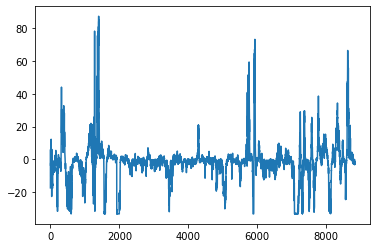

In [16]:
from matplotlib import pyplot as plt
plt.plot(predictions_list)
plt.show()

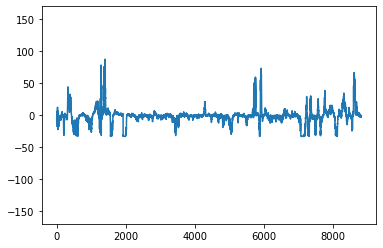

In [17]:
from matplotlib import pyplot as plt
plt.plot(predictions_list)
plt.ylim(-170, 170)
plt.show()

In [18]:
import numpy as np
import matplotlib.pylab as plt

def running_mean(x, N):
        cumsum = np.cumsum(np.insert(x, 0, 0)) 
        return (cumsum[N:] - cumsum[:-N]) / float(N)

def get_smoothness_score(series):
    
    smooth = running_mean(series, 9)
    diff = series[4:-4] - smooth
    
    smoothness = 1/np.mean(np.abs(diff))
    print(smoothness)
    return smoothness


#time = np.linspace(0, 100, 100)
#clean = np.sin(time/100)
#noise = np.random.normal(0,0.1,100)
#noisy = clean+noise

#get_smoothness_score(noisy)

#plt.plot(time, noisy)
#plt.show()

In [19]:
get_smoothness_score(ground_truth)

2.486711767072478


2.486711767072478

In [20]:
get_smoothness_score(predictions_list)

0.7828069530086582


0.7828069530086582

13.74510856434659


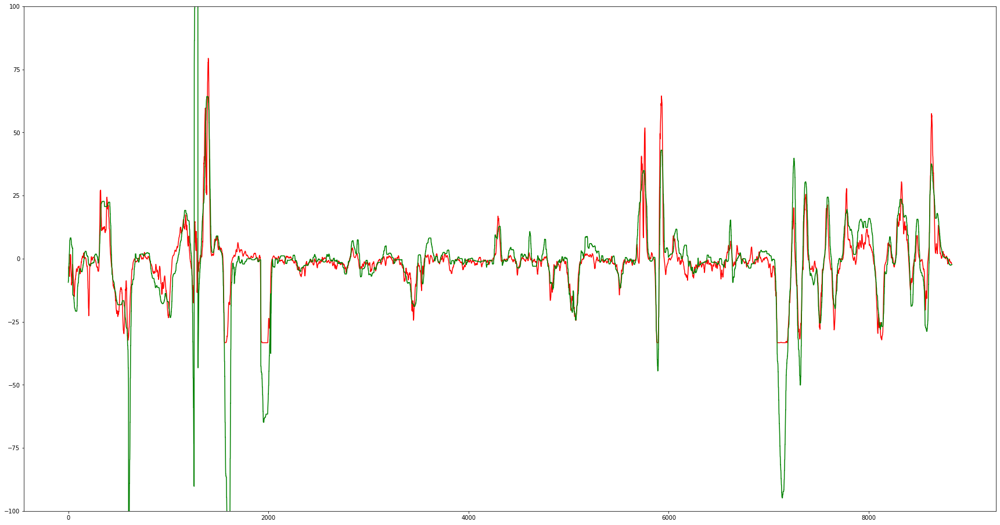

In [21]:
idxs = np.linspace(0, len(ground_truth), len(ground_truth))

plt.figure(figsize=(30,16))

#plt.show()
#plt.plot(idxs, predictions_list)

plt.ylim(-100,100)
smooth_idxs = idxs[4:-4]
smooth = running_mean(predictions_list, 9)
plt.plot(smooth_idxs, smooth, color = 'red')

super_smooth_idxs = idxs[20:-20]
super_smooth = running_mean(predictions_list, 41)
#plt.plot(super_smooth_idxs, super_smooth)

get_smoothness_score(super_smooth)


plt.plot(idxs, ground_truth, color = 'green')

plt.show()

In [22]:
get_smoothness_score(smooth)

3.3507685586692184


3.3507685586692184

# Links/Rechts Tendenz

In [23]:
np.mean(ground_truth)

-1.7809114583333334

In [24]:
np.mean(predictions_list)

-1.5247791337767422

# Test Shift-Verhalten:

In [25]:
from matplotlib import pyplot as plt
import ipywidgets as widgets
from ipywidgets import interact
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib as mpl

mpl.rcParams['figure.figsize'] = [12, 12]
mpl.rcParams['figure.dpi'] = 72

def show_crop(index, shift):
    frame = val_set.get_cropped_frame(index, shift)[0]
    frame_arr = img_to_array(frame)/255
    plt.imshow(frame_arr)
    plt.show()
    
crop_slider = widgets.IntSlider(min=0, max=val_set.get_batch_size()*len(val_set)-1, continuous_update=False)
shift_slider = widgets.IntSlider(min=-100, max=100, continuous_update=False)

interact(show_crop, index=crop_slider, shift = shift_slider);

interactive(children=(IntSlider(value=0, continuous_update=False, description='index', max=8831), IntSlider(va…

In [26]:
gui = AutopilotGUI()

predictions_lists = []
render_list = []

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(model_name + '_shift_behaviour.avi',fourcc, 15.0, (848,170))

frames = range(0, val_set.get_batch_size()*len(val_set)-1, 50)

shifts = range(-100,100,4)


for frame_idx in frames:
    predictions_lists.append([])
    for shift in shifts:
        cropped_sample = val_set.get_cropped_frame(frame_idx, shift, offset=0)
        cropped_frame = cropped_sample[0]
        actual_swa = cropped_sample[1]['steering_wheel_angle']*90
        test_data = np.expand_dims(cropped_frame, axis=0)
        predictions = loaded_model.predict(test_data)
        predicted_swa = predictions[0][0]*90
        predictions_lists[-1].append({'shift':shift, 'actual':actual_swa, 'predicted':predicted_swa})



        gui.set_frame(cropped_frame)
        gui.set_show_overlay(True)
        gui.set_engaged(False)
        gui.set_recording(False)

        gui.set_timestring('')

        velocity = cropped_sample[1]['speed']
        gui.set_velocity(velocity)

        gui.set_actual_swa(actual_swa)
        gui.set_predicted_swa(predicted_swa)

        print("Ground-truth: " +str(actual_swa))
        print("Prediction: " + str(predicted_swa))

        gui.render()
        frame = gui.get_rendered_gui()

        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        out.write(rgb_frame.astype(np.uint8))
    
out.release()

AttributeError: 'RoadDataset' object has no attribute 'get_cropped_frame'

In [ ]:
print(predictions_lists)

In [ ]:
good_predictions = []
for prediction_list in predictions_lists:
    predictions = [element['predicted'] for element in prediction_list]
    ground_truths = [element['actual'] for element in prediction_list]
    base_pred = predictions[len(predictions)//2]
    base_gt = ground_truths[len(ground_truths)//2]
    error = abs(base_gt - base_pred)
    
    linewidth = 0.2
    if error < 10:
        linewidth = 0.2
        good_predictions.append(predictions)
    #plt.plot(shifts, np.asarray(prediction_list), linewidth = 0.5)
    plt.plot(shifts, np.asarray(predictions)-base_pred, linewidth = linewidth)

median_predictions = np.median(good_predictions, axis=0)
plt.plot(shifts, np.asarray(median_predictions)-median_predictions[len(median_predictions)//2], linewidth = 3)

plt.xlabel("shift (px)")
plt.ylabel("swa offset (deg)")
plt.grid()
plt.show()



# Lenkrad Winkelgeschwindigkeit

In [ ]:
speeds = velocity_list[:]
angles = ground_truth[:] # deg
fps = 15
angular_speed = np.diff(angles)*fps # deg/s


idxs = range(1, len(angles)+1)
print(len(angles))
#print(angles)
print(len(angular_speed))
#print(angular_speed)

plt.plot(idxs, angles)
#plt.plot(idxs[:len(angular_speed)], angular_speed)
plt.xlabel("frame idx")
plt.ylabel("swa (deg)")
plt.show()


In [ ]:
speeds = np.asarray(speeds)
abs_angles = abs(np.asarray(angles))
abs_angular_speed = abs(angular_speed)

In [ ]:
# get indices where abs(swa) > 45
invalid_angle_indxs = np.argwhere(abs_angles>45)

# get indices where speed < 25
invalid_speed_indxs = np.argwhere(speeds[:-1]<25)

In [ ]:
# remove samples from angular speed array
abs_angular_speed[invalid_angle_indxs] = 0
abs_angular_speed[invalid_speed_indxs] = 0

In [ ]:
plt.plot(idxs[:len(abs_angular_speed)], abs_angular_speed)
plt.xlabel("frame idx")
plt.ylabel("swa abs(deg/s)")
plt.show()

In [ ]:
qs = list(range(60,90,5))
qs.extend(list(range(90,101,1)))

for q in qs:
    print("{}th: {} deg/s".format(q, round(np.percentile(abs_angular_speed, q=q),1)))